# Условие задачи:

Чтобы оптимизировать производственные расходы, металлургический комбинат решил уменьшить потребление электроэнергии на этапе обработки стали. Необходимо построить модель, которая предскажет температуру стали.

# Описание этапа обработки

Сталь обрабатывают в металлическом ковше вместимостью около 100 тонн. Чтобы ковш выдерживал высокие температуры, изнутри его облицовывают огнеупорным кирпичом. Расплавленную сталь заливают в ковш и подогревают до нужной температуры графитовыми электродами. Они установлены в крышке ковша. 

Из сплава выводится сера (десульфурация), добавлением примесей корректируется химический состав и отбираются пробы. Сталь легируют — изменяют её состав — подавая куски сплава из бункера для сыпучих материалов или проволоку через специальный трайб-аппарат (англ. tribe, «масса»).

Перед тем как первый раз ввести легирующие добавки, измеряют температуру стали и производят её химический анализ. Потом температуру на несколько минут повышают, добавляют легирующие материалы и продувают сплав инертным газом. Затем его перемешивают и снова проводят измерения. Такой цикл повторяется до достижения целевого химического состава и оптимальной температуры плавки.

Тогда расплавленная сталь отправляется на доводку металла или поступает в машину непрерывной разливки. Оттуда готовый продукт выходит в виде заготовок-слябов (англ. *slab*, «плита»).

# Описание данных

Данные состоят из файлов, полученных из разных источников:

- `data_arc.csv` — данные об электродах;
- `data_bulk.csv` — данные о подаче сыпучих материалов (объём);
- `data_bulk_time.csv` *—* данные о подаче сыпучих материалов (время);
- `data_gas.csv` — данные о продувке сплава газом;
- `data_temp.csv` — результаты измерения температуры;
- `data_wire.csv` — данные о проволочных материалах (объём);
- `data_wire_time.csv` — данные о проволочных материалах (время).

Во всех файлах столбец `key` содержит номер партии. В файлах может быть несколько строк с одинаковым значением `key`: они соответствуют разным итерациям обработки.


# План работы:
    
- Импортируем данные, проведем исследовательский анализ данных.
- Проведем предобработку данных

- Подготоим данные:
    - Определим признаки необхимые нам для нашей будущей модели
    - Удалим ненужные данные, если найдем такие
    
    
- Соединим все нужные данные в одну таблицу с признаками key
- Будем использовать XGBoost, CatBoost, LightGBM, LinearRegression с подбором нужных параметров
- Сравним полученные результаты наших моделей и выделим лучшую
- Проверим на тестовой выборке
- Напишем отчет



##  Исследовательский Анализ Данных

In [2]:
import os
import math
import time
import itertools 
import urllib.request
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_style("darkgrid")
import xgboost
import lightgbm as lgb
import matplotlib.pyplot as plt
%matplotlib inline
from pathlib import Path
from catboost import CatBoostRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression
import warnings
warnings.filterwarnings('ignore')
SEED=12345
from scipy import stats

In [3]:
data_arc = pd.read_csv('../../../final_steel/data_arc.csv')

data_bulk = pd.read_csv('../../../final_steel/data_bulk.csv')

data_bulk_time = pd.read_csv('../../../final_steel/data_bulk_time.csv')

data_gas = pd.read_csv('../../../final_steel/data_gas.csv')

data_temp = pd.read_csv('../../../final_steel/data_temp.csv')

data_wire = pd.read_csv('../../../final_steel/data_wire.csv')

data_wire_time = pd.read_csv('../../../final_steel/data_wire_time.csv')

In [4]:
def sns_draw(data, parametr, bins=30):
        fig = plt.figure(figsize=(15, 6), dpi= 80)
        grid = plt.GridSpec(4, 4, hspace=0.5, wspace=0.2)
        ax_main = fig.add_subplot(grid[:-1, :-1])
        ax_right = fig.add_subplot(grid[:-1, -1])  
        sns.distplot(data[parametr], ax=ax_main)
        sns.boxplot(data[parametr], ax=ax_right)
        ax_right.grid(axis='y')
        ax_main.set(title='График '+parametr)
        ax_main.axvline(np.mean(data[parametr]),color='g', linestyle='--', label='Среднее')
        ax_main.axvline(np.median(data[parametr]),color='g', linestyle='-', label='Медиана')
        ax_main.legend()
        fig.show()

---

### `Data_arc Dataset` : Данные об электродах

In [5]:
data_arc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14876 entries, 0 to 14875
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   key                   14876 non-null  int64  
 1   Начало нагрева дугой  14876 non-null  object 
 2   Конец нагрева дугой   14876 non-null  object 
 3   Активная мощность     14876 non-null  float64
 4   Реактивная мощность   14876 non-null  float64
dtypes: float64(2), int64(1), object(2)
memory usage: 581.2+ KB


In [6]:
data_arc.head(10)

,key,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.976059,0.687084
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.805607,0.520285
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.744363,0.498805
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,1.659363,1.062669
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.692755,0.414397
5,2,2019-05-03 11:34:14,2019-05-03 11:36:31,0.438063,0.283043
6,2,2019-05-03 11:38:50,2019-05-03 11:44:28,1.296415,0.892914
7,2,2019-05-03 11:46:19,2019-05-03 11:48:25,0.490377,0.305281
8,2,2019-05-03 11:49:48,2019-05-03 11:53:18,0.827743,0.516874
9,3,2019-05-03 12:06:54,2019-05-03 12:11:34,1.062053,0.671494


Пропусков в данных нет, но типы данных для дат не корректные, подправим это.

In [7]:
data_arc['Начало нагрева дугой'] = pd.to_datetime(data_arc['Начало нагрева дугой'])
data_arc['Конец нагрева дугой'] = pd.to_datetime(data_arc['Конец нагрева дугой'])

In [8]:
data_arc.describe()

,key,Активная мощность,Реактивная мощность
count,14876.000000,14876.000000,14876.000000
mean,1615.220422,0.670441,0.452592
std,934.571502,0.408159,5.878702
min,1.000000,0.030002,-715.504924
25%,806.000000,0.395297,0.290991
50%,1617.000000,0.555517,0.415962
75%,2429.000000,0.857034,0.637371
max,3241.000000,3.731596,2.676388


Заметно наличие аномального значения "-715" в столбце с реактивной мощностью.

In [9]:
data_arc.duplicated().sum()

0

По результатам первичного осмотра отметим следующие моменты:
- дубликатов не обнаружено
- типы данных изменены на корректные
- обнаружено аномальное значение в столбце с реактивной мощностью
- пропусков и дубликатов нет

<b> Разберем, что такое активная и реактивная мощности:</b>

- `Активная мощность (Real Power)`

    Единица измерения — ватт (русское обозначение: Вт, киловатт - кВт; международное: ватт -W, киловатт - kW).

    Среднее за период Τ  значение мгновенной мощности называется активной  мощностью, и

    выражается формулой:
    

$$ P =  {1 \over T} \int\limits_{0}^{T} p(t) dt $$



- `Реактивная мощность (Reactive Power)`

    Единица измерения — вольт-ампер реактивный (русское обозначение: вар, кВАР; международное: var).

    Реактивная мощность — величина, характеризующая нагрузки, создаваемые в электротехнических устройствах колебаниями энергии электромагнитного поля в цепи синусоидального переменного тока, равна произведению среднеквадратичных значений напряжения U и тока I, умноженному на синус угла сдвига фаз φ между ними:
    $$ Q = U * I * Sin\varphi $$
     (если ток отстаёт от напряжения, сдвиг фаз считается положительным, если опережает — отрицательным). Реактивная мощность связана с полной мощностью S и активной мощностью P  соотношением: 
     $$ | Q | = {\sqrt{S^2 - P^2}} $$
 
 
 
 
- `Полная мощность (Apparent Power)`

    Единица полной электрической мощности — вольт-ампер (русское обозначение: В·А, ВА, кВА-кило-вольт-ампер; международное: V·A, kVA).
    Полная мощность — величина, равная произведению действующих значений периодического электрического тока I в цепи и напряжения U на её зажимах:
    $$ S = U * I $$ 
    соотношение полной мощности с активной и реактивной мощностями выражается в следующем виде:
    $$  S  = {\sqrt{P^2 + Q^2}} $$
    где P — активная мощность, Q — реактивная мощность (при индуктивной нагрузке Q›0, а при ёмкостной Q‹0). Векторная зависимость между полной, активной и реактивной мощностью выражается формулой: 
    
    $$ \overrightarrow S = \overrightarrow P + \overrightarrow Q $$
    
    Полная мощность имеет практическое значение, как величина, описывающая нагрузки, фактически налагаемые потребителем на элементы подводящей электросети (провода, кабели, распределительные щиты, трансформаторы, линии электропередачи), так как эти нагрузки зависят от потребляемого тока, а не от фактически использованной потребителем энергии. Именно поэтому полная мощность трансформаторов и распределительных щитов измеряется в вольт-амперах, а не в ваттах.


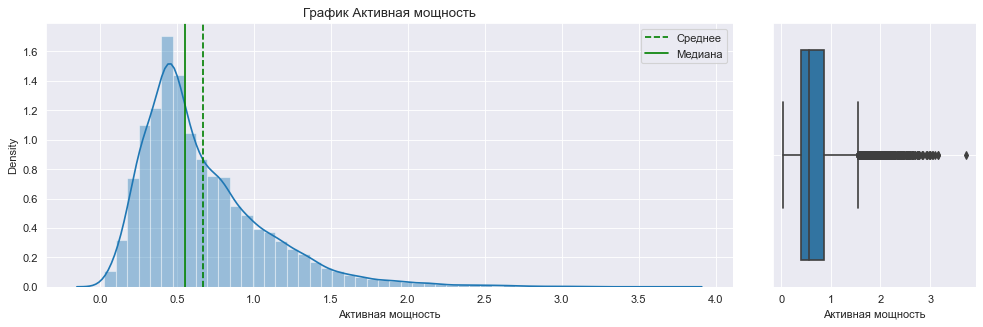

In [10]:
sns_draw(data_arc,'Активная мощность')

In [11]:
data_arc = data_arc[data_arc['Реактивная мощность'] > 0]

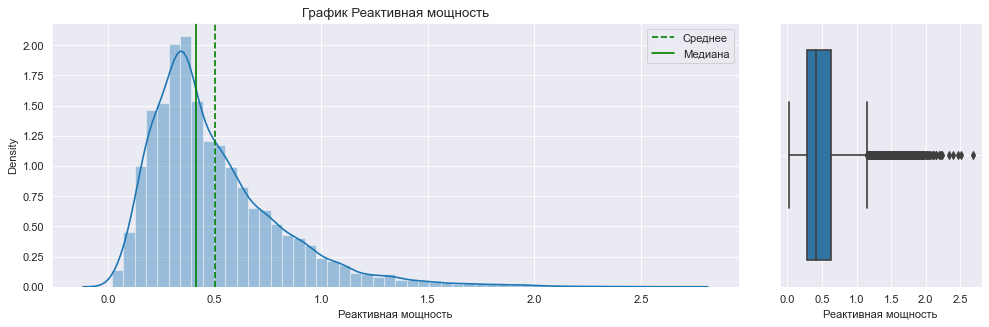

In [12]:
sns_draw(data_arc,'Реактивная мощность')

Распределение мощностей напоминает нормальное со сдвигом влево

Корреляция активной и реактивной мощности 0.9631819131519801


<Figure size 1440x720 with 0 Axes>

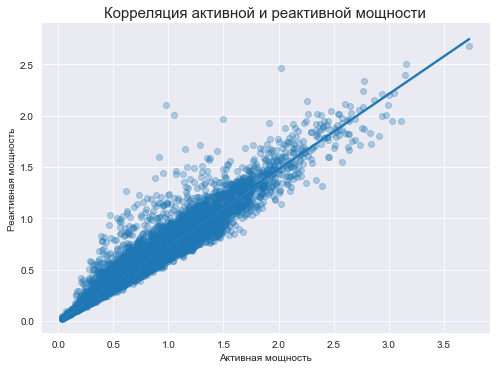

In [13]:
#Проверим корреляцию между активной и реактивной мощностями
print('Корреляция активной и реактивной мощности', data_arc['Активная мощность'].corr(data_arc['Реактивная мощность']))
plt.figure(figsize=(20,10))
sns.lmplot(x='Активная мощность', y='Реактивная мощность',data=data_arc, scatter_kws={'alpha':0.3}, aspect=14/10)
plt.title('Корреляция активной и реактивной мощности', fontsize=15)
plt.show();

Реактивная и активная мощности очень сильно коррелируют между собой. Возможна переобучаемость модели в дальнейшем. 

Имея данные по активной и реактивной мощности можем ввести новый признак "Полная мощность" по следующей формуле:

$$ S=\sqrt{P^2+Q^2} $$
где: $P$ — активная мощность, $Q$ — реактивная мощность

In [14]:
def full_power(row):
    full_power = math.sqrt(row['Активная мощность']**2 + row['Реактивная мощность']**2)
    return full_power

In [15]:
data_arc['Полная мощность'] = data_arc.apply(full_power, axis=1)

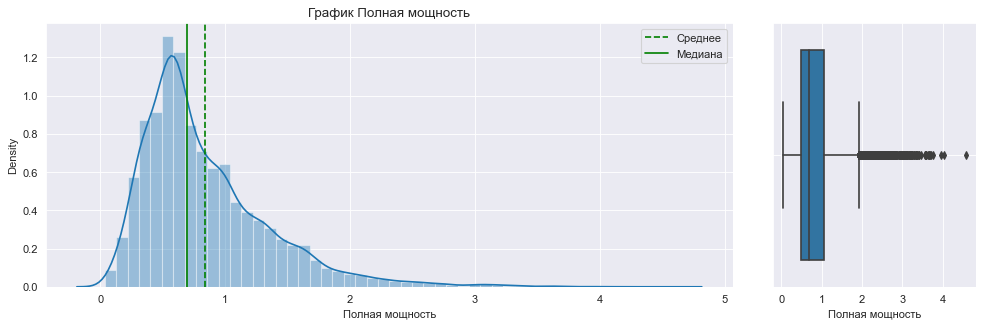

In [16]:
sns_draw(data_arc, 'Полная мощность')

<b> Вывод:</b>

- Изучили датасет data_arc
- Проверили на дубликаты и пустые значения. Их у нас не оказалось.
- Изменили типы данных на datetime в столбца `начало нагрева дугой` и `конец нагрева дугой`
- Избавились от аномальных значений `-715` в Реактивной мощности. 
- Разобрались, что такое активная и реактивная мощности. Так же из-за сильной корреляции между активной и реактивной мощностями, добавили новый признак `полная мощность`. 

---

###  `Data_Bulk Dataset` : Данные о подаче сыпучих материалов (объём);

In [17]:
data_bulk.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   key      3129 non-null   int64  
 1   Bulk 1   252 non-null    float64
 2   Bulk 2   22 non-null     float64
 3   Bulk 3   1298 non-null   float64
 4   Bulk 4   1014 non-null   float64
 5   Bulk 5   77 non-null     float64
 6   Bulk 6   576 non-null    float64
 7   Bulk 7   25 non-null     float64
 8   Bulk 8   1 non-null      float64
 9   Bulk 9   19 non-null     float64
 10  Bulk 10  176 non-null    float64
 11  Bulk 11  177 non-null    float64
 12  Bulk 12  2450 non-null   float64
 13  Bulk 13  18 non-null     float64
 14  Bulk 14  2806 non-null   float64
 15  Bulk 15  2248 non-null   float64
dtypes: float64(15), int64(1)
memory usage: 391.2 KB


In [18]:
data_bulk.head()

,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,NaN,NaN,NaN,43.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,206.0,NaN,150.0,154.0
1,2,NaN,NaN,NaN,73.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,206.0,NaN,149.0,154.0
2,3,NaN,NaN,NaN,34.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,205.0,NaN,152.0,153.0
3,4,NaN,NaN,NaN,81.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,207.0,NaN,153.0,154.0
4,5,NaN,NaN,NaN,78.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,203.0,NaN,151.0,152.0


In [19]:
data_bulk.describe()

,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
count,3129.000000,252.000000,22.000000,1298.000000,1014.000000,77.000000,576.000000,25.000000,1.0,19.000000,176.000000,177.000000,2450.000000,18.000000,2806.000000,2248.000000
mean,1624.383509,39.242063,253.045455,113.879045,104.394477,107.025974,118.925347,305.600000,49.0,76.315789,83.284091,76.819209,260.471020,181.111111,170.284747,160.513345
std,933.337642,18.277654,21.180578,75.483494,48.184126,81.790646,72.057776,191.022904,NaN,21.720581,26.060347,59.655365,120.649269,46.088009,65.868652,51.765319
min,1.000000,10.000000,228.000000,6.000000,12.000000,11.000000,17.000000,47.000000,49.0,63.000000,24.000000,8.000000,53.000000,151.000000,16.000000,1.000000
25%,816.000000,27.000000,242.000000,58.000000,72.000000,70.000000,69.750000,155.000000,49.0,66.000000,64.000000,25.000000,204.000000,153.250000,119.000000,105.000000
50%,1622.000000,31.000000,251.500000,97.500000,102.000000,86.000000,100.000000,298.000000,49.0,68.000000,86.500000,64.000000,208.000000,155.500000,151.000000,160.000000
75%,2431.000000,46.000000,257.750000,152.000000,133.000000,132.000000,157.000000,406.000000,49.0,70.500000,102.000000,106.000000,316.000000,203.500000,205.750000,205.000000
max,3241.000000,185.000000,325.000000,454.000000,281.000000,603.000000,503.000000,772.000000,49.0,147.000000,159.000000,313.000000,1849.000000,305.000000,636.000000,405.000000


In [20]:
data_bulk.duplicated().sum()

0

- Типы данных указаны верно. Дубликаты отсутствуют.
- Видим большое количество пропущенных значений в датасете из-за того что для каждой партии добавляют опредленное сочетание сыпучих материалов.

---

### `Data_Bulk_time` : Данные о подаче сыпучих материалов (объём);

In [21]:
data_bulk_time.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   key      3129 non-null   int64 
 1   Bulk 1   252 non-null    object
 2   Bulk 2   22 non-null     object
 3   Bulk 3   1298 non-null   object
 4   Bulk 4   1014 non-null   object
 5   Bulk 5   77 non-null     object
 6   Bulk 6   576 non-null    object
 7   Bulk 7   25 non-null     object
 8   Bulk 8   1 non-null      object
 9   Bulk 9   19 non-null     object
 10  Bulk 10  176 non-null    object
 11  Bulk 11  177 non-null    object
 12  Bulk 12  2450 non-null   object
 13  Bulk 13  18 non-null     object
 14  Bulk 14  2806 non-null   object
 15  Bulk 15  2248 non-null   object
dtypes: int64(1), object(15)
memory usage: 391.2+ KB


In [22]:
data_bulk_time.head()

,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,NaN,NaN,NaN,2019-05-03 11:21:30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 11:03:52,NaN,2019-05-03 11:03:52,2019-05-03 11:03:52
1,2,NaN,NaN,NaN,2019-05-03 11:46:38,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 11:40:20,NaN,2019-05-03 11:40:20,2019-05-03 11:40:20
2,3,NaN,NaN,NaN,2019-05-03 12:31:06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 12:09:40,NaN,2019-05-03 12:09:40,2019-05-03 12:09:40
3,4,NaN,NaN,NaN,2019-05-03 12:48:43,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 12:41:24,NaN,2019-05-03 12:41:24,2019-05-03 12:41:24
4,5,NaN,NaN,NaN,2019-05-03 13:18:50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 13:12:56,NaN,2019-05-03 13:12:56,2019-05-03 13:12:56


In [23]:
data_bulk_time.describe()

,key
count,3129.000000
mean,1624.383509
std,933.337642
min,1.000000
25%,816.000000
50%,1622.000000
75%,2431.000000
max,3241.000000


In [24]:
data_bulk_time.duplicated().sum()

0

- Наблюдаем большое количество пропущенных значений в датасете
- Дубликатов не имеем, Имеются типы данных, которые нужно исправить
- В построении нашей будущей модели данный датасет использовать не будем, поэтому нет необходимости проводить его предобработку

---

### `Data_gas` : Данные о подаче сыпучих материалов (объём);

In [25]:
data_gas.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3239 entries, 0 to 3238
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   key     3239 non-null   int64  
 1   Газ 1   3239 non-null   float64
dtypes: float64(1), int64(1)
memory usage: 50.7 KB


In [26]:
data_gas.head()

,key,Газ 1
0,1,29.749986
1,2,12.555561
2,3,28.554793
3,4,18.841219
4,5,5.413692


In [27]:
data_gas.describe()

,key,Газ 1
count,3239.000000,3239.000000
mean,1621.861377,11.002062
std,935.386334,6.220327
min,1.000000,0.008399
25%,812.500000,7.043089
50%,1622.000000,9.836267
75%,2431.500000,13.769915
max,3241.000000,77.995040


In [28]:
data_gas.duplicated().sum()

0

- Исходя из полученных данных можно сказать, что распределение нормальное. 
- Дубликатов не имеем, типы данных указаны верно. 
- Незаполненныз значений не имеем

---

### `Data_temp` : Данные о подаче сыпучих материалов (объём);

In [29]:
data_temp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15907 entries, 0 to 15906
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   key           15907 non-null  int64  
 1   Время замера  15907 non-null  object 
 2   Температура   13006 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 372.9+ KB


In [30]:
data_temp.head()

,key,Время замера,Температура
0,1,2019-05-03 11:16:18,1571.0
1,1,2019-05-03 11:25:53,1604.0
2,1,2019-05-03 11:29:11,1618.0
3,1,2019-05-03 11:30:01,1601.0
4,1,2019-05-03 11:30:39,1613.0


In [31]:
data_temp.describe()

,key,Температура
count,15907.000000,13006.000000
mean,1607.880870,1591.840920
std,942.212073,21.375851
min,1.000000,1191.000000
25%,790.000000,1581.000000
50%,1618.000000,1591.000000
75%,2427.000000,1601.000000
max,3241.000000,1705.000000


In [32]:
data_temp.duplicated().sum()

0

Поле время замера имеет не корректный вид, заменим на подходящий.

In [33]:
data_temp['Время замера'] = pd.to_datetime(data_temp['Время замера'])

In [34]:
data_temp[data_temp['Температура'].isnull()].head(10)

,key,Время замера,Температура
12268,2500,2019-08-06 03:24:43,NaN
12269,2500,2019-08-06 03:25:16,NaN
12270,2500,2019-08-06 03:28:21,NaN
12272,2501,2019-08-06 04:01:59,NaN
12273,2501,2019-08-06 04:14:35,NaN
12274,2501,2019-08-06 04:22:14,NaN
12275,2501,2019-08-06 04:31:14,NaN
12277,2502,2019-08-06 04:46:04,NaN
12278,2502,2019-08-06 04:52:32,NaN
12279,2502,2019-08-06 04:57:30,NaN


In [35]:
data_temp[data_temp['Температура'].isnull()].tail()

,key,Время замера,Температура
15901,3240,2019-09-01 03:35:16,NaN
15903,3241,2019-09-01 04:16:12,NaN
15904,3241,2019-09-01 04:22:39,NaN
15905,3241,2019-09-01 04:33:42,NaN
15906,3241,2019-09-01 04:38:08,NaN


In [36]:
data_temp = data_temp[-(data_temp['Температура'].isnull())]

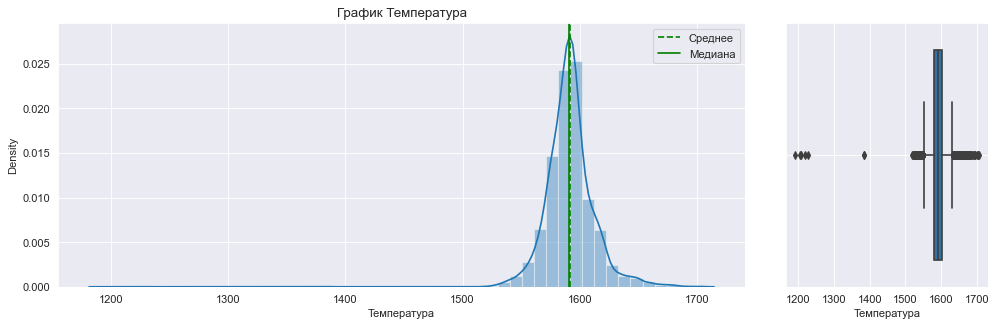

In [37]:
sns_draw(data_temp, 'Температура')

- В датасете отсутствуют некоторые данные по температурам, мы их удалим для дальнейшей работы.
- Распределение выглядит нормальным, но имеются аномальные выбросы
- Начиная с 2500 партии наблюдаем пропущенные значения
- Исправили тип данных у Время замера на datetime
- Дубликатов не имеется

---

### `Data_wire` : Данные о подаче сыпучих материалов (объём);

In [38]:
data_wire.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   key     3081 non-null   int64  
 1   Wire 1  3055 non-null   float64
 2   Wire 2  1079 non-null   float64
 3   Wire 3  63 non-null     float64
 4   Wire 4  14 non-null     float64
 5   Wire 5  1 non-null      float64
 6   Wire 6  73 non-null     float64
 7   Wire 7  11 non-null     float64
 8   Wire 8  19 non-null     float64
 9   Wire 9  29 non-null     float64
dtypes: float64(9), int64(1)
memory usage: 240.8 KB


In [39]:
data_wire.head()

,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1,60.059998,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,96.052315,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,91.160157,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,89.063515,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,89.238236,9.11456,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [40]:
data_wire.describe()

,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
count,3081.000000,3055.000000,1079.000000,63.000000,14.000000,1.000,73.000000,11.000000,19.000000,29.000000
mean,1623.426485,100.895853,50.577323,189.482681,57.442842,15.132,48.016974,10.039007,53.625193,34.155752
std,932.996726,42.012518,39.320216,99.513444,28.824667,NaN,33.919845,8.610584,16.881728,19.931616
min,1.000000,1.918800,0.030160,0.144144,24.148801,15.132,0.034320,0.234208,45.076721,4.622800
25%,823.000000,72.115684,20.193680,95.135044,40.807002,15.132,25.053600,6.762756,46.094879,22.058401
50%,1619.000000,100.158234,40.142956,235.194977,45.234282,15.132,42.076324,9.017009,46.279999,30.066399
75%,2434.000000,126.060483,70.227558,276.252014,76.124619,15.132,64.212723,11.886057,48.089603,43.862003
max,3241.000000,330.314424,282.780152,385.008668,113.231044,15.132,180.454575,32.847674,102.762401,90.053604


In [41]:
data_wire.duplicated().sum()

0

- Дубликатов не имеем 
- Имеются пустые значения в датасете, скорее всего они пустые потому что различные виды проволочных материалов поступали в разных пропорциях в разные промежутки времени.
- Типы данных указаны верно

---

### `Data_wire_time` : Данные о подаче сыпучих материалов (объём);

In [42]:
data_wire_time.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   key     3081 non-null   int64 
 1   Wire 1  3055 non-null   object
 2   Wire 2  1079 non-null   object
 3   Wire 3  63 non-null     object
 4   Wire 4  14 non-null     object
 5   Wire 5  1 non-null      object
 6   Wire 6  73 non-null     object
 7   Wire 7  11 non-null     object
 8   Wire 8  19 non-null     object
 9   Wire 9  29 non-null     object
dtypes: int64(1), object(9)
memory usage: 240.8+ KB


In [43]:
data_wire_time.head()

,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1,2019-05-03 11:11:41,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,2019-05-03 11:46:10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,2019-05-03 12:13:47,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,2019-05-03 12:48:05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,2019-05-03 13:18:15,2019-05-03 13:32:06,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [44]:
data_wire_time.describe()

,key
count,3081.000000
mean,1623.426485
std,932.996726
min,1.000000
25%,823.000000
50%,1619.000000
75%,2434.000000
max,3241.000000


In [45]:
data_wire_time.duplicated().sum()

0

- Дубликатов не имеется
- Имеются пустые значения
- Типы данных в Wire 1 указаны неверно, но менять не будет так как данный датасет использовать в дальнейшем не будем.

---

##  Вывод по Исследовательскому Анализу Данных

- Загрузили данные, изучили.
- Избавились от некоторых аномальных значений.
- Изменили типы данных, в некоторых датасетах были неправильно указаны данные типа Datetime
- Проверили данные на пропуски и дубликаты.
- В датасете data_arc ввели сразу новый признак "Полная мощность"
- В таргете отсутствуют данные начиная с 2500й партии, поэтому в дальнейшем нужно будет провести срез данных начиная с 2500 партии.


---

##  Предобработка данных

### План работы:

- Объединим таблицы в один датасет для нашей будущей модели
- Обработаем пропуски 
- Целевой признак - Последняя температура 
- Проведем срез данных по Key до с 2500 партии

---

In [46]:
data_arc['Общее время нагрева дугой'] = data_arc['Конец нагрева дугой'] - data_arc['Начало нагрева дугой']
data_arc['Общее время нагрева дугой'] = data_arc['Общее время нагрева дугой'].dt.seconds

In [47]:
data_temp = data_temp.query('key < 2500')
data_arc = data_arc.query('key < 2500')
data_bulk = data_bulk.query('key < 2500')
data_wire = data_wire.query('key < 2500')

In [48]:
data_arc_c = data_arc.groupby(by = 'key', as_index = False).count()[['key', 'Начало нагрева дугой']]
data_arc_c.columns = ['key', 'Количество итераций нагрева']

In [49]:
data_arc = data_arc.groupby(by = 'key', as_index = False).sum()
data_arc = data_arc.merge(data_arc_c, how = 'left', on = 'key')

In [50]:
data_arc = data_arc[['key', 'Полная мощность', 'Общее время нагрева дугой', 'Количество итераций нагрева']]

In [51]:
data_arc.head(5)

,key,Полная мощность,Общее время нагрева дугой,Количество итераций нагрева
0,1,5.826395,1098,5
1,2,3.649216,811,4
2,3,2.989534,655,5
3,4,3.814962,741,4
4,5,4.035758,869,4


<Figure size 1080x720 with 0 Axes>

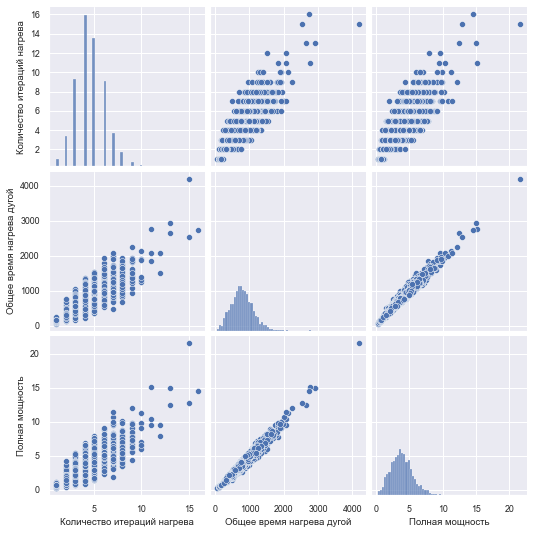

In [52]:
plt.figure(figsize=(15,10))
sns.set(font_scale=0.8)
sns.pairplot(data_arc[['Количество итераций нагрева', 'Общее время нагрева дугой', 'Полная мощность']], 
             kind="scatter")
plt.show();

In [53]:
data_arc[['Полная мощность', 'Общее время нагрева дугой', 'Количество итераций нагрева']].corr()

,Полная мощность,Общее время нагрева дугой,Количество итераций нагрева
Полная мощность,1.000000,0.982899,0.760402
Общее время нагрева дугой,0.982899,1.000000,0.795958
Количество итераций нагрева,0.760402,0.795958,1.000000


Сильная корреляция между полной мощностью и общим временем нагрева дугой. Попробуем избавиться от времени нагрева дугой для нашей будущей модели

In [54]:
#Уберем из датасета столбец "Общее время нагрева дугой"
data_arc = data_arc[['key', 'Полная мощность', 'Количество итераций нагрева']]

In [55]:
data_arc.head()

,key,Полная мощность,Количество итераций нагрева
0,1,5.826395,5
1,2,3.649216,4
2,3,2.989534,5
3,4,3.814962,4
4,5,4.035758,4


In [56]:
#Очистим пропуски в данных в таблице data_temp
data_temp = data_temp.dropna(subset=['Температура']).reset_index(drop=True)
data_temp = data_temp.sort_values(by=['Время замера'])

In [57]:
#Удалим информацию о партиях по которым известно только одно измерение температуры.
count = data_temp.groupby(by = 'key', as_index = False).count()
one = count[count['Время замера'] == 1]['key'].tolist()
data_temp = data_temp.query('key not in @one')

In [58]:
#Сгруппируем данные по партии по первым и последним значениям, последние значения необходимо будет предсказывать.
data_temp = data_temp.groupby(by = 'key').agg(['first', 'last']).reset_index()
data_temp.columns = data_temp.columns.droplevel()
data_temp.columns = ['key', 'Время замера 1', 'Время замера 2', 'Температура 1', 'Температура 2']
data_temp = data_temp[['key', 'Температура 1', 'Температура 2']]

In [59]:
data_temp.head()

,key,Температура 1,Температура 2
0,1,1571.0,1613.0
1,2,1581.0,1602.0
2,3,1596.0,1599.0
3,4,1601.0,1625.0
4,5,1576.0,1602.0


In [60]:
# объединим обработанные датасеты по ключу key
data = (data_temp.merge(data_arc, how = 'left', on = 'key')
                 .merge(data_wire, how = 'left', on = 'key')
                 .merge(data_bulk, how = 'left', on = 'key')
                 .merge(data_gas, how = 'left', on = 'key')
       )


# заполним пропуски образовавшиеся после объединения таблиц нулями
data = data.fillna(0)

# переименуем столбцы для корректной работы lgbm
data = data.rename(columns={'Температура 1': 'First_temp',
                            'Температура 2': 'Last_temp',
                            'Полная мощность': 'Full_power',
                            'Количество итераций нагрева':'Heating_iterations',
                            'Газ 1': 'Gas'})

# уберем колонку-индентификатор key, которую мы использовали
# для объединения датасетов
data = data.drop(['key'], axis = 1)

In [61]:
data.head()

,First_temp,Last_temp,Full_power,Heating_iterations,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,...,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15,Gas
0,1571.0,1613.0,5.826395,5,60.059998,0.00000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,206.0,0.0,150.0,154.0,29.749986
1,1581.0,1602.0,3.649216,4,96.052315,0.00000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,206.0,0.0,149.0,154.0,12.555561
2,1596.0,1599.0,2.989534,5,91.160157,0.00000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,205.0,0.0,152.0,153.0,28.554793
3,1601.0,1625.0,3.814962,4,89.063515,0.00000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,207.0,0.0,153.0,154.0,18.841219
4,1576.0,1602.0,4.035758,4,89.238236,9.11456,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,203.0,0.0,151.0,152.0,5.413692


In [62]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2475 entries, 0 to 2474
Data columns (total 29 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   First_temp          2475 non-null   float64
 1   Last_temp           2475 non-null   float64
 2   Full_power          2475 non-null   float64
 3   Heating_iterations  2475 non-null   int64  
 4   Wire 1              2475 non-null   float64
 5   Wire 2              2475 non-null   float64
 6   Wire 3              2475 non-null   float64
 7   Wire 4              2475 non-null   float64
 8   Wire 5              2475 non-null   float64
 9   Wire 6              2475 non-null   float64
 10  Wire 7              2475 non-null   float64
 11  Wire 8              2475 non-null   float64
 12  Wire 9              2475 non-null   float64
 13  Bulk 1              2475 non-null   float64
 14  Bulk 2              2475 non-null   float64
 15  Bulk 3              2475 non-null   float64
 16  Bulk 4

После объединения таблиц мы получили набор признаков с целевым признаком. 

In [63]:
#Разделим нашу выборку на тестовую и обучающие выборки
train, test = train_test_split(data, test_size = .30, random_state = 42)

In [64]:
train.columns

Index(['First_temp', 'Last_temp', 'Full_power', 'Heating_iterations', 'Wire 1',
       'Wire 2', 'Wire 3', 'Wire 4', 'Wire 5', 'Wire 6', 'Wire 7', 'Wire 8',
       'Wire 9', 'Bulk 1', 'Bulk 2', 'Bulk 3', 'Bulk 4', 'Bulk 5', 'Bulk 6',
       'Bulk 7', 'Bulk 8', 'Bulk 9', 'Bulk 10', 'Bulk 11', 'Bulk 12',
       'Bulk 13', 'Bulk 14', 'Bulk 15', 'Gas'],
      dtype='object')

В нашей таблице имеются количественные признаки с разными разбросами, поэтому проведем масштабирование признаков

In [65]:
#Масштабируем количественные признаки
numeric = data.columns.tolist()
numeric = [i for i in numeric if i not in ('Last_temp')]
scaler = MinMaxScaler()
scaler.fit(train[numeric])

# масштабируем обучающую выборку
train[numeric] = scaler.transform(train[numeric])

# масштабируем тестовую выборку
test[numeric] = scaler.transform(test[numeric])

In [66]:
print('Размер обучающей выборки:', train.shape)
print('Размер тестовой выобрки:', test.shape)

Размер обучающей выборки: (1732, 29)
Размер тестовой выобрки: (743, 29)


In [67]:
train.head()

,First_temp,Last_temp,Full_power,Heating_iterations,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,...,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15,Gas
1840,0.807377,1585.0,0.130278,0.133333,0.307736,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.130990,0.000000,0.0,0.312893,0.000000,0.077957
2240,0.739754,1586.0,0.166019,0.333333,0.462832,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.188202
543,0.807377,1618.0,0.324607,0.333333,0.461179,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.222823,0.0,0.415094,0.372840,0.269691
1721,0.790984,1600.0,0.164281,0.200000,0.433125,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.110871,0.0,0.185535,0.501235,0.124366
2193,0.696721,1580.0,0.305321,0.333333,0.233267,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.258786,0.277447,0.0,0.308176,0.000000,0.135663


### Вывод по Предобработке данных

- Провели предобработку данных
- Избавились от выборосов и пустых значений
- Соединили таблицы в одну итоговую таблицу
- Разделили выборки на 30% тестовой выборки и 70% обучающей выборки
- Также провели масштабирование признаков
    
    

---

##  Обучение моделей и подбор параметров


In [68]:
# Определим target и features для обучающей выборки
features_train = train.drop(['Last_temp'], axis = 1)
target_train = train['Last_temp']

# Определим target и features для тестовой выборки
features_test = test.drop(['Last_temp'], axis = 1)
target_test = test['Last_temp']

In [69]:
#Определим Модели какие будем использовать 

models = {
    'CatBoostRegressor': CatBoostRegressor(),
    'LGBMRegressor': lgb.LGBMRegressor(),
    'XGBRegressor': xgboost.XGBRegressor(),
    'LinearRegression': LinearRegression()
}


# Параметры для каждой модели, которые будем подбирать
params = {
    'CatBoostRegressor':{
          'loss_function':['MAE'],
          'n_estimators': np.arange(300, 700, 100),  
          'learning_rate': np.arange(0.03, 0.12, 0.02),
          'random_state':[17],
          'depth': np.arange(3, 7)
    },        

    'LinearRegression':{
            'fit_intercept' : [True, False],
            'normalize':[True,False]
    },
    
    
    'LGBMRegressor': {
        'boosting_type': ['gbdt', 'dart'],
        'objective': ['regression'],
        'learning_rate': [0.01, 0.02, 0.03],
        'num_iterations':[500],
        'random_state': [42], 
        'max_depth': np.arange(2, 10),
        'metric': ['mae']
        },

    
    'XGBRegressor': {
        'min_child_weight': [10,20,30],
        'gamma': [5],
        'subsample': [1.0],
        'colsample_bytree': [1.0],
        'max_depth': [5,10,20],
        'eval_metric' :['mae']
        }
}

In [70]:
%%time
result_list = []

for name in models.keys():
    est = models[name]
    est_params = params[name]
    gscv = GridSearchCV(estimator=est, param_grid=est_params, cv=5)
    gscv.fit(features_train, target_train)
    train_predictions = gscv.predict(features_train)
    predictions = gscv.predict(features_test)
    result_list.append({
    'model': name,
    'train_mae_score': mean_absolute_error(target_train, train_predictions),
    'test_mae_score': mean_absolute_error(target_test, predictions),
    'best_params': gscv.best_params_
    })

0:	learn: 10.0825044	total: 52ms	remaining: 15.6s
1:	learn: 10.0325233	total: 54.2ms	remaining: 8.08s
2:	learn: 9.9792197	total: 55.9ms	remaining: 5.54s
3:	learn: 9.9207557	total: 57.3ms	remaining: 4.24s
4:	learn: 9.8855182	total: 58.7ms	remaining: 3.46s
5:	learn: 9.8491390	total: 60ms	remaining: 2.94s
6:	learn: 9.7588321	total: 61.7ms	remaining: 2.58s
7:	learn: 9.7285742	total: 62.8ms	remaining: 2.29s
8:	learn: 9.6671848	total: 63.9ms	remaining: 2.06s
9:	learn: 9.6082487	total: 64.8ms	remaining: 1.88s
10:	learn: 9.5715952	total: 65.9ms	remaining: 1.73s
11:	learn: 9.5309671	total: 66.8ms	remaining: 1.6s
12:	learn: 9.4974069	total: 68.2ms	remaining: 1.51s
13:	learn: 9.4580557	total: 69.3ms	remaining: 1.42s
14:	learn: 9.4188704	total: 70.3ms	remaining: 1.34s
15:	learn: 9.3973346	total: 71.1ms	remaining: 1.26s
16:	learn: 9.3445089	total: 72ms	remaining: 1.2s
17:	learn: 9.3216142	total: 72.7ms	remaining: 1.14s
18:	learn: 9.2658448	total: 73.5ms	remaining: 1.09s
19:	learn: 9.2269455	total: 

214:	learn: 6.1225648	total: 224ms	remaining: 88.5ms
215:	learn: 6.1185865	total: 225ms	remaining: 87.4ms
216:	learn: 6.1129054	total: 226ms	remaining: 86.4ms
217:	learn: 6.1097078	total: 227ms	remaining: 85.2ms
218:	learn: 6.1074835	total: 227ms	remaining: 84ms
219:	learn: 6.1047189	total: 228ms	remaining: 82.9ms
220:	learn: 6.1005058	total: 229ms	remaining: 81.8ms
221:	learn: 6.0980381	total: 230ms	remaining: 80.7ms
222:	learn: 6.0945293	total: 230ms	remaining: 79.5ms
223:	learn: 6.0854956	total: 231ms	remaining: 78.4ms
224:	learn: 6.0846857	total: 232ms	remaining: 77.3ms
225:	learn: 6.0809132	total: 233ms	remaining: 76.2ms
226:	learn: 6.0736459	total: 234ms	remaining: 75.1ms
227:	learn: 6.0702157	total: 235ms	remaining: 74.1ms
228:	learn: 6.0669766	total: 235ms	remaining: 73ms
229:	learn: 6.0645289	total: 236ms	remaining: 71.8ms
230:	learn: 6.0603935	total: 237ms	remaining: 70.7ms
231:	learn: 6.0576313	total: 237ms	remaining: 69.6ms
232:	learn: 6.0538610	total: 238ms	remaining: 68.5

113:	learn: 7.3078743	total: 90.4ms	remaining: 147ms
114:	learn: 7.2805586	total: 91.5ms	remaining: 147ms
115:	learn: 7.2725525	total: 92.4ms	remaining: 147ms
116:	learn: 7.2654704	total: 93.2ms	remaining: 146ms
117:	learn: 7.2447986	total: 94.2ms	remaining: 145ms
118:	learn: 7.2377138	total: 95.4ms	remaining: 145ms
119:	learn: 7.2309921	total: 96.4ms	remaining: 145ms
120:	learn: 7.2218963	total: 97.5ms	remaining: 144ms
121:	learn: 7.2147722	total: 98.2ms	remaining: 143ms
122:	learn: 7.2051338	total: 99.3ms	remaining: 143ms
123:	learn: 7.1844959	total: 100ms	remaining: 142ms
124:	learn: 7.1737887	total: 101ms	remaining: 142ms
125:	learn: 7.1687643	total: 102ms	remaining: 141ms
126:	learn: 7.1649882	total: 103ms	remaining: 141ms
127:	learn: 7.1427418	total: 104ms	remaining: 140ms
128:	learn: 7.1338803	total: 105ms	remaining: 139ms
129:	learn: 7.1170974	total: 106ms	remaining: 138ms
130:	learn: 7.1025470	total: 106ms	remaining: 137ms
131:	learn: 7.0925003	total: 107ms	remaining: 136ms
13

14:	learn: 9.3367552	total: 11.2ms	remaining: 213ms
15:	learn: 9.3153017	total: 12.3ms	remaining: 218ms
16:	learn: 9.2901470	total: 13.2ms	remaining: 219ms
17:	learn: 9.2508237	total: 13.9ms	remaining: 217ms
18:	learn: 9.2181663	total: 14.8ms	remaining: 219ms
19:	learn: 9.1744028	total: 15.5ms	remaining: 217ms
20:	learn: 9.1129558	total: 16.1ms	remaining: 214ms
21:	learn: 9.0823199	total: 16.8ms	remaining: 213ms
22:	learn: 9.0492119	total: 17.5ms	remaining: 210ms
23:	learn: 9.0023129	total: 18.5ms	remaining: 213ms
24:	learn: 8.9659242	total: 19.3ms	remaining: 212ms
25:	learn: 8.9319026	total: 20ms	remaining: 210ms
26:	learn: 8.9154981	total: 20.6ms	remaining: 209ms
27:	learn: 8.8813401	total: 21.3ms	remaining: 207ms
28:	learn: 8.8497947	total: 22ms	remaining: 205ms
29:	learn: 8.8224357	total: 22.6ms	remaining: 204ms
30:	learn: 8.7841024	total: 23.3ms	remaining: 202ms
31:	learn: 8.7491872	total: 24ms	remaining: 201ms
32:	learn: 8.7351497	total: 24.7ms	remaining: 200ms
33:	learn: 8.70483

221:	learn: 6.1071205	total: 185ms	remaining: 65ms
222:	learn: 6.0968955	total: 186ms	remaining: 64.3ms
223:	learn: 6.0916890	total: 187ms	remaining: 63.6ms
224:	learn: 6.0867240	total: 188ms	remaining: 62.8ms
225:	learn: 6.0797845	total: 189ms	remaining: 62ms
226:	learn: 6.0737518	total: 191ms	remaining: 61.3ms
227:	learn: 6.0669655	total: 192ms	remaining: 60.5ms
228:	learn: 6.0638558	total: 193ms	remaining: 59.7ms
229:	learn: 6.0569396	total: 194ms	remaining: 59ms
230:	learn: 6.0521354	total: 195ms	remaining: 58.2ms
231:	learn: 6.0484757	total: 196ms	remaining: 57.4ms
232:	learn: 6.0442223	total: 197ms	remaining: 56.6ms
233:	learn: 6.0354208	total: 198ms	remaining: 55.8ms
234:	learn: 6.0318136	total: 199ms	remaining: 55ms
235:	learn: 6.0267464	total: 200ms	remaining: 54.1ms
236:	learn: 6.0247347	total: 201ms	remaining: 53.3ms
237:	learn: 6.0204933	total: 202ms	remaining: 52.5ms
238:	learn: 6.0161045	total: 202ms	remaining: 51.7ms
239:	learn: 6.0081073	total: 203ms	remaining: 50.9ms
2

106:	learn: 7.3654414	total: 92.4ms	remaining: 167ms
107:	learn: 7.3455856	total: 93.4ms	remaining: 166ms
108:	learn: 7.3376252	total: 94.2ms	remaining: 165ms
109:	learn: 7.3120711	total: 95ms	remaining: 164ms
110:	learn: 7.3017615	total: 95.8ms	remaining: 163ms
111:	learn: 7.2991088	total: 96.5ms	remaining: 162ms
112:	learn: 7.2673570	total: 97.2ms	remaining: 161ms
113:	learn: 7.2591647	total: 97.9ms	remaining: 160ms
114:	learn: 7.2460404	total: 98.5ms	remaining: 159ms
115:	learn: 7.2407702	total: 99.2ms	remaining: 157ms
116:	learn: 7.2376230	total: 99.9ms	remaining: 156ms
117:	learn: 7.2232046	total: 101ms	remaining: 155ms
118:	learn: 7.2151253	total: 101ms	remaining: 154ms
119:	learn: 7.2078307	total: 102ms	remaining: 153ms
120:	learn: 7.1986184	total: 103ms	remaining: 152ms
121:	learn: 7.1932781	total: 104ms	remaining: 151ms
122:	learn: 7.1748325	total: 104ms	remaining: 150ms
123:	learn: 7.1439979	total: 105ms	remaining: 149ms
124:	learn: 7.1396674	total: 106ms	remaining: 148ms
125

11:	learn: 9.4571938	total: 8.92ms	remaining: 214ms
12:	learn: 9.3973626	total: 9.74ms	remaining: 215ms
13:	learn: 9.3446110	total: 10.7ms	remaining: 218ms
14:	learn: 9.3043140	total: 11.6ms	remaining: 220ms
15:	learn: 9.2751537	total: 12.4ms	remaining: 220ms
16:	learn: 9.2364585	total: 13.1ms	remaining: 218ms
17:	learn: 9.1901657	total: 13.9ms	remaining: 218ms
18:	learn: 9.1639995	total: 14.8ms	remaining: 220ms
19:	learn: 9.1431666	total: 15.6ms	remaining: 219ms
20:	learn: 9.1079416	total: 16.5ms	remaining: 220ms
21:	learn: 9.0758290	total: 17.3ms	remaining: 219ms
22:	learn: 9.0480664	total: 18ms	remaining: 217ms
23:	learn: 9.0322737	total: 18.8ms	remaining: 216ms
24:	learn: 8.9965486	total: 19.6ms	remaining: 215ms
25:	learn: 8.9434674	total: 20.6ms	remaining: 217ms
26:	learn: 8.9083595	total: 21.7ms	remaining: 220ms
27:	learn: 8.8700804	total: 22.5ms	remaining: 218ms
28:	learn: 8.8382035	total: 23.3ms	remaining: 218ms
29:	learn: 8.8154236	total: 24ms	remaining: 216ms
30:	learn: 8.752

226:	learn: 6.2547939	total: 183ms	remaining: 58.9ms
227:	learn: 6.2517355	total: 184ms	remaining: 58.2ms
228:	learn: 6.2493089	total: 185ms	remaining: 57.4ms
229:	learn: 6.2432193	total: 187ms	remaining: 57ms
230:	learn: 6.2351704	total: 188ms	remaining: 56.2ms
231:	learn: 6.2279582	total: 189ms	remaining: 55.5ms
232:	learn: 6.2245130	total: 191ms	remaining: 54.8ms
233:	learn: 6.2102434	total: 192ms	remaining: 54.1ms
234:	learn: 6.2081237	total: 193ms	remaining: 53.4ms
235:	learn: 6.1953048	total: 195ms	remaining: 52.8ms
236:	learn: 6.1924899	total: 196ms	remaining: 52ms
237:	learn: 6.1882749	total: 197ms	remaining: 51.2ms
238:	learn: 6.1818119	total: 198ms	remaining: 50.5ms
239:	learn: 6.1787526	total: 199ms	remaining: 49.7ms
240:	learn: 6.1654953	total: 199ms	remaining: 48.8ms
241:	learn: 6.1608694	total: 200ms	remaining: 48ms
242:	learn: 6.1532237	total: 201ms	remaining: 47.1ms
243:	learn: 6.1500179	total: 202ms	remaining: 46.3ms
244:	learn: 6.1487671	total: 202ms	remaining: 45.4ms

111:	learn: 6.9931475	total: 94.8ms	remaining: 244ms
112:	learn: 6.9663817	total: 96ms	remaining: 244ms
113:	learn: 6.9575328	total: 97.1ms	remaining: 244ms
114:	learn: 6.9370807	total: 98ms	remaining: 243ms
115:	learn: 6.9322526	total: 98.8ms	remaining: 242ms
116:	learn: 6.9274877	total: 100ms	remaining: 242ms
117:	learn: 6.9085039	total: 101ms	remaining: 241ms
118:	learn: 6.9029382	total: 102ms	remaining: 240ms
119:	learn: 6.8968791	total: 103ms	remaining: 239ms
120:	learn: 6.8926495	total: 103ms	remaining: 238ms
121:	learn: 6.8851044	total: 104ms	remaining: 238ms
122:	learn: 6.8715337	total: 105ms	remaining: 237ms
123:	learn: 6.8573628	total: 106ms	remaining: 236ms
124:	learn: 6.8507003	total: 107ms	remaining: 235ms
125:	learn: 6.8300630	total: 108ms	remaining: 234ms
126:	learn: 6.8275555	total: 109ms	remaining: 233ms
127:	learn: 6.8051390	total: 109ms	remaining: 233ms
128:	learn: 6.7957896	total: 110ms	remaining: 232ms
129:	learn: 6.7791277	total: 111ms	remaining: 231ms
130:	learn:

327:	learn: 5.6908336	total: 271ms	remaining: 59.5ms
328:	learn: 5.6875759	total: 272ms	remaining: 58.7ms
329:	learn: 5.6855895	total: 273ms	remaining: 57.8ms
330:	learn: 5.6800689	total: 273ms	remaining: 57ms
331:	learn: 5.6767349	total: 274ms	remaining: 56.1ms
332:	learn: 5.6744664	total: 275ms	remaining: 55.3ms
333:	learn: 5.6688127	total: 276ms	remaining: 54.5ms
334:	learn: 5.6660735	total: 277ms	remaining: 53.7ms
335:	learn: 5.6638221	total: 277ms	remaining: 52.8ms
336:	learn: 5.6593529	total: 278ms	remaining: 52ms
337:	learn: 5.6559568	total: 279ms	remaining: 51.2ms
338:	learn: 5.6538084	total: 280ms	remaining: 50.4ms
339:	learn: 5.6519701	total: 281ms	remaining: 49.5ms
340:	learn: 5.6500780	total: 281ms	remaining: 48.7ms
341:	learn: 5.6466960	total: 282ms	remaining: 47.8ms
342:	learn: 5.6445139	total: 283ms	remaining: 47ms
343:	learn: 5.6427568	total: 284ms	remaining: 46.2ms
344:	learn: 5.6399446	total: 285ms	remaining: 45.4ms
345:	learn: 5.6370885	total: 285ms	remaining: 44.5ms

125:	learn: 7.1687643	total: 102ms	remaining: 222ms
126:	learn: 7.1649882	total: 103ms	remaining: 221ms
127:	learn: 7.1427418	total: 104ms	remaining: 220ms
128:	learn: 7.1338803	total: 104ms	remaining: 219ms
129:	learn: 7.1170974	total: 105ms	remaining: 218ms
130:	learn: 7.1025470	total: 106ms	remaining: 217ms
131:	learn: 7.0925003	total: 106ms	remaining: 216ms
132:	learn: 7.0852022	total: 107ms	remaining: 215ms
133:	learn: 7.0613577	total: 108ms	remaining: 214ms
134:	learn: 7.0559596	total: 109ms	remaining: 213ms
135:	learn: 7.0472478	total: 110ms	remaining: 213ms
136:	learn: 7.0444941	total: 110ms	remaining: 212ms
137:	learn: 7.0334186	total: 111ms	remaining: 211ms
138:	learn: 7.0258058	total: 112ms	remaining: 210ms
139:	learn: 7.0176107	total: 113ms	remaining: 209ms
140:	learn: 7.0148230	total: 114ms	remaining: 209ms
141:	learn: 7.0040550	total: 114ms	remaining: 208ms
142:	learn: 6.9988229	total: 115ms	remaining: 207ms
143:	learn: 6.9825975	total: 116ms	remaining: 206ms
144:	learn: 

365:	learn: 5.8665645	total: 276ms	remaining: 25.6ms
366:	learn: 5.8619458	total: 277ms	remaining: 24.9ms
367:	learn: 5.8610477	total: 277ms	remaining: 24.1ms
368:	learn: 5.8595176	total: 278ms	remaining: 23.4ms
369:	learn: 5.8571550	total: 279ms	remaining: 22.6ms
370:	learn: 5.8539948	total: 280ms	remaining: 21.9ms
371:	learn: 5.8517831	total: 281ms	remaining: 21.1ms
372:	learn: 5.8481895	total: 281ms	remaining: 20.4ms
373:	learn: 5.8461477	total: 282ms	remaining: 19.6ms
374:	learn: 5.8431157	total: 283ms	remaining: 18.9ms
375:	learn: 5.8413741	total: 283ms	remaining: 18.1ms
376:	learn: 5.8392113	total: 284ms	remaining: 17.3ms
377:	learn: 5.8379737	total: 285ms	remaining: 16.6ms
378:	learn: 5.8371839	total: 286ms	remaining: 15.8ms
379:	learn: 5.8313306	total: 286ms	remaining: 15.1ms
380:	learn: 5.8297747	total: 288ms	remaining: 14.3ms
381:	learn: 5.8264099	total: 288ms	remaining: 13.6ms
382:	learn: 5.8250407	total: 289ms	remaining: 12.8ms
383:	learn: 5.8221467	total: 290ms	remaining: 

170:	learn: 6.4430907	total: 134ms	remaining: 180ms
171:	learn: 6.4315171	total: 135ms	remaining: 179ms
172:	learn: 6.4203091	total: 136ms	remaining: 179ms
173:	learn: 6.4181230	total: 137ms	remaining: 178ms
174:	learn: 6.4117588	total: 138ms	remaining: 177ms
175:	learn: 6.3970973	total: 139ms	remaining: 177ms
176:	learn: 6.3944165	total: 140ms	remaining: 176ms
177:	learn: 6.3876074	total: 141ms	remaining: 176ms
178:	learn: 6.3840883	total: 142ms	remaining: 175ms
179:	learn: 6.3796675	total: 142ms	remaining: 174ms
180:	learn: 6.3668653	total: 143ms	remaining: 173ms
181:	learn: 6.3639936	total: 144ms	remaining: 173ms
182:	learn: 6.3609099	total: 145ms	remaining: 172ms
183:	learn: 6.3577638	total: 146ms	remaining: 171ms
184:	learn: 6.3447107	total: 146ms	remaining: 170ms
185:	learn: 6.3404290	total: 147ms	remaining: 169ms
186:	learn: 6.3294228	total: 148ms	remaining: 168ms
187:	learn: 6.3181187	total: 149ms	remaining: 167ms
188:	learn: 6.3130369	total: 149ms	remaining: 167ms
189:	learn: 

0:	learn: 10.1164636	total: 958us	remaining: 383ms
1:	learn: 10.0593749	total: 1.93ms	remaining: 385ms
2:	learn: 10.0051380	total: 2.63ms	remaining: 349ms
3:	learn: 9.9614859	total: 3.4ms	remaining: 336ms
4:	learn: 9.9301703	total: 4.18ms	remaining: 330ms
5:	learn: 9.8928414	total: 5ms	remaining: 328ms
6:	learn: 9.8363234	total: 5.81ms	remaining: 326ms
7:	learn: 9.7895309	total: 6.63ms	remaining: 325ms
8:	learn: 9.7528143	total: 7.36ms	remaining: 320ms
9:	learn: 9.7026516	total: 8.14ms	remaining: 318ms
10:	learn: 9.6714544	total: 8.88ms	remaining: 314ms
11:	learn: 9.6276536	total: 9.73ms	remaining: 315ms
12:	learn: 9.5866477	total: 10.7ms	remaining: 318ms
13:	learn: 9.5558232	total: 11.4ms	remaining: 315ms
14:	learn: 9.5186733	total: 12.2ms	remaining: 312ms
15:	learn: 9.4917887	total: 13ms	remaining: 313ms
16:	learn: 9.4507818	total: 13.9ms	remaining: 312ms
17:	learn: 9.4175981	total: 20.1ms	remaining: 426ms
18:	learn: 9.3903036	total: 22.9ms	remaining: 459ms
19:	learn: 9.3572186	total

226:	learn: 6.1831538	total: 175ms	remaining: 133ms
227:	learn: 6.1806862	total: 175ms	remaining: 132ms
228:	learn: 6.1776012	total: 176ms	remaining: 132ms
229:	learn: 6.1748892	total: 177ms	remaining: 131ms
230:	learn: 6.1722901	total: 178ms	remaining: 130ms
231:	learn: 6.1666685	total: 178ms	remaining: 129ms
232:	learn: 6.1639575	total: 179ms	remaining: 129ms
233:	learn: 6.1571386	total: 180ms	remaining: 128ms
234:	learn: 6.1530698	total: 181ms	remaining: 127ms
235:	learn: 6.1447485	total: 182ms	remaining: 126ms
236:	learn: 6.1396320	total: 183ms	remaining: 126ms
237:	learn: 6.1357786	total: 183ms	remaining: 125ms
238:	learn: 6.1325845	total: 185ms	remaining: 124ms
239:	learn: 6.1291487	total: 185ms	remaining: 124ms
240:	learn: 6.1182970	total: 186ms	remaining: 123ms
241:	learn: 6.1137271	total: 187ms	remaining: 122ms
242:	learn: 6.1098754	total: 188ms	remaining: 121ms
243:	learn: 6.1054546	total: 189ms	remaining: 121ms
244:	learn: 6.1024319	total: 189ms	remaining: 120ms
245:	learn: 

0:	learn: 10.0062039	total: 1.17ms	remaining: 466ms
1:	learn: 9.9729154	total: 2.38ms	remaining: 473ms
2:	learn: 9.9436090	total: 3.47ms	remaining: 459ms
3:	learn: 9.8762287	total: 5.02ms	remaining: 497ms
4:	learn: 9.8131470	total: 6.48ms	remaining: 512ms
5:	learn: 9.7731309	total: 8.01ms	remaining: 526ms
6:	learn: 9.6934360	total: 9.1ms	remaining: 511ms
7:	learn: 9.6573824	total: 10.2ms	remaining: 499ms
8:	learn: 9.6100575	total: 11.2ms	remaining: 485ms
9:	learn: 9.5584009	total: 12.9ms	remaining: 502ms
10:	learn: 9.4959943	total: 14.7ms	remaining: 520ms
11:	learn: 9.4571938	total: 15.8ms	remaining: 512ms
12:	learn: 9.3973626	total: 16.8ms	remaining: 501ms
13:	learn: 9.3446110	total: 17.9ms	remaining: 494ms
14:	learn: 9.3043140	total: 18.8ms	remaining: 482ms
15:	learn: 9.2751537	total: 19.9ms	remaining: 477ms
16:	learn: 9.2364585	total: 21.1ms	remaining: 476ms
17:	learn: 9.1901657	total: 22.2ms	remaining: 472ms
18:	learn: 9.1639995	total: 23.1ms	remaining: 463ms
19:	learn: 9.1431666	t

204:	learn: 6.4616308	total: 176ms	remaining: 167ms
205:	learn: 6.4486821	total: 177ms	remaining: 166ms
206:	learn: 6.4290492	total: 177ms	remaining: 165ms
207:	learn: 6.4262130	total: 179ms	remaining: 165ms
208:	learn: 6.4220148	total: 180ms	remaining: 164ms
209:	learn: 6.4002038	total: 181ms	remaining: 164ms
210:	learn: 6.3964725	total: 182ms	remaining: 163ms
211:	learn: 6.3829825	total: 182ms	remaining: 162ms
212:	learn: 6.3788197	total: 183ms	remaining: 161ms
213:	learn: 6.3642507	total: 184ms	remaining: 160ms
214:	learn: 6.3611506	total: 185ms	remaining: 159ms
215:	learn: 6.3579579	total: 186ms	remaining: 158ms
216:	learn: 6.3457053	total: 186ms	remaining: 157ms
217:	learn: 6.3294218	total: 187ms	remaining: 156ms
218:	learn: 6.3274369	total: 188ms	remaining: 155ms
219:	learn: 6.3232841	total: 189ms	remaining: 154ms
220:	learn: 6.3169240	total: 189ms	remaining: 153ms
221:	learn: 6.3061147	total: 190ms	remaining: 153ms
222:	learn: 6.2908213	total: 191ms	remaining: 152ms
223:	learn: 

0:	learn: 10.0825044	total: 1.17ms	remaining: 582ms
1:	learn: 10.0325233	total: 2.51ms	remaining: 625ms
2:	learn: 9.9792197	total: 3.55ms	remaining: 589ms
3:	learn: 9.9207557	total: 5.17ms	remaining: 641ms
4:	learn: 9.8855182	total: 6.23ms	remaining: 617ms
5:	learn: 9.8491390	total: 7.26ms	remaining: 598ms
6:	learn: 9.7588321	total: 8.45ms	remaining: 595ms
7:	learn: 9.7285742	total: 9.3ms	remaining: 572ms
8:	learn: 9.6671848	total: 10.1ms	remaining: 548ms
9:	learn: 9.6082487	total: 10.7ms	remaining: 527ms
10:	learn: 9.5715952	total: 11.6ms	remaining: 515ms
11:	learn: 9.5309671	total: 12.5ms	remaining: 508ms
12:	learn: 9.4974069	total: 13.4ms	remaining: 501ms
13:	learn: 9.4580557	total: 14.4ms	remaining: 501ms
14:	learn: 9.4188704	total: 15.5ms	remaining: 501ms
15:	learn: 9.3973346	total: 16.4ms	remaining: 496ms
16:	learn: 9.3445089	total: 17.2ms	remaining: 490ms
17:	learn: 9.3216142	total: 18.1ms	remaining: 486ms
18:	learn: 9.2658448	total: 19.1ms	remaining: 484ms
19:	learn: 9.2269455	

229:	learn: 6.0645289	total: 177ms	remaining: 208ms
230:	learn: 6.0603935	total: 178ms	remaining: 207ms
231:	learn: 6.0576313	total: 179ms	remaining: 206ms
232:	learn: 6.0538610	total: 179ms	remaining: 206ms
233:	learn: 6.0506619	total: 180ms	remaining: 205ms
234:	learn: 6.0464609	total: 181ms	remaining: 204ms
235:	learn: 6.0416055	total: 182ms	remaining: 204ms
236:	learn: 6.0390712	total: 183ms	remaining: 203ms
237:	learn: 6.0353945	total: 184ms	remaining: 202ms
238:	learn: 6.0311982	total: 184ms	remaining: 201ms
239:	learn: 6.0269556	total: 185ms	remaining: 201ms
240:	learn: 6.0194732	total: 186ms	remaining: 200ms
241:	learn: 6.0158800	total: 187ms	remaining: 199ms
242:	learn: 6.0114632	total: 187ms	remaining: 198ms
243:	learn: 6.0077172	total: 188ms	remaining: 197ms
244:	learn: 6.0055392	total: 189ms	remaining: 197ms
245:	learn: 6.0025216	total: 190ms	remaining: 196ms
246:	learn: 6.0008960	total: 190ms	remaining: 195ms
247:	learn: 5.9984301	total: 191ms	remaining: 194ms
248:	learn: 

456:	learn: 5.4058295	total: 351ms	remaining: 33.1ms
457:	learn: 5.4033185	total: 352ms	remaining: 32.3ms
458:	learn: 5.4027472	total: 353ms	remaining: 31.5ms
459:	learn: 5.4000370	total: 354ms	remaining: 30.8ms
460:	learn: 5.3986892	total: 355ms	remaining: 30ms
461:	learn: 5.3969731	total: 356ms	remaining: 29.2ms
462:	learn: 5.3962164	total: 357ms	remaining: 28.5ms
463:	learn: 5.3908604	total: 357ms	remaining: 27.7ms
464:	learn: 5.3887608	total: 358ms	remaining: 27ms
465:	learn: 5.3875547	total: 359ms	remaining: 26.2ms
466:	learn: 5.3865291	total: 360ms	remaining: 25.5ms
467:	learn: 5.3839424	total: 361ms	remaining: 24.7ms
468:	learn: 5.3824920	total: 362ms	remaining: 23.9ms
469:	learn: 5.3789268	total: 363ms	remaining: 23.1ms
470:	learn: 5.3779574	total: 364ms	remaining: 22.4ms
471:	learn: 5.3763033	total: 364ms	remaining: 21.6ms
472:	learn: 5.3741764	total: 366ms	remaining: 20.9ms
473:	learn: 5.3730843	total: 367ms	remaining: 20.1ms
474:	learn: 5.3723236	total: 367ms	remaining: 19.3

162:	learn: 6.8015138	total: 124ms	remaining: 256ms
163:	learn: 6.7956889	total: 125ms	remaining: 255ms
164:	learn: 6.7873046	total: 125ms	remaining: 255ms
165:	learn: 6.7807586	total: 126ms	remaining: 254ms
166:	learn: 6.7662634	total: 127ms	remaining: 254ms
167:	learn: 6.7609017	total: 128ms	remaining: 253ms
168:	learn: 6.7570048	total: 129ms	remaining: 253ms
169:	learn: 6.7427875	total: 130ms	remaining: 252ms
170:	learn: 6.7288815	total: 131ms	remaining: 252ms
171:	learn: 6.7246008	total: 132ms	remaining: 251ms
172:	learn: 6.7125959	total: 132ms	remaining: 250ms
173:	learn: 6.7063784	total: 133ms	remaining: 250ms
174:	learn: 6.6999690	total: 134ms	remaining: 249ms
175:	learn: 6.6969797	total: 135ms	remaining: 249ms
176:	learn: 6.6927815	total: 136ms	remaining: 248ms
177:	learn: 6.6808167	total: 137ms	remaining: 247ms
178:	learn: 6.6759721	total: 138ms	remaining: 247ms
179:	learn: 6.6681918	total: 139ms	remaining: 246ms
180:	learn: 6.6500656	total: 139ms	remaining: 245ms
181:	learn: 

377:	learn: 5.8379737	total: 298ms	remaining: 96.3ms
378:	learn: 5.8371839	total: 300ms	remaining: 95.7ms
379:	learn: 5.8313306	total: 301ms	remaining: 94.9ms
380:	learn: 5.8297747	total: 301ms	remaining: 94.1ms
381:	learn: 5.8264099	total: 303ms	remaining: 93.5ms
382:	learn: 5.8250407	total: 304ms	remaining: 92.9ms
383:	learn: 5.8221467	total: 305ms	remaining: 92.1ms
384:	learn: 5.8207211	total: 306ms	remaining: 91.3ms
385:	learn: 5.8178735	total: 307ms	remaining: 90.6ms
386:	learn: 5.8156652	total: 308ms	remaining: 89.8ms
387:	learn: 5.8143828	total: 308ms	remaining: 89ms
388:	learn: 5.8125647	total: 309ms	remaining: 88.3ms
389:	learn: 5.8117478	total: 310ms	remaining: 87.5ms
390:	learn: 5.8097542	total: 311ms	remaining: 86.7ms
391:	learn: 5.8059213	total: 312ms	remaining: 86ms
392:	learn: 5.8020792	total: 313ms	remaining: 85.2ms
393:	learn: 5.8011673	total: 314ms	remaining: 84.4ms
394:	learn: 5.7991575	total: 315ms	remaining: 83.6ms
395:	learn: 5.7981908	total: 315ms	remaining: 82.8

50:	learn: 8.1368447	total: 39.6ms	remaining: 348ms
51:	learn: 8.1167329	total: 40.6ms	remaining: 350ms
52:	learn: 8.0930827	total: 41.7ms	remaining: 352ms
53:	learn: 8.0706604	total: 42.7ms	remaining: 352ms
54:	learn: 8.0630171	total: 43.6ms	remaining: 353ms
55:	learn: 8.0417819	total: 45.1ms	remaining: 358ms
56:	learn: 8.0335045	total: 46ms	remaining: 357ms
57:	learn: 8.0248497	total: 46.9ms	remaining: 357ms
58:	learn: 8.0024352	total: 47.8ms	remaining: 357ms
59:	learn: 7.9558127	total: 48.7ms	remaining: 357ms
60:	learn: 7.9104939	total: 49.4ms	remaining: 355ms
61:	learn: 7.8925692	total: 50.4ms	remaining: 356ms
62:	learn: 7.8659761	total: 51.2ms	remaining: 355ms
63:	learn: 7.8520302	total: 52.5ms	remaining: 358ms
64:	learn: 7.8385667	total: 53.4ms	remaining: 358ms
65:	learn: 7.8138796	total: 54.5ms	remaining: 358ms
66:	learn: 7.7956041	total: 55.2ms	remaining: 357ms
67:	learn: 7.7796685	total: 56ms	remaining: 356ms
68:	learn: 7.7586756	total: 57.2ms	remaining: 357ms
69:	learn: 7.746

275:	learn: 5.8549635	total: 214ms	remaining: 174ms
276:	learn: 5.8513826	total: 215ms	remaining: 173ms
277:	learn: 5.8451799	total: 216ms	remaining: 173ms
278:	learn: 5.8408023	total: 217ms	remaining: 172ms
279:	learn: 5.8376426	total: 218ms	remaining: 171ms
280:	learn: 5.8352218	total: 219ms	remaining: 171ms
281:	learn: 5.8311580	total: 220ms	remaining: 170ms
282:	learn: 5.8278479	total: 220ms	remaining: 169ms
283:	learn: 5.8234722	total: 221ms	remaining: 168ms
284:	learn: 5.8216526	total: 222ms	remaining: 167ms
285:	learn: 5.8149333	total: 223ms	remaining: 167ms
286:	learn: 5.8097248	total: 223ms	remaining: 166ms
287:	learn: 5.8052948	total: 224ms	remaining: 165ms
288:	learn: 5.8013631	total: 225ms	remaining: 164ms
289:	learn: 5.7986397	total: 226ms	remaining: 163ms
290:	learn: 5.7960260	total: 226ms	remaining: 162ms
291:	learn: 5.7928333	total: 227ms	remaining: 162ms
292:	learn: 5.7892234	total: 228ms	remaining: 161ms
293:	learn: 5.7858820	total: 229ms	remaining: 160ms
294:	learn: 

491:	learn: 5.3537469	total: 383ms	remaining: 6.22ms
492:	learn: 5.3533516	total: 384ms	remaining: 5.45ms
493:	learn: 5.3523768	total: 385ms	remaining: 4.67ms
494:	learn: 5.3513572	total: 385ms	remaining: 3.89ms
495:	learn: 5.3496353	total: 386ms	remaining: 3.11ms
496:	learn: 5.3487495	total: 387ms	remaining: 2.33ms
497:	learn: 5.3469432	total: 388ms	remaining: 1.56ms
498:	learn: 5.3458757	total: 388ms	remaining: 778us
499:	learn: 5.3454473	total: 389ms	remaining: 0us
0:	learn: 10.1164636	total: 875us	remaining: 437ms
1:	learn: 10.0593749	total: 1.79ms	remaining: 445ms
2:	learn: 10.0051380	total: 2.55ms	remaining: 422ms
3:	learn: 9.9614859	total: 3.29ms	remaining: 408ms
4:	learn: 9.9301703	total: 4.03ms	remaining: 399ms
5:	learn: 9.8928414	total: 4.87ms	remaining: 401ms
6:	learn: 9.8363234	total: 5.62ms	remaining: 396ms
7:	learn: 9.7895309	total: 6.52ms	remaining: 401ms
8:	learn: 9.7528143	total: 7.42ms	remaining: 405ms
9:	learn: 9.7026516	total: 8.23ms	remaining: 403ms
10:	learn: 9.67

199:	learn: 6.3624550	total: 156ms	remaining: 234ms
200:	learn: 6.3529143	total: 157ms	remaining: 233ms
201:	learn: 6.3339140	total: 158ms	remaining: 233ms
202:	learn: 6.3283262	total: 159ms	remaining: 232ms
203:	learn: 6.3189591	total: 160ms	remaining: 232ms
204:	learn: 6.3142414	total: 161ms	remaining: 232ms
205:	learn: 6.3119971	total: 162ms	remaining: 231ms
206:	learn: 6.3004834	total: 163ms	remaining: 230ms
207:	learn: 6.2984521	total: 164ms	remaining: 230ms
208:	learn: 6.2944719	total: 165ms	remaining: 229ms
209:	learn: 6.2804162	total: 166ms	remaining: 229ms
210:	learn: 6.2698236	total: 167ms	remaining: 228ms
211:	learn: 6.2638986	total: 168ms	remaining: 229ms
212:	learn: 6.2581056	total: 169ms	remaining: 228ms
213:	learn: 6.2496161	total: 170ms	remaining: 228ms
214:	learn: 6.2448623	total: 171ms	remaining: 227ms
215:	learn: 6.2416256	total: 172ms	remaining: 226ms
216:	learn: 6.2392934	total: 173ms	remaining: 225ms
217:	learn: 6.2335648	total: 174ms	remaining: 224ms
218:	learn: 

417:	learn: 5.5169228	total: 330ms	remaining: 64.8ms
418:	learn: 5.5149333	total: 331ms	remaining: 64ms
419:	learn: 5.5129287	total: 332ms	remaining: 63.2ms
420:	learn: 5.5122614	total: 333ms	remaining: 62.4ms
421:	learn: 5.5106823	total: 333ms	remaining: 61.6ms
422:	learn: 5.5080532	total: 334ms	remaining: 60.9ms
423:	learn: 5.5065910	total: 335ms	remaining: 60.1ms
424:	learn: 5.5035928	total: 336ms	remaining: 59.3ms
425:	learn: 5.5008487	total: 337ms	remaining: 58.5ms
426:	learn: 5.4988446	total: 338ms	remaining: 57.7ms
427:	learn: 5.4973512	total: 338ms	remaining: 56.9ms
428:	learn: 5.4962105	total: 339ms	remaining: 56.1ms
429:	learn: 5.4921397	total: 340ms	remaining: 55.3ms
430:	learn: 5.4906568	total: 341ms	remaining: 54.5ms
431:	learn: 5.4878295	total: 341ms	remaining: 53.7ms
432:	learn: 5.4858487	total: 342ms	remaining: 52.9ms
433:	learn: 5.4820974	total: 343ms	remaining: 52.1ms
434:	learn: 5.4806771	total: 344ms	remaining: 51.4ms
435:	learn: 5.4787538	total: 345ms	remaining: 50

116:	learn: 7.4049060	total: 93.8ms	remaining: 307ms
117:	learn: 7.3857951	total: 94.9ms	remaining: 307ms
118:	learn: 7.3769761	total: 95.7ms	remaining: 306ms
119:	learn: 7.3646880	total: 96.4ms	remaining: 305ms
120:	learn: 7.3558498	total: 97.1ms	remaining: 304ms
121:	learn: 7.3515193	total: 98.5ms	remaining: 305ms
122:	learn: 7.3475525	total: 99.5ms	remaining: 305ms
123:	learn: 7.3382333	total: 100ms	remaining: 304ms
124:	learn: 7.3272815	total: 101ms	remaining: 303ms
125:	learn: 7.3249675	total: 102ms	remaining: 302ms
126:	learn: 7.2981100	total: 102ms	remaining: 301ms
127:	learn: 7.2935549	total: 103ms	remaining: 300ms
128:	learn: 7.2890420	total: 104ms	remaining: 299ms
129:	learn: 7.2733794	total: 105ms	remaining: 299ms
130:	learn: 7.2653313	total: 106ms	remaining: 299ms
131:	learn: 7.2551751	total: 107ms	remaining: 299ms
132:	learn: 7.2497115	total: 108ms	remaining: 298ms
133:	learn: 7.2103230	total: 109ms	remaining: 298ms
134:	learn: 7.2074101	total: 110ms	remaining: 297ms
135:	

330:	learn: 5.7535476	total: 264ms	remaining: 135ms
331:	learn: 5.7517804	total: 265ms	remaining: 134ms
332:	learn: 5.7488772	total: 266ms	remaining: 134ms
333:	learn: 5.7457313	total: 267ms	remaining: 133ms
334:	learn: 5.7431945	total: 268ms	remaining: 132ms
335:	learn: 5.7407181	total: 269ms	remaining: 131ms
336:	learn: 5.7383244	total: 270ms	remaining: 130ms
337:	learn: 5.7350606	total: 270ms	remaining: 130ms
338:	learn: 5.7334620	total: 271ms	remaining: 129ms
339:	learn: 5.7300324	total: 272ms	remaining: 128ms
340:	learn: 5.7265281	total: 273ms	remaining: 127ms
341:	learn: 5.7231957	total: 274ms	remaining: 127ms
342:	learn: 5.7206029	total: 275ms	remaining: 126ms
343:	learn: 5.7173435	total: 276ms	remaining: 125ms
344:	learn: 5.7154132	total: 276ms	remaining: 124ms
345:	learn: 5.7096642	total: 277ms	remaining: 123ms
346:	learn: 5.7055978	total: 278ms	remaining: 123ms
347:	learn: 5.7016634	total: 279ms	remaining: 122ms
348:	learn: 5.6991441	total: 280ms	remaining: 121ms
349:	learn: 

3:	learn: 9.9207557	total: 3.59ms	remaining: 535ms
4:	learn: 9.8855182	total: 4.59ms	remaining: 547ms
5:	learn: 9.8491390	total: 5.4ms	remaining: 534ms
6:	learn: 9.7588321	total: 6.25ms	remaining: 530ms
7:	learn: 9.7285742	total: 7.17ms	remaining: 530ms
8:	learn: 9.6671848	total: 8.54ms	remaining: 561ms
9:	learn: 9.6082487	total: 9.82ms	remaining: 580ms
10:	learn: 9.5715952	total: 10.6ms	remaining: 570ms
11:	learn: 9.5309671	total: 11.4ms	remaining: 557ms
12:	learn: 9.4974069	total: 12.1ms	remaining: 548ms
13:	learn: 9.4580557	total: 13.1ms	remaining: 550ms
14:	learn: 9.4188704	total: 14ms	remaining: 546ms
15:	learn: 9.3973346	total: 14.8ms	remaining: 541ms
16:	learn: 9.3445089	total: 15.7ms	remaining: 538ms
17:	learn: 9.3216142	total: 17.1ms	remaining: 554ms
18:	learn: 9.2658448	total: 18.1ms	remaining: 553ms
19:	learn: 9.2269455	total: 19ms	remaining: 550ms
20:	learn: 9.2152942	total: 19.8ms	remaining: 546ms
21:	learn: 9.1739905	total: 20.6ms	remaining: 541ms
22:	learn: 9.1301479	tot

204:	learn: 6.1728979	total: 179ms	remaining: 345ms
205:	learn: 6.1700403	total: 180ms	remaining: 344ms
206:	learn: 6.1681438	total: 181ms	remaining: 344ms
207:	learn: 6.1564430	total: 182ms	remaining: 343ms
208:	learn: 6.1517096	total: 184ms	remaining: 343ms
209:	learn: 6.1448025	total: 185ms	remaining: 343ms
210:	learn: 6.1417953	total: 186ms	remaining: 342ms
211:	learn: 6.1334673	total: 186ms	remaining: 341ms
212:	learn: 6.1295399	total: 187ms	remaining: 341ms
213:	learn: 6.1261724	total: 188ms	remaining: 340ms
214:	learn: 6.1225648	total: 189ms	remaining: 339ms
215:	learn: 6.1185865	total: 190ms	remaining: 338ms
216:	learn: 6.1129054	total: 192ms	remaining: 339ms
217:	learn: 6.1097078	total: 193ms	remaining: 338ms
218:	learn: 6.1074835	total: 193ms	remaining: 337ms
219:	learn: 6.1047189	total: 194ms	remaining: 336ms
220:	learn: 6.1005058	total: 195ms	remaining: 335ms
221:	learn: 6.0980381	total: 197ms	remaining: 335ms
222:	learn: 6.0945293	total: 198ms	remaining: 334ms
223:	learn: 

402:	learn: 5.5000656	total: 353ms	remaining: 173ms
403:	learn: 5.4992434	total: 354ms	remaining: 172ms
404:	learn: 5.4978648	total: 355ms	remaining: 171ms
405:	learn: 5.4957347	total: 356ms	remaining: 170ms
406:	learn: 5.4924572	total: 356ms	remaining: 169ms
407:	learn: 5.4900018	total: 357ms	remaining: 168ms
408:	learn: 5.4891177	total: 358ms	remaining: 167ms
409:	learn: 5.4877187	total: 359ms	remaining: 167ms
410:	learn: 5.4861702	total: 360ms	remaining: 166ms
411:	learn: 5.4827089	total: 361ms	remaining: 165ms
412:	learn: 5.4818664	total: 362ms	remaining: 164ms
413:	learn: 5.4777759	total: 363ms	remaining: 163ms
414:	learn: 5.4745854	total: 363ms	remaining: 162ms
415:	learn: 5.4733256	total: 364ms	remaining: 161ms
416:	learn: 5.4684229	total: 365ms	remaining: 160ms
417:	learn: 5.4670276	total: 366ms	remaining: 159ms
418:	learn: 5.4657092	total: 367ms	remaining: 159ms
419:	learn: 5.4641758	total: 368ms	remaining: 158ms
420:	learn: 5.4631477	total: 369ms	remaining: 157ms
421:	learn: 

3:	learn: 10.0990779	total: 3.25ms	remaining: 485ms
4:	learn: 10.0687204	total: 4.23ms	remaining: 503ms
5:	learn: 10.0336690	total: 5.02ms	remaining: 497ms
6:	learn: 9.9657648	total: 5.78ms	remaining: 490ms
7:	learn: 9.9193942	total: 6.51ms	remaining: 482ms
8:	learn: 9.8602292	total: 7.14ms	remaining: 469ms
9:	learn: 9.8072374	total: 8.35ms	remaining: 493ms
10:	learn: 9.7668466	total: 9.33ms	remaining: 500ms
11:	learn: 9.7176539	total: 10ms	remaining: 492ms
12:	learn: 9.6626740	total: 11ms	remaining: 499ms
13:	learn: 9.6236257	total: 11.9ms	remaining: 497ms
14:	learn: 9.6008145	total: 12.7ms	remaining: 494ms
15:	learn: 9.5792313	total: 13.5ms	remaining: 493ms
16:	learn: 9.5485208	total: 14.3ms	remaining: 489ms
17:	learn: 9.5221704	total: 15.7ms	remaining: 508ms
18:	learn: 9.4896229	total: 16.7ms	remaining: 511ms
19:	learn: 9.4409936	total: 17.6ms	remaining: 510ms
20:	learn: 9.4314500	total: 18.6ms	remaining: 513ms
21:	learn: 9.4178071	total: 19.4ms	remaining: 511ms
22:	learn: 9.3926363

237:	learn: 6.3294313	total: 176ms	remaining: 268ms
238:	learn: 6.3246215	total: 177ms	remaining: 267ms
239:	learn: 6.3149595	total: 178ms	remaining: 267ms
240:	learn: 6.3097214	total: 179ms	remaining: 266ms
241:	learn: 6.3031545	total: 179ms	remaining: 265ms
242:	learn: 6.2937671	total: 180ms	remaining: 264ms
243:	learn: 6.2891459	total: 181ms	remaining: 264ms
244:	learn: 6.2832556	total: 182ms	remaining: 263ms
245:	learn: 6.2776366	total: 183ms	remaining: 263ms
246:	learn: 6.2745623	total: 183ms	remaining: 262ms
247:	learn: 6.2717524	total: 184ms	remaining: 261ms
248:	learn: 6.2693130	total: 185ms	remaining: 261ms
249:	learn: 6.2660898	total: 186ms	remaining: 260ms
250:	learn: 6.2639399	total: 187ms	remaining: 260ms
251:	learn: 6.2588303	total: 187ms	remaining: 259ms
252:	learn: 6.2537048	total: 189ms	remaining: 259ms
253:	learn: 6.2481843	total: 189ms	remaining: 258ms
254:	learn: 6.2440204	total: 190ms	remaining: 257ms
255:	learn: 6.2370669	total: 191ms	remaining: 257ms
256:	learn: 

475:	learn: 5.6093390	total: 349ms	remaining: 90.9ms
476:	learn: 5.6063271	total: 350ms	remaining: 90.3ms
477:	learn: 5.6025652	total: 351ms	remaining: 89.5ms
478:	learn: 5.6010069	total: 352ms	remaining: 88.8ms
479:	learn: 5.5991497	total: 352ms	remaining: 88.1ms
480:	learn: 5.5964399	total: 353ms	remaining: 87.4ms
481:	learn: 5.5942260	total: 354ms	remaining: 86.7ms
482:	learn: 5.5918599	total: 355ms	remaining: 86.1ms
483:	learn: 5.5902116	total: 356ms	remaining: 85.4ms
484:	learn: 5.5895042	total: 357ms	remaining: 84.6ms
485:	learn: 5.5880112	total: 358ms	remaining: 83.9ms
486:	learn: 5.5865666	total: 359ms	remaining: 83.2ms
487:	learn: 5.5859047	total: 359ms	remaining: 82.5ms
488:	learn: 5.5841252	total: 360ms	remaining: 81.8ms
489:	learn: 5.5831592	total: 361ms	remaining: 81.1ms
490:	learn: 5.5814309	total: 362ms	remaining: 80.4ms
491:	learn: 5.5789950	total: 363ms	remaining: 79.7ms
492:	learn: 5.5781446	total: 364ms	remaining: 79ms
493:	learn: 5.5771897	total: 365ms	remaining: 78

91:	learn: 7.3912947	total: 66.4ms	remaining: 367ms
92:	learn: 7.3543320	total: 67.3ms	remaining: 367ms
93:	learn: 7.3217826	total: 68.2ms	remaining: 367ms
94:	learn: 7.3098325	total: 68.9ms	remaining: 366ms
95:	learn: 7.2815779	total: 69.5ms	remaining: 365ms
96:	learn: 7.2520494	total: 70.2ms	remaining: 364ms
97:	learn: 7.2450139	total: 71.2ms	remaining: 365ms
98:	learn: 7.2330471	total: 72.1ms	remaining: 365ms
99:	learn: 7.2201449	total: 73.2ms	remaining: 366ms
100:	learn: 7.1995781	total: 73.9ms	remaining: 365ms
101:	learn: 7.1733630	total: 74.7ms	remaining: 365ms
102:	learn: 7.1603107	total: 75.4ms	remaining: 364ms
103:	learn: 7.1561147	total: 76.1ms	remaining: 363ms
104:	learn: 7.1453398	total: 76.7ms	remaining: 361ms
105:	learn: 7.1348993	total: 77.5ms	remaining: 361ms
106:	learn: 7.1251038	total: 78.2ms	remaining: 361ms
107:	learn: 7.1121199	total: 79.1ms	remaining: 360ms
108:	learn: 7.1052160	total: 80.2ms	remaining: 361ms
109:	learn: 7.0950903	total: 80.9ms	remaining: 361ms
11

293:	learn: 5.7858820	total: 236ms	remaining: 246ms
294:	learn: 5.7830098	total: 237ms	remaining: 245ms
295:	learn: 5.7798750	total: 238ms	remaining: 245ms
296:	learn: 5.7760882	total: 239ms	remaining: 244ms
297:	learn: 5.7694880	total: 240ms	remaining: 244ms
298:	learn: 5.7670432	total: 241ms	remaining: 243ms
299:	learn: 5.7648634	total: 242ms	remaining: 242ms
300:	learn: 5.7607789	total: 243ms	remaining: 241ms
301:	learn: 5.7591616	total: 244ms	remaining: 240ms
302:	learn: 5.7576365	total: 244ms	remaining: 240ms
303:	learn: 5.7552779	total: 245ms	remaining: 239ms
304:	learn: 5.7535064	total: 246ms	remaining: 238ms
305:	learn: 5.7517896	total: 247ms	remaining: 238ms
306:	learn: 5.7501078	total: 249ms	remaining: 237ms
307:	learn: 5.7470594	total: 250ms	remaining: 237ms
308:	learn: 5.7439640	total: 250ms	remaining: 236ms
309:	learn: 5.7422927	total: 252ms	remaining: 235ms
310:	learn: 5.7395274	total: 253ms	remaining: 235ms
311:	learn: 5.7360448	total: 253ms	remaining: 234ms
312:	learn: 

490:	learn: 5.3545621	total: 410ms	remaining: 91ms
491:	learn: 5.3537469	total: 411ms	remaining: 90.3ms
492:	learn: 5.3533516	total: 412ms	remaining: 89.4ms
493:	learn: 5.3523768	total: 413ms	remaining: 88.5ms
494:	learn: 5.3513572	total: 414ms	remaining: 87.8ms
495:	learn: 5.3496353	total: 415ms	remaining: 87ms
496:	learn: 5.3487495	total: 415ms	remaining: 86.1ms
497:	learn: 5.3469432	total: 416ms	remaining: 85.3ms
498:	learn: 5.3458757	total: 417ms	remaining: 84.5ms
499:	learn: 5.3454473	total: 418ms	remaining: 83.6ms
500:	learn: 5.3438434	total: 419ms	remaining: 82.8ms
501:	learn: 5.3426970	total: 420ms	remaining: 82ms
502:	learn: 5.3414174	total: 421ms	remaining: 81.2ms
503:	learn: 5.3399425	total: 422ms	remaining: 80.4ms
504:	learn: 5.3380954	total: 423ms	remaining: 79.6ms
505:	learn: 5.3374179	total: 424ms	remaining: 78.8ms
506:	learn: 5.3361673	total: 425ms	remaining: 78ms
507:	learn: 5.3344570	total: 426ms	remaining: 77.2ms
508:	learn: 5.3321650	total: 427ms	remaining: 76.3ms
5

80:	learn: 7.8426137	total: 63.7ms	remaining: 408ms
81:	learn: 7.8342499	total: 64.6ms	remaining: 408ms
82:	learn: 7.7989174	total: 65.5ms	remaining: 408ms
83:	learn: 7.7740363	total: 66.4ms	remaining: 408ms
84:	learn: 7.7634046	total: 67.5ms	remaining: 409ms
85:	learn: 7.7574796	total: 68.4ms	remaining: 409ms
86:	learn: 7.7259732	total: 69.3ms	remaining: 408ms
87:	learn: 7.7081151	total: 70ms	remaining: 407ms
88:	learn: 7.7046512	total: 70.7ms	remaining: 406ms
89:	learn: 7.6945514	total: 71.6ms	remaining: 406ms
90:	learn: 7.6884153	total: 72.3ms	remaining: 405ms
91:	learn: 7.6464037	total: 73.2ms	remaining: 404ms
92:	learn: 7.6328629	total: 73.9ms	remaining: 403ms
93:	learn: 7.6198022	total: 74.6ms	remaining: 402ms
94:	learn: 7.6093454	total: 77.9ms	remaining: 414ms
95:	learn: 7.5648712	total: 79.1ms	remaining: 415ms
96:	learn: 7.5526956	total: 79.9ms	remaining: 414ms
97:	learn: 7.5395448	total: 80.7ms	remaining: 413ms
98:	learn: 7.5270678	total: 81.4ms	remaining: 412ms
99:	learn: 7.4

310:	learn: 5.8318350	total: 239ms	remaining: 222ms
311:	learn: 5.8304901	total: 240ms	remaining: 221ms
312:	learn: 5.8291642	total: 241ms	remaining: 221ms
313:	learn: 5.8245684	total: 241ms	remaining: 220ms
314:	learn: 5.8224786	total: 242ms	remaining: 219ms
315:	learn: 5.8188040	total: 243ms	remaining: 219ms
316:	learn: 5.8164742	total: 244ms	remaining: 218ms
317:	learn: 5.8141267	total: 245ms	remaining: 217ms
318:	learn: 5.8119523	total: 245ms	remaining: 216ms
319:	learn: 5.8070685	total: 247ms	remaining: 216ms
320:	learn: 5.8032275	total: 248ms	remaining: 215ms
321:	learn: 5.8006396	total: 248ms	remaining: 214ms
322:	learn: 5.7968822	total: 249ms	remaining: 213ms
323:	learn: 5.7948139	total: 250ms	remaining: 213ms
324:	learn: 5.7927488	total: 250ms	remaining: 212ms
325:	learn: 5.7882538	total: 251ms	remaining: 211ms
326:	learn: 5.7851610	total: 252ms	remaining: 211ms
327:	learn: 5.7833857	total: 253ms	remaining: 210ms
328:	learn: 5.7812161	total: 254ms	remaining: 209ms
329:	learn: 

514:	learn: 5.3234020	total: 409ms	remaining: 67.5ms
515:	learn: 5.3212294	total: 410ms	remaining: 66.7ms
516:	learn: 5.3200333	total: 411ms	remaining: 65.9ms
517:	learn: 5.3183791	total: 411ms	remaining: 65.1ms
518:	learn: 5.3166313	total: 412ms	remaining: 64.3ms
519:	learn: 5.3132015	total: 413ms	remaining: 63.6ms
520:	learn: 5.3123959	total: 414ms	remaining: 62.8ms
521:	learn: 5.3115061	total: 415ms	remaining: 62ms
522:	learn: 5.3102411	total: 415ms	remaining: 61.2ms
523:	learn: 5.3089550	total: 416ms	remaining: 60.4ms
524:	learn: 5.3080132	total: 417ms	remaining: 59.6ms
525:	learn: 5.3061029	total: 418ms	remaining: 58.8ms
526:	learn: 5.3051649	total: 419ms	remaining: 58.1ms
527:	learn: 5.3036390	total: 420ms	remaining: 57.3ms
528:	learn: 5.3025350	total: 421ms	remaining: 56.5ms
529:	learn: 5.3013879	total: 422ms	remaining: 55.7ms
530:	learn: 5.3004487	total: 423ms	remaining: 54.9ms
531:	learn: 5.2989847	total: 423ms	remaining: 54.1ms
532:	learn: 5.2973779	total: 424ms	remaining: 53

109:	learn: 7.4517272	total: 89.9ms	remaining: 401ms
110:	learn: 7.4418678	total: 91.3ms	remaining: 402ms
111:	learn: 7.4395170	total: 93ms	remaining: 405ms
112:	learn: 7.4333288	total: 94ms	remaining: 405ms
113:	learn: 7.4229319	total: 95ms	remaining: 405ms
114:	learn: 7.4183253	total: 95.7ms	remaining: 404ms
115:	learn: 7.4074904	total: 96.5ms	remaining: 403ms
116:	learn: 7.4049060	total: 97.3ms	remaining: 402ms
117:	learn: 7.3857951	total: 98.1ms	remaining: 401ms
118:	learn: 7.3769761	total: 99.2ms	remaining: 401ms
119:	learn: 7.3646880	total: 100ms	remaining: 401ms
120:	learn: 7.3558498	total: 101ms	remaining: 400ms
121:	learn: 7.3515193	total: 103ms	remaining: 402ms
122:	learn: 7.3475525	total: 104ms	remaining: 402ms
123:	learn: 7.3382333	total: 105ms	remaining: 402ms
124:	learn: 7.3272815	total: 106ms	remaining: 402ms
125:	learn: 7.3249675	total: 107ms	remaining: 401ms
126:	learn: 7.2981100	total: 107ms	remaining: 400ms
127:	learn: 7.2935549	total: 108ms	remaining: 398ms
128:	lea

319:	learn: 5.7936974	total: 265ms	remaining: 232ms
320:	learn: 5.7906467	total: 266ms	remaining: 231ms
321:	learn: 5.7869761	total: 267ms	remaining: 231ms
322:	learn: 5.7839661	total: 269ms	remaining: 230ms
323:	learn: 5.7803188	total: 270ms	remaining: 230ms
324:	learn: 5.7766920	total: 271ms	remaining: 230ms
325:	learn: 5.7751469	total: 272ms	remaining: 229ms
326:	learn: 5.7705825	total: 273ms	remaining: 228ms
327:	learn: 5.7634572	total: 274ms	remaining: 227ms
328:	learn: 5.7583800	total: 275ms	remaining: 226ms
329:	learn: 5.7575747	total: 275ms	remaining: 225ms
330:	learn: 5.7535476	total: 276ms	remaining: 224ms
331:	learn: 5.7517804	total: 277ms	remaining: 224ms
332:	learn: 5.7488772	total: 279ms	remaining: 223ms
333:	learn: 5.7457313	total: 279ms	remaining: 223ms
334:	learn: 5.7431945	total: 280ms	remaining: 222ms
335:	learn: 5.7407181	total: 281ms	remaining: 221ms
336:	learn: 5.7383244	total: 282ms	remaining: 220ms
337:	learn: 5.7350606	total: 283ms	remaining: 219ms
338:	learn: 

517:	learn: 5.3009762	total: 431ms	remaining: 68.3ms
518:	learn: 5.3001686	total: 432ms	remaining: 67.5ms
519:	learn: 5.2970565	total: 434ms	remaining: 66.7ms
520:	learn: 5.2966972	total: 435ms	remaining: 65.9ms
521:	learn: 5.2952253	total: 436ms	remaining: 65.1ms
522:	learn: 5.2926704	total: 437ms	remaining: 64.3ms
523:	learn: 5.2913191	total: 437ms	remaining: 63.4ms
524:	learn: 5.2892437	total: 438ms	remaining: 62.6ms
525:	learn: 5.2877843	total: 439ms	remaining: 61.7ms
526:	learn: 5.2847100	total: 440ms	remaining: 60.9ms
527:	learn: 5.2827190	total: 441ms	remaining: 60.1ms
528:	learn: 5.2808118	total: 442ms	remaining: 59.3ms
529:	learn: 5.2796759	total: 442ms	remaining: 58.4ms
530:	learn: 5.2787112	total: 443ms	remaining: 57.6ms
531:	learn: 5.2773838	total: 445ms	remaining: 56.8ms
532:	learn: 5.2745428	total: 445ms	remaining: 56ms
533:	learn: 5.2723594	total: 446ms	remaining: 55.1ms
534:	learn: 5.2711583	total: 447ms	remaining: 54.3ms
535:	learn: 5.2699059	total: 448ms	remaining: 53

111:	learn: 6.3298135	total: 89.6ms	remaining: 150ms
112:	learn: 6.3062305	total: 90.7ms	remaining: 150ms
113:	learn: 6.2985227	total: 91.6ms	remaining: 149ms
114:	learn: 6.2942469	total: 92.4ms	remaining: 149ms
115:	learn: 6.2892738	total: 93.7ms	remaining: 149ms
116:	learn: 6.2860550	total: 94.6ms	remaining: 148ms
117:	learn: 6.2631351	total: 95.6ms	remaining: 148ms
118:	learn: 6.2422429	total: 96.7ms	remaining: 147ms
119:	learn: 6.2387950	total: 97.7ms	remaining: 147ms
120:	learn: 6.2349872	total: 98.6ms	remaining: 146ms
121:	learn: 6.2297797	total: 99.8ms	remaining: 146ms
122:	learn: 6.2207841	total: 101ms	remaining: 145ms
123:	learn: 6.2115699	total: 102ms	remaining: 144ms
124:	learn: 6.2051288	total: 103ms	remaining: 144ms
125:	learn: 6.1988970	total: 103ms	remaining: 143ms
126:	learn: 6.1960617	total: 104ms	remaining: 142ms
127:	learn: 6.1904797	total: 105ms	remaining: 141ms
128:	learn: 6.1870446	total: 106ms	remaining: 140ms
129:	learn: 6.1773108	total: 106ms	remaining: 139ms
1

1:	learn: 10.1699268	total: 1.9ms	remaining: 284ms
2:	learn: 10.0407100	total: 3.16ms	remaining: 313ms
3:	learn: 9.9585631	total: 4.09ms	remaining: 303ms
4:	learn: 9.9106244	total: 5.21ms	remaining: 308ms
5:	learn: 9.8555306	total: 6.49ms	remaining: 318ms
6:	learn: 9.7360134	total: 7.27ms	remaining: 304ms
7:	learn: 9.6651973	total: 8.17ms	remaining: 298ms
8:	learn: 9.5759852	total: 9.18ms	remaining: 297ms
9:	learn: 9.4940830	total: 10.1ms	remaining: 293ms
10:	learn: 9.4164138	total: 11.1ms	remaining: 291ms
11:	learn: 9.3512164	total: 11.9ms	remaining: 285ms
12:	learn: 9.2867060	total: 12.8ms	remaining: 282ms
13:	learn: 9.2342810	total: 13.7ms	remaining: 279ms
14:	learn: 9.1999198	total: 14.8ms	remaining: 282ms
15:	learn: 9.1756954	total: 15.7ms	remaining: 278ms
16:	learn: 9.1272628	total: 16.6ms	remaining: 276ms
17:	learn: 9.1100101	total: 17.6ms	remaining: 276ms
18:	learn: 9.0449042	total: 18.5ms	remaining: 274ms
19:	learn: 9.0073478	total: 19.3ms	remaining: 270ms
20:	learn: 8.9931409

203:	learn: 5.9415341	total: 175ms	remaining: 82.3ms
204:	learn: 5.9320133	total: 176ms	remaining: 81.5ms
205:	learn: 5.9237182	total: 177ms	remaining: 80.6ms
206:	learn: 5.9213340	total: 178ms	remaining: 79.8ms
207:	learn: 5.9142561	total: 179ms	remaining: 79ms
208:	learn: 5.9067301	total: 179ms	remaining: 78ms
209:	learn: 5.8961482	total: 181ms	remaining: 77.5ms
210:	learn: 5.8912419	total: 182ms	remaining: 76.8ms
211:	learn: 5.8866049	total: 183ms	remaining: 76ms
212:	learn: 5.8834829	total: 184ms	remaining: 75.2ms
213:	learn: 5.8736958	total: 185ms	remaining: 74.3ms
214:	learn: 5.8682001	total: 186ms	remaining: 73.5ms
215:	learn: 5.8663941	total: 187ms	remaining: 72.6ms
216:	learn: 5.8636333	total: 188ms	remaining: 71.9ms
217:	learn: 5.8577506	total: 189ms	remaining: 71.1ms
218:	learn: 5.8558665	total: 190ms	remaining: 70.2ms
219:	learn: 5.8527247	total: 190ms	remaining: 69.2ms
220:	learn: 5.8492282	total: 191ms	remaining: 68.3ms
221:	learn: 5.8471398	total: 192ms	remaining: 67.3ms

90:	learn: 6.6658619	total: 88.7ms	remaining: 204ms
91:	learn: 6.6529676	total: 89.8ms	remaining: 203ms
92:	learn: 6.6136648	total: 91.1ms	remaining: 203ms
93:	learn: 6.5926297	total: 91.9ms	remaining: 201ms
94:	learn: 6.5817483	total: 93ms	remaining: 201ms
95:	learn: 6.5489148	total: 93.8ms	remaining: 199ms
96:	learn: 6.5215027	total: 94.8ms	remaining: 198ms
97:	learn: 6.5136934	total: 95.8ms	remaining: 197ms
98:	learn: 6.5018950	total: 96.7ms	remaining: 196ms
99:	learn: 6.4913290	total: 97.7ms	remaining: 195ms
100:	learn: 6.4770777	total: 98.5ms	remaining: 194ms
101:	learn: 6.4516751	total: 99.2ms	remaining: 193ms
102:	learn: 6.4421737	total: 100ms	remaining: 192ms
103:	learn: 6.4271323	total: 101ms	remaining: 191ms
104:	learn: 6.4032824	total: 102ms	remaining: 190ms
105:	learn: 6.3938521	total: 103ms	remaining: 188ms
106:	learn: 6.3843105	total: 104ms	remaining: 187ms
107:	learn: 6.3632364	total: 105ms	remaining: 187ms
108:	learn: 6.3597520	total: 106ms	remaining: 185ms
109:	learn: 

247:	learn: 5.4577117	total: 231ms	remaining: 48.4ms
248:	learn: 5.4546151	total: 232ms	remaining: 47.6ms
249:	learn: 5.4498980	total: 234ms	remaining: 46.7ms
250:	learn: 5.4474944	total: 235ms	remaining: 45.8ms
251:	learn: 5.4446102	total: 236ms	remaining: 44.9ms
252:	learn: 5.4410803	total: 236ms	remaining: 43.9ms
253:	learn: 5.4389093	total: 237ms	remaining: 42.9ms
254:	learn: 5.4351859	total: 238ms	remaining: 42ms
255:	learn: 5.4314899	total: 239ms	remaining: 41ms
256:	learn: 5.4256762	total: 240ms	remaining: 40.1ms
257:	learn: 5.4240462	total: 240ms	remaining: 39.1ms
258:	learn: 5.4209214	total: 241ms	remaining: 38.2ms
259:	learn: 5.4200390	total: 242ms	remaining: 37.2ms
260:	learn: 5.4157745	total: 243ms	remaining: 36.3ms
261:	learn: 5.4116160	total: 243ms	remaining: 35.3ms
262:	learn: 5.4057709	total: 244ms	remaining: 34.4ms
263:	learn: 5.4045396	total: 245ms	remaining: 33.4ms
264:	learn: 5.4011642	total: 246ms	remaining: 32.5ms
265:	learn: 5.3979114	total: 248ms	remaining: 31.6

114:	learn: 6.4084239	total: 109ms	remaining: 175ms
115:	learn: 6.4028488	total: 111ms	remaining: 176ms
116:	learn: 6.3990374	total: 112ms	remaining: 176ms
117:	learn: 6.3906986	total: 113ms	remaining: 175ms
118:	learn: 6.3737543	total: 114ms	remaining: 174ms
119:	learn: 6.3698602	total: 115ms	remaining: 172ms
120:	learn: 6.3603492	total: 116ms	remaining: 171ms
121:	learn: 6.3478768	total: 117ms	remaining: 170ms
122:	learn: 6.3448610	total: 117ms	remaining: 169ms
123:	learn: 6.3290377	total: 119ms	remaining: 168ms
124:	learn: 6.3103040	total: 119ms	remaining: 167ms
125:	learn: 6.3058559	total: 120ms	remaining: 166ms
126:	learn: 6.3011467	total: 121ms	remaining: 165ms
127:	learn: 6.2970231	total: 122ms	remaining: 164ms
128:	learn: 6.2782401	total: 123ms	remaining: 163ms
129:	learn: 6.2699276	total: 124ms	remaining: 162ms
130:	learn: 6.2602827	total: 124ms	remaining: 160ms
131:	learn: 6.2516416	total: 126ms	remaining: 160ms
132:	learn: 6.2408471	total: 127ms	remaining: 159ms
133:	learn: 

5:	learn: 9.6124586	total: 5.92ms	remaining: 290ms
6:	learn: 9.5261774	total: 7.01ms	remaining: 293ms
7:	learn: 9.4561903	total: 8.67ms	remaining: 316ms
8:	learn: 9.3989449	total: 9.82ms	remaining: 318ms
9:	learn: 9.3267586	total: 10.8ms	remaining: 313ms
10:	learn: 9.2568030	total: 11.8ms	remaining: 311ms
11:	learn: 9.2130144	total: 12.7ms	remaining: 304ms
12:	learn: 9.1481611	total: 13.5ms	remaining: 298ms
13:	learn: 9.0758503	total: 14.3ms	remaining: 291ms
14:	learn: 9.0015968	total: 15.1ms	remaining: 286ms
15:	learn: 8.9546210	total: 16ms	remaining: 284ms
16:	learn: 8.9031460	total: 16.9ms	remaining: 281ms
17:	learn: 8.8713240	total: 17.7ms	remaining: 277ms
18:	learn: 8.8308499	total: 18.4ms	remaining: 273ms
19:	learn: 8.7972781	total: 19.6ms	remaining: 274ms
20:	learn: 8.7673060	total: 20.5ms	remaining: 273ms
21:	learn: 8.7311068	total: 21.5ms	remaining: 272ms
22:	learn: 8.6837953	total: 22.3ms	remaining: 269ms
23:	learn: 8.6516529	total: 23.2ms	remaining: 266ms
24:	learn: 8.606716

219:	learn: 5.6504295	total: 179ms	remaining: 65.2ms
220:	learn: 5.6381850	total: 181ms	remaining: 64.6ms
221:	learn: 5.6340037	total: 182ms	remaining: 63.9ms
222:	learn: 5.6297138	total: 183ms	remaining: 63.2ms
223:	learn: 5.6257877	total: 184ms	remaining: 62.3ms
224:	learn: 5.6217692	total: 185ms	remaining: 61.5ms
225:	learn: 5.6180413	total: 185ms	remaining: 60.7ms
226:	learn: 5.6130047	total: 186ms	remaining: 59.8ms
227:	learn: 5.6091286	total: 187ms	remaining: 59ms
228:	learn: 5.6026183	total: 188ms	remaining: 58.2ms
229:	learn: 5.5986010	total: 189ms	remaining: 57.4ms
230:	learn: 5.5953890	total: 190ms	remaining: 56.6ms
231:	learn: 5.5914069	total: 190ms	remaining: 55.8ms
232:	learn: 5.5871240	total: 191ms	remaining: 54.9ms
233:	learn: 5.5809777	total: 192ms	remaining: 54ms
234:	learn: 5.5749984	total: 193ms	remaining: 53.3ms
235:	learn: 5.5721992	total: 193ms	remaining: 52.4ms
236:	learn: 5.5699799	total: 194ms	remaining: 51.6ms
237:	learn: 5.5651391	total: 195ms	remaining: 50.8

103:	learn: 6.4367769	total: 94.7ms	remaining: 270ms
104:	learn: 6.4260159	total: 96.2ms	remaining: 270ms
105:	learn: 6.4194324	total: 97.1ms	remaining: 269ms
106:	learn: 6.4143996	total: 98.1ms	remaining: 269ms
107:	learn: 6.3971708	total: 99ms	remaining: 268ms
108:	learn: 6.3670779	total: 99.8ms	remaining: 266ms
109:	learn: 6.3569632	total: 101ms	remaining: 266ms
110:	learn: 6.3480265	total: 102ms	remaining: 264ms
111:	learn: 6.3298135	total: 103ms	remaining: 264ms
112:	learn: 6.3062305	total: 104ms	remaining: 264ms
113:	learn: 6.2985227	total: 105ms	remaining: 263ms
114:	learn: 6.2942469	total: 106ms	remaining: 263ms
115:	learn: 6.2892738	total: 107ms	remaining: 262ms
116:	learn: 6.2860550	total: 108ms	remaining: 261ms
117:	learn: 6.2631351	total: 109ms	remaining: 260ms
118:	learn: 6.2422429	total: 110ms	remaining: 259ms
119:	learn: 6.2387950	total: 111ms	remaining: 258ms
120:	learn: 6.2349872	total: 111ms	remaining: 257ms
121:	learn: 6.2297797	total: 112ms	remaining: 256ms
122:	lea

268:	learn: 5.4100560	total: 264ms	remaining: 129ms
269:	learn: 5.4081330	total: 266ms	remaining: 128ms
270:	learn: 5.4068401	total: 267ms	remaining: 127ms
271:	learn: 5.4027702	total: 267ms	remaining: 126ms
272:	learn: 5.3988831	total: 268ms	remaining: 125ms
273:	learn: 5.3970503	total: 269ms	remaining: 124ms
274:	learn: 5.3953922	total: 270ms	remaining: 123ms
275:	learn: 5.3941772	total: 271ms	remaining: 122ms
276:	learn: 5.3924427	total: 272ms	remaining: 121ms
277:	learn: 5.3906331	total: 273ms	remaining: 120ms
278:	learn: 5.3879813	total: 273ms	remaining: 119ms
279:	learn: 5.3861912	total: 275ms	remaining: 118ms
280:	learn: 5.3831459	total: 276ms	remaining: 117ms
281:	learn: 5.3818033	total: 276ms	remaining: 116ms
282:	learn: 5.3776003	total: 277ms	remaining: 115ms
283:	learn: 5.3745068	total: 278ms	remaining: 114ms
284:	learn: 5.3735606	total: 279ms	remaining: 112ms
285:	learn: 5.3719150	total: 279ms	remaining: 111ms
286:	learn: 5.3697713	total: 281ms	remaining: 111ms
287:	learn: 

27:	learn: 8.6295498	total: 32ms	remaining: 425ms
28:	learn: 8.5922963	total: 33ms	remaining: 423ms
29:	learn: 8.5433097	total: 33.8ms	remaining: 417ms
30:	learn: 8.5005320	total: 34.7ms	remaining: 413ms
31:	learn: 8.4242753	total: 35.7ms	remaining: 410ms
32:	learn: 8.3888470	total: 36.4ms	remaining: 405ms
33:	learn: 8.3563727	total: 37.2ms	remaining: 401ms
34:	learn: 8.3233246	total: 38.2ms	remaining: 398ms
35:	learn: 8.2962724	total: 39.3ms	remaining: 397ms
36:	learn: 8.2752590	total: 40.4ms	remaining: 396ms
37:	learn: 8.2435622	total: 41.3ms	remaining: 393ms
38:	learn: 8.2119207	total: 42.5ms	remaining: 393ms
39:	learn: 8.1353237	total: 43.6ms	remaining: 393ms
40:	learn: 8.0618515	total: 44.4ms	remaining: 389ms
41:	learn: 8.0423195	total: 45.2ms	remaining: 386ms
42:	learn: 8.0244641	total: 46ms	remaining: 382ms
43:	learn: 8.0020234	total: 46.8ms	remaining: 379ms
44:	learn: 7.9844254	total: 47.5ms	remaining: 375ms
45:	learn: 7.9409184	total: 48.4ms	remaining: 372ms
46:	learn: 7.88100

213:	learn: 5.8736958	total: 206ms	remaining: 179ms
214:	learn: 5.8682001	total: 207ms	remaining: 178ms
215:	learn: 5.8663941	total: 208ms	remaining: 177ms
216:	learn: 5.8636333	total: 209ms	remaining: 176ms
217:	learn: 5.8577506	total: 210ms	remaining: 175ms
218:	learn: 5.8558665	total: 211ms	remaining: 175ms
219:	learn: 5.8527247	total: 212ms	remaining: 174ms
220:	learn: 5.8492282	total: 213ms	remaining: 172ms
221:	learn: 5.8471398	total: 214ms	remaining: 171ms
222:	learn: 5.8435288	total: 215ms	remaining: 171ms
223:	learn: 5.8412632	total: 216ms	remaining: 170ms
224:	learn: 5.8393180	total: 217ms	remaining: 169ms
225:	learn: 5.8375987	total: 218ms	remaining: 168ms
226:	learn: 5.8324240	total: 218ms	remaining: 166ms
227:	learn: 5.8264853	total: 219ms	remaining: 165ms
228:	learn: 5.8214083	total: 220ms	remaining: 164ms
229:	learn: 5.8126956	total: 221ms	remaining: 163ms
230:	learn: 5.8083834	total: 222ms	remaining: 162ms
231:	learn: 5.8061961	total: 223ms	remaining: 161ms
232:	learn: 

0:	learn: 9.9457782	total: 1.1ms	remaining: 440ms
1:	learn: 9.8617541	total: 2.35ms	remaining: 468ms
2:	learn: 9.7607161	total: 3.32ms	remaining: 439ms
3:	learn: 9.6701798	total: 4.09ms	remaining: 405ms
4:	learn: 9.5815279	total: 4.8ms	remaining: 379ms
5:	learn: 9.4886484	total: 5.55ms	remaining: 364ms
6:	learn: 9.4346037	total: 6.45ms	remaining: 362ms
7:	learn: 9.3566247	total: 7.19ms	remaining: 352ms
8:	learn: 9.3094613	total: 8.02ms	remaining: 349ms
9:	learn: 9.2401501	total: 8.9ms	remaining: 347ms
10:	learn: 9.1643117	total: 9.9ms	remaining: 350ms
11:	learn: 9.1063737	total: 10.8ms	remaining: 348ms
12:	learn: 9.0467665	total: 11.6ms	remaining: 344ms
13:	learn: 8.9543329	total: 12.4ms	remaining: 343ms
14:	learn: 8.8488502	total: 13.3ms	remaining: 340ms
15:	learn: 8.8218728	total: 14ms	remaining: 335ms
16:	learn: 8.7869682	total: 14.7ms	remaining: 331ms
17:	learn: 8.6996381	total: 15.7ms	remaining: 333ms
18:	learn: 8.6583899	total: 16.4ms	remaining: 329ms
19:	learn: 8.6076294	total: 

201:	learn: 5.6343418	total: 173ms	remaining: 170ms
202:	learn: 5.6318824	total: 174ms	remaining: 169ms
203:	learn: 5.6279082	total: 175ms	remaining: 168ms
204:	learn: 5.6239146	total: 176ms	remaining: 168ms
205:	learn: 5.6207366	total: 177ms	remaining: 167ms
206:	learn: 5.6170405	total: 178ms	remaining: 166ms
207:	learn: 5.6141031	total: 179ms	remaining: 165ms
208:	learn: 5.6119361	total: 180ms	remaining: 164ms
209:	learn: 5.6086076	total: 180ms	remaining: 163ms
210:	learn: 5.6052458	total: 181ms	remaining: 162ms
211:	learn: 5.6022108	total: 182ms	remaining: 161ms
212:	learn: 5.5992369	total: 182ms	remaining: 160ms
213:	learn: 5.5924138	total: 183ms	remaining: 159ms
214:	learn: 5.5878959	total: 184ms	remaining: 158ms
215:	learn: 5.5838609	total: 185ms	remaining: 157ms
216:	learn: 5.5794636	total: 186ms	remaining: 157ms
217:	learn: 5.5763759	total: 187ms	remaining: 156ms
218:	learn: 5.5730039	total: 187ms	remaining: 155ms
219:	learn: 5.5686856	total: 188ms	remaining: 154ms
220:	learn: 

0:	learn: 10.1036787	total: 920us	remaining: 367ms
1:	learn: 10.0094218	total: 1.93ms	remaining: 383ms
2:	learn: 9.9212037	total: 2.69ms	remaining: 356ms
3:	learn: 9.8492029	total: 3.44ms	remaining: 341ms
4:	learn: 9.7990397	total: 4.67ms	remaining: 369ms
5:	learn: 9.7418303	total: 5.7ms	remaining: 375ms
6:	learn: 9.6584702	total: 6.58ms	remaining: 369ms
7:	learn: 9.5844023	total: 7.32ms	remaining: 359ms
8:	learn: 9.5297288	total: 8.13ms	remaining: 353ms
9:	learn: 9.4556756	total: 9.12ms	remaining: 356ms
10:	learn: 9.4159481	total: 9.97ms	remaining: 353ms
11:	learn: 9.3494773	total: 11.6ms	remaining: 375ms
12:	learn: 9.2033520	total: 12.5ms	remaining: 371ms
13:	learn: 9.1614999	total: 13.7ms	remaining: 377ms
14:	learn: 9.1298367	total: 14.4ms	remaining: 370ms
15:	learn: 9.0992257	total: 15.2ms	remaining: 365ms
16:	learn: 9.0444776	total: 16ms	remaining: 361ms
17:	learn: 8.9984281	total: 16.7ms	remaining: 355ms
18:	learn: 8.9299932	total: 17.5ms	remaining: 351ms
19:	learn: 8.9122141	tot

193:	learn: 5.8077433	total: 174ms	remaining: 185ms
194:	learn: 5.8067773	total: 175ms	remaining: 184ms
195:	learn: 5.7956690	total: 176ms	remaining: 183ms
196:	learn: 5.7887533	total: 177ms	remaining: 182ms
197:	learn: 5.7832457	total: 177ms	remaining: 181ms
198:	learn: 5.7747122	total: 178ms	remaining: 180ms
199:	learn: 5.7680492	total: 179ms	remaining: 179ms
200:	learn: 5.7653832	total: 180ms	remaining: 178ms
201:	learn: 5.7617089	total: 181ms	remaining: 177ms
202:	learn: 5.7565076	total: 182ms	remaining: 176ms
203:	learn: 5.7467506	total: 182ms	remaining: 175ms
204:	learn: 5.7447919	total: 183ms	remaining: 174ms
205:	learn: 5.7401158	total: 184ms	remaining: 173ms
206:	learn: 5.7355796	total: 185ms	remaining: 172ms
207:	learn: 5.7267199	total: 185ms	remaining: 171ms
208:	learn: 5.7173984	total: 186ms	remaining: 170ms
209:	learn: 5.7084696	total: 187ms	remaining: 169ms
210:	learn: 5.7052195	total: 188ms	remaining: 168ms
211:	learn: 5.7005357	total: 189ms	remaining: 167ms
212:	learn: 

0:	learn: 9.9819615	total: 929us	remaining: 371ms
1:	learn: 9.9272519	total: 2.15ms	remaining: 428ms
2:	learn: 9.8793330	total: 3.11ms	remaining: 412ms
3:	learn: 9.7695200	total: 3.85ms	remaining: 381ms
4:	learn: 9.6719070	total: 4.55ms	remaining: 360ms
5:	learn: 9.6124586	total: 5.24ms	remaining: 344ms
6:	learn: 9.5261774	total: 5.92ms	remaining: 332ms
7:	learn: 9.4561903	total: 6.68ms	remaining: 327ms
8:	learn: 9.3989449	total: 7.41ms	remaining: 322ms
9:	learn: 9.3267586	total: 8.71ms	remaining: 340ms
10:	learn: 9.2568030	total: 9.6ms	remaining: 339ms
11:	learn: 9.2130144	total: 10.3ms	remaining: 333ms
12:	learn: 9.1481611	total: 11ms	remaining: 327ms
13:	learn: 9.0758503	total: 11.7ms	remaining: 321ms
14:	learn: 9.0015968	total: 12.3ms	remaining: 317ms
15:	learn: 8.9546210	total: 13ms	remaining: 311ms
16:	learn: 8.9031460	total: 13.7ms	remaining: 309ms
17:	learn: 8.8713240	total: 14.4ms	remaining: 305ms
18:	learn: 8.8308499	total: 15.2ms	remaining: 305ms
19:	learn: 8.7972781	total: 

227:	learn: 5.6091286	total: 175ms	remaining: 132ms
228:	learn: 5.6026183	total: 176ms	remaining: 131ms
229:	learn: 5.5986010	total: 177ms	remaining: 131ms
230:	learn: 5.5953890	total: 178ms	remaining: 130ms
231:	learn: 5.5914069	total: 178ms	remaining: 129ms
232:	learn: 5.5871240	total: 179ms	remaining: 128ms
233:	learn: 5.5809777	total: 180ms	remaining: 128ms
234:	learn: 5.5749984	total: 181ms	remaining: 127ms
235:	learn: 5.5721992	total: 182ms	remaining: 126ms
236:	learn: 5.5699799	total: 183ms	remaining: 126ms
237:	learn: 5.5651391	total: 184ms	remaining: 125ms
238:	learn: 5.5625153	total: 184ms	remaining: 124ms
239:	learn: 5.5579133	total: 185ms	remaining: 123ms
240:	learn: 5.5548924	total: 186ms	remaining: 122ms
241:	learn: 5.5532923	total: 186ms	remaining: 122ms
242:	learn: 5.5484829	total: 188ms	remaining: 121ms
243:	learn: 5.5455212	total: 188ms	remaining: 120ms
244:	learn: 5.5434918	total: 189ms	remaining: 120ms
245:	learn: 5.5396314	total: 190ms	remaining: 119ms
246:	learn: 

39:	learn: 7.7662760	total: 28.9ms	remaining: 333ms
40:	learn: 7.7412734	total: 29.9ms	remaining: 335ms
41:	learn: 7.6616633	total: 30.8ms	remaining: 336ms
42:	learn: 7.6452984	total: 31.5ms	remaining: 335ms
43:	learn: 7.5966616	total: 32.2ms	remaining: 333ms
44:	learn: 7.5856506	total: 32.8ms	remaining: 332ms
45:	learn: 7.5669994	total: 33.6ms	remaining: 331ms
46:	learn: 7.5438272	total: 34.4ms	remaining: 331ms
47:	learn: 7.5217890	total: 35.1ms	remaining: 330ms
48:	learn: 7.4924577	total: 35.8ms	remaining: 329ms
49:	learn: 7.4620713	total: 36.5ms	remaining: 328ms
50:	learn: 7.4496830	total: 37.1ms	remaining: 327ms
51:	learn: 7.4194530	total: 37.8ms	remaining: 325ms
52:	learn: 7.4020229	total: 38.5ms	remaining: 325ms
53:	learn: 7.3858094	total: 39.3ms	remaining: 324ms
54:	learn: 7.3742151	total: 40ms	remaining: 324ms
55:	learn: 7.3546557	total: 40.7ms	remaining: 323ms
56:	learn: 7.3406032	total: 41.6ms	remaining: 323ms
57:	learn: 7.3338576	total: 42.3ms	remaining: 322ms
58:	learn: 7.3

277:	learn: 5.3906331	total: 204ms	remaining: 163ms
278:	learn: 5.3879813	total: 205ms	remaining: 163ms
279:	learn: 5.3861912	total: 206ms	remaining: 162ms
280:	learn: 5.3831459	total: 207ms	remaining: 161ms
281:	learn: 5.3818033	total: 208ms	remaining: 161ms
282:	learn: 5.3776003	total: 209ms	remaining: 160ms
283:	learn: 5.3745068	total: 210ms	remaining: 160ms
284:	learn: 5.3735606	total: 211ms	remaining: 159ms
285:	learn: 5.3719150	total: 211ms	remaining: 158ms
286:	learn: 5.3697713	total: 212ms	remaining: 157ms
287:	learn: 5.3669387	total: 213ms	remaining: 157ms
288:	learn: 5.3638057	total: 213ms	remaining: 156ms
289:	learn: 5.3611111	total: 214ms	remaining: 155ms
290:	learn: 5.3580794	total: 215ms	remaining: 154ms
291:	learn: 5.3562621	total: 216ms	remaining: 154ms
292:	learn: 5.3550693	total: 216ms	remaining: 153ms
293:	learn: 5.3499425	total: 217ms	remaining: 152ms
294:	learn: 5.3472811	total: 218ms	remaining: 152ms
295:	learn: 5.3451951	total: 219ms	remaining: 151ms
296:	learn: 

0:	learn: 10.2600712	total: 686us	remaining: 343ms
1:	learn: 10.1699268	total: 1.53ms	remaining: 381ms
2:	learn: 10.0407100	total: 2.53ms	remaining: 420ms
3:	learn: 9.9585631	total: 3.3ms	remaining: 409ms
4:	learn: 9.9106244	total: 4.02ms	remaining: 398ms
5:	learn: 9.8555306	total: 4.7ms	remaining: 387ms
6:	learn: 9.7360134	total: 5.36ms	remaining: 377ms
7:	learn: 9.6651973	total: 6.12ms	remaining: 377ms
8:	learn: 9.5759852	total: 6.96ms	remaining: 380ms
9:	learn: 9.4940830	total: 7.76ms	remaining: 380ms
10:	learn: 9.4164138	total: 8.48ms	remaining: 377ms
11:	learn: 9.3512164	total: 9.49ms	remaining: 386ms
12:	learn: 9.2867060	total: 10.4ms	remaining: 389ms
13:	learn: 9.2342810	total: 11.3ms	remaining: 391ms
14:	learn: 9.1999198	total: 12ms	remaining: 389ms
15:	learn: 9.1756954	total: 12.7ms	remaining: 385ms
16:	learn: 9.1272628	total: 13.4ms	remaining: 382ms
17:	learn: 9.1100101	total: 14.1ms	remaining: 378ms
18:	learn: 9.0449042	total: 14.8ms	remaining: 375ms
19:	learn: 9.0073478	tot

237:	learn: 5.7825629	total: 177ms	remaining: 194ms
238:	learn: 5.7770315	total: 178ms	remaining: 194ms
239:	learn: 5.7733156	total: 178ms	remaining: 193ms
240:	learn: 5.7696399	total: 179ms	remaining: 193ms
241:	learn: 5.7644500	total: 180ms	remaining: 192ms
242:	learn: 5.7535318	total: 181ms	remaining: 191ms
243:	learn: 5.7495803	total: 181ms	remaining: 190ms
244:	learn: 5.7462175	total: 182ms	remaining: 190ms
245:	learn: 5.7417248	total: 183ms	remaining: 189ms
246:	learn: 5.7378223	total: 184ms	remaining: 188ms
247:	learn: 5.7325217	total: 184ms	remaining: 187ms
248:	learn: 5.7283556	total: 185ms	remaining: 187ms
249:	learn: 5.7263251	total: 187ms	remaining: 187ms
250:	learn: 5.7232660	total: 187ms	remaining: 186ms
251:	learn: 5.7208747	total: 188ms	remaining: 185ms
252:	learn: 5.7200107	total: 189ms	remaining: 184ms
253:	learn: 5.7155763	total: 190ms	remaining: 184ms
254:	learn: 5.7103888	total: 190ms	remaining: 183ms
255:	learn: 5.7050700	total: 191ms	remaining: 182ms
256:	learn: 

470:	learn: 5.1849175	total: 351ms	remaining: 21.6ms
471:	learn: 5.1838904	total: 352ms	remaining: 20.9ms
472:	learn: 5.1837635	total: 353ms	remaining: 20.1ms
473:	learn: 5.1832183	total: 354ms	remaining: 19.4ms
474:	learn: 5.1829038	total: 354ms	remaining: 18.7ms
475:	learn: 5.1825645	total: 355ms	remaining: 17.9ms
476:	learn: 5.1800116	total: 356ms	remaining: 17.2ms
477:	learn: 5.1785172	total: 356ms	remaining: 16.4ms
478:	learn: 5.1773001	total: 357ms	remaining: 15.7ms
479:	learn: 5.1768691	total: 358ms	remaining: 14.9ms
480:	learn: 5.1738311	total: 358ms	remaining: 14.2ms
481:	learn: 5.1732487	total: 359ms	remaining: 13.4ms
482:	learn: 5.1719113	total: 360ms	remaining: 12.7ms
483:	learn: 5.1710856	total: 361ms	remaining: 11.9ms
484:	learn: 5.1708303	total: 362ms	remaining: 11.2ms
485:	learn: 5.1696151	total: 363ms	remaining: 10.4ms
486:	learn: 5.1682707	total: 363ms	remaining: 9.7ms
487:	learn: 5.1673292	total: 364ms	remaining: 8.95ms
488:	learn: 5.1661390	total: 365ms	remaining: 8

194:	learn: 5.6610203	total: 142ms	remaining: 222ms
195:	learn: 5.6590664	total: 143ms	remaining: 221ms
196:	learn: 5.6550256	total: 143ms	remaining: 220ms
197:	learn: 5.6509866	total: 144ms	remaining: 220ms
198:	learn: 5.6447330	total: 145ms	remaining: 219ms
199:	learn: 5.6406670	total: 145ms	remaining: 218ms
200:	learn: 5.6388117	total: 146ms	remaining: 217ms
201:	learn: 5.6343418	total: 147ms	remaining: 217ms
202:	learn: 5.6318824	total: 147ms	remaining: 216ms
203:	learn: 5.6279082	total: 148ms	remaining: 215ms
204:	learn: 5.6239146	total: 149ms	remaining: 214ms
205:	learn: 5.6207366	total: 150ms	remaining: 214ms
206:	learn: 5.6170405	total: 151ms	remaining: 214ms
207:	learn: 5.6141031	total: 152ms	remaining: 213ms
208:	learn: 5.6119361	total: 153ms	remaining: 212ms
209:	learn: 5.6086076	total: 153ms	remaining: 212ms
210:	learn: 5.6052458	total: 154ms	remaining: 211ms
211:	learn: 5.6022108	total: 155ms	remaining: 210ms
212:	learn: 5.5992369	total: 155ms	remaining: 209ms
213:	learn: 

425:	learn: 5.0255452	total: 317ms	remaining: 55.1ms
426:	learn: 5.0244862	total: 318ms	remaining: 54.5ms
427:	learn: 5.0225821	total: 319ms	remaining: 53.7ms
428:	learn: 5.0212448	total: 320ms	remaining: 53ms
429:	learn: 5.0192675	total: 321ms	remaining: 52.3ms
430:	learn: 5.0163350	total: 322ms	remaining: 51.5ms
431:	learn: 5.0130460	total: 323ms	remaining: 50.8ms
432:	learn: 5.0124177	total: 323ms	remaining: 50ms
433:	learn: 5.0114646	total: 324ms	remaining: 49.3ms
434:	learn: 5.0096990	total: 325ms	remaining: 48.5ms
435:	learn: 5.0075852	total: 326ms	remaining: 47.8ms
436:	learn: 5.0061678	total: 327ms	remaining: 47.1ms
437:	learn: 5.0048962	total: 328ms	remaining: 46.4ms
438:	learn: 5.0030204	total: 329ms	remaining: 45.7ms
439:	learn: 5.0006447	total: 329ms	remaining: 44.9ms
440:	learn: 4.9993799	total: 330ms	remaining: 44.2ms
441:	learn: 4.9982877	total: 331ms	remaining: 43.5ms
442:	learn: 4.9949290	total: 332ms	remaining: 42.7ms
443:	learn: 4.9937554	total: 333ms	remaining: 42ms

93:	learn: 6.7030911	total: 78.4ms	remaining: 339ms
94:	learn: 6.6933663	total: 80ms	remaining: 341ms
95:	learn: 6.6615627	total: 80.8ms	remaining: 340ms
96:	learn: 6.6516549	total: 81.9ms	remaining: 340ms
97:	learn: 6.6280940	total: 82.8ms	remaining: 340ms
98:	learn: 6.6145753	total: 84.6ms	remaining: 343ms
99:	learn: 6.6056014	total: 86.8ms	remaining: 347ms
100:	learn: 6.6007345	total: 87.6ms	remaining: 346ms
101:	learn: 6.5939053	total: 88.5ms	remaining: 345ms
102:	learn: 6.5641125	total: 89.4ms	remaining: 345ms
103:	learn: 6.5367890	total: 90.8ms	remaining: 346ms
104:	learn: 6.5278883	total: 94.1ms	remaining: 354ms
105:	learn: 6.5120369	total: 94.9ms	remaining: 353ms
106:	learn: 6.5028382	total: 95.7ms	remaining: 352ms
107:	learn: 6.4855641	total: 96.6ms	remaining: 351ms
108:	learn: 6.4779653	total: 100ms	remaining: 360ms
109:	learn: 6.4671661	total: 102ms	remaining: 360ms
110:	learn: 6.4541229	total: 103ms	remaining: 361ms
111:	learn: 6.4436386	total: 104ms	remaining: 361ms
112:	l

282:	learn: 5.4111517	total: 248ms	remaining: 190ms
283:	learn: 5.4087988	total: 249ms	remaining: 189ms
284:	learn: 5.4039628	total: 250ms	remaining: 188ms
285:	learn: 5.4008166	total: 251ms	remaining: 188ms
286:	learn: 5.3996331	total: 252ms	remaining: 187ms
287:	learn: 5.3959366	total: 253ms	remaining: 186ms
288:	learn: 5.3937836	total: 254ms	remaining: 186ms
289:	learn: 5.3876281	total: 255ms	remaining: 185ms
290:	learn: 5.3844806	total: 256ms	remaining: 184ms
291:	learn: 5.3804633	total: 257ms	remaining: 183ms
292:	learn: 5.3776183	total: 258ms	remaining: 182ms
293:	learn: 5.3738811	total: 259ms	remaining: 181ms
294:	learn: 5.3700299	total: 260ms	remaining: 180ms
295:	learn: 5.3675465	total: 261ms	remaining: 180ms
296:	learn: 5.3664146	total: 261ms	remaining: 179ms
297:	learn: 5.3620846	total: 262ms	remaining: 178ms
298:	learn: 5.3600561	total: 263ms	remaining: 177ms
299:	learn: 5.3570099	total: 263ms	remaining: 176ms
300:	learn: 5.3547913	total: 264ms	remaining: 175ms
301:	learn: 

492:	learn: 4.9637902	total: 421ms	remaining: 5.97ms
493:	learn: 4.9627204	total: 422ms	remaining: 5.12ms
494:	learn: 4.9614755	total: 423ms	remaining: 4.27ms
495:	learn: 4.9605160	total: 423ms	remaining: 3.41ms
496:	learn: 4.9597144	total: 424ms	remaining: 2.56ms
497:	learn: 4.9584159	total: 425ms	remaining: 1.71ms
498:	learn: 4.9564327	total: 426ms	remaining: 852us
499:	learn: 4.9538351	total: 426ms	remaining: 0us
0:	learn: 9.9819615	total: 826us	remaining: 412ms
1:	learn: 9.9272519	total: 1.72ms	remaining: 427ms
2:	learn: 9.8793330	total: 2.42ms	remaining: 401ms
3:	learn: 9.7695200	total: 3.36ms	remaining: 416ms
4:	learn: 9.6719070	total: 4.13ms	remaining: 409ms
5:	learn: 9.6124586	total: 4.93ms	remaining: 406ms
6:	learn: 9.5261774	total: 5.64ms	remaining: 398ms
7:	learn: 9.4561903	total: 6.32ms	remaining: 389ms
8:	learn: 9.3989449	total: 7.01ms	remaining: 382ms
9:	learn: 9.3267586	total: 7.7ms	remaining: 377ms
10:	learn: 9.2568030	total: 8.42ms	remaining: 374ms
11:	learn: 9.2130144

196:	learn: 5.7837518	total: 157ms	remaining: 242ms
197:	learn: 5.7767688	total: 158ms	remaining: 241ms
198:	learn: 5.7688328	total: 159ms	remaining: 241ms
199:	learn: 5.7584562	total: 160ms	remaining: 240ms
200:	learn: 5.7515588	total: 161ms	remaining: 240ms
201:	learn: 5.7476013	total: 162ms	remaining: 239ms
202:	learn: 5.7417725	total: 163ms	remaining: 238ms
203:	learn: 5.7323664	total: 164ms	remaining: 238ms
204:	learn: 5.7281229	total: 165ms	remaining: 237ms
205:	learn: 5.7232079	total: 165ms	remaining: 236ms
206:	learn: 5.7161178	total: 166ms	remaining: 235ms
207:	learn: 5.7141463	total: 167ms	remaining: 235ms
208:	learn: 5.7096984	total: 168ms	remaining: 234ms
209:	learn: 5.7059525	total: 169ms	remaining: 234ms
210:	learn: 5.6954910	total: 170ms	remaining: 233ms
211:	learn: 5.6892857	total: 171ms	remaining: 232ms
212:	learn: 5.6847177	total: 171ms	remaining: 231ms
213:	learn: 5.6787918	total: 172ms	remaining: 230ms
214:	learn: 5.6731594	total: 173ms	remaining: 229ms
215:	learn: 

414:	learn: 5.0587416	total: 331ms	remaining: 67.8ms
415:	learn: 5.0572031	total: 332ms	remaining: 67.1ms
416:	learn: 5.0547397	total: 333ms	remaining: 66.3ms
417:	learn: 5.0521638	total: 334ms	remaining: 65.5ms
418:	learn: 5.0510913	total: 335ms	remaining: 64.7ms
419:	learn: 5.0491922	total: 335ms	remaining: 63.9ms
420:	learn: 5.0476846	total: 336ms	remaining: 63.1ms
421:	learn: 5.0452031	total: 337ms	remaining: 62.3ms
422:	learn: 5.0435720	total: 338ms	remaining: 61.4ms
423:	learn: 5.0418768	total: 338ms	remaining: 60.7ms
424:	learn: 5.0413452	total: 339ms	remaining: 59.9ms
425:	learn: 5.0393111	total: 340ms	remaining: 59.1ms
426:	learn: 5.0380530	total: 341ms	remaining: 58.2ms
427:	learn: 5.0365352	total: 341ms	remaining: 57.4ms
428:	learn: 5.0358267	total: 342ms	remaining: 56.6ms
429:	learn: 5.0336869	total: 343ms	remaining: 55.8ms
430:	learn: 5.0320197	total: 343ms	remaining: 55ms
431:	learn: 5.0294300	total: 344ms	remaining: 54.2ms
432:	learn: 5.0275830	total: 345ms	remaining: 53

132:	learn: 6.1503729	total: 99.8ms	remaining: 350ms
133:	learn: 6.1466641	total: 101ms	remaining: 350ms
134:	learn: 6.1420095	total: 101ms	remaining: 349ms
135:	learn: 6.1366593	total: 102ms	remaining: 349ms
136:	learn: 6.1153938	total: 103ms	remaining: 349ms
137:	learn: 6.1118618	total: 104ms	remaining: 347ms
138:	learn: 6.1083428	total: 105ms	remaining: 347ms
139:	learn: 6.1055658	total: 105ms	remaining: 346ms
140:	learn: 6.1039122	total: 106ms	remaining: 346ms
141:	learn: 6.1004236	total: 107ms	remaining: 345ms
142:	learn: 6.0979254	total: 108ms	remaining: 344ms
143:	learn: 6.0924367	total: 108ms	remaining: 343ms
144:	learn: 6.0905607	total: 109ms	remaining: 342ms
145:	learn: 6.0832560	total: 110ms	remaining: 341ms
146:	learn: 6.0759307	total: 110ms	remaining: 340ms
147:	learn: 6.0729009	total: 111ms	remaining: 339ms
148:	learn: 6.0699601	total: 112ms	remaining: 339ms
149:	learn: 6.0648859	total: 113ms	remaining: 338ms
150:	learn: 6.0579929	total: 113ms	remaining: 337ms
151:	learn:

370:	learn: 5.1561786	total: 275ms	remaining: 170ms
371:	learn: 5.1543775	total: 276ms	remaining: 169ms
372:	learn: 5.1537676	total: 277ms	remaining: 169ms
373:	learn: 5.1523571	total: 278ms	remaining: 168ms
374:	learn: 5.1495734	total: 278ms	remaining: 167ms
375:	learn: 5.1485226	total: 279ms	remaining: 166ms
376:	learn: 5.1463625	total: 280ms	remaining: 165ms
377:	learn: 5.1451042	total: 280ms	remaining: 165ms
378:	learn: 5.1433720	total: 281ms	remaining: 164ms
379:	learn: 5.1420736	total: 282ms	remaining: 163ms
380:	learn: 5.1413644	total: 282ms	remaining: 162ms
381:	learn: 5.1403266	total: 283ms	remaining: 161ms
382:	learn: 5.1376936	total: 284ms	remaining: 161ms
383:	learn: 5.1366497	total: 285ms	remaining: 160ms
384:	learn: 5.1341606	total: 285ms	remaining: 159ms
385:	learn: 5.1294236	total: 286ms	remaining: 159ms
386:	learn: 5.1283947	total: 287ms	remaining: 158ms
387:	learn: 5.1266328	total: 287ms	remaining: 157ms
388:	learn: 5.1247944	total: 288ms	remaining: 156ms
389:	learn: 

0:	learn: 10.2600712	total: 745us	remaining: 447ms
1:	learn: 10.1699268	total: 1.64ms	remaining: 491ms
2:	learn: 10.0407100	total: 2.35ms	remaining: 469ms
3:	learn: 9.9585631	total: 3.14ms	remaining: 469ms
4:	learn: 9.9106244	total: 3.86ms	remaining: 459ms
5:	learn: 9.8555306	total: 4.64ms	remaining: 460ms
6:	learn: 9.7360134	total: 5.38ms	remaining: 456ms
7:	learn: 9.6651973	total: 6.1ms	remaining: 451ms
8:	learn: 9.5759852	total: 6.76ms	remaining: 444ms
9:	learn: 9.4940830	total: 7.48ms	remaining: 441ms
10:	learn: 9.4164138	total: 8.15ms	remaining: 436ms
11:	learn: 9.3512164	total: 8.86ms	remaining: 434ms
12:	learn: 9.2867060	total: 9.69ms	remaining: 438ms
13:	learn: 9.2342810	total: 10.4ms	remaining: 435ms
14:	learn: 9.1999198	total: 11.2ms	remaining: 435ms
15:	learn: 9.1756954	total: 11.9ms	remaining: 435ms
16:	learn: 9.1272628	total: 12.6ms	remaining: 433ms
17:	learn: 9.1100101	total: 13.3ms	remaining: 430ms
18:	learn: 9.0449042	total: 13.9ms	remaining: 426ms
19:	learn: 9.0073478	

242:	learn: 5.7535318	total: 176ms	remaining: 259ms
243:	learn: 5.7495803	total: 177ms	remaining: 258ms
244:	learn: 5.7462175	total: 178ms	remaining: 258ms
245:	learn: 5.7417248	total: 179ms	remaining: 257ms
246:	learn: 5.7378223	total: 179ms	remaining: 256ms
247:	learn: 5.7325217	total: 180ms	remaining: 255ms
248:	learn: 5.7283556	total: 181ms	remaining: 255ms
249:	learn: 5.7263251	total: 181ms	remaining: 254ms
250:	learn: 5.7232660	total: 182ms	remaining: 253ms
251:	learn: 5.7208747	total: 183ms	remaining: 252ms
252:	learn: 5.7200107	total: 183ms	remaining: 252ms
253:	learn: 5.7155763	total: 184ms	remaining: 251ms
254:	learn: 5.7103888	total: 185ms	remaining: 250ms
255:	learn: 5.7050700	total: 185ms	remaining: 249ms
256:	learn: 5.7001017	total: 186ms	remaining: 249ms
257:	learn: 5.6986022	total: 187ms	remaining: 248ms
258:	learn: 5.6938183	total: 188ms	remaining: 247ms
259:	learn: 5.6920425	total: 188ms	remaining: 246ms
260:	learn: 5.6890986	total: 189ms	remaining: 246ms
261:	learn: 

475:	learn: 5.1825645	total: 350ms	remaining: 91.3ms
476:	learn: 5.1800116	total: 352ms	remaining: 90.8ms
477:	learn: 5.1785172	total: 353ms	remaining: 90.2ms
478:	learn: 5.1773001	total: 354ms	remaining: 89.5ms
479:	learn: 5.1768691	total: 355ms	remaining: 88.8ms
480:	learn: 5.1738311	total: 356ms	remaining: 88.1ms
481:	learn: 5.1732487	total: 357ms	remaining: 87.5ms
482:	learn: 5.1719113	total: 359ms	remaining: 86.9ms
483:	learn: 5.1710856	total: 360ms	remaining: 86.2ms
484:	learn: 5.1708303	total: 360ms	remaining: 85.4ms
485:	learn: 5.1696151	total: 361ms	remaining: 84.8ms
486:	learn: 5.1682707	total: 363ms	remaining: 84.1ms
487:	learn: 5.1673292	total: 363ms	remaining: 83.4ms
488:	learn: 5.1661390	total: 364ms	remaining: 82.7ms
489:	learn: 5.1653096	total: 365ms	remaining: 82ms
490:	learn: 5.1649470	total: 366ms	remaining: 81.3ms
491:	learn: 5.1637367	total: 367ms	remaining: 80.5ms
492:	learn: 5.1624129	total: 368ms	remaining: 79.8ms
493:	learn: 5.1611336	total: 369ms	remaining: 79

40:	learn: 7.7381732	total: 41.5ms	remaining: 566ms
41:	learn: 7.7278524	total: 42.8ms	remaining: 569ms
42:	learn: 7.6638625	total: 43.7ms	remaining: 566ms
43:	learn: 7.6176104	total: 44.5ms	remaining: 563ms
44:	learn: 7.5926164	total: 45.2ms	remaining: 557ms
45:	learn: 7.5720803	total: 46ms	remaining: 554ms
46:	learn: 7.5209660	total: 46.8ms	remaining: 550ms
47:	learn: 7.4811163	total: 47.6ms	remaining: 547ms
48:	learn: 7.4643892	total: 48.4ms	remaining: 544ms
49:	learn: 7.4081651	total: 49.9ms	remaining: 549ms
50:	learn: 7.3773011	total: 50.9ms	remaining: 548ms
51:	learn: 7.3555060	total: 52.1ms	remaining: 549ms
52:	learn: 7.3438117	total: 52.9ms	remaining: 546ms
53:	learn: 7.3177479	total: 53.6ms	remaining: 542ms
54:	learn: 7.3095625	total: 56.9ms	remaining: 563ms
55:	learn: 7.2903442	total: 58ms	remaining: 563ms
56:	learn: 7.2808982	total: 59ms	remaining: 562ms
57:	learn: 7.2654957	total: 60ms	remaining: 560ms
58:	learn: 7.2557113	total: 60.9ms	remaining: 558ms
59:	learn: 7.2109639

229:	learn: 5.5294347	total: 213ms	remaining: 343ms
230:	learn: 5.5247635	total: 214ms	remaining: 342ms
231:	learn: 5.5211300	total: 215ms	remaining: 341ms
232:	learn: 5.5202125	total: 216ms	remaining: 340ms
233:	learn: 5.5112030	total: 217ms	remaining: 339ms
234:	learn: 5.5044906	total: 218ms	remaining: 338ms
235:	learn: 5.5015955	total: 218ms	remaining: 337ms
236:	learn: 5.4976027	total: 219ms	remaining: 336ms
237:	learn: 5.4953668	total: 220ms	remaining: 335ms
238:	learn: 5.4913512	total: 221ms	remaining: 334ms
239:	learn: 5.4890441	total: 222ms	remaining: 333ms
240:	learn: 5.4861126	total: 223ms	remaining: 332ms
241:	learn: 5.4820760	total: 223ms	remaining: 330ms
242:	learn: 5.4798103	total: 224ms	remaining: 329ms
243:	learn: 5.4768474	total: 225ms	remaining: 328ms
244:	learn: 5.4744340	total: 226ms	remaining: 327ms
245:	learn: 5.4671786	total: 227ms	remaining: 326ms
246:	learn: 5.4591799	total: 227ms	remaining: 325ms
247:	learn: 5.4577117	total: 229ms	remaining: 325ms
248:	learn: 

434:	learn: 5.0096990	total: 387ms	remaining: 147ms
435:	learn: 5.0075852	total: 388ms	remaining: 146ms
436:	learn: 5.0061678	total: 389ms	remaining: 145ms
437:	learn: 5.0048962	total: 390ms	remaining: 144ms
438:	learn: 5.0030204	total: 391ms	remaining: 143ms
439:	learn: 5.0006447	total: 391ms	remaining: 142ms
440:	learn: 4.9993799	total: 392ms	remaining: 141ms
441:	learn: 4.9982877	total: 393ms	remaining: 140ms
442:	learn: 4.9949290	total: 393ms	remaining: 139ms
443:	learn: 4.9937554	total: 394ms	remaining: 138ms
444:	learn: 4.9925139	total: 395ms	remaining: 138ms
445:	learn: 4.9919440	total: 396ms	remaining: 137ms
446:	learn: 4.9891660	total: 396ms	remaining: 136ms
447:	learn: 4.9878192	total: 397ms	remaining: 135ms
448:	learn: 4.9854915	total: 398ms	remaining: 134ms
449:	learn: 4.9842326	total: 398ms	remaining: 133ms
450:	learn: 4.9823745	total: 399ms	remaining: 132ms
451:	learn: 4.9806796	total: 400ms	remaining: 131ms
452:	learn: 4.9798435	total: 401ms	remaining: 130ms
453:	learn: 

33:	learn: 8.3664357	total: 28.8ms	remaining: 480ms
34:	learn: 8.3506702	total: 30.3ms	remaining: 489ms
35:	learn: 8.3224618	total: 31.5ms	remaining: 494ms
36:	learn: 8.3137344	total: 32.3ms	remaining: 491ms
37:	learn: 8.2665868	total: 33ms	remaining: 487ms
38:	learn: 8.2382796	total: 33.8ms	remaining: 486ms
39:	learn: 8.1865949	total: 35.1ms	remaining: 492ms
40:	learn: 8.1526921	total: 35.8ms	remaining: 488ms
41:	learn: 8.0660735	total: 36.6ms	remaining: 486ms
42:	learn: 8.0473465	total: 37.3ms	remaining: 484ms
43:	learn: 7.9638084	total: 38.2ms	remaining: 482ms
44:	learn: 7.9454995	total: 39ms	remaining: 481ms
45:	learn: 7.9162613	total: 40ms	remaining: 481ms
46:	learn: 7.8876938	total: 40.7ms	remaining: 479ms
47:	learn: 7.8657538	total: 41.4ms	remaining: 476ms
48:	learn: 7.7877826	total: 42.2ms	remaining: 474ms
49:	learn: 7.7724859	total: 43.8ms	remaining: 482ms
50:	learn: 7.7000688	total: 44.9ms	remaining: 483ms
51:	learn: 7.6556888	total: 46.1ms	remaining: 486ms
52:	learn: 7.63814

217:	learn: 5.6622742	total: 202ms	remaining: 354ms
218:	learn: 5.6566292	total: 203ms	remaining: 353ms
219:	learn: 5.6529308	total: 204ms	remaining: 352ms
220:	learn: 5.6479205	total: 204ms	remaining: 351ms
221:	learn: 5.6427533	total: 205ms	remaining: 349ms
222:	learn: 5.6388419	total: 206ms	remaining: 348ms
223:	learn: 5.6334078	total: 207ms	remaining: 347ms
224:	learn: 5.6258753	total: 208ms	remaining: 346ms
225:	learn: 5.6214813	total: 208ms	remaining: 345ms
226:	learn: 5.6172477	total: 209ms	remaining: 344ms
227:	learn: 5.6140628	total: 210ms	remaining: 343ms
228:	learn: 5.6057435	total: 211ms	remaining: 342ms
229:	learn: 5.6004725	total: 212ms	remaining: 341ms
230:	learn: 5.5949806	total: 213ms	remaining: 340ms
231:	learn: 5.5906909	total: 213ms	remaining: 339ms
232:	learn: 5.5890942	total: 214ms	remaining: 337ms
233:	learn: 5.5822823	total: 215ms	remaining: 336ms
234:	learn: 5.5761525	total: 216ms	remaining: 336ms
235:	learn: 5.5725856	total: 217ms	remaining: 334ms
236:	learn: 

413:	learn: 5.1024450	total: 371ms	remaining: 167ms
414:	learn: 5.1017322	total: 372ms	remaining: 166ms
415:	learn: 5.1005133	total: 372ms	remaining: 165ms
416:	learn: 5.0961229	total: 373ms	remaining: 164ms
417:	learn: 5.0940679	total: 374ms	remaining: 163ms
418:	learn: 5.0922982	total: 375ms	remaining: 162ms
419:	learn: 5.0910992	total: 376ms	remaining: 161ms
420:	learn: 5.0887520	total: 377ms	remaining: 160ms
421:	learn: 5.0874209	total: 378ms	remaining: 159ms
422:	learn: 5.0853740	total: 379ms	remaining: 159ms
423:	learn: 5.0830231	total: 380ms	remaining: 158ms
424:	learn: 5.0820913	total: 381ms	remaining: 157ms
425:	learn: 5.0806345	total: 382ms	remaining: 156ms
426:	learn: 5.0780144	total: 383ms	remaining: 155ms
427:	learn: 5.0766315	total: 384ms	remaining: 154ms
428:	learn: 5.0734062	total: 386ms	remaining: 154ms
429:	learn: 5.0699225	total: 386ms	remaining: 153ms
430:	learn: 5.0688690	total: 388ms	remaining: 152ms
431:	learn: 5.0668907	total: 389ms	remaining: 151ms
432:	learn: 

0:	learn: 9.9819615	total: 964us	remaining: 578ms
1:	learn: 9.9272519	total: 1.91ms	remaining: 571ms
2:	learn: 9.8793330	total: 2.73ms	remaining: 543ms
3:	learn: 9.7695200	total: 3.64ms	remaining: 542ms
4:	learn: 9.6719070	total: 4.5ms	remaining: 535ms
5:	learn: 9.6124586	total: 5.27ms	remaining: 522ms
6:	learn: 9.5261774	total: 6.11ms	remaining: 518ms
7:	learn: 9.4561903	total: 6.85ms	remaining: 507ms
8:	learn: 9.3989449	total: 7.61ms	remaining: 500ms
9:	learn: 9.3267586	total: 9.02ms	remaining: 532ms
10:	learn: 9.2568030	total: 9.97ms	remaining: 534ms
11:	learn: 9.2130144	total: 10.9ms	remaining: 536ms
12:	learn: 9.1481611	total: 11.8ms	remaining: 533ms
13:	learn: 9.0758503	total: 12.7ms	remaining: 530ms
14:	learn: 9.0015968	total: 13.8ms	remaining: 537ms
15:	learn: 8.9546210	total: 14.6ms	remaining: 534ms
16:	learn: 8.9031460	total: 15.7ms	remaining: 538ms
17:	learn: 8.8713240	total: 16.5ms	remaining: 534ms
18:	learn: 8.8308499	total: 17.3ms	remaining: 530ms
19:	learn: 8.7972781	tot

207:	learn: 5.7141463	total: 173ms	remaining: 325ms
208:	learn: 5.7096984	total: 174ms	remaining: 325ms
209:	learn: 5.7059525	total: 175ms	remaining: 324ms
210:	learn: 5.6954910	total: 176ms	remaining: 324ms
211:	learn: 5.6892857	total: 176ms	remaining: 323ms
212:	learn: 5.6847177	total: 178ms	remaining: 323ms
213:	learn: 5.6787918	total: 178ms	remaining: 322ms
214:	learn: 5.6731594	total: 179ms	remaining: 321ms
215:	learn: 5.6647596	total: 180ms	remaining: 320ms
216:	learn: 5.6619432	total: 181ms	remaining: 320ms
217:	learn: 5.6581020	total: 182ms	remaining: 320ms
218:	learn: 5.6546528	total: 183ms	remaining: 319ms
219:	learn: 5.6504295	total: 184ms	remaining: 318ms
220:	learn: 5.6381850	total: 185ms	remaining: 317ms
221:	learn: 5.6340037	total: 186ms	remaining: 317ms
222:	learn: 5.6297138	total: 187ms	remaining: 316ms
223:	learn: 5.6257877	total: 188ms	remaining: 315ms
224:	learn: 5.6217692	total: 189ms	remaining: 315ms
225:	learn: 5.6180413	total: 189ms	remaining: 314ms
226:	learn: 

411:	learn: 5.0610026	total: 344ms	remaining: 157ms
412:	learn: 5.0604146	total: 346ms	remaining: 156ms
413:	learn: 5.0600343	total: 346ms	remaining: 156ms
414:	learn: 5.0587416	total: 347ms	remaining: 155ms
415:	learn: 5.0572031	total: 348ms	remaining: 154ms
416:	learn: 5.0547397	total: 349ms	remaining: 153ms
417:	learn: 5.0521638	total: 349ms	remaining: 152ms
418:	learn: 5.0510913	total: 350ms	remaining: 151ms
419:	learn: 5.0491922	total: 351ms	remaining: 150ms
420:	learn: 5.0476846	total: 352ms	remaining: 150ms
421:	learn: 5.0452031	total: 354ms	remaining: 149ms
422:	learn: 5.0435720	total: 355ms	remaining: 148ms
423:	learn: 5.0418768	total: 355ms	remaining: 148ms
424:	learn: 5.0413452	total: 356ms	remaining: 147ms
425:	learn: 5.0393111	total: 357ms	remaining: 146ms
426:	learn: 5.0380530	total: 358ms	remaining: 145ms
427:	learn: 5.0365352	total: 359ms	remaining: 144ms
428:	learn: 5.0358267	total: 360ms	remaining: 143ms
429:	learn: 5.0336869	total: 361ms	remaining: 143ms
430:	learn: 

0:	learn: 10.0250026	total: 1.07ms	remaining: 320ms
1:	learn: 9.9129165	total: 2.23ms	remaining: 332ms
2:	learn: 9.7959019	total: 3.14ms	remaining: 311ms
3:	learn: 9.6717983	total: 4.03ms	remaining: 298ms
4:	learn: 9.6236175	total: 4.81ms	remaining: 284ms
5:	learn: 9.5620622	total: 5.64ms	remaining: 277ms
6:	learn: 9.3122969	total: 6.49ms	remaining: 272ms
7:	learn: 9.2062269	total: 7.38ms	remaining: 269ms
8:	learn: 9.0806812	total: 8.27ms	remaining: 267ms
9:	learn: 8.9992092	total: 9.13ms	remaining: 265ms
10:	learn: 8.8583381	total: 10ms	remaining: 263ms
11:	learn: 8.7741795	total: 10.9ms	remaining: 261ms
12:	learn: 8.5932276	total: 11.7ms	remaining: 259ms
13:	learn: 8.5268965	total: 12.7ms	remaining: 260ms
14:	learn: 8.4656339	total: 13.6ms	remaining: 259ms
15:	learn: 8.4251553	total: 14.5ms	remaining: 257ms
16:	learn: 8.3293550	total: 15.5ms	remaining: 259ms
17:	learn: 8.3050962	total: 16.5ms	remaining: 258ms
18:	learn: 8.2491329	total: 17.5ms	remaining: 259ms
19:	learn: 8.1963741	to

192:	learn: 5.5004542	total: 179ms	remaining: 99.4ms
193:	learn: 5.4965681	total: 181ms	remaining: 98.8ms
194:	learn: 5.4938827	total: 183ms	remaining: 98.4ms
195:	learn: 5.4916090	total: 184ms	remaining: 97.4ms
196:	learn: 5.4877829	total: 184ms	remaining: 96.4ms
197:	learn: 5.4850768	total: 185ms	remaining: 95.5ms
198:	learn: 5.4791922	total: 186ms	remaining: 94.6ms
199:	learn: 5.4766986	total: 187ms	remaining: 93.6ms
200:	learn: 5.4748399	total: 188ms	remaining: 92.7ms
201:	learn: 5.4665034	total: 189ms	remaining: 91.7ms
202:	learn: 5.4634645	total: 190ms	remaining: 90.7ms
203:	learn: 5.4593483	total: 191ms	remaining: 89.8ms
204:	learn: 5.4563934	total: 192ms	remaining: 88.8ms
205:	learn: 5.4533145	total: 193ms	remaining: 87.9ms
206:	learn: 5.4497411	total: 194ms	remaining: 87.1ms
207:	learn: 5.4464132	total: 195ms	remaining: 86.2ms
208:	learn: 5.4341707	total: 196ms	remaining: 85.3ms
209:	learn: 5.4328423	total: 197ms	remaining: 84.3ms
210:	learn: 5.4314764	total: 198ms	remaining: 

59:	learn: 6.9866653	total: 54.9ms	remaining: 220ms
60:	learn: 6.9648476	total: 55.8ms	remaining: 219ms
61:	learn: 6.9132846	total: 56.8ms	remaining: 218ms
62:	learn: 6.9072966	total: 57.6ms	remaining: 217ms
63:	learn: 6.8929794	total: 58.4ms	remaining: 215ms
64:	learn: 6.8812919	total: 59.3ms	remaining: 214ms
65:	learn: 6.8428141	total: 60ms	remaining: 213ms
66:	learn: 6.8181690	total: 61.1ms	remaining: 213ms
67:	learn: 6.7996294	total: 62.1ms	remaining: 212ms
68:	learn: 6.7901981	total: 63.2ms	remaining: 212ms
69:	learn: 6.7835171	total: 64.4ms	remaining: 212ms
70:	learn: 6.7694788	total: 65.4ms	remaining: 211ms
71:	learn: 6.7529932	total: 67ms	remaining: 212ms
72:	learn: 6.7365946	total: 68.6ms	remaining: 213ms
73:	learn: 6.7257898	total: 69.4ms	remaining: 212ms
74:	learn: 6.6979621	total: 70.2ms	remaining: 211ms
75:	learn: 6.6902439	total: 70.9ms	remaining: 209ms
76:	learn: 6.6755218	total: 71.7ms	remaining: 208ms
77:	learn: 6.6637144	total: 72.5ms	remaining: 206ms
78:	learn: 6.654

263:	learn: 5.3747640	total: 224ms	remaining: 30.5ms
264:	learn: 5.3727593	total: 225ms	remaining: 29.7ms
265:	learn: 5.3706950	total: 226ms	remaining: 28.8ms
266:	learn: 5.3684280	total: 226ms	remaining: 28ms
267:	learn: 5.3663197	total: 227ms	remaining: 27.1ms
268:	learn: 5.3625011	total: 228ms	remaining: 26.3ms
269:	learn: 5.3612326	total: 229ms	remaining: 25.4ms
270:	learn: 5.3586644	total: 230ms	remaining: 24.6ms
271:	learn: 5.3551631	total: 230ms	remaining: 23.7ms
272:	learn: 5.3509751	total: 231ms	remaining: 22.9ms
273:	learn: 5.3490409	total: 232ms	remaining: 22ms
274:	learn: 5.3486480	total: 233ms	remaining: 21.2ms
275:	learn: 5.3463820	total: 233ms	remaining: 20.3ms
276:	learn: 5.3452240	total: 234ms	remaining: 19.5ms
277:	learn: 5.3415106	total: 235ms	remaining: 18.6ms
278:	learn: 5.3372827	total: 236ms	remaining: 17.8ms
279:	learn: 5.3356910	total: 237ms	remaining: 16.9ms
280:	learn: 5.3330385	total: 237ms	remaining: 16.1ms
281:	learn: 5.3303255	total: 238ms	remaining: 15.2

158:	learn: 5.5945355	total: 129ms	remaining: 114ms
159:	learn: 5.5889871	total: 130ms	remaining: 114ms
160:	learn: 5.5831785	total: 130ms	remaining: 113ms
161:	learn: 5.5762301	total: 131ms	remaining: 112ms
162:	learn: 5.5661624	total: 132ms	remaining: 111ms
163:	learn: 5.5641416	total: 133ms	remaining: 110ms
164:	learn: 5.5581706	total: 133ms	remaining: 109ms
165:	learn: 5.5540419	total: 134ms	remaining: 108ms
166:	learn: 5.5506926	total: 135ms	remaining: 108ms
167:	learn: 5.5472961	total: 136ms	remaining: 107ms
168:	learn: 5.5433190	total: 136ms	remaining: 106ms
169:	learn: 5.5370614	total: 137ms	remaining: 105ms
170:	learn: 5.5318552	total: 138ms	remaining: 104ms
171:	learn: 5.5290197	total: 138ms	remaining: 103ms
172:	learn: 5.5232321	total: 139ms	remaining: 102ms
173:	learn: 5.5197578	total: 140ms	remaining: 101ms
174:	learn: 5.5138301	total: 141ms	remaining: 101ms
175:	learn: 5.5119810	total: 142ms	remaining: 99.7ms
176:	learn: 5.5066371	total: 142ms	remaining: 98.9ms
177:	learn

59:	learn: 6.9897952	total: 49.3ms	remaining: 197ms
60:	learn: 6.9788441	total: 50.1ms	remaining: 196ms
61:	learn: 6.9077507	total: 51.3ms	remaining: 197ms
62:	learn: 6.9005498	total: 52.1ms	remaining: 196ms
63:	learn: 6.8898668	total: 53ms	remaining: 195ms
64:	learn: 6.8399310	total: 54ms	remaining: 195ms
65:	learn: 6.8320967	total: 55ms	remaining: 195ms
66:	learn: 6.8159792	total: 56ms	remaining: 195ms
67:	learn: 6.8017128	total: 56.8ms	remaining: 194ms
68:	learn: 6.7904274	total: 57.9ms	remaining: 194ms
69:	learn: 6.7823498	total: 58.9ms	remaining: 193ms
70:	learn: 6.7444887	total: 59.8ms	remaining: 193ms
71:	learn: 6.7125760	total: 60.7ms	remaining: 192ms
72:	learn: 6.7033130	total: 61.5ms	remaining: 191ms
73:	learn: 6.6869865	total: 62.4ms	remaining: 191ms
74:	learn: 6.6732596	total: 63.3ms	remaining: 190ms
75:	learn: 6.6677231	total: 64.2ms	remaining: 189ms
76:	learn: 6.6604471	total: 65.4ms	remaining: 189ms
77:	learn: 6.6417464	total: 66.2ms	remaining: 188ms
78:	learn: 6.6248392

277:	learn: 5.1704322	total: 224ms	remaining: 17.7ms
278:	learn: 5.1668354	total: 225ms	remaining: 16.9ms
279:	learn: 5.1639222	total: 226ms	remaining: 16.1ms
280:	learn: 5.1613683	total: 227ms	remaining: 15.4ms
281:	learn: 5.1579707	total: 228ms	remaining: 14.6ms
282:	learn: 5.1551769	total: 229ms	remaining: 13.7ms
283:	learn: 5.1534384	total: 230ms	remaining: 12.9ms
284:	learn: 5.1502129	total: 230ms	remaining: 12.1ms
285:	learn: 5.1461625	total: 231ms	remaining: 11.3ms
286:	learn: 5.1434122	total: 232ms	remaining: 10.5ms
287:	learn: 5.1408225	total: 233ms	remaining: 9.7ms
288:	learn: 5.1384075	total: 234ms	remaining: 8.89ms
289:	learn: 5.1362985	total: 234ms	remaining: 8.08ms
290:	learn: 5.1345573	total: 235ms	remaining: 7.27ms
291:	learn: 5.1302345	total: 236ms	remaining: 6.46ms
292:	learn: 5.1279089	total: 237ms	remaining: 5.65ms
293:	learn: 5.1269433	total: 237ms	remaining: 4.84ms
294:	learn: 5.1254790	total: 238ms	remaining: 4.04ms
295:	learn: 5.1225767	total: 239ms	remaining: 3

174:	learn: 5.5897246	total: 144ms	remaining: 103ms
175:	learn: 5.5796242	total: 144ms	remaining: 102ms
176:	learn: 5.5773867	total: 145ms	remaining: 101ms
177:	learn: 5.5729481	total: 146ms	remaining: 100ms
178:	learn: 5.5701828	total: 147ms	remaining: 99.4ms
179:	learn: 5.5642970	total: 148ms	remaining: 98.6ms
180:	learn: 5.5558250	total: 149ms	remaining: 98ms
181:	learn: 5.5502998	total: 150ms	remaining: 97.1ms
182:	learn: 5.5439509	total: 151ms	remaining: 96.3ms
183:	learn: 5.5422794	total: 151ms	remaining: 95.5ms
184:	learn: 5.5370276	total: 152ms	remaining: 94.7ms
185:	learn: 5.5330866	total: 153ms	remaining: 93.9ms
186:	learn: 5.5286355	total: 154ms	remaining: 93ms
187:	learn: 5.5262057	total: 155ms	remaining: 92.3ms
188:	learn: 5.5212293	total: 156ms	remaining: 91.8ms
189:	learn: 5.5155091	total: 157ms	remaining: 90.9ms
190:	learn: 5.5038655	total: 158ms	remaining: 90.1ms
191:	learn: 5.5019251	total: 159ms	remaining: 89.4ms
192:	learn: 5.4938098	total: 160ms	remaining: 88.9ms
1

63:	learn: 6.6853627	total: 51.9ms	remaining: 273ms
64:	learn: 6.6487677	total: 52.8ms	remaining: 272ms
65:	learn: 6.6381468	total: 54ms	remaining: 273ms
66:	learn: 6.6142298	total: 54.9ms	remaining: 273ms
67:	learn: 6.5821306	total: 55.8ms	remaining: 272ms
68:	learn: 6.5719714	total: 56.5ms	remaining: 271ms
69:	learn: 6.5624355	total: 57.5ms	remaining: 271ms
70:	learn: 6.5543162	total: 58.2ms	remaining: 270ms
71:	learn: 6.5452275	total: 59.1ms	remaining: 269ms
72:	learn: 6.5285168	total: 60ms	remaining: 269ms
73:	learn: 6.5152174	total: 61.4ms	remaining: 270ms
74:	learn: 6.4935968	total: 62.3ms	remaining: 270ms
75:	learn: 6.4811721	total: 63ms	remaining: 269ms
76:	learn: 6.4700941	total: 63.7ms	remaining: 267ms
77:	learn: 6.4581429	total: 64.5ms	remaining: 266ms
78:	learn: 6.4535536	total: 65.3ms	remaining: 265ms
79:	learn: 6.4130281	total: 66.1ms	remaining: 264ms
80:	learn: 6.3707211	total: 66.9ms	remaining: 263ms
81:	learn: 6.3609398	total: 67.7ms	remaining: 262ms
82:	learn: 6.34986

248:	learn: 5.3134994	total: 224ms	remaining: 136ms
249:	learn: 5.3110322	total: 226ms	remaining: 135ms
250:	learn: 5.3101528	total: 227ms	remaining: 135ms
251:	learn: 5.3045842	total: 228ms	remaining: 134ms
252:	learn: 5.3012393	total: 228ms	remaining: 133ms
253:	learn: 5.2990152	total: 229ms	remaining: 132ms
254:	learn: 5.2958311	total: 230ms	remaining: 131ms
255:	learn: 5.2866366	total: 231ms	remaining: 130ms
256:	learn: 5.2820504	total: 232ms	remaining: 129ms
257:	learn: 5.2773445	total: 233ms	remaining: 128ms
258:	learn: 5.2736715	total: 234ms	remaining: 127ms
259:	learn: 5.2701940	total: 235ms	remaining: 127ms
260:	learn: 5.2636663	total: 236ms	remaining: 126ms
261:	learn: 5.2618414	total: 237ms	remaining: 125ms
262:	learn: 5.2578010	total: 239ms	remaining: 124ms
263:	learn: 5.2556136	total: 240ms	remaining: 123ms
264:	learn: 5.2532858	total: 241ms	remaining: 123ms
265:	learn: 5.2490498	total: 243ms	remaining: 122ms
266:	learn: 5.2460332	total: 243ms	remaining: 121ms
267:	learn: 

15:	learn: 8.6615014	total: 17.2ms	remaining: 412ms
16:	learn: 8.5382995	total: 18.7ms	remaining: 421ms
17:	learn: 8.5187451	total: 20.2ms	remaining: 429ms
18:	learn: 8.4382260	total: 21.6ms	remaining: 432ms
19:	learn: 8.3594727	total: 22.7ms	remaining: 432ms
20:	learn: 8.3368326	total: 24.3ms	remaining: 439ms
21:	learn: 8.2399807	total: 25.5ms	remaining: 438ms
22:	learn: 8.2055174	total: 26.6ms	remaining: 436ms
23:	learn: 8.1723980	total: 27.8ms	remaining: 435ms
24:	learn: 8.1133778	total: 28.9ms	remaining: 434ms
25:	learn: 8.0173953	total: 30ms	remaining: 432ms
26:	learn: 7.9550055	total: 31.1ms	remaining: 430ms
27:	learn: 7.9144937	total: 32ms	remaining: 425ms
28:	learn: 7.8743030	total: 33ms	remaining: 422ms
29:	learn: 7.8491015	total: 33.9ms	remaining: 418ms
30:	learn: 7.8004726	total: 35.1ms	remaining: 418ms
31:	learn: 7.7323125	total: 36.1ms	remaining: 415ms
32:	learn: 7.6992019	total: 36.9ms	remaining: 411ms
33:	learn: 7.6863611	total: 38ms	remaining: 409ms
34:	learn: 7.6588670

201:	learn: 5.5938315	total: 192ms	remaining: 188ms
202:	learn: 5.5921810	total: 193ms	remaining: 187ms
203:	learn: 5.5886278	total: 194ms	remaining: 186ms
204:	learn: 5.5821961	total: 195ms	remaining: 185ms
205:	learn: 5.5812890	total: 196ms	remaining: 184ms
206:	learn: 5.5754996	total: 196ms	remaining: 183ms
207:	learn: 5.5703647	total: 197ms	remaining: 182ms
208:	learn: 5.5686017	total: 198ms	remaining: 181ms
209:	learn: 5.5634564	total: 199ms	remaining: 180ms
210:	learn: 5.5606335	total: 200ms	remaining: 179ms
211:	learn: 5.5556177	total: 201ms	remaining: 178ms
212:	learn: 5.5502109	total: 202ms	remaining: 177ms
213:	learn: 5.5486725	total: 203ms	remaining: 176ms
214:	learn: 5.5462382	total: 204ms	remaining: 175ms
215:	learn: 5.5432982	total: 205ms	remaining: 174ms
216:	learn: 5.5393246	total: 205ms	remaining: 173ms
217:	learn: 5.5241282	total: 206ms	remaining: 172ms
218:	learn: 5.5205090	total: 207ms	remaining: 171ms
219:	learn: 5.5175087	total: 208ms	remaining: 170ms
220:	learn: 

0:	learn: 9.9128345	total: 1.3ms	remaining: 521ms
1:	learn: 9.7683039	total: 2.45ms	remaining: 488ms
2:	learn: 9.6176445	total: 3.37ms	remaining: 446ms
3:	learn: 9.5019371	total: 4.26ms	remaining: 422ms
4:	learn: 9.4194058	total: 5.09ms	remaining: 402ms
5:	learn: 9.3043734	total: 5.95ms	remaining: 391ms
6:	learn: 9.2458102	total: 6.96ms	remaining: 391ms
7:	learn: 9.0799338	total: 7.92ms	remaining: 388ms
8:	learn: 8.9419327	total: 8.71ms	remaining: 379ms
9:	learn: 8.8552348	total: 9.6ms	remaining: 374ms
10:	learn: 8.7666509	total: 10.5ms	remaining: 371ms
11:	learn: 8.7238823	total: 11.4ms	remaining: 368ms
12:	learn: 8.6523530	total: 12.4ms	remaining: 368ms
13:	learn: 8.4802636	total: 13.4ms	remaining: 369ms
14:	learn: 8.4260992	total: 14.3ms	remaining: 367ms
15:	learn: 8.3972027	total: 15.2ms	remaining: 365ms
16:	learn: 8.3250353	total: 16.5ms	remaining: 372ms
17:	learn: 8.2070436	total: 17.4ms	remaining: 369ms
18:	learn: 8.1661288	total: 18.2ms	remaining: 364ms
19:	learn: 8.0551288	tot

216:	learn: 5.3399270	total: 176ms	remaining: 148ms
217:	learn: 5.3375226	total: 176ms	remaining: 147ms
218:	learn: 5.3358093	total: 177ms	remaining: 147ms
219:	learn: 5.3337787	total: 178ms	remaining: 146ms
220:	learn: 5.3309151	total: 179ms	remaining: 145ms
221:	learn: 5.3251226	total: 180ms	remaining: 144ms
222:	learn: 5.3222288	total: 181ms	remaining: 144ms
223:	learn: 5.3200780	total: 182ms	remaining: 143ms
224:	learn: 5.3165001	total: 182ms	remaining: 142ms
225:	learn: 5.3130839	total: 183ms	remaining: 141ms
226:	learn: 5.3110377	total: 184ms	remaining: 140ms
227:	learn: 5.3094167	total: 185ms	remaining: 139ms
228:	learn: 5.3079650	total: 185ms	remaining: 138ms
229:	learn: 5.3051421	total: 186ms	remaining: 137ms
230:	learn: 5.3019965	total: 187ms	remaining: 137ms
231:	learn: 5.2978122	total: 188ms	remaining: 136ms
232:	learn: 5.2933808	total: 188ms	remaining: 135ms
233:	learn: 5.2927544	total: 189ms	remaining: 134ms
234:	learn: 5.2861576	total: 190ms	remaining: 134ms
235:	learn: 

12:	learn: 9.0181054	total: 11ms	remaining: 327ms
13:	learn: 8.9691150	total: 11.9ms	remaining: 327ms
14:	learn: 8.8234362	total: 12.8ms	remaining: 328ms
15:	learn: 8.7901899	total: 13.8ms	remaining: 332ms
16:	learn: 8.7232896	total: 14.7ms	remaining: 331ms
17:	learn: 8.7006773	total: 15.5ms	remaining: 328ms
18:	learn: 8.6445537	total: 16.2ms	remaining: 326ms
19:	learn: 8.6221495	total: 17ms	remaining: 323ms
20:	learn: 8.5928559	total: 17.7ms	remaining: 320ms
21:	learn: 8.5294957	total: 18.5ms	remaining: 318ms
22:	learn: 8.4798017	total: 19.5ms	remaining: 319ms
23:	learn: 8.4694211	total: 20.3ms	remaining: 318ms
24:	learn: 8.4319725	total: 21.2ms	remaining: 318ms
25:	learn: 8.3250447	total: 22ms	remaining: 317ms
26:	learn: 8.2624922	total: 22.8ms	remaining: 315ms
27:	learn: 8.2249377	total: 23.6ms	remaining: 314ms
28:	learn: 8.1864727	total: 24.5ms	remaining: 313ms
29:	learn: 8.1635003	total: 25.3ms	remaining: 312ms
30:	learn: 8.0418394	total: 26.1ms	remaining: 311ms
31:	learn: 7.94303

229:	learn: 5.3235381	total: 184ms	remaining: 136ms
230:	learn: 5.3205091	total: 185ms	remaining: 136ms
231:	learn: 5.3189276	total: 186ms	remaining: 135ms
232:	learn: 5.3166973	total: 187ms	remaining: 134ms
233:	learn: 5.3107373	total: 188ms	remaining: 133ms
234:	learn: 5.3059420	total: 189ms	remaining: 133ms
235:	learn: 5.3010253	total: 190ms	remaining: 132ms
236:	learn: 5.2973773	total: 190ms	remaining: 131ms
237:	learn: 5.2950129	total: 191ms	remaining: 130ms
238:	learn: 5.2912287	total: 192ms	remaining: 129ms
239:	learn: 5.2856810	total: 193ms	remaining: 129ms
240:	learn: 5.2820961	total: 194ms	remaining: 128ms
241:	learn: 5.2789940	total: 195ms	remaining: 127ms
242:	learn: 5.2765631	total: 195ms	remaining: 126ms
243:	learn: 5.2724038	total: 196ms	remaining: 125ms
244:	learn: 5.2666759	total: 197ms	remaining: 125ms
245:	learn: 5.2641981	total: 198ms	remaining: 124ms
246:	learn: 5.2607867	total: 199ms	remaining: 123ms
247:	learn: 5.2573623	total: 200ms	remaining: 122ms
248:	learn: 

63:	learn: 7.0731466	total: 60.4ms	remaining: 317ms
64:	learn: 6.9991851	total: 61.2ms	remaining: 316ms
65:	learn: 6.9406000	total: 62.2ms	remaining: 315ms
66:	learn: 6.8927992	total: 63.2ms	remaining: 314ms
67:	learn: 6.8671725	total: 64ms	remaining: 312ms
68:	learn: 6.8615030	total: 65ms	remaining: 312ms
69:	learn: 6.8552202	total: 65.7ms	remaining: 310ms
70:	learn: 6.8164406	total: 66.6ms	remaining: 309ms
71:	learn: 6.7940985	total: 67.5ms	remaining: 308ms
72:	learn: 6.7881051	total: 68.3ms	remaining: 306ms
73:	learn: 6.7753791	total: 69.1ms	remaining: 304ms
74:	learn: 6.7681396	total: 70ms	remaining: 303ms
75:	learn: 6.7582166	total: 70.8ms	remaining: 302ms
76:	learn: 6.7468830	total: 71.7ms	remaining: 301ms
77:	learn: 6.7348891	total: 72.9ms	remaining: 301ms
78:	learn: 6.7167511	total: 73.9ms	remaining: 300ms
79:	learn: 6.7033457	total: 74.7ms	remaining: 299ms
80:	learn: 6.6619413	total: 75.5ms	remaining: 297ms
81:	learn: 6.6541011	total: 76.2ms	remaining: 296ms
82:	learn: 6.61212

263:	learn: 5.1643850	total: 235ms	remaining: 121ms
264:	learn: 5.1605465	total: 237ms	remaining: 120ms
265:	learn: 5.1578701	total: 237ms	remaining: 120ms
266:	learn: 5.1549889	total: 238ms	remaining: 119ms
267:	learn: 5.1520363	total: 239ms	remaining: 118ms
268:	learn: 5.1500229	total: 240ms	remaining: 117ms
269:	learn: 5.1463616	total: 241ms	remaining: 116ms
270:	learn: 5.1451527	total: 242ms	remaining: 115ms
271:	learn: 5.1427708	total: 243ms	remaining: 114ms
272:	learn: 5.1382128	total: 244ms	remaining: 113ms
273:	learn: 5.1342514	total: 245ms	remaining: 113ms
274:	learn: 5.1315891	total: 246ms	remaining: 112ms
275:	learn: 5.1239607	total: 247ms	remaining: 111ms
276:	learn: 5.1230716	total: 248ms	remaining: 110ms
277:	learn: 5.1212547	total: 248ms	remaining: 109ms
278:	learn: 5.1193443	total: 249ms	remaining: 108ms
279:	learn: 5.1166153	total: 250ms	remaining: 107ms
280:	learn: 5.1127523	total: 252ms	remaining: 107ms
281:	learn: 5.1102935	total: 253ms	remaining: 106ms
282:	learn: 

52:	learn: 6.8519811	total: 42.4ms	remaining: 357ms
53:	learn: 6.8341878	total: 43.4ms	remaining: 358ms
54:	learn: 6.8238126	total: 44.4ms	remaining: 359ms
55:	learn: 6.8005206	total: 45.2ms	remaining: 358ms
56:	learn: 6.7592944	total: 46.4ms	remaining: 360ms
57:	learn: 6.7519482	total: 47.6ms	remaining: 363ms
58:	learn: 6.7446615	total: 48.6ms	remaining: 364ms
59:	learn: 6.7261807	total: 49.5ms	remaining: 363ms
60:	learn: 6.7200162	total: 50.2ms	remaining: 361ms
61:	learn: 6.7087928	total: 51ms	remaining: 360ms
62:	learn: 6.6935727	total: 51.8ms	remaining: 359ms
63:	learn: 6.6853627	total: 52.6ms	remaining: 358ms
64:	learn: 6.6487677	total: 53.3ms	remaining: 356ms
65:	learn: 6.6381468	total: 54.2ms	remaining: 356ms
66:	learn: 6.6142298	total: 55.6ms	remaining: 359ms
67:	learn: 6.5821306	total: 56.4ms	remaining: 358ms
68:	learn: 6.5719714	total: 57.4ms	remaining: 358ms
69:	learn: 6.5624355	total: 58.6ms	remaining: 360ms
70:	learn: 6.5543162	total: 59.7ms	remaining: 360ms
71:	learn: 6.5

259:	learn: 5.2701940	total: 213ms	remaining: 196ms
260:	learn: 5.2636663	total: 214ms	remaining: 196ms
261:	learn: 5.2618414	total: 215ms	remaining: 195ms
262:	learn: 5.2578010	total: 216ms	remaining: 194ms
263:	learn: 5.2556136	total: 217ms	remaining: 194ms
264:	learn: 5.2532858	total: 217ms	remaining: 193ms
265:	learn: 5.2490498	total: 218ms	remaining: 192ms
266:	learn: 5.2460332	total: 219ms	remaining: 191ms
267:	learn: 5.2423431	total: 220ms	remaining: 190ms
268:	learn: 5.2388503	total: 221ms	remaining: 190ms
269:	learn: 5.2378058	total: 222ms	remaining: 189ms
270:	learn: 5.2346337	total: 223ms	remaining: 189ms
271:	learn: 5.2324318	total: 224ms	remaining: 188ms
272:	learn: 5.2266229	total: 225ms	remaining: 187ms
273:	learn: 5.2234495	total: 226ms	remaining: 186ms
274:	learn: 5.2211884	total: 226ms	remaining: 185ms
275:	learn: 5.2161662	total: 227ms	remaining: 184ms
276:	learn: 5.2151985	total: 228ms	remaining: 184ms
277:	learn: 5.2121404	total: 229ms	remaining: 183ms
278:	learn: 

478:	learn: 4.7328420	total: 388ms	remaining: 17ms
479:	learn: 4.7325463	total: 389ms	remaining: 16.2ms
480:	learn: 4.7314634	total: 390ms	remaining: 15.4ms
481:	learn: 4.7294416	total: 391ms	remaining: 14.6ms
482:	learn: 4.7287714	total: 392ms	remaining: 13.8ms
483:	learn: 4.7269381	total: 392ms	remaining: 13ms
484:	learn: 4.7238389	total: 393ms	remaining: 12.2ms
485:	learn: 4.7227416	total: 394ms	remaining: 11.3ms
486:	learn: 4.7184854	total: 395ms	remaining: 10.5ms
487:	learn: 4.7166335	total: 395ms	remaining: 9.72ms
488:	learn: 4.7137658	total: 396ms	remaining: 8.91ms
489:	learn: 4.7129246	total: 397ms	remaining: 8.1ms
490:	learn: 4.7111306	total: 398ms	remaining: 7.29ms
491:	learn: 4.7094951	total: 399ms	remaining: 6.48ms
492:	learn: 4.7084755	total: 399ms	remaining: 5.67ms
493:	learn: 4.7055511	total: 400ms	remaining: 4.86ms
494:	learn: 4.7029348	total: 401ms	remaining: 4.05ms
495:	learn: 4.6988261	total: 402ms	remaining: 3.24ms
496:	learn: 4.6986491	total: 403ms	remaining: 2.43m

190:	learn: 5.6406053	total: 143ms	remaining: 232ms
191:	learn: 5.6380813	total: 144ms	remaining: 232ms
192:	learn: 5.6359627	total: 145ms	remaining: 231ms
193:	learn: 5.6306735	total: 146ms	remaining: 230ms
194:	learn: 5.6277025	total: 147ms	remaining: 229ms
195:	learn: 5.6239518	total: 148ms	remaining: 229ms
196:	learn: 5.6172558	total: 149ms	remaining: 229ms
197:	learn: 5.6131237	total: 150ms	remaining: 228ms
198:	learn: 5.6082962	total: 150ms	remaining: 227ms
199:	learn: 5.6034668	total: 151ms	remaining: 227ms
200:	learn: 5.5979830	total: 152ms	remaining: 226ms
201:	learn: 5.5938315	total: 153ms	remaining: 226ms
202:	learn: 5.5921810	total: 154ms	remaining: 225ms
203:	learn: 5.5886278	total: 155ms	remaining: 224ms
204:	learn: 5.5821961	total: 156ms	remaining: 224ms
205:	learn: 5.5812890	total: 156ms	remaining: 223ms
206:	learn: 5.5754996	total: 157ms	remaining: 223ms
207:	learn: 5.5703647	total: 158ms	remaining: 222ms
208:	learn: 5.5686017	total: 159ms	remaining: 221ms
209:	learn: 

414:	learn: 5.0676046	total: 316ms	remaining: 64.7ms
415:	learn: 5.0665240	total: 317ms	remaining: 64ms
416:	learn: 5.0649373	total: 318ms	remaining: 63.3ms
417:	learn: 5.0648663	total: 319ms	remaining: 62.5ms
418:	learn: 5.0626565	total: 320ms	remaining: 61.8ms
419:	learn: 5.0608947	total: 320ms	remaining: 61ms
420:	learn: 5.0580147	total: 321ms	remaining: 60.2ms
421:	learn: 5.0568330	total: 322ms	remaining: 59.5ms
422:	learn: 5.0553961	total: 323ms	remaining: 58.7ms
423:	learn: 5.0538187	total: 323ms	remaining: 58ms
424:	learn: 5.0536133	total: 324ms	remaining: 57.2ms
425:	learn: 5.0522926	total: 325ms	remaining: 56.5ms
426:	learn: 5.0494705	total: 326ms	remaining: 55.7ms
427:	learn: 5.0485060	total: 327ms	remaining: 55ms
428:	learn: 5.0468157	total: 327ms	remaining: 54.2ms
429:	learn: 5.0408491	total: 328ms	remaining: 53.4ms
430:	learn: 5.0396383	total: 329ms	remaining: 52.7ms
431:	learn: 5.0371589	total: 330ms	remaining: 51.9ms
432:	learn: 5.0361658	total: 330ms	remaining: 51.1ms
4

129:	learn: 5.7855797	total: 92.8ms	remaining: 264ms
130:	learn: 5.7783025	total: 93.8ms	remaining: 264ms
131:	learn: 5.7702522	total: 94.8ms	remaining: 264ms
132:	learn: 5.7590946	total: 95.7ms	remaining: 264ms
133:	learn: 5.7499555	total: 96.4ms	remaining: 263ms
134:	learn: 5.7386232	total: 97.2ms	remaining: 263ms
135:	learn: 5.7326165	total: 97.9ms	remaining: 262ms
136:	learn: 5.7267489	total: 98.6ms	remaining: 261ms
137:	learn: 5.7211676	total: 99.4ms	remaining: 261ms
138:	learn: 5.7164632	total: 100ms	remaining: 260ms
139:	learn: 5.7024327	total: 101ms	remaining: 259ms
140:	learn: 5.6976789	total: 102ms	remaining: 259ms
141:	learn: 5.6901791	total: 102ms	remaining: 258ms
142:	learn: 5.6837426	total: 103ms	remaining: 257ms
143:	learn: 5.6773484	total: 104ms	remaining: 257ms
144:	learn: 5.6687125	total: 105ms	remaining: 256ms
145:	learn: 5.6574162	total: 105ms	remaining: 255ms
146:	learn: 5.6520189	total: 106ms	remaining: 256ms
147:	learn: 5.6495858	total: 107ms	remaining: 255ms
148

373:	learn: 4.9556205	total: 267ms	remaining: 90.1ms
374:	learn: 4.9540720	total: 268ms	remaining: 89.5ms
375:	learn: 4.9525810	total: 269ms	remaining: 88.8ms
376:	learn: 4.9518394	total: 270ms	remaining: 88.1ms
377:	learn: 4.9489798	total: 271ms	remaining: 87.4ms
378:	learn: 4.9461124	total: 272ms	remaining: 86.7ms
379:	learn: 4.9414129	total: 272ms	remaining: 86ms
380:	learn: 4.9397730	total: 273ms	remaining: 85.3ms
381:	learn: 4.9382481	total: 274ms	remaining: 84.6ms
382:	learn: 4.9379875	total: 275ms	remaining: 83.9ms
383:	learn: 4.9367939	total: 275ms	remaining: 83.2ms
384:	learn: 4.9328230	total: 276ms	remaining: 82.5ms
385:	learn: 4.9317112	total: 277ms	remaining: 81.8ms
386:	learn: 4.9305110	total: 278ms	remaining: 81.1ms
387:	learn: 4.9289744	total: 278ms	remaining: 80.3ms
388:	learn: 4.9282552	total: 279ms	remaining: 79.6ms
389:	learn: 4.9268479	total: 280ms	remaining: 78.9ms
390:	learn: 4.9262287	total: 280ms	remaining: 78.2ms
391:	learn: 4.9252589	total: 281ms	remaining: 77

82:	learn: 6.5391224	total: 70.3ms	remaining: 353ms
83:	learn: 6.5227034	total: 71.4ms	remaining: 354ms
84:	learn: 6.5106190	total: 72.1ms	remaining: 352ms
85:	learn: 6.5063225	total: 73.1ms	remaining: 352ms
86:	learn: 6.4960392	total: 73.8ms	remaining: 351ms
87:	learn: 6.4734460	total: 74.8ms	remaining: 350ms
88:	learn: 6.4696099	total: 75.5ms	remaining: 349ms
89:	learn: 6.4609881	total: 76.3ms	remaining: 347ms
90:	learn: 6.4475659	total: 77ms	remaining: 346ms
91:	learn: 6.4181466	total: 77.7ms	remaining: 345ms
92:	learn: 6.4057116	total: 78.4ms	remaining: 343ms
93:	learn: 6.3969845	total: 79ms	remaining: 341ms
94:	learn: 6.3831147	total: 79.8ms	remaining: 340ms
95:	learn: 6.3558098	total: 80.5ms	remaining: 339ms
96:	learn: 6.3410436	total: 81.5ms	remaining: 339ms
97:	learn: 6.3290280	total: 82.3ms	remaining: 338ms
98:	learn: 6.3214902	total: 83.1ms	remaining: 337ms
99:	learn: 6.3142278	total: 83.8ms	remaining: 335ms
100:	learn: 6.3089041	total: 84.6ms	remaining: 334ms
101:	learn: 6.2

298:	learn: 5.1193429	total: 247ms	remaining: 166ms
299:	learn: 5.1175780	total: 248ms	remaining: 165ms
300:	learn: 5.1155457	total: 249ms	remaining: 165ms
301:	learn: 5.1141788	total: 250ms	remaining: 164ms
302:	learn: 5.1108128	total: 250ms	remaining: 163ms
303:	learn: 5.1084719	total: 251ms	remaining: 162ms
304:	learn: 5.1058274	total: 252ms	remaining: 161ms
305:	learn: 5.1037064	total: 252ms	remaining: 160ms
306:	learn: 5.1001537	total: 253ms	remaining: 159ms
307:	learn: 5.0980708	total: 254ms	remaining: 158ms
308:	learn: 5.0959077	total: 255ms	remaining: 158ms
309:	learn: 5.0930726	total: 256ms	remaining: 157ms
310:	learn: 5.0902594	total: 257ms	remaining: 156ms
311:	learn: 5.0874785	total: 257ms	remaining: 155ms
312:	learn: 5.0858440	total: 258ms	remaining: 154ms
313:	learn: 5.0803980	total: 259ms	remaining: 153ms
314:	learn: 5.0794820	total: 260ms	remaining: 153ms
315:	learn: 5.0780375	total: 260ms	remaining: 152ms
316:	learn: 5.0760344	total: 261ms	remaining: 151ms
317:	learn: 

0:	learn: 9.9577191	total: 729us	remaining: 364ms
1:	learn: 9.8822054	total: 1.68ms	remaining: 419ms
2:	learn: 9.8167189	total: 2.6ms	remaining: 431ms
3:	learn: 9.6937817	total: 3.45ms	remaining: 428ms
4:	learn: 9.5627324	total: 4.32ms	remaining: 428ms
5:	learn: 9.4849418	total: 5.07ms	remaining: 417ms
6:	learn: 9.3745971	total: 5.74ms	remaining: 405ms
7:	learn: 9.2847559	total: 6.41ms	remaining: 394ms
8:	learn: 9.2202070	total: 7.19ms	remaining: 392ms
9:	learn: 9.1419924	total: 7.99ms	remaining: 391ms
10:	learn: 9.0542458	total: 8.77ms	remaining: 390ms
11:	learn: 8.9975970	total: 9.99ms	remaining: 406ms
12:	learn: 8.9582550	total: 10.9ms	remaining: 408ms
13:	learn: 8.9146778	total: 11.7ms	remaining: 406ms
14:	learn: 8.8763373	total: 12.4ms	remaining: 401ms
15:	learn: 8.8299271	total: 13.2ms	remaining: 398ms
16:	learn: 8.7693250	total: 14ms	remaining: 396ms
17:	learn: 8.7307751	total: 14.7ms	remaining: 393ms
18:	learn: 8.6927847	total: 15.4ms	remaining: 391ms
19:	learn: 8.6691767	total

219:	learn: 5.3366029	total: 174ms	remaining: 221ms
220:	learn: 5.3314739	total: 175ms	remaining: 221ms
221:	learn: 5.3270458	total: 176ms	remaining: 220ms
222:	learn: 5.3179034	total: 176ms	remaining: 219ms
223:	learn: 5.3160640	total: 177ms	remaining: 218ms
224:	learn: 5.3137160	total: 178ms	remaining: 217ms
225:	learn: 5.3093351	total: 178ms	remaining: 216ms
226:	learn: 5.3057635	total: 179ms	remaining: 216ms
227:	learn: 5.3002262	total: 180ms	remaining: 215ms
228:	learn: 5.2968780	total: 181ms	remaining: 214ms
229:	learn: 5.2926106	total: 182ms	remaining: 214ms
230:	learn: 5.2906032	total: 183ms	remaining: 213ms
231:	learn: 5.2874948	total: 184ms	remaining: 213ms
232:	learn: 5.2840073	total: 185ms	remaining: 212ms
233:	learn: 5.2796306	total: 186ms	remaining: 211ms
234:	learn: 5.2690071	total: 187ms	remaining: 211ms
235:	learn: 5.2642845	total: 188ms	remaining: 210ms
236:	learn: 5.2626106	total: 189ms	remaining: 210ms
237:	learn: 5.2573858	total: 190ms	remaining: 209ms
238:	learn: 

432:	learn: 4.7625761	total: 349ms	remaining: 54ms
433:	learn: 4.7601660	total: 350ms	remaining: 53.2ms
434:	learn: 4.7592818	total: 351ms	remaining: 52.4ms
435:	learn: 4.7588343	total: 351ms	remaining: 51.6ms
436:	learn: 4.7586861	total: 352ms	remaining: 50.8ms
437:	learn: 4.7554202	total: 353ms	remaining: 50ms
438:	learn: 4.7540252	total: 354ms	remaining: 49.1ms
439:	learn: 4.7524138	total: 354ms	remaining: 48.3ms
440:	learn: 4.7502015	total: 355ms	remaining: 47.5ms
441:	learn: 4.7483337	total: 356ms	remaining: 46.7ms
442:	learn: 4.7471846	total: 357ms	remaining: 45.9ms
443:	learn: 4.7455095	total: 357ms	remaining: 45.1ms
444:	learn: 4.7439166	total: 358ms	remaining: 44.3ms
445:	learn: 4.7427769	total: 359ms	remaining: 43.5ms
446:	learn: 4.7409419	total: 360ms	remaining: 42.7ms
447:	learn: 4.7385389	total: 361ms	remaining: 41.9ms
448:	learn: 4.7368196	total: 362ms	remaining: 41.1ms
449:	learn: 4.7327798	total: 363ms	remaining: 40.3ms
450:	learn: 4.7320536	total: 364ms	remaining: 39.5

142:	learn: 5.8044252	total: 110ms	remaining: 352ms
143:	learn: 5.7924314	total: 111ms	remaining: 352ms
144:	learn: 5.7884370	total: 112ms	remaining: 352ms
145:	learn: 5.7825172	total: 113ms	remaining: 351ms
146:	learn: 5.7781813	total: 114ms	remaining: 351ms
147:	learn: 5.7658010	total: 115ms	remaining: 350ms
148:	learn: 5.7574570	total: 116ms	remaining: 350ms
149:	learn: 5.7501818	total: 117ms	remaining: 350ms
150:	learn: 5.7462327	total: 118ms	remaining: 350ms
151:	learn: 5.7420457	total: 118ms	remaining: 349ms
152:	learn: 5.7345187	total: 119ms	remaining: 349ms
153:	learn: 5.7254326	total: 120ms	remaining: 348ms
154:	learn: 5.7200859	total: 121ms	remaining: 348ms
155:	learn: 5.7138948	total: 122ms	remaining: 347ms
156:	learn: 5.7092248	total: 123ms	remaining: 347ms
157:	learn: 5.7053277	total: 124ms	remaining: 347ms
158:	learn: 5.6962059	total: 125ms	remaining: 346ms
159:	learn: 5.6898646	total: 126ms	remaining: 346ms
160:	learn: 5.6828705	total: 127ms	remaining: 345ms
161:	learn: 

339:	learn: 5.0442120	total: 283ms	remaining: 217ms
340:	learn: 5.0431563	total: 284ms	remaining: 216ms
341:	learn: 5.0391138	total: 285ms	remaining: 215ms
342:	learn: 5.0351802	total: 287ms	remaining: 215ms
343:	learn: 5.0333758	total: 288ms	remaining: 214ms
344:	learn: 5.0319601	total: 288ms	remaining: 213ms
345:	learn: 5.0315957	total: 289ms	remaining: 212ms
346:	learn: 5.0283486	total: 290ms	remaining: 211ms
347:	learn: 5.0250574	total: 291ms	remaining: 211ms
348:	learn: 5.0224953	total: 292ms	remaining: 210ms
349:	learn: 5.0177949	total: 293ms	remaining: 209ms
350:	learn: 5.0101993	total: 293ms	remaining: 208ms
351:	learn: 5.0081606	total: 295ms	remaining: 208ms
352:	learn: 5.0049373	total: 296ms	remaining: 207ms
353:	learn: 5.0017285	total: 297ms	remaining: 206ms
354:	learn: 5.0001856	total: 297ms	remaining: 205ms
355:	learn: 4.9954842	total: 298ms	remaining: 205ms
356:	learn: 4.9941851	total: 299ms	remaining: 204ms
357:	learn: 4.9931654	total: 300ms	remaining: 203ms
358:	learn: 

545:	learn: 4.6305968	total: 456ms	remaining: 45.1ms
546:	learn: 4.6285813	total: 457ms	remaining: 44.3ms
547:	learn: 4.6284192	total: 458ms	remaining: 43.4ms
548:	learn: 4.6274605	total: 459ms	remaining: 42.6ms
549:	learn: 4.6273575	total: 459ms	remaining: 41.8ms
550:	learn: 4.6246749	total: 460ms	remaining: 40.9ms
551:	learn: 4.6235002	total: 461ms	remaining: 40.1ms
552:	learn: 4.6227780	total: 462ms	remaining: 39.3ms
553:	learn: 4.6204949	total: 463ms	remaining: 38.5ms
554:	learn: 4.6171170	total: 464ms	remaining: 37.6ms
555:	learn: 4.6147706	total: 465ms	remaining: 36.8ms
556:	learn: 4.6134139	total: 466ms	remaining: 36ms
557:	learn: 4.6121044	total: 467ms	remaining: 35.2ms
558:	learn: 4.6108771	total: 468ms	remaining: 34.3ms
559:	learn: 4.6070093	total: 469ms	remaining: 33.5ms
560:	learn: 4.6058528	total: 471ms	remaining: 32.7ms
561:	learn: 4.6052884	total: 471ms	remaining: 31.9ms
562:	learn: 4.6035720	total: 472ms	remaining: 31ms
563:	learn: 4.6025359	total: 473ms	remaining: 30.2

125:	learn: 6.0222792	total: 111ms	remaining: 417ms
126:	learn: 6.0168178	total: 112ms	remaining: 417ms
127:	learn: 6.0126050	total: 113ms	remaining: 416ms
128:	learn: 6.0037530	total: 114ms	remaining: 415ms
129:	learn: 5.9945876	total: 114ms	remaining: 413ms
130:	learn: 5.9853694	total: 115ms	remaining: 412ms
131:	learn: 5.9824664	total: 116ms	remaining: 411ms
132:	learn: 5.9770247	total: 117ms	remaining: 409ms
133:	learn: 5.9746073	total: 117ms	remaining: 408ms
134:	learn: 5.9661576	total: 118ms	remaining: 406ms
135:	learn: 5.9600668	total: 119ms	remaining: 405ms
136:	learn: 5.9533163	total: 119ms	remaining: 403ms
137:	learn: 5.9485016	total: 120ms	remaining: 402ms
138:	learn: 5.9355481	total: 121ms	remaining: 400ms
139:	learn: 5.9299725	total: 121ms	remaining: 399ms
140:	learn: 5.9258630	total: 122ms	remaining: 397ms
141:	learn: 5.9184963	total: 123ms	remaining: 396ms
142:	learn: 5.9121924	total: 124ms	remaining: 395ms
143:	learn: 5.9079983	total: 124ms	remaining: 393ms
144:	learn: 

328:	learn: 5.2223836	total: 283ms	remaining: 233ms
329:	learn: 5.2208791	total: 284ms	remaining: 233ms
330:	learn: 5.2174982	total: 285ms	remaining: 232ms
331:	learn: 5.2138692	total: 286ms	remaining: 231ms
332:	learn: 5.2120929	total: 287ms	remaining: 230ms
333:	learn: 5.2100510	total: 287ms	remaining: 229ms
334:	learn: 5.2081473	total: 288ms	remaining: 228ms
335:	learn: 5.2069364	total: 289ms	remaining: 227ms
336:	learn: 5.2032581	total: 289ms	remaining: 226ms
337:	learn: 5.2009615	total: 290ms	remaining: 225ms
338:	learn: 5.1994854	total: 291ms	remaining: 224ms
339:	learn: 5.1984790	total: 291ms	remaining: 223ms
340:	learn: 5.1974716	total: 292ms	remaining: 222ms
341:	learn: 5.1924380	total: 293ms	remaining: 221ms
342:	learn: 5.1919014	total: 293ms	remaining: 220ms
343:	learn: 5.1887997	total: 294ms	remaining: 219ms
344:	learn: 5.1874624	total: 295ms	remaining: 218ms
345:	learn: 5.1840232	total: 296ms	remaining: 217ms
346:	learn: 5.1771005	total: 297ms	remaining: 216ms
347:	learn: 

556:	learn: 4.8668150	total: 454ms	remaining: 35ms
557:	learn: 4.8624304	total: 454ms	remaining: 34.2ms
558:	learn: 4.8621685	total: 455ms	remaining: 33.4ms
559:	learn: 4.8609824	total: 456ms	remaining: 32.6ms
560:	learn: 4.8601279	total: 457ms	remaining: 31.8ms
561:	learn: 4.8599105	total: 458ms	remaining: 30.9ms
562:	learn: 4.8581771	total: 458ms	remaining: 30.1ms
563:	learn: 4.8570336	total: 459ms	remaining: 29.3ms
564:	learn: 4.8557934	total: 460ms	remaining: 28.5ms
565:	learn: 4.8548002	total: 461ms	remaining: 27.7ms
566:	learn: 4.8544822	total: 461ms	remaining: 26.9ms
567:	learn: 4.8534000	total: 462ms	remaining: 26ms
568:	learn: 4.8525199	total: 463ms	remaining: 25.2ms
569:	learn: 4.8509276	total: 464ms	remaining: 24.4ms
570:	learn: 4.8497737	total: 464ms	remaining: 23.6ms
571:	learn: 4.8487198	total: 465ms	remaining: 22.8ms
572:	learn: 4.8480760	total: 466ms	remaining: 21.9ms
573:	learn: 4.8476147	total: 467ms	remaining: 21.1ms
574:	learn: 4.8464916	total: 467ms	remaining: 20.3

149:	learn: 5.6390090	total: 126ms	remaining: 379ms
150:	learn: 5.6347740	total: 127ms	remaining: 378ms
151:	learn: 5.6262753	total: 128ms	remaining: 377ms
152:	learn: 5.6223051	total: 129ms	remaining: 376ms
153:	learn: 5.6158849	total: 130ms	remaining: 375ms
154:	learn: 5.6129703	total: 130ms	remaining: 374ms
155:	learn: 5.6085610	total: 131ms	remaining: 373ms
156:	learn: 5.6037085	total: 132ms	remaining: 372ms
157:	learn: 5.6003053	total: 133ms	remaining: 373ms
158:	learn: 5.5945355	total: 134ms	remaining: 372ms
159:	learn: 5.5889871	total: 135ms	remaining: 371ms
160:	learn: 5.5831785	total: 136ms	remaining: 370ms
161:	learn: 5.5762301	total: 137ms	remaining: 370ms
162:	learn: 5.5661624	total: 137ms	remaining: 369ms
163:	learn: 5.5641416	total: 138ms	remaining: 367ms
164:	learn: 5.5581706	total: 139ms	remaining: 366ms
165:	learn: 5.5540419	total: 140ms	remaining: 365ms
166:	learn: 5.5506926	total: 141ms	remaining: 364ms
167:	learn: 5.5472961	total: 141ms	remaining: 363ms
168:	learn: 

376:	learn: 4.9518394	total: 297ms	remaining: 175ms
377:	learn: 4.9489798	total: 298ms	remaining: 175ms
378:	learn: 4.9461124	total: 298ms	remaining: 174ms
379:	learn: 4.9414129	total: 299ms	remaining: 173ms
380:	learn: 4.9397730	total: 300ms	remaining: 172ms
381:	learn: 4.9382481	total: 301ms	remaining: 172ms
382:	learn: 4.9379875	total: 302ms	remaining: 171ms
383:	learn: 4.9367939	total: 303ms	remaining: 170ms
384:	learn: 4.9328230	total: 303ms	remaining: 169ms
385:	learn: 4.9317112	total: 304ms	remaining: 169ms
386:	learn: 4.9305110	total: 305ms	remaining: 168ms
387:	learn: 4.9289744	total: 306ms	remaining: 167ms
388:	learn: 4.9282552	total: 307ms	remaining: 166ms
389:	learn: 4.9268479	total: 307ms	remaining: 166ms
390:	learn: 4.9262287	total: 308ms	remaining: 165ms
391:	learn: 4.9252589	total: 309ms	remaining: 164ms
392:	learn: 4.9245142	total: 310ms	remaining: 163ms
393:	learn: 4.9224669	total: 311ms	remaining: 163ms
394:	learn: 4.9202186	total: 312ms	remaining: 162ms
395:	learn: 

593:	learn: 4.6077207	total: 471ms	remaining: 4.75ms
594:	learn: 4.6058106	total: 472ms	remaining: 3.96ms
595:	learn: 4.6044976	total: 472ms	remaining: 3.17ms
596:	learn: 4.6028449	total: 473ms	remaining: 2.38ms
597:	learn: 4.6015537	total: 474ms	remaining: 1.58ms
598:	learn: 4.6013431	total: 475ms	remaining: 793us
599:	learn: 4.6009782	total: 476ms	remaining: 0us
0:	learn: 10.0908937	total: 754us	remaining: 452ms
1:	learn: 9.9604648	total: 1.67ms	remaining: 498ms
2:	learn: 9.8413274	total: 2.68ms	remaining: 533ms
3:	learn: 9.7691864	total: 3.48ms	remaining: 519ms
4:	learn: 9.7030517	total: 4.36ms	remaining: 519ms
5:	learn: 9.6300880	total: 5.6ms	remaining: 555ms
6:	learn: 9.4843801	total: 6.56ms	remaining: 556ms
7:	learn: 9.3890119	total: 7.56ms	remaining: 559ms
8:	learn: 9.3159420	total: 8.7ms	remaining: 571ms
9:	learn: 9.2197629	total: 9.71ms	remaining: 573ms
10:	learn: 9.1427373	total: 10.8ms	remaining: 579ms
11:	learn: 9.0547951	total: 12.3ms	remaining: 601ms
12:	learn: 9.0181054	

156:	learn: 5.7469940	total: 153ms	remaining: 432ms
157:	learn: 5.7353824	total: 155ms	remaining: 433ms
158:	learn: 5.7237415	total: 156ms	remaining: 433ms
159:	learn: 5.7105606	total: 157ms	remaining: 432ms
160:	learn: 5.6994068	total: 158ms	remaining: 431ms
161:	learn: 5.6929575	total: 160ms	remaining: 432ms
162:	learn: 5.6808222	total: 161ms	remaining: 432ms
163:	learn: 5.6754245	total: 162ms	remaining: 431ms
164:	learn: 5.6685539	total: 163ms	remaining: 430ms
165:	learn: 5.6633573	total: 164ms	remaining: 430ms
166:	learn: 5.6576642	total: 166ms	remaining: 430ms
167:	learn: 5.6446348	total: 168ms	remaining: 431ms
168:	learn: 5.6383095	total: 169ms	remaining: 431ms
169:	learn: 5.6302903	total: 170ms	remaining: 431ms
170:	learn: 5.6274065	total: 172ms	remaining: 431ms
171:	learn: 5.6220513	total: 174ms	remaining: 432ms
172:	learn: 5.6179952	total: 175ms	remaining: 432ms
173:	learn: 5.6126882	total: 176ms	remaining: 431ms
174:	learn: 5.6019926	total: 177ms	remaining: 429ms
175:	learn: 

333:	learn: 5.0308145	total: 325ms	remaining: 259ms
334:	learn: 5.0302066	total: 327ms	remaining: 258ms
335:	learn: 5.0277756	total: 328ms	remaining: 258ms
336:	learn: 5.0274413	total: 329ms	remaining: 257ms
337:	learn: 5.0262315	total: 330ms	remaining: 256ms
338:	learn: 5.0231287	total: 332ms	remaining: 255ms
339:	learn: 5.0221924	total: 333ms	remaining: 254ms
340:	learn: 5.0206961	total: 333ms	remaining: 253ms
341:	learn: 5.0197684	total: 335ms	remaining: 252ms
342:	learn: 5.0178225	total: 336ms	remaining: 252ms
343:	learn: 5.0148541	total: 337ms	remaining: 251ms
344:	learn: 5.0110193	total: 339ms	remaining: 250ms
345:	learn: 5.0072349	total: 340ms	remaining: 249ms
346:	learn: 5.0050754	total: 341ms	remaining: 248ms
347:	learn: 5.0030779	total: 342ms	remaining: 248ms
348:	learn: 5.0016464	total: 343ms	remaining: 247ms
349:	learn: 5.0002944	total: 344ms	remaining: 246ms
350:	learn: 4.9977902	total: 345ms	remaining: 244ms
351:	learn: 4.9967195	total: 346ms	remaining: 243ms
352:	learn: 

491:	learn: 4.7478609	total: 493ms	remaining: 108ms
492:	learn: 4.7443431	total: 495ms	remaining: 107ms
493:	learn: 4.7436069	total: 496ms	remaining: 106ms
494:	learn: 4.7403319	total: 497ms	remaining: 105ms
495:	learn: 4.7393629	total: 498ms	remaining: 104ms
496:	learn: 4.7386034	total: 500ms	remaining: 104ms
497:	learn: 4.7375513	total: 501ms	remaining: 103ms
498:	learn: 4.7367708	total: 502ms	remaining: 102ms
499:	learn: 4.7343062	total: 503ms	remaining: 101ms
500:	learn: 4.7339356	total: 504ms	remaining: 99.7ms
501:	learn: 4.7332171	total: 505ms	remaining: 98.6ms
502:	learn: 4.7323541	total: 509ms	remaining: 98.1ms
503:	learn: 4.7313812	total: 510ms	remaining: 97.1ms
504:	learn: 4.7307243	total: 511ms	remaining: 96.1ms
505:	learn: 4.7287221	total: 512ms	remaining: 95.1ms
506:	learn: 4.7268279	total: 514ms	remaining: 94.2ms
507:	learn: 4.7265578	total: 515ms	remaining: 93.3ms
508:	learn: 4.7246331	total: 516ms	remaining: 92.3ms
509:	learn: 4.7231626	total: 517ms	remaining: 91.2ms
51

74:	learn: 6.7681396	total: 62.7ms	remaining: 439ms
75:	learn: 6.7582166	total: 63.8ms	remaining: 440ms
76:	learn: 6.7468830	total: 64.7ms	remaining: 440ms
77:	learn: 6.7348891	total: 65.6ms	remaining: 439ms
78:	learn: 6.7167511	total: 66.6ms	remaining: 439ms
79:	learn: 6.7033457	total: 67.6ms	remaining: 439ms
80:	learn: 6.6619413	total: 68.3ms	remaining: 438ms
81:	learn: 6.6541011	total: 69.1ms	remaining: 437ms
82:	learn: 6.6121213	total: 69.9ms	remaining: 435ms
83:	learn: 6.6048409	total: 70.8ms	remaining: 435ms
84:	learn: 6.5933640	total: 71.5ms	remaining: 433ms
85:	learn: 6.5901079	total: 72.4ms	remaining: 433ms
86:	learn: 6.5809803	total: 73.6ms	remaining: 434ms
87:	learn: 6.5726926	total: 74.5ms	remaining: 434ms
88:	learn: 6.5665916	total: 75.3ms	remaining: 432ms
89:	learn: 6.5341958	total: 76.1ms	remaining: 431ms
90:	learn: 6.5280778	total: 76.8ms	remaining: 430ms
91:	learn: 6.4787946	total: 77.7ms	remaining: 429ms
92:	learn: 6.4684760	total: 78.5ms	remaining: 428ms
93:	learn: 6

246:	learn: 5.2205559	total: 238ms	remaining: 340ms
247:	learn: 5.2173170	total: 239ms	remaining: 339ms
248:	learn: 5.2153785	total: 240ms	remaining: 338ms
249:	learn: 5.2121722	total: 241ms	remaining: 337ms
250:	learn: 5.2103627	total: 242ms	remaining: 336ms
251:	learn: 5.2038470	total: 243ms	remaining: 335ms
252:	learn: 5.1995805	total: 243ms	remaining: 334ms
253:	learn: 5.1934934	total: 244ms	remaining: 333ms
254:	learn: 5.1903881	total: 245ms	remaining: 332ms
255:	learn: 5.1880725	total: 246ms	remaining: 331ms
256:	learn: 5.1866564	total: 247ms	remaining: 330ms
257:	learn: 5.1839596	total: 248ms	remaining: 329ms
258:	learn: 5.1795547	total: 249ms	remaining: 328ms
259:	learn: 5.1766906	total: 250ms	remaining: 327ms
260:	learn: 5.1745954	total: 251ms	remaining: 325ms
261:	learn: 5.1687008	total: 252ms	remaining: 325ms
262:	learn: 5.1669128	total: 252ms	remaining: 323ms
263:	learn: 5.1643850	total: 253ms	remaining: 322ms
264:	learn: 5.1605465	total: 254ms	remaining: 321ms
265:	learn: 

442:	learn: 4.7471846	total: 411ms	remaining: 146ms
443:	learn: 4.7455095	total: 412ms	remaining: 145ms
444:	learn: 4.7439166	total: 413ms	remaining: 144ms
445:	learn: 4.7427769	total: 414ms	remaining: 143ms
446:	learn: 4.7409419	total: 415ms	remaining: 142ms
447:	learn: 4.7385389	total: 416ms	remaining: 141ms
448:	learn: 4.7368196	total: 417ms	remaining: 140ms
449:	learn: 4.7327798	total: 418ms	remaining: 139ms
450:	learn: 4.7320536	total: 418ms	remaining: 138ms
451:	learn: 4.7294631	total: 419ms	remaining: 137ms
452:	learn: 4.7279457	total: 420ms	remaining: 136ms
453:	learn: 4.7259905	total: 421ms	remaining: 135ms
454:	learn: 4.7232731	total: 422ms	remaining: 134ms
455:	learn: 4.7220028	total: 423ms	remaining: 133ms
456:	learn: 4.7206718	total: 423ms	remaining: 133ms
457:	learn: 4.7187108	total: 424ms	remaining: 132ms
458:	learn: 4.7178270	total: 425ms	remaining: 131ms
459:	learn: 4.7165816	total: 426ms	remaining: 130ms
460:	learn: 4.7161939	total: 427ms	remaining: 129ms
461:	learn: 

33:	learn: 7.2175064	total: 29.6ms	remaining: 231ms
34:	learn: 7.2004227	total: 30.9ms	remaining: 234ms
35:	learn: 7.1826540	total: 31.7ms	remaining: 233ms
36:	learn: 7.1608173	total: 32.6ms	remaining: 231ms
37:	learn: 7.1431809	total: 33.4ms	remaining: 230ms
38:	learn: 7.1145590	total: 34.2ms	remaining: 229ms
39:	learn: 7.0170921	total: 35.2ms	remaining: 229ms
40:	learn: 6.9702985	total: 36ms	remaining: 227ms
41:	learn: 6.9115463	total: 37.4ms	remaining: 230ms
42:	learn: 6.9005694	total: 38.6ms	remaining: 231ms
43:	learn: 6.8466273	total: 39.4ms	remaining: 229ms
44:	learn: 6.8300949	total: 40.1ms	remaining: 227ms
45:	learn: 6.7895740	total: 40.8ms	remaining: 225ms
46:	learn: 6.7786832	total: 41.5ms	remaining: 224ms
47:	learn: 6.7529959	total: 42.2ms	remaining: 222ms
48:	learn: 6.7428022	total: 43ms	remaining: 220ms
49:	learn: 6.6738483	total: 44.1ms	remaining: 221ms
50:	learn: 6.6538394	total: 44.9ms	remaining: 219ms
51:	learn: 6.6221447	total: 45.6ms	remaining: 218ms
52:	learn: 6.584

222:	learn: 5.1099824	total: 201ms	remaining: 69.4ms
223:	learn: 5.1044533	total: 202ms	remaining: 68.7ms
224:	learn: 5.0996749	total: 204ms	remaining: 67.9ms
225:	learn: 5.0982296	total: 205ms	remaining: 67.1ms
226:	learn: 5.0975504	total: 206ms	remaining: 66.2ms
227:	learn: 5.0939176	total: 207ms	remaining: 65.3ms
228:	learn: 5.0898961	total: 208ms	remaining: 64.4ms
229:	learn: 5.0881176	total: 209ms	remaining: 63.6ms
230:	learn: 5.0836088	total: 210ms	remaining: 62.7ms
231:	learn: 5.0813016	total: 213ms	remaining: 62.4ms
232:	learn: 5.0804945	total: 215ms	remaining: 61.7ms
233:	learn: 5.0798286	total: 216ms	remaining: 61ms
234:	learn: 5.0786896	total: 217ms	remaining: 60.1ms
235:	learn: 5.0780004	total: 219ms	remaining: 59.5ms
236:	learn: 5.0740364	total: 221ms	remaining: 58.7ms
237:	learn: 5.0679036	total: 222ms	remaining: 57.9ms
238:	learn: 5.0656630	total: 224ms	remaining: 57.2ms
239:	learn: 5.0599743	total: 226ms	remaining: 56.5ms
240:	learn: 5.0577250	total: 227ms	remaining: 55

174:	learn: 5.5247049	total: 168ms	remaining: 120ms
175:	learn: 5.5206411	total: 169ms	remaining: 119ms
176:	learn: 5.5195402	total: 170ms	remaining: 118ms
177:	learn: 5.5186125	total: 171ms	remaining: 117ms
178:	learn: 5.5132657	total: 172ms	remaining: 116ms
179:	learn: 5.5047843	total: 173ms	remaining: 115ms
180:	learn: 5.5001416	total: 174ms	remaining: 114ms
181:	learn: 5.4951398	total: 175ms	remaining: 113ms
182:	learn: 5.4882221	total: 176ms	remaining: 112ms
183:	learn: 5.4823041	total: 177ms	remaining: 111ms
184:	learn: 5.4750031	total: 178ms	remaining: 110ms
185:	learn: 5.4701589	total: 180ms	remaining: 110ms
186:	learn: 5.4652346	total: 181ms	remaining: 109ms
187:	learn: 5.4625891	total: 182ms	remaining: 108ms
188:	learn: 5.4578217	total: 183ms	remaining: 108ms
189:	learn: 5.4511058	total: 184ms	remaining: 107ms
190:	learn: 5.4449922	total: 186ms	remaining: 106ms
191:	learn: 5.4396095	total: 187ms	remaining: 105ms
192:	learn: 5.4371771	total: 188ms	remaining: 104ms
193:	learn: 

33:	learn: 7.1428885	total: 31.1ms	remaining: 243ms
34:	learn: 7.0845097	total: 32.5ms	remaining: 246ms
35:	learn: 7.0625414	total: 33.5ms	remaining: 246ms
36:	learn: 6.9972036	total: 34.5ms	remaining: 245ms
37:	learn: 6.9679909	total: 35.7ms	remaining: 246ms
38:	learn: 6.9209880	total: 36.5ms	remaining: 245ms
39:	learn: 6.9071405	total: 37.3ms	remaining: 243ms
40:	learn: 6.8947591	total: 38.1ms	remaining: 241ms
41:	learn: 6.8808035	total: 38.9ms	remaining: 239ms
42:	learn: 6.8340252	total: 39.9ms	remaining: 239ms
43:	learn: 6.8019619	total: 41.3ms	remaining: 240ms
44:	learn: 6.7737608	total: 42.3ms	remaining: 240ms
45:	learn: 6.7637887	total: 43.6ms	remaining: 241ms
46:	learn: 6.7527756	total: 45.2ms	remaining: 243ms
47:	learn: 6.7056203	total: 46.4ms	remaining: 244ms
48:	learn: 6.6875056	total: 47.3ms	remaining: 242ms
49:	learn: 6.6679580	total: 48.2ms	remaining: 241ms
50:	learn: 6.6488817	total: 49.2ms	remaining: 240ms
51:	learn: 6.6184854	total: 50.2ms	remaining: 239ms
52:	learn: 6

212:	learn: 5.1302257	total: 204ms	remaining: 83.4ms
213:	learn: 5.1271455	total: 205ms	remaining: 82.5ms
214:	learn: 5.1264313	total: 206ms	remaining: 81.6ms
215:	learn: 5.1241302	total: 208ms	remaining: 80.7ms
216:	learn: 5.1232541	total: 209ms	remaining: 79.8ms
217:	learn: 5.1219067	total: 209ms	remaining: 78.8ms
218:	learn: 5.1176706	total: 210ms	remaining: 77.8ms
219:	learn: 5.1108810	total: 211ms	remaining: 76.8ms
220:	learn: 5.1102354	total: 212ms	remaining: 75.7ms
221:	learn: 5.1052674	total: 213ms	remaining: 74.7ms
222:	learn: 5.1021569	total: 214ms	remaining: 73.8ms
223:	learn: 5.0974159	total: 214ms	remaining: 72.8ms
224:	learn: 5.0969288	total: 215ms	remaining: 71.8ms
225:	learn: 5.0952164	total: 216ms	remaining: 70.9ms
226:	learn: 5.0887256	total: 217ms	remaining: 69.9ms
227:	learn: 5.0846165	total: 218ms	remaining: 68.9ms
228:	learn: 5.0805550	total: 219ms	remaining: 67.9ms
229:	learn: 5.0787904	total: 220ms	remaining: 66.9ms
230:	learn: 5.0755233	total: 221ms	remaining: 

106:	learn: 5.9328959	total: 86.5ms	remaining: 156ms
107:	learn: 5.9047109	total: 87.6ms	remaining: 156ms
108:	learn: 5.8899204	total: 88.6ms	remaining: 155ms
109:	learn: 5.8798831	total: 89.5ms	remaining: 155ms
110:	learn: 5.8681966	total: 90.3ms	remaining: 154ms
111:	learn: 5.8629359	total: 91ms	remaining: 153ms
112:	learn: 5.8530753	total: 92ms	remaining: 152ms
113:	learn: 5.8476526	total: 93.1ms	remaining: 152ms
114:	learn: 5.8403203	total: 93.8ms	remaining: 151ms
115:	learn: 5.8313485	total: 94.5ms	remaining: 150ms
116:	learn: 5.8114712	total: 95.3ms	remaining: 149ms
117:	learn: 5.8003992	total: 96ms	remaining: 148ms
118:	learn: 5.7913781	total: 97ms	remaining: 148ms
119:	learn: 5.7747822	total: 97.7ms	remaining: 147ms
120:	learn: 5.7516296	total: 98.5ms	remaining: 146ms
121:	learn: 5.7364799	total: 99.4ms	remaining: 145ms
122:	learn: 5.7222166	total: 100ms	remaining: 144ms
123:	learn: 5.7049202	total: 101ms	remaining: 144ms
124:	learn: 5.6981313	total: 102ms	remaining: 143ms
125:

13:	learn: 8.7110049	total: 11.5ms	remaining: 235ms
14:	learn: 8.5490992	total: 12.4ms	remaining: 236ms
15:	learn: 8.5127274	total: 13.4ms	remaining: 237ms
16:	learn: 8.4311923	total: 14.2ms	remaining: 236ms
17:	learn: 8.3845817	total: 14.9ms	remaining: 234ms
18:	learn: 8.3498773	total: 15.7ms	remaining: 232ms
19:	learn: 8.2806398	total: 16.5ms	remaining: 231ms
20:	learn: 8.2320497	total: 17.3ms	remaining: 230ms
21:	learn: 8.2009694	total: 18.1ms	remaining: 228ms
22:	learn: 8.1551652	total: 18.7ms	remaining: 226ms
23:	learn: 8.1278927	total: 19.6ms	remaining: 225ms
24:	learn: 8.0610897	total: 20.5ms	remaining: 226ms
25:	learn: 7.8965592	total: 21.3ms	remaining: 224ms
26:	learn: 7.8344730	total: 22ms	remaining: 222ms
27:	learn: 7.8085512	total: 22.7ms	remaining: 221ms
28:	learn: 7.7705103	total: 23.4ms	remaining: 219ms
29:	learn: 7.7523248	total: 24.1ms	remaining: 217ms
30:	learn: 7.7171825	total: 25ms	remaining: 217ms
31:	learn: 7.6882643	total: 25.7ms	remaining: 215ms
32:	learn: 7.671

232:	learn: 5.0833239	total: 185ms	remaining: 53.2ms
233:	learn: 5.0801865	total: 186ms	remaining: 52.5ms
234:	learn: 5.0773832	total: 187ms	remaining: 51.8ms
235:	learn: 5.0729454	total: 188ms	remaining: 51ms
236:	learn: 5.0701326	total: 189ms	remaining: 50.2ms
237:	learn: 5.0687631	total: 190ms	remaining: 49.4ms
238:	learn: 5.0669654	total: 191ms	remaining: 48.6ms
239:	learn: 5.0628529	total: 191ms	remaining: 47.8ms
240:	learn: 5.0574395	total: 192ms	remaining: 47ms
241:	learn: 5.0548410	total: 193ms	remaining: 46.2ms
242:	learn: 5.0526655	total: 193ms	remaining: 45.4ms
243:	learn: 5.0467295	total: 194ms	remaining: 44.6ms
244:	learn: 5.0463690	total: 195ms	remaining: 43.8ms
245:	learn: 5.0429680	total: 196ms	remaining: 43ms
246:	learn: 5.0373623	total: 198ms	remaining: 42.4ms
247:	learn: 5.0341283	total: 199ms	remaining: 41.7ms
248:	learn: 5.0272075	total: 199ms	remaining: 40.8ms
249:	learn: 5.0216471	total: 200ms	remaining: 40ms
250:	learn: 5.0198425	total: 201ms	remaining: 39.2ms
2

130:	learn: 5.5377832	total: 107ms	remaining: 220ms
131:	learn: 5.5321725	total: 108ms	remaining: 219ms
132:	learn: 5.5261092	total: 109ms	remaining: 219ms
133:	learn: 5.5199443	total: 110ms	remaining: 218ms
134:	learn: 5.5130323	total: 110ms	remaining: 217ms
135:	learn: 5.5035107	total: 111ms	remaining: 216ms
136:	learn: 5.5005626	total: 112ms	remaining: 215ms
137:	learn: 5.4940715	total: 113ms	remaining: 214ms
138:	learn: 5.4885475	total: 113ms	remaining: 213ms
139:	learn: 5.4773949	total: 114ms	remaining: 212ms
140:	learn: 5.4724620	total: 115ms	remaining: 211ms
141:	learn: 5.4653697	total: 116ms	remaining: 210ms
142:	learn: 5.4603611	total: 116ms	remaining: 209ms
143:	learn: 5.4499525	total: 117ms	remaining: 208ms
144:	learn: 5.4339015	total: 118ms	remaining: 207ms
145:	learn: 5.4306541	total: 119ms	remaining: 206ms
146:	learn: 5.4170788	total: 119ms	remaining: 205ms
147:	learn: 5.4095907	total: 120ms	remaining: 205ms
148:	learn: 5.4065204	total: 121ms	remaining: 204ms
149:	learn: 

366:	learn: 4.7238214	total: 283ms	remaining: 25.4ms
367:	learn: 4.7196633	total: 284ms	remaining: 24.7ms
368:	learn: 4.7169251	total: 285ms	remaining: 23.9ms
369:	learn: 4.7164679	total: 285ms	remaining: 23.1ms
370:	learn: 4.7114279	total: 286ms	remaining: 22.4ms
371:	learn: 4.7076162	total: 287ms	remaining: 21.6ms
372:	learn: 4.7018340	total: 288ms	remaining: 20.8ms
373:	learn: 4.6982031	total: 288ms	remaining: 20.1ms
374:	learn: 4.6977974	total: 289ms	remaining: 19.3ms
375:	learn: 4.6972293	total: 290ms	remaining: 18.5ms
376:	learn: 4.6949702	total: 291ms	remaining: 17.7ms
377:	learn: 4.6917935	total: 291ms	remaining: 16.9ms
378:	learn: 4.6883333	total: 292ms	remaining: 16.2ms
379:	learn: 4.6836469	total: 293ms	remaining: 15.4ms
380:	learn: 4.6829963	total: 294ms	remaining: 14.6ms
381:	learn: 4.6815254	total: 294ms	remaining: 13.9ms
382:	learn: 4.6779325	total: 295ms	remaining: 13.1ms
383:	learn: 4.6731163	total: 296ms	remaining: 12.3ms
384:	learn: 4.6700885	total: 296ms	remaining: 

182:	learn: 5.4882221	total: 139ms	remaining: 165ms
183:	learn: 5.4823041	total: 140ms	remaining: 164ms
184:	learn: 5.4750031	total: 141ms	remaining: 164ms
185:	learn: 5.4701589	total: 142ms	remaining: 163ms
186:	learn: 5.4652346	total: 143ms	remaining: 162ms
187:	learn: 5.4625891	total: 143ms	remaining: 162ms
188:	learn: 5.4578217	total: 144ms	remaining: 161ms
189:	learn: 5.4511058	total: 145ms	remaining: 160ms
190:	learn: 5.4449922	total: 145ms	remaining: 159ms
191:	learn: 5.4396095	total: 146ms	remaining: 158ms
192:	learn: 5.4371771	total: 147ms	remaining: 157ms
193:	learn: 5.4349359	total: 147ms	remaining: 156ms
194:	learn: 5.4333203	total: 148ms	remaining: 156ms
195:	learn: 5.4294911	total: 149ms	remaining: 155ms
196:	learn: 5.4285231	total: 149ms	remaining: 154ms
197:	learn: 5.4231762	total: 150ms	remaining: 153ms
198:	learn: 5.4199238	total: 151ms	remaining: 152ms
199:	learn: 5.4167802	total: 152ms	remaining: 152ms
200:	learn: 5.4158149	total: 152ms	remaining: 151ms
201:	learn: 

0:	learn: 9.8808720	total: 1.26ms	remaining: 502ms
1:	learn: 9.6999717	total: 2.72ms	remaining: 541ms
2:	learn: 9.5115603	total: 3.61ms	remaining: 478ms
3:	learn: 9.3755470	total: 4.4ms	remaining: 435ms
4:	learn: 9.2767930	total: 5.26ms	remaining: 416ms
5:	learn: 9.2232955	total: 6.04ms	remaining: 397ms
6:	learn: 9.1488546	total: 6.97ms	remaining: 391ms
7:	learn: 8.9359474	total: 7.77ms	remaining: 381ms
8:	learn: 8.8435910	total: 8.67ms	remaining: 377ms
9:	learn: 8.7532622	total: 9.53ms	remaining: 372ms
10:	learn: 8.7127892	total: 10.3ms	remaining: 365ms
11:	learn: 8.6760324	total: 11.2ms	remaining: 362ms
12:	learn: 8.5902756	total: 12ms	remaining: 358ms
13:	learn: 8.3700896	total: 12.8ms	remaining: 354ms
14:	learn: 8.3003308	total: 13.6ms	remaining: 349ms
15:	learn: 8.2628699	total: 14.5ms	remaining: 348ms
16:	learn: 8.1816749	total: 15.3ms	remaining: 344ms
17:	learn: 8.0592570	total: 16.1ms	remaining: 341ms
18:	learn: 8.0137743	total: 16.8ms	remaining: 336ms
19:	learn: 7.9817435	tota

228:	learn: 5.0805550	total: 177ms	remaining: 132ms
229:	learn: 5.0787904	total: 178ms	remaining: 132ms
230:	learn: 5.0755233	total: 179ms	remaining: 131ms
231:	learn: 5.0742452	total: 180ms	remaining: 130ms
232:	learn: 5.0735960	total: 181ms	remaining: 129ms
233:	learn: 5.0732539	total: 181ms	remaining: 129ms
234:	learn: 5.0710661	total: 182ms	remaining: 128ms
235:	learn: 5.0685254	total: 183ms	remaining: 127ms
236:	learn: 5.0646485	total: 184ms	remaining: 126ms
237:	learn: 5.0632781	total: 184ms	remaining: 125ms
238:	learn: 5.0611891	total: 185ms	remaining: 125ms
239:	learn: 5.0577397	total: 186ms	remaining: 124ms
240:	learn: 5.0542442	total: 186ms	remaining: 123ms
241:	learn: 5.0499411	total: 187ms	remaining: 122ms
242:	learn: 5.0478924	total: 188ms	remaining: 121ms
243:	learn: 5.0465027	total: 189ms	remaining: 121ms
244:	learn: 5.0457009	total: 189ms	remaining: 120ms
245:	learn: 5.0429250	total: 190ms	remaining: 119ms
246:	learn: 5.0394291	total: 191ms	remaining: 118ms
247:	learn: 

43:	learn: 7.1122170	total: 36ms	remaining: 291ms
44:	learn: 7.0980835	total: 36.9ms	remaining: 291ms
45:	learn: 7.0470291	total: 37.8ms	remaining: 291ms
46:	learn: 7.0276682	total: 38.6ms	remaining: 290ms
47:	learn: 7.0024791	total: 39.4ms	remaining: 289ms
48:	learn: 6.9909797	total: 40.3ms	remaining: 289ms
49:	learn: 6.9858341	total: 41.2ms	remaining: 288ms
50:	learn: 6.9646769	total: 42ms	remaining: 288ms
51:	learn: 6.9053207	total: 42.7ms	remaining: 286ms
52:	learn: 6.8905501	total: 43.5ms	remaining: 285ms
53:	learn: 6.8593618	total: 44.4ms	remaining: 284ms
54:	learn: 6.8449502	total: 45.2ms	remaining: 284ms
55:	learn: 6.8290641	total: 46ms	remaining: 283ms
56:	learn: 6.8235674	total: 46.8ms	remaining: 282ms
57:	learn: 6.8176205	total: 47.5ms	remaining: 280ms
58:	learn: 6.8101370	total: 48.2ms	remaining: 279ms
59:	learn: 6.7261119	total: 49ms	remaining: 278ms
60:	learn: 6.7116163	total: 49.8ms	remaining: 277ms
61:	learn: 6.6499191	total: 50.6ms	remaining: 276ms
62:	learn: 6.6349410

274:	learn: 5.0666427	total: 211ms	remaining: 95.9ms
275:	learn: 5.0639539	total: 212ms	remaining: 95.1ms
276:	learn: 5.0628372	total: 213ms	remaining: 94.4ms
277:	learn: 5.0596022	total: 213ms	remaining: 93.7ms
278:	learn: 5.0575725	total: 214ms	remaining: 92.9ms
279:	learn: 5.0548614	total: 215ms	remaining: 92.1ms
280:	learn: 5.0517270	total: 216ms	remaining: 91.3ms
281:	learn: 5.0480567	total: 216ms	remaining: 90.5ms
282:	learn: 5.0461054	total: 217ms	remaining: 89.7ms
283:	learn: 5.0416878	total: 218ms	remaining: 89ms
284:	learn: 5.0407612	total: 219ms	remaining: 88.2ms
285:	learn: 5.0344039	total: 219ms	remaining: 87.5ms
286:	learn: 5.0307077	total: 220ms	remaining: 86.7ms
287:	learn: 5.0281900	total: 221ms	remaining: 85.9ms
288:	learn: 5.0250095	total: 221ms	remaining: 85.1ms
289:	learn: 5.0240647	total: 222ms	remaining: 84.3ms
290:	learn: 5.0186390	total: 223ms	remaining: 83.5ms
291:	learn: 5.0152797	total: 224ms	remaining: 82.7ms
292:	learn: 5.0128775	total: 224ms	remaining: 81

98:	learn: 6.0691510	total: 70.8ms	remaining: 215ms
99:	learn: 6.0549091	total: 71.9ms	remaining: 216ms
100:	learn: 6.0456544	total: 72.7ms	remaining: 215ms
101:	learn: 6.0261871	total: 73.6ms	remaining: 215ms
102:	learn: 6.0196777	total: 74.2ms	remaining: 214ms
103:	learn: 6.0083343	total: 74.9ms	remaining: 213ms
104:	learn: 5.9953190	total: 75.6ms	remaining: 212ms
105:	learn: 5.9892856	total: 76.2ms	remaining: 211ms
106:	learn: 5.9505562	total: 77ms	remaining: 211ms
107:	learn: 5.9166875	total: 77.7ms	remaining: 210ms
108:	learn: 5.9009788	total: 78.4ms	remaining: 209ms
109:	learn: 5.8597475	total: 79.1ms	remaining: 209ms
110:	learn: 5.8501283	total: 79.8ms	remaining: 208ms
111:	learn: 5.8441182	total: 80.7ms	remaining: 207ms
112:	learn: 5.8379462	total: 81.3ms	remaining: 206ms
113:	learn: 5.8308173	total: 81.9ms	remaining: 205ms
114:	learn: 5.8255649	total: 82.6ms	remaining: 205ms
115:	learn: 5.8183381	total: 83.2ms	remaining: 204ms
116:	learn: 5.8112526	total: 83.9ms	remaining: 203

335:	learn: 4.8194127	total: 246ms	remaining: 46.8ms
336:	learn: 4.8177893	total: 246ms	remaining: 46.1ms
337:	learn: 4.8172003	total: 247ms	remaining: 45.4ms
338:	learn: 4.8158703	total: 248ms	remaining: 44.6ms
339:	learn: 4.8136248	total: 249ms	remaining: 43.9ms
340:	learn: 4.8110940	total: 250ms	remaining: 43.2ms
341:	learn: 4.8102385	total: 250ms	remaining: 42.5ms
342:	learn: 4.8081232	total: 251ms	remaining: 41.7ms
343:	learn: 4.8051841	total: 252ms	remaining: 41ms
344:	learn: 4.7997370	total: 253ms	remaining: 40.3ms
345:	learn: 4.7959299	total: 254ms	remaining: 39.6ms
346:	learn: 4.7950925	total: 254ms	remaining: 38.8ms
347:	learn: 4.7935415	total: 255ms	remaining: 38.1ms
348:	learn: 4.7929701	total: 256ms	remaining: 37.4ms
349:	learn: 4.7922958	total: 256ms	remaining: 36.6ms
350:	learn: 4.7902028	total: 257ms	remaining: 35.9ms
351:	learn: 4.7875971	total: 258ms	remaining: 35.2ms
352:	learn: 4.7864986	total: 259ms	remaining: 34.4ms
353:	learn: 4.7851846	total: 259ms	remaining: 33

152:	learn: 5.3904440	total: 115ms	remaining: 261ms
153:	learn: 5.3816493	total: 116ms	remaining: 261ms
154:	learn: 5.3762579	total: 117ms	remaining: 260ms
155:	learn: 5.3729627	total: 118ms	remaining: 260ms
156:	learn: 5.3661910	total: 119ms	remaining: 260ms
157:	learn: 5.3613533	total: 120ms	remaining: 260ms
158:	learn: 5.3552530	total: 121ms	remaining: 259ms
159:	learn: 5.3496996	total: 122ms	remaining: 259ms
160:	learn: 5.3491563	total: 123ms	remaining: 258ms
161:	learn: 5.3461363	total: 123ms	remaining: 258ms
162:	learn: 5.3434154	total: 124ms	remaining: 257ms
163:	learn: 5.3402029	total: 125ms	remaining: 256ms
164:	learn: 5.3381129	total: 126ms	remaining: 256ms
165:	learn: 5.3362256	total: 127ms	remaining: 255ms
166:	learn: 5.3323679	total: 127ms	remaining: 254ms
167:	learn: 5.3292554	total: 128ms	remaining: 254ms
168:	learn: 5.3239684	total: 129ms	remaining: 253ms
169:	learn: 5.3213080	total: 130ms	remaining: 252ms
170:	learn: 5.3203466	total: 131ms	remaining: 251ms
171:	learn: 

362:	learn: 4.7338195	total: 287ms	remaining: 108ms
363:	learn: 4.7309553	total: 288ms	remaining: 107ms
364:	learn: 4.7287528	total: 288ms	remaining: 107ms
365:	learn: 4.7272504	total: 289ms	remaining: 106ms
366:	learn: 4.7238214	total: 290ms	remaining: 105ms
367:	learn: 4.7196633	total: 291ms	remaining: 104ms
368:	learn: 4.7169251	total: 292ms	remaining: 104ms
369:	learn: 4.7164679	total: 292ms	remaining: 103ms
370:	learn: 4.7114279	total: 293ms	remaining: 102ms
371:	learn: 4.7076162	total: 294ms	remaining: 101ms
372:	learn: 4.7018340	total: 294ms	remaining: 100ms
373:	learn: 4.6982031	total: 295ms	remaining: 99.4ms
374:	learn: 4.6977974	total: 296ms	remaining: 98.6ms
375:	learn: 4.6972293	total: 297ms	remaining: 97.8ms
376:	learn: 4.6949702	total: 297ms	remaining: 97ms
377:	learn: 4.6917935	total: 298ms	remaining: 96.1ms
378:	learn: 4.6883333	total: 298ms	remaining: 95.3ms
379:	learn: 4.6836469	total: 299ms	remaining: 94.5ms
380:	learn: 4.6829963	total: 300ms	remaining: 93.7ms
381:	l

54:	learn: 6.8363128	total: 45.3ms	remaining: 366ms
55:	learn: 6.8060150	total: 46.8ms	remaining: 371ms
56:	learn: 6.7911528	total: 48ms	remaining: 373ms
57:	learn: 6.7818540	total: 49ms	remaining: 373ms
58:	learn: 6.7687764	total: 50.2ms	remaining: 376ms
59:	learn: 6.7377764	total: 51.2ms	remaining: 375ms
60:	learn: 6.7282808	total: 52.3ms	remaining: 376ms
61:	learn: 6.7175123	total: 54.2ms	remaining: 383ms
62:	learn: 6.6994911	total: 55.1ms	remaining: 382ms
63:	learn: 6.6912544	total: 56.3ms	remaining: 384ms
64:	learn: 6.6787761	total: 57.4ms	remaining: 384ms
65:	learn: 6.6662168	total: 58.4ms	remaining: 384ms
66:	learn: 6.6060792	total: 59.7ms	remaining: 386ms
67:	learn: 6.5783193	total: 61ms	remaining: 387ms
68:	learn: 6.5713839	total: 61.8ms	remaining: 386ms
69:	learn: 6.5611131	total: 62.9ms	remaining: 386ms
70:	learn: 6.5486638	total: 64.1ms	remaining: 387ms
71:	learn: 6.4963296	total: 65.1ms	remaining: 387ms
72:	learn: 6.4832746	total: 66.2ms	remaining: 387ms
73:	learn: 6.46689

252:	learn: 5.2311966	total: 221ms	remaining: 216ms
253:	learn: 5.2238879	total: 222ms	remaining: 215ms
254:	learn: 5.2201250	total: 223ms	remaining: 214ms
255:	learn: 5.2168790	total: 224ms	remaining: 213ms
256:	learn: 5.2144292	total: 225ms	remaining: 213ms
257:	learn: 5.2123051	total: 226ms	remaining: 212ms
258:	learn: 5.2086176	total: 227ms	remaining: 211ms
259:	learn: 5.2069404	total: 227ms	remaining: 210ms
260:	learn: 5.2031784	total: 228ms	remaining: 209ms
261:	learn: 5.2005427	total: 229ms	remaining: 208ms
262:	learn: 5.1990171	total: 230ms	remaining: 207ms
263:	learn: 5.1958199	total: 230ms	remaining: 206ms
264:	learn: 5.1917898	total: 231ms	remaining: 205ms
265:	learn: 5.1858779	total: 232ms	remaining: 204ms
266:	learn: 5.1813866	total: 233ms	remaining: 203ms
267:	learn: 5.1777474	total: 233ms	remaining: 202ms
268:	learn: 5.1728479	total: 234ms	remaining: 201ms
269:	learn: 5.1710188	total: 235ms	remaining: 200ms
270:	learn: 5.1694535	total: 235ms	remaining: 199ms
271:	learn: 

469:	learn: 4.8069139	total: 396ms	remaining: 25.3ms
470:	learn: 4.8060584	total: 397ms	remaining: 24.5ms
471:	learn: 4.8040147	total: 398ms	remaining: 23.6ms
472:	learn: 4.8030773	total: 399ms	remaining: 22.8ms
473:	learn: 4.7975229	total: 400ms	remaining: 21.9ms
474:	learn: 4.7968569	total: 401ms	remaining: 21.1ms
475:	learn: 4.7946274	total: 402ms	remaining: 20.3ms
476:	learn: 4.7934618	total: 403ms	remaining: 19.4ms
477:	learn: 4.7924155	total: 404ms	remaining: 18.6ms
478:	learn: 4.7922070	total: 405ms	remaining: 17.7ms
479:	learn: 4.7914323	total: 406ms	remaining: 16.9ms
480:	learn: 4.7905611	total: 406ms	remaining: 16.1ms
481:	learn: 4.7902184	total: 407ms	remaining: 15.2ms
482:	learn: 4.7896381	total: 408ms	remaining: 14.4ms
483:	learn: 4.7866920	total: 409ms	remaining: 13.5ms
484:	learn: 4.7823573	total: 409ms	remaining: 12.7ms
485:	learn: 4.7813752	total: 410ms	remaining: 11.8ms
486:	learn: 4.7801981	total: 411ms	remaining: 11ms
487:	learn: 4.7801956	total: 412ms	remaining: 10

145:	learn: 5.4143213	total: 135ms	remaining: 327ms
146:	learn: 5.4098856	total: 136ms	remaining: 326ms
147:	learn: 5.3967347	total: 137ms	remaining: 327ms
148:	learn: 5.3905755	total: 138ms	remaining: 325ms
149:	learn: 5.3844914	total: 139ms	remaining: 324ms
150:	learn: 5.3789115	total: 140ms	remaining: 323ms
151:	learn: 5.3728772	total: 141ms	remaining: 322ms
152:	learn: 5.3670966	total: 142ms	remaining: 321ms
153:	learn: 5.3609564	total: 142ms	remaining: 320ms
154:	learn: 5.3573531	total: 143ms	remaining: 318ms
155:	learn: 5.3565885	total: 144ms	remaining: 317ms
156:	learn: 5.3508574	total: 145ms	remaining: 316ms
157:	learn: 5.3472412	total: 145ms	remaining: 314ms
158:	learn: 5.3412503	total: 146ms	remaining: 313ms
159:	learn: 5.3349401	total: 147ms	remaining: 312ms
160:	learn: 5.3340426	total: 148ms	remaining: 311ms
161:	learn: 5.3298814	total: 149ms	remaining: 310ms
162:	learn: 5.3264106	total: 149ms	remaining: 309ms
163:	learn: 5.3220529	total: 150ms	remaining: 307ms
164:	learn: 

360:	learn: 4.7676727	total: 308ms	remaining: 118ms
361:	learn: 4.7671398	total: 309ms	remaining: 118ms
362:	learn: 4.7649710	total: 310ms	remaining: 117ms
363:	learn: 4.7624984	total: 311ms	remaining: 116ms
364:	learn: 4.7574900	total: 312ms	remaining: 115ms
365:	learn: 4.7557056	total: 313ms	remaining: 114ms
366:	learn: 4.7552078	total: 313ms	remaining: 114ms
367:	learn: 4.7500559	total: 314ms	remaining: 113ms
368:	learn: 4.7480850	total: 315ms	remaining: 112ms
369:	learn: 4.7452748	total: 315ms	remaining: 111ms
370:	learn: 4.7403937	total: 316ms	remaining: 110ms
371:	learn: 4.7400955	total: 317ms	remaining: 109ms
372:	learn: 4.7385899	total: 318ms	remaining: 108ms
373:	learn: 4.7380456	total: 318ms	remaining: 107ms
374:	learn: 4.7377695	total: 319ms	remaining: 106ms
375:	learn: 4.7360093	total: 320ms	remaining: 105ms
376:	learn: 4.7343898	total: 321ms	remaining: 105ms
377:	learn: 4.7326614	total: 321ms	remaining: 104ms
378:	learn: 4.7300025	total: 322ms	remaining: 103ms
379:	learn: 

52:	learn: 6.8905501	total: 49.4ms	remaining: 416ms
53:	learn: 6.8593618	total: 50.5ms	remaining: 417ms
54:	learn: 6.8449502	total: 51.5ms	remaining: 417ms
55:	learn: 6.8290641	total: 52.5ms	remaining: 416ms
56:	learn: 6.8235674	total: 53.4ms	remaining: 415ms
57:	learn: 6.8176205	total: 54.3ms	remaining: 414ms
58:	learn: 6.8101370	total: 55.2ms	remaining: 413ms
59:	learn: 6.7261119	total: 56.1ms	remaining: 412ms
60:	learn: 6.7116163	total: 57ms	remaining: 410ms
61:	learn: 6.6499191	total: 57.7ms	remaining: 408ms
62:	learn: 6.6349410	total: 58.6ms	remaining: 406ms
63:	learn: 6.6258201	total: 59.4ms	remaining: 405ms
64:	learn: 6.6161086	total: 60.2ms	remaining: 403ms
65:	learn: 6.5572437	total: 61ms	remaining: 401ms
66:	learn: 6.5284846	total: 61.8ms	remaining: 399ms
67:	learn: 6.5151102	total: 63.1ms	remaining: 401ms
68:	learn: 6.4984295	total: 64ms	remaining: 400ms
69:	learn: 6.4915830	total: 64.7ms	remaining: 398ms
70:	learn: 6.4573430	total: 65.5ms	remaining: 396ms
71:	learn: 6.42815

267:	learn: 5.0806791	total: 223ms	remaining: 193ms
268:	learn: 5.0786284	total: 224ms	remaining: 192ms
269:	learn: 5.0765495	total: 225ms	remaining: 192ms
270:	learn: 5.0741618	total: 226ms	remaining: 191ms
271:	learn: 5.0734951	total: 227ms	remaining: 190ms
272:	learn: 5.0707014	total: 228ms	remaining: 189ms
273:	learn: 5.0679355	total: 229ms	remaining: 189ms
274:	learn: 5.0666427	total: 229ms	remaining: 188ms
275:	learn: 5.0639539	total: 230ms	remaining: 187ms
276:	learn: 5.0628372	total: 231ms	remaining: 186ms
277:	learn: 5.0596022	total: 232ms	remaining: 185ms
278:	learn: 5.0575725	total: 232ms	remaining: 184ms
279:	learn: 5.0548614	total: 233ms	remaining: 183ms
280:	learn: 5.0517270	total: 234ms	remaining: 183ms
281:	learn: 5.0480567	total: 235ms	remaining: 182ms
282:	learn: 5.0461054	total: 236ms	remaining: 181ms
283:	learn: 5.0416878	total: 237ms	remaining: 180ms
284:	learn: 5.0407612	total: 238ms	remaining: 179ms
285:	learn: 5.0344039	total: 238ms	remaining: 178ms
286:	learn: 

480:	learn: 4.6209389	total: 396ms	remaining: 15.6ms
481:	learn: 4.6193813	total: 397ms	remaining: 14.8ms
482:	learn: 4.6181022	total: 398ms	remaining: 14ms
483:	learn: 4.6157518	total: 399ms	remaining: 13.2ms
484:	learn: 4.6151713	total: 400ms	remaining: 12.4ms
485:	learn: 4.6129834	total: 400ms	remaining: 11.5ms
486:	learn: 4.6120920	total: 401ms	remaining: 10.7ms
487:	learn: 4.6118162	total: 402ms	remaining: 9.89ms
488:	learn: 4.6109230	total: 403ms	remaining: 9.07ms
489:	learn: 4.6107409	total: 405ms	remaining: 8.26ms
490:	learn: 4.6087931	total: 405ms	remaining: 7.43ms
491:	learn: 4.6087205	total: 406ms	remaining: 6.6ms
492:	learn: 4.6083292	total: 407ms	remaining: 5.79ms
493:	learn: 4.6065420	total: 409ms	remaining: 4.96ms
494:	learn: 4.6049614	total: 410ms	remaining: 4.14ms
495:	learn: 4.6041526	total: 411ms	remaining: 3.31ms
496:	learn: 4.6038151	total: 412ms	remaining: 2.49ms
497:	learn: 4.6011922	total: 413ms	remaining: 1.66ms
498:	learn: 4.5998702	total: 414ms	remaining: 828

139:	learn: 5.5692851	total: 139ms	remaining: 357ms
140:	learn: 5.5656124	total: 140ms	remaining: 356ms
141:	learn: 5.5609201	total: 141ms	remaining: 355ms
142:	learn: 5.5531352	total: 142ms	remaining: 354ms
143:	learn: 5.5411178	total: 143ms	remaining: 353ms
144:	learn: 5.5378250	total: 143ms	remaining: 351ms
145:	learn: 5.5328196	total: 144ms	remaining: 350ms
146:	learn: 5.5194082	total: 145ms	remaining: 349ms
147:	learn: 5.5150309	total: 146ms	remaining: 347ms
148:	learn: 5.5106685	total: 147ms	remaining: 345ms
149:	learn: 5.5064560	total: 148ms	remaining: 344ms
150:	learn: 5.4991099	total: 148ms	remaining: 343ms
151:	learn: 5.4917243	total: 149ms	remaining: 341ms
152:	learn: 5.4859437	total: 150ms	remaining: 341ms
153:	learn: 5.4765517	total: 151ms	remaining: 340ms
154:	learn: 5.4682768	total: 152ms	remaining: 339ms
155:	learn: 5.4638013	total: 153ms	remaining: 338ms
156:	learn: 5.4579837	total: 154ms	remaining: 336ms
157:	learn: 5.4403037	total: 155ms	remaining: 335ms
158:	learn: 

353:	learn: 4.7851846	total: 314ms	remaining: 129ms
354:	learn: 4.7815977	total: 315ms	remaining: 129ms
355:	learn: 4.7813007	total: 316ms	remaining: 128ms
356:	learn: 4.7807700	total: 317ms	remaining: 127ms
357:	learn: 4.7777502	total: 317ms	remaining: 126ms
358:	learn: 4.7762175	total: 318ms	remaining: 125ms
359:	learn: 4.7752800	total: 319ms	remaining: 124ms
360:	learn: 4.7724390	total: 319ms	remaining: 123ms
361:	learn: 4.7707203	total: 320ms	remaining: 122ms
362:	learn: 4.7700403	total: 321ms	remaining: 121ms
363:	learn: 4.7685368	total: 322ms	remaining: 120ms
364:	learn: 4.7673630	total: 323ms	remaining: 119ms
365:	learn: 4.7655558	total: 324ms	remaining: 119ms
366:	learn: 4.7643093	total: 325ms	remaining: 118ms
367:	learn: 4.7620144	total: 326ms	remaining: 117ms
368:	learn: 4.7605610	total: 326ms	remaining: 116ms
369:	learn: 4.7601255	total: 327ms	remaining: 115ms
370:	learn: 4.7592827	total: 328ms	remaining: 114ms
371:	learn: 4.7567013	total: 329ms	remaining: 113ms
372:	learn: 

35:	learn: 7.1826540	total: 34.3ms	remaining: 538ms
36:	learn: 7.1608173	total: 35.2ms	remaining: 536ms
37:	learn: 7.1431809	total: 36ms	remaining: 533ms
38:	learn: 7.1145590	total: 37ms	remaining: 532ms
39:	learn: 7.0170921	total: 38ms	remaining: 532ms
40:	learn: 6.9702985	total: 38.8ms	remaining: 530ms
41:	learn: 6.9115463	total: 39.8ms	remaining: 528ms
42:	learn: 6.9005694	total: 40.6ms	remaining: 525ms
43:	learn: 6.8466273	total: 41.3ms	remaining: 522ms
44:	learn: 6.8300949	total: 42.1ms	remaining: 519ms
45:	learn: 6.7895740	total: 42.9ms	remaining: 516ms
46:	learn: 6.7786832	total: 43.9ms	remaining: 516ms
47:	learn: 6.7529959	total: 44.8ms	remaining: 515ms
48:	learn: 6.7428022	total: 45.6ms	remaining: 513ms
49:	learn: 6.6738483	total: 46.4ms	remaining: 510ms
50:	learn: 6.6538394	total: 47.2ms	remaining: 508ms
51:	learn: 6.6221447	total: 48.1ms	remaining: 507ms
52:	learn: 6.5848536	total: 48.8ms	remaining: 503ms
53:	learn: 6.5651243	total: 49.5ms	remaining: 500ms
54:	learn: 6.54862

248:	learn: 5.0374694	total: 208ms	remaining: 293ms
249:	learn: 5.0324338	total: 209ms	remaining: 292ms
250:	learn: 5.0301067	total: 209ms	remaining: 291ms
251:	learn: 5.0278589	total: 210ms	remaining: 290ms
252:	learn: 5.0247606	total: 211ms	remaining: 289ms
253:	learn: 5.0231760	total: 212ms	remaining: 288ms
254:	learn: 5.0227848	total: 212ms	remaining: 287ms
255:	learn: 5.0146314	total: 213ms	remaining: 286ms
256:	learn: 5.0129524	total: 214ms	remaining: 285ms
257:	learn: 5.0086967	total: 214ms	remaining: 284ms
258:	learn: 5.0067420	total: 216ms	remaining: 284ms
259:	learn: 5.0022373	total: 217ms	remaining: 283ms
260:	learn: 5.0008874	total: 217ms	remaining: 282ms
261:	learn: 4.9995434	total: 218ms	remaining: 281ms
262:	learn: 4.9973255	total: 219ms	remaining: 280ms
263:	learn: 4.9911836	total: 219ms	remaining: 279ms
264:	learn: 4.9854025	total: 220ms	remaining: 278ms
265:	learn: 4.9823404	total: 221ms	remaining: 277ms
266:	learn: 4.9800612	total: 221ms	remaining: 276ms
267:	learn: 

462:	learn: 4.5345306	total: 383ms	remaining: 113ms
463:	learn: 4.5328469	total: 384ms	remaining: 113ms
464:	learn: 4.5314130	total: 385ms	remaining: 112ms
465:	learn: 4.5292630	total: 386ms	remaining: 111ms
466:	learn: 4.5251385	total: 387ms	remaining: 110ms
467:	learn: 4.5248253	total: 388ms	remaining: 109ms
468:	learn: 4.5243332	total: 389ms	remaining: 109ms
469:	learn: 4.5230098	total: 390ms	remaining: 108ms
470:	learn: 4.5220359	total: 390ms	remaining: 107ms
471:	learn: 4.5202366	total: 391ms	remaining: 106ms
472:	learn: 4.5193555	total: 392ms	remaining: 105ms
473:	learn: 4.5173169	total: 393ms	remaining: 104ms
474:	learn: 4.5163520	total: 393ms	remaining: 103ms
475:	learn: 4.5123023	total: 394ms	remaining: 103ms
476:	learn: 4.5115501	total: 395ms	remaining: 102ms
477:	learn: 4.5095200	total: 396ms	remaining: 101ms
478:	learn: 4.5077036	total: 396ms	remaining: 100ms
479:	learn: 4.5067794	total: 397ms	remaining: 99.3ms
480:	learn: 4.5056333	total: 398ms	remaining: 98.5ms
481:	learn

67:	learn: 6.5783193	total: 53ms	remaining: 415ms
68:	learn: 6.5713839	total: 53.8ms	remaining: 414ms
69:	learn: 6.5611131	total: 54.7ms	remaining: 414ms
70:	learn: 6.5486638	total: 55.5ms	remaining: 413ms
71:	learn: 6.4963296	total: 56.3ms	remaining: 413ms
72:	learn: 6.4832746	total: 57.1ms	remaining: 412ms
73:	learn: 6.4668901	total: 57.8ms	remaining: 411ms
74:	learn: 6.4623330	total: 58.5ms	remaining: 409ms
75:	learn: 6.4516705	total: 59.2ms	remaining: 408ms
76:	learn: 6.4283812	total: 60.2ms	remaining: 409ms
77:	learn: 6.4094232	total: 61.2ms	remaining: 410ms
78:	learn: 6.3964061	total: 62.1ms	remaining: 410ms
79:	learn: 6.3521839	total: 62.9ms	remaining: 409ms
80:	learn: 6.3181233	total: 63.6ms	remaining: 408ms
81:	learn: 6.3005501	total: 64.3ms	remaining: 406ms
82:	learn: 6.2866439	total: 65.2ms	remaining: 406ms
83:	learn: 6.2766202	total: 65.9ms	remaining: 405ms
84:	learn: 6.2665037	total: 66.6ms	remaining: 404ms
85:	learn: 6.2638834	total: 67.4ms	remaining: 403ms
86:	learn: 6.2

288:	learn: 5.1343822	total: 227ms	remaining: 245ms
289:	learn: 5.1291326	total: 229ms	remaining: 244ms
290:	learn: 5.1257136	total: 229ms	remaining: 244ms
291:	learn: 5.1236530	total: 230ms	remaining: 243ms
292:	learn: 5.1227485	total: 231ms	remaining: 242ms
293:	learn: 5.1210720	total: 232ms	remaining: 242ms
294:	learn: 5.1175783	total: 233ms	remaining: 241ms
295:	learn: 5.1160708	total: 234ms	remaining: 240ms
296:	learn: 5.1151251	total: 234ms	remaining: 239ms
297:	learn: 5.1133413	total: 235ms	remaining: 238ms
298:	learn: 5.1117711	total: 236ms	remaining: 238ms
299:	learn: 5.1103613	total: 237ms	remaining: 237ms
300:	learn: 5.1101195	total: 237ms	remaining: 236ms
301:	learn: 5.1086395	total: 238ms	remaining: 235ms
302:	learn: 5.1019420	total: 239ms	remaining: 234ms
303:	learn: 5.1006188	total: 240ms	remaining: 234ms
304:	learn: 5.0972935	total: 241ms	remaining: 233ms
305:	learn: 5.0941142	total: 241ms	remaining: 232ms
306:	learn: 5.0927771	total: 242ms	remaining: 231ms
307:	learn: 

509:	learn: 4.7487336	total: 402ms	remaining: 70.9ms
510:	learn: 4.7472696	total: 403ms	remaining: 70.3ms
511:	learn: 4.7440586	total: 404ms	remaining: 69.5ms
512:	learn: 4.7437784	total: 405ms	remaining: 68.7ms
513:	learn: 4.7424677	total: 406ms	remaining: 67.9ms
514:	learn: 4.7386465	total: 407ms	remaining: 67.1ms
515:	learn: 4.7324193	total: 408ms	remaining: 66.3ms
516:	learn: 4.7309468	total: 408ms	remaining: 65.5ms
517:	learn: 4.7308555	total: 409ms	remaining: 64.7ms
518:	learn: 4.7304879	total: 410ms	remaining: 64ms
519:	learn: 4.7269613	total: 411ms	remaining: 63.2ms
520:	learn: 4.7245842	total: 411ms	remaining: 62.4ms
521:	learn: 4.7237912	total: 412ms	remaining: 61.5ms
522:	learn: 4.7234371	total: 413ms	remaining: 60.7ms
523:	learn: 4.7218657	total: 413ms	remaining: 59.9ms
524:	learn: 4.7218039	total: 414ms	remaining: 59.1ms
525:	learn: 4.7210654	total: 415ms	remaining: 58.3ms
526:	learn: 4.7209148	total: 415ms	remaining: 57.5ms
527:	learn: 4.7207112	total: 416ms	remaining: 56

106:	learn: 5.7128373	total: 93.7ms	remaining: 431ms
107:	learn: 5.7046788	total: 95ms	remaining: 433ms
108:	learn: 5.6967580	total: 96ms	remaining: 432ms
109:	learn: 5.6915793	total: 96.8ms	remaining: 431ms
110:	learn: 5.6827202	total: 97.6ms	remaining: 430ms
111:	learn: 5.6746038	total: 98.8ms	remaining: 431ms
112:	learn: 5.6665069	total: 99.8ms	remaining: 430ms
113:	learn: 5.6587787	total: 101ms	remaining: 431ms
114:	learn: 5.6513821	total: 102ms	remaining: 430ms
115:	learn: 5.6463975	total: 103ms	remaining: 429ms
116:	learn: 5.6398579	total: 104ms	remaining: 429ms
117:	learn: 5.6332033	total: 105ms	remaining: 428ms
118:	learn: 5.6173243	total: 106ms	remaining: 428ms
119:	learn: 5.6071768	total: 107ms	remaining: 427ms
120:	learn: 5.5969808	total: 107ms	remaining: 425ms
121:	learn: 5.5882947	total: 108ms	remaining: 424ms
122:	learn: 5.5840048	total: 109ms	remaining: 424ms
123:	learn: 5.5773618	total: 110ms	remaining: 423ms
124:	learn: 5.5698481	total: 111ms	remaining: 422ms
125:	lear

307:	learn: 4.8769268	total: 268ms	remaining: 254ms
308:	learn: 4.8742609	total: 269ms	remaining: 253ms
309:	learn: 4.8695220	total: 270ms	remaining: 252ms
310:	learn: 4.8676648	total: 271ms	remaining: 252ms
311:	learn: 4.8645929	total: 272ms	remaining: 251ms
312:	learn: 4.8643003	total: 272ms	remaining: 250ms
313:	learn: 4.8633417	total: 273ms	remaining: 249ms
314:	learn: 4.8622158	total: 274ms	remaining: 248ms
315:	learn: 4.8582094	total: 275ms	remaining: 247ms
316:	learn: 4.8541339	total: 276ms	remaining: 246ms
317:	learn: 4.8509445	total: 277ms	remaining: 245ms
318:	learn: 4.8487380	total: 278ms	remaining: 244ms
319:	learn: 4.8460107	total: 278ms	remaining: 243ms
320:	learn: 4.8445743	total: 279ms	remaining: 243ms
321:	learn: 4.8407534	total: 280ms	remaining: 242ms
322:	learn: 4.8383292	total: 280ms	remaining: 241ms
323:	learn: 4.8381083	total: 281ms	remaining: 240ms
324:	learn: 4.8345740	total: 282ms	remaining: 239ms
325:	learn: 4.8339860	total: 283ms	remaining: 238ms
326:	learn: 

513:	learn: 4.5336889	total: 442ms	remaining: 74ms
514:	learn: 4.5316060	total: 443ms	remaining: 73.1ms
515:	learn: 4.5311727	total: 444ms	remaining: 72.3ms
516:	learn: 4.5305083	total: 445ms	remaining: 71.4ms
517:	learn: 4.5264764	total: 446ms	remaining: 70.6ms
518:	learn: 4.5262695	total: 447ms	remaining: 69.7ms
519:	learn: 4.5247678	total: 448ms	remaining: 68.9ms
520:	learn: 4.5234838	total: 449ms	remaining: 68ms
521:	learn: 4.5228134	total: 449ms	remaining: 67.1ms
522:	learn: 4.5211085	total: 450ms	remaining: 66.3ms
523:	learn: 4.5203529	total: 451ms	remaining: 65.4ms
524:	learn: 4.5190169	total: 452ms	remaining: 64.5ms
525:	learn: 4.5185084	total: 453ms	remaining: 63.7ms
526:	learn: 4.5176657	total: 453ms	remaining: 62.8ms
527:	learn: 4.5161657	total: 454ms	remaining: 61.9ms
528:	learn: 4.5149951	total: 455ms	remaining: 61.1ms
529:	learn: 4.5129792	total: 456ms	remaining: 60.2ms
530:	learn: 4.5114842	total: 456ms	remaining: 59.3ms
531:	learn: 4.5112991	total: 457ms	remaining: 58.5

99:	learn: 6.0239050	total: 79.2ms	remaining: 396ms
100:	learn: 6.0169980	total: 80.3ms	remaining: 397ms
101:	learn: 6.0085379	total: 81.1ms	remaining: 396ms
102:	learn: 5.9986971	total: 81.8ms	remaining: 395ms
103:	learn: 5.9746912	total: 82.7ms	remaining: 394ms
104:	learn: 5.9508373	total: 83.4ms	remaining: 393ms
105:	learn: 5.9410786	total: 84.1ms	remaining: 392ms
106:	learn: 5.9328959	total: 84.8ms	remaining: 391ms
107:	learn: 5.9047109	total: 85.5ms	remaining: 389ms
108:	learn: 5.8899204	total: 86.1ms	remaining: 388ms
109:	learn: 5.8798831	total: 86.9ms	remaining: 387ms
110:	learn: 5.8681966	total: 87.6ms	remaining: 386ms
111:	learn: 5.8629359	total: 88.4ms	remaining: 385ms
112:	learn: 5.8530753	total: 89.3ms	remaining: 385ms
113:	learn: 5.8476526	total: 90ms	remaining: 384ms
114:	learn: 5.8403203	total: 90.8ms	remaining: 383ms
115:	learn: 5.8313485	total: 91.5ms	remaining: 382ms
116:	learn: 5.8114712	total: 92.2ms	remaining: 381ms
117:	learn: 5.8003992	total: 92.9ms	remaining: 38

318:	learn: 4.9514190	total: 253ms	remaining: 223ms
319:	learn: 4.9497248	total: 254ms	remaining: 222ms
320:	learn: 4.9468499	total: 255ms	remaining: 222ms
321:	learn: 4.9443612	total: 256ms	remaining: 221ms
322:	learn: 4.9401959	total: 256ms	remaining: 220ms
323:	learn: 4.9393128	total: 257ms	remaining: 219ms
324:	learn: 4.9385448	total: 258ms	remaining: 218ms
325:	learn: 4.9354798	total: 258ms	remaining: 217ms
326:	learn: 4.9334412	total: 260ms	remaining: 217ms
327:	learn: 4.9314607	total: 261ms	remaining: 216ms
328:	learn: 4.9298187	total: 262ms	remaining: 215ms
329:	learn: 4.9254428	total: 262ms	remaining: 215ms
330:	learn: 4.9251587	total: 263ms	remaining: 214ms
331:	learn: 4.9246895	total: 264ms	remaining: 213ms
332:	learn: 4.9196853	total: 265ms	remaining: 212ms
333:	learn: 4.9181829	total: 265ms	remaining: 211ms
334:	learn: 4.9175023	total: 266ms	remaining: 211ms
335:	learn: 4.9166509	total: 267ms	remaining: 210ms
336:	learn: 4.9109676	total: 268ms	remaining: 209ms
337:	learn: 

538:	learn: 4.5462837	total: 428ms	remaining: 48.4ms
539:	learn: 4.5457865	total: 429ms	remaining: 47.6ms
540:	learn: 4.5448330	total: 429ms	remaining: 46.8ms
541:	learn: 4.5424195	total: 430ms	remaining: 46ms
542:	learn: 4.5398929	total: 431ms	remaining: 45.3ms
543:	learn: 4.5395192	total: 432ms	remaining: 44.5ms
544:	learn: 4.5373596	total: 433ms	remaining: 43.7ms
545:	learn: 4.5366440	total: 434ms	remaining: 42.9ms
546:	learn: 4.5360851	total: 434ms	remaining: 42.1ms
547:	learn: 4.5359041	total: 435ms	remaining: 41.3ms
548:	learn: 4.5336751	total: 436ms	remaining: 40.5ms
549:	learn: 4.5325442	total: 436ms	remaining: 39.7ms
550:	learn: 4.5320053	total: 437ms	remaining: 38.9ms
551:	learn: 4.5298534	total: 438ms	remaining: 38.1ms
552:	learn: 4.5283796	total: 439ms	remaining: 37.3ms
553:	learn: 4.5254017	total: 439ms	remaining: 36.5ms
554:	learn: 4.5252539	total: 440ms	remaining: 35.7ms
555:	learn: 4.5206742	total: 441ms	remaining: 34.9ms
556:	learn: 4.5182945	total: 442ms	remaining: 34

143:	learn: 5.5411178	total: 113ms	remaining: 357ms
144:	learn: 5.5378250	total: 114ms	remaining: 358ms
145:	learn: 5.5328196	total: 115ms	remaining: 357ms
146:	learn: 5.5194082	total: 116ms	remaining: 356ms
147:	learn: 5.5150309	total: 116ms	remaining: 355ms
148:	learn: 5.5106685	total: 117ms	remaining: 354ms
149:	learn: 5.5064560	total: 118ms	remaining: 353ms
150:	learn: 5.4991099	total: 119ms	remaining: 353ms
151:	learn: 5.4917243	total: 120ms	remaining: 353ms
152:	learn: 5.4859437	total: 121ms	remaining: 352ms
153:	learn: 5.4765517	total: 121ms	remaining: 352ms
154:	learn: 5.4682768	total: 122ms	remaining: 350ms
155:	learn: 5.4638013	total: 123ms	remaining: 349ms
156:	learn: 5.4579837	total: 123ms	remaining: 348ms
157:	learn: 5.4403037	total: 124ms	remaining: 347ms
158:	learn: 5.4336633	total: 125ms	remaining: 346ms
159:	learn: 5.4252908	total: 126ms	remaining: 346ms
160:	learn: 5.4190756	total: 127ms	remaining: 346ms
161:	learn: 5.4113941	total: 128ms	remaining: 345ms
162:	learn: 

356:	learn: 4.7807700	total: 287ms	remaining: 196ms
357:	learn: 4.7777502	total: 288ms	remaining: 195ms
358:	learn: 4.7762175	total: 289ms	remaining: 194ms
359:	learn: 4.7752800	total: 290ms	remaining: 193ms
360:	learn: 4.7724390	total: 291ms	remaining: 193ms
361:	learn: 4.7707203	total: 292ms	remaining: 192ms
362:	learn: 4.7700403	total: 293ms	remaining: 191ms
363:	learn: 4.7685368	total: 293ms	remaining: 190ms
364:	learn: 4.7673630	total: 294ms	remaining: 189ms
365:	learn: 4.7655558	total: 295ms	remaining: 188ms
366:	learn: 4.7643093	total: 296ms	remaining: 188ms
367:	learn: 4.7620144	total: 297ms	remaining: 187ms
368:	learn: 4.7605610	total: 297ms	remaining: 186ms
369:	learn: 4.7601255	total: 298ms	remaining: 185ms
370:	learn: 4.7592827	total: 299ms	remaining: 185ms
371:	learn: 4.7567013	total: 300ms	remaining: 184ms
372:	learn: 4.7563095	total: 301ms	remaining: 183ms
373:	learn: 4.7546545	total: 302ms	remaining: 182ms
374:	learn: 4.7544439	total: 302ms	remaining: 181ms
375:	learn: 

546:	learn: 4.5018989	total: 459ms	remaining: 44.5ms
547:	learn: 4.5009606	total: 460ms	remaining: 43.7ms
548:	learn: 4.5004812	total: 461ms	remaining: 42.9ms
549:	learn: 4.4979459	total: 462ms	remaining: 42ms
550:	learn: 4.4958196	total: 463ms	remaining: 41.2ms
551:	learn: 4.4957281	total: 464ms	remaining: 40.3ms
552:	learn: 4.4941354	total: 465ms	remaining: 39.5ms
553:	learn: 4.4938684	total: 465ms	remaining: 38.6ms
554:	learn: 4.4917297	total: 466ms	remaining: 37.8ms
555:	learn: 4.4898870	total: 467ms	remaining: 37ms
556:	learn: 4.4897926	total: 468ms	remaining: 36.1ms
557:	learn: 4.4897119	total: 469ms	remaining: 35.3ms
558:	learn: 4.4873094	total: 470ms	remaining: 34.5ms
559:	learn: 4.4869547	total: 471ms	remaining: 33.7ms
560:	learn: 4.4860476	total: 473ms	remaining: 32.9ms
561:	learn: 4.4854811	total: 474ms	remaining: 32ms
562:	learn: 4.4835417	total: 475ms	remaining: 31.2ms
563:	learn: 4.4829445	total: 476ms	remaining: 30.4ms
564:	learn: 4.4815144	total: 477ms	remaining: 29.5ms

115:	learn: 5.5632872	total: 104ms	remaining: 165ms
116:	learn: 5.5580242	total: 105ms	remaining: 164ms
117:	learn: 5.5553017	total: 106ms	remaining: 163ms
118:	learn: 5.5492457	total: 107ms	remaining: 162ms
119:	learn: 5.5282221	total: 108ms	remaining: 161ms
120:	learn: 5.5225576	total: 109ms	remaining: 161ms
121:	learn: 5.5098078	total: 109ms	remaining: 160ms
122:	learn: 5.5048606	total: 110ms	remaining: 159ms
123:	learn: 5.5003068	total: 111ms	remaining: 158ms
124:	learn: 5.4925344	total: 112ms	remaining: 157ms
125:	learn: 5.4888989	total: 113ms	remaining: 156ms
126:	learn: 5.4836512	total: 114ms	remaining: 156ms
127:	learn: 5.4777278	total: 115ms	remaining: 155ms
128:	learn: 5.4724960	total: 116ms	remaining: 154ms
129:	learn: 5.4678027	total: 117ms	remaining: 153ms
130:	learn: 5.4605133	total: 118ms	remaining: 152ms
131:	learn: 5.4460518	total: 119ms	remaining: 151ms
132:	learn: 5.4432991	total: 120ms	remaining: 150ms
133:	learn: 5.4343083	total: 120ms	remaining: 149ms
134:	learn: 

0:	learn: 10.1909304	total: 897us	remaining: 268ms
1:	learn: 9.9978358	total: 2.05ms	remaining: 306ms
2:	learn: 9.7724871	total: 2.83ms	remaining: 280ms
3:	learn: 9.5780442	total: 3.58ms	remaining: 265ms
4:	learn: 9.4204280	total: 4.56ms	remaining: 269ms
5:	learn: 9.3252471	total: 5.26ms	remaining: 258ms
6:	learn: 9.1253828	total: 6.02ms	remaining: 252ms
7:	learn: 8.9780253	total: 7.12ms	remaining: 260ms
8:	learn: 8.8821731	total: 8.03ms	remaining: 260ms
9:	learn: 8.7883552	total: 8.97ms	remaining: 260ms
10:	learn: 8.6191791	total: 9.75ms	remaining: 256ms
11:	learn: 8.4401479	total: 10.6ms	remaining: 254ms
12:	learn: 8.3880548	total: 11.4ms	remaining: 252ms
13:	learn: 8.2860365	total: 12.2ms	remaining: 249ms
14:	learn: 8.2337832	total: 13.1ms	remaining: 249ms
15:	learn: 8.2174972	total: 14.2ms	remaining: 253ms
16:	learn: 8.0654753	total: 15.1ms	remaining: 251ms
17:	learn: 8.0333866	total: 15.9ms	remaining: 249ms
18:	learn: 7.9667698	total: 16.7ms	remaining: 247ms
19:	learn: 7.8803532	t

216:	learn: 5.2059951	total: 175ms	remaining: 66.9ms
217:	learn: 5.2025610	total: 176ms	remaining: 66.2ms
218:	learn: 5.1981687	total: 177ms	remaining: 65.4ms
219:	learn: 5.1954406	total: 178ms	remaining: 64.7ms
220:	learn: 5.1953179	total: 179ms	remaining: 63.9ms
221:	learn: 5.1944875	total: 179ms	remaining: 63ms
222:	learn: 5.1920170	total: 180ms	remaining: 62.2ms
223:	learn: 5.1909378	total: 181ms	remaining: 61.4ms
224:	learn: 5.1875664	total: 182ms	remaining: 60.7ms
225:	learn: 5.1819072	total: 183ms	remaining: 59.8ms
226:	learn: 5.1796265	total: 183ms	remaining: 59ms
227:	learn: 5.1759051	total: 185ms	remaining: 58.3ms
228:	learn: 5.1727233	total: 185ms	remaining: 57.5ms
229:	learn: 5.1720920	total: 186ms	remaining: 56.7ms
230:	learn: 5.1709081	total: 187ms	remaining: 55.8ms
231:	learn: 5.1700558	total: 188ms	remaining: 55ms
232:	learn: 5.1671605	total: 188ms	remaining: 54.1ms
233:	learn: 5.1657633	total: 189ms	remaining: 53.3ms
234:	learn: 5.1618905	total: 190ms	remaining: 52.5ms

104:	learn: 5.5541853	total: 90.7ms	remaining: 169ms
105:	learn: 5.5444376	total: 92ms	remaining: 168ms
106:	learn: 5.5366568	total: 92.8ms	remaining: 167ms
107:	learn: 5.5283389	total: 93.6ms	remaining: 166ms
108:	learn: 5.5210380	total: 94.4ms	remaining: 165ms
109:	learn: 5.5076458	total: 95.2ms	remaining: 165ms
110:	learn: 5.5021017	total: 96.3ms	remaining: 164ms
111:	learn: 5.4962892	total: 97.2ms	remaining: 163ms
112:	learn: 5.4891324	total: 98ms	remaining: 162ms
113:	learn: 5.4812158	total: 98.7ms	remaining: 161ms
114:	learn: 5.4724082	total: 99.6ms	remaining: 160ms
115:	learn: 5.4675866	total: 100ms	remaining: 159ms
116:	learn: 5.4566295	total: 101ms	remaining: 158ms
117:	learn: 5.4527484	total: 102ms	remaining: 157ms
118:	learn: 5.4445002	total: 103ms	remaining: 156ms
119:	learn: 5.4391894	total: 104ms	remaining: 155ms
120:	learn: 5.4348871	total: 104ms	remaining: 155ms
121:	learn: 5.4265846	total: 105ms	remaining: 154ms
122:	learn: 5.4247639	total: 106ms	remaining: 152ms
123:	

11:	learn: 8.5920240	total: 9.66ms	remaining: 232ms
12:	learn: 8.5260916	total: 10.6ms	remaining: 235ms
13:	learn: 8.4718277	total: 11.5ms	remaining: 234ms
14:	learn: 8.3079159	total: 12.4ms	remaining: 235ms
15:	learn: 8.1388288	total: 13.4ms	remaining: 237ms
16:	learn: 8.0809614	total: 14.3ms	remaining: 238ms
17:	learn: 8.0527363	total: 15ms	remaining: 235ms
18:	learn: 8.0005649	total: 15.7ms	remaining: 233ms
19:	learn: 7.9767495	total: 16.5ms	remaining: 230ms
20:	learn: 7.9309465	total: 17.2ms	remaining: 228ms
21:	learn: 7.8529113	total: 18.1ms	remaining: 228ms
22:	learn: 7.8071654	total: 18.8ms	remaining: 226ms
23:	learn: 7.6956462	total: 19.8ms	remaining: 227ms
24:	learn: 7.6589077	total: 20.6ms	remaining: 226ms
25:	learn: 7.5677097	total: 21.4ms	remaining: 225ms
26:	learn: 7.5331947	total: 22.1ms	remaining: 224ms
27:	learn: 7.5049901	total: 22.9ms	remaining: 222ms
28:	learn: 7.4671228	total: 23.6ms	remaining: 221ms
29:	learn: 7.4110814	total: 24.3ms	remaining: 219ms
30:	learn: 7.2

235:	learn: 4.9429345	total: 184ms	remaining: 50ms
236:	learn: 4.9354128	total: 185ms	remaining: 49.3ms
237:	learn: 4.9328290	total: 186ms	remaining: 48.6ms
238:	learn: 4.9295507	total: 187ms	remaining: 47.8ms
239:	learn: 4.9278703	total: 188ms	remaining: 47ms
240:	learn: 4.9266791	total: 189ms	remaining: 46.3ms
241:	learn: 4.9246326	total: 190ms	remaining: 45.5ms
242:	learn: 4.9227518	total: 190ms	remaining: 44.7ms
243:	learn: 4.9203384	total: 191ms	remaining: 43.9ms
244:	learn: 4.9187813	total: 192ms	remaining: 43.1ms
245:	learn: 4.9148756	total: 193ms	remaining: 42.3ms
246:	learn: 4.9133765	total: 194ms	remaining: 41.5ms
247:	learn: 4.9110123	total: 194ms	remaining: 40.7ms
248:	learn: 4.9061522	total: 195ms	remaining: 39.9ms
249:	learn: 4.9046779	total: 196ms	remaining: 39.1ms
250:	learn: 4.9015235	total: 196ms	remaining: 38.3ms
251:	learn: 4.8960795	total: 197ms	remaining: 37.5ms
252:	learn: 4.8937211	total: 198ms	remaining: 36.7ms
253:	learn: 4.8905428	total: 199ms	remaining: 36ms

149:	learn: 5.3554770	total: 115ms	remaining: 115ms
150:	learn: 5.3511885	total: 117ms	remaining: 115ms
151:	learn: 5.3487651	total: 117ms	remaining: 114ms
152:	learn: 5.3437986	total: 118ms	remaining: 114ms
153:	learn: 5.3346996	total: 119ms	remaining: 113ms
154:	learn: 5.3332072	total: 120ms	remaining: 112ms
155:	learn: 5.3282241	total: 121ms	remaining: 111ms
156:	learn: 5.3240145	total: 121ms	remaining: 111ms
157:	learn: 5.3002146	total: 122ms	remaining: 110ms
158:	learn: 5.2968108	total: 123ms	remaining: 109ms
159:	learn: 5.2811482	total: 124ms	remaining: 108ms
160:	learn: 5.2785153	total: 124ms	remaining: 107ms
161:	learn: 5.2651790	total: 125ms	remaining: 107ms
162:	learn: 5.2633916	total: 126ms	remaining: 106ms
163:	learn: 5.2436982	total: 127ms	remaining: 105ms
164:	learn: 5.2427164	total: 127ms	remaining: 104ms
165:	learn: 5.2380031	total: 128ms	remaining: 103ms
166:	learn: 5.2344162	total: 129ms	remaining: 103ms
167:	learn: 5.2324825	total: 130ms	remaining: 102ms
168:	learn: 

58:	learn: 6.2026047	total: 48ms	remaining: 277ms
59:	learn: 6.1661501	total: 49.1ms	remaining: 278ms
60:	learn: 6.1581782	total: 50ms	remaining: 278ms
61:	learn: 6.1468180	total: 50.9ms	remaining: 277ms
62:	learn: 6.1333386	total: 51.6ms	remaining: 276ms
63:	learn: 6.1283772	total: 52.4ms	remaining: 275ms
64:	learn: 6.1157444	total: 53.1ms	remaining: 274ms
65:	learn: 6.1062575	total: 53.9ms	remaining: 273ms
66:	learn: 6.0944641	total: 54.8ms	remaining: 272ms
67:	learn: 6.0860261	total: 55.5ms	remaining: 271ms
68:	learn: 6.0751852	total: 56.3ms	remaining: 270ms
69:	learn: 6.0680911	total: 57.1ms	remaining: 269ms
70:	learn: 6.0491277	total: 57.8ms	remaining: 268ms
71:	learn: 6.0080415	total: 58.7ms	remaining: 268ms
72:	learn: 5.9971456	total: 59.5ms	remaining: 267ms
73:	learn: 5.9804548	total: 60.3ms	remaining: 266ms
74:	learn: 5.9734254	total: 61ms	remaining: 264ms
75:	learn: 5.9670776	total: 61.7ms	remaining: 263ms
76:	learn: 5.9586218	total: 62.6ms	remaining: 263ms
77:	learn: 5.94381

282:	learn: 4.8104559	total: 223ms	remaining: 92.1ms
283:	learn: 4.8050132	total: 224ms	remaining: 91.4ms
284:	learn: 4.8012380	total: 225ms	remaining: 90.7ms
285:	learn: 4.8003048	total: 226ms	remaining: 89.9ms
286:	learn: 4.7980881	total: 226ms	remaining: 89.2ms
287:	learn: 4.7941577	total: 227ms	remaining: 88.5ms
288:	learn: 4.7918636	total: 228ms	remaining: 87.7ms
289:	learn: 4.7910475	total: 229ms	remaining: 87ms
290:	learn: 4.7875652	total: 230ms	remaining: 86.2ms
291:	learn: 4.7853420	total: 231ms	remaining: 85.4ms
292:	learn: 4.7840378	total: 232ms	remaining: 84.7ms
293:	learn: 4.7834211	total: 233ms	remaining: 83.9ms
294:	learn: 4.7814770	total: 234ms	remaining: 83.3ms
295:	learn: 4.7813174	total: 235ms	remaining: 82.6ms
296:	learn: 4.7784838	total: 236ms	remaining: 81.9ms
297:	learn: 4.7751794	total: 237ms	remaining: 81.1ms
298:	learn: 4.7716736	total: 239ms	remaining: 80.6ms
299:	learn: 4.7698170	total: 240ms	remaining: 79.9ms
300:	learn: 4.7644135	total: 241ms	remaining: 79

47:	learn: 6.7233593	total: 48.6ms	remaining: 356ms
48:	learn: 6.6994334	total: 49.7ms	remaining: 356ms
49:	learn: 6.6895553	total: 50.9ms	remaining: 356ms
50:	learn: 6.6844330	total: 51.8ms	remaining: 354ms
51:	learn: 6.6384102	total: 53.1ms	remaining: 355ms
52:	learn: 6.6012371	total: 54.3ms	remaining: 355ms
53:	learn: 6.5588704	total: 55.4ms	remaining: 355ms
54:	learn: 6.5438445	total: 56.9ms	remaining: 357ms
55:	learn: 6.5309489	total: 58.3ms	remaining: 358ms
56:	learn: 6.5219019	total: 59.4ms	remaining: 357ms
57:	learn: 6.5114440	total: 60.5ms	remaining: 357ms
58:	learn: 6.4956978	total: 61.5ms	remaining: 355ms
59:	learn: 6.4574809	total: 62.8ms	remaining: 356ms
60:	learn: 6.4153687	total: 64.1ms	remaining: 357ms
61:	learn: 6.4022489	total: 65.4ms	remaining: 357ms
62:	learn: 6.3835204	total: 66.4ms	remaining: 355ms
63:	learn: 6.3411440	total: 67.3ms	remaining: 353ms
64:	learn: 6.3268700	total: 68.2ms	remaining: 352ms
65:	learn: 6.2886169	total: 69.2ms	remaining: 350ms
66:	learn: 6

226:	learn: 5.1796265	total: 224ms	remaining: 171ms
227:	learn: 5.1759051	total: 225ms	remaining: 170ms
228:	learn: 5.1727233	total: 226ms	remaining: 169ms
229:	learn: 5.1720920	total: 227ms	remaining: 168ms
230:	learn: 5.1709081	total: 228ms	remaining: 167ms
231:	learn: 5.1700558	total: 229ms	remaining: 166ms
232:	learn: 5.1671605	total: 230ms	remaining: 165ms
233:	learn: 5.1657633	total: 231ms	remaining: 164ms
234:	learn: 5.1618905	total: 232ms	remaining: 163ms
235:	learn: 5.1579099	total: 233ms	remaining: 162ms
236:	learn: 5.1542128	total: 234ms	remaining: 161ms
237:	learn: 5.1496342	total: 235ms	remaining: 160ms
238:	learn: 5.1496052	total: 236ms	remaining: 159ms
239:	learn: 5.1434946	total: 237ms	remaining: 158ms
240:	learn: 5.1411659	total: 238ms	remaining: 157ms
241:	learn: 5.1385534	total: 239ms	remaining: 156ms
242:	learn: 5.1369603	total: 239ms	remaining: 155ms
243:	learn: 5.1344637	total: 240ms	remaining: 154ms
244:	learn: 5.1332185	total: 241ms	remaining: 152ms
245:	learn: 

0:	learn: 9.8494290	total: 1.13ms	remaining: 449ms
1:	learn: 9.6341745	total: 2.44ms	remaining: 486ms
2:	learn: 9.4094600	total: 3.4ms	remaining: 451ms
3:	learn: 9.2554375	total: 4.42ms	remaining: 438ms
4:	learn: 9.1055885	total: 5.23ms	remaining: 413ms
5:	learn: 8.9816949	total: 6.05ms	remaining: 398ms
6:	learn: 8.9031623	total: 6.89ms	remaining: 387ms
7:	learn: 8.6596365	total: 7.69ms	remaining: 377ms
8:	learn: 8.4741789	total: 8.61ms	remaining: 374ms
9:	learn: 8.4104528	total: 9.75ms	remaining: 380ms
10:	learn: 8.3627349	total: 10.6ms	remaining: 375ms
11:	learn: 8.2753920	total: 11.5ms	remaining: 373ms
12:	learn: 8.1927959	total: 12.4ms	remaining: 371ms
13:	learn: 7.9642340	total: 13.9ms	remaining: 384ms
14:	learn: 7.9322066	total: 14.8ms	remaining: 380ms
15:	learn: 7.9116408	total: 15.9ms	remaining: 381ms
16:	learn: 7.8394257	total: 16.8ms	remaining: 379ms
17:	learn: 7.7229002	total: 17.7ms	remaining: 375ms
18:	learn: 7.6082241	total: 18.5ms	remaining: 371ms
19:	learn: 7.4862293	to

218:	learn: 4.9893019	total: 176ms	remaining: 146ms
219:	learn: 4.9859242	total: 177ms	remaining: 145ms
220:	learn: 4.9852448	total: 190ms	remaining: 154ms
221:	learn: 4.9797614	total: 191ms	remaining: 153ms
222:	learn: 4.9784006	total: 192ms	remaining: 152ms
223:	learn: 4.9743535	total: 193ms	remaining: 152ms
224:	learn: 4.9708696	total: 195ms	remaining: 151ms
225:	learn: 4.9665129	total: 196ms	remaining: 151ms
226:	learn: 4.9585061	total: 197ms	remaining: 150ms
227:	learn: 4.9552666	total: 198ms	remaining: 149ms
228:	learn: 4.9536614	total: 199ms	remaining: 148ms
229:	learn: 4.9513815	total: 200ms	remaining: 148ms
230:	learn: 4.9472169	total: 201ms	remaining: 147ms
231:	learn: 4.9440384	total: 201ms	remaining: 146ms
232:	learn: 4.9389314	total: 202ms	remaining: 145ms
233:	learn: 4.9340434	total: 204ms	remaining: 145ms
234:	learn: 4.9326347	total: 205ms	remaining: 144ms
235:	learn: 4.9306850	total: 206ms	remaining: 143ms
236:	learn: 4.9269141	total: 207ms	remaining: 142ms
237:	learn: 

0:	learn: 10.0653237	total: 803us	remaining: 320ms
1:	learn: 9.8679062	total: 1.74ms	remaining: 347ms
2:	learn: 9.7692954	total: 2.73ms	remaining: 362ms
3:	learn: 9.6261195	total: 3.48ms	remaining: 344ms
4:	learn: 9.5387550	total: 4.32ms	remaining: 341ms
5:	learn: 9.3920980	total: 5.36ms	remaining: 352ms
6:	learn: 9.1115969	total: 6.19ms	remaining: 347ms
7:	learn: 8.9766563	total: 6.96ms	remaining: 341ms
8:	learn: 8.8850748	total: 7.67ms	remaining: 333ms
9:	learn: 8.7686452	total: 8.52ms	remaining: 332ms
10:	learn: 8.6821539	total: 9.28ms	remaining: 328ms
11:	learn: 8.5920240	total: 10ms	remaining: 324ms
12:	learn: 8.5260916	total: 10.7ms	remaining: 317ms
13:	learn: 8.4718277	total: 11.4ms	remaining: 316ms
14:	learn: 8.3079159	total: 12.6ms	remaining: 324ms
15:	learn: 8.1388288	total: 13.5ms	remaining: 324ms
16:	learn: 8.0809614	total: 14.6ms	remaining: 329ms
17:	learn: 8.0527363	total: 15.3ms	remaining: 325ms
18:	learn: 8.0005649	total: 16.1ms	remaining: 322ms
19:	learn: 7.9767495	tot

208:	learn: 5.0385015	total: 175ms	remaining: 160ms
209:	learn: 5.0355233	total: 176ms	remaining: 159ms
210:	learn: 5.0328056	total: 177ms	remaining: 159ms
211:	learn: 5.0287906	total: 178ms	remaining: 158ms
212:	learn: 5.0256506	total: 179ms	remaining: 157ms
213:	learn: 5.0222345	total: 180ms	remaining: 157ms
214:	learn: 5.0179819	total: 181ms	remaining: 156ms
215:	learn: 5.0175210	total: 182ms	remaining: 155ms
216:	learn: 5.0115571	total: 183ms	remaining: 154ms
217:	learn: 5.0070582	total: 184ms	remaining: 153ms
218:	learn: 5.0026907	total: 185ms	remaining: 153ms
219:	learn: 4.9962982	total: 186ms	remaining: 152ms
220:	learn: 4.9928256	total: 187ms	remaining: 151ms
221:	learn: 4.9897507	total: 187ms	remaining: 150ms
222:	learn: 4.9835327	total: 188ms	remaining: 149ms
223:	learn: 4.9790840	total: 189ms	remaining: 148ms
224:	learn: 4.9784407	total: 189ms	remaining: 147ms
225:	learn: 4.9744226	total: 190ms	remaining: 146ms
226:	learn: 4.9688389	total: 191ms	remaining: 146ms
227:	learn: 

7:	learn: 8.9637823	total: 6.56ms	remaining: 321ms
8:	learn: 8.8831851	total: 7.71ms	remaining: 335ms
9:	learn: 8.7585048	total: 8.71ms	remaining: 340ms
10:	learn: 8.6637227	total: 9.65ms	remaining: 341ms
11:	learn: 8.6157701	total: 10.5ms	remaining: 339ms
12:	learn: 8.5640257	total: 11.2ms	remaining: 335ms
13:	learn: 8.5049897	total: 12.5ms	remaining: 346ms
14:	learn: 8.3028521	total: 13.6ms	remaining: 349ms
15:	learn: 8.2534967	total: 14.4ms	remaining: 345ms
16:	learn: 8.2174789	total: 15.2ms	remaining: 342ms
17:	learn: 8.1910310	total: 15.8ms	remaining: 335ms
18:	learn: 8.1460362	total: 16.5ms	remaining: 331ms
19:	learn: 8.0560444	total: 17.3ms	remaining: 328ms
20:	learn: 8.0207474	total: 18ms	remaining: 325ms
21:	learn: 7.9676900	total: 18.8ms	remaining: 323ms
22:	learn: 7.9173655	total: 19.9ms	remaining: 326ms
23:	learn: 7.8973794	total: 20.8ms	remaining: 326ms
24:	learn: 7.8249208	total: 21.5ms	remaining: 323ms
25:	learn: 7.7078129	total: 22.2ms	remaining: 320ms
26:	learn: 7.6741

220:	learn: 5.0041302	total: 180ms	remaining: 146ms
221:	learn: 4.9996335	total: 181ms	remaining: 145ms
222:	learn: 4.9978037	total: 182ms	remaining: 144ms
223:	learn: 4.9940750	total: 184ms	remaining: 144ms
224:	learn: 4.9888784	total: 185ms	remaining: 144ms
225:	learn: 4.9867826	total: 186ms	remaining: 143ms
226:	learn: 4.9839597	total: 186ms	remaining: 142ms
227:	learn: 4.9819580	total: 187ms	remaining: 141ms
228:	learn: 4.9808447	total: 188ms	remaining: 140ms
229:	learn: 4.9785190	total: 189ms	remaining: 139ms
230:	learn: 4.9748802	total: 189ms	remaining: 138ms
231:	learn: 4.9743513	total: 190ms	remaining: 138ms
232:	learn: 4.9704307	total: 191ms	remaining: 137ms
233:	learn: 4.9669881	total: 192ms	remaining: 136ms
234:	learn: 4.9642888	total: 193ms	remaining: 135ms
235:	learn: 4.9592960	total: 193ms	remaining: 134ms
236:	learn: 4.9534178	total: 194ms	remaining: 134ms
237:	learn: 4.9511925	total: 195ms	remaining: 133ms
238:	learn: 4.9475355	total: 196ms	remaining: 132ms
239:	learn: 

4:	learn: 9.3522127	total: 4.46ms	remaining: 442ms
5:	learn: 9.2788927	total: 6.39ms	remaining: 527ms
6:	learn: 8.9293578	total: 7.57ms	remaining: 533ms
7:	learn: 8.7747248	total: 8.7ms	remaining: 535ms
8:	learn: 8.6514290	total: 9.51ms	remaining: 519ms
9:	learn: 8.5472611	total: 10.3ms	remaining: 506ms
10:	learn: 8.4570307	total: 11.1ms	remaining: 496ms
11:	learn: 8.3505751	total: 12.1ms	remaining: 494ms
12:	learn: 8.3172770	total: 13.1ms	remaining: 490ms
13:	learn: 8.1959836	total: 14ms	remaining: 485ms
14:	learn: 7.9865452	total: 15ms	remaining: 484ms
15:	learn: 7.9563541	total: 15.7ms	remaining: 476ms
16:	learn: 7.8951787	total: 16.4ms	remaining: 467ms
17:	learn: 7.8595822	total: 17.5ms	remaining: 468ms
18:	learn: 7.8103342	total: 18.5ms	remaining: 468ms
19:	learn: 7.7318568	total: 19.3ms	remaining: 464ms
20:	learn: 7.7023833	total: 20.2ms	remaining: 461ms
21:	learn: 7.5570900	total: 21ms	remaining: 457ms
22:	learn: 7.4817620	total: 21.8ms	remaining: 452ms
23:	learn: 7.3794458	tota

221:	learn: 4.9952344	total: 178ms	remaining: 223ms
222:	learn: 4.9904176	total: 179ms	remaining: 223ms
223:	learn: 4.9863319	total: 180ms	remaining: 222ms
224:	learn: 4.9846489	total: 181ms	remaining: 222ms
225:	learn: 4.9792952	total: 182ms	remaining: 221ms
226:	learn: 4.9769498	total: 183ms	remaining: 220ms
227:	learn: 4.9729708	total: 184ms	remaining: 219ms
228:	learn: 4.9692783	total: 184ms	remaining: 218ms
229:	learn: 4.9682818	total: 185ms	remaining: 217ms
230:	learn: 4.9649121	total: 186ms	remaining: 216ms
231:	learn: 4.9602096	total: 186ms	remaining: 215ms
232:	learn: 4.9562643	total: 187ms	remaining: 214ms
233:	learn: 4.9486196	total: 188ms	remaining: 214ms
234:	learn: 4.9460570	total: 189ms	remaining: 213ms
235:	learn: 4.9439779	total: 189ms	remaining: 212ms
236:	learn: 4.9395382	total: 190ms	remaining: 211ms
237:	learn: 4.9350761	total: 191ms	remaining: 210ms
238:	learn: 4.9312799	total: 191ms	remaining: 209ms
239:	learn: 4.9291683	total: 192ms	remaining: 208ms
240:	learn: 

448:	learn: 4.4615955	total: 352ms	remaining: 40ms
449:	learn: 4.4596987	total: 354ms	remaining: 39.3ms
450:	learn: 4.4579019	total: 355ms	remaining: 38.5ms
451:	learn: 4.4556227	total: 355ms	remaining: 37.7ms
452:	learn: 4.4551285	total: 356ms	remaining: 36.9ms
453:	learn: 4.4529111	total: 357ms	remaining: 36.2ms
454:	learn: 4.4525769	total: 358ms	remaining: 35.4ms
455:	learn: 4.4520677	total: 358ms	remaining: 34.6ms
456:	learn: 4.4514014	total: 359ms	remaining: 33.8ms
457:	learn: 4.4512526	total: 360ms	remaining: 33ms
458:	learn: 4.4511167	total: 360ms	remaining: 32.2ms
459:	learn: 4.4506737	total: 361ms	remaining: 31.4ms
460:	learn: 4.4480494	total: 362ms	remaining: 30.6ms
461:	learn: 4.4454186	total: 362ms	remaining: 29.8ms
462:	learn: 4.4442895	total: 363ms	remaining: 29ms
463:	learn: 4.4422234	total: 364ms	remaining: 28.2ms
464:	learn: 4.4418088	total: 365ms	remaining: 27.4ms
465:	learn: 4.4401177	total: 365ms	remaining: 26.7ms
466:	learn: 4.4388876	total: 366ms	remaining: 25.9ms

156:	learn: 5.4410589	total: 120ms	remaining: 263ms
157:	learn: 5.4380473	total: 121ms	remaining: 263ms
158:	learn: 5.4329544	total: 122ms	remaining: 262ms
159:	learn: 5.4302091	total: 123ms	remaining: 261ms
160:	learn: 5.4273963	total: 124ms	remaining: 261ms
161:	learn: 5.4247505	total: 125ms	remaining: 260ms
162:	learn: 5.4217759	total: 126ms	remaining: 260ms
163:	learn: 5.4172057	total: 126ms	remaining: 259ms
164:	learn: 5.4152460	total: 127ms	remaining: 258ms
165:	learn: 5.4106090	total: 128ms	remaining: 257ms
166:	learn: 5.4085414	total: 128ms	remaining: 256ms
167:	learn: 5.4061224	total: 129ms	remaining: 255ms
168:	learn: 5.4017204	total: 130ms	remaining: 254ms
169:	learn: 5.3999446	total: 130ms	remaining: 253ms
170:	learn: 5.3937401	total: 131ms	remaining: 252ms
171:	learn: 5.3893027	total: 132ms	remaining: 252ms
172:	learn: 5.3867538	total: 133ms	remaining: 251ms
173:	learn: 5.3791711	total: 133ms	remaining: 250ms
174:	learn: 5.3750824	total: 134ms	remaining: 249ms
175:	learn: 

364:	learn: 4.8638261	total: 295ms	remaining: 109ms
365:	learn: 4.8618501	total: 296ms	remaining: 108ms
366:	learn: 4.8607832	total: 297ms	remaining: 108ms
367:	learn: 4.8600868	total: 298ms	remaining: 107ms
368:	learn: 4.8592147	total: 298ms	remaining: 106ms
369:	learn: 4.8581456	total: 299ms	remaining: 105ms
370:	learn: 4.8547933	total: 300ms	remaining: 104ms
371:	learn: 4.8545330	total: 301ms	remaining: 103ms
372:	learn: 4.8521743	total: 301ms	remaining: 103ms
373:	learn: 4.8509974	total: 302ms	remaining: 102ms
374:	learn: 4.8501184	total: 303ms	remaining: 101ms
375:	learn: 4.8484506	total: 304ms	remaining: 100ms
376:	learn: 4.8480194	total: 305ms	remaining: 99.4ms
377:	learn: 4.8478985	total: 305ms	remaining: 98.5ms
378:	learn: 4.8471945	total: 306ms	remaining: 97.7ms
379:	learn: 4.8424563	total: 307ms	remaining: 96.9ms
380:	learn: 4.8393080	total: 308ms	remaining: 96.1ms
381:	learn: 4.8370554	total: 309ms	remaining: 95.4ms
382:	learn: 4.8367623	total: 310ms	remaining: 94.6ms
383:	

51:	learn: 6.3338943	total: 41.9ms	remaining: 361ms
52:	learn: 6.2972965	total: 42.9ms	remaining: 362ms
53:	learn: 6.2742255	total: 44.1ms	remaining: 364ms
54:	learn: 6.2630678	total: 44.9ms	remaining: 363ms
55:	learn: 6.2406905	total: 45.7ms	remaining: 362ms
56:	learn: 6.2127309	total: 46.5ms	remaining: 361ms
57:	learn: 6.2028898	total: 47.2ms	remaining: 359ms
58:	learn: 6.1918014	total: 47.8ms	remaining: 357ms
59:	learn: 6.1523362	total: 48.8ms	remaining: 358ms
60:	learn: 6.1265879	total: 49.7ms	remaining: 357ms
61:	learn: 6.0953850	total: 50.6ms	remaining: 358ms
62:	learn: 6.0676760	total: 51.4ms	remaining: 356ms
63:	learn: 6.0510134	total: 52.2ms	remaining: 355ms
64:	learn: 6.0413370	total: 53.1ms	remaining: 355ms
65:	learn: 6.0037506	total: 53.9ms	remaining: 354ms
66:	learn: 5.9851281	total: 54.6ms	remaining: 353ms
67:	learn: 5.9694256	total: 55.6ms	remaining: 353ms
68:	learn: 5.9531102	total: 56.7ms	remaining: 354ms
69:	learn: 5.9289930	total: 57.5ms	remaining: 353ms
70:	learn: 5

216:	learn: 4.9961188	total: 214ms	remaining: 279ms
217:	learn: 4.9917336	total: 215ms	remaining: 279ms
218:	learn: 4.9893019	total: 216ms	remaining: 277ms
219:	learn: 4.9859242	total: 217ms	remaining: 276ms
220:	learn: 4.9852448	total: 218ms	remaining: 275ms
221:	learn: 4.9797614	total: 219ms	remaining: 274ms
222:	learn: 4.9784006	total: 220ms	remaining: 273ms
223:	learn: 4.9743535	total: 220ms	remaining: 272ms
224:	learn: 4.9708696	total: 221ms	remaining: 271ms
225:	learn: 4.9665129	total: 222ms	remaining: 270ms
226:	learn: 4.9585061	total: 223ms	remaining: 268ms
227:	learn: 4.9552666	total: 224ms	remaining: 267ms
228:	learn: 4.9536614	total: 225ms	remaining: 266ms
229:	learn: 4.9513815	total: 226ms	remaining: 265ms
230:	learn: 4.9472169	total: 227ms	remaining: 264ms
231:	learn: 4.9440384	total: 228ms	remaining: 264ms
232:	learn: 4.9389314	total: 229ms	remaining: 263ms
233:	learn: 4.9340434	total: 230ms	remaining: 262ms
234:	learn: 4.9326347	total: 231ms	remaining: 261ms
235:	learn: 

402:	learn: 4.5043886	total: 386ms	remaining: 92.9ms
403:	learn: 4.5014267	total: 387ms	remaining: 92ms
404:	learn: 4.4989648	total: 388ms	remaining: 91ms
405:	learn: 4.4971967	total: 389ms	remaining: 90ms
406:	learn: 4.4946961	total: 389ms	remaining: 89ms
407:	learn: 4.4927021	total: 390ms	remaining: 88ms
408:	learn: 4.4912914	total: 391ms	remaining: 87ms
409:	learn: 4.4884538	total: 392ms	remaining: 86ms
410:	learn: 4.4877777	total: 392ms	remaining: 85ms
411:	learn: 4.4854709	total: 393ms	remaining: 84ms
412:	learn: 4.4828854	total: 394ms	remaining: 83ms
413:	learn: 4.4815674	total: 395ms	remaining: 82ms
414:	learn: 4.4784728	total: 396ms	remaining: 81ms
415:	learn: 4.4760789	total: 396ms	remaining: 80.1ms
416:	learn: 4.4753722	total: 397ms	remaining: 79.1ms
417:	learn: 4.4747914	total: 398ms	remaining: 78.1ms
418:	learn: 4.4727273	total: 399ms	remaining: 77.1ms
419:	learn: 4.4703883	total: 400ms	remaining: 76.1ms
420:	learn: 4.4694207	total: 400ms	remaining: 75.1ms
421:	learn: 4.467

86:	learn: 5.8567474	total: 79ms	remaining: 375ms
87:	learn: 5.8495650	total: 79.9ms	remaining: 374ms
88:	learn: 5.8373120	total: 80.9ms	remaining: 374ms
89:	learn: 5.8273093	total: 81.7ms	remaining: 372ms
90:	learn: 5.8077843	total: 82.5ms	remaining: 371ms
91:	learn: 5.7985614	total: 83.3ms	remaining: 369ms
92:	learn: 5.7900562	total: 84ms	remaining: 368ms
93:	learn: 5.7694766	total: 84.9ms	remaining: 367ms
94:	learn: 5.7577133	total: 85.7ms	remaining: 365ms
95:	learn: 5.7361698	total: 86.5ms	remaining: 364ms
96:	learn: 5.7249583	total: 87.2ms	remaining: 362ms
97:	learn: 5.7122906	total: 87.9ms	remaining: 361ms
98:	learn: 5.7073422	total: 88.7ms	remaining: 359ms
99:	learn: 5.7001620	total: 89.5ms	remaining: 358ms
100:	learn: 5.6883919	total: 90.4ms	remaining: 357ms
101:	learn: 5.6689113	total: 91ms	remaining: 355ms
102:	learn: 5.6664162	total: 91.9ms	remaining: 354ms
103:	learn: 5.6589740	total: 92.8ms	remaining: 353ms
104:	learn: 5.6463715	total: 93.6ms	remaining: 352ms
105:	learn: 5

275:	learn: 4.8190580	total: 253ms	remaining: 205ms
276:	learn: 4.8161335	total: 254ms	remaining: 205ms
277:	learn: 4.8152069	total: 255ms	remaining: 204ms
278:	learn: 4.8141601	total: 256ms	remaining: 203ms
279:	learn: 4.8111064	total: 257ms	remaining: 202ms
280:	learn: 4.8088973	total: 258ms	remaining: 201ms
281:	learn: 4.8087423	total: 258ms	remaining: 200ms
282:	learn: 4.8062505	total: 259ms	remaining: 199ms
283:	learn: 4.8041211	total: 260ms	remaining: 198ms
284:	learn: 4.8033131	total: 261ms	remaining: 197ms
285:	learn: 4.7997947	total: 262ms	remaining: 196ms
286:	learn: 4.7979989	total: 263ms	remaining: 195ms
287:	learn: 4.7961437	total: 264ms	remaining: 194ms
288:	learn: 4.7916188	total: 264ms	remaining: 193ms
289:	learn: 4.7901157	total: 265ms	remaining: 192ms
290:	learn: 4.7892675	total: 266ms	remaining: 191ms
291:	learn: 4.7784909	total: 267ms	remaining: 190ms
292:	learn: 4.7752694	total: 268ms	remaining: 189ms
293:	learn: 4.7749573	total: 268ms	remaining: 188ms
294:	learn: 

492:	learn: 4.4268634	total: 427ms	remaining: 6.07ms
493:	learn: 4.4251430	total: 428ms	remaining: 5.2ms
494:	learn: 4.4229958	total: 429ms	remaining: 4.33ms
495:	learn: 4.4217463	total: 430ms	remaining: 3.47ms
496:	learn: 4.4210273	total: 431ms	remaining: 2.6ms
497:	learn: 4.4191890	total: 432ms	remaining: 1.73ms
498:	learn: 4.4180587	total: 432ms	remaining: 866us
499:	learn: 4.4179107	total: 434ms	remaining: 0us
0:	learn: 9.9095372	total: 711us	remaining: 355ms
1:	learn: 9.7365349	total: 1.57ms	remaining: 392ms
2:	learn: 9.6318461	total: 2.54ms	remaining: 421ms
3:	learn: 9.4323332	total: 3.56ms	remaining: 442ms
4:	learn: 9.3530611	total: 4.36ms	remaining: 432ms
5:	learn: 9.2435617	total: 5.4ms	remaining: 444ms
6:	learn: 9.1024251	total: 6.19ms	remaining: 436ms
7:	learn: 8.9637823	total: 6.88ms	remaining: 423ms
8:	learn: 8.8831851	total: 7.64ms	remaining: 417ms
9:	learn: 8.7585048	total: 8.43ms	remaining: 413ms
10:	learn: 8.6637227	total: 9.15ms	remaining: 407ms
11:	learn: 8.6157701	t

188:	learn: 5.1147170	total: 154ms	remaining: 253ms
189:	learn: 5.1132026	total: 155ms	remaining: 252ms
190:	learn: 5.1055516	total: 155ms	remaining: 251ms
191:	learn: 5.1041507	total: 156ms	remaining: 250ms
192:	learn: 5.0974508	total: 157ms	remaining: 249ms
193:	learn: 5.0947692	total: 158ms	remaining: 249ms
194:	learn: 5.0920984	total: 158ms	remaining: 248ms
195:	learn: 5.0849160	total: 159ms	remaining: 247ms
196:	learn: 5.0821810	total: 160ms	remaining: 246ms
197:	learn: 5.0764964	total: 160ms	remaining: 245ms
198:	learn: 5.0701224	total: 161ms	remaining: 244ms
199:	learn: 5.0666398	total: 162ms	remaining: 243ms
200:	learn: 5.0633765	total: 163ms	remaining: 243ms
201:	learn: 5.0576213	total: 164ms	remaining: 242ms
202:	learn: 5.0526626	total: 165ms	remaining: 241ms
203:	learn: 5.0505703	total: 165ms	remaining: 240ms
204:	learn: 5.0445265	total: 166ms	remaining: 239ms
205:	learn: 5.0402506	total: 167ms	remaining: 238ms
206:	learn: 5.0365724	total: 168ms	remaining: 237ms
207:	learn: 

387:	learn: 4.6198991	total: 321ms	remaining: 92.8ms
388:	learn: 4.6197562	total: 323ms	remaining: 92.1ms
389:	learn: 4.6193857	total: 324ms	remaining: 91.4ms
390:	learn: 4.6180690	total: 325ms	remaining: 90.7ms
391:	learn: 4.6160837	total: 326ms	remaining: 89.9ms
392:	learn: 4.6158777	total: 327ms	remaining: 89ms
393:	learn: 4.6157535	total: 328ms	remaining: 88.2ms
394:	learn: 4.6143685	total: 329ms	remaining: 87.5ms
395:	learn: 4.6126600	total: 330ms	remaining: 86.8ms
396:	learn: 4.6118696	total: 331ms	remaining: 86ms
397:	learn: 4.6089408	total: 332ms	remaining: 85.2ms
398:	learn: 4.6076680	total: 333ms	remaining: 84.4ms
399:	learn: 4.6071624	total: 334ms	remaining: 83.5ms
400:	learn: 4.6027958	total: 335ms	remaining: 82.8ms
401:	learn: 4.6022300	total: 336ms	remaining: 82ms
402:	learn: 4.6019139	total: 337ms	remaining: 81.1ms
403:	learn: 4.6005123	total: 338ms	remaining: 80.3ms
404:	learn: 4.5984855	total: 339ms	remaining: 79.4ms
405:	learn: 4.5974878	total: 340ms	remaining: 78.6ms

56:	learn: 6.2298768	total: 60.4ms	remaining: 576ms
57:	learn: 6.2175459	total: 61.7ms	remaining: 577ms
58:	learn: 6.2026047	total: 62.8ms	remaining: 575ms
59:	learn: 6.1661501	total: 64.3ms	remaining: 578ms
60:	learn: 6.1581782	total: 68ms	remaining: 601ms
61:	learn: 6.1468180	total: 69ms	remaining: 598ms
62:	learn: 6.1333386	total: 70.1ms	remaining: 597ms
63:	learn: 6.1283772	total: 71.8ms	remaining: 601ms
64:	learn: 6.1157444	total: 73.1ms	remaining: 601ms
65:	learn: 6.1062575	total: 74.1ms	remaining: 600ms
66:	learn: 6.0944641	total: 75.2ms	remaining: 598ms
67:	learn: 6.0860261	total: 76.6ms	remaining: 599ms
68:	learn: 6.0751852	total: 77.4ms	remaining: 596ms
69:	learn: 6.0680911	total: 78.5ms	remaining: 594ms
70:	learn: 6.0491277	total: 81.2ms	remaining: 605ms
71:	learn: 6.0080415	total: 82.6ms	remaining: 606ms
72:	learn: 5.9971456	total: 83.7ms	remaining: 604ms
73:	learn: 5.9804548	total: 84.6ms	remaining: 601ms
74:	learn: 5.9734254	total: 85.5ms	remaining: 598ms
75:	learn: 5.967

244:	learn: 4.9114843	total: 231ms	remaining: 335ms
245:	learn: 4.9096565	total: 233ms	remaining: 336ms
246:	learn: 4.9063365	total: 234ms	remaining: 335ms
247:	learn: 4.9041317	total: 235ms	remaining: 334ms
248:	learn: 4.9031662	total: 236ms	remaining: 333ms
249:	learn: 4.8992630	total: 237ms	remaining: 332ms
250:	learn: 4.8983510	total: 238ms	remaining: 331ms
251:	learn: 4.8955917	total: 239ms	remaining: 330ms
252:	learn: 4.8909773	total: 240ms	remaining: 329ms
253:	learn: 4.8893602	total: 241ms	remaining: 328ms
254:	learn: 4.8865999	total: 241ms	remaining: 327ms
255:	learn: 4.8824909	total: 242ms	remaining: 325ms
256:	learn: 4.8799488	total: 243ms	remaining: 324ms
257:	learn: 4.8777451	total: 244ms	remaining: 323ms
258:	learn: 4.8758548	total: 245ms	remaining: 322ms
259:	learn: 4.8705360	total: 246ms	remaining: 322ms
260:	learn: 4.8688496	total: 247ms	remaining: 321ms
261:	learn: 4.8651198	total: 248ms	remaining: 320ms
262:	learn: 4.8626336	total: 249ms	remaining: 319ms
263:	learn: 

455:	learn: 4.4520677	total: 402ms	remaining: 127ms
456:	learn: 4.4514014	total: 403ms	remaining: 126ms
457:	learn: 4.4512526	total: 404ms	remaining: 125ms
458:	learn: 4.4511167	total: 405ms	remaining: 124ms
459:	learn: 4.4506737	total: 406ms	remaining: 123ms
460:	learn: 4.4480494	total: 407ms	remaining: 123ms
461:	learn: 4.4454186	total: 407ms	remaining: 122ms
462:	learn: 4.4442895	total: 408ms	remaining: 121ms
463:	learn: 4.4422234	total: 409ms	remaining: 120ms
464:	learn: 4.4418088	total: 410ms	remaining: 119ms
465:	learn: 4.4401177	total: 411ms	remaining: 118ms
466:	learn: 4.4388876	total: 412ms	remaining: 117ms
467:	learn: 4.4369392	total: 413ms	remaining: 116ms
468:	learn: 4.4347413	total: 414ms	remaining: 116ms
469:	learn: 4.4329441	total: 415ms	remaining: 115ms
470:	learn: 4.4319159	total: 415ms	remaining: 114ms
471:	learn: 4.4308423	total: 416ms	remaining: 113ms
472:	learn: 4.4307045	total: 417ms	remaining: 112ms
473:	learn: 4.4278756	total: 418ms	remaining: 111ms
474:	learn: 

43:	learn: 6.8199076	total: 37.7ms	remaining: 476ms
44:	learn: 6.7985743	total: 38.6ms	remaining: 476ms
45:	learn: 6.7823325	total: 40ms	remaining: 482ms
46:	learn: 6.7572482	total: 41.2ms	remaining: 485ms
47:	learn: 6.7233593	total: 42.3ms	remaining: 486ms
48:	learn: 6.6994334	total: 43.1ms	remaining: 484ms
49:	learn: 6.6895553	total: 43.9ms	remaining: 483ms
50:	learn: 6.6844330	total: 44.8ms	remaining: 482ms
51:	learn: 6.6384102	total: 45.6ms	remaining: 481ms
52:	learn: 6.6012371	total: 46.5ms	remaining: 480ms
53:	learn: 6.5588704	total: 47.4ms	remaining: 479ms
54:	learn: 6.5438445	total: 48.4ms	remaining: 479ms
55:	learn: 6.5309489	total: 49.2ms	remaining: 478ms
56:	learn: 6.5219019	total: 50ms	remaining: 476ms
57:	learn: 6.5114440	total: 50.8ms	remaining: 475ms
58:	learn: 6.4956978	total: 51.7ms	remaining: 474ms
59:	learn: 6.4574809	total: 52.4ms	remaining: 472ms
60:	learn: 6.4153687	total: 53.3ms	remaining: 471ms
61:	learn: 6.4022489	total: 54.1ms	remaining: 469ms
62:	learn: 6.383

271:	learn: 5.0531638	total: 210ms	remaining: 253ms
272:	learn: 5.0522495	total: 211ms	remaining: 253ms
273:	learn: 5.0512321	total: 212ms	remaining: 252ms
274:	learn: 5.0480399	total: 213ms	remaining: 252ms
275:	learn: 5.0455643	total: 214ms	remaining: 252ms
276:	learn: 5.0433755	total: 216ms	remaining: 251ms
277:	learn: 5.0424521	total: 216ms	remaining: 251ms
278:	learn: 5.0415807	total: 217ms	remaining: 250ms
279:	learn: 5.0411167	total: 218ms	remaining: 249ms
280:	learn: 5.0396894	total: 219ms	remaining: 249ms
281:	learn: 5.0380290	total: 220ms	remaining: 248ms
282:	learn: 5.0375608	total: 220ms	remaining: 247ms
283:	learn: 5.0365353	total: 221ms	remaining: 246ms
284:	learn: 5.0355123	total: 222ms	remaining: 245ms
285:	learn: 5.0337440	total: 223ms	remaining: 245ms
286:	learn: 5.0329030	total: 223ms	remaining: 244ms
287:	learn: 5.0266358	total: 224ms	remaining: 243ms
288:	learn: 5.0261542	total: 225ms	remaining: 242ms
289:	learn: 5.0221588	total: 226ms	remaining: 241ms
290:	learn: 

480:	learn: 4.6917833	total: 383ms	remaining: 94.7ms
481:	learn: 4.6902526	total: 385ms	remaining: 94.1ms
482:	learn: 4.6897773	total: 386ms	remaining: 93.4ms
483:	learn: 4.6875585	total: 386ms	remaining: 92.6ms
484:	learn: 4.6874050	total: 387ms	remaining: 91.8ms
485:	learn: 4.6872907	total: 388ms	remaining: 90.9ms
486:	learn: 4.6847847	total: 388ms	remaining: 90.1ms
487:	learn: 4.6815405	total: 389ms	remaining: 89.3ms
488:	learn: 4.6800587	total: 390ms	remaining: 88.5ms
489:	learn: 4.6780725	total: 390ms	remaining: 87.7ms
490:	learn: 4.6764532	total: 391ms	remaining: 86.8ms
491:	learn: 4.6763169	total: 392ms	remaining: 86ms
492:	learn: 4.6750892	total: 393ms	remaining: 85.2ms
493:	learn: 4.6743817	total: 393ms	remaining: 84.4ms
494:	learn: 4.6743610	total: 394ms	remaining: 83.6ms
495:	learn: 4.6737997	total: 395ms	remaining: 82.8ms
496:	learn: 4.6734773	total: 396ms	remaining: 82ms
497:	learn: 4.6730191	total: 397ms	remaining: 81.2ms
498:	learn: 4.6715401	total: 397ms	remaining: 80.4

74:	learn: 5.8474999	total: 60.9ms	remaining: 426ms
75:	learn: 5.8328345	total: 62.1ms	remaining: 428ms
76:	learn: 5.8195480	total: 63.1ms	remaining: 429ms
77:	learn: 5.8070601	total: 63.9ms	remaining: 428ms
78:	learn: 5.8014612	total: 64.7ms	remaining: 426ms
79:	learn: 5.7911496	total: 65.5ms	remaining: 425ms
80:	learn: 5.7789572	total: 66.2ms	remaining: 424ms
81:	learn: 5.7594684	total: 67ms	remaining: 423ms
82:	learn: 5.7537079	total: 67.7ms	remaining: 422ms
83:	learn: 5.7428426	total: 68.4ms	remaining: 420ms
84:	learn: 5.7331200	total: 69.1ms	remaining: 419ms
85:	learn: 5.7274956	total: 69.8ms	remaining: 417ms
86:	learn: 5.7161962	total: 70.6ms	remaining: 416ms
87:	learn: 5.7072525	total: 71.4ms	remaining: 416ms
88:	learn: 5.6897780	total: 72.2ms	remaining: 415ms
89:	learn: 5.6818046	total: 73ms	remaining: 414ms
90:	learn: 5.6686821	total: 73.8ms	remaining: 413ms
91:	learn: 5.6609957	total: 74.6ms	remaining: 412ms
92:	learn: 5.6461475	total: 75.5ms	remaining: 411ms
93:	learn: 5.635

288:	learn: 4.7682245	total: 233ms	remaining: 251ms
289:	learn: 4.7632276	total: 234ms	remaining: 250ms
290:	learn: 4.7606018	total: 235ms	remaining: 249ms
291:	learn: 4.7558853	total: 236ms	remaining: 248ms
292:	learn: 4.7539713	total: 236ms	remaining: 248ms
293:	learn: 4.7495775	total: 237ms	remaining: 247ms
294:	learn: 4.7476948	total: 238ms	remaining: 246ms
295:	learn: 4.7390732	total: 239ms	remaining: 245ms
296:	learn: 4.7381465	total: 239ms	remaining: 244ms
297:	learn: 4.7367761	total: 240ms	remaining: 243ms
298:	learn: 4.7342033	total: 241ms	remaining: 242ms
299:	learn: 4.7322307	total: 242ms	remaining: 242ms
300:	learn: 4.7301252	total: 242ms	remaining: 241ms
301:	learn: 4.7282331	total: 243ms	remaining: 240ms
302:	learn: 4.7245725	total: 244ms	remaining: 239ms
303:	learn: 4.7237932	total: 245ms	remaining: 238ms
304:	learn: 4.7223793	total: 246ms	remaining: 238ms
305:	learn: 4.7210131	total: 247ms	remaining: 237ms
306:	learn: 4.7199500	total: 248ms	remaining: 236ms
307:	learn: 

493:	learn: 4.3632563	total: 406ms	remaining: 87ms
494:	learn: 4.3625191	total: 407ms	remaining: 86.3ms
495:	learn: 4.3622591	total: 408ms	remaining: 85.5ms
496:	learn: 4.3614679	total: 409ms	remaining: 84.7ms
497:	learn: 4.3570673	total: 410ms	remaining: 83.9ms
498:	learn: 4.3562811	total: 410ms	remaining: 83.1ms
499:	learn: 4.3555926	total: 412ms	remaining: 82.3ms
500:	learn: 4.3540187	total: 412ms	remaining: 81.5ms
501:	learn: 4.3530368	total: 414ms	remaining: 80.8ms
502:	learn: 4.3514725	total: 415ms	remaining: 80ms
503:	learn: 4.3511128	total: 416ms	remaining: 79.2ms
504:	learn: 4.3489823	total: 417ms	remaining: 78.4ms
505:	learn: 4.3480005	total: 418ms	remaining: 77.6ms
506:	learn: 4.3468523	total: 419ms	remaining: 76.8ms
507:	learn: 4.3465980	total: 419ms	remaining: 76ms
508:	learn: 4.3457509	total: 420ms	remaining: 75.1ms
509:	learn: 4.3437522	total: 421ms	remaining: 74.3ms
510:	learn: 4.3436483	total: 422ms	remaining: 73.5ms
511:	learn: 4.3420170	total: 423ms	remaining: 72.7ms

66:	learn: 6.2217730	total: 64.4ms	remaining: 513ms
67:	learn: 6.1989982	total: 65.6ms	remaining: 513ms
68:	learn: 6.1719912	total: 66.7ms	remaining: 513ms
69:	learn: 6.1658657	total: 67.6ms	remaining: 512ms
70:	learn: 6.1287543	total: 68.4ms	remaining: 510ms
71:	learn: 6.1177628	total: 69.2ms	remaining: 507ms
72:	learn: 6.1014439	total: 70ms	remaining: 506ms
73:	learn: 6.0851935	total: 71ms	remaining: 504ms
74:	learn: 6.0560748	total: 72.1ms	remaining: 505ms
75:	learn: 6.0425927	total: 73ms	remaining: 503ms
76:	learn: 6.0299315	total: 73.7ms	remaining: 501ms
77:	learn: 6.0136977	total: 74.6ms	remaining: 499ms
78:	learn: 6.0028281	total: 75.7ms	remaining: 500ms
79:	learn: 5.9900921	total: 76.5ms	remaining: 497ms
80:	learn: 5.9609943	total: 77.3ms	remaining: 495ms
81:	learn: 5.9465619	total: 78.2ms	remaining: 494ms
82:	learn: 5.9269842	total: 79.8ms	remaining: 497ms
83:	learn: 5.9117935	total: 80.7ms	remaining: 496ms
84:	learn: 5.8988017	total: 81.6ms	remaining: 495ms
85:	learn: 5.88413

237:	learn: 4.9328290	total: 237ms	remaining: 361ms
238:	learn: 4.9295507	total: 238ms	remaining: 360ms
239:	learn: 4.9278703	total: 239ms	remaining: 359ms
240:	learn: 4.9266791	total: 240ms	remaining: 358ms
241:	learn: 4.9246326	total: 242ms	remaining: 357ms
242:	learn: 4.9227518	total: 243ms	remaining: 357ms
243:	learn: 4.9203384	total: 244ms	remaining: 356ms
244:	learn: 4.9187813	total: 245ms	remaining: 355ms
245:	learn: 4.9148756	total: 246ms	remaining: 354ms
246:	learn: 4.9133765	total: 247ms	remaining: 353ms
247:	learn: 4.9110123	total: 248ms	remaining: 353ms
248:	learn: 4.9061522	total: 249ms	remaining: 351ms
249:	learn: 4.9046779	total: 250ms	remaining: 350ms
250:	learn: 4.9015235	total: 251ms	remaining: 349ms
251:	learn: 4.8960795	total: 252ms	remaining: 348ms
252:	learn: 4.8937211	total: 253ms	remaining: 347ms
253:	learn: 4.8905428	total: 253ms	remaining: 345ms
254:	learn: 4.8891346	total: 254ms	remaining: 344ms
255:	learn: 4.8864178	total: 255ms	remaining: 343ms
256:	learn: 

426:	learn: 4.5161773	total: 411ms	remaining: 166ms
427:	learn: 4.5143317	total: 412ms	remaining: 166ms
428:	learn: 4.5141636	total: 413ms	remaining: 165ms
429:	learn: 4.5108706	total: 414ms	remaining: 164ms
430:	learn: 4.5099923	total: 415ms	remaining: 163ms
431:	learn: 4.5085458	total: 415ms	remaining: 162ms
432:	learn: 4.5084236	total: 416ms	remaining: 160ms
433:	learn: 4.5066950	total: 417ms	remaining: 159ms
434:	learn: 4.5048773	total: 418ms	remaining: 158ms
435:	learn: 4.5047987	total: 419ms	remaining: 158ms
436:	learn: 4.5025659	total: 421ms	remaining: 157ms
437:	learn: 4.4994433	total: 422ms	remaining: 156ms
438:	learn: 4.4990756	total: 423ms	remaining: 155ms
439:	learn: 4.4958351	total: 425ms	remaining: 154ms
440:	learn: 4.4950487	total: 426ms	remaining: 153ms
441:	learn: 4.4945350	total: 427ms	remaining: 153ms
442:	learn: 4.4943115	total: 428ms	remaining: 152ms
443:	learn: 4.4935387	total: 429ms	remaining: 151ms
444:	learn: 4.4931045	total: 430ms	remaining: 150ms
445:	learn: 

595:	learn: 4.3010399	total: 581ms	remaining: 3.9ms
596:	learn: 4.3010074	total: 582ms	remaining: 2.93ms
597:	learn: 4.3007277	total: 584ms	remaining: 1.95ms
598:	learn: 4.3005896	total: 585ms	remaining: 975us
599:	learn: 4.3000950	total: 585ms	remaining: 0us
0:	learn: 9.9095372	total: 1.01ms	remaining: 607ms
1:	learn: 9.7365349	total: 1.98ms	remaining: 593ms
2:	learn: 9.6318461	total: 2.87ms	remaining: 570ms
3:	learn: 9.4323332	total: 3.69ms	remaining: 550ms
4:	learn: 9.3530611	total: 4.49ms	remaining: 534ms
5:	learn: 9.2435617	total: 5.66ms	remaining: 561ms
6:	learn: 9.1024251	total: 6.44ms	remaining: 546ms
7:	learn: 8.9637823	total: 7.41ms	remaining: 548ms
8:	learn: 8.8831851	total: 8.26ms	remaining: 542ms
9:	learn: 8.7585048	total: 9.38ms	remaining: 554ms
10:	learn: 8.6637227	total: 10.4ms	remaining: 557ms
11:	learn: 8.6157701	total: 11.5ms	remaining: 563ms
12:	learn: 8.5640257	total: 12.9ms	remaining: 582ms
13:	learn: 8.5049897	total: 14ms	remaining: 585ms
14:	learn: 8.3028521	tot

166:	learn: 5.2344162	total: 153ms	remaining: 395ms
167:	learn: 5.2324825	total: 154ms	remaining: 395ms
168:	learn: 5.2266288	total: 155ms	remaining: 394ms
169:	learn: 5.2178812	total: 155ms	remaining: 393ms
170:	learn: 5.2127843	total: 156ms	remaining: 392ms
171:	learn: 5.2082412	total: 157ms	remaining: 390ms
172:	learn: 5.1951272	total: 158ms	remaining: 389ms
173:	learn: 5.1902890	total: 159ms	remaining: 388ms
174:	learn: 5.1815925	total: 160ms	remaining: 388ms
175:	learn: 5.1778178	total: 161ms	remaining: 388ms
176:	learn: 5.1729569	total: 162ms	remaining: 387ms
177:	learn: 5.1652781	total: 163ms	remaining: 386ms
178:	learn: 5.1587086	total: 164ms	remaining: 386ms
179:	learn: 5.1528030	total: 165ms	remaining: 386ms
180:	learn: 5.1475874	total: 166ms	remaining: 385ms
181:	learn: 5.1449489	total: 167ms	remaining: 384ms
182:	learn: 5.1422291	total: 168ms	remaining: 383ms
183:	learn: 5.1372059	total: 169ms	remaining: 382ms
184:	learn: 5.1299300	total: 170ms	remaining: 382ms
185:	learn: 

382:	learn: 4.6244699	total: 325ms	remaining: 184ms
383:	learn: 4.6229988	total: 326ms	remaining: 183ms
384:	learn: 4.6225208	total: 327ms	remaining: 183ms
385:	learn: 4.6220932	total: 328ms	remaining: 182ms
386:	learn: 4.6201217	total: 328ms	remaining: 181ms
387:	learn: 4.6198991	total: 329ms	remaining: 180ms
388:	learn: 4.6197562	total: 330ms	remaining: 179ms
389:	learn: 4.6193857	total: 330ms	remaining: 178ms
390:	learn: 4.6180690	total: 331ms	remaining: 177ms
391:	learn: 4.6160837	total: 332ms	remaining: 176ms
392:	learn: 4.6158777	total: 333ms	remaining: 175ms
393:	learn: 4.6157535	total: 333ms	remaining: 174ms
394:	learn: 4.6143685	total: 334ms	remaining: 173ms
395:	learn: 4.6126600	total: 335ms	remaining: 173ms
396:	learn: 4.6118696	total: 336ms	remaining: 172ms
397:	learn: 4.6089408	total: 336ms	remaining: 171ms
398:	learn: 4.6076680	total: 337ms	remaining: 170ms
399:	learn: 4.6071624	total: 338ms	remaining: 169ms
400:	learn: 4.6027958	total: 339ms	remaining: 168ms
401:	learn: 

0:	learn: 10.0755513	total: 1.03ms	remaining: 308ms
1:	learn: 10.0179600	total: 2.25ms	remaining: 335ms
2:	learn: 9.9545362	total: 3.57ms	remaining: 353ms
3:	learn: 9.8879599	total: 4.52ms	remaining: 334ms
4:	learn: 9.8200533	total: 5.42ms	remaining: 320ms
5:	learn: 9.7604885	total: 6.4ms	remaining: 314ms
6:	learn: 9.6882253	total: 7.31ms	remaining: 306ms
7:	learn: 9.6258857	total: 8.19ms	remaining: 299ms
8:	learn: 9.5447574	total: 9.12ms	remaining: 295ms
9:	learn: 9.4813114	total: 10ms	remaining: 290ms
10:	learn: 9.4399769	total: 11.1ms	remaining: 293ms
11:	learn: 9.3896657	total: 12.1ms	remaining: 290ms
12:	learn: 9.2918156	total: 13ms	remaining: 287ms
13:	learn: 9.2206950	total: 14ms	remaining: 285ms
14:	learn: 9.1940160	total: 14.9ms	remaining: 284ms
15:	learn: 9.1093768	total: 15.8ms	remaining: 281ms
16:	learn: 9.0708735	total: 17ms	remaining: 283ms
17:	learn: 9.0376066	total: 18.2ms	remaining: 285ms
18:	learn: 8.9938229	total: 19.3ms	remaining: 285ms
19:	learn: 8.9020561	total: 2

162:	learn: 6.0541806	total: 177ms	remaining: 149ms
163:	learn: 6.0452732	total: 179ms	remaining: 148ms
164:	learn: 6.0412297	total: 180ms	remaining: 147ms
165:	learn: 6.0357342	total: 181ms	remaining: 146ms
166:	learn: 6.0326691	total: 182ms	remaining: 145ms
167:	learn: 6.0224411	total: 183ms	remaining: 144ms
168:	learn: 6.0147926	total: 184ms	remaining: 143ms
169:	learn: 6.0117063	total: 185ms	remaining: 142ms
170:	learn: 6.0069670	total: 187ms	remaining: 141ms
171:	learn: 6.0042864	total: 188ms	remaining: 140ms
172:	learn: 5.9987463	total: 189ms	remaining: 139ms
173:	learn: 5.9874967	total: 190ms	remaining: 137ms
174:	learn: 5.9844598	total: 191ms	remaining: 136ms
175:	learn: 5.9781545	total: 192ms	remaining: 135ms
176:	learn: 5.9737032	total: 193ms	remaining: 134ms
177:	learn: 5.9721884	total: 194ms	remaining: 133ms
178:	learn: 5.9666074	total: 195ms	remaining: 132ms
179:	learn: 5.9601097	total: 196ms	remaining: 130ms
180:	learn: 5.9591270	total: 197ms	remaining: 129ms
181:	learn: 

160:	learn: 6.3027670	total: 188ms	remaining: 162ms
161:	learn: 6.2991012	total: 190ms	remaining: 162ms
162:	learn: 6.2891158	total: 192ms	remaining: 161ms
163:	learn: 6.2780698	total: 193ms	remaining: 160ms
164:	learn: 6.2696695	total: 195ms	remaining: 159ms
165:	learn: 6.2649121	total: 196ms	remaining: 158ms
166:	learn: 6.2595902	total: 197ms	remaining: 157ms
167:	learn: 6.2534097	total: 199ms	remaining: 156ms
168:	learn: 6.2479805	total: 200ms	remaining: 155ms
169:	learn: 6.2404207	total: 202ms	remaining: 154ms
170:	learn: 6.2382997	total: 203ms	remaining: 153ms
171:	learn: 6.2229748	total: 204ms	remaining: 152ms
172:	learn: 6.2162295	total: 206ms	remaining: 151ms
173:	learn: 6.2084632	total: 207ms	remaining: 150ms
174:	learn: 6.2047934	total: 208ms	remaining: 149ms
175:	learn: 6.1971043	total: 210ms	remaining: 148ms
176:	learn: 6.1884750	total: 211ms	remaining: 147ms
177:	learn: 6.1865671	total: 213ms	remaining: 146ms
178:	learn: 6.1821126	total: 214ms	remaining: 145ms
179:	learn: 

148:	learn: 6.1572375	total: 180ms	remaining: 183ms
149:	learn: 6.1467337	total: 182ms	remaining: 182ms
150:	learn: 6.1380497	total: 183ms	remaining: 180ms
151:	learn: 6.1327989	total: 184ms	remaining: 179ms
152:	learn: 6.1228669	total: 185ms	remaining: 178ms
153:	learn: 6.1159966	total: 186ms	remaining: 177ms
154:	learn: 6.1069422	total: 188ms	remaining: 176ms
155:	learn: 6.0996401	total: 189ms	remaining: 174ms
156:	learn: 6.0921049	total: 190ms	remaining: 173ms
157:	learn: 6.0836036	total: 191ms	remaining: 171ms
158:	learn: 6.0737118	total: 192ms	remaining: 170ms
159:	learn: 6.0617832	total: 193ms	remaining: 168ms
160:	learn: 6.0556568	total: 194ms	remaining: 167ms
161:	learn: 6.0485931	total: 195ms	remaining: 166ms
162:	learn: 6.0414615	total: 196ms	remaining: 165ms
163:	learn: 6.0376201	total: 197ms	remaining: 163ms
164:	learn: 6.0304494	total: 198ms	remaining: 162ms
165:	learn: 6.0258571	total: 199ms	remaining: 161ms
166:	learn: 6.0207070	total: 200ms	remaining: 159ms
167:	learn: 

168:	learn: 6.1383861	total: 176ms	remaining: 137ms
169:	learn: 6.1301921	total: 177ms	remaining: 136ms
170:	learn: 6.1259454	total: 179ms	remaining: 135ms
171:	learn: 6.1205470	total: 179ms	remaining: 134ms
172:	learn: 6.1124369	total: 181ms	remaining: 133ms
173:	learn: 6.1051271	total: 182ms	remaining: 132ms
174:	learn: 6.1013476	total: 183ms	remaining: 131ms
175:	learn: 6.0921649	total: 184ms	remaining: 130ms
176:	learn: 6.0869093	total: 185ms	remaining: 129ms
177:	learn: 6.0815853	total: 186ms	remaining: 128ms
178:	learn: 6.0780861	total: 188ms	remaining: 127ms
179:	learn: 6.0727656	total: 189ms	remaining: 126ms
180:	learn: 6.0672990	total: 190ms	remaining: 125ms
181:	learn: 6.0643334	total: 192ms	remaining: 124ms
182:	learn: 6.0604539	total: 193ms	remaining: 123ms
183:	learn: 6.0548018	total: 194ms	remaining: 123ms
184:	learn: 6.0478058	total: 196ms	remaining: 122ms
185:	learn: 6.0394561	total: 197ms	remaining: 121ms
186:	learn: 6.0332168	total: 198ms	remaining: 120ms
187:	learn: 

26:	learn: 8.6800708	total: 28.1ms	remaining: 284ms
27:	learn: 8.6639641	total: 29.4ms	remaining: 285ms
28:	learn: 8.6138252	total: 30.6ms	remaining: 286ms
29:	learn: 8.5760557	total: 31.6ms	remaining: 284ms
30:	learn: 8.5445171	total: 32.5ms	remaining: 282ms
31:	learn: 8.5167055	total: 33.5ms	remaining: 281ms
32:	learn: 8.5038281	total: 34.5ms	remaining: 279ms
33:	learn: 8.4756241	total: 35.7ms	remaining: 280ms
34:	learn: 8.4191419	total: 36.8ms	remaining: 278ms
35:	learn: 8.3626692	total: 37.9ms	remaining: 278ms
36:	learn: 8.3424588	total: 38.9ms	remaining: 276ms
37:	learn: 8.3041636	total: 39.8ms	remaining: 275ms
38:	learn: 8.2760266	total: 40.8ms	remaining: 273ms
39:	learn: 8.2522124	total: 41.7ms	remaining: 271ms
40:	learn: 8.2204514	total: 42.9ms	remaining: 271ms
41:	learn: 8.1942079	total: 44.1ms	remaining: 271ms
42:	learn: 8.1623351	total: 45.8ms	remaining: 274ms
43:	learn: 8.1080931	total: 46.8ms	remaining: 272ms
44:	learn: 8.0904857	total: 47.8ms	remaining: 271ms
45:	learn: 8

194:	learn: 5.9461881	total: 205ms	remaining: 111ms
195:	learn: 5.9412397	total: 207ms	remaining: 110ms
196:	learn: 5.9381465	total: 208ms	remaining: 109ms
197:	learn: 5.9332432	total: 209ms	remaining: 108ms
198:	learn: 5.9278777	total: 210ms	remaining: 107ms
199:	learn: 5.9221478	total: 211ms	remaining: 106ms
200:	learn: 5.9199784	total: 212ms	remaining: 104ms
201:	learn: 5.9096110	total: 213ms	remaining: 103ms
202:	learn: 5.9067404	total: 214ms	remaining: 102ms
203:	learn: 5.9014401	total: 215ms	remaining: 101ms
204:	learn: 5.8963805	total: 216ms	remaining: 100ms
205:	learn: 5.8943985	total: 217ms	remaining: 99.2ms
206:	learn: 5.8876978	total: 218ms	remaining: 98.1ms
207:	learn: 5.8810461	total: 219ms	remaining: 97ms
208:	learn: 5.8763914	total: 220ms	remaining: 95.9ms
209:	learn: 5.8726590	total: 221ms	remaining: 94.8ms
210:	learn: 5.8708931	total: 223ms	remaining: 93.9ms
211:	learn: 5.8669779	total: 224ms	remaining: 92.8ms
212:	learn: 5.8640607	total: 225ms	remaining: 91.7ms
213:	l

59:	learn: 7.4684141	total: 58.2ms	remaining: 330ms
60:	learn: 7.4413096	total: 59.8ms	remaining: 332ms
61:	learn: 7.4257149	total: 60.9ms	remaining: 332ms
62:	learn: 7.3792887	total: 61.9ms	remaining: 331ms
63:	learn: 7.3658014	total: 62.8ms	remaining: 330ms
64:	learn: 7.3244887	total: 64.1ms	remaining: 330ms
65:	learn: 7.2800503	total: 65.3ms	remaining: 330ms
66:	learn: 7.2433911	total: 66.2ms	remaining: 329ms
67:	learn: 7.2248773	total: 67.2ms	remaining: 328ms
68:	learn: 7.1842182	total: 68.2ms	remaining: 327ms
69:	learn: 7.1728969	total: 69ms	remaining: 326ms
70:	learn: 7.1509902	total: 70.1ms	remaining: 325ms
71:	learn: 7.1437083	total: 71.2ms	remaining: 324ms
72:	learn: 7.1107927	total: 72.1ms	remaining: 323ms
73:	learn: 7.0771438	total: 73.1ms	remaining: 322ms
74:	learn: 7.0673639	total: 74.2ms	remaining: 322ms
75:	learn: 7.0583710	total: 75.2ms	remaining: 321ms
76:	learn: 7.0362066	total: 76.2ms	remaining: 320ms
77:	learn: 7.0046483	total: 77.1ms	remaining: 318ms
78:	learn: 6.9

236:	learn: 5.6993924	total: 237ms	remaining: 163ms
237:	learn: 5.6940429	total: 238ms	remaining: 162ms
238:	learn: 5.6923504	total: 239ms	remaining: 161ms
239:	learn: 5.6894789	total: 241ms	remaining: 160ms
240:	learn: 5.6856484	total: 242ms	remaining: 159ms
241:	learn: 5.6814430	total: 243ms	remaining: 159ms
242:	learn: 5.6759964	total: 245ms	remaining: 158ms
243:	learn: 5.6729585	total: 246ms	remaining: 157ms
244:	learn: 5.6683465	total: 247ms	remaining: 156ms
245:	learn: 5.6638052	total: 248ms	remaining: 155ms
246:	learn: 5.6572499	total: 249ms	remaining: 154ms
247:	learn: 5.6539729	total: 250ms	remaining: 153ms
248:	learn: 5.6501481	total: 252ms	remaining: 153ms
249:	learn: 5.6469090	total: 253ms	remaining: 152ms
250:	learn: 5.6448934	total: 254ms	remaining: 151ms
251:	learn: 5.6408331	total: 255ms	remaining: 150ms
252:	learn: 5.6356126	total: 256ms	remaining: 148ms
253:	learn: 5.6333038	total: 257ms	remaining: 147ms
254:	learn: 5.6313803	total: 258ms	remaining: 146ms
255:	learn: 

0:	learn: 10.2755369	total: 1.18ms	remaining: 471ms
1:	learn: 10.2176865	total: 2.35ms	remaining: 468ms
2:	learn: 10.1445966	total: 3.4ms	remaining: 450ms
3:	learn: 10.0991797	total: 4.49ms	remaining: 445ms
4:	learn: 10.0451470	total: 5.47ms	remaining: 432ms
5:	learn: 9.9998974	total: 6.39ms	remaining: 420ms
6:	learn: 9.9314527	total: 7.39ms	remaining: 415ms
7:	learn: 9.8674697	total: 8.67ms	remaining: 425ms
8:	learn: 9.8188925	total: 10.3ms	remaining: 450ms
9:	learn: 9.7503878	total: 11.4ms	remaining: 444ms
10:	learn: 9.7125956	total: 12.5ms	remaining: 441ms
11:	learn: 9.6591983	total: 13.5ms	remaining: 437ms
12:	learn: 9.5851704	total: 14.7ms	remaining: 437ms
13:	learn: 9.5243100	total: 15.7ms	remaining: 433ms
14:	learn: 9.4456823	total: 16.6ms	remaining: 427ms
15:	learn: 9.3684145	total: 17.6ms	remaining: 421ms
16:	learn: 9.3204270	total: 18.5ms	remaining: 417ms
17:	learn: 9.2917377	total: 19.5ms	remaining: 414ms
18:	learn: 9.2633140	total: 20.5ms	remaining: 412ms
19:	learn: 9.19017

175:	learn: 6.1971043	total: 178ms	remaining: 227ms
176:	learn: 6.1884750	total: 180ms	remaining: 226ms
177:	learn: 6.1865671	total: 181ms	remaining: 226ms
178:	learn: 6.1821126	total: 182ms	remaining: 225ms
179:	learn: 6.1717911	total: 183ms	remaining: 224ms
180:	learn: 6.1664068	total: 184ms	remaining: 223ms
181:	learn: 6.1621387	total: 185ms	remaining: 221ms
182:	learn: 6.1593721	total: 186ms	remaining: 220ms
183:	learn: 6.1549264	total: 187ms	remaining: 219ms
184:	learn: 6.1431467	total: 188ms	remaining: 218ms
185:	learn: 6.1401062	total: 189ms	remaining: 217ms
186:	learn: 6.1347696	total: 190ms	remaining: 216ms
187:	learn: 6.1295160	total: 191ms	remaining: 215ms
188:	learn: 6.1250227	total: 192ms	remaining: 214ms
189:	learn: 6.1144746	total: 193ms	remaining: 213ms
190:	learn: 6.1107436	total: 194ms	remaining: 212ms
191:	learn: 6.1041707	total: 195ms	remaining: 211ms
192:	learn: 6.0993391	total: 196ms	remaining: 210ms
193:	learn: 6.0930103	total: 197ms	remaining: 209ms
194:	learn: 

360:	learn: 5.4413544	total: 356ms	remaining: 38.5ms
361:	learn: 5.4392539	total: 358ms	remaining: 37.5ms
362:	learn: 5.4366037	total: 359ms	remaining: 36.6ms
363:	learn: 5.4335545	total: 360ms	remaining: 35.6ms
364:	learn: 5.4303130	total: 361ms	remaining: 34.6ms
365:	learn: 5.4253626	total: 362ms	remaining: 33.6ms
366:	learn: 5.4236276	total: 363ms	remaining: 32.6ms
367:	learn: 5.4210413	total: 363ms	remaining: 31.6ms
368:	learn: 5.4161422	total: 364ms	remaining: 30.6ms
369:	learn: 5.4141871	total: 365ms	remaining: 29.6ms
370:	learn: 5.4118169	total: 366ms	remaining: 28.6ms
371:	learn: 5.4100465	total: 367ms	remaining: 27.6ms
372:	learn: 5.4063048	total: 368ms	remaining: 26.6ms
373:	learn: 5.4035282	total: 369ms	remaining: 25.6ms
374:	learn: 5.4014804	total: 370ms	remaining: 24.7ms
375:	learn: 5.3972221	total: 371ms	remaining: 23.7ms
376:	learn: 5.3929530	total: 372ms	remaining: 22.7ms
377:	learn: 5.3907853	total: 373ms	remaining: 21.7ms
378:	learn: 5.3878373	total: 374ms	remaining: 

121:	learn: 6.4087934	total: 124ms	remaining: 282ms
122:	learn: 6.3977850	total: 125ms	remaining: 281ms
123:	learn: 6.3930342	total: 126ms	remaining: 281ms
124:	learn: 6.3814239	total: 127ms	remaining: 280ms
125:	learn: 6.3693592	total: 128ms	remaining: 279ms
126:	learn: 6.3536489	total: 129ms	remaining: 278ms
127:	learn: 6.3480099	total: 130ms	remaining: 277ms
128:	learn: 6.3361979	total: 131ms	remaining: 275ms
129:	learn: 6.3313630	total: 132ms	remaining: 274ms
130:	learn: 6.3230431	total: 133ms	remaining: 273ms
131:	learn: 6.3143298	total: 134ms	remaining: 272ms
132:	learn: 6.3065481	total: 135ms	remaining: 271ms
133:	learn: 6.3001087	total: 136ms	remaining: 270ms
134:	learn: 6.2937286	total: 137ms	remaining: 269ms
135:	learn: 6.2900228	total: 138ms	remaining: 268ms
136:	learn: 6.2738564	total: 139ms	remaining: 266ms
137:	learn: 6.2697098	total: 140ms	remaining: 266ms
138:	learn: 6.2592109	total: 141ms	remaining: 265ms
139:	learn: 6.2501352	total: 142ms	remaining: 264ms
140:	learn: 

299:	learn: 5.4129877	total: 301ms	remaining: 100ms
300:	learn: 5.4095850	total: 303ms	remaining: 99.6ms
301:	learn: 5.4053144	total: 304ms	remaining: 98.5ms
302:	learn: 5.3993842	total: 305ms	remaining: 97.5ms
303:	learn: 5.3939627	total: 306ms	remaining: 96.6ms
304:	learn: 5.3913887	total: 307ms	remaining: 95.5ms
305:	learn: 5.3874685	total: 308ms	remaining: 94.5ms
306:	learn: 5.3839480	total: 309ms	remaining: 93.5ms
307:	learn: 5.3795545	total: 310ms	remaining: 92.5ms
308:	learn: 5.3751819	total: 311ms	remaining: 91.5ms
309:	learn: 5.3736487	total: 312ms	remaining: 90.6ms
310:	learn: 5.3698698	total: 313ms	remaining: 89.5ms
311:	learn: 5.3667964	total: 314ms	remaining: 88.5ms
312:	learn: 5.3627130	total: 315ms	remaining: 87.5ms
313:	learn: 5.3595343	total: 316ms	remaining: 86.4ms
314:	learn: 5.3575271	total: 317ms	remaining: 85.5ms
315:	learn: 5.3557574	total: 318ms	remaining: 84.5ms
316:	learn: 5.3508259	total: 319ms	remaining: 83.5ms
317:	learn: 5.3482068	total: 320ms	remaining: 8

63:	learn: 7.5556749	total: 63.4ms	remaining: 333ms
64:	learn: 7.5404530	total: 64.5ms	remaining: 333ms
65:	learn: 7.4951979	total: 65.8ms	remaining: 333ms
66:	learn: 7.4849039	total: 66.8ms	remaining: 332ms
67:	learn: 7.4494491	total: 67.8ms	remaining: 331ms
68:	learn: 7.4193246	total: 68.7ms	remaining: 330ms
69:	learn: 7.3790619	total: 69.7ms	remaining: 329ms
70:	learn: 7.3467095	total: 70.7ms	remaining: 327ms
71:	learn: 7.3302222	total: 71.7ms	remaining: 327ms
72:	learn: 7.3105607	total: 72.7ms	remaining: 326ms
73:	learn: 7.2732296	total: 74.6ms	remaining: 329ms
74:	learn: 7.2616284	total: 76.1ms	remaining: 330ms
75:	learn: 7.2551887	total: 77.1ms	remaining: 329ms
76:	learn: 7.2330200	total: 78.5ms	remaining: 329ms
77:	learn: 7.2047533	total: 79.9ms	remaining: 330ms
78:	learn: 7.1941590	total: 81.1ms	remaining: 330ms
79:	learn: 7.1775054	total: 82.5ms	remaining: 330ms
80:	learn: 7.1672083	total: 83.8ms	remaining: 330ms
81:	learn: 7.1416584	total: 84.7ms	remaining: 328ms
82:	learn: 7

236:	learn: 5.7615236	total: 239ms	remaining: 164ms
237:	learn: 5.7574823	total: 240ms	remaining: 164ms
238:	learn: 5.7546320	total: 241ms	remaining: 163ms
239:	learn: 5.7493549	total: 242ms	remaining: 162ms
240:	learn: 5.7416048	total: 243ms	remaining: 160ms
241:	learn: 5.7367866	total: 244ms	remaining: 159ms
242:	learn: 5.7303855	total: 245ms	remaining: 158ms
243:	learn: 5.7262791	total: 246ms	remaining: 157ms
244:	learn: 5.7231282	total: 247ms	remaining: 156ms
245:	learn: 5.7170212	total: 248ms	remaining: 155ms
246:	learn: 5.7096978	total: 249ms	remaining: 154ms
247:	learn: 5.7065255	total: 251ms	remaining: 154ms
248:	learn: 5.7009978	total: 252ms	remaining: 153ms
249:	learn: 5.6957578	total: 253ms	remaining: 152ms
250:	learn: 5.6919994	total: 253ms	remaining: 150ms
251:	learn: 5.6872430	total: 254ms	remaining: 149ms
252:	learn: 5.6839026	total: 255ms	remaining: 148ms
253:	learn: 5.6771650	total: 256ms	remaining: 147ms
254:	learn: 5.6747495	total: 257ms	remaining: 146ms
255:	learn: 

1:	learn: 9.9346829	total: 2.34ms	remaining: 465ms
2:	learn: 9.8761572	total: 3.68ms	remaining: 487ms
3:	learn: 9.7961326	total: 4.67ms	remaining: 462ms
4:	learn: 9.7214156	total: 5.72ms	remaining: 452ms
5:	learn: 9.6742574	total: 6.64ms	remaining: 436ms
6:	learn: 9.6324257	total: 7.58ms	remaining: 425ms
7:	learn: 9.5656116	total: 8.63ms	remaining: 423ms
8:	learn: 9.5074396	total: 9.55ms	remaining: 415ms
9:	learn: 9.4511488	total: 10.5ms	remaining: 409ms
10:	learn: 9.3992885	total: 11.5ms	remaining: 408ms
11:	learn: 9.3436273	total: 12.5ms	remaining: 404ms
12:	learn: 9.2587021	total: 13.5ms	remaining: 402ms
13:	learn: 9.2064681	total: 14.5ms	remaining: 401ms
14:	learn: 9.1531284	total: 15.5ms	remaining: 398ms
15:	learn: 9.0844608	total: 16.7ms	remaining: 401ms
16:	learn: 9.0535544	total: 17.6ms	remaining: 397ms
17:	learn: 9.0333507	total: 18.6ms	remaining: 395ms
18:	learn: 8.9845637	total: 19.6ms	remaining: 392ms
19:	learn: 8.9009662	total: 20.6ms	remaining: 391ms
20:	learn: 8.8762108	

177:	learn: 6.0438781	total: 179ms	remaining: 224ms
178:	learn: 6.0314604	total: 180ms	remaining: 223ms
179:	learn: 6.0272373	total: 182ms	remaining: 222ms
180:	learn: 6.0226335	total: 183ms	remaining: 221ms
181:	learn: 6.0187082	total: 184ms	remaining: 220ms
182:	learn: 6.0137442	total: 185ms	remaining: 219ms
183:	learn: 6.0108220	total: 186ms	remaining: 218ms
184:	learn: 5.9955770	total: 187ms	remaining: 217ms
185:	learn: 5.9901530	total: 189ms	remaining: 218ms
186:	learn: 5.9833355	total: 190ms	remaining: 217ms
187:	learn: 5.9790569	total: 192ms	remaining: 217ms
188:	learn: 5.9723644	total: 193ms	remaining: 216ms
189:	learn: 5.9679818	total: 195ms	remaining: 215ms
190:	learn: 5.9630680	total: 196ms	remaining: 214ms
191:	learn: 5.9585782	total: 197ms	remaining: 213ms
192:	learn: 5.9530326	total: 198ms	remaining: 212ms
193:	learn: 5.9492179	total: 199ms	remaining: 212ms
194:	learn: 5.9461881	total: 200ms	remaining: 211ms
195:	learn: 5.9412397	total: 201ms	remaining: 210ms
196:	learn: 

349:	learn: 5.2984909	total: 357ms	remaining: 50.9ms
350:	learn: 5.2956783	total: 358ms	remaining: 50ms
351:	learn: 5.2925171	total: 359ms	remaining: 49ms
352:	learn: 5.2886343	total: 360ms	remaining: 48ms
353:	learn: 5.2853580	total: 362ms	remaining: 47ms
354:	learn: 5.2825465	total: 363ms	remaining: 46ms
355:	learn: 5.2811319	total: 364ms	remaining: 45ms
356:	learn: 5.2795775	total: 365ms	remaining: 44ms
357:	learn: 5.2770402	total: 366ms	remaining: 43ms
358:	learn: 5.2727285	total: 367ms	remaining: 42ms
359:	learn: 5.2706139	total: 368ms	remaining: 40.9ms
360:	learn: 5.2683878	total: 369ms	remaining: 39.9ms
361:	learn: 5.2656710	total: 371ms	remaining: 38.9ms
362:	learn: 5.2621987	total: 372ms	remaining: 37.9ms
363:	learn: 5.2608057	total: 373ms	remaining: 36.9ms
364:	learn: 5.2587261	total: 374ms	remaining: 35.8ms
365:	learn: 5.2568240	total: 375ms	remaining: 34.8ms
366:	learn: 5.2558065	total: 376ms	remaining: 33.8ms
367:	learn: 5.2536018	total: 377ms	remaining: 32.8ms
368:	learn:

108:	learn: 6.5342743	total: 110ms	remaining: 393ms
109:	learn: 6.5113754	total: 111ms	remaining: 393ms
110:	learn: 6.5014090	total: 112ms	remaining: 392ms
111:	learn: 6.4851922	total: 113ms	remaining: 390ms
112:	learn: 6.4734022	total: 114ms	remaining: 389ms
113:	learn: 6.4596526	total: 115ms	remaining: 388ms
114:	learn: 6.4514562	total: 116ms	remaining: 387ms
115:	learn: 6.4379222	total: 117ms	remaining: 386ms
116:	learn: 6.4216538	total: 118ms	remaining: 386ms
117:	learn: 6.4179808	total: 119ms	remaining: 386ms
118:	learn: 6.4135760	total: 121ms	remaining: 386ms
119:	learn: 6.4108057	total: 122ms	remaining: 386ms
120:	learn: 6.4051828	total: 123ms	remaining: 387ms
121:	learn: 6.3954291	total: 125ms	remaining: 387ms
122:	learn: 6.3894689	total: 127ms	remaining: 388ms
123:	learn: 6.3830424	total: 128ms	remaining: 388ms
124:	learn: 6.3724909	total: 129ms	remaining: 387ms
125:	learn: 6.3623617	total: 130ms	remaining: 386ms
126:	learn: 6.3549548	total: 131ms	remaining: 385ms
127:	learn: 

269:	learn: 5.5532641	total: 289ms	remaining: 246ms
270:	learn: 5.5507868	total: 290ms	remaining: 245ms
271:	learn: 5.5406024	total: 291ms	remaining: 244ms
272:	learn: 5.5313502	total: 292ms	remaining: 243ms
273:	learn: 5.5282190	total: 293ms	remaining: 242ms
274:	learn: 5.5259351	total: 294ms	remaining: 241ms
275:	learn: 5.5238863	total: 295ms	remaining: 239ms
276:	learn: 5.5218342	total: 296ms	remaining: 238ms
277:	learn: 5.5128702	total: 297ms	remaining: 237ms
278:	learn: 5.5072455	total: 298ms	remaining: 236ms
279:	learn: 5.5018615	total: 299ms	remaining: 235ms
280:	learn: 5.4984358	total: 300ms	remaining: 234ms
281:	learn: 5.4915479	total: 301ms	remaining: 233ms
282:	learn: 5.4871662	total: 302ms	remaining: 231ms
283:	learn: 5.4836735	total: 303ms	remaining: 230ms
284:	learn: 5.4786541	total: 304ms	remaining: 229ms
285:	learn: 5.4752671	total: 305ms	remaining: 228ms
286:	learn: 5.4706270	total: 306ms	remaining: 227ms
287:	learn: 5.4683052	total: 307ms	remaining: 226ms
288:	learn: 

448:	learn: 5.0335002	total: 464ms	remaining: 52.7ms
449:	learn: 5.0307981	total: 465ms	remaining: 51.7ms
450:	learn: 5.0297383	total: 466ms	remaining: 50.7ms
451:	learn: 5.0267755	total: 468ms	remaining: 49.7ms
452:	learn: 5.0246676	total: 468ms	remaining: 48.6ms
453:	learn: 5.0240312	total: 469ms	remaining: 47.6ms
454:	learn: 5.0213500	total: 470ms	remaining: 46.5ms
455:	learn: 5.0194097	total: 472ms	remaining: 45.5ms
456:	learn: 5.0167459	total: 473ms	remaining: 44.5ms
457:	learn: 5.0101784	total: 474ms	remaining: 43.5ms
458:	learn: 5.0084891	total: 475ms	remaining: 42.4ms
459:	learn: 5.0078227	total: 476ms	remaining: 41.4ms
460:	learn: 5.0058017	total: 477ms	remaining: 40.3ms
461:	learn: 5.0053495	total: 478ms	remaining: 39.3ms
462:	learn: 5.0026078	total: 479ms	remaining: 38.3ms
463:	learn: 5.0004257	total: 480ms	remaining: 37.3ms
464:	learn: 4.9965227	total: 481ms	remaining: 36.2ms
465:	learn: 4.9955858	total: 482ms	remaining: 35.2ms
466:	learn: 4.9929765	total: 483ms	remaining: 

263:	learn: 5.7827590	total: 284ms	remaining: 254ms
264:	learn: 5.7789665	total: 285ms	remaining: 253ms
265:	learn: 5.7705557	total: 287ms	remaining: 252ms
266:	learn: 5.7646182	total: 288ms	remaining: 251ms
267:	learn: 5.7604692	total: 289ms	remaining: 250ms
268:	learn: 5.7552479	total: 290ms	remaining: 249ms
269:	learn: 5.7519237	total: 291ms	remaining: 248ms
270:	learn: 5.7479821	total: 292ms	remaining: 247ms
271:	learn: 5.7418787	total: 293ms	remaining: 246ms
272:	learn: 5.7347617	total: 295ms	remaining: 245ms
273:	learn: 5.7275936	total: 296ms	remaining: 244ms
274:	learn: 5.7257961	total: 296ms	remaining: 243ms
275:	learn: 5.7249011	total: 298ms	remaining: 242ms
276:	learn: 5.7171664	total: 299ms	remaining: 241ms
277:	learn: 5.7134700	total: 300ms	remaining: 239ms
278:	learn: 5.7068103	total: 301ms	remaining: 239ms
279:	learn: 5.6995236	total: 302ms	remaining: 237ms
280:	learn: 5.6965909	total: 303ms	remaining: 236ms
281:	learn: 5.6938122	total: 304ms	remaining: 235ms
282:	learn: 

430:	learn: 5.2590327	total: 461ms	remaining: 73.9ms
431:	learn: 5.2567766	total: 463ms	remaining: 72.9ms
432:	learn: 5.2549621	total: 464ms	remaining: 71.8ms
433:	learn: 5.2536055	total: 466ms	remaining: 70.8ms
434:	learn: 5.2519163	total: 467ms	remaining: 69.7ms
435:	learn: 5.2502410	total: 468ms	remaining: 68.7ms
436:	learn: 5.2479995	total: 469ms	remaining: 67.6ms
437:	learn: 5.2463469	total: 470ms	remaining: 66.5ms
438:	learn: 5.2444251	total: 472ms	remaining: 65.6ms
439:	learn: 5.2426400	total: 473ms	remaining: 64.5ms
440:	learn: 5.2390598	total: 474ms	remaining: 63.4ms
441:	learn: 5.2362267	total: 475ms	remaining: 62.3ms
442:	learn: 5.2335328	total: 476ms	remaining: 61.3ms
443:	learn: 5.2309455	total: 477ms	remaining: 60.2ms
444:	learn: 5.2288536	total: 479ms	remaining: 59.2ms
445:	learn: 5.2271090	total: 480ms	remaining: 58.1ms
446:	learn: 5.2245096	total: 481ms	remaining: 57ms
447:	learn: 5.2227989	total: 482ms	remaining: 55.9ms
448:	learn: 5.2217643	total: 483ms	remaining: 54

222:	learn: 5.7317682	total: 263ms	remaining: 327ms
223:	learn: 5.7273617	total: 265ms	remaining: 326ms
224:	learn: 5.7229699	total: 266ms	remaining: 325ms
225:	learn: 5.7196762	total: 267ms	remaining: 324ms
226:	learn: 5.7173824	total: 268ms	remaining: 323ms
227:	learn: 5.7114871	total: 269ms	remaining: 321ms
228:	learn: 5.7037261	total: 271ms	remaining: 320ms
229:	learn: 5.6982629	total: 272ms	remaining: 319ms
230:	learn: 5.6947574	total: 273ms	remaining: 318ms
231:	learn: 5.6874320	total: 274ms	remaining: 317ms
232:	learn: 5.6808545	total: 275ms	remaining: 315ms
233:	learn: 5.6744768	total: 276ms	remaining: 314ms
234:	learn: 5.6707843	total: 278ms	remaining: 313ms
235:	learn: 5.6647154	total: 279ms	remaining: 312ms
236:	learn: 5.6604563	total: 280ms	remaining: 311ms
237:	learn: 5.6561276	total: 281ms	remaining: 309ms
238:	learn: 5.6531356	total: 282ms	remaining: 308ms
239:	learn: 5.6484437	total: 283ms	remaining: 306ms
240:	learn: 5.6428168	total: 284ms	remaining: 305ms
241:	learn: 

6:	learn: 9.7282135	total: 7.93ms	remaining: 559ms
7:	learn: 9.6867655	total: 9.19ms	remaining: 565ms
8:	learn: 9.6171824	total: 10.2ms	remaining: 558ms
9:	learn: 9.5585460	total: 11.2ms	remaining: 549ms
10:	learn: 9.5067476	total: 12.4ms	remaining: 552ms
11:	learn: 9.4677361	total: 13.6ms	remaining: 555ms
12:	learn: 9.3696964	total: 14.6ms	remaining: 548ms
13:	learn: 9.2758596	total: 15.8ms	remaining: 548ms
14:	learn: 9.2273104	total: 16.9ms	remaining: 546ms
15:	learn: 9.1868307	total: 18ms	remaining: 544ms
16:	learn: 9.1484806	total: 19.5ms	remaining: 555ms
17:	learn: 9.1088320	total: 20.6ms	remaining: 552ms
18:	learn: 9.0650649	total: 21.6ms	remaining: 548ms
19:	learn: 8.9961648	total: 22.9ms	remaining: 549ms
20:	learn: 8.9733294	total: 23.8ms	remaining: 544ms
21:	learn: 8.9360492	total: 24.9ms	remaining: 540ms
22:	learn: 8.8967929	total: 25.9ms	remaining: 537ms
23:	learn: 8.8483229	total: 26.9ms	remaining: 534ms
24:	learn: 8.8142838	total: 28ms	remaining: 532ms
25:	learn: 8.7663697

169:	learn: 6.1301921	total: 184ms	remaining: 356ms
170:	learn: 6.1259454	total: 185ms	remaining: 357ms
171:	learn: 6.1205470	total: 187ms	remaining: 357ms
172:	learn: 6.1124369	total: 189ms	remaining: 357ms
173:	learn: 6.1051271	total: 191ms	remaining: 357ms
174:	learn: 6.1013476	total: 192ms	remaining: 356ms
175:	learn: 6.0921649	total: 193ms	remaining: 356ms
176:	learn: 6.0869093	total: 195ms	remaining: 355ms
177:	learn: 6.0815853	total: 196ms	remaining: 354ms
178:	learn: 6.0780861	total: 197ms	remaining: 353ms
179:	learn: 6.0727656	total: 198ms	remaining: 351ms
180:	learn: 6.0672990	total: 199ms	remaining: 350ms
181:	learn: 6.0643334	total: 200ms	remaining: 349ms
182:	learn: 6.0604539	total: 201ms	remaining: 347ms
183:	learn: 6.0548018	total: 201ms	remaining: 346ms
184:	learn: 6.0478058	total: 202ms	remaining: 345ms
185:	learn: 6.0394561	total: 204ms	remaining: 344ms
186:	learn: 6.0332168	total: 205ms	remaining: 342ms
187:	learn: 6.0225864	total: 205ms	remaining: 341ms
188:	learn: 

449:	learn: 5.0770679	total: 537ms	remaining: 59.6ms
450:	learn: 5.0761888	total: 539ms	remaining: 58.5ms
451:	learn: 5.0750325	total: 540ms	remaining: 57.4ms
452:	learn: 5.0726957	total: 542ms	remaining: 56.3ms
453:	learn: 5.0715694	total: 544ms	remaining: 55.1ms
454:	learn: 5.0702959	total: 547ms	remaining: 54.1ms
455:	learn: 5.0686004	total: 548ms	remaining: 52.9ms
456:	learn: 5.0668821	total: 551ms	remaining: 51.8ms
457:	learn: 5.0638336	total: 553ms	remaining: 50.7ms
458:	learn: 5.0604350	total: 556ms	remaining: 49.7ms
459:	learn: 5.0588357	total: 558ms	remaining: 48.5ms
460:	learn: 5.0563581	total: 562ms	remaining: 47.5ms
461:	learn: 5.0538403	total: 563ms	remaining: 46.3ms
462:	learn: 5.0529537	total: 565ms	remaining: 45.2ms
463:	learn: 5.0513665	total: 567ms	remaining: 44ms
464:	learn: 5.0489223	total: 569ms	remaining: 42.8ms
465:	learn: 5.0470497	total: 571ms	remaining: 41.6ms
466:	learn: 5.0435970	total: 573ms	remaining: 40.5ms
467:	learn: 5.0412948	total: 574ms	remaining: 39

210:	learn: 5.8708931	total: 255ms	remaining: 349ms
211:	learn: 5.8669779	total: 256ms	remaining: 348ms
212:	learn: 5.8640607	total: 257ms	remaining: 347ms
213:	learn: 5.8547999	total: 259ms	remaining: 346ms
214:	learn: 5.8502914	total: 260ms	remaining: 344ms
215:	learn: 5.8475992	total: 261ms	remaining: 343ms
216:	learn: 5.8393635	total: 262ms	remaining: 342ms
217:	learn: 5.8351931	total: 263ms	remaining: 341ms
218:	learn: 5.8311129	total: 264ms	remaining: 339ms
219:	learn: 5.8266609	total: 265ms	remaining: 338ms
220:	learn: 5.8223118	total: 266ms	remaining: 336ms
221:	learn: 5.8178127	total: 268ms	remaining: 335ms
222:	learn: 5.8133586	total: 269ms	remaining: 334ms
223:	learn: 5.8026996	total: 270ms	remaining: 332ms
224:	learn: 5.7924286	total: 271ms	remaining: 331ms
225:	learn: 5.7895145	total: 272ms	remaining: 329ms
226:	learn: 5.7842350	total: 273ms	remaining: 328ms
227:	learn: 5.7815855	total: 274ms	remaining: 327ms
228:	learn: 5.7794442	total: 275ms	remaining: 326ms
229:	learn: 

6:	learn: 9.6882253	total: 7.4ms	remaining: 627ms
7:	learn: 9.6258857	total: 9.56ms	remaining: 708ms
8:	learn: 9.5447574	total: 10.6ms	remaining: 698ms
9:	learn: 9.4813114	total: 12ms	remaining: 711ms
10:	learn: 9.4399769	total: 13.2ms	remaining: 704ms
11:	learn: 9.3896657	total: 14.1ms	remaining: 690ms
12:	learn: 9.2918156	total: 15ms	remaining: 678ms
13:	learn: 9.2206950	total: 15.9ms	remaining: 666ms
14:	learn: 9.1940160	total: 17ms	remaining: 662ms
15:	learn: 9.1093768	total: 17.9ms	remaining: 654ms
16:	learn: 9.0708735	total: 19ms	remaining: 650ms
17:	learn: 9.0376066	total: 20.1ms	remaining: 651ms
18:	learn: 8.9938229	total: 21.4ms	remaining: 653ms
19:	learn: 8.9020561	total: 22.6ms	remaining: 655ms
20:	learn: 8.8711976	total: 23.8ms	remaining: 656ms
21:	learn: 8.8323791	total: 24.8ms	remaining: 653ms
22:	learn: 8.7905692	total: 25.8ms	remaining: 648ms
23:	learn: 8.7450401	total: 27.3ms	remaining: 656ms
24:	learn: 8.7155130	total: 28.5ms	remaining: 655ms
25:	learn: 8.6739230	tota

165:	learn: 6.0357342	total: 184ms	remaining: 481ms
166:	learn: 6.0326691	total: 186ms	remaining: 482ms
167:	learn: 6.0224411	total: 187ms	remaining: 481ms
168:	learn: 6.0147926	total: 188ms	remaining: 480ms
169:	learn: 6.0117063	total: 190ms	remaining: 480ms
170:	learn: 6.0069670	total: 191ms	remaining: 478ms
171:	learn: 6.0042864	total: 192ms	remaining: 477ms
172:	learn: 5.9987463	total: 193ms	remaining: 476ms
173:	learn: 5.9874967	total: 194ms	remaining: 476ms
174:	learn: 5.9844598	total: 195ms	remaining: 474ms
175:	learn: 5.9781545	total: 196ms	remaining: 473ms
176:	learn: 5.9737032	total: 197ms	remaining: 471ms
177:	learn: 5.9721884	total: 198ms	remaining: 470ms
178:	learn: 5.9666074	total: 199ms	remaining: 469ms
179:	learn: 5.9601097	total: 201ms	remaining: 468ms
180:	learn: 5.9591270	total: 203ms	remaining: 469ms
181:	learn: 5.9538132	total: 204ms	remaining: 469ms
182:	learn: 5.9488503	total: 206ms	remaining: 469ms
183:	learn: 5.9434191	total: 207ms	remaining: 468ms
184:	learn: 

493:	learn: 4.9446282	total: 536ms	remaining: 115ms
494:	learn: 4.9427528	total: 538ms	remaining: 114ms
495:	learn: 4.9418322	total: 539ms	remaining: 113ms
496:	learn: 4.9393497	total: 540ms	remaining: 112ms
497:	learn: 4.9385312	total: 541ms	remaining: 111ms
498:	learn: 4.9353891	total: 542ms	remaining: 110ms
499:	learn: 4.9330573	total: 543ms	remaining: 109ms
500:	learn: 4.9320710	total: 544ms	remaining: 107ms
501:	learn: 4.9301061	total: 545ms	remaining: 106ms
502:	learn: 4.9279674	total: 546ms	remaining: 105ms
503:	learn: 4.9261461	total: 547ms	remaining: 104ms
504:	learn: 4.9258087	total: 548ms	remaining: 103ms
505:	learn: 4.9234072	total: 549ms	remaining: 102ms
506:	learn: 4.9223068	total: 550ms	remaining: 101ms
507:	learn: 4.9206994	total: 551ms	remaining: 99.8ms
508:	learn: 4.9192645	total: 552ms	remaining: 98.7ms
509:	learn: 4.9187096	total: 553ms	remaining: 97.6ms
510:	learn: 4.9175905	total: 554ms	remaining: 96.5ms
511:	learn: 4.9157767	total: 555ms	remaining: 95.4ms
512:	le

209:	learn: 6.0130731	total: 233ms	remaining: 432ms
210:	learn: 6.0081194	total: 234ms	remaining: 431ms
211:	learn: 6.0044806	total: 235ms	remaining: 430ms
212:	learn: 5.9996452	total: 236ms	remaining: 429ms
213:	learn: 5.9928304	total: 237ms	remaining: 428ms
214:	learn: 5.9881007	total: 238ms	remaining: 426ms
215:	learn: 5.9839611	total: 239ms	remaining: 425ms
216:	learn: 5.9764697	total: 240ms	remaining: 424ms
217:	learn: 5.9701390	total: 241ms	remaining: 422ms
218:	learn: 5.9690274	total: 242ms	remaining: 421ms
219:	learn: 5.9641932	total: 243ms	remaining: 419ms
220:	learn: 5.9563734	total: 244ms	remaining: 418ms
221:	learn: 5.9516660	total: 245ms	remaining: 417ms
222:	learn: 5.9490610	total: 246ms	remaining: 415ms
223:	learn: 5.9472287	total: 247ms	remaining: 414ms
224:	learn: 5.9381798	total: 248ms	remaining: 413ms
225:	learn: 5.9359128	total: 249ms	remaining: 411ms
226:	learn: 5.9319979	total: 250ms	remaining: 410ms
227:	learn: 5.9271634	total: 251ms	remaining: 409ms
228:	learn: 

388:	learn: 5.3574279	total: 410ms	remaining: 222ms
389:	learn: 5.3555285	total: 411ms	remaining: 221ms
390:	learn: 5.3540921	total: 412ms	remaining: 220ms
391:	learn: 5.3500906	total: 413ms	remaining: 219ms
392:	learn: 5.3476617	total: 414ms	remaining: 218ms
393:	learn: 5.3448630	total: 415ms	remaining: 217ms
394:	learn: 5.3432539	total: 416ms	remaining: 216ms
395:	learn: 5.3409831	total: 417ms	remaining: 215ms
396:	learn: 5.3363292	total: 418ms	remaining: 214ms
397:	learn: 5.3345165	total: 419ms	remaining: 213ms
398:	learn: 5.3334711	total: 421ms	remaining: 212ms
399:	learn: 5.3305909	total: 421ms	remaining: 211ms
400:	learn: 5.3269078	total: 422ms	remaining: 210ms
401:	learn: 5.3246406	total: 423ms	remaining: 208ms
402:	learn: 5.3216991	total: 424ms	remaining: 207ms
403:	learn: 5.3190520	total: 425ms	remaining: 206ms
404:	learn: 5.3173646	total: 426ms	remaining: 205ms
405:	learn: 5.3154949	total: 427ms	remaining: 204ms
406:	learn: 5.3110342	total: 428ms	remaining: 203ms
407:	learn: 

553:	learn: 5.0267215	total: 586ms	remaining: 48.7ms
554:	learn: 5.0253466	total: 588ms	remaining: 47.7ms
555:	learn: 5.0233916	total: 589ms	remaining: 46.6ms
556:	learn: 5.0217099	total: 590ms	remaining: 45.6ms
557:	learn: 5.0195176	total: 592ms	remaining: 44.5ms
558:	learn: 5.0179162	total: 592ms	remaining: 43.5ms
559:	learn: 5.0156775	total: 593ms	remaining: 42.4ms
560:	learn: 5.0153896	total: 595ms	remaining: 41.3ms
561:	learn: 5.0118988	total: 596ms	remaining: 40.3ms
562:	learn: 5.0102931	total: 597ms	remaining: 39.2ms
563:	learn: 5.0079608	total: 597ms	remaining: 38.1ms
564:	learn: 5.0075967	total: 599ms	remaining: 37.1ms
565:	learn: 5.0063176	total: 600ms	remaining: 36ms
566:	learn: 5.0053119	total: 601ms	remaining: 35ms
567:	learn: 5.0039685	total: 602ms	remaining: 33.9ms
568:	learn: 5.0023916	total: 603ms	remaining: 32.8ms
569:	learn: 5.0014095	total: 604ms	remaining: 31.8ms
570:	learn: 4.9995177	total: 605ms	remaining: 30.7ms
571:	learn: 4.9978925	total: 607ms	remaining: 29.7

214:	learn: 5.7737185	total: 261ms	remaining: 468ms
215:	learn: 5.7697164	total: 263ms	remaining: 467ms
216:	learn: 5.7672605	total: 264ms	remaining: 466ms
217:	learn: 5.7617370	total: 265ms	remaining: 464ms
218:	learn: 5.7545142	total: 266ms	remaining: 463ms
219:	learn: 5.7525028	total: 267ms	remaining: 461ms
220:	learn: 5.7439351	total: 268ms	remaining: 460ms
221:	learn: 5.7367383	total: 269ms	remaining: 458ms
222:	learn: 5.7317682	total: 270ms	remaining: 457ms
223:	learn: 5.7273617	total: 271ms	remaining: 455ms
224:	learn: 5.7229699	total: 272ms	remaining: 453ms
225:	learn: 5.7196762	total: 273ms	remaining: 452ms
226:	learn: 5.7173824	total: 274ms	remaining: 450ms
227:	learn: 5.7114871	total: 275ms	remaining: 448ms
228:	learn: 5.7037261	total: 276ms	remaining: 447ms
229:	learn: 5.6982629	total: 277ms	remaining: 445ms
230:	learn: 5.6947574	total: 278ms	remaining: 444ms
231:	learn: 5.6874320	total: 279ms	remaining: 443ms
232:	learn: 5.6808545	total: 281ms	remaining: 442ms
233:	learn: 

383:	learn: 5.1711487	total: 439ms	remaining: 247ms
384:	learn: 5.1665703	total: 441ms	remaining: 246ms
385:	learn: 5.1628105	total: 442ms	remaining: 245ms
386:	learn: 5.1597873	total: 443ms	remaining: 244ms
387:	learn: 5.1567110	total: 444ms	remaining: 242ms
388:	learn: 5.1536990	total: 445ms	remaining: 241ms
389:	learn: 5.1510161	total: 446ms	remaining: 240ms
390:	learn: 5.1476666	total: 447ms	remaining: 239ms
391:	learn: 5.1444879	total: 448ms	remaining: 238ms
392:	learn: 5.1424253	total: 449ms	remaining: 236ms
393:	learn: 5.1397113	total: 450ms	remaining: 235ms
394:	learn: 5.1387058	total: 451ms	remaining: 234ms
395:	learn: 5.1356560	total: 452ms	remaining: 233ms
396:	learn: 5.1340641	total: 453ms	remaining: 231ms
397:	learn: 5.1296029	total: 454ms	remaining: 230ms
398:	learn: 5.1284191	total: 455ms	remaining: 229ms
399:	learn: 5.1259624	total: 456ms	remaining: 228ms
400:	learn: 5.1229992	total: 457ms	remaining: 227ms
401:	learn: 5.1224368	total: 457ms	remaining: 225ms
402:	learn: 

556:	learn: 4.8052078	total: 616ms	remaining: 47.6ms
557:	learn: 4.8022246	total: 618ms	remaining: 46.5ms
558:	learn: 4.8009196	total: 619ms	remaining: 45.4ms
559:	learn: 4.7995508	total: 620ms	remaining: 44.3ms
560:	learn: 4.7980863	total: 621ms	remaining: 43.2ms
561:	learn: 4.7948398	total: 622ms	remaining: 42ms
562:	learn: 4.7928304	total: 623ms	remaining: 40.9ms
563:	learn: 4.7908810	total: 624ms	remaining: 39.8ms
564:	learn: 4.7881365	total: 625ms	remaining: 38.7ms
565:	learn: 4.7858881	total: 625ms	remaining: 37.6ms
566:	learn: 4.7853627	total: 626ms	remaining: 36.5ms
567:	learn: 4.7836080	total: 627ms	remaining: 35.3ms
568:	learn: 4.7826286	total: 628ms	remaining: 34.2ms
569:	learn: 4.7802292	total: 629ms	remaining: 33.1ms
570:	learn: 4.7794140	total: 630ms	remaining: 32ms
571:	learn: 4.7772772	total: 631ms	remaining: 30.9ms
572:	learn: 4.7749884	total: 632ms	remaining: 29.8ms
573:	learn: 4.7730891	total: 633ms	remaining: 28.7ms
574:	learn: 4.7710216	total: 634ms	remaining: 27.6

280:	learn: 5.5678376	total: 295ms	remaining: 334ms
281:	learn: 5.5659203	total: 296ms	remaining: 334ms
282:	learn: 5.5626068	total: 297ms	remaining: 333ms
283:	learn: 5.5589925	total: 298ms	remaining: 332ms
284:	learn: 5.5573119	total: 299ms	remaining: 331ms
285:	learn: 5.5532586	total: 301ms	remaining: 330ms
286:	learn: 5.5485634	total: 302ms	remaining: 329ms
287:	learn: 5.5443015	total: 303ms	remaining: 328ms
288:	learn: 5.5404797	total: 304ms	remaining: 327ms
289:	learn: 5.5359577	total: 305ms	remaining: 326ms
290:	learn: 5.5332845	total: 306ms	remaining: 325ms
291:	learn: 5.5284212	total: 307ms	remaining: 323ms
292:	learn: 5.5256562	total: 308ms	remaining: 322ms
293:	learn: 5.5221805	total: 309ms	remaining: 321ms
294:	learn: 5.5189867	total: 310ms	remaining: 320ms
295:	learn: 5.5153454	total: 310ms	remaining: 319ms
296:	learn: 5.5126452	total: 312ms	remaining: 318ms
297:	learn: 5.5086780	total: 312ms	remaining: 317ms
298:	learn: 5.5028532	total: 313ms	remaining: 316ms
299:	learn: 

451:	learn: 5.0750325	total: 474ms	remaining: 155ms
452:	learn: 5.0726957	total: 475ms	remaining: 154ms
453:	learn: 5.0715694	total: 476ms	remaining: 153ms
454:	learn: 5.0702959	total: 477ms	remaining: 152ms
455:	learn: 5.0686004	total: 478ms	remaining: 151ms
456:	learn: 5.0668821	total: 480ms	remaining: 150ms
457:	learn: 5.0638336	total: 481ms	remaining: 149ms
458:	learn: 5.0604350	total: 482ms	remaining: 148ms
459:	learn: 5.0588357	total: 484ms	remaining: 147ms
460:	learn: 5.0563581	total: 485ms	remaining: 146ms
461:	learn: 5.0538403	total: 486ms	remaining: 145ms
462:	learn: 5.0529537	total: 487ms	remaining: 144ms
463:	learn: 5.0513665	total: 488ms	remaining: 143ms
464:	learn: 5.0489223	total: 489ms	remaining: 142ms
465:	learn: 5.0470497	total: 490ms	remaining: 141ms
466:	learn: 5.0435970	total: 492ms	remaining: 140ms
467:	learn: 5.0412948	total: 493ms	remaining: 139ms
468:	learn: 5.0398023	total: 493ms	remaining: 138ms
469:	learn: 5.0379493	total: 494ms	remaining: 137ms
470:	learn: 

122:	learn: 6.5839299	total: 179ms	remaining: 694ms
123:	learn: 6.5728881	total: 180ms	remaining: 692ms
124:	learn: 6.5576034	total: 181ms	remaining: 689ms
125:	learn: 6.5446287	total: 183ms	remaining: 687ms
126:	learn: 6.5403784	total: 184ms	remaining: 686ms
127:	learn: 6.5324854	total: 186ms	remaining: 685ms
128:	learn: 6.5231581	total: 187ms	remaining: 682ms
129:	learn: 6.5037036	total: 188ms	remaining: 679ms
130:	learn: 6.4981133	total: 189ms	remaining: 675ms
131:	learn: 6.4792004	total: 190ms	remaining: 672ms
132:	learn: 6.4704132	total: 191ms	remaining: 669ms
133:	learn: 6.4620107	total: 192ms	remaining: 669ms
134:	learn: 6.4551235	total: 193ms	remaining: 666ms
135:	learn: 6.4338128	total: 194ms	remaining: 663ms
136:	learn: 6.4288365	total: 195ms	remaining: 660ms
137:	learn: 6.4212572	total: 196ms	remaining: 657ms
138:	learn: 6.4167307	total: 197ms	remaining: 655ms
139:	learn: 6.3960677	total: 199ms	remaining: 653ms
140:	learn: 6.3915508	total: 200ms	remaining: 652ms
141:	learn: 

417:	learn: 5.1355242	total: 530ms	remaining: 231ms
418:	learn: 5.1333519	total: 531ms	remaining: 229ms
419:	learn: 5.1310026	total: 532ms	remaining: 228ms
420:	learn: 5.1267737	total: 533ms	remaining: 227ms
421:	learn: 5.1236472	total: 535ms	remaining: 225ms
422:	learn: 5.1222945	total: 536ms	remaining: 224ms
423:	learn: 5.1195507	total: 537ms	remaining: 223ms
424:	learn: 5.1188946	total: 538ms	remaining: 221ms
425:	learn: 5.1173780	total: 539ms	remaining: 220ms
426:	learn: 5.1147699	total: 540ms	remaining: 219ms
427:	learn: 5.1135053	total: 541ms	remaining: 217ms
428:	learn: 5.1100596	total: 543ms	remaining: 216ms
429:	learn: 5.1086732	total: 544ms	remaining: 215ms
430:	learn: 5.1062974	total: 545ms	remaining: 214ms
431:	learn: 5.1023512	total: 546ms	remaining: 212ms
432:	learn: 5.0989818	total: 547ms	remaining: 211ms
433:	learn: 5.0958950	total: 548ms	remaining: 210ms
434:	learn: 5.0922620	total: 549ms	remaining: 208ms
435:	learn: 5.0887811	total: 550ms	remaining: 207ms
436:	learn: 

583:	learn: 4.8178567	total: 708ms	remaining: 19.4ms
584:	learn: 4.8175652	total: 710ms	remaining: 18.2ms
585:	learn: 4.8157569	total: 711ms	remaining: 17ms
586:	learn: 4.8142864	total: 712ms	remaining: 15.8ms
587:	learn: 4.8118310	total: 713ms	remaining: 14.5ms
588:	learn: 4.8111502	total: 714ms	remaining: 13.3ms
589:	learn: 4.8094369	total: 715ms	remaining: 12.1ms
590:	learn: 4.8082194	total: 716ms	remaining: 10.9ms
591:	learn: 4.8076269	total: 717ms	remaining: 9.69ms
592:	learn: 4.8069941	total: 718ms	remaining: 8.47ms
593:	learn: 4.8054378	total: 719ms	remaining: 7.26ms
594:	learn: 4.8043335	total: 720ms	remaining: 6.05ms
595:	learn: 4.8025027	total: 721ms	remaining: 4.84ms
596:	learn: 4.8000177	total: 722ms	remaining: 3.63ms
597:	learn: 4.7984266	total: 723ms	remaining: 2.42ms
598:	learn: 4.7975557	total: 724ms	remaining: 1.21ms
599:	learn: 4.7957438	total: 725ms	remaining: 0us
0:	learn: 10.0421651	total: 829us	remaining: 248ms
1:	learn: 9.9469304	total: 1.81ms	remaining: 269ms
2:

146:	learn: 5.6393336	total: 146ms	remaining: 152ms
147:	learn: 5.6368004	total: 147ms	remaining: 151ms
148:	learn: 5.6254485	total: 148ms	remaining: 150ms
149:	learn: 5.6191639	total: 149ms	remaining: 149ms
150:	learn: 5.6104516	total: 150ms	remaining: 148ms
151:	learn: 5.6068409	total: 152ms	remaining: 148ms
152:	learn: 5.5945508	total: 153ms	remaining: 147ms
153:	learn: 5.5860500	total: 154ms	remaining: 146ms
154:	learn: 5.5786340	total: 155ms	remaining: 145ms
155:	learn: 5.5722351	total: 156ms	remaining: 144ms
156:	learn: 5.5637166	total: 157ms	remaining: 143ms
157:	learn: 5.5576743	total: 158ms	remaining: 142ms
158:	learn: 5.5490787	total: 159ms	remaining: 141ms
159:	learn: 5.5432782	total: 160ms	remaining: 140ms
160:	learn: 5.5354911	total: 161ms	remaining: 139ms
161:	learn: 5.5256732	total: 162ms	remaining: 138ms
162:	learn: 5.5178069	total: 164ms	remaining: 137ms
163:	learn: 5.5105647	total: 165ms	remaining: 137ms
164:	learn: 5.4997069	total: 166ms	remaining: 136ms
165:	learn: 

7:	learn: 9.5955652	total: 8.66ms	remaining: 316ms
8:	learn: 9.5136324	total: 10.3ms	remaining: 332ms
9:	learn: 9.4197260	total: 11.5ms	remaining: 332ms
10:	learn: 9.3761167	total: 12.4ms	remaining: 326ms
11:	learn: 9.3133979	total: 13.3ms	remaining: 320ms
12:	learn: 9.1739137	total: 14.2ms	remaining: 314ms
13:	learn: 9.1266318	total: 15.4ms	remaining: 315ms
14:	learn: 9.0643633	total: 16.3ms	remaining: 310ms
15:	learn: 8.9567188	total: 17.3ms	remaining: 307ms
16:	learn: 8.8973735	total: 18.3ms	remaining: 305ms
17:	learn: 8.7883328	total: 19.2ms	remaining: 301ms
18:	learn: 8.7387199	total: 20.2ms	remaining: 298ms
19:	learn: 8.6332391	total: 21.1ms	remaining: 295ms
20:	learn: 8.5842090	total: 22ms	remaining: 293ms
21:	learn: 8.5230843	total: 23.1ms	remaining: 292ms
22:	learn: 8.4483866	total: 24.1ms	remaining: 291ms
23:	learn: 8.3794745	total: 25.5ms	remaining: 293ms
24:	learn: 8.3247128	total: 26.7ms	remaining: 294ms
25:	learn: 8.2673682	total: 27.7ms	remaining: 291ms
26:	learn: 8.2273

170:	learn: 5.7422420	total: 186ms	remaining: 140ms
171:	learn: 5.7405805	total: 187ms	remaining: 139ms
172:	learn: 5.7330323	total: 188ms	remaining: 138ms
173:	learn: 5.7306963	total: 189ms	remaining: 137ms
174:	learn: 5.7261007	total: 190ms	remaining: 136ms
175:	learn: 5.7207346	total: 191ms	remaining: 135ms
176:	learn: 5.7140018	total: 193ms	remaining: 134ms
177:	learn: 5.7121409	total: 194ms	remaining: 133ms
178:	learn: 5.7054761	total: 195ms	remaining: 132ms
179:	learn: 5.6961650	total: 195ms	remaining: 130ms
180:	learn: 5.6923610	total: 196ms	remaining: 129ms
181:	learn: 5.6901167	total: 197ms	remaining: 128ms
182:	learn: 5.6837881	total: 198ms	remaining: 127ms
183:	learn: 5.6796477	total: 199ms	remaining: 126ms
184:	learn: 5.6770728	total: 200ms	remaining: 124ms
185:	learn: 5.6724849	total: 201ms	remaining: 123ms
186:	learn: 5.6669371	total: 202ms	remaining: 122ms
187:	learn: 5.6636104	total: 203ms	remaining: 121ms
188:	learn: 5.6598029	total: 204ms	remaining: 120ms
189:	learn: 

31:	learn: 7.6669562	total: 33.2ms	remaining: 278ms
32:	learn: 7.6093443	total: 34.6ms	remaining: 280ms
33:	learn: 7.5758899	total: 35.9ms	remaining: 281ms
34:	learn: 7.5363862	total: 36.9ms	remaining: 280ms
35:	learn: 7.4746902	total: 38.1ms	remaining: 280ms
36:	learn: 7.4400278	total: 39.2ms	remaining: 279ms
37:	learn: 7.4185518	total: 40.1ms	remaining: 277ms
38:	learn: 7.3626899	total: 41ms	remaining: 274ms
39:	learn: 7.3306478	total: 42.1ms	remaining: 273ms
40:	learn: 7.3036604	total: 43ms	remaining: 272ms
41:	learn: 7.2424215	total: 44ms	remaining: 270ms
42:	learn: 7.1870130	total: 44.9ms	remaining: 268ms
43:	learn: 7.1693215	total: 45.8ms	remaining: 266ms
44:	learn: 7.1300589	total: 46.8ms	remaining: 265ms
45:	learn: 7.1083862	total: 47.7ms	remaining: 263ms
46:	learn: 7.0570115	total: 48.6ms	remaining: 262ms
47:	learn: 7.0421695	total: 49.8ms	remaining: 262ms
48:	learn: 6.9968376	total: 50.8ms	remaining: 260ms
49:	learn: 6.9755286	total: 51.8ms	remaining: 259ms
50:	learn: 6.92039

202:	learn: 5.3364567	total: 211ms	remaining: 101ms
203:	learn: 5.3294524	total: 212ms	remaining: 100ms
204:	learn: 5.3239966	total: 214ms	remaining: 99ms
205:	learn: 5.3181140	total: 215ms	remaining: 97.9ms
206:	learn: 5.3112460	total: 216ms	remaining: 96.9ms
207:	learn: 5.3067600	total: 217ms	remaining: 95.9ms
208:	learn: 5.2995980	total: 218ms	remaining: 94.8ms
209:	learn: 5.2933354	total: 219ms	remaining: 93.7ms
210:	learn: 5.2884959	total: 220ms	remaining: 92.7ms
211:	learn: 5.2810725	total: 221ms	remaining: 91.7ms
212:	learn: 5.2765454	total: 222ms	remaining: 90.7ms
213:	learn: 5.2715149	total: 223ms	remaining: 89.6ms
214:	learn: 5.2654147	total: 224ms	remaining: 88.5ms
215:	learn: 5.2638728	total: 225ms	remaining: 87.4ms
216:	learn: 5.2610833	total: 226ms	remaining: 86.3ms
217:	learn: 5.2593044	total: 227ms	remaining: 85.3ms
218:	learn: 5.2563312	total: 228ms	remaining: 84.2ms
219:	learn: 5.2551124	total: 228ms	remaining: 83.1ms
220:	learn: 5.2481768	total: 230ms	remaining: 82.1

198:	learn: 5.3677949	total: 234ms	remaining: 119ms
199:	learn: 5.3617178	total: 237ms	remaining: 119ms
200:	learn: 5.3582835	total: 239ms	remaining: 118ms
201:	learn: 5.3525805	total: 240ms	remaining: 116ms
202:	learn: 5.3478683	total: 241ms	remaining: 115ms
203:	learn: 5.3428860	total: 242ms	remaining: 114ms
204:	learn: 5.3359673	total: 243ms	remaining: 113ms
205:	learn: 5.3276308	total: 245ms	remaining: 112ms
206:	learn: 5.3209714	total: 246ms	remaining: 110ms
207:	learn: 5.3179912	total: 247ms	remaining: 109ms
208:	learn: 5.3095603	total: 248ms	remaining: 108ms
209:	learn: 5.3001581	total: 249ms	remaining: 107ms
210:	learn: 5.2951802	total: 251ms	remaining: 106ms
211:	learn: 5.2905712	total: 252ms	remaining: 104ms
212:	learn: 5.2848003	total: 252ms	remaining: 103ms
213:	learn: 5.2828437	total: 253ms	remaining: 102ms
214:	learn: 5.2800428	total: 254ms	remaining: 101ms
215:	learn: 5.2761243	total: 256ms	remaining: 99.6ms
216:	learn: 5.2721775	total: 258ms	remaining: 98.5ms
217:	learn

214:	learn: 5.2539939	total: 226ms	remaining: 89.2ms
215:	learn: 5.2512170	total: 227ms	remaining: 88.2ms
216:	learn: 5.2470135	total: 228ms	remaining: 87.2ms
217:	learn: 5.2403357	total: 229ms	remaining: 86.1ms
218:	learn: 5.2374463	total: 230ms	remaining: 85ms
219:	learn: 5.2280852	total: 231ms	remaining: 84ms
220:	learn: 5.2241104	total: 232ms	remaining: 82.9ms
221:	learn: 5.2206818	total: 233ms	remaining: 81.8ms
222:	learn: 5.2141253	total: 234ms	remaining: 80.7ms
223:	learn: 5.2086017	total: 235ms	remaining: 79.6ms
224:	learn: 5.2027596	total: 236ms	remaining: 78.6ms
225:	learn: 5.1995222	total: 237ms	remaining: 77.5ms
226:	learn: 5.1943585	total: 238ms	remaining: 76.4ms
227:	learn: 5.1917379	total: 239ms	remaining: 75.4ms
228:	learn: 5.1843115	total: 240ms	remaining: 74.3ms
229:	learn: 5.1800343	total: 241ms	remaining: 73.3ms
230:	learn: 5.1785601	total: 242ms	remaining: 72.2ms
231:	learn: 5.1751397	total: 243ms	remaining: 71.1ms
232:	learn: 5.1711839	total: 244ms	remaining: 70ms

75:	learn: 6.3102756	total: 79ms	remaining: 337ms
76:	learn: 6.2898576	total: 80.5ms	remaining: 337ms
77:	learn: 6.2696175	total: 81.8ms	remaining: 338ms
78:	learn: 6.2511309	total: 82.8ms	remaining: 336ms
79:	learn: 6.2416140	total: 83.8ms	remaining: 335ms
80:	learn: 6.2331777	total: 84.7ms	remaining: 334ms
81:	learn: 6.2060855	total: 85.7ms	remaining: 332ms
82:	learn: 6.1871837	total: 86.6ms	remaining: 331ms
83:	learn: 6.1776390	total: 87.5ms	remaining: 329ms
84:	learn: 6.1521195	total: 88.4ms	remaining: 327ms
85:	learn: 6.1403168	total: 89.2ms	remaining: 326ms
86:	learn: 6.1171450	total: 90.2ms	remaining: 324ms
87:	learn: 6.1072272	total: 91.1ms	remaining: 323ms
88:	learn: 6.0912743	total: 92.1ms	remaining: 322ms
89:	learn: 6.0847946	total: 93.2ms	remaining: 321ms
90:	learn: 6.0667656	total: 94.1ms	remaining: 320ms
91:	learn: 6.0533951	total: 95ms	remaining: 318ms
92:	learn: 6.0482518	total: 96ms	remaining: 317ms
93:	learn: 6.0426081	total: 97ms	remaining: 316ms
94:	learn: 6.0381786

251:	learn: 5.0957376	total: 255ms	remaining: 150ms
252:	learn: 5.0914333	total: 257ms	remaining: 149ms
253:	learn: 5.0839797	total: 258ms	remaining: 148ms
254:	learn: 5.0771455	total: 259ms	remaining: 147ms
255:	learn: 5.0715687	total: 260ms	remaining: 146ms
256:	learn: 5.0685595	total: 261ms	remaining: 145ms
257:	learn: 5.0636895	total: 262ms	remaining: 144ms
258:	learn: 5.0583424	total: 263ms	remaining: 143ms
259:	learn: 5.0576674	total: 264ms	remaining: 142ms
260:	learn: 5.0476870	total: 265ms	remaining: 141ms
261:	learn: 5.0472453	total: 266ms	remaining: 140ms
262:	learn: 5.0428272	total: 267ms	remaining: 139ms
263:	learn: 5.0398789	total: 268ms	remaining: 138ms
264:	learn: 5.0367282	total: 269ms	remaining: 137ms
265:	learn: 5.0335565	total: 270ms	remaining: 136ms
266:	learn: 5.0317935	total: 271ms	remaining: 135ms
267:	learn: 5.0301211	total: 272ms	remaining: 134ms
268:	learn: 5.0270172	total: 273ms	remaining: 133ms
269:	learn: 5.0240046	total: 274ms	remaining: 132ms
270:	learn: 

11:	learn: 9.3133979	total: 11.4ms	remaining: 368ms
12:	learn: 9.1739137	total: 12.7ms	remaining: 377ms
13:	learn: 9.1266318	total: 13.9ms	remaining: 383ms
14:	learn: 9.0643633	total: 14.9ms	remaining: 384ms
15:	learn: 8.9567188	total: 15.9ms	remaining: 382ms
16:	learn: 8.8973735	total: 16.8ms	remaining: 379ms
17:	learn: 8.7883328	total: 17.8ms	remaining: 377ms
18:	learn: 8.7387199	total: 18.7ms	remaining: 374ms
19:	learn: 8.6332391	total: 19.6ms	remaining: 372ms
20:	learn: 8.5842090	total: 20.5ms	remaining: 370ms
21:	learn: 8.5230843	total: 21.4ms	remaining: 367ms
22:	learn: 8.4483866	total: 22.4ms	remaining: 367ms
23:	learn: 8.3794745	total: 23.3ms	remaining: 365ms
24:	learn: 8.3247128	total: 24.3ms	remaining: 364ms
25:	learn: 8.2673682	total: 25.2ms	remaining: 363ms
26:	learn: 8.2273452	total: 26.1ms	remaining: 361ms
27:	learn: 8.2116998	total: 27.1ms	remaining: 361ms
28:	learn: 8.1387047	total: 28.1ms	remaining: 359ms
29:	learn: 8.0510730	total: 29ms	remaining: 357ms
30:	learn: 8.0

186:	learn: 5.6669371	total: 189ms	remaining: 216ms
187:	learn: 5.6636104	total: 191ms	remaining: 215ms
188:	learn: 5.6598029	total: 192ms	remaining: 214ms
189:	learn: 5.6527718	total: 193ms	remaining: 213ms
190:	learn: 5.6473910	total: 194ms	remaining: 212ms
191:	learn: 5.6399296	total: 195ms	remaining: 211ms
192:	learn: 5.6344640	total: 196ms	remaining: 210ms
193:	learn: 5.6327162	total: 196ms	remaining: 209ms
194:	learn: 5.6256917	total: 197ms	remaining: 208ms
195:	learn: 5.6202050	total: 198ms	remaining: 207ms
196:	learn: 5.6143928	total: 199ms	remaining: 206ms
197:	learn: 5.6064337	total: 200ms	remaining: 204ms
198:	learn: 5.6007714	total: 201ms	remaining: 203ms
199:	learn: 5.5960847	total: 202ms	remaining: 202ms
200:	learn: 5.5907814	total: 203ms	remaining: 201ms
201:	learn: 5.5838256	total: 204ms	remaining: 200ms
202:	learn: 5.5766858	total: 205ms	remaining: 199ms
203:	learn: 5.5712858	total: 206ms	remaining: 198ms
204:	learn: 5.5625475	total: 207ms	remaining: 197ms
205:	learn: 

355:	learn: 5.0364564	total: 366ms	remaining: 45.2ms
356:	learn: 5.0361541	total: 367ms	remaining: 44.2ms
357:	learn: 5.0337313	total: 369ms	remaining: 43.2ms
358:	learn: 5.0307754	total: 370ms	remaining: 42.2ms
359:	learn: 5.0275256	total: 371ms	remaining: 41.2ms
360:	learn: 5.0252433	total: 372ms	remaining: 40.1ms
361:	learn: 5.0239463	total: 373ms	remaining: 39.1ms
362:	learn: 5.0219902	total: 374ms	remaining: 38.1ms
363:	learn: 5.0202347	total: 375ms	remaining: 37.1ms
364:	learn: 5.0181475	total: 376ms	remaining: 36ms
365:	learn: 5.0137623	total: 377ms	remaining: 35ms
366:	learn: 5.0128226	total: 378ms	remaining: 34ms
367:	learn: 5.0117415	total: 379ms	remaining: 33ms
368:	learn: 5.0099644	total: 380ms	remaining: 31.9ms
369:	learn: 5.0091764	total: 381ms	remaining: 30.9ms
370:	learn: 5.0074653	total: 382ms	remaining: 29.9ms
371:	learn: 5.0032863	total: 383ms	remaining: 28.8ms
372:	learn: 5.0024952	total: 384ms	remaining: 27.8ms
373:	learn: 5.0009617	total: 385ms	remaining: 26.8ms
3

280:	learn: 5.0443267	total: 289ms	remaining: 123ms
281:	learn: 5.0386058	total: 291ms	remaining: 122ms
282:	learn: 5.0347321	total: 292ms	remaining: 121ms
283:	learn: 5.0306832	total: 293ms	remaining: 120ms
284:	learn: 5.0240927	total: 294ms	remaining: 119ms
285:	learn: 5.0197213	total: 296ms	remaining: 118ms
286:	learn: 5.0170545	total: 297ms	remaining: 117ms
287:	learn: 5.0145979	total: 298ms	remaining: 116ms
288:	learn: 5.0094992	total: 299ms	remaining: 115ms
289:	learn: 5.0040400	total: 300ms	remaining: 114ms
290:	learn: 5.0017221	total: 301ms	remaining: 113ms
291:	learn: 4.9997729	total: 302ms	remaining: 112ms
292:	learn: 4.9981314	total: 303ms	remaining: 111ms
293:	learn: 4.9948739	total: 304ms	remaining: 110ms
294:	learn: 4.9923580	total: 305ms	remaining: 109ms
295:	learn: 4.9917483	total: 306ms	remaining: 107ms
296:	learn: 4.9897110	total: 307ms	remaining: 106ms
297:	learn: 4.9840882	total: 308ms	remaining: 105ms
298:	learn: 4.9799956	total: 309ms	remaining: 104ms
299:	learn: 

45:	learn: 7.1600841	total: 45.5ms	remaining: 350ms
46:	learn: 7.1250338	total: 46.9ms	remaining: 352ms
47:	learn: 7.0913232	total: 48.1ms	remaining: 353ms
48:	learn: 7.0753355	total: 49.1ms	remaining: 352ms
49:	learn: 7.0543745	total: 50.4ms	remaining: 353ms
50:	learn: 7.0435324	total: 51.3ms	remaining: 351ms
51:	learn: 6.9923960	total: 52.3ms	remaining: 350ms
52:	learn: 6.9592113	total: 53.2ms	remaining: 348ms
53:	learn: 6.9174324	total: 54.2ms	remaining: 347ms
54:	learn: 6.9011037	total: 55.1ms	remaining: 346ms
55:	learn: 6.8612342	total: 56.3ms	remaining: 346ms
56:	learn: 6.8295605	total: 57.5ms	remaining: 346ms
57:	learn: 6.8169592	total: 58.4ms	remaining: 344ms
58:	learn: 6.7943777	total: 59.4ms	remaining: 343ms
59:	learn: 6.7845810	total: 60.7ms	remaining: 344ms
60:	learn: 6.7543407	total: 61.9ms	remaining: 344ms
61:	learn: 6.7200588	total: 62.9ms	remaining: 343ms
62:	learn: 6.6933855	total: 63.8ms	remaining: 341ms
63:	learn: 6.6619983	total: 64.7ms	remaining: 340ms
64:	learn: 6

215:	learn: 5.2761243	total: 224ms	remaining: 191ms
216:	learn: 5.2721775	total: 225ms	remaining: 190ms
217:	learn: 5.2682338	total: 226ms	remaining: 189ms
218:	learn: 5.2634723	total: 227ms	remaining: 188ms
219:	learn: 5.2600192	total: 228ms	remaining: 186ms
220:	learn: 5.2558200	total: 229ms	remaining: 185ms
221:	learn: 5.2483453	total: 230ms	remaining: 184ms
222:	learn: 5.2435805	total: 231ms	remaining: 183ms
223:	learn: 5.2392360	total: 232ms	remaining: 182ms
224:	learn: 5.2357890	total: 233ms	remaining: 181ms
225:	learn: 5.2327199	total: 234ms	remaining: 180ms
226:	learn: 5.2279134	total: 235ms	remaining: 179ms
227:	learn: 5.2227199	total: 237ms	remaining: 178ms
228:	learn: 5.2176411	total: 238ms	remaining: 177ms
229:	learn: 5.2135143	total: 239ms	remaining: 176ms
230:	learn: 5.2054307	total: 239ms	remaining: 175ms
231:	learn: 5.2000516	total: 240ms	remaining: 174ms
232:	learn: 5.1959249	total: 241ms	remaining: 173ms
233:	learn: 5.1908488	total: 242ms	remaining: 172ms
234:	learn: 

382:	learn: 4.7392751	total: 399ms	remaining: 17.7ms
383:	learn: 4.7369700	total: 401ms	remaining: 16.7ms
384:	learn: 4.7332289	total: 402ms	remaining: 15.7ms
385:	learn: 4.7321187	total: 403ms	remaining: 14.6ms
386:	learn: 4.7311674	total: 404ms	remaining: 13.6ms
387:	learn: 4.7287317	total: 405ms	remaining: 12.5ms
388:	learn: 4.7239261	total: 406ms	remaining: 11.5ms
389:	learn: 4.7217463	total: 408ms	remaining: 10.5ms
390:	learn: 4.7202380	total: 409ms	remaining: 9.41ms
391:	learn: 4.7168238	total: 410ms	remaining: 8.36ms
392:	learn: 4.7126379	total: 411ms	remaining: 7.32ms
393:	learn: 4.7098246	total: 412ms	remaining: 6.27ms
394:	learn: 4.7057490	total: 413ms	remaining: 5.22ms
395:	learn: 4.7055978	total: 413ms	remaining: 4.17ms
396:	learn: 4.7051525	total: 414ms	remaining: 3.13ms
397:	learn: 4.7018999	total: 415ms	remaining: 2.09ms
398:	learn: 4.6993890	total: 416ms	remaining: 1.04ms
399:	learn: 4.6938111	total: 417ms	remaining: 0us
0:	learn: 9.9697681	total: 841us	remaining: 336ms

253:	learn: 5.0878416	total: 323ms	remaining: 186ms
254:	learn: 5.0824112	total: 324ms	remaining: 184ms
255:	learn: 5.0763441	total: 325ms	remaining: 183ms
256:	learn: 5.0733419	total: 326ms	remaining: 182ms
257:	learn: 5.0678012	total: 328ms	remaining: 180ms
258:	learn: 5.0611978	total: 329ms	remaining: 179ms
259:	learn: 5.0572124	total: 330ms	remaining: 178ms
260:	learn: 5.0547308	total: 331ms	remaining: 176ms
261:	learn: 5.0530424	total: 332ms	remaining: 175ms
262:	learn: 5.0497155	total: 333ms	remaining: 174ms
263:	learn: 5.0447573	total: 334ms	remaining: 172ms
264:	learn: 5.0415065	total: 335ms	remaining: 171ms
265:	learn: 5.0392243	total: 336ms	remaining: 169ms
266:	learn: 5.0335960	total: 338ms	remaining: 168ms
267:	learn: 5.0323182	total: 339ms	remaining: 167ms
268:	learn: 5.0288647	total: 340ms	remaining: 166ms
269:	learn: 5.0276736	total: 342ms	remaining: 165ms
270:	learn: 5.0231061	total: 344ms	remaining: 164ms
271:	learn: 5.0177182	total: 345ms	remaining: 163ms
272:	learn: 

158:	learn: 5.5490787	total: 177ms	remaining: 379ms
159:	learn: 5.5432782	total: 178ms	remaining: 379ms
160:	learn: 5.5354911	total: 180ms	remaining: 378ms
161:	learn: 5.5256732	total: 181ms	remaining: 377ms
162:	learn: 5.5178069	total: 182ms	remaining: 376ms
163:	learn: 5.5105647	total: 183ms	remaining: 374ms
164:	learn: 5.4997069	total: 184ms	remaining: 373ms
165:	learn: 5.4889825	total: 185ms	remaining: 371ms
166:	learn: 5.4821436	total: 186ms	remaining: 370ms
167:	learn: 5.4776424	total: 187ms	remaining: 369ms
168:	learn: 5.4710808	total: 187ms	remaining: 367ms
169:	learn: 5.4641729	total: 189ms	remaining: 366ms
170:	learn: 5.4607226	total: 190ms	remaining: 365ms
171:	learn: 5.4561915	total: 191ms	remaining: 364ms
172:	learn: 5.4498489	total: 192ms	remaining: 362ms
173:	learn: 5.4462387	total: 193ms	remaining: 361ms
174:	learn: 5.4402326	total: 194ms	remaining: 359ms
175:	learn: 5.4342936	total: 195ms	remaining: 358ms
176:	learn: 5.4298674	total: 195ms	remaining: 357ms
177:	learn: 

333:	learn: 4.8184134	total: 352ms	remaining: 175ms
334:	learn: 4.8179094	total: 354ms	remaining: 174ms
335:	learn: 4.8171186	total: 355ms	remaining: 173ms
336:	learn: 4.8119153	total: 356ms	remaining: 172ms
337:	learn: 4.8087249	total: 357ms	remaining: 171ms
338:	learn: 4.8055205	total: 358ms	remaining: 170ms
339:	learn: 4.8031428	total: 359ms	remaining: 169ms
340:	learn: 4.7990144	total: 360ms	remaining: 168ms
341:	learn: 4.7955378	total: 361ms	remaining: 167ms
342:	learn: 4.7923382	total: 362ms	remaining: 166ms
343:	learn: 4.7887507	total: 363ms	remaining: 164ms
344:	learn: 4.7865926	total: 364ms	remaining: 163ms
345:	learn: 4.7857192	total: 365ms	remaining: 162ms
346:	learn: 4.7797810	total: 366ms	remaining: 161ms
347:	learn: 4.7766596	total: 367ms	remaining: 160ms
348:	learn: 4.7753542	total: 368ms	remaining: 159ms
349:	learn: 4.7731942	total: 369ms	remaining: 158ms
350:	learn: 4.7716172	total: 370ms	remaining: 157ms
351:	learn: 4.7677463	total: 371ms	remaining: 156ms
352:	learn: 

0:	learn: 10.2474358	total: 1.02ms	remaining: 509ms
1:	learn: 10.1517463	total: 2.43ms	remaining: 605ms
2:	learn: 10.0322845	total: 3.53ms	remaining: 584ms
3:	learn: 9.9599132	total: 4.62ms	remaining: 573ms
4:	learn: 9.8650077	total: 5.87ms	remaining: 581ms
5:	learn: 9.7948026	total: 6.93ms	remaining: 571ms
6:	learn: 9.6894172	total: 7.91ms	remaining: 557ms
7:	learn: 9.5955652	total: 8.88ms	remaining: 546ms
8:	learn: 9.5136324	total: 9.84ms	remaining: 537ms
9:	learn: 9.4197260	total: 10.8ms	remaining: 528ms
10:	learn: 9.3761167	total: 11.6ms	remaining: 518ms
11:	learn: 9.3133979	total: 12.6ms	remaining: 512ms
12:	learn: 9.1739137	total: 13.5ms	remaining: 506ms
13:	learn: 9.1266318	total: 14.6ms	remaining: 506ms
14:	learn: 9.0643633	total: 15.6ms	remaining: 506ms
15:	learn: 8.9567188	total: 17.3ms	remaining: 524ms
16:	learn: 8.8973735	total: 18.5ms	remaining: 525ms
17:	learn: 8.7883328	total: 19.5ms	remaining: 523ms
18:	learn: 8.7387199	total: 20.5ms	remaining: 520ms
19:	learn: 8.633239

298:	learn: 5.1972288	total: 353ms	remaining: 237ms
299:	learn: 5.1955345	total: 354ms	remaining: 236ms
300:	learn: 5.1907247	total: 355ms	remaining: 235ms
301:	learn: 5.1873174	total: 357ms	remaining: 234ms
302:	learn: 5.1871125	total: 358ms	remaining: 233ms
303:	learn: 5.1812039	total: 359ms	remaining: 231ms
304:	learn: 5.1793896	total: 360ms	remaining: 230ms
305:	learn: 5.1782606	total: 361ms	remaining: 229ms
306:	learn: 5.1759293	total: 362ms	remaining: 228ms
307:	learn: 5.1727235	total: 363ms	remaining: 226ms
308:	learn: 5.1699217	total: 364ms	remaining: 225ms
309:	learn: 5.1664502	total: 365ms	remaining: 224ms
310:	learn: 5.1617859	total: 367ms	remaining: 223ms
311:	learn: 5.1570663	total: 368ms	remaining: 222ms
312:	learn: 5.1529417	total: 369ms	remaining: 220ms
313:	learn: 5.1506402	total: 370ms	remaining: 219ms
314:	learn: 5.1485087	total: 371ms	remaining: 218ms
315:	learn: 5.1477950	total: 372ms	remaining: 217ms
316:	learn: 5.1428746	total: 374ms	remaining: 216ms
317:	learn: 

101:	learn: 5.9576214	total: 112ms	remaining: 438ms
102:	learn: 5.9490206	total: 114ms	remaining: 438ms
103:	learn: 5.9435692	total: 115ms	remaining: 437ms
104:	learn: 5.9373029	total: 116ms	remaining: 436ms
105:	learn: 5.9337788	total: 117ms	remaining: 436ms
106:	learn: 5.9247038	total: 119ms	remaining: 436ms
107:	learn: 5.9153310	total: 120ms	remaining: 435ms
108:	learn: 5.9104738	total: 121ms	remaining: 434ms
109:	learn: 5.9080268	total: 122ms	remaining: 432ms
110:	learn: 5.8998424	total: 123ms	remaining: 431ms
111:	learn: 5.8923665	total: 124ms	remaining: 430ms
112:	learn: 5.8811824	total: 125ms	remaining: 429ms
113:	learn: 5.8774613	total: 126ms	remaining: 427ms
114:	learn: 5.8684844	total: 127ms	remaining: 427ms
115:	learn: 5.8606257	total: 128ms	remaining: 425ms
116:	learn: 5.8571449	total: 129ms	remaining: 423ms
117:	learn: 5.8486209	total: 130ms	remaining: 421ms
118:	learn: 5.8423747	total: 131ms	remaining: 420ms
119:	learn: 5.8338749	total: 132ms	remaining: 418ms
120:	learn: 

272:	learn: 5.0679908	total: 290ms	remaining: 241ms
273:	learn: 5.0650070	total: 291ms	remaining: 240ms
274:	learn: 5.0616237	total: 292ms	remaining: 239ms
275:	learn: 5.0598286	total: 293ms	remaining: 238ms
276:	learn: 5.0554177	total: 294ms	remaining: 237ms
277:	learn: 5.0536981	total: 295ms	remaining: 235ms
278:	learn: 5.0488476	total: 296ms	remaining: 234ms
279:	learn: 5.0463125	total: 297ms	remaining: 233ms
280:	learn: 5.0443267	total: 298ms	remaining: 232ms
281:	learn: 5.0386058	total: 299ms	remaining: 231ms
282:	learn: 5.0347321	total: 300ms	remaining: 230ms
283:	learn: 5.0306832	total: 301ms	remaining: 229ms
284:	learn: 5.0240927	total: 302ms	remaining: 228ms
285:	learn: 5.0197213	total: 303ms	remaining: 227ms
286:	learn: 5.0170545	total: 304ms	remaining: 226ms
287:	learn: 5.0145979	total: 305ms	remaining: 225ms
288:	learn: 5.0094992	total: 306ms	remaining: 223ms
289:	learn: 5.0040400	total: 307ms	remaining: 222ms
290:	learn: 5.0017221	total: 308ms	remaining: 221ms
291:	learn: 

442:	learn: 4.5947634	total: 468ms	remaining: 60.2ms
443:	learn: 4.5921350	total: 469ms	remaining: 59.1ms
444:	learn: 4.5899063	total: 470ms	remaining: 58ms
445:	learn: 4.5879531	total: 471ms	remaining: 57ms
446:	learn: 4.5856242	total: 472ms	remaining: 56ms
447:	learn: 4.5832155	total: 473ms	remaining: 54.9ms
448:	learn: 4.5815325	total: 474ms	remaining: 53.8ms
449:	learn: 4.5798953	total: 475ms	remaining: 52.8ms
450:	learn: 4.5790713	total: 476ms	remaining: 51.7ms
451:	learn: 4.5761127	total: 477ms	remaining: 50.7ms
452:	learn: 4.5744015	total: 478ms	remaining: 49.6ms
453:	learn: 4.5713229	total: 479ms	remaining: 48.5ms
454:	learn: 4.5680251	total: 480ms	remaining: 47.5ms
455:	learn: 4.5662660	total: 481ms	remaining: 46.4ms
456:	learn: 4.5637045	total: 482ms	remaining: 45.3ms
457:	learn: 4.5633672	total: 483ms	remaining: 44.3ms
458:	learn: 4.5629550	total: 484ms	remaining: 43.2ms
459:	learn: 4.5627914	total: 484ms	remaining: 42.1ms
460:	learn: 4.5614664	total: 485ms	remaining: 41.1ms

256:	learn: 5.1082823	total: 280ms	remaining: 265ms
257:	learn: 5.1051226	total: 281ms	remaining: 264ms
258:	learn: 5.1011260	total: 282ms	remaining: 263ms
259:	learn: 5.0974758	total: 283ms	remaining: 262ms
260:	learn: 5.0932435	total: 285ms	remaining: 261ms
261:	learn: 5.0905183	total: 287ms	remaining: 261ms
262:	learn: 5.0855503	total: 288ms	remaining: 260ms
263:	learn: 5.0819415	total: 289ms	remaining: 258ms
264:	learn: 5.0777289	total: 290ms	remaining: 257ms
265:	learn: 5.0727271	total: 291ms	remaining: 256ms
266:	learn: 5.0702578	total: 292ms	remaining: 255ms
267:	learn: 5.0600944	total: 293ms	remaining: 254ms
268:	learn: 5.0568316	total: 294ms	remaining: 253ms
269:	learn: 5.0514934	total: 295ms	remaining: 252ms
270:	learn: 5.0469119	total: 296ms	remaining: 251ms
271:	learn: 5.0439708	total: 298ms	remaining: 249ms
272:	learn: 5.0408990	total: 299ms	remaining: 248ms
273:	learn: 5.0360028	total: 300ms	remaining: 247ms
274:	learn: 5.0320698	total: 301ms	remaining: 246ms
275:	learn: 

32:	learn: 7.8617302	total: 37.9ms	remaining: 536ms
33:	learn: 7.8408141	total: 39.3ms	remaining: 538ms
34:	learn: 7.8147439	total: 40.6ms	remaining: 539ms
35:	learn: 7.7788739	total: 41.8ms	remaining: 539ms
36:	learn: 7.7533738	total: 43.1ms	remaining: 539ms
37:	learn: 7.6608888	total: 44.4ms	remaining: 540ms
38:	learn: 7.6338568	total: 45.5ms	remaining: 538ms
39:	learn: 7.6127994	total: 46.5ms	remaining: 534ms
40:	learn: 7.5387869	total: 47.5ms	remaining: 532ms
41:	learn: 7.5132354	total: 48.5ms	remaining: 529ms
42:	learn: 7.4885972	total: 49.4ms	remaining: 525ms
43:	learn: 7.4412359	total: 50.4ms	remaining: 523ms
44:	learn: 7.4198504	total: 51.8ms	remaining: 524ms
45:	learn: 7.4008644	total: 53.1ms	remaining: 524ms
46:	learn: 7.3868899	total: 54.1ms	remaining: 522ms
47:	learn: 7.3696590	total: 55ms	remaining: 518ms
48:	learn: 7.3044221	total: 56.1ms	remaining: 516ms
49:	learn: 7.2496211	total: 57.3ms	remaining: 515ms
50:	learn: 7.2369082	total: 58.2ms	remaining: 513ms
51:	learn: 7.1

194:	learn: 5.3574959	total: 215ms	remaining: 336ms
195:	learn: 5.3504347	total: 216ms	remaining: 335ms
196:	learn: 5.3455461	total: 217ms	remaining: 334ms
197:	learn: 5.3404177	total: 219ms	remaining: 334ms
198:	learn: 5.3363683	total: 220ms	remaining: 333ms
199:	learn: 5.3325972	total: 221ms	remaining: 332ms
200:	learn: 5.3296431	total: 223ms	remaining: 331ms
201:	learn: 5.3246936	total: 224ms	remaining: 330ms
202:	learn: 5.3180939	total: 225ms	remaining: 328ms
203:	learn: 5.3154655	total: 226ms	remaining: 327ms
204:	learn: 5.3101454	total: 227ms	remaining: 326ms
205:	learn: 5.3015263	total: 228ms	remaining: 325ms
206:	learn: 5.2972921	total: 229ms	remaining: 324ms
207:	learn: 5.2928400	total: 229ms	remaining: 322ms
208:	learn: 5.2901170	total: 230ms	remaining: 321ms
209:	learn: 5.2848065	total: 231ms	remaining: 320ms
210:	learn: 5.2771209	total: 233ms	remaining: 319ms
211:	learn: 5.2706860	total: 234ms	remaining: 318ms
212:	learn: 5.2623237	total: 235ms	remaining: 316ms
213:	learn: 

359:	learn: 4.7371831	total: 390ms	remaining: 152ms
360:	learn: 4.7345232	total: 392ms	remaining: 151ms
361:	learn: 4.7318973	total: 393ms	remaining: 150ms
362:	learn: 4.7293512	total: 394ms	remaining: 149ms
363:	learn: 4.7288057	total: 395ms	remaining: 147ms
364:	learn: 4.7274231	total: 395ms	remaining: 146ms
365:	learn: 4.7268557	total: 396ms	remaining: 145ms
366:	learn: 4.7250506	total: 398ms	remaining: 144ms
367:	learn: 4.7235609	total: 399ms	remaining: 143ms
368:	learn: 4.7191413	total: 400ms	remaining: 142ms
369:	learn: 4.7179714	total: 401ms	remaining: 141ms
370:	learn: 4.7167918	total: 403ms	remaining: 140ms
371:	learn: 4.7132140	total: 404ms	remaining: 139ms
372:	learn: 4.7118193	total: 405ms	remaining: 138ms
373:	learn: 4.7102531	total: 406ms	remaining: 137ms
374:	learn: 4.7082983	total: 408ms	remaining: 136ms
375:	learn: 4.7071367	total: 410ms	remaining: 135ms
376:	learn: 4.7057975	total: 412ms	remaining: 134ms
377:	learn: 4.7029024	total: 413ms	remaining: 133ms
378:	learn: 

16:	learn: 8.5549011	total: 18ms	remaining: 618ms
17:	learn: 8.4511712	total: 19.5ms	remaining: 630ms
18:	learn: 8.4067714	total: 20.8ms	remaining: 635ms
19:	learn: 8.3136097	total: 21.7ms	remaining: 630ms
20:	learn: 8.2626737	total: 22.7ms	remaining: 625ms
21:	learn: 8.2313612	total: 23.6ms	remaining: 621ms
22:	learn: 8.1679602	total: 24.6ms	remaining: 618ms
23:	learn: 8.1064582	total: 25.8ms	remaining: 618ms
24:	learn: 8.0744162	total: 26.6ms	remaining: 613ms
25:	learn: 8.0037802	total: 27.8ms	remaining: 614ms
26:	learn: 7.9680177	total: 28.8ms	remaining: 611ms
27:	learn: 7.9350773	total: 29.8ms	remaining: 608ms
28:	learn: 7.8479667	total: 30.8ms	remaining: 607ms
29:	learn: 7.7785624	total: 31.7ms	remaining: 603ms
30:	learn: 7.7479487	total: 32.7ms	remaining: 601ms
31:	learn: 7.7232903	total: 33.7ms	remaining: 598ms
32:	learn: 7.6883878	total: 34.6ms	remaining: 595ms
33:	learn: 7.6573291	total: 35.8ms	remaining: 596ms
34:	learn: 7.6286090	total: 36.7ms	remaining: 593ms
35:	learn: 7.5

349:	learn: 4.7731942	total: 375ms	remaining: 268ms
350:	learn: 4.7716172	total: 377ms	remaining: 267ms
351:	learn: 4.7677463	total: 378ms	remaining: 266ms
352:	learn: 4.7618394	total: 379ms	remaining: 265ms
353:	learn: 4.7610020	total: 380ms	remaining: 264ms
354:	learn: 4.7601460	total: 381ms	remaining: 263ms
355:	learn: 4.7576650	total: 381ms	remaining: 261ms
356:	learn: 4.7561443	total: 383ms	remaining: 260ms
357:	learn: 4.7526737	total: 383ms	remaining: 259ms
358:	learn: 4.7492223	total: 384ms	remaining: 258ms
359:	learn: 4.7442375	total: 385ms	remaining: 257ms
360:	learn: 4.7426504	total: 386ms	remaining: 256ms
361:	learn: 4.7406420	total: 387ms	remaining: 255ms
362:	learn: 4.7375739	total: 388ms	remaining: 254ms
363:	learn: 4.7359724	total: 390ms	remaining: 253ms
364:	learn: 4.7345375	total: 390ms	remaining: 251ms
365:	learn: 4.7301426	total: 391ms	remaining: 250ms
366:	learn: 4.7296487	total: 392ms	remaining: 249ms
367:	learn: 4.7248748	total: 393ms	remaining: 248ms
368:	learn: 

530:	learn: 4.4139527	total: 553ms	remaining: 71.9ms
531:	learn: 4.4124382	total: 555ms	remaining: 70.9ms
532:	learn: 4.4098189	total: 556ms	remaining: 69.9ms
533:	learn: 4.4084377	total: 557ms	remaining: 68.9ms
534:	learn: 4.4065834	total: 558ms	remaining: 67.8ms
535:	learn: 4.4037067	total: 559ms	remaining: 66.8ms
536:	learn: 4.4017702	total: 560ms	remaining: 65.7ms
537:	learn: 4.4001794	total: 561ms	remaining: 64.6ms
538:	learn: 4.3970048	total: 562ms	remaining: 63.6ms
539:	learn: 4.3956347	total: 563ms	remaining: 62.5ms
540:	learn: 4.3939403	total: 564ms	remaining: 61.5ms
541:	learn: 4.3930115	total: 565ms	remaining: 60.4ms
542:	learn: 4.3916163	total: 565ms	remaining: 59.4ms
543:	learn: 4.3905144	total: 567ms	remaining: 58.3ms
544:	learn: 4.3883104	total: 568ms	remaining: 57.3ms
545:	learn: 4.3862087	total: 569ms	remaining: 56.3ms
546:	learn: 4.3858915	total: 570ms	remaining: 55.2ms
547:	learn: 4.3842839	total: 571ms	remaining: 54.2ms
548:	learn: 4.3825971	total: 572ms	remaining: 

237:	learn: 5.3952427	total: 263ms	remaining: 400ms
238:	learn: 5.3891637	total: 265ms	remaining: 401ms
239:	learn: 5.3838953	total: 270ms	remaining: 405ms
240:	learn: 5.3801278	total: 272ms	remaining: 405ms
241:	learn: 5.3726377	total: 274ms	remaining: 405ms
242:	learn: 5.3671461	total: 276ms	remaining: 405ms
243:	learn: 5.3649745	total: 277ms	remaining: 404ms
244:	learn: 5.3577763	total: 278ms	remaining: 403ms
245:	learn: 5.3528818	total: 280ms	remaining: 403ms
246:	learn: 5.3493675	total: 282ms	remaining: 403ms
247:	learn: 5.3451518	total: 283ms	remaining: 402ms
248:	learn: 5.3424135	total: 284ms	remaining: 400ms
249:	learn: 5.3389576	total: 285ms	remaining: 399ms
250:	learn: 5.3351255	total: 286ms	remaining: 398ms
251:	learn: 5.3319098	total: 288ms	remaining: 398ms
252:	learn: 5.3249114	total: 289ms	remaining: 397ms
253:	learn: 5.3214953	total: 291ms	remaining: 396ms
254:	learn: 5.3165940	total: 292ms	remaining: 395ms
255:	learn: 5.3136762	total: 293ms	remaining: 394ms
256:	learn: 

539:	learn: 4.6864573	total: 614ms	remaining: 68.2ms
540:	learn: 4.6844367	total: 616ms	remaining: 67.1ms
541:	learn: 4.6825129	total: 617ms	remaining: 66ms
542:	learn: 4.6814389	total: 618ms	remaining: 64.9ms
543:	learn: 4.6787614	total: 619ms	remaining: 63.7ms
544:	learn: 4.6776297	total: 620ms	remaining: 62.6ms
545:	learn: 4.6735093	total: 622ms	remaining: 61.5ms
546:	learn: 4.6695860	total: 623ms	remaining: 60.4ms
547:	learn: 4.6677295	total: 625ms	remaining: 59.3ms
548:	learn: 4.6652440	total: 626ms	remaining: 58.2ms
549:	learn: 4.6633490	total: 627ms	remaining: 57ms
550:	learn: 4.6620902	total: 628ms	remaining: 55.9ms
551:	learn: 4.6618709	total: 630ms	remaining: 54.7ms
552:	learn: 4.6612460	total: 631ms	remaining: 53.6ms
553:	learn: 4.6581804	total: 632ms	remaining: 52.5ms
554:	learn: 4.6575158	total: 633ms	remaining: 51.3ms
555:	learn: 4.6561477	total: 634ms	remaining: 50.2ms
556:	learn: 4.6546310	total: 635ms	remaining: 49ms
557:	learn: 4.6526513	total: 636ms	remaining: 47.9ms

243:	learn: 5.1621924	total: 261ms	remaining: 381ms
244:	learn: 5.1586664	total: 263ms	remaining: 381ms
245:	learn: 5.1543283	total: 264ms	remaining: 380ms
246:	learn: 5.1507875	total: 265ms	remaining: 379ms
247:	learn: 5.1497250	total: 266ms	remaining: 378ms
248:	learn: 5.1444459	total: 267ms	remaining: 377ms
249:	learn: 5.1417334	total: 269ms	remaining: 376ms
250:	learn: 5.1388116	total: 270ms	remaining: 375ms
251:	learn: 5.1357424	total: 271ms	remaining: 374ms
252:	learn: 5.1310920	total: 272ms	remaining: 373ms
253:	learn: 5.1267620	total: 273ms	remaining: 372ms
254:	learn: 5.1221596	total: 276ms	remaining: 373ms
255:	learn: 5.1192815	total: 277ms	remaining: 373ms
256:	learn: 5.1164753	total: 279ms	remaining: 372ms
257:	learn: 5.1131641	total: 281ms	remaining: 372ms
258:	learn: 5.1101428	total: 282ms	remaining: 372ms
259:	learn: 5.1063392	total: 284ms	remaining: 371ms
260:	learn: 5.1050255	total: 286ms	remaining: 371ms
261:	learn: 5.1022165	total: 287ms	remaining: 370ms
262:	learn: 

574:	learn: 4.3645662	total: 618ms	remaining: 26.9ms
575:	learn: 4.3630416	total: 619ms	remaining: 25.8ms
576:	learn: 4.3609231	total: 620ms	remaining: 24.7ms
577:	learn: 4.3598560	total: 621ms	remaining: 23.6ms
578:	learn: 4.3585000	total: 622ms	remaining: 22.6ms
579:	learn: 4.3570039	total: 623ms	remaining: 21.5ms
580:	learn: 4.3551000	total: 624ms	remaining: 20.4ms
581:	learn: 4.3546405	total: 625ms	remaining: 19.3ms
582:	learn: 4.3521282	total: 626ms	remaining: 18.3ms
583:	learn: 4.3494042	total: 627ms	remaining: 17.2ms
584:	learn: 4.3481862	total: 628ms	remaining: 16.1ms
585:	learn: 4.3474380	total: 629ms	remaining: 15ms
586:	learn: 4.3449939	total: 630ms	remaining: 13.9ms
587:	learn: 4.3435557	total: 631ms	remaining: 12.9ms
588:	learn: 4.3406279	total: 632ms	remaining: 11.8ms
589:	learn: 4.3393720	total: 633ms	remaining: 10.7ms
590:	learn: 4.3380108	total: 634ms	remaining: 9.65ms
591:	learn: 4.3376173	total: 635ms	remaining: 8.57ms
592:	learn: 4.3361977	total: 635ms	remaining: 7.

137:	learn: 5.7958885	total: 139ms	remaining: 464ms
138:	learn: 5.7866691	total: 140ms	remaining: 465ms
139:	learn: 5.7778511	total: 141ms	remaining: 463ms
140:	learn: 5.7701152	total: 142ms	remaining: 463ms
141:	learn: 5.7587222	total: 143ms	remaining: 462ms
142:	learn: 5.7522955	total: 144ms	remaining: 461ms
143:	learn: 5.7386701	total: 145ms	remaining: 460ms
144:	learn: 5.7303078	total: 146ms	remaining: 459ms
145:	learn: 5.7255600	total: 147ms	remaining: 458ms
146:	learn: 5.7185268	total: 148ms	remaining: 457ms
147:	learn: 5.7120467	total: 149ms	remaining: 455ms
148:	learn: 5.7063214	total: 150ms	remaining: 454ms
149:	learn: 5.7010605	total: 151ms	remaining: 453ms
150:	learn: 5.6953155	total: 152ms	remaining: 452ms
151:	learn: 5.6890654	total: 153ms	remaining: 450ms
152:	learn: 5.6822006	total: 154ms	remaining: 449ms
153:	learn: 5.6722827	total: 155ms	remaining: 448ms
154:	learn: 5.6625363	total: 156ms	remaining: 447ms
155:	learn: 5.6584813	total: 157ms	remaining: 446ms
156:	learn: 

309:	learn: 4.9192204	total: 315ms	remaining: 295ms
310:	learn: 4.9168955	total: 317ms	remaining: 294ms
311:	learn: 4.9133438	total: 318ms	remaining: 294ms
312:	learn: 4.9102026	total: 319ms	remaining: 293ms
313:	learn: 4.9064650	total: 320ms	remaining: 291ms
314:	learn: 4.9039678	total: 321ms	remaining: 290ms
315:	learn: 4.9010873	total: 322ms	remaining: 289ms
316:	learn: 4.8972465	total: 323ms	remaining: 288ms
317:	learn: 4.8945696	total: 324ms	remaining: 287ms
318:	learn: 4.8919250	total: 325ms	remaining: 286ms
319:	learn: 4.8897565	total: 326ms	remaining: 285ms
320:	learn: 4.8854445	total: 326ms	remaining: 284ms
321:	learn: 4.8803985	total: 327ms	remaining: 283ms
322:	learn: 4.8794830	total: 328ms	remaining: 282ms
323:	learn: 4.8772347	total: 329ms	remaining: 281ms
324:	learn: 4.8746845	total: 330ms	remaining: 279ms
325:	learn: 4.8727864	total: 331ms	remaining: 278ms
326:	learn: 4.8712985	total: 332ms	remaining: 277ms
327:	learn: 4.8680098	total: 333ms	remaining: 276ms
328:	learn: 

496:	learn: 4.4906291	total: 491ms	remaining: 102ms
497:	learn: 4.4875173	total: 492ms	remaining: 101ms
498:	learn: 4.4859932	total: 494ms	remaining: 99.9ms
499:	learn: 4.4841486	total: 495ms	remaining: 98.9ms
500:	learn: 4.4835712	total: 496ms	remaining: 97.9ms
501:	learn: 4.4833071	total: 496ms	remaining: 96.9ms
502:	learn: 4.4809025	total: 498ms	remaining: 96ms
503:	learn: 4.4791772	total: 498ms	remaining: 94.9ms
504:	learn: 4.4767970	total: 499ms	remaining: 93.9ms
505:	learn: 4.4762983	total: 500ms	remaining: 92.9ms
506:	learn: 4.4735923	total: 502ms	remaining: 92ms
507:	learn: 4.4714809	total: 503ms	remaining: 91.1ms
508:	learn: 4.4691075	total: 504ms	remaining: 90.1ms
509:	learn: 4.4667041	total: 505ms	remaining: 89.2ms
510:	learn: 4.4640980	total: 506ms	remaining: 88.1ms
511:	learn: 4.4631868	total: 507ms	remaining: 87.1ms
512:	learn: 4.4624885	total: 508ms	remaining: 86.2ms
513:	learn: 4.4607995	total: 510ms	remaining: 85.3ms
514:	learn: 4.4584401	total: 511ms	remaining: 84.3ms

55:	learn: 7.0365425	total: 61.8ms	remaining: 600ms
56:	learn: 6.9840607	total: 63.2ms	remaining: 602ms
57:	learn: 6.9625155	total: 64.6ms	remaining: 604ms
58:	learn: 6.9324979	total: 65.8ms	remaining: 603ms
59:	learn: 6.9139350	total: 66.9ms	remaining: 602ms
60:	learn: 6.8703798	total: 67.9ms	remaining: 600ms
61:	learn: 6.8381121	total: 68.8ms	remaining: 597ms
62:	learn: 6.8154888	total: 69.8ms	remaining: 595ms
63:	learn: 6.7980349	total: 70.9ms	remaining: 594ms
64:	learn: 6.7585300	total: 72ms	remaining: 592ms
65:	learn: 6.7379739	total: 73ms	remaining: 591ms
66:	learn: 6.7251482	total: 74ms	remaining: 588ms
67:	learn: 6.7117445	total: 75ms	remaining: 586ms
68:	learn: 6.6989991	total: 76ms	remaining: 585ms
69:	learn: 6.6869570	total: 77.1ms	remaining: 584ms
70:	learn: 6.6740643	total: 78.3ms	remaining: 583ms
71:	learn: 6.6619732	total: 80ms	remaining: 587ms
72:	learn: 6.6169210	total: 81ms	remaining: 585ms
73:	learn: 6.5748547	total: 82.1ms	remaining: 584ms
74:	learn: 6.5649153	total

228:	learn: 5.1843115	total: 239ms	remaining: 387ms
229:	learn: 5.1800343	total: 240ms	remaining: 387ms
230:	learn: 5.1785601	total: 242ms	remaining: 386ms
231:	learn: 5.1751397	total: 242ms	remaining: 385ms
232:	learn: 5.1711839	total: 243ms	remaining: 383ms
233:	learn: 5.1659772	total: 244ms	remaining: 382ms
234:	learn: 5.1578344	total: 245ms	remaining: 381ms
235:	learn: 5.1524624	total: 246ms	remaining: 380ms
236:	learn: 5.1475254	total: 247ms	remaining: 378ms
237:	learn: 5.1436537	total: 248ms	remaining: 377ms
238:	learn: 5.1383349	total: 249ms	remaining: 376ms
239:	learn: 5.1349352	total: 250ms	remaining: 375ms
240:	learn: 5.1331931	total: 251ms	remaining: 374ms
241:	learn: 5.1288042	total: 252ms	remaining: 372ms
242:	learn: 5.1251288	total: 253ms	remaining: 371ms
243:	learn: 5.1206465	total: 254ms	remaining: 370ms
244:	learn: 5.1182717	total: 255ms	remaining: 369ms
245:	learn: 5.1157475	total: 256ms	remaining: 368ms
246:	learn: 5.1136717	total: 256ms	remaining: 366ms
247:	learn: 

387:	learn: 4.6759537	total: 415ms	remaining: 227ms
388:	learn: 4.6742287	total: 417ms	remaining: 226ms
389:	learn: 4.6706338	total: 419ms	remaining: 225ms
390:	learn: 4.6671754	total: 420ms	remaining: 224ms
391:	learn: 4.6637708	total: 421ms	remaining: 223ms
392:	learn: 4.6610833	total: 422ms	remaining: 222ms
393:	learn: 4.6576857	total: 423ms	remaining: 221ms
394:	learn: 4.6563277	total: 424ms	remaining: 220ms
395:	learn: 4.6522585	total: 425ms	remaining: 219ms
396:	learn: 4.6501892	total: 426ms	remaining: 218ms
397:	learn: 4.6489599	total: 427ms	remaining: 217ms
398:	learn: 4.6451290	total: 429ms	remaining: 216ms
399:	learn: 4.6413774	total: 430ms	remaining: 215ms
400:	learn: 4.6399590	total: 432ms	remaining: 214ms
401:	learn: 4.6370727	total: 433ms	remaining: 214ms
402:	learn: 4.6346463	total: 435ms	remaining: 213ms
403:	learn: 4.6325061	total: 437ms	remaining: 212ms
404:	learn: 4.6311564	total: 438ms	remaining: 211ms
405:	learn: 4.6274847	total: 439ms	remaining: 210ms
406:	learn: 

40:	learn: 6.7075160	total: 50.3ms	remaining: 318ms
41:	learn: 6.6358879	total: 52.1ms	remaining: 320ms
42:	learn: 6.5906702	total: 54.3ms	remaining: 324ms
43:	learn: 6.5515476	total: 57.1ms	remaining: 332ms
44:	learn: 6.5357227	total: 58.7ms	remaining: 333ms
45:	learn: 6.4892006	total: 60.4ms	remaining: 334ms
46:	learn: 6.4742046	total: 62.3ms	remaining: 336ms
47:	learn: 6.4587642	total: 64.2ms	remaining: 337ms
48:	learn: 6.4450728	total: 66.4ms	remaining: 340ms
49:	learn: 6.4040292	total: 68ms	remaining: 340ms
50:	learn: 6.3763912	total: 69.8ms	remaining: 341ms
51:	learn: 6.3332201	total: 71.4ms	remaining: 341ms
52:	learn: 6.3196250	total: 72.7ms	remaining: 339ms
53:	learn: 6.2774684	total: 73.7ms	remaining: 336ms
54:	learn: 6.2596726	total: 75ms	remaining: 334ms
55:	learn: 6.2233022	total: 76.1ms	remaining: 332ms
56:	learn: 6.2094095	total: 77.8ms	remaining: 331ms
57:	learn: 6.1937126	total: 78.8ms	remaining: 329ms
58:	learn: 6.1864005	total: 79.9ms	remaining: 326ms
59:	learn: 6.176

36:	learn: 7.3214588	total: 40.6ms	remaining: 288ms
37:	learn: 7.2740752	total: 41.7ms	remaining: 288ms
38:	learn: 7.2083407	total: 42.9ms	remaining: 287ms
39:	learn: 7.1954466	total: 43.8ms	remaining: 285ms
40:	learn: 7.1423181	total: 45.2ms	remaining: 286ms
41:	learn: 7.1187935	total: 46.2ms	remaining: 284ms
42:	learn: 7.0551793	total: 47.1ms	remaining: 281ms
43:	learn: 6.9991782	total: 48ms	remaining: 279ms
44:	learn: 6.9348007	total: 48.9ms	remaining: 277ms
45:	learn: 6.8902067	total: 50.1ms	remaining: 276ms
46:	learn: 6.8808626	total: 51.2ms	remaining: 276ms
47:	learn: 6.8653642	total: 52.4ms	remaining: 275ms
48:	learn: 6.8139888	total: 53.5ms	remaining: 274ms
49:	learn: 6.7681805	total: 54.4ms	remaining: 272ms
50:	learn: 6.7544531	total: 55.3ms	remaining: 270ms
51:	learn: 6.7030145	total: 56.3ms	remaining: 269ms
52:	learn: 6.6828888	total: 57.2ms	remaining: 267ms
53:	learn: 6.6649318	total: 58.1ms	remaining: 265ms
54:	learn: 6.6517265	total: 59.5ms	remaining: 265ms
55:	learn: 6.6

202:	learn: 5.2467059	total: 216ms	remaining: 103ms
203:	learn: 5.2426328	total: 217ms	remaining: 102ms
204:	learn: 5.2409629	total: 219ms	remaining: 101ms
205:	learn: 5.2354317	total: 219ms	remaining: 100ms
206:	learn: 5.2264045	total: 220ms	remaining: 99ms
207:	learn: 5.2217161	total: 221ms	remaining: 97.9ms
208:	learn: 5.2145723	total: 222ms	remaining: 96.8ms
209:	learn: 5.2097355	total: 223ms	remaining: 95.6ms
210:	learn: 5.1983487	total: 224ms	remaining: 94.6ms
211:	learn: 5.1933796	total: 225ms	remaining: 93.5ms
212:	learn: 5.1888419	total: 226ms	remaining: 92.3ms
213:	learn: 5.1875575	total: 227ms	remaining: 91.2ms
214:	learn: 5.1864432	total: 228ms	remaining: 90.1ms
215:	learn: 5.1840206	total: 229ms	remaining: 89.1ms
216:	learn: 5.1791241	total: 230ms	remaining: 88ms
217:	learn: 5.1747058	total: 232ms	remaining: 87.1ms
218:	learn: 5.1648779	total: 232ms	remaining: 86ms
219:	learn: 5.1594342	total: 233ms	remaining: 84.9ms
220:	learn: 5.1558278	total: 234ms	remaining: 83.8ms
221

60:	learn: 6.2643193	total: 66.3ms	remaining: 260ms
61:	learn: 6.2265899	total: 67.5ms	remaining: 259ms
62:	learn: 6.2001750	total: 68.6ms	remaining: 258ms
63:	learn: 6.1683753	total: 69.6ms	remaining: 257ms
64:	learn: 6.1487522	total: 70.6ms	remaining: 255ms
65:	learn: 6.1295303	total: 71.7ms	remaining: 254ms
66:	learn: 6.1069027	total: 72.6ms	remaining: 252ms
67:	learn: 6.0907863	total: 73.7ms	remaining: 251ms
68:	learn: 6.0810257	total: 74.7ms	remaining: 250ms
69:	learn: 6.0619326	total: 75.8ms	remaining: 249ms
70:	learn: 6.0546424	total: 76.9ms	remaining: 248ms
71:	learn: 6.0311633	total: 78.2ms	remaining: 248ms
72:	learn: 6.0197424	total: 79.3ms	remaining: 247ms
73:	learn: 6.0057735	total: 80.2ms	remaining: 245ms
74:	learn: 5.9908397	total: 81.1ms	remaining: 243ms
75:	learn: 5.9721537	total: 82.1ms	remaining: 242ms
76:	learn: 5.9474642	total: 83ms	remaining: 240ms
77:	learn: 5.9398447	total: 84ms	remaining: 239ms
78:	learn: 5.9299051	total: 85ms	remaining: 238ms
79:	learn: 5.91506

238:	learn: 4.8655465	total: 243ms	remaining: 62.1ms
239:	learn: 4.8611800	total: 245ms	remaining: 61.3ms
240:	learn: 4.8573113	total: 246ms	remaining: 60.3ms
241:	learn: 4.8547905	total: 247ms	remaining: 59.3ms
242:	learn: 4.8521671	total: 249ms	remaining: 58.4ms
243:	learn: 4.8498996	total: 250ms	remaining: 57.5ms
244:	learn: 4.8484749	total: 252ms	remaining: 56.6ms
245:	learn: 4.8457974	total: 254ms	remaining: 55.8ms
246:	learn: 4.8441445	total: 256ms	remaining: 55ms
247:	learn: 4.8422095	total: 258ms	remaining: 54ms
248:	learn: 4.8392526	total: 259ms	remaining: 53ms
249:	learn: 4.8353427	total: 260ms	remaining: 52ms
250:	learn: 4.8283691	total: 261ms	remaining: 51ms
251:	learn: 4.8223237	total: 262ms	remaining: 49.9ms
252:	learn: 4.8205321	total: 263ms	remaining: 48.9ms
253:	learn: 4.8173841	total: 264ms	remaining: 47.8ms
254:	learn: 4.8127669	total: 265ms	remaining: 46.8ms
255:	learn: 4.8070883	total: 266ms	remaining: 45.7ms
256:	learn: 4.8055876	total: 267ms	remaining: 44.7ms
257

209:	learn: 4.9929938	total: 265ms	remaining: 114ms
210:	learn: 4.9880866	total: 267ms	remaining: 113ms
211:	learn: 4.9861431	total: 269ms	remaining: 111ms
212:	learn: 4.9802274	total: 270ms	remaining: 110ms
213:	learn: 4.9749627	total: 271ms	remaining: 109ms
214:	learn: 4.9735724	total: 271ms	remaining: 107ms
215:	learn: 4.9702091	total: 272ms	remaining: 106ms
216:	learn: 4.9636711	total: 273ms	remaining: 105ms
217:	learn: 4.9598768	total: 274ms	remaining: 103ms
218:	learn: 4.9565795	total: 276ms	remaining: 102ms
219:	learn: 4.9533762	total: 277ms	remaining: 101ms
220:	learn: 4.9496862	total: 278ms	remaining: 99.3ms
221:	learn: 4.9450056	total: 279ms	remaining: 97.9ms
222:	learn: 4.9422228	total: 280ms	remaining: 96.5ms
223:	learn: 4.9413578	total: 280ms	remaining: 95.1ms
224:	learn: 4.9376957	total: 281ms	remaining: 93.7ms
225:	learn: 4.9351623	total: 283ms	remaining: 92.5ms
226:	learn: 4.9325158	total: 284ms	remaining: 91.3ms
227:	learn: 4.9265222	total: 285ms	remaining: 89.9ms
228:

231:	learn: 4.8458680	total: 245ms	remaining: 71.8ms
232:	learn: 4.8415070	total: 246ms	remaining: 70.8ms
233:	learn: 4.8352791	total: 247ms	remaining: 69.7ms
234:	learn: 4.8331505	total: 248ms	remaining: 68.7ms
235:	learn: 4.8249340	total: 249ms	remaining: 67.6ms
236:	learn: 4.8180143	total: 251ms	remaining: 66.6ms
237:	learn: 4.8154228	total: 252ms	remaining: 65.5ms
238:	learn: 4.8123746	total: 253ms	remaining: 64.5ms
239:	learn: 4.8063438	total: 254ms	remaining: 63.5ms
240:	learn: 4.8048247	total: 255ms	remaining: 62.4ms
241:	learn: 4.8023071	total: 256ms	remaining: 61.4ms
242:	learn: 4.7980849	total: 257ms	remaining: 60.3ms
243:	learn: 4.7927070	total: 258ms	remaining: 59.3ms
244:	learn: 4.7895330	total: 259ms	remaining: 58.2ms
245:	learn: 4.7866570	total: 260ms	remaining: 57.1ms
246:	learn: 4.7834557	total: 261ms	remaining: 56ms
247:	learn: 4.7779445	total: 262ms	remaining: 55ms
248:	learn: 4.7719983	total: 263ms	remaining: 53.9ms
249:	learn: 4.7688730	total: 264ms	remaining: 52.8

91:	learn: 5.7798926	total: 90.7ms	remaining: 303ms
92:	learn: 5.7679453	total: 92ms	remaining: 304ms
93:	learn: 5.7635886	total: 93ms	remaining: 303ms
94:	learn: 5.7589227	total: 93.9ms	remaining: 302ms
95:	learn: 5.7455828	total: 94.9ms	remaining: 301ms
96:	learn: 5.7322586	total: 96ms	remaining: 300ms
97:	learn: 5.7271197	total: 97ms	remaining: 299ms
98:	learn: 5.7101565	total: 98.2ms	remaining: 299ms
99:	learn: 5.7012581	total: 100ms	remaining: 300ms
100:	learn: 5.6809257	total: 101ms	remaining: 299ms
101:	learn: 5.6623796	total: 102ms	remaining: 298ms
102:	learn: 5.6547903	total: 103ms	remaining: 297ms
103:	learn: 5.6477035	total: 104ms	remaining: 296ms
104:	learn: 5.6436121	total: 105ms	remaining: 296ms
105:	learn: 5.6271615	total: 106ms	remaining: 294ms
106:	learn: 5.6221441	total: 107ms	remaining: 294ms
107:	learn: 5.6146476	total: 108ms	remaining: 293ms
108:	learn: 5.6038844	total: 109ms	remaining: 292ms
109:	learn: 5.5934682	total: 110ms	remaining: 291ms
110:	learn: 5.5906707

265:	learn: 4.7752466	total: 267ms	remaining: 134ms
266:	learn: 4.7729396	total: 268ms	remaining: 134ms
267:	learn: 4.7673903	total: 269ms	remaining: 133ms
268:	learn: 4.7649683	total: 271ms	remaining: 132ms
269:	learn: 4.7575828	total: 272ms	remaining: 131ms
270:	learn: 4.7561785	total: 273ms	remaining: 130ms
271:	learn: 4.7556237	total: 274ms	remaining: 129ms
272:	learn: 4.7508505	total: 275ms	remaining: 128ms
273:	learn: 4.7482257	total: 276ms	remaining: 127ms
274:	learn: 4.7454366	total: 277ms	remaining: 126ms
275:	learn: 4.7425878	total: 278ms	remaining: 125ms
276:	learn: 4.7386593	total: 279ms	remaining: 124ms
277:	learn: 4.7379345	total: 280ms	remaining: 123ms
278:	learn: 4.7364691	total: 281ms	remaining: 122ms
279:	learn: 4.7330794	total: 282ms	remaining: 121ms
280:	learn: 4.7302006	total: 283ms	remaining: 120ms
281:	learn: 4.7252944	total: 284ms	remaining: 119ms
282:	learn: 4.7194273	total: 285ms	remaining: 118ms
283:	learn: 4.7166205	total: 286ms	remaining: 117ms
284:	learn: 

174:	learn: 5.3935582	total: 197ms	remaining: 253ms
175:	learn: 5.3862108	total: 198ms	remaining: 252ms
176:	learn: 5.3834164	total: 200ms	remaining: 251ms
177:	learn: 5.3797069	total: 201ms	remaining: 251ms
178:	learn: 5.3723886	total: 202ms	remaining: 250ms
179:	learn: 5.3653545	total: 203ms	remaining: 248ms
180:	learn: 5.3614607	total: 204ms	remaining: 247ms
181:	learn: 5.3527889	total: 205ms	remaining: 246ms
182:	learn: 5.3447140	total: 206ms	remaining: 245ms
183:	learn: 5.3347836	total: 208ms	remaining: 244ms
184:	learn: 5.3296500	total: 209ms	remaining: 243ms
185:	learn: 5.3176727	total: 211ms	remaining: 243ms
186:	learn: 5.3111909	total: 212ms	remaining: 242ms
187:	learn: 5.3083136	total: 213ms	remaining: 241ms
188:	learn: 5.3075529	total: 215ms	remaining: 240ms
189:	learn: 5.3052358	total: 217ms	remaining: 239ms
190:	learn: 5.3003095	total: 218ms	remaining: 238ms
191:	learn: 5.2931993	total: 219ms	remaining: 238ms
192:	learn: 5.2870740	total: 221ms	remaining: 237ms
193:	learn: 

62:	learn: 6.2001750	total: 77ms	remaining: 412ms
63:	learn: 6.1683753	total: 78.6ms	remaining: 413ms
64:	learn: 6.1487522	total: 80.5ms	remaining: 415ms
65:	learn: 6.1295303	total: 82.1ms	remaining: 415ms
66:	learn: 6.1069027	total: 83.3ms	remaining: 414ms
67:	learn: 6.0907863	total: 84.7ms	remaining: 413ms
68:	learn: 6.0810257	total: 85.7ms	remaining: 411ms
69:	learn: 6.0619326	total: 86.8ms	remaining: 409ms
70:	learn: 6.0546424	total: 87.8ms	remaining: 407ms
71:	learn: 6.0311633	total: 90.2ms	remaining: 411ms
72:	learn: 6.0197424	total: 92.1ms	remaining: 413ms
73:	learn: 6.0057735	total: 93.4ms	remaining: 412ms
74:	learn: 5.9908397	total: 95.4ms	remaining: 414ms
75:	learn: 5.9721537	total: 96.9ms	remaining: 413ms
76:	learn: 5.9474642	total: 98.6ms	remaining: 414ms
77:	learn: 5.9398447	total: 99.6ms	remaining: 411ms
78:	learn: 5.9299051	total: 101ms	remaining: 409ms
79:	learn: 5.9150628	total: 102ms	remaining: 407ms
80:	learn: 5.9011112	total: 103ms	remaining: 405ms
81:	learn: 5.8847

226:	learn: 4.9166828	total: 253ms	remaining: 193ms
227:	learn: 4.9132686	total: 255ms	remaining: 193ms
228:	learn: 4.9098103	total: 257ms	remaining: 192ms
229:	learn: 4.9061254	total: 258ms	remaining: 191ms
230:	learn: 4.8977927	total: 259ms	remaining: 189ms
231:	learn: 4.8940307	total: 260ms	remaining: 188ms
232:	learn: 4.8890045	total: 260ms	remaining: 187ms
233:	learn: 4.8854929	total: 262ms	remaining: 186ms
234:	learn: 4.8809168	total: 263ms	remaining: 184ms
235:	learn: 4.8787250	total: 264ms	remaining: 183ms
236:	learn: 4.8743098	total: 264ms	remaining: 182ms
237:	learn: 4.8696139	total: 265ms	remaining: 181ms
238:	learn: 4.8655465	total: 266ms	remaining: 179ms
239:	learn: 4.8611800	total: 267ms	remaining: 178ms
240:	learn: 4.8573113	total: 268ms	remaining: 177ms
241:	learn: 4.8547905	total: 269ms	remaining: 176ms
242:	learn: 4.8521671	total: 271ms	remaining: 175ms
243:	learn: 4.8498996	total: 271ms	remaining: 174ms
244:	learn: 4.8484749	total: 273ms	remaining: 172ms
245:	learn: 

0:	learn: 10.0152876	total: 2.91ms	remaining: 1.16s
1:	learn: 9.7907862	total: 4.53ms	remaining: 902ms
2:	learn: 9.6440080	total: 5.79ms	remaining: 766ms
3:	learn: 9.5035188	total: 6.84ms	remaining: 677ms
4:	learn: 9.3601047	total: 7.83ms	remaining: 619ms
5:	learn: 9.2416846	total: 8.88ms	remaining: 583ms
6:	learn: 9.1456645	total: 10.2ms	remaining: 572ms
7:	learn: 8.9987624	total: 11.2ms	remaining: 548ms
8:	learn: 8.8893761	total: 12.2ms	remaining: 529ms
9:	learn: 8.8216671	total: 13.3ms	remaining: 518ms
10:	learn: 8.7428177	total: 14.5ms	remaining: 512ms
11:	learn: 8.6538561	total: 15.6ms	remaining: 503ms
12:	learn: 8.4827546	total: 16.6ms	remaining: 495ms
13:	learn: 8.3871184	total: 17.8ms	remaining: 490ms
14:	learn: 8.3189240	total: 18.8ms	remaining: 482ms
15:	learn: 8.2508329	total: 20.3ms	remaining: 487ms
16:	learn: 8.2050285	total: 21.5ms	remaining: 485ms
17:	learn: 8.1740145	total: 22.6ms	remaining: 479ms
18:	learn: 8.1286823	total: 23.5ms	remaining: 471ms
19:	learn: 8.0092802	

171:	learn: 5.1960666	total: 180ms	remaining: 239ms
172:	learn: 5.1919147	total: 181ms	remaining: 238ms
173:	learn: 5.1889724	total: 182ms	remaining: 237ms
174:	learn: 5.1782565	total: 184ms	remaining: 236ms
175:	learn: 5.1710346	total: 185ms	remaining: 235ms
176:	learn: 5.1554434	total: 186ms	remaining: 234ms
177:	learn: 5.1508445	total: 187ms	remaining: 233ms
178:	learn: 5.1474688	total: 188ms	remaining: 232ms
179:	learn: 5.1411582	total: 189ms	remaining: 231ms
180:	learn: 5.1317662	total: 191ms	remaining: 231ms
181:	learn: 5.1211884	total: 192ms	remaining: 230ms
182:	learn: 5.1172032	total: 193ms	remaining: 229ms
183:	learn: 5.1153142	total: 194ms	remaining: 228ms
184:	learn: 5.1106499	total: 196ms	remaining: 227ms
185:	learn: 5.1071282	total: 197ms	remaining: 226ms
186:	learn: 5.0976298	total: 198ms	remaining: 225ms
187:	learn: 5.0917909	total: 199ms	remaining: 224ms
188:	learn: 5.0860903	total: 200ms	remaining: 224ms
189:	learn: 5.0815578	total: 202ms	remaining: 223ms
190:	learn: 

338:	learn: 4.5489427	total: 356ms	remaining: 64.1ms
339:	learn: 4.5460026	total: 358ms	remaining: 63.1ms
340:	learn: 4.5433780	total: 359ms	remaining: 62.1ms
341:	learn: 4.5409504	total: 360ms	remaining: 61ms
342:	learn: 4.5383524	total: 361ms	remaining: 60ms
343:	learn: 4.5363399	total: 362ms	remaining: 58.9ms
344:	learn: 4.5327528	total: 363ms	remaining: 57.8ms
345:	learn: 4.5321298	total: 364ms	remaining: 56.8ms
346:	learn: 4.5290821	total: 365ms	remaining: 55.7ms
347:	learn: 4.5248413	total: 366ms	remaining: 54.7ms
348:	learn: 4.5214759	total: 367ms	remaining: 53.7ms
349:	learn: 4.5195728	total: 369ms	remaining: 52.7ms
350:	learn: 4.5184029	total: 370ms	remaining: 51.6ms
351:	learn: 4.5129175	total: 371ms	remaining: 50.6ms
352:	learn: 4.5094575	total: 372ms	remaining: 49.5ms
353:	learn: 4.5080904	total: 373ms	remaining: 48.5ms
354:	learn: 4.5043199	total: 374ms	remaining: 47.5ms
355:	learn: 4.5021096	total: 375ms	remaining: 46.4ms
356:	learn: 4.4998350	total: 376ms	remaining: 45.3

261:	learn: 4.7208475	total: 271ms	remaining: 143ms
262:	learn: 4.7183323	total: 272ms	remaining: 142ms
263:	learn: 4.7132568	total: 273ms	remaining: 141ms
264:	learn: 4.7119360	total: 274ms	remaining: 140ms
265:	learn: 4.7054447	total: 275ms	remaining: 139ms
266:	learn: 4.7022197	total: 276ms	remaining: 138ms
267:	learn: 4.6982680	total: 277ms	remaining: 137ms
268:	learn: 4.6944430	total: 278ms	remaining: 135ms
269:	learn: 4.6917426	total: 279ms	remaining: 135ms
270:	learn: 4.6873507	total: 280ms	remaining: 133ms
271:	learn: 4.6855674	total: 281ms	remaining: 132ms
272:	learn: 4.6836889	total: 282ms	remaining: 131ms
273:	learn: 4.6824053	total: 283ms	remaining: 130ms
274:	learn: 4.6776718	total: 284ms	remaining: 129ms
275:	learn: 4.6729353	total: 285ms	remaining: 128ms
276:	learn: 4.6718594	total: 286ms	remaining: 127ms
277:	learn: 4.6701356	total: 287ms	remaining: 126ms
278:	learn: 4.6670975	total: 288ms	remaining: 125ms
279:	learn: 4.6645953	total: 289ms	remaining: 124ms
280:	learn: 

19:	learn: 7.8890260	total: 20.5ms	remaining: 491ms
20:	learn: 7.8371347	total: 21.8ms	remaining: 497ms
21:	learn: 7.7908140	total: 22.8ms	remaining: 496ms
22:	learn: 7.7437980	total: 23.9ms	remaining: 495ms
23:	learn: 7.6625491	total: 24.9ms	remaining: 494ms
24:	learn: 7.5485347	total: 26.1ms	remaining: 496ms
25:	learn: 7.5094144	total: 27.2ms	remaining: 496ms
26:	learn: 7.4788351	total: 28.2ms	remaining: 495ms
27:	learn: 7.4409018	total: 29.3ms	remaining: 494ms
28:	learn: 7.3388725	total: 30.3ms	remaining: 492ms
29:	learn: 7.2551534	total: 31.3ms	remaining: 491ms
30:	learn: 7.2045887	total: 32.3ms	remaining: 489ms
31:	learn: 7.1653672	total: 33.3ms	remaining: 488ms
32:	learn: 7.0818773	total: 34.3ms	remaining: 485ms
33:	learn: 7.0469806	total: 35.2ms	remaining: 483ms
34:	learn: 7.0115277	total: 36.4ms	remaining: 483ms
35:	learn: 6.9344450	total: 37.4ms	remaining: 482ms
36:	learn: 6.9054545	total: 38.5ms	remaining: 482ms
37:	learn: 6.8831647	total: 39.6ms	remaining: 481ms
38:	learn: 6

184:	learn: 5.1121764	total: 197ms	remaining: 335ms
185:	learn: 5.1050928	total: 198ms	remaining: 335ms
186:	learn: 5.1020716	total: 200ms	remaining: 334ms
187:	learn: 5.0992476	total: 201ms	remaining: 333ms
188:	learn: 5.0970220	total: 202ms	remaining: 332ms
189:	learn: 5.0925897	total: 203ms	remaining: 331ms
190:	learn: 5.0832490	total: 204ms	remaining: 330ms
191:	learn: 5.0795781	total: 205ms	remaining: 328ms
192:	learn: 5.0728179	total: 206ms	remaining: 327ms
193:	learn: 5.0697946	total: 207ms	remaining: 326ms
194:	learn: 5.0647085	total: 207ms	remaining: 324ms
195:	learn: 5.0595734	total: 208ms	remaining: 323ms
196:	learn: 5.0510253	total: 209ms	remaining: 322ms
197:	learn: 5.0450449	total: 210ms	remaining: 321ms
198:	learn: 5.0417685	total: 211ms	remaining: 320ms
199:	learn: 5.0330869	total: 212ms	remaining: 318ms
200:	learn: 5.0297087	total: 213ms	remaining: 317ms
201:	learn: 5.0241735	total: 214ms	remaining: 316ms
202:	learn: 5.0232139	total: 215ms	remaining: 315ms
203:	learn: 

343:	learn: 4.5913517	total: 371ms	remaining: 168ms
344:	learn: 4.5909760	total: 373ms	remaining: 167ms
345:	learn: 4.5880862	total: 374ms	remaining: 166ms
346:	learn: 4.5848649	total: 375ms	remaining: 165ms
347:	learn: 4.5838787	total: 376ms	remaining: 164ms
348:	learn: 4.5821919	total: 378ms	remaining: 163ms
349:	learn: 4.5783912	total: 379ms	remaining: 162ms
350:	learn: 4.5762696	total: 380ms	remaining: 161ms
351:	learn: 4.5725099	total: 381ms	remaining: 160ms
352:	learn: 4.5699106	total: 382ms	remaining: 159ms
353:	learn: 4.5671328	total: 383ms	remaining: 158ms
354:	learn: 4.5636796	total: 384ms	remaining: 157ms
355:	learn: 4.5607161	total: 385ms	remaining: 156ms
356:	learn: 4.5595234	total: 386ms	remaining: 155ms
357:	learn: 4.5553402	total: 387ms	remaining: 154ms
358:	learn: 4.5507192	total: 388ms	remaining: 152ms
359:	learn: 4.5471597	total: 389ms	remaining: 151ms
360:	learn: 4.5435479	total: 390ms	remaining: 150ms
361:	learn: 4.5424447	total: 392ms	remaining: 149ms
362:	learn: 

148:	learn: 5.5635178	total: 147ms	remaining: 345ms
149:	learn: 5.5570745	total: 148ms	remaining: 345ms
150:	learn: 5.5496565	total: 149ms	remaining: 345ms
151:	learn: 5.5397592	total: 150ms	remaining: 344ms
152:	learn: 5.5346756	total: 151ms	remaining: 343ms
153:	learn: 5.5286367	total: 152ms	remaining: 342ms
154:	learn: 5.5212956	total: 153ms	remaining: 341ms
155:	learn: 5.5141432	total: 154ms	remaining: 339ms
156:	learn: 5.5079153	total: 155ms	remaining: 338ms
157:	learn: 5.5013655	total: 155ms	remaining: 337ms
158:	learn: 5.4976748	total: 156ms	remaining: 335ms
159:	learn: 5.4920191	total: 157ms	remaining: 334ms
160:	learn: 5.4837712	total: 158ms	remaining: 333ms
161:	learn: 5.4774960	total: 159ms	remaining: 332ms
162:	learn: 5.4712668	total: 160ms	remaining: 331ms
163:	learn: 5.4626166	total: 161ms	remaining: 330ms
164:	learn: 5.4595653	total: 162ms	remaining: 329ms
165:	learn: 5.4543667	total: 163ms	remaining: 328ms
166:	learn: 5.4461198	total: 164ms	remaining: 328ms
167:	learn: 

330:	learn: 4.7768590	total: 324ms	remaining: 165ms
331:	learn: 4.7759970	total: 325ms	remaining: 164ms
332:	learn: 4.7749583	total: 327ms	remaining: 164ms
333:	learn: 4.7745196	total: 328ms	remaining: 163ms
334:	learn: 4.7732350	total: 329ms	remaining: 162ms
335:	learn: 4.7694832	total: 330ms	remaining: 161ms
336:	learn: 4.7665533	total: 331ms	remaining: 160ms
337:	learn: 4.7649175	total: 332ms	remaining: 159ms
338:	learn: 4.7615433	total: 334ms	remaining: 158ms
339:	learn: 4.7593265	total: 335ms	remaining: 158ms
340:	learn: 4.7566809	total: 336ms	remaining: 157ms
341:	learn: 4.7523794	total: 337ms	remaining: 156ms
342:	learn: 4.7500634	total: 338ms	remaining: 155ms
343:	learn: 4.7487094	total: 339ms	remaining: 154ms
344:	learn: 4.7474128	total: 340ms	remaining: 153ms
345:	learn: 4.7438972	total: 341ms	remaining: 152ms
346:	learn: 4.7404582	total: 342ms	remaining: 151ms
347:	learn: 4.7391342	total: 343ms	remaining: 150ms
348:	learn: 4.7357616	total: 344ms	remaining: 149ms
349:	learn: 

0:	learn: 9.9024810	total: 908us	remaining: 453ms
1:	learn: 9.7032333	total: 2.08ms	remaining: 517ms
2:	learn: 9.5549179	total: 3.08ms	remaining: 510ms
3:	learn: 9.4106108	total: 4.01ms	remaining: 497ms
4:	learn: 9.2707021	total: 4.93ms	remaining: 488ms
5:	learn: 9.1404610	total: 5.85ms	remaining: 482ms
6:	learn: 8.9513164	total: 6.78ms	remaining: 478ms
7:	learn: 8.8471744	total: 7.69ms	remaining: 473ms
8:	learn: 8.7672631	total: 8.74ms	remaining: 477ms
9:	learn: 8.6850649	total: 9.67ms	remaining: 474ms
10:	learn: 8.6119551	total: 10.6ms	remaining: 471ms
11:	learn: 8.5580216	total: 11.7ms	remaining: 478ms
12:	learn: 8.5084266	total: 12.8ms	remaining: 478ms
13:	learn: 8.4502490	total: 13.8ms	remaining: 480ms
14:	learn: 8.3707075	total: 14.8ms	remaining: 477ms
15:	learn: 8.2428124	total: 15.8ms	remaining: 479ms
16:	learn: 8.1027404	total: 16.8ms	remaining: 476ms
17:	learn: 8.0189864	total: 17.6ms	remaining: 473ms
18:	learn: 7.9463308	total: 18.6ms	remaining: 471ms
19:	learn: 7.8538749	to

185:	learn: 5.1153852	total: 180ms	remaining: 303ms
186:	learn: 5.1107887	total: 181ms	remaining: 303ms
187:	learn: 5.1037618	total: 182ms	remaining: 302ms
188:	learn: 5.1020801	total: 183ms	remaining: 301ms
189:	learn: 5.0955102	total: 184ms	remaining: 300ms
190:	learn: 5.0927720	total: 185ms	remaining: 299ms
191:	learn: 5.0846683	total: 186ms	remaining: 298ms
192:	learn: 5.0813946	total: 187ms	remaining: 298ms
193:	learn: 5.0719275	total: 188ms	remaining: 297ms
194:	learn: 5.0674910	total: 189ms	remaining: 296ms
195:	learn: 5.0593873	total: 190ms	remaining: 295ms
196:	learn: 5.0543737	total: 191ms	remaining: 294ms
197:	learn: 5.0499220	total: 192ms	remaining: 293ms
198:	learn: 5.0433806	total: 193ms	remaining: 292ms
199:	learn: 5.0378123	total: 194ms	remaining: 291ms
200:	learn: 5.0339468	total: 195ms	remaining: 290ms
201:	learn: 5.0324628	total: 196ms	remaining: 289ms
202:	learn: 5.0292600	total: 197ms	remaining: 288ms
203:	learn: 5.0187217	total: 198ms	remaining: 287ms
204:	learn: 

368:	learn: 4.4650648	total: 357ms	remaining: 127ms
369:	learn: 4.4616646	total: 359ms	remaining: 126ms
370:	learn: 4.4600199	total: 360ms	remaining: 125ms
371:	learn: 4.4574467	total: 361ms	remaining: 124ms
372:	learn: 4.4558078	total: 362ms	remaining: 123ms
373:	learn: 4.4548613	total: 363ms	remaining: 122ms
374:	learn: 4.4512835	total: 364ms	remaining: 121ms
375:	learn: 4.4477021	total: 365ms	remaining: 120ms
376:	learn: 4.4462985	total: 365ms	remaining: 119ms
377:	learn: 4.4441263	total: 366ms	remaining: 118ms
378:	learn: 4.4425930	total: 367ms	remaining: 117ms
379:	learn: 4.4392897	total: 368ms	remaining: 116ms
380:	learn: 4.4384586	total: 369ms	remaining: 115ms
381:	learn: 4.4372279	total: 370ms	remaining: 114ms
382:	learn: 4.4363976	total: 371ms	remaining: 113ms
383:	learn: 4.4339864	total: 372ms	remaining: 112ms
384:	learn: 4.4325392	total: 373ms	remaining: 111ms
385:	learn: 4.4298220	total: 374ms	remaining: 110ms
386:	learn: 4.4292014	total: 375ms	remaining: 110ms
387:	learn: 

33:	learn: 7.2271028	total: 37.2ms	remaining: 509ms
34:	learn: 7.2080010	total: 38.5ms	remaining: 512ms
35:	learn: 7.1305158	total: 39.6ms	remaining: 511ms
36:	learn: 7.0952414	total: 40.8ms	remaining: 511ms
37:	learn: 7.0702617	total: 41.9ms	remaining: 509ms
38:	learn: 7.0105334	total: 43ms	remaining: 508ms
39:	learn: 6.9938001	total: 44ms	remaining: 507ms
40:	learn: 6.9471515	total: 45ms	remaining: 503ms
41:	learn: 6.9093335	total: 46.4ms	remaining: 506ms
42:	learn: 6.8460333	total: 47.6ms	remaining: 506ms
43:	learn: 6.8038460	total: 48.7ms	remaining: 505ms
44:	learn: 6.7353983	total: 49.8ms	remaining: 504ms
45:	learn: 6.7026837	total: 50.8ms	remaining: 501ms
46:	learn: 6.6741200	total: 51.7ms	remaining: 498ms
47:	learn: 6.6456295	total: 52.7ms	remaining: 496ms
48:	learn: 6.6275076	total: 53.8ms	remaining: 495ms
49:	learn: 6.6012793	total: 55ms	remaining: 495ms
50:	learn: 6.5776066	total: 56.2ms	remaining: 495ms
51:	learn: 6.5288519	total: 57.4ms	remaining: 495ms
52:	learn: 6.5179651

194:	learn: 5.0575847	total: 213ms	remaining: 333ms
195:	learn: 5.0556443	total: 214ms	remaining: 332ms
196:	learn: 5.0517759	total: 215ms	remaining: 331ms
197:	learn: 5.0492500	total: 216ms	remaining: 330ms
198:	learn: 5.0434992	total: 217ms	remaining: 328ms
199:	learn: 5.0377469	total: 218ms	remaining: 327ms
200:	learn: 5.0357736	total: 219ms	remaining: 326ms
201:	learn: 5.0278562	total: 220ms	remaining: 324ms
202:	learn: 5.0239917	total: 221ms	remaining: 323ms
203:	learn: 5.0187352	total: 222ms	remaining: 322ms
204:	learn: 5.0146252	total: 223ms	remaining: 321ms
205:	learn: 5.0117483	total: 224ms	remaining: 320ms
206:	learn: 5.0048778	total: 225ms	remaining: 319ms
207:	learn: 5.0030686	total: 226ms	remaining: 317ms
208:	learn: 4.9978295	total: 227ms	remaining: 316ms
209:	learn: 4.9929938	total: 228ms	remaining: 315ms
210:	learn: 4.9880866	total: 229ms	remaining: 313ms
211:	learn: 4.9861431	total: 230ms	remaining: 312ms
212:	learn: 4.9802274	total: 230ms	remaining: 311ms
213:	learn: 

372:	learn: 4.4629046	total: 389ms	remaining: 133ms
373:	learn: 4.4618084	total: 390ms	remaining: 132ms
374:	learn: 4.4597097	total: 392ms	remaining: 131ms
375:	learn: 4.4584682	total: 393ms	remaining: 129ms
376:	learn: 4.4541241	total: 393ms	remaining: 128ms
377:	learn: 4.4529217	total: 394ms	remaining: 127ms
378:	learn: 4.4504176	total: 395ms	remaining: 126ms
379:	learn: 4.4468121	total: 396ms	remaining: 125ms
380:	learn: 4.4432336	total: 397ms	remaining: 124ms
381:	learn: 4.4392435	total: 398ms	remaining: 123ms
382:	learn: 4.4369094	total: 399ms	remaining: 122ms
383:	learn: 4.4343424	total: 401ms	remaining: 121ms
384:	learn: 4.4331903	total: 402ms	remaining: 120ms
385:	learn: 4.4313431	total: 403ms	remaining: 119ms
386:	learn: 4.4279726	total: 404ms	remaining: 118ms
387:	learn: 4.4261054	total: 405ms	remaining: 117ms
388:	learn: 4.4245642	total: 406ms	remaining: 116ms
389:	learn: 4.4229249	total: 407ms	remaining: 115ms
390:	learn: 4.4200911	total: 408ms	remaining: 114ms
391:	learn: 

36:	learn: 7.2758375	total: 37.8ms	remaining: 473ms
37:	learn: 7.2366797	total: 39.2ms	remaining: 477ms
38:	learn: 7.1605779	total: 40.4ms	remaining: 478ms
39:	learn: 7.1365433	total: 41.4ms	remaining: 476ms
40:	learn: 7.0764912	total: 42.3ms	remaining: 474ms
41:	learn: 7.0519950	total: 43.6ms	remaining: 475ms
42:	learn: 6.9595169	total: 44.6ms	remaining: 474ms
43:	learn: 6.9027074	total: 45.6ms	remaining: 472ms
44:	learn: 6.8175971	total: 46.5ms	remaining: 470ms
45:	learn: 6.7670517	total: 47.6ms	remaining: 469ms
46:	learn: 6.7456454	total: 48.5ms	remaining: 467ms
47:	learn: 6.7309620	total: 49.4ms	remaining: 465ms
48:	learn: 6.7175787	total: 50.3ms	remaining: 463ms
49:	learn: 6.7067998	total: 51.2ms	remaining: 461ms
50:	learn: 6.6594041	total: 52.3ms	remaining: 460ms
51:	learn: 6.6003766	total: 53.5ms	remaining: 461ms
52:	learn: 6.5489299	total: 54.4ms	remaining: 459ms
53:	learn: 6.5367165	total: 55.3ms	remaining: 457ms
54:	learn: 6.5276217	total: 56.3ms	remaining: 455ms
55:	learn: 6

210:	learn: 4.9354232	total: 215ms	remaining: 294ms
211:	learn: 4.9310859	total: 216ms	remaining: 293ms
212:	learn: 4.9283411	total: 217ms	remaining: 292ms
213:	learn: 4.9237241	total: 218ms	remaining: 291ms
214:	learn: 4.9190236	total: 219ms	remaining: 290ms
215:	learn: 4.9136653	total: 220ms	remaining: 289ms
216:	learn: 4.9090048	total: 221ms	remaining: 288ms
217:	learn: 4.9028608	total: 222ms	remaining: 287ms
218:	learn: 4.8939064	total: 223ms	remaining: 286ms
219:	learn: 4.8884912	total: 224ms	remaining: 285ms
220:	learn: 4.8854030	total: 224ms	remaining: 283ms
221:	learn: 4.8815187	total: 226ms	remaining: 283ms
222:	learn: 4.8787000	total: 226ms	remaining: 281ms
223:	learn: 4.8729511	total: 228ms	remaining: 281ms
224:	learn: 4.8707415	total: 229ms	remaining: 279ms
225:	learn: 4.8673366	total: 230ms	remaining: 278ms
226:	learn: 4.8614444	total: 230ms	remaining: 277ms
227:	learn: 4.8586981	total: 232ms	remaining: 276ms
228:	learn: 4.8571682	total: 233ms	remaining: 275ms
229:	learn: 

389:	learn: 4.4005699	total: 391ms	remaining: 110ms
390:	learn: 4.3987080	total: 392ms	remaining: 109ms
391:	learn: 4.3956202	total: 393ms	remaining: 108ms
392:	learn: 4.3944018	total: 394ms	remaining: 107ms
393:	learn: 4.3928068	total: 395ms	remaining: 106ms
394:	learn: 4.3921729	total: 396ms	remaining: 105ms
395:	learn: 4.3898638	total: 397ms	remaining: 104ms
396:	learn: 4.3877226	total: 398ms	remaining: 103ms
397:	learn: 4.3871693	total: 399ms	remaining: 102ms
398:	learn: 4.3848407	total: 400ms	remaining: 101ms
399:	learn: 4.3842911	total: 401ms	remaining: 100ms
400:	learn: 4.3818541	total: 402ms	remaining: 99.2ms
401:	learn: 4.3800438	total: 403ms	remaining: 98.1ms
402:	learn: 4.3772090	total: 403ms	remaining: 97.1ms
403:	learn: 4.3767283	total: 404ms	remaining: 96.1ms
404:	learn: 4.3766532	total: 405ms	remaining: 95ms
405:	learn: 4.3743846	total: 406ms	remaining: 94ms
406:	learn: 4.3715659	total: 407ms	remaining: 93ms
407:	learn: 4.3694113	total: 408ms	remaining: 92ms
408:	learn: 

60:	learn: 6.1499382	total: 59.1ms	remaining: 522ms
61:	learn: 6.1308817	total: 60.4ms	remaining: 524ms
62:	learn: 6.1220662	total: 62.1ms	remaining: 529ms
63:	learn: 6.1113541	total: 63.2ms	remaining: 529ms
64:	learn: 6.0952924	total: 64.2ms	remaining: 529ms
65:	learn: 6.0791265	total: 65.3ms	remaining: 528ms
66:	learn: 6.0717775	total: 66.5ms	remaining: 529ms
67:	learn: 6.0593056	total: 67.4ms	remaining: 528ms
68:	learn: 6.0468345	total: 68.3ms	remaining: 526ms
69:	learn: 6.0358700	total: 69.4ms	remaining: 525ms
70:	learn: 6.0171334	total: 70.4ms	remaining: 525ms
71:	learn: 6.0109797	total: 71.5ms	remaining: 524ms
72:	learn: 6.0036094	total: 72.4ms	remaining: 523ms
73:	learn: 5.9867964	total: 73.3ms	remaining: 521ms
74:	learn: 5.9730969	total: 74.3ms	remaining: 520ms
75:	learn: 5.9653280	total: 75.3ms	remaining: 519ms
76:	learn: 5.9527543	total: 76.3ms	remaining: 519ms
77:	learn: 5.9399092	total: 77.4ms	remaining: 518ms
78:	learn: 5.9246622	total: 78.3ms	remaining: 516ms
79:	learn: 5

225:	learn: 4.9145229	total: 237ms	remaining: 393ms
226:	learn: 4.9106731	total: 239ms	remaining: 393ms
227:	learn: 4.9063430	total: 240ms	remaining: 392ms
228:	learn: 4.9036063	total: 241ms	remaining: 391ms
229:	learn: 4.9019068	total: 243ms	remaining: 390ms
230:	learn: 4.8957250	total: 244ms	remaining: 389ms
231:	learn: 4.8927816	total: 245ms	remaining: 388ms
232:	learn: 4.8880086	total: 246ms	remaining: 387ms
233:	learn: 4.8842821	total: 247ms	remaining: 386ms
234:	learn: 4.8804523	total: 248ms	remaining: 385ms
235:	learn: 4.8776814	total: 249ms	remaining: 385ms
236:	learn: 4.8748537	total: 250ms	remaining: 384ms
237:	learn: 4.8713682	total: 251ms	remaining: 382ms
238:	learn: 4.8679831	total: 253ms	remaining: 382ms
239:	learn: 4.8661576	total: 254ms	remaining: 380ms
240:	learn: 4.8645664	total: 255ms	remaining: 379ms
241:	learn: 4.8603386	total: 256ms	remaining: 378ms
242:	learn: 4.8571909	total: 257ms	remaining: 377ms
243:	learn: 4.8545285	total: 258ms	remaining: 376ms
244:	learn: 

385:	learn: 4.4840169	total: 415ms	remaining: 230ms
386:	learn: 4.4790953	total: 417ms	remaining: 229ms
387:	learn: 4.4756548	total: 418ms	remaining: 228ms
388:	learn: 4.4731806	total: 419ms	remaining: 227ms
389:	learn: 4.4709100	total: 420ms	remaining: 226ms
390:	learn: 4.4687132	total: 421ms	remaining: 225ms
391:	learn: 4.4663094	total: 422ms	remaining: 224ms
392:	learn: 4.4628729	total: 423ms	remaining: 223ms
393:	learn: 4.4609614	total: 424ms	remaining: 221ms
394:	learn: 4.4599218	total: 425ms	remaining: 220ms
395:	learn: 4.4550050	total: 426ms	remaining: 219ms
396:	learn: 4.4527050	total: 427ms	remaining: 218ms
397:	learn: 4.4508004	total: 428ms	remaining: 217ms
398:	learn: 4.4465208	total: 429ms	remaining: 216ms
399:	learn: 4.4431461	total: 430ms	remaining: 215ms
400:	learn: 4.4427078	total: 430ms	remaining: 214ms
401:	learn: 4.4425443	total: 431ms	remaining: 213ms
402:	learn: 4.4395848	total: 433ms	remaining: 211ms
403:	learn: 4.4394423	total: 433ms	remaining: 210ms
404:	learn: 

52:	learn: 6.6828888	total: 61.9ms	remaining: 639ms
53:	learn: 6.6649318	total: 63.1ms	remaining: 638ms
54:	learn: 6.6517265	total: 64.1ms	remaining: 635ms
55:	learn: 6.6333678	total: 65.1ms	remaining: 633ms
56:	learn: 6.6114886	total: 66ms	remaining: 628ms
57:	learn: 6.5922816	total: 67.2ms	remaining: 628ms
58:	learn: 6.5686545	total: 68.4ms	remaining: 627ms
59:	learn: 6.5588086	total: 69.3ms	remaining: 624ms
60:	learn: 6.5374555	total: 70.2ms	remaining: 620ms
61:	learn: 6.5108701	total: 71.2ms	remaining: 618ms
62:	learn: 6.4994303	total: 72.1ms	remaining: 614ms
63:	learn: 6.4902649	total: 73.3ms	remaining: 614ms
64:	learn: 6.4710146	total: 74.3ms	remaining: 611ms
65:	learn: 6.4336240	total: 75.2ms	remaining: 608ms
66:	learn: 6.4284014	total: 76.1ms	remaining: 605ms
67:	learn: 6.4144177	total: 77.1ms	remaining: 604ms
68:	learn: 6.3977420	total: 78ms	remaining: 600ms
69:	learn: 6.3937551	total: 79ms	remaining: 598ms
70:	learn: 6.3709707	total: 80.4ms	remaining: 599ms
71:	learn: 6.35550

219:	learn: 5.1594342	total: 237ms	remaining: 409ms
220:	learn: 5.1558278	total: 238ms	remaining: 408ms
221:	learn: 5.1471933	total: 239ms	remaining: 407ms
222:	learn: 5.1443034	total: 240ms	remaining: 406ms
223:	learn: 5.1413523	total: 241ms	remaining: 405ms
224:	learn: 5.1384421	total: 242ms	remaining: 403ms
225:	learn: 5.1356232	total: 243ms	remaining: 402ms
226:	learn: 5.1286097	total: 244ms	remaining: 401ms
227:	learn: 5.1242562	total: 245ms	remaining: 400ms
228:	learn: 5.1196863	total: 246ms	remaining: 399ms
229:	learn: 5.1139705	total: 248ms	remaining: 398ms
230:	learn: 5.1075888	total: 249ms	remaining: 398ms
231:	learn: 5.1033510	total: 250ms	remaining: 397ms
232:	learn: 5.1003526	total: 251ms	remaining: 396ms
233:	learn: 5.0978009	total: 252ms	remaining: 394ms
234:	learn: 5.0962025	total: 253ms	remaining: 394ms
235:	learn: 5.0881127	total: 254ms	remaining: 392ms
236:	learn: 5.0860094	total: 255ms	remaining: 391ms
237:	learn: 5.0822440	total: 256ms	remaining: 389ms
238:	learn: 

528:	learn: 4.3720126	total: 584ms	remaining: 78.4ms
529:	learn: 4.3713958	total: 586ms	remaining: 77.4ms
530:	learn: 4.3710656	total: 587ms	remaining: 76.3ms
531:	learn: 4.3701261	total: 588ms	remaining: 75.1ms
532:	learn: 4.3657199	total: 589ms	remaining: 74ms
533:	learn: 4.3645919	total: 590ms	remaining: 72.9ms
534:	learn: 4.3636881	total: 591ms	remaining: 71.8ms
535:	learn: 4.3630692	total: 592ms	remaining: 70.7ms
536:	learn: 4.3622046	total: 593ms	remaining: 69.5ms
537:	learn: 4.3617740	total: 594ms	remaining: 68.5ms
538:	learn: 4.3604870	total: 595ms	remaining: 67.3ms
539:	learn: 4.3579035	total: 596ms	remaining: 66.2ms
540:	learn: 4.3564321	total: 597ms	remaining: 65.1ms
541:	learn: 4.3555269	total: 598ms	remaining: 64ms
542:	learn: 4.3542957	total: 599ms	remaining: 62.9ms
543:	learn: 4.3525590	total: 600ms	remaining: 61.8ms
544:	learn: 4.3512757	total: 601ms	remaining: 60.6ms
545:	learn: 4.3504670	total: 602ms	remaining: 59.5ms
546:	learn: 4.3481365	total: 603ms	remaining: 58.4

266:	learn: 4.7652354	total: 269ms	remaining: 336ms
267:	learn: 4.7616832	total: 271ms	remaining: 335ms
268:	learn: 4.7604574	total: 272ms	remaining: 335ms
269:	learn: 4.7587318	total: 273ms	remaining: 334ms
270:	learn: 4.7543933	total: 274ms	remaining: 333ms
271:	learn: 4.7528659	total: 275ms	remaining: 331ms
272:	learn: 4.7480506	total: 276ms	remaining: 330ms
273:	learn: 4.7468297	total: 277ms	remaining: 329ms
274:	learn: 4.7458592	total: 278ms	remaining: 328ms
275:	learn: 4.7424673	total: 278ms	remaining: 327ms
276:	learn: 4.7394275	total: 279ms	remaining: 326ms
277:	learn: 4.7343666	total: 280ms	remaining: 325ms
278:	learn: 4.7320117	total: 281ms	remaining: 324ms
279:	learn: 4.7292916	total: 282ms	remaining: 323ms
280:	learn: 4.7265177	total: 283ms	remaining: 321ms
281:	learn: 4.7244205	total: 284ms	remaining: 321ms
282:	learn: 4.7205767	total: 285ms	remaining: 320ms
283:	learn: 4.7163520	total: 286ms	remaining: 319ms
284:	learn: 4.7129582	total: 287ms	remaining: 317ms
285:	learn: 

452:	learn: 4.3146054	total: 448ms	remaining: 145ms
453:	learn: 4.3131176	total: 449ms	remaining: 144ms
454:	learn: 4.3116270	total: 450ms	remaining: 143ms
455:	learn: 4.3098199	total: 451ms	remaining: 142ms
456:	learn: 4.3074688	total: 452ms	remaining: 142ms
457:	learn: 4.3068985	total: 453ms	remaining: 141ms
458:	learn: 4.3026361	total: 455ms	remaining: 140ms
459:	learn: 4.3016862	total: 456ms	remaining: 139ms
460:	learn: 4.2998566	total: 457ms	remaining: 138ms
461:	learn: 4.2972700	total: 457ms	remaining: 137ms
462:	learn: 4.2956702	total: 459ms	remaining: 136ms
463:	learn: 4.2941260	total: 460ms	remaining: 135ms
464:	learn: 4.2937069	total: 461ms	remaining: 134ms
465:	learn: 4.2902128	total: 462ms	remaining: 133ms
466:	learn: 4.2876691	total: 463ms	remaining: 132ms
467:	learn: 4.2859025	total: 464ms	remaining: 131ms
468:	learn: 4.2811164	total: 465ms	remaining: 130ms
469:	learn: 4.2784466	total: 466ms	remaining: 129ms
470:	learn: 4.2766595	total: 467ms	remaining: 128ms
471:	learn: 

19:	learn: 8.0092802	total: 18.9ms	remaining: 547ms
20:	learn: 7.9817779	total: 20.7ms	remaining: 570ms
21:	learn: 7.9414493	total: 21.8ms	remaining: 574ms
22:	learn: 7.8269860	total: 22.9ms	remaining: 574ms
23:	learn: 7.7884617	total: 23.9ms	remaining: 573ms
24:	learn: 7.7461659	total: 24.8ms	remaining: 571ms
25:	learn: 7.6809757	total: 25.8ms	remaining: 568ms
26:	learn: 7.6483656	total: 26.6ms	remaining: 565ms
27:	learn: 7.6346703	total: 27.5ms	remaining: 562ms
28:	learn: 7.5483806	total: 28.5ms	remaining: 560ms
29:	learn: 7.5119872	total: 29.4ms	remaining: 558ms
30:	learn: 7.4165404	total: 30.3ms	remaining: 557ms
31:	learn: 7.3923413	total: 31.3ms	remaining: 555ms
32:	learn: 7.3279625	total: 32.2ms	remaining: 553ms
33:	learn: 7.2271028	total: 33.1ms	remaining: 551ms
34:	learn: 7.2080010	total: 34.1ms	remaining: 551ms
35:	learn: 7.1305158	total: 35.1ms	remaining: 550ms
36:	learn: 7.0952414	total: 36.3ms	remaining: 552ms
37:	learn: 7.0702617	total: 37.2ms	remaining: 551ms
38:	learn: 7

199:	learn: 5.0377469	total: 195ms	remaining: 390ms
200:	learn: 5.0357736	total: 196ms	remaining: 390ms
201:	learn: 5.0278562	total: 197ms	remaining: 389ms
202:	learn: 5.0239917	total: 198ms	remaining: 388ms
203:	learn: 5.0187352	total: 199ms	remaining: 387ms
204:	learn: 5.0146252	total: 200ms	remaining: 386ms
205:	learn: 5.0117483	total: 201ms	remaining: 385ms
206:	learn: 5.0048778	total: 202ms	remaining: 384ms
207:	learn: 5.0030686	total: 203ms	remaining: 382ms
208:	learn: 4.9978295	total: 204ms	remaining: 382ms
209:	learn: 4.9929938	total: 205ms	remaining: 380ms
210:	learn: 4.9880866	total: 206ms	remaining: 379ms
211:	learn: 4.9861431	total: 207ms	remaining: 378ms
212:	learn: 4.9802274	total: 208ms	remaining: 377ms
213:	learn: 4.9749627	total: 208ms	remaining: 376ms
214:	learn: 4.9735724	total: 209ms	remaining: 375ms
215:	learn: 4.9702091	total: 210ms	remaining: 374ms
216:	learn: 4.9636711	total: 211ms	remaining: 373ms
217:	learn: 4.9598768	total: 212ms	remaining: 371ms
218:	learn: 

373:	learn: 4.4618084	total: 373ms	remaining: 225ms
374:	learn: 4.4597097	total: 375ms	remaining: 225ms
375:	learn: 4.4584682	total: 377ms	remaining: 224ms
376:	learn: 4.4541241	total: 378ms	remaining: 223ms
377:	learn: 4.4529217	total: 378ms	remaining: 222ms
378:	learn: 4.4504176	total: 379ms	remaining: 221ms
379:	learn: 4.4468121	total: 381ms	remaining: 220ms
380:	learn: 4.4432336	total: 382ms	remaining: 219ms
381:	learn: 4.4392435	total: 383ms	remaining: 218ms
382:	learn: 4.4369094	total: 383ms	remaining: 217ms
383:	learn: 4.4343424	total: 384ms	remaining: 216ms
384:	learn: 4.4331903	total: 385ms	remaining: 215ms
385:	learn: 4.4313431	total: 386ms	remaining: 214ms
386:	learn: 4.4279726	total: 387ms	remaining: 213ms
387:	learn: 4.4261054	total: 388ms	remaining: 212ms
388:	learn: 4.4245642	total: 390ms	remaining: 211ms
389:	learn: 4.4229249	total: 391ms	remaining: 211ms
390:	learn: 4.4200911	total: 394ms	remaining: 210ms
391:	learn: 4.4183063	total: 395ms	remaining: 209ms
392:	learn: 

536:	learn: 4.1634651	total: 548ms	remaining: 64.3ms
537:	learn: 4.1628593	total: 550ms	remaining: 63.3ms
538:	learn: 4.1624565	total: 551ms	remaining: 62.3ms
539:	learn: 4.1612530	total: 552ms	remaining: 61.3ms
540:	learn: 4.1601058	total: 553ms	remaining: 60.3ms
541:	learn: 4.1582542	total: 555ms	remaining: 59.4ms
542:	learn: 4.1561398	total: 556ms	remaining: 58.3ms
543:	learn: 4.1537888	total: 557ms	remaining: 57.3ms
544:	learn: 4.1517565	total: 558ms	remaining: 56.3ms
545:	learn: 4.1501353	total: 559ms	remaining: 55.3ms
546:	learn: 4.1489471	total: 561ms	remaining: 54.3ms
547:	learn: 4.1470151	total: 562ms	remaining: 53.3ms
548:	learn: 4.1454845	total: 563ms	remaining: 52.3ms
549:	learn: 4.1454089	total: 564ms	remaining: 51.3ms
550:	learn: 4.1438670	total: 565ms	remaining: 50.3ms
551:	learn: 4.1416621	total: 566ms	remaining: 49.2ms
552:	learn: 4.1407820	total: 567ms	remaining: 48.2ms
553:	learn: 4.1406144	total: 569ms	remaining: 47.2ms
554:	learn: 4.1388716	total: 570ms	remaining: 

229:	learn: 4.8535791	total: 266ms	remaining: 428ms
230:	learn: 4.8489429	total: 268ms	remaining: 428ms
231:	learn: 4.8458680	total: 269ms	remaining: 427ms
232:	learn: 4.8415070	total: 270ms	remaining: 426ms
233:	learn: 4.8352791	total: 272ms	remaining: 425ms
234:	learn: 4.8331505	total: 273ms	remaining: 424ms
235:	learn: 4.8249340	total: 275ms	remaining: 423ms
236:	learn: 4.8180143	total: 276ms	remaining: 422ms
237:	learn: 4.8154228	total: 277ms	remaining: 421ms
238:	learn: 4.8123746	total: 278ms	remaining: 419ms
239:	learn: 4.8063438	total: 279ms	remaining: 418ms
240:	learn: 4.8048247	total: 280ms	remaining: 417ms
241:	learn: 4.8023071	total: 281ms	remaining: 416ms
242:	learn: 4.7980849	total: 282ms	remaining: 414ms
243:	learn: 4.7927070	total: 283ms	remaining: 413ms
244:	learn: 4.7895330	total: 284ms	remaining: 411ms
245:	learn: 4.7866570	total: 285ms	remaining: 410ms
246:	learn: 4.7834557	total: 286ms	remaining: 409ms
247:	learn: 4.7779445	total: 288ms	remaining: 408ms
248:	learn: 

397:	learn: 4.3871693	total: 444ms	remaining: 225ms
398:	learn: 4.3848407	total: 445ms	remaining: 224ms
399:	learn: 4.3842911	total: 447ms	remaining: 223ms
400:	learn: 4.3818541	total: 448ms	remaining: 222ms
401:	learn: 4.3800438	total: 449ms	remaining: 221ms
402:	learn: 4.3772090	total: 450ms	remaining: 220ms
403:	learn: 4.3767283	total: 451ms	remaining: 219ms
404:	learn: 4.3766532	total: 452ms	remaining: 218ms
405:	learn: 4.3743846	total: 453ms	remaining: 216ms
406:	learn: 4.3715659	total: 454ms	remaining: 215ms
407:	learn: 4.3694113	total: 455ms	remaining: 214ms
408:	learn: 4.3678319	total: 456ms	remaining: 213ms
409:	learn: 4.3661681	total: 457ms	remaining: 212ms
410:	learn: 4.3635923	total: 458ms	remaining: 211ms
411:	learn: 4.3628734	total: 459ms	remaining: 209ms
412:	learn: 4.3583943	total: 460ms	remaining: 208ms
413:	learn: 4.3579073	total: 461ms	remaining: 207ms
414:	learn: 4.3554284	total: 462ms	remaining: 206ms
415:	learn: 4.3543344	total: 463ms	remaining: 205ms
416:	learn: 

568:	learn: 4.1137353	total: 622ms	remaining: 33.9ms
569:	learn: 4.1104725	total: 624ms	remaining: 32.8ms
570:	learn: 4.1077733	total: 625ms	remaining: 31.7ms
571:	learn: 4.1066772	total: 626ms	remaining: 30.6ms
572:	learn: 4.1033587	total: 627ms	remaining: 29.5ms
573:	learn: 4.1019527	total: 628ms	remaining: 28.4ms
574:	learn: 4.0999339	total: 629ms	remaining: 27.3ms
575:	learn: 4.0994892	total: 630ms	remaining: 26.3ms
576:	learn: 4.0969725	total: 631ms	remaining: 25.2ms
577:	learn: 4.0953221	total: 632ms	remaining: 24.1ms
578:	learn: 4.0941550	total: 633ms	remaining: 23ms
579:	learn: 4.0921766	total: 634ms	remaining: 21.9ms
580:	learn: 4.0889213	total: 635ms	remaining: 20.8ms
581:	learn: 4.0887361	total: 636ms	remaining: 19.7ms
582:	learn: 4.0872043	total: 637ms	remaining: 18.6ms
583:	learn: 4.0864244	total: 638ms	remaining: 17.5ms
584:	learn: 4.0863323	total: 639ms	remaining: 16.4ms
585:	learn: 4.0856682	total: 640ms	remaining: 15.3ms
586:	learn: 4.0833051	total: 641ms	remaining: 14

296:	learn: 4.4353756	total: 307ms	remaining: 3.1ms
297:	learn: 4.4312501	total: 309ms	remaining: 2.07ms
298:	learn: 4.4272942	total: 310ms	remaining: 1.04ms
299:	learn: 4.4253205	total: 311ms	remaining: 0us
0:	learn: 10.1912337	total: 1.21ms	remaining: 360ms
1:	learn: 10.0219178	total: 2.25ms	remaining: 336ms
2:	learn: 9.8959343	total: 3.46ms	remaining: 342ms
3:	learn: 9.7462209	total: 4.56ms	remaining: 337ms
4:	learn: 9.5957728	total: 5.6ms	remaining: 330ms
5:	learn: 9.4387362	total: 6.58ms	remaining: 322ms
6:	learn: 9.2789511	total: 7.5ms	remaining: 314ms
7:	learn: 9.1546308	total: 8.46ms	remaining: 309ms
8:	learn: 9.0529170	total: 9.31ms	remaining: 301ms
9:	learn: 8.9731453	total: 10.2ms	remaining: 295ms
10:	learn: 8.8935090	total: 11ms	remaining: 290ms
11:	learn: 8.8368804	total: 11.9ms	remaining: 286ms
12:	learn: 8.6413938	total: 12.9ms	remaining: 286ms
13:	learn: 8.4245570	total: 13.8ms	remaining: 283ms
14:	learn: 8.3577450	total: 14.8ms	remaining: 282ms
15:	learn: 8.2169579	tot

161:	learn: 5.1677035	total: 161ms	remaining: 137ms
162:	learn: 5.1620366	total: 162ms	remaining: 136ms
163:	learn: 5.1571290	total: 163ms	remaining: 135ms
164:	learn: 5.1493562	total: 164ms	remaining: 135ms
165:	learn: 5.1480323	total: 165ms	remaining: 134ms
166:	learn: 5.1425600	total: 166ms	remaining: 133ms
167:	learn: 5.1378522	total: 167ms	remaining: 131ms
168:	learn: 5.1348242	total: 168ms	remaining: 130ms
169:	learn: 5.1293932	total: 169ms	remaining: 129ms
170:	learn: 5.1261988	total: 170ms	remaining: 128ms
171:	learn: 5.1205750	total: 171ms	remaining: 128ms
172:	learn: 5.1153565	total: 172ms	remaining: 127ms
173:	learn: 5.1075597	total: 173ms	remaining: 125ms
174:	learn: 5.1015400	total: 175ms	remaining: 125ms
175:	learn: 5.0939132	total: 176ms	remaining: 124ms
176:	learn: 5.0874274	total: 177ms	remaining: 123ms
177:	learn: 5.0810036	total: 178ms	remaining: 122ms
178:	learn: 5.0727080	total: 179ms	remaining: 121ms
179:	learn: 5.0716314	total: 180ms	remaining: 120ms
180:	learn: 

183:	learn: 4.8700033	total: 193ms	remaining: 122ms
184:	learn: 4.8639843	total: 194ms	remaining: 121ms
185:	learn: 4.8606398	total: 195ms	remaining: 120ms
186:	learn: 4.8585568	total: 196ms	remaining: 119ms
187:	learn: 4.8517117	total: 197ms	remaining: 118ms
188:	learn: 4.8458173	total: 198ms	remaining: 116ms
189:	learn: 4.8421509	total: 199ms	remaining: 115ms
190:	learn: 4.8378353	total: 200ms	remaining: 114ms
191:	learn: 4.8319498	total: 201ms	remaining: 113ms
192:	learn: 4.8268551	total: 202ms	remaining: 112ms
193:	learn: 4.8205224	total: 203ms	remaining: 111ms
194:	learn: 4.8137269	total: 204ms	remaining: 110ms
195:	learn: 4.8102679	total: 205ms	remaining: 109ms
196:	learn: 4.8050760	total: 206ms	remaining: 108ms
197:	learn: 4.8010594	total: 207ms	remaining: 106ms
198:	learn: 4.7955820	total: 208ms	remaining: 105ms
199:	learn: 4.7914947	total: 208ms	remaining: 104ms
200:	learn: 4.7881349	total: 209ms	remaining: 103ms
201:	learn: 4.7862110	total: 210ms	remaining: 102ms
202:	learn: 

51:	learn: 6.2121392	total: 51ms	remaining: 243ms
52:	learn: 6.2073628	total: 52.4ms	remaining: 244ms
53:	learn: 6.1763987	total: 53.5ms	remaining: 244ms
54:	learn: 6.1582626	total: 54.6ms	remaining: 243ms
55:	learn: 6.1253903	total: 55.6ms	remaining: 242ms
56:	learn: 6.1069964	total: 56.5ms	remaining: 241ms
57:	learn: 6.0859841	total: 57.4ms	remaining: 240ms
58:	learn: 6.0574527	total: 58.4ms	remaining: 239ms
59:	learn: 6.0462679	total: 59.3ms	remaining: 237ms
60:	learn: 6.0276558	total: 60.5ms	remaining: 237ms
61:	learn: 6.0118273	total: 61.5ms	remaining: 236ms
62:	learn: 5.9908068	total: 62.5ms	remaining: 235ms
63:	learn: 5.9702190	total: 63.4ms	remaining: 234ms
64:	learn: 5.9650279	total: 64.3ms	remaining: 232ms
65:	learn: 5.9429551	total: 65.4ms	remaining: 232ms
66:	learn: 5.9355191	total: 66.4ms	remaining: 231ms
67:	learn: 5.9297542	total: 67.3ms	remaining: 230ms
68:	learn: 5.9189925	total: 68.2ms	remaining: 228ms
69:	learn: 5.9044337	total: 69.2ms	remaining: 227ms
70:	learn: 5.8

224:	learn: 4.7291649	total: 228ms	remaining: 76ms
225:	learn: 4.7267751	total: 229ms	remaining: 75.1ms
226:	learn: 4.7221379	total: 231ms	remaining: 74.1ms
227:	learn: 4.7168996	total: 232ms	remaining: 73.1ms
228:	learn: 4.7153745	total: 233ms	remaining: 72.1ms
229:	learn: 4.7127517	total: 234ms	remaining: 71.1ms
230:	learn: 4.7090965	total: 235ms	remaining: 70.1ms
231:	learn: 4.7058481	total: 236ms	remaining: 69.1ms
232:	learn: 4.6998932	total: 237ms	remaining: 68.1ms
233:	learn: 4.6986200	total: 238ms	remaining: 67ms
234:	learn: 4.6941227	total: 239ms	remaining: 66ms
235:	learn: 4.6911620	total: 240ms	remaining: 65ms
236:	learn: 4.6853965	total: 241ms	remaining: 63.9ms
237:	learn: 4.6794409	total: 241ms	remaining: 62.9ms
238:	learn: 4.6762443	total: 243ms	remaining: 61.9ms
239:	learn: 4.6749720	total: 243ms	remaining: 60.9ms
240:	learn: 4.6729610	total: 244ms	remaining: 59.8ms
241:	learn: 4.6680333	total: 245ms	remaining: 58.8ms
242:	learn: 4.6645110	total: 246ms	remaining: 57.7ms
2

81:	learn: 5.7269673	total: 90.6ms	remaining: 241ms
82:	learn: 5.7178193	total: 92.2ms	remaining: 241ms
83:	learn: 5.7076991	total: 93.6ms	remaining: 241ms
84:	learn: 5.7018016	total: 94.8ms	remaining: 240ms
85:	learn: 5.6877929	total: 95.8ms	remaining: 238ms
86:	learn: 5.6673494	total: 96.7ms	remaining: 237ms
87:	learn: 5.6582792	total: 97.9ms	remaining: 236ms
88:	learn: 5.6456663	total: 98.9ms	remaining: 234ms
89:	learn: 5.6397262	total: 99.8ms	remaining: 233ms
90:	learn: 5.6250108	total: 101ms	remaining: 232ms
91:	learn: 5.6150460	total: 102ms	remaining: 231ms
92:	learn: 5.5939260	total: 103ms	remaining: 229ms
93:	learn: 5.5873393	total: 104ms	remaining: 228ms
94:	learn: 5.5785535	total: 105ms	remaining: 227ms
95:	learn: 5.5679065	total: 106ms	remaining: 225ms
96:	learn: 5.5585042	total: 107ms	remaining: 224ms
97:	learn: 5.5506461	total: 108ms	remaining: 222ms
98:	learn: 5.5356852	total: 109ms	remaining: 221ms
99:	learn: 5.5210254	total: 110ms	remaining: 219ms
100:	learn: 5.5043600	

247:	learn: 4.5451846	total: 266ms	remaining: 55.8ms
248:	learn: 4.5395508	total: 267ms	remaining: 54.8ms
249:	learn: 4.5364710	total: 269ms	remaining: 53.7ms
250:	learn: 4.5327106	total: 270ms	remaining: 52.7ms
251:	learn: 4.5295638	total: 271ms	remaining: 51.6ms
252:	learn: 4.5250930	total: 272ms	remaining: 50.5ms
253:	learn: 4.5231545	total: 273ms	remaining: 49.4ms
254:	learn: 4.5195034	total: 274ms	remaining: 48.4ms
255:	learn: 4.5143234	total: 275ms	remaining: 47.3ms
256:	learn: 4.5091808	total: 276ms	remaining: 46.2ms
257:	learn: 4.5079011	total: 277ms	remaining: 45.1ms
258:	learn: 4.5049737	total: 278ms	remaining: 44.1ms
259:	learn: 4.5037447	total: 279ms	remaining: 43ms
260:	learn: 4.5018549	total: 281ms	remaining: 42.1ms
261:	learn: 4.5011748	total: 283ms	remaining: 41ms
262:	learn: 4.4985052	total: 284ms	remaining: 40ms
263:	learn: 4.4962747	total: 285ms	remaining: 38.9ms
264:	learn: 4.4909793	total: 286ms	remaining: 37.8ms
265:	learn: 4.4878266	total: 288ms	remaining: 36.8ms

273:	learn: 4.5160748	total: 277ms	remaining: 127ms
274:	learn: 4.5154251	total: 278ms	remaining: 126ms
275:	learn: 4.5126062	total: 280ms	remaining: 126ms
276:	learn: 4.5092284	total: 281ms	remaining: 125ms
277:	learn: 4.5017864	total: 282ms	remaining: 124ms
278:	learn: 4.4973493	total: 284ms	remaining: 123ms
279:	learn: 4.4955025	total: 284ms	remaining: 122ms
280:	learn: 4.4927901	total: 285ms	remaining: 121ms
281:	learn: 4.4834306	total: 286ms	remaining: 120ms
282:	learn: 4.4776000	total: 287ms	remaining: 119ms
283:	learn: 4.4753526	total: 288ms	remaining: 118ms
284:	learn: 4.4740180	total: 289ms	remaining: 117ms
285:	learn: 4.4707440	total: 290ms	remaining: 116ms
286:	learn: 4.4638605	total: 291ms	remaining: 115ms
287:	learn: 4.4602127	total: 292ms	remaining: 114ms
288:	learn: 4.4580519	total: 293ms	remaining: 113ms
289:	learn: 4.4533185	total: 294ms	remaining: 111ms
290:	learn: 4.4482578	total: 295ms	remaining: 110ms
291:	learn: 4.4467518	total: 296ms	remaining: 109ms
292:	learn: 

41:	learn: 6.6532335	total: 39.8ms	remaining: 339ms
42:	learn: 6.6363987	total: 41ms	remaining: 341ms
43:	learn: 6.5868793	total: 42.1ms	remaining: 341ms
44:	learn: 6.5438104	total: 43.1ms	remaining: 340ms
45:	learn: 6.5175671	total: 44.3ms	remaining: 341ms
46:	learn: 6.4885283	total: 45.7ms	remaining: 343ms
47:	learn: 6.4740331	total: 46.7ms	remaining: 343ms
48:	learn: 6.4497316	total: 47.7ms	remaining: 342ms
49:	learn: 6.4120515	total: 48.6ms	remaining: 340ms
50:	learn: 6.3913804	total: 49.5ms	remaining: 338ms
51:	learn: 6.3746514	total: 50.5ms	remaining: 338ms
52:	learn: 6.3634194	total: 51.5ms	remaining: 337ms
53:	learn: 6.3517141	total: 52.3ms	remaining: 335ms
54:	learn: 6.3392570	total: 53.2ms	remaining: 334ms
55:	learn: 6.3106998	total: 54.1ms	remaining: 332ms
56:	learn: 6.2827499	total: 55ms	remaining: 331ms
57:	learn: 6.2624608	total: 55.9ms	remaining: 329ms
58:	learn: 6.2393295	total: 56.8ms	remaining: 328ms
59:	learn: 6.2278165	total: 57.7ms	remaining: 327ms
60:	learn: 6.211

229:	learn: 4.8534854	total: 219ms	remaining: 162ms
230:	learn: 4.8506783	total: 220ms	remaining: 161ms
231:	learn: 4.8429831	total: 221ms	remaining: 160ms
232:	learn: 4.8387978	total: 222ms	remaining: 159ms
233:	learn: 4.8339038	total: 223ms	remaining: 158ms
234:	learn: 4.8330641	total: 224ms	remaining: 158ms
235:	learn: 4.8298459	total: 225ms	remaining: 157ms
236:	learn: 4.8273716	total: 226ms	remaining: 156ms
237:	learn: 4.8262563	total: 227ms	remaining: 155ms
238:	learn: 4.8242965	total: 228ms	remaining: 153ms
239:	learn: 4.8204936	total: 229ms	remaining: 153ms
240:	learn: 4.8177258	total: 230ms	remaining: 152ms
241:	learn: 4.8143730	total: 231ms	remaining: 151ms
242:	learn: 4.8096204	total: 232ms	remaining: 150ms
243:	learn: 4.8058045	total: 233ms	remaining: 149ms
244:	learn: 4.8007058	total: 234ms	remaining: 148ms
245:	learn: 4.7981732	total: 235ms	remaining: 147ms
246:	learn: 4.7947576	total: 236ms	remaining: 146ms
247:	learn: 4.7886279	total: 237ms	remaining: 145ms
248:	learn: 

1:	learn: 9.6126750	total: 2.35ms	remaining: 467ms
2:	learn: 9.4337277	total: 3.61ms	remaining: 478ms
3:	learn: 9.2556371	total: 4.68ms	remaining: 463ms
4:	learn: 9.0913185	total: 5.71ms	remaining: 451ms
5:	learn: 8.9315539	total: 6.61ms	remaining: 434ms
6:	learn: 8.7014843	total: 7.51ms	remaining: 422ms
7:	learn: 8.5819785	total: 8.48ms	remaining: 415ms
8:	learn: 8.4013947	total: 9.61ms	remaining: 418ms
9:	learn: 8.2877587	total: 10.5ms	remaining: 411ms
10:	learn: 8.2033680	total: 11.4ms	remaining: 404ms
11:	learn: 8.1589782	total: 12.4ms	remaining: 401ms
12:	learn: 8.0665637	total: 13.4ms	remaining: 399ms
13:	learn: 8.0177984	total: 14.5ms	remaining: 399ms
14:	learn: 7.8581463	total: 15.4ms	remaining: 396ms
15:	learn: 7.7989075	total: 16.3ms	remaining: 392ms
16:	learn: 7.6558151	total: 17.3ms	remaining: 390ms
17:	learn: 7.5650074	total: 18.4ms	remaining: 390ms
18:	learn: 7.4709645	total: 19.3ms	remaining: 388ms
19:	learn: 7.4196135	total: 20.3ms	remaining: 386ms
20:	learn: 7.3224015	

186:	learn: 4.8585568	total: 180ms	remaining: 205ms
187:	learn: 4.8517117	total: 181ms	remaining: 204ms
188:	learn: 4.8458173	total: 182ms	remaining: 204ms
189:	learn: 4.8421509	total: 184ms	remaining: 203ms
190:	learn: 4.8378353	total: 185ms	remaining: 202ms
191:	learn: 4.8319498	total: 186ms	remaining: 201ms
192:	learn: 4.8268551	total: 187ms	remaining: 200ms
193:	learn: 4.8205224	total: 188ms	remaining: 199ms
194:	learn: 4.8137269	total: 189ms	remaining: 198ms
195:	learn: 4.8102679	total: 189ms	remaining: 197ms
196:	learn: 4.8050760	total: 190ms	remaining: 196ms
197:	learn: 4.8010594	total: 191ms	remaining: 195ms
198:	learn: 4.7955820	total: 192ms	remaining: 194ms
199:	learn: 4.7914947	total: 193ms	remaining: 193ms
200:	learn: 4.7881349	total: 194ms	remaining: 192ms
201:	learn: 4.7862110	total: 195ms	remaining: 191ms
202:	learn: 4.7797812	total: 196ms	remaining: 190ms
203:	learn: 4.7734115	total: 197ms	remaining: 189ms
204:	learn: 4.7695233	total: 198ms	remaining: 188ms
205:	learn: 

371:	learn: 4.2204303	total: 358ms	remaining: 26.9ms
372:	learn: 4.2175394	total: 359ms	remaining: 26ms
373:	learn: 4.2153791	total: 360ms	remaining: 25ms
374:	learn: 4.2124382	total: 361ms	remaining: 24.1ms
375:	learn: 4.2116241	total: 362ms	remaining: 23.1ms
376:	learn: 4.2099716	total: 363ms	remaining: 22.1ms
377:	learn: 4.2063091	total: 364ms	remaining: 21.2ms
378:	learn: 4.2045680	total: 365ms	remaining: 20.2ms
379:	learn: 4.2001440	total: 366ms	remaining: 19.3ms
380:	learn: 4.1966123	total: 367ms	remaining: 18.3ms
381:	learn: 4.1965565	total: 368ms	remaining: 17.3ms
382:	learn: 4.1926669	total: 369ms	remaining: 16.4ms
383:	learn: 4.1923171	total: 370ms	remaining: 15.4ms
384:	learn: 4.1920938	total: 371ms	remaining: 14.4ms
385:	learn: 4.1918049	total: 371ms	remaining: 13.5ms
386:	learn: 4.1889969	total: 372ms	remaining: 12.5ms
387:	learn: 4.1886260	total: 373ms	remaining: 11.6ms
388:	learn: 4.1870792	total: 374ms	remaining: 10.6ms
389:	learn: 4.1858923	total: 375ms	remaining: 9.62

143:	learn: 5.1257638	total: 138ms	remaining: 245ms
144:	learn: 5.1176050	total: 139ms	remaining: 244ms
145:	learn: 5.1099075	total: 140ms	remaining: 243ms
146:	learn: 5.1053089	total: 141ms	remaining: 242ms
147:	learn: 5.0968298	total: 142ms	remaining: 241ms
148:	learn: 5.0893589	total: 143ms	remaining: 240ms
149:	learn: 5.0870980	total: 143ms	remaining: 239ms
150:	learn: 5.0822647	total: 144ms	remaining: 238ms
151:	learn: 5.0747747	total: 145ms	remaining: 237ms
152:	learn: 5.0694224	total: 146ms	remaining: 236ms
153:	learn: 5.0601761	total: 147ms	remaining: 235ms
154:	learn: 5.0548888	total: 148ms	remaining: 234ms
155:	learn: 5.0462911	total: 149ms	remaining: 233ms
156:	learn: 5.0439425	total: 150ms	remaining: 232ms
157:	learn: 5.0353961	total: 151ms	remaining: 231ms
158:	learn: 5.0307249	total: 152ms	remaining: 230ms
159:	learn: 5.0246864	total: 153ms	remaining: 229ms
160:	learn: 5.0169189	total: 154ms	remaining: 228ms
161:	learn: 5.0117732	total: 155ms	remaining: 227ms
162:	learn: 

331:	learn: 4.3878880	total: 315ms	remaining: 64.5ms
332:	learn: 4.3861072	total: 316ms	remaining: 63.6ms
333:	learn: 4.3850190	total: 317ms	remaining: 62.7ms
334:	learn: 4.3777080	total: 318ms	remaining: 61.8ms
335:	learn: 4.3765564	total: 319ms	remaining: 60.8ms
336:	learn: 4.3746609	total: 320ms	remaining: 59.8ms
337:	learn: 4.3710527	total: 321ms	remaining: 58.9ms
338:	learn: 4.3686493	total: 322ms	remaining: 57.9ms
339:	learn: 4.3665449	total: 323ms	remaining: 57ms
340:	learn: 4.3622776	total: 324ms	remaining: 56ms
341:	learn: 4.3611963	total: 325ms	remaining: 55.1ms
342:	learn: 4.3580444	total: 326ms	remaining: 54.1ms
343:	learn: 4.3550181	total: 327ms	remaining: 53.2ms
344:	learn: 4.3527397	total: 328ms	remaining: 52.3ms
345:	learn: 4.3516072	total: 329ms	remaining: 51.3ms
346:	learn: 4.3475386	total: 330ms	remaining: 50.4ms
347:	learn: 4.3449581	total: 331ms	remaining: 49.5ms
348:	learn: 4.3445948	total: 332ms	remaining: 48.5ms
349:	learn: 4.3402478	total: 333ms	remaining: 47.6

98:	learn: 5.5356852	total: 98.1ms	remaining: 298ms
99:	learn: 5.5210254	total: 99.4ms	remaining: 298ms
100:	learn: 5.5043600	total: 100ms	remaining: 297ms
101:	learn: 5.4988349	total: 101ms	remaining: 296ms
102:	learn: 5.4882547	total: 102ms	remaining: 294ms
103:	learn: 5.4782962	total: 103ms	remaining: 294ms
104:	learn: 5.4694230	total: 104ms	remaining: 292ms
105:	learn: 5.4588167	total: 105ms	remaining: 292ms
106:	learn: 5.4515765	total: 106ms	remaining: 291ms
107:	learn: 5.4396211	total: 107ms	remaining: 290ms
108:	learn: 5.4274627	total: 108ms	remaining: 289ms
109:	learn: 5.4121498	total: 109ms	remaining: 288ms
110:	learn: 5.4009256	total: 110ms	remaining: 287ms
111:	learn: 5.3893193	total: 111ms	remaining: 286ms
112:	learn: 5.3799395	total: 112ms	remaining: 285ms
113:	learn: 5.3648891	total: 113ms	remaining: 284ms
114:	learn: 5.3393828	total: 114ms	remaining: 283ms
115:	learn: 5.3317753	total: 115ms	remaining: 282ms
116:	learn: 5.3157081	total: 116ms	remaining: 281ms
117:	learn: 

270:	learn: 4.4683366	total: 275ms	remaining: 131ms
271:	learn: 4.4671379	total: 277ms	remaining: 130ms
272:	learn: 4.4627122	total: 278ms	remaining: 129ms
273:	learn: 4.4599228	total: 279ms	remaining: 128ms
274:	learn: 4.4551845	total: 280ms	remaining: 127ms
275:	learn: 4.4509578	total: 281ms	remaining: 126ms
276:	learn: 4.4495769	total: 282ms	remaining: 125ms
277:	learn: 4.4484828	total: 283ms	remaining: 124ms
278:	learn: 4.4461156	total: 283ms	remaining: 123ms
279:	learn: 4.4440090	total: 284ms	remaining: 122ms
280:	learn: 4.4413953	total: 285ms	remaining: 121ms
281:	learn: 4.4347235	total: 286ms	remaining: 120ms
282:	learn: 4.4336129	total: 287ms	remaining: 119ms
283:	learn: 4.4288272	total: 288ms	remaining: 118ms
284:	learn: 4.4260489	total: 289ms	remaining: 117ms
285:	learn: 4.4205395	total: 290ms	remaining: 116ms
286:	learn: 4.4177551	total: 291ms	remaining: 115ms
287:	learn: 4.4152082	total: 292ms	remaining: 114ms
288:	learn: 4.4134406	total: 293ms	remaining: 112ms
289:	learn: 

39:	learn: 6.4584428	total: 37.9ms	remaining: 436ms
40:	learn: 6.4212408	total: 39.2ms	remaining: 439ms
41:	learn: 6.3842905	total: 40.3ms	remaining: 439ms
42:	learn: 6.3343894	total: 41.3ms	remaining: 439ms
43:	learn: 6.2990468	total: 42.3ms	remaining: 439ms
44:	learn: 6.2651618	total: 43.3ms	remaining: 437ms
45:	learn: 6.2252735	total: 44.2ms	remaining: 436ms
46:	learn: 6.2067633	total: 45ms	remaining: 434ms
47:	learn: 6.1900659	total: 45.9ms	remaining: 432ms
48:	learn: 6.1797416	total: 46.8ms	remaining: 431ms
49:	learn: 6.1403679	total: 47.7ms	remaining: 429ms
50:	learn: 6.1280899	total: 48.9ms	remaining: 430ms
51:	learn: 6.1097675	total: 49.8ms	remaining: 429ms
52:	learn: 6.1042695	total: 50.7ms	remaining: 428ms
53:	learn: 6.0711104	total: 51.7ms	remaining: 427ms
54:	learn: 6.0541079	total: 52.6ms	remaining: 426ms
55:	learn: 6.0172297	total: 53.5ms	remaining: 424ms
56:	learn: 5.9929898	total: 54.4ms	remaining: 423ms
57:	learn: 5.9816337	total: 55.3ms	remaining: 421ms
58:	learn: 5.9

220:	learn: 4.7070762	total: 217ms	remaining: 273ms
221:	learn: 4.7053955	total: 218ms	remaining: 273ms
222:	learn: 4.7043222	total: 219ms	remaining: 272ms
223:	learn: 4.7018830	total: 220ms	remaining: 271ms
224:	learn: 4.6976217	total: 221ms	remaining: 270ms
225:	learn: 4.6950280	total: 222ms	remaining: 269ms
226:	learn: 4.6887600	total: 223ms	remaining: 268ms
227:	learn: 4.6863447	total: 224ms	remaining: 267ms
228:	learn: 4.6830036	total: 225ms	remaining: 266ms
229:	learn: 4.6789835	total: 226ms	remaining: 265ms
230:	learn: 4.6730135	total: 227ms	remaining: 264ms
231:	learn: 4.6706537	total: 228ms	remaining: 263ms
232:	learn: 4.6689520	total: 229ms	remaining: 262ms
233:	learn: 4.6648775	total: 230ms	remaining: 261ms
234:	learn: 4.6625745	total: 231ms	remaining: 260ms
235:	learn: 4.6575881	total: 232ms	remaining: 259ms
236:	learn: 4.6542551	total: 233ms	remaining: 258ms
237:	learn: 4.6479395	total: 234ms	remaining: 257ms
238:	learn: 4.6461844	total: 234ms	remaining: 256ms
239:	learn: 

404:	learn: 4.1712723	total: 395ms	remaining: 92.6ms
405:	learn: 4.1709942	total: 396ms	remaining: 91.7ms
406:	learn: 4.1679024	total: 397ms	remaining: 90.7ms
407:	learn: 4.1658399	total: 398ms	remaining: 89.7ms
408:	learn: 4.1614648	total: 399ms	remaining: 88.7ms
409:	learn: 4.1594996	total: 400ms	remaining: 87.8ms
410:	learn: 4.1584740	total: 401ms	remaining: 86.8ms
411:	learn: 4.1580512	total: 402ms	remaining: 85.8ms
412:	learn: 4.1556209	total: 403ms	remaining: 84.8ms
413:	learn: 4.1552903	total: 403ms	remaining: 83.8ms
414:	learn: 4.1548368	total: 405ms	remaining: 82.9ms
415:	learn: 4.1507841	total: 406ms	remaining: 81.9ms
416:	learn: 4.1502921	total: 407ms	remaining: 81ms
417:	learn: 4.1471710	total: 408ms	remaining: 80ms
418:	learn: 4.1447659	total: 409ms	remaining: 79ms
419:	learn: 4.1426763	total: 410ms	remaining: 78.1ms
420:	learn: 4.1410555	total: 411ms	remaining: 77.1ms
421:	learn: 4.1387425	total: 412ms	remaining: 76.2ms
422:	learn: 4.1355176	total: 413ms	remaining: 75.2ms

72:	learn: 6.0466896	total: 70.8ms	remaining: 414ms
73:	learn: 6.0320509	total: 71.9ms	remaining: 414ms
74:	learn: 6.0173470	total: 72.9ms	remaining: 413ms
75:	learn: 6.0018330	total: 73.9ms	remaining: 413ms
76:	learn: 5.9916504	total: 74.8ms	remaining: 411ms
77:	learn: 5.9756965	total: 75.9ms	remaining: 410ms
78:	learn: 5.9601026	total: 76.8ms	remaining: 409ms
79:	learn: 5.9546327	total: 77.9ms	remaining: 409ms
80:	learn: 5.9392901	total: 78.6ms	remaining: 407ms
81:	learn: 5.9215642	total: 79.6ms	remaining: 406ms
82:	learn: 5.9102388	total: 80.6ms	remaining: 405ms
83:	learn: 5.9011503	total: 81.4ms	remaining: 403ms
84:	learn: 5.8773001	total: 82.4ms	remaining: 402ms
85:	learn: 5.8651166	total: 83.4ms	remaining: 402ms
86:	learn: 5.8591906	total: 84.4ms	remaining: 401ms
87:	learn: 5.8413256	total: 85.3ms	remaining: 399ms
88:	learn: 5.8315326	total: 86.2ms	remaining: 398ms
89:	learn: 5.8220621	total: 87.2ms	remaining: 397ms
90:	learn: 5.8087746	total: 88.2ms	remaining: 396ms
91:	learn: 5

258:	learn: 4.7517005	total: 247ms	remaining: 230ms
259:	learn: 4.7491926	total: 248ms	remaining: 229ms
260:	learn: 4.7454410	total: 249ms	remaining: 228ms
261:	learn: 4.7431000	total: 250ms	remaining: 227ms
262:	learn: 4.7422133	total: 251ms	remaining: 226ms
263:	learn: 4.7379868	total: 252ms	remaining: 225ms
264:	learn: 4.7354358	total: 253ms	remaining: 224ms
265:	learn: 4.7315202	total: 254ms	remaining: 223ms
266:	learn: 4.7293582	total: 255ms	remaining: 222ms
267:	learn: 4.7243796	total: 256ms	remaining: 221ms
268:	learn: 4.7200369	total: 257ms	remaining: 221ms
269:	learn: 4.7150330	total: 258ms	remaining: 220ms
270:	learn: 4.7114271	total: 259ms	remaining: 219ms
271:	learn: 4.7085572	total: 260ms	remaining: 218ms
272:	learn: 4.7054910	total: 261ms	remaining: 217ms
273:	learn: 4.7025555	total: 262ms	remaining: 216ms
274:	learn: 4.7006871	total: 263ms	remaining: 215ms
275:	learn: 4.6983306	total: 264ms	remaining: 214ms
276:	learn: 4.6946988	total: 266ms	remaining: 214ms
277:	learn: 

423:	learn: 4.3606123	total: 423ms	remaining: 75.8ms
424:	learn: 4.3589319	total: 425ms	remaining: 75ms
425:	learn: 4.3587473	total: 426ms	remaining: 74ms
426:	learn: 4.3585539	total: 428ms	remaining: 73.1ms
427:	learn: 4.3576491	total: 429ms	remaining: 72.2ms
428:	learn: 4.3568221	total: 430ms	remaining: 71.2ms
429:	learn: 4.3528868	total: 431ms	remaining: 70.2ms
430:	learn: 4.3510650	total: 433ms	remaining: 69.3ms
431:	learn: 4.3507319	total: 434ms	remaining: 68.3ms
432:	learn: 4.3491089	total: 435ms	remaining: 67.3ms
433:	learn: 4.3487711	total: 436ms	remaining: 66.3ms
434:	learn: 4.3458112	total: 437ms	remaining: 65.3ms
435:	learn: 4.3454425	total: 438ms	remaining: 64.3ms
436:	learn: 4.3438673	total: 439ms	remaining: 63.3ms
437:	learn: 4.3431923	total: 440ms	remaining: 62.3ms
438:	learn: 4.3410608	total: 441ms	remaining: 61.3ms
439:	learn: 4.3404217	total: 442ms	remaining: 60.3ms
440:	learn: 4.3401268	total: 443ms	remaining: 59.3ms
441:	learn: 4.3397090	total: 444ms	remaining: 58.3

90:	learn: 5.5252969	total: 87.3ms	remaining: 392ms
91:	learn: 5.5151969	total: 88.7ms	remaining: 394ms
92:	learn: 5.5057285	total: 89.7ms	remaining: 392ms
93:	learn: 5.4969320	total: 90.6ms	remaining: 392ms
94:	learn: 5.4893504	total: 91.5ms	remaining: 390ms
95:	learn: 5.4827526	total: 92.4ms	remaining: 389ms
96:	learn: 5.4734878	total: 93.3ms	remaining: 388ms
97:	learn: 5.4623689	total: 94.3ms	remaining: 387ms
98:	learn: 5.4512895	total: 95.2ms	remaining: 386ms
99:	learn: 5.4479804	total: 96.1ms	remaining: 384ms
100:	learn: 5.4425686	total: 97ms	remaining: 383ms
101:	learn: 5.4393794	total: 97.9ms	remaining: 382ms
102:	learn: 5.4359465	total: 98.8ms	remaining: 381ms
103:	learn: 5.4262497	total: 99.8ms	remaining: 380ms
104:	learn: 5.4219465	total: 101ms	remaining: 379ms
105:	learn: 5.4112071	total: 102ms	remaining: 377ms
106:	learn: 5.4073947	total: 103ms	remaining: 377ms
107:	learn: 5.4029843	total: 103ms	remaining: 376ms
108:	learn: 5.3927937	total: 104ms	remaining: 374ms
109:	learn

274:	learn: 4.5043771	total: 265ms	remaining: 217ms
275:	learn: 4.5025504	total: 266ms	remaining: 216ms
276:	learn: 4.5001523	total: 267ms	remaining: 215ms
277:	learn: 4.4967887	total: 268ms	remaining: 214ms
278:	learn: 4.4924338	total: 269ms	remaining: 213ms
279:	learn: 4.4870152	total: 270ms	remaining: 212ms
280:	learn: 4.4817754	total: 271ms	remaining: 211ms
281:	learn: 4.4804164	total: 272ms	remaining: 210ms
282:	learn: 4.4759399	total: 273ms	remaining: 209ms
283:	learn: 4.4726045	total: 274ms	remaining: 208ms
284:	learn: 4.4681659	total: 274ms	remaining: 207ms
285:	learn: 4.4636395	total: 275ms	remaining: 206ms
286:	learn: 4.4575442	total: 276ms	remaining: 205ms
287:	learn: 4.4531059	total: 277ms	remaining: 204ms
288:	learn: 4.4507949	total: 278ms	remaining: 203ms
289:	learn: 4.4501493	total: 279ms	remaining: 202ms
290:	learn: 4.4477637	total: 280ms	remaining: 201ms
291:	learn: 4.4398710	total: 281ms	remaining: 200ms
292:	learn: 4.4386970	total: 282ms	remaining: 199ms
293:	learn: 

433:	learn: 4.1051577	total: 443ms	remaining: 67.3ms
434:	learn: 4.1038307	total: 444ms	remaining: 66.3ms
435:	learn: 4.1010682	total: 445ms	remaining: 65.4ms
436:	learn: 4.0988656	total: 446ms	remaining: 64.3ms
437:	learn: 4.0983314	total: 449ms	remaining: 63.5ms
438:	learn: 4.0970786	total: 450ms	remaining: 62.5ms
439:	learn: 4.0955380	total: 451ms	remaining: 61.5ms
440:	learn: 4.0931476	total: 452ms	remaining: 60.5ms
441:	learn: 4.0919163	total: 453ms	remaining: 59.4ms
442:	learn: 4.0901948	total: 454ms	remaining: 58.4ms
443:	learn: 4.0894976	total: 455ms	remaining: 57.4ms
444:	learn: 4.0871931	total: 456ms	remaining: 56.4ms
445:	learn: 4.0865595	total: 457ms	remaining: 55.4ms
446:	learn: 4.0863766	total: 458ms	remaining: 54.4ms
447:	learn: 4.0854789	total: 459ms	remaining: 53.3ms
448:	learn: 4.0836246	total: 461ms	remaining: 52.3ms
449:	learn: 4.0817049	total: 462ms	remaining: 51.3ms
450:	learn: 4.0812274	total: 463ms	remaining: 50.3ms
451:	learn: 4.0762881	total: 464ms	remaining: 

230:	learn: 4.7090965	total: 263ms	remaining: 307ms
231:	learn: 4.7058481	total: 265ms	remaining: 306ms
232:	learn: 4.6998932	total: 266ms	remaining: 305ms
233:	learn: 4.6986200	total: 268ms	remaining: 304ms
234:	learn: 4.6941227	total: 269ms	remaining: 303ms
235:	learn: 4.6911620	total: 270ms	remaining: 302ms
236:	learn: 4.6853965	total: 271ms	remaining: 301ms
237:	learn: 4.6794409	total: 272ms	remaining: 300ms
238:	learn: 4.6762443	total: 273ms	remaining: 299ms
239:	learn: 4.6749720	total: 274ms	remaining: 297ms
240:	learn: 4.6729610	total: 275ms	remaining: 296ms
241:	learn: 4.6680333	total: 277ms	remaining: 295ms
242:	learn: 4.6645110	total: 277ms	remaining: 293ms
243:	learn: 4.6617960	total: 279ms	remaining: 292ms
244:	learn: 4.6551471	total: 280ms	remaining: 291ms
245:	learn: 4.6541637	total: 281ms	remaining: 290ms
246:	learn: 4.6483669	total: 282ms	remaining: 289ms
247:	learn: 4.6415538	total: 283ms	remaining: 288ms
248:	learn: 4.6381802	total: 284ms	remaining: 287ms
249:	learn: 

399:	learn: 4.2415822	total: 440ms	remaining: 110ms
400:	learn: 4.2388308	total: 442ms	remaining: 109ms
401:	learn: 4.2369345	total: 443ms	remaining: 108ms
402:	learn: 4.2356891	total: 444ms	remaining: 107ms
403:	learn: 4.2321675	total: 445ms	remaining: 106ms
404:	learn: 4.2301359	total: 446ms	remaining: 105ms
405:	learn: 4.2275996	total: 447ms	remaining: 103ms
406:	learn: 4.2271374	total: 447ms	remaining: 102ms
407:	learn: 4.2228718	total: 448ms	remaining: 101ms
408:	learn: 4.2221998	total: 449ms	remaining: 100ms
409:	learn: 4.2219518	total: 450ms	remaining: 98.8ms
410:	learn: 4.2207181	total: 451ms	remaining: 97.7ms
411:	learn: 4.2196214	total: 452ms	remaining: 96.6ms
412:	learn: 4.2152836	total: 453ms	remaining: 95.5ms
413:	learn: 4.2125622	total: 454ms	remaining: 94.4ms
414:	learn: 4.2100787	total: 455ms	remaining: 93.3ms
415:	learn: 4.2084491	total: 457ms	remaining: 92.2ms
416:	learn: 4.2081600	total: 458ms	remaining: 91.2ms
417:	learn: 4.2068903	total: 459ms	remaining: 90ms
418:	

182:	learn: 4.8254281	total: 232ms	remaining: 401ms
183:	learn: 4.8216797	total: 234ms	remaining: 401ms
184:	learn: 4.8146210	total: 235ms	remaining: 400ms
185:	learn: 4.8126603	total: 236ms	remaining: 399ms
186:	learn: 4.8101319	total: 237ms	remaining: 397ms
187:	learn: 4.8076711	total: 238ms	remaining: 396ms
188:	learn: 4.8032955	total: 239ms	remaining: 394ms
189:	learn: 4.7994706	total: 240ms	remaining: 392ms
190:	learn: 4.7920202	total: 241ms	remaining: 391ms
191:	learn: 4.7852254	total: 242ms	remaining: 389ms
192:	learn: 4.7771564	total: 243ms	remaining: 387ms
193:	learn: 4.7709038	total: 244ms	remaining: 386ms
194:	learn: 4.7662896	total: 245ms	remaining: 384ms
195:	learn: 4.7644488	total: 247ms	remaining: 383ms
196:	learn: 4.7615750	total: 248ms	remaining: 381ms
197:	learn: 4.7588101	total: 249ms	remaining: 380ms
198:	learn: 4.7535003	total: 250ms	remaining: 378ms
199:	learn: 4.7493393	total: 251ms	remaining: 377ms
200:	learn: 4.7457487	total: 252ms	remaining: 375ms
201:	learn: 

345:	learn: 4.2725716	total: 411ms	remaining: 183ms
346:	learn: 4.2682243	total: 412ms	remaining: 182ms
347:	learn: 4.2659232	total: 413ms	remaining: 180ms
348:	learn: 4.2618377	total: 414ms	remaining: 179ms
349:	learn: 4.2607487	total: 416ms	remaining: 178ms
350:	learn: 4.2596111	total: 417ms	remaining: 177ms
351:	learn: 4.2588784	total: 418ms	remaining: 176ms
352:	learn: 4.2578274	total: 419ms	remaining: 174ms
353:	learn: 4.2539966	total: 419ms	remaining: 173ms
354:	learn: 4.2527889	total: 421ms	remaining: 172ms
355:	learn: 4.2516989	total: 422ms	remaining: 171ms
356:	learn: 4.2482106	total: 423ms	remaining: 169ms
357:	learn: 4.2448035	total: 424ms	remaining: 168ms
358:	learn: 4.2444244	total: 425ms	remaining: 167ms
359:	learn: 4.2425436	total: 426ms	remaining: 166ms
360:	learn: 4.2423010	total: 427ms	remaining: 164ms
361:	learn: 4.2382674	total: 428ms	remaining: 163ms
362:	learn: 4.2328848	total: 429ms	remaining: 162ms
363:	learn: 4.2284278	total: 430ms	remaining: 161ms
364:	learn: 

168:	learn: 4.9808170	total: 177ms	remaining: 452ms
169:	learn: 4.9775127	total: 179ms	remaining: 452ms
170:	learn: 4.9631401	total: 180ms	remaining: 451ms
171:	learn: 4.9600925	total: 181ms	remaining: 450ms
172:	learn: 4.9474220	total: 182ms	remaining: 449ms
173:	learn: 4.9408636	total: 183ms	remaining: 448ms
174:	learn: 4.9309765	total: 184ms	remaining: 448ms
175:	learn: 4.9237626	total: 185ms	remaining: 447ms
176:	learn: 4.9182174	total: 186ms	remaining: 445ms
177:	learn: 4.9154719	total: 187ms	remaining: 444ms
178:	learn: 4.9097456	total: 188ms	remaining: 443ms
179:	learn: 4.9039688	total: 189ms	remaining: 442ms
180:	learn: 4.8978137	total: 190ms	remaining: 441ms
181:	learn: 4.8903111	total: 191ms	remaining: 439ms
182:	learn: 4.8847304	total: 192ms	remaining: 438ms
183:	learn: 4.8808121	total: 193ms	remaining: 436ms
184:	learn: 4.8757562	total: 194ms	remaining: 435ms
185:	learn: 4.8728581	total: 195ms	remaining: 434ms
186:	learn: 4.8628586	total: 197ms	remaining: 434ms
187:	learn: 

491:	learn: 4.0072239	total: 532ms	remaining: 117ms
492:	learn: 4.0065768	total: 533ms	remaining: 116ms
493:	learn: 4.0055090	total: 535ms	remaining: 115ms
494:	learn: 4.0035963	total: 535ms	remaining: 114ms
495:	learn: 4.0002726	total: 536ms	remaining: 112ms
496:	learn: 3.9985935	total: 537ms	remaining: 111ms
497:	learn: 3.9972354	total: 538ms	remaining: 110ms
498:	learn: 3.9944712	total: 540ms	remaining: 109ms
499:	learn: 3.9916788	total: 541ms	remaining: 108ms
500:	learn: 3.9906469	total: 542ms	remaining: 107ms
501:	learn: 3.9882323	total: 542ms	remaining: 106ms
502:	learn: 3.9874063	total: 543ms	remaining: 105ms
503:	learn: 3.9842646	total: 544ms	remaining: 104ms
504:	learn: 3.9839367	total: 545ms	remaining: 103ms
505:	learn: 3.9825943	total: 547ms	remaining: 102ms
506:	learn: 3.9821590	total: 548ms	remaining: 100ms
507:	learn: 3.9809618	total: 549ms	remaining: 99.3ms
508:	learn: 3.9800539	total: 550ms	remaining: 98.3ms
509:	learn: 3.9796691	total: 550ms	remaining: 97.1ms
510:	lear

205:	learn: 4.9528851	total: 226ms	remaining: 432ms
206:	learn: 4.9450355	total: 227ms	remaining: 431ms
207:	learn: 4.9429249	total: 228ms	remaining: 430ms
208:	learn: 4.9376377	total: 229ms	remaining: 429ms
209:	learn: 4.9347559	total: 230ms	remaining: 428ms
210:	learn: 4.9310292	total: 232ms	remaining: 427ms
211:	learn: 4.9250278	total: 233ms	remaining: 426ms
212:	learn: 4.9216032	total: 234ms	remaining: 425ms
213:	learn: 4.9140133	total: 236ms	remaining: 426ms
214:	learn: 4.9105017	total: 238ms	remaining: 426ms
215:	learn: 4.9080466	total: 239ms	remaining: 424ms
216:	learn: 4.9029684	total: 240ms	remaining: 423ms
217:	learn: 4.8968799	total: 241ms	remaining: 422ms
218:	learn: 4.8956461	total: 242ms	remaining: 421ms
219:	learn: 4.8923398	total: 243ms	remaining: 419ms
220:	learn: 4.8876110	total: 244ms	remaining: 418ms
221:	learn: 4.8799049	total: 245ms	remaining: 417ms
222:	learn: 4.8748841	total: 246ms	remaining: 416ms
223:	learn: 4.8745526	total: 247ms	remaining: 415ms
224:	learn: 

365:	learn: 4.4545571	total: 402ms	remaining: 257ms
366:	learn: 4.4539553	total: 403ms	remaining: 256ms
367:	learn: 4.4522580	total: 404ms	remaining: 255ms
368:	learn: 4.4504497	total: 405ms	remaining: 254ms
369:	learn: 4.4489517	total: 406ms	remaining: 253ms
370:	learn: 4.4481759	total: 407ms	remaining: 251ms
371:	learn: 4.4473911	total: 409ms	remaining: 251ms
372:	learn: 4.4461630	total: 410ms	remaining: 250ms
373:	learn: 4.4442879	total: 411ms	remaining: 249ms
374:	learn: 4.4429012	total: 413ms	remaining: 248ms
375:	learn: 4.4392787	total: 414ms	remaining: 247ms
376:	learn: 4.4367698	total: 415ms	remaining: 246ms
377:	learn: 4.4342385	total: 417ms	remaining: 245ms
378:	learn: 4.4325634	total: 417ms	remaining: 243ms
379:	learn: 4.4310774	total: 418ms	remaining: 242ms
380:	learn: 4.4299366	total: 420ms	remaining: 241ms
381:	learn: 4.4287786	total: 421ms	remaining: 241ms
382:	learn: 4.4283932	total: 423ms	remaining: 239ms
383:	learn: 4.4270501	total: 424ms	remaining: 238ms
384:	learn: 

61:	learn: 5.8661542	total: 64.5ms	remaining: 560ms
62:	learn: 5.8561560	total: 65.7ms	remaining: 560ms
63:	learn: 5.8389279	total: 66.7ms	remaining: 558ms
64:	learn: 5.8319434	total: 67.9ms	remaining: 559ms
65:	learn: 5.8185694	total: 69.3ms	remaining: 561ms
66:	learn: 5.8049484	total: 70.5ms	remaining: 561ms
67:	learn: 5.7819332	total: 71.6ms	remaining: 560ms
68:	learn: 5.7748138	total: 72.7ms	remaining: 559ms
69:	learn: 5.7607249	total: 73.9ms	remaining: 560ms
70:	learn: 5.7563777	total: 74.9ms	remaining: 558ms
71:	learn: 5.7404801	total: 76.1ms	remaining: 558ms
72:	learn: 5.7295001	total: 77ms	remaining: 556ms
73:	learn: 5.7176609	total: 78ms	remaining: 555ms
74:	learn: 5.6988206	total: 79ms	remaining: 553ms
75:	learn: 5.6924170	total: 79.9ms	remaining: 551ms
76:	learn: 5.6762756	total: 80.7ms	remaining: 548ms
77:	learn: 5.6691652	total: 81.6ms	remaining: 546ms
78:	learn: 5.6614530	total: 82.9ms	remaining: 547ms
79:	learn: 5.6464880	total: 84.1ms	remaining: 547ms
80:	learn: 5.63326

352:	learn: 4.2809900	total: 418ms	remaining: 293ms
353:	learn: 4.2771162	total: 420ms	remaining: 292ms
354:	learn: 4.2749844	total: 421ms	remaining: 291ms
355:	learn: 4.2725329	total: 423ms	remaining: 290ms
356:	learn: 4.2688351	total: 424ms	remaining: 288ms
357:	learn: 4.2669565	total: 425ms	remaining: 287ms
358:	learn: 4.2649340	total: 426ms	remaining: 286ms
359:	learn: 4.2605219	total: 427ms	remaining: 285ms
360:	learn: 4.2585534	total: 428ms	remaining: 284ms
361:	learn: 4.2576891	total: 429ms	remaining: 282ms
362:	learn: 4.2553303	total: 430ms	remaining: 281ms
363:	learn: 4.2504564	total: 431ms	remaining: 280ms
364:	learn: 4.2474179	total: 432ms	remaining: 278ms
365:	learn: 4.2429791	total: 433ms	remaining: 277ms
366:	learn: 4.2409135	total: 434ms	remaining: 276ms
367:	learn: 4.2334755	total: 435ms	remaining: 274ms
368:	learn: 4.2322098	total: 436ms	remaining: 273ms
369:	learn: 4.2288180	total: 438ms	remaining: 272ms
370:	learn: 4.2241134	total: 439ms	remaining: 271ms
371:	learn: 

534:	learn: 3.9477180	total: 597ms	remaining: 72.5ms
535:	learn: 3.9468752	total: 598ms	remaining: 71.4ms
536:	learn: 3.9464542	total: 599ms	remaining: 70.3ms
537:	learn: 3.9444380	total: 600ms	remaining: 69.1ms
538:	learn: 3.9431122	total: 601ms	remaining: 68ms
539:	learn: 3.9425508	total: 602ms	remaining: 66.9ms
540:	learn: 3.9406159	total: 603ms	remaining: 65.7ms
541:	learn: 3.9396954	total: 604ms	remaining: 64.6ms
542:	learn: 3.9384872	total: 605ms	remaining: 63.5ms
543:	learn: 3.9371633	total: 606ms	remaining: 62.4ms
544:	learn: 3.9344782	total: 607ms	remaining: 61.3ms
545:	learn: 3.9327277	total: 608ms	remaining: 60.1ms
546:	learn: 3.9321084	total: 609ms	remaining: 59ms
547:	learn: 3.9306309	total: 610ms	remaining: 57.9ms
548:	learn: 3.9297151	total: 611ms	remaining: 56.7ms
549:	learn: 3.9284987	total: 612ms	remaining: 55.6ms
550:	learn: 3.9263974	total: 613ms	remaining: 54.5ms
551:	learn: 3.9238812	total: 614ms	remaining: 53.4ms
552:	learn: 3.9221224	total: 615ms	remaining: 52.3

244:	learn: 4.6551471	total: 265ms	remaining: 384ms
245:	learn: 4.6541637	total: 266ms	remaining: 383ms
246:	learn: 4.6483669	total: 268ms	remaining: 382ms
247:	learn: 4.6415538	total: 269ms	remaining: 382ms
248:	learn: 4.6381802	total: 270ms	remaining: 381ms
249:	learn: 4.6325353	total: 271ms	remaining: 380ms
250:	learn: 4.6293211	total: 273ms	remaining: 380ms
251:	learn: 4.6269774	total: 274ms	remaining: 378ms
252:	learn: 4.6223024	total: 275ms	remaining: 377ms
253:	learn: 4.6181137	total: 276ms	remaining: 376ms
254:	learn: 4.6164671	total: 277ms	remaining: 375ms
255:	learn: 4.6131403	total: 278ms	remaining: 374ms
256:	learn: 4.6104999	total: 279ms	remaining: 373ms
257:	learn: 4.6060326	total: 280ms	remaining: 372ms
258:	learn: 4.6003080	total: 282ms	remaining: 371ms
259:	learn: 4.5978704	total: 283ms	remaining: 370ms
260:	learn: 4.5959570	total: 284ms	remaining: 369ms
261:	learn: 4.5930637	total: 285ms	remaining: 368ms
262:	learn: 4.5924564	total: 287ms	remaining: 367ms
263:	learn: 

529:	learn: 4.0342711	total: 613ms	remaining: 81ms
530:	learn: 4.0333657	total: 617ms	remaining: 80.2ms
531:	learn: 4.0315823	total: 619ms	remaining: 79.1ms
532:	learn: 4.0306049	total: 621ms	remaining: 78ms
533:	learn: 4.0297608	total: 622ms	remaining: 76.9ms
534:	learn: 4.0288493	total: 624ms	remaining: 75.8ms
535:	learn: 4.0274796	total: 626ms	remaining: 74.7ms
536:	learn: 4.0254857	total: 628ms	remaining: 73.6ms
537:	learn: 4.0244844	total: 630ms	remaining: 72.6ms
538:	learn: 4.0214095	total: 632ms	remaining: 71.5ms
539:	learn: 4.0209603	total: 634ms	remaining: 70.4ms
540:	learn: 4.0192416	total: 635ms	remaining: 69.3ms
541:	learn: 4.0171700	total: 636ms	remaining: 68.1ms
542:	learn: 4.0159332	total: 638ms	remaining: 67ms
543:	learn: 4.0139455	total: 639ms	remaining: 65.8ms
544:	learn: 4.0136033	total: 641ms	remaining: 64.7ms
545:	learn: 4.0130914	total: 643ms	remaining: 63.6ms
546:	learn: 4.0087421	total: 646ms	remaining: 62.6ms
547:	learn: 4.0065969	total: 649ms	remaining: 61.6ms

184:	learn: 4.8146210	total: 234ms	remaining: 525ms
185:	learn: 4.8126603	total: 236ms	remaining: 525ms
186:	learn: 4.8101319	total: 237ms	remaining: 524ms
187:	learn: 4.8076711	total: 238ms	remaining: 522ms
188:	learn: 4.8032955	total: 239ms	remaining: 520ms
189:	learn: 4.7994706	total: 241ms	remaining: 519ms
190:	learn: 4.7920202	total: 242ms	remaining: 518ms
191:	learn: 4.7852254	total: 243ms	remaining: 517ms
192:	learn: 4.7771564	total: 245ms	remaining: 516ms
193:	learn: 4.7709038	total: 246ms	remaining: 515ms
194:	learn: 4.7662896	total: 248ms	remaining: 515ms
195:	learn: 4.7644488	total: 250ms	remaining: 515ms
196:	learn: 4.7615750	total: 251ms	remaining: 514ms
197:	learn: 4.7588101	total: 252ms	remaining: 512ms
198:	learn: 4.7535003	total: 253ms	remaining: 511ms
199:	learn: 4.7493393	total: 255ms	remaining: 509ms
200:	learn: 4.7457487	total: 256ms	remaining: 509ms
201:	learn: 4.7417060	total: 258ms	remaining: 508ms
202:	learn: 4.7351271	total: 259ms	remaining: 506ms
203:	learn: 

458:	learn: 4.0398131	total: 590ms	remaining: 181ms
459:	learn: 4.0359449	total: 591ms	remaining: 180ms
460:	learn: 4.0326951	total: 592ms	remaining: 179ms
461:	learn: 4.0302652	total: 594ms	remaining: 177ms
462:	learn: 4.0254270	total: 595ms	remaining: 176ms
463:	learn: 4.0231162	total: 596ms	remaining: 175ms
464:	learn: 4.0223182	total: 597ms	remaining: 173ms
465:	learn: 4.0217334	total: 598ms	remaining: 172ms
466:	learn: 4.0208676	total: 599ms	remaining: 171ms
467:	learn: 4.0201141	total: 600ms	remaining: 169ms
468:	learn: 4.0184274	total: 602ms	remaining: 168ms
469:	learn: 4.0173278	total: 603ms	remaining: 167ms
470:	learn: 4.0147639	total: 604ms	remaining: 165ms
471:	learn: 4.0134991	total: 605ms	remaining: 164ms
472:	learn: 4.0124113	total: 606ms	remaining: 163ms
473:	learn: 4.0099766	total: 607ms	remaining: 161ms
474:	learn: 4.0091505	total: 609ms	remaining: 160ms
475:	learn: 4.0052799	total: 610ms	remaining: 159ms
476:	learn: 4.0044673	total: 611ms	remaining: 158ms
477:	learn: 

142:	learn: 4.9023764	total: 178ms	remaining: 195ms
143:	learn: 4.8948369	total: 179ms	remaining: 194ms
144:	learn: 4.8900158	total: 181ms	remaining: 193ms
145:	learn: 4.8746486	total: 182ms	remaining: 192ms
146:	learn: 4.8714295	total: 183ms	remaining: 191ms
147:	learn: 4.8709212	total: 185ms	remaining: 190ms
148:	learn: 4.8641985	total: 186ms	remaining: 189ms
149:	learn: 4.8581336	total: 188ms	remaining: 188ms
150:	learn: 4.8487598	total: 189ms	remaining: 187ms
151:	learn: 4.8412913	total: 190ms	remaining: 185ms
152:	learn: 4.8354820	total: 192ms	remaining: 185ms
153:	learn: 4.8257721	total: 193ms	remaining: 183ms
154:	learn: 4.8220668	total: 194ms	remaining: 182ms
155:	learn: 4.8179365	total: 196ms	remaining: 181ms
156:	learn: 4.8119413	total: 197ms	remaining: 179ms
157:	learn: 4.8080684	total: 199ms	remaining: 178ms
158:	learn: 4.8017611	total: 200ms	remaining: 177ms
159:	learn: 4.7951237	total: 201ms	remaining: 176ms
160:	learn: 4.7892429	total: 203ms	remaining: 176ms
161:	learn: 

94:	learn: 5.5933863	total: 125ms	remaining: 270ms
95:	learn: 5.5771463	total: 127ms	remaining: 269ms
96:	learn: 5.5621532	total: 128ms	remaining: 269ms
97:	learn: 5.5400190	total: 130ms	remaining: 268ms
98:	learn: 5.5274495	total: 131ms	remaining: 266ms
99:	learn: 5.5180570	total: 133ms	remaining: 265ms
100:	learn: 5.4901047	total: 134ms	remaining: 264ms
101:	learn: 5.4852710	total: 135ms	remaining: 262ms
102:	learn: 5.4738087	total: 137ms	remaining: 261ms
103:	learn: 5.4645777	total: 138ms	remaining: 260ms
104:	learn: 5.4586220	total: 139ms	remaining: 259ms
105:	learn: 5.4440675	total: 141ms	remaining: 257ms
106:	learn: 5.4333119	total: 142ms	remaining: 256ms
107:	learn: 5.4228668	total: 143ms	remaining: 255ms
108:	learn: 5.4159842	total: 145ms	remaining: 254ms
109:	learn: 5.4062591	total: 146ms	remaining: 252ms
110:	learn: 5.3981496	total: 147ms	remaining: 250ms
111:	learn: 5.3909987	total: 148ms	remaining: 249ms
112:	learn: 5.3815967	total: 150ms	remaining: 248ms
113:	learn: 5.3802

63:	learn: 5.6698722	total: 80.3ms	remaining: 296ms
64:	learn: 5.6562673	total: 81.8ms	remaining: 296ms
65:	learn: 5.6455689	total: 83ms	remaining: 294ms
66:	learn: 5.6257340	total: 84.1ms	remaining: 292ms
67:	learn: 5.6063201	total: 85.2ms	remaining: 291ms
68:	learn: 5.5973420	total: 86.4ms	remaining: 289ms
69:	learn: 5.5834835	total: 87.6ms	remaining: 288ms
70:	learn: 5.5730795	total: 89.3ms	remaining: 288ms
71:	learn: 5.5576602	total: 90.4ms	remaining: 286ms
72:	learn: 5.5501885	total: 91.5ms	remaining: 284ms
73:	learn: 5.5355755	total: 92.6ms	remaining: 283ms
74:	learn: 5.5290238	total: 93.7ms	remaining: 281ms
75:	learn: 5.5155539	total: 94.9ms	remaining: 280ms
76:	learn: 5.5022743	total: 96.2ms	remaining: 279ms
77:	learn: 5.4842848	total: 97.5ms	remaining: 277ms
78:	learn: 5.4665727	total: 98.9ms	remaining: 277ms
79:	learn: 5.4523340	total: 100ms	remaining: 275ms
80:	learn: 5.4424396	total: 101ms	remaining: 273ms
81:	learn: 5.4332380	total: 102ms	remaining: 272ms
82:	learn: 5.4263

50:	learn: 6.0179611	total: 59.4ms	remaining: 290ms
51:	learn: 5.9882009	total: 61.4ms	remaining: 293ms
52:	learn: 5.9681023	total: 62.5ms	remaining: 291ms
53:	learn: 5.9483789	total: 63.7ms	remaining: 290ms
54:	learn: 5.9385771	total: 64.9ms	remaining: 289ms
55:	learn: 5.9204597	total: 66.6ms	remaining: 290ms
56:	learn: 5.8933696	total: 67.9ms	remaining: 289ms
57:	learn: 5.8745572	total: 69ms	remaining: 288ms
58:	learn: 5.8405453	total: 70.2ms	remaining: 287ms
59:	learn: 5.8307982	total: 71.3ms	remaining: 285ms
60:	learn: 5.8198518	total: 72.4ms	remaining: 284ms
61:	learn: 5.8061702	total: 73.6ms	remaining: 282ms
62:	learn: 5.7953471	total: 75.6ms	remaining: 284ms
63:	learn: 5.7701766	total: 76.8ms	remaining: 283ms
64:	learn: 5.7630343	total: 77.9ms	remaining: 281ms
65:	learn: 5.7466305	total: 78.9ms	remaining: 280ms
66:	learn: 5.7364068	total: 80.2ms	remaining: 279ms
67:	learn: 5.7222643	total: 81.8ms	remaining: 279ms
68:	learn: 5.7060664	total: 82.9ms	remaining: 278ms
69:	learn: 5.6

209:	learn: 4.6424854	total: 235ms	remaining: 101ms
210:	learn: 4.6375645	total: 237ms	remaining: 99.9ms
211:	learn: 4.6342077	total: 238ms	remaining: 98.9ms
212:	learn: 4.6264320	total: 240ms	remaining: 97.8ms
213:	learn: 4.6179752	total: 241ms	remaining: 96.7ms
214:	learn: 4.6135435	total: 242ms	remaining: 95.6ms
215:	learn: 4.6083534	total: 243ms	remaining: 94.4ms
216:	learn: 4.6070195	total: 244ms	remaining: 93.4ms
217:	learn: 4.6046538	total: 245ms	remaining: 92.3ms
218:	learn: 4.6001430	total: 247ms	remaining: 91.2ms
219:	learn: 4.5987146	total: 248ms	remaining: 90.1ms
220:	learn: 4.5956026	total: 249ms	remaining: 89ms
221:	learn: 4.5938595	total: 250ms	remaining: 87.9ms
222:	learn: 4.5900066	total: 251ms	remaining: 86.7ms
223:	learn: 4.5844029	total: 252ms	remaining: 85.7ms
224:	learn: 4.5818475	total: 254ms	remaining: 84.5ms
225:	learn: 4.5753331	total: 255ms	remaining: 83.4ms
226:	learn: 4.5725824	total: 256ms	remaining: 82.2ms
227:	learn: 4.5680927	total: 257ms	remaining: 81.

201:	learn: 4.5997233	total: 230ms	remaining: 112ms
202:	learn: 4.5911238	total: 231ms	remaining: 111ms
203:	learn: 4.5868155	total: 232ms	remaining: 109ms
204:	learn: 4.5845082	total: 233ms	remaining: 108ms
205:	learn: 4.5829962	total: 235ms	remaining: 107ms
206:	learn: 4.5827490	total: 236ms	remaining: 106ms
207:	learn: 4.5789561	total: 237ms	remaining: 105ms
208:	learn: 4.5750346	total: 238ms	remaining: 103ms
209:	learn: 4.5713366	total: 239ms	remaining: 102ms
210:	learn: 4.5660893	total: 240ms	remaining: 101ms
211:	learn: 4.5643441	total: 241ms	remaining: 99.9ms
212:	learn: 4.5619198	total: 242ms	remaining: 98.9ms
213:	learn: 4.5582671	total: 244ms	remaining: 97.9ms
214:	learn: 4.5505423	total: 245ms	remaining: 96.8ms
215:	learn: 4.5463294	total: 246ms	remaining: 95.6ms
216:	learn: 4.5444965	total: 247ms	remaining: 94.4ms
217:	learn: 4.5399816	total: 248ms	remaining: 93.3ms
218:	learn: 4.5385539	total: 249ms	remaining: 92.3ms
219:	learn: 4.5345867	total: 250ms	remaining: 91.1ms
220

201:	learn: 4.5480684	total: 229ms	remaining: 224ms
202:	learn: 4.5429525	total: 230ms	remaining: 223ms
203:	learn: 4.5402060	total: 231ms	remaining: 222ms
204:	learn: 4.5346730	total: 232ms	remaining: 221ms
205:	learn: 4.5288328	total: 233ms	remaining: 220ms
206:	learn: 4.5253452	total: 234ms	remaining: 219ms
207:	learn: 4.5153051	total: 235ms	remaining: 217ms
208:	learn: 4.5103326	total: 236ms	remaining: 216ms
209:	learn: 4.5074896	total: 237ms	remaining: 215ms
210:	learn: 4.5055622	total: 238ms	remaining: 213ms
211:	learn: 4.5009593	total: 239ms	remaining: 212ms
212:	learn: 4.4905601	total: 240ms	remaining: 211ms
213:	learn: 4.4868206	total: 242ms	remaining: 210ms
214:	learn: 4.4834477	total: 243ms	remaining: 209ms
215:	learn: 4.4819233	total: 244ms	remaining: 208ms
216:	learn: 4.4796364	total: 245ms	remaining: 206ms
217:	learn: 4.4758949	total: 246ms	remaining: 205ms
218:	learn: 4.4704079	total: 247ms	remaining: 204ms
219:	learn: 4.4654429	total: 249ms	remaining: 203ms
220:	learn: 

358:	learn: 4.0533489	total: 407ms	remaining: 46.4ms
359:	learn: 4.0498253	total: 408ms	remaining: 45.3ms
360:	learn: 4.0474779	total: 409ms	remaining: 44.2ms
361:	learn: 4.0472284	total: 410ms	remaining: 43.1ms
362:	learn: 4.0442840	total: 411ms	remaining: 41.9ms
363:	learn: 4.0416670	total: 412ms	remaining: 40.8ms
364:	learn: 4.0400448	total: 414ms	remaining: 39.7ms
365:	learn: 4.0365811	total: 415ms	remaining: 38.5ms
366:	learn: 4.0359791	total: 416ms	remaining: 37.4ms
367:	learn: 4.0345978	total: 417ms	remaining: 36.3ms
368:	learn: 4.0344495	total: 418ms	remaining: 35.1ms
369:	learn: 4.0330405	total: 419ms	remaining: 34ms
370:	learn: 4.0308626	total: 420ms	remaining: 32.8ms
371:	learn: 4.0304501	total: 421ms	remaining: 31.7ms
372:	learn: 4.0264500	total: 422ms	remaining: 30.6ms
373:	learn: 4.0258038	total: 423ms	remaining: 29.4ms
374:	learn: 4.0226347	total: 425ms	remaining: 28.3ms
375:	learn: 4.0223566	total: 426ms	remaining: 27.2ms
376:	learn: 4.0213817	total: 427ms	remaining: 26

264:	learn: 4.5797323	total: 289ms	remaining: 147ms
265:	learn: 4.5766001	total: 291ms	remaining: 146ms
266:	learn: 4.5734872	total: 292ms	remaining: 145ms
267:	learn: 4.5726488	total: 293ms	remaining: 144ms
268:	learn: 4.5699576	total: 294ms	remaining: 143ms
269:	learn: 4.5688896	total: 295ms	remaining: 142ms
270:	learn: 4.5669555	total: 296ms	remaining: 141ms
271:	learn: 4.5627078	total: 298ms	remaining: 140ms
272:	learn: 4.5585874	total: 299ms	remaining: 139ms
273:	learn: 4.5584942	total: 300ms	remaining: 138ms
274:	learn: 4.5511725	total: 301ms	remaining: 137ms
275:	learn: 4.5485876	total: 302ms	remaining: 136ms
276:	learn: 4.5456556	total: 303ms	remaining: 135ms
277:	learn: 4.5444350	total: 304ms	remaining: 133ms
278:	learn: 4.5429620	total: 305ms	remaining: 132ms
279:	learn: 4.5341200	total: 306ms	remaining: 131ms
280:	learn: 4.5315265	total: 307ms	remaining: 130ms
281:	learn: 4.5266105	total: 308ms	remaining: 129ms
282:	learn: 4.5211595	total: 310ms	remaining: 128ms
283:	learn: 

167:	learn: 4.7611885	total: 190ms	remaining: 263ms
168:	learn: 4.7584626	total: 192ms	remaining: 262ms
169:	learn: 4.7565808	total: 193ms	remaining: 261ms
170:	learn: 4.7499224	total: 194ms	remaining: 260ms
171:	learn: 4.7432225	total: 195ms	remaining: 259ms
172:	learn: 4.7397693	total: 196ms	remaining: 257ms
173:	learn: 4.7360472	total: 197ms	remaining: 256ms
174:	learn: 4.7323787	total: 198ms	remaining: 255ms
175:	learn: 4.7268757	total: 200ms	remaining: 254ms
176:	learn: 4.7230210	total: 201ms	remaining: 253ms
177:	learn: 4.7207802	total: 202ms	remaining: 252ms
178:	learn: 4.7160394	total: 203ms	remaining: 251ms
179:	learn: 4.7096228	total: 204ms	remaining: 250ms
180:	learn: 4.7046642	total: 205ms	remaining: 249ms
181:	learn: 4.7002561	total: 207ms	remaining: 248ms
182:	learn: 4.6867740	total: 208ms	remaining: 246ms
183:	learn: 4.6800857	total: 209ms	remaining: 245ms
184:	learn: 4.6760031	total: 210ms	remaining: 244ms
185:	learn: 4.6668505	total: 211ms	remaining: 243ms
186:	learn: 

329:	learn: 4.1718512	total: 367ms	remaining: 77.8ms
330:	learn: 4.1707037	total: 368ms	remaining: 76.7ms
331:	learn: 4.1642059	total: 369ms	remaining: 75.6ms
332:	learn: 4.1630106	total: 370ms	remaining: 74.5ms
333:	learn: 4.1594491	total: 371ms	remaining: 73.4ms
334:	learn: 4.1593247	total: 372ms	remaining: 72.3ms
335:	learn: 4.1569000	total: 373ms	remaining: 71.1ms
336:	learn: 4.1564475	total: 374ms	remaining: 70ms
337:	learn: 4.1555128	total: 375ms	remaining: 68.9ms
338:	learn: 4.1544163	total: 376ms	remaining: 67.7ms
339:	learn: 4.1523673	total: 377ms	remaining: 66.6ms
340:	learn: 4.1505927	total: 378ms	remaining: 65.5ms
341:	learn: 4.1463695	total: 380ms	remaining: 64.4ms
342:	learn: 4.1453927	total: 381ms	remaining: 63.3ms
343:	learn: 4.1433987	total: 382ms	remaining: 62.2ms
344:	learn: 4.1420867	total: 383ms	remaining: 61.1ms
345:	learn: 4.1409675	total: 384ms	remaining: 60ms
346:	learn: 4.1405633	total: 385ms	remaining: 58.9ms
347:	learn: 4.1404611	total: 387ms	remaining: 57.8

235:	learn: 4.5272527	total: 257ms	remaining: 179ms
236:	learn: 4.5221558	total: 259ms	remaining: 178ms
237:	learn: 4.5207574	total: 260ms	remaining: 177ms
238:	learn: 4.5148802	total: 261ms	remaining: 176ms
239:	learn: 4.5104805	total: 262ms	remaining: 175ms
240:	learn: 4.5095541	total: 263ms	remaining: 174ms
241:	learn: 4.5027744	total: 264ms	remaining: 173ms
242:	learn: 4.5001994	total: 265ms	remaining: 171ms
243:	learn: 4.4938568	total: 266ms	remaining: 170ms
244:	learn: 4.4905836	total: 267ms	remaining: 169ms
245:	learn: 4.4840045	total: 268ms	remaining: 168ms
246:	learn: 4.4823925	total: 269ms	remaining: 167ms
247:	learn: 4.4814384	total: 271ms	remaining: 166ms
248:	learn: 4.4777300	total: 272ms	remaining: 165ms
249:	learn: 4.4741947	total: 273ms	remaining: 164ms
250:	learn: 4.4707189	total: 274ms	remaining: 163ms
251:	learn: 4.4667751	total: 275ms	remaining: 162ms
252:	learn: 4.4640979	total: 276ms	remaining: 160ms
253:	learn: 4.4630748	total: 277ms	remaining: 159ms
254:	learn: 

398:	learn: 4.1042584	total: 432ms	remaining: 1.08ms
399:	learn: 4.1006781	total: 433ms	remaining: 0us
0:	learn: 9.8824088	total: 900us	remaining: 359ms
1:	learn: 9.6585865	total: 2.13ms	remaining: 425ms
2:	learn: 9.4468581	total: 3.26ms	remaining: 432ms
3:	learn: 9.3400585	total: 4.48ms	remaining: 444ms
4:	learn: 9.1530092	total: 6.36ms	remaining: 502ms
5:	learn: 9.0080012	total: 7.76ms	remaining: 510ms
6:	learn: 8.8874356	total: 9.27ms	remaining: 520ms
7:	learn: 8.7252322	total: 10.8ms	remaining: 530ms
8:	learn: 8.5788235	total: 12.1ms	remaining: 525ms
9:	learn: 8.4668168	total: 13.5ms	remaining: 527ms
10:	learn: 8.3906491	total: 14.6ms	remaining: 518ms
11:	learn: 8.3134058	total: 15.9ms	remaining: 515ms
12:	learn: 8.0847028	total: 17.2ms	remaining: 512ms
13:	learn: 7.9013225	total: 18.3ms	remaining: 503ms
14:	learn: 7.8653445	total: 19.2ms	remaining: 494ms
15:	learn: 7.7873407	total: 20.2ms	remaining: 485ms
16:	learn: 7.7425506	total: 21.2ms	remaining: 478ms
17:	learn: 7.6756313	tot

331:	learn: 4.1798096	total: 340ms	remaining: 69.6ms
332:	learn: 4.1755678	total: 341ms	remaining: 68.6ms
333:	learn: 4.1729714	total: 342ms	remaining: 67.6ms
334:	learn: 4.1696760	total: 343ms	remaining: 66.6ms
335:	learn: 4.1656483	total: 344ms	remaining: 65.6ms
336:	learn: 4.1650703	total: 345ms	remaining: 64.5ms
337:	learn: 4.1631799	total: 346ms	remaining: 63.5ms
338:	learn: 4.1616701	total: 347ms	remaining: 62.5ms
339:	learn: 4.1600347	total: 348ms	remaining: 61.4ms
340:	learn: 4.1596314	total: 350ms	remaining: 60.5ms
341:	learn: 4.1559852	total: 351ms	remaining: 59.5ms
342:	learn: 4.1534310	total: 352ms	remaining: 58.4ms
343:	learn: 4.1514889	total: 353ms	remaining: 57.4ms
344:	learn: 4.1480186	total: 354ms	remaining: 56.4ms
345:	learn: 4.1464038	total: 355ms	remaining: 55.4ms
346:	learn: 4.1417279	total: 356ms	remaining: 54.3ms
347:	learn: 4.1393282	total: 357ms	remaining: 53.3ms
348:	learn: 4.1346055	total: 358ms	remaining: 52.3ms
349:	learn: 4.1317410	total: 359ms	remaining: 

257:	learn: 4.3336851	total: 269ms	remaining: 252ms
258:	learn: 4.3303677	total: 270ms	remaining: 251ms
259:	learn: 4.3283127	total: 272ms	remaining: 251ms
260:	learn: 4.3253216	total: 272ms	remaining: 250ms
261:	learn: 4.3202761	total: 273ms	remaining: 248ms
262:	learn: 4.3149986	total: 274ms	remaining: 247ms
263:	learn: 4.3131521	total: 275ms	remaining: 246ms
264:	learn: 4.3121333	total: 276ms	remaining: 245ms
265:	learn: 4.3051895	total: 277ms	remaining: 244ms
266:	learn: 4.3041384	total: 279ms	remaining: 243ms
267:	learn: 4.3009417	total: 280ms	remaining: 243ms
268:	learn: 4.2952734	total: 282ms	remaining: 242ms
269:	learn: 4.2919404	total: 283ms	remaining: 241ms
270:	learn: 4.2916578	total: 284ms	remaining: 240ms
271:	learn: 4.2853348	total: 286ms	remaining: 240ms
272:	learn: 4.2845088	total: 287ms	remaining: 239ms
273:	learn: 4.2799447	total: 289ms	remaining: 238ms
274:	learn: 4.2773379	total: 290ms	remaining: 238ms
275:	learn: 4.2721319	total: 292ms	remaining: 237ms
276:	learn: 

35:	learn: 6.5661924	total: 41.9ms	remaining: 541ms
36:	learn: 6.5417623	total: 43.7ms	remaining: 547ms
37:	learn: 6.5158954	total: 45.2ms	remaining: 549ms
38:	learn: 6.4995139	total: 46.3ms	remaining: 547ms
39:	learn: 6.4604316	total: 47.4ms	remaining: 545ms
40:	learn: 6.4292875	total: 48.3ms	remaining: 541ms
41:	learn: 6.3914338	total: 49.5ms	remaining: 540ms
42:	learn: 6.3687795	total: 50.9ms	remaining: 541ms
43:	learn: 6.3579160	total: 52.8ms	remaining: 548ms
44:	learn: 6.3423513	total: 54.2ms	remaining: 548ms
45:	learn: 6.3137714	total: 55.6ms	remaining: 548ms
46:	learn: 6.2890761	total: 57.6ms	remaining: 555ms
47:	learn: 6.2778560	total: 59ms	remaining: 556ms
48:	learn: 6.2658415	total: 60.4ms	remaining: 556ms
49:	learn: 6.2483860	total: 61.8ms	remaining: 556ms
50:	learn: 6.2330478	total: 63ms	remaining: 554ms
51:	learn: 6.2162369	total: 64.2ms	remaining: 553ms
52:	learn: 6.2052523	total: 66ms	remaining: 557ms
53:	learn: 6.1894187	total: 67.5ms	remaining: 557ms
54:	learn: 6.17306

308:	learn: 4.4591290	total: 394ms	remaining: 244ms
309:	learn: 4.4576989	total: 396ms	remaining: 243ms
310:	learn: 4.4568163	total: 398ms	remaining: 242ms
311:	learn: 4.4558874	total: 399ms	remaining: 240ms
312:	learn: 4.4510136	total: 400ms	remaining: 239ms
313:	learn: 4.4456868	total: 401ms	remaining: 238ms
314:	learn: 4.4431181	total: 403ms	remaining: 236ms
315:	learn: 4.4413454	total: 403ms	remaining: 235ms
316:	learn: 4.4410758	total: 405ms	remaining: 234ms
317:	learn: 4.4398542	total: 406ms	remaining: 232ms
318:	learn: 4.4331701	total: 407ms	remaining: 231ms
319:	learn: 4.4290834	total: 408ms	remaining: 230ms
320:	learn: 4.4287713	total: 409ms	remaining: 228ms
321:	learn: 4.4287240	total: 410ms	remaining: 227ms
322:	learn: 4.4247292	total: 412ms	remaining: 226ms
323:	learn: 4.4210802	total: 413ms	remaining: 224ms
324:	learn: 4.4194400	total: 414ms	remaining: 223ms
325:	learn: 4.4187208	total: 415ms	remaining: 222ms
326:	learn: 4.4185157	total: 416ms	remaining: 220ms
327:	learn: 

87:	learn: 5.3787434	total: 110ms	remaining: 514ms
88:	learn: 5.3601143	total: 112ms	remaining: 517ms
89:	learn: 5.3499601	total: 113ms	remaining: 515ms
90:	learn: 5.3366887	total: 114ms	remaining: 514ms
91:	learn: 5.3261107	total: 116ms	remaining: 512ms
92:	learn: 5.3116583	total: 117ms	remaining: 511ms
93:	learn: 5.3086869	total: 118ms	remaining: 510ms
94:	learn: 5.3009653	total: 120ms	remaining: 510ms
95:	learn: 5.2877610	total: 121ms	remaining: 508ms
96:	learn: 5.2840299	total: 122ms	remaining: 506ms
97:	learn: 5.2751060	total: 123ms	remaining: 504ms
98:	learn: 5.2707593	total: 124ms	remaining: 501ms
99:	learn: 5.2648739	total: 125ms	remaining: 499ms
100:	learn: 5.2581233	total: 127ms	remaining: 503ms
101:	learn: 5.2433206	total: 129ms	remaining: 503ms
102:	learn: 5.2365264	total: 131ms	remaining: 503ms
103:	learn: 5.2280368	total: 132ms	remaining: 504ms
104:	learn: 5.2211630	total: 134ms	remaining: 503ms
105:	learn: 5.2093477	total: 135ms	remaining: 503ms
106:	learn: 5.1946360	tot

396:	learn: 4.0439996	total: 460ms	remaining: 119ms
397:	learn: 4.0403800	total: 461ms	remaining: 118ms
398:	learn: 4.0371524	total: 463ms	remaining: 117ms
399:	learn: 4.0364304	total: 465ms	remaining: 116ms
400:	learn: 4.0358838	total: 466ms	remaining: 115ms
401:	learn: 4.0347465	total: 467ms	remaining: 114ms
402:	learn: 4.0331722	total: 468ms	remaining: 113ms
403:	learn: 4.0330747	total: 469ms	remaining: 111ms
404:	learn: 4.0325312	total: 469ms	remaining: 110ms
405:	learn: 4.0318283	total: 471ms	remaining: 109ms
406:	learn: 4.0308088	total: 472ms	remaining: 108ms
407:	learn: 4.0291010	total: 473ms	remaining: 107ms
408:	learn: 4.0289887	total: 474ms	remaining: 105ms
409:	learn: 4.0278277	total: 475ms	remaining: 104ms
410:	learn: 4.0270367	total: 476ms	remaining: 103ms
411:	learn: 4.0256349	total: 477ms	remaining: 102ms
412:	learn: 4.0237708	total: 479ms	remaining: 101ms
413:	learn: 4.0223375	total: 480ms	remaining: 99.8ms
414:	learn: 4.0197240	total: 481ms	remaining: 98.6ms
415:	learn

150:	learn: 4.9639498	total: 217ms	remaining: 501ms
151:	learn: 4.9574555	total: 218ms	remaining: 500ms
152:	learn: 4.9535937	total: 220ms	remaining: 499ms
153:	learn: 4.9454910	total: 221ms	remaining: 497ms
154:	learn: 4.9382484	total: 222ms	remaining: 495ms
155:	learn: 4.9349762	total: 223ms	remaining: 492ms
156:	learn: 4.9315372	total: 224ms	remaining: 490ms
157:	learn: 4.9190034	total: 225ms	remaining: 488ms
158:	learn: 4.9156742	total: 226ms	remaining: 485ms
159:	learn: 4.9054851	total: 227ms	remaining: 483ms
160:	learn: 4.8979685	total: 228ms	remaining: 481ms
161:	learn: 4.8922748	total: 229ms	remaining: 478ms
162:	learn: 4.8889097	total: 231ms	remaining: 477ms
163:	learn: 4.8805289	total: 233ms	remaining: 477ms
164:	learn: 4.8751138	total: 234ms	remaining: 475ms
165:	learn: 4.8712539	total: 235ms	remaining: 474ms
166:	learn: 4.8624256	total: 239ms	remaining: 476ms
167:	learn: 4.8595934	total: 242ms	remaining: 478ms
168:	learn: 4.8517394	total: 244ms	remaining: 478ms
169:	learn: 

453:	learn: 4.0122798	total: 570ms	remaining: 57.7ms
454:	learn: 4.0103630	total: 571ms	remaining: 56.5ms
455:	learn: 4.0070642	total: 572ms	remaining: 55.2ms
456:	learn: 4.0061823	total: 573ms	remaining: 53.9ms
457:	learn: 4.0031249	total: 574ms	remaining: 52.6ms
458:	learn: 4.0024416	total: 575ms	remaining: 51.4ms
459:	learn: 4.0013201	total: 576ms	remaining: 50.1ms
460:	learn: 3.9968916	total: 577ms	remaining: 48.8ms
461:	learn: 3.9962097	total: 578ms	remaining: 47.5ms
462:	learn: 3.9937841	total: 579ms	remaining: 46.3ms
463:	learn: 3.9910615	total: 580ms	remaining: 45ms
464:	learn: 3.9902988	total: 581ms	remaining: 43.7ms
465:	learn: 3.9883738	total: 582ms	remaining: 42.5ms
466:	learn: 3.9870164	total: 583ms	remaining: 41.2ms
467:	learn: 3.9863374	total: 584ms	remaining: 39.9ms
468:	learn: 3.9851001	total: 585ms	remaining: 38.7ms
469:	learn: 3.9849753	total: 586ms	remaining: 37.4ms
470:	learn: 3.9818281	total: 587ms	remaining: 36.1ms
471:	learn: 3.9816387	total: 588ms	remaining: 34

256:	learn: 4.3840670	total: 289ms	remaining: 273ms
257:	learn: 4.3803700	total: 291ms	remaining: 273ms
258:	learn: 4.3775829	total: 292ms	remaining: 272ms
259:	learn: 4.3774096	total: 293ms	remaining: 271ms
260:	learn: 4.3747029	total: 295ms	remaining: 270ms
261:	learn: 4.3721493	total: 296ms	remaining: 269ms
262:	learn: 4.3715202	total: 298ms	remaining: 268ms
263:	learn: 4.3705821	total: 299ms	remaining: 267ms
264:	learn: 4.3697269	total: 300ms	remaining: 266ms
265:	learn: 4.3685546	total: 301ms	remaining: 265ms
266:	learn: 4.3628726	total: 302ms	remaining: 263ms
267:	learn: 4.3583330	total: 303ms	remaining: 262ms
268:	learn: 4.3555580	total: 304ms	remaining: 261ms
269:	learn: 4.3514459	total: 306ms	remaining: 261ms
270:	learn: 4.3480309	total: 307ms	remaining: 260ms
271:	learn: 4.3460963	total: 308ms	remaining: 258ms
272:	learn: 4.3425482	total: 309ms	remaining: 257ms
273:	learn: 4.3422640	total: 310ms	remaining: 256ms
274:	learn: 4.3384185	total: 312ms	remaining: 256ms
275:	learn: 

48:	learn: 5.9296885	total: 54.4ms	remaining: 611ms
49:	learn: 5.9138031	total: 55.6ms	remaining: 611ms
50:	learn: 5.9036138	total: 57.1ms	remaining: 614ms
51:	learn: 5.8821197	total: 58.5ms	remaining: 616ms
52:	learn: 5.8768647	total: 59.4ms	remaining: 613ms
53:	learn: 5.8359999	total: 60.7ms	remaining: 614ms
54:	learn: 5.8241116	total: 61.7ms	remaining: 612ms
55:	learn: 5.7963862	total: 62.7ms	remaining: 609ms
56:	learn: 5.7784839	total: 64ms	remaining: 609ms
57:	learn: 5.7601655	total: 66.3ms	remaining: 619ms
58:	learn: 5.7462558	total: 67.5ms	remaining: 619ms
59:	learn: 5.7372530	total: 69ms	remaining: 621ms
60:	learn: 5.7273674	total: 70.5ms	remaining: 623ms
61:	learn: 5.7149541	total: 71.9ms	remaining: 624ms
62:	learn: 5.7081152	total: 73.1ms	remaining: 623ms
63:	learn: 5.6872894	total: 74.2ms	remaining: 622ms
64:	learn: 5.6716526	total: 75.4ms	remaining: 621ms
65:	learn: 5.6554797	total: 76.5ms	remaining: 619ms
66:	learn: 5.6449674	total: 77.9ms	remaining: 620ms
67:	learn: 5.633

207:	learn: 4.5153051	total: 230ms	remaining: 434ms
208:	learn: 4.5103326	total: 231ms	remaining: 433ms
209:	learn: 4.5074896	total: 232ms	remaining: 432ms
210:	learn: 4.5055622	total: 233ms	remaining: 430ms
211:	learn: 4.5009593	total: 234ms	remaining: 429ms
212:	learn: 4.4905601	total: 235ms	remaining: 427ms
213:	learn: 4.4868206	total: 236ms	remaining: 426ms
214:	learn: 4.4834477	total: 237ms	remaining: 425ms
215:	learn: 4.4819233	total: 238ms	remaining: 423ms
216:	learn: 4.4796364	total: 239ms	remaining: 422ms
217:	learn: 4.4758949	total: 241ms	remaining: 422ms
218:	learn: 4.4704079	total: 242ms	remaining: 422ms
219:	learn: 4.4654429	total: 244ms	remaining: 421ms
220:	learn: 4.4639454	total: 245ms	remaining: 420ms
221:	learn: 4.4616154	total: 246ms	remaining: 419ms
222:	learn: 4.4575342	total: 247ms	remaining: 418ms
223:	learn: 4.4539941	total: 249ms	remaining: 417ms
224:	learn: 4.4489837	total: 250ms	remaining: 416ms
225:	learn: 4.4487543	total: 251ms	remaining: 416ms
226:	learn: 

497:	learn: 3.8429419	total: 584ms	remaining: 120ms
498:	learn: 3.8422856	total: 586ms	remaining: 119ms
499:	learn: 3.8422404	total: 587ms	remaining: 117ms
500:	learn: 3.8401144	total: 588ms	remaining: 116ms
501:	learn: 3.8393283	total: 589ms	remaining: 115ms
502:	learn: 3.8391937	total: 591ms	remaining: 114ms
503:	learn: 3.8390685	total: 592ms	remaining: 113ms
504:	learn: 3.8371589	total: 594ms	remaining: 112ms
505:	learn: 3.8369618	total: 595ms	remaining: 111ms
506:	learn: 3.8362348	total: 597ms	remaining: 109ms
507:	learn: 3.8357758	total: 597ms	remaining: 108ms
508:	learn: 3.8349311	total: 599ms	remaining: 107ms
509:	learn: 3.8348136	total: 600ms	remaining: 106ms
510:	learn: 3.8344886	total: 601ms	remaining: 105ms
511:	learn: 3.8340750	total: 602ms	remaining: 104ms
512:	learn: 3.8338799	total: 604ms	remaining: 102ms
513:	learn: 3.8326737	total: 605ms	remaining: 101ms
514:	learn: 3.8311180	total: 606ms	remaining: 100ms
515:	learn: 3.8307401	total: 607ms	remaining: 98.9ms
516:	learn:

175:	learn: 4.9601875	total: 214ms	remaining: 516ms
176:	learn: 4.9568298	total: 216ms	remaining: 516ms
177:	learn: 4.9459792	total: 217ms	remaining: 515ms
178:	learn: 4.9425751	total: 219ms	remaining: 516ms
179:	learn: 4.9400033	total: 222ms	remaining: 517ms
180:	learn: 4.9383422	total: 223ms	remaining: 516ms
181:	learn: 4.9340851	total: 225ms	remaining: 517ms
182:	learn: 4.9297509	total: 227ms	remaining: 516ms
183:	learn: 4.9230623	total: 228ms	remaining: 516ms
184:	learn: 4.9179879	total: 230ms	remaining: 515ms
185:	learn: 4.9098311	total: 231ms	remaining: 514ms
186:	learn: 4.9052878	total: 233ms	remaining: 515ms
187:	learn: 4.8990879	total: 234ms	remaining: 514ms
188:	learn: 4.8979509	total: 235ms	remaining: 512ms
189:	learn: 4.8892578	total: 237ms	remaining: 511ms
190:	learn: 4.8845794	total: 238ms	remaining: 509ms
191:	learn: 4.8818151	total: 239ms	remaining: 508ms
192:	learn: 4.8765706	total: 240ms	remaining: 507ms
193:	learn: 4.8731543	total: 242ms	remaining: 506ms
194:	learn: 

462:	learn: 4.1791659	total: 567ms	remaining: 168ms
463:	learn: 4.1760391	total: 569ms	remaining: 167ms
464:	learn: 4.1738490	total: 570ms	remaining: 166ms
465:	learn: 4.1680139	total: 572ms	remaining: 164ms
466:	learn: 4.1677923	total: 573ms	remaining: 163ms
467:	learn: 4.1673924	total: 574ms	remaining: 162ms
468:	learn: 4.1645461	total: 575ms	remaining: 161ms
469:	learn: 4.1624665	total: 576ms	remaining: 159ms
470:	learn: 4.1597819	total: 577ms	remaining: 158ms
471:	learn: 4.1561149	total: 578ms	remaining: 157ms
472:	learn: 4.1558046	total: 580ms	remaining: 156ms
473:	learn: 4.1553407	total: 581ms	remaining: 154ms
474:	learn: 4.1549219	total: 582ms	remaining: 153ms
475:	learn: 4.1523163	total: 584ms	remaining: 152ms
476:	learn: 4.1519497	total: 585ms	remaining: 151ms
477:	learn: 4.1500603	total: 586ms	remaining: 150ms
478:	learn: 4.1470966	total: 587ms	remaining: 148ms
479:	learn: 4.1465219	total: 588ms	remaining: 147ms
480:	learn: 4.1444538	total: 589ms	remaining: 146ms
481:	learn: 

129:	learn: 4.9982041	total: 178ms	remaining: 644ms
130:	learn: 4.9929887	total: 180ms	remaining: 646ms
131:	learn: 4.9894545	total: 182ms	remaining: 645ms
132:	learn: 4.9803440	total: 183ms	remaining: 644ms
133:	learn: 4.9705061	total: 185ms	remaining: 642ms
134:	learn: 4.9602100	total: 186ms	remaining: 641ms
135:	learn: 4.9516834	total: 187ms	remaining: 638ms
136:	learn: 4.9436902	total: 189ms	remaining: 637ms
137:	learn: 4.9406685	total: 190ms	remaining: 635ms
138:	learn: 4.9371856	total: 191ms	remaining: 633ms
139:	learn: 4.9320359	total: 192ms	remaining: 632ms
140:	learn: 4.9276592	total: 193ms	remaining: 630ms
141:	learn: 4.9219372	total: 195ms	remaining: 628ms
142:	learn: 4.9142859	total: 196ms	remaining: 627ms
143:	learn: 4.9066435	total: 198ms	remaining: 626ms
144:	learn: 4.9002289	total: 199ms	remaining: 625ms
145:	learn: 4.8913887	total: 200ms	remaining: 623ms
146:	learn: 4.8872390	total: 202ms	remaining: 623ms
147:	learn: 4.8796998	total: 204ms	remaining: 622ms
148:	learn: 

400:	learn: 4.0358838	total: 532ms	remaining: 264ms
401:	learn: 4.0347465	total: 535ms	remaining: 263ms
402:	learn: 4.0331722	total: 536ms	remaining: 262ms
403:	learn: 4.0330747	total: 538ms	remaining: 261ms
404:	learn: 4.0325312	total: 539ms	remaining: 260ms
405:	learn: 4.0318283	total: 541ms	remaining: 258ms
406:	learn: 4.0308088	total: 542ms	remaining: 257ms
407:	learn: 4.0291010	total: 543ms	remaining: 256ms
408:	learn: 4.0289887	total: 544ms	remaining: 254ms
409:	learn: 4.0278277	total: 545ms	remaining: 253ms
410:	learn: 4.0270367	total: 547ms	remaining: 251ms
411:	learn: 4.0256349	total: 548ms	remaining: 250ms
412:	learn: 4.0237708	total: 549ms	remaining: 249ms
413:	learn: 4.0223375	total: 551ms	remaining: 247ms
414:	learn: 4.0197240	total: 552ms	remaining: 246ms
415:	learn: 4.0195689	total: 554ms	remaining: 245ms
416:	learn: 4.0191528	total: 555ms	remaining: 243ms
417:	learn: 4.0185853	total: 556ms	remaining: 242ms
418:	learn: 4.0180915	total: 557ms	remaining: 241ms
419:	learn: 

560:	learn: 3.8190390	total: 709ms	remaining: 49.3ms
561:	learn: 3.8178974	total: 710ms	remaining: 48ms
562:	learn: 3.8176440	total: 711ms	remaining: 46.7ms
563:	learn: 3.8163826	total: 712ms	remaining: 45.5ms
564:	learn: 3.8155683	total: 713ms	remaining: 44.2ms
565:	learn: 3.8139911	total: 715ms	remaining: 42.9ms
566:	learn: 3.8130134	total: 716ms	remaining: 41.7ms
567:	learn: 3.8127811	total: 717ms	remaining: 40.4ms
568:	learn: 3.8101208	total: 718ms	remaining: 39.1ms
569:	learn: 3.8076959	total: 719ms	remaining: 37.9ms
570:	learn: 3.8063527	total: 720ms	remaining: 36.6ms
571:	learn: 3.8048013	total: 722ms	remaining: 35.3ms
572:	learn: 3.8044453	total: 723ms	remaining: 34ms
573:	learn: 3.8043097	total: 724ms	remaining: 32.8ms
574:	learn: 3.8030321	total: 725ms	remaining: 31.5ms
575:	learn: 3.8028390	total: 726ms	remaining: 30.2ms
576:	learn: 3.8020305	total: 727ms	remaining: 29ms
577:	learn: 3.8015205	total: 728ms	remaining: 27.7ms
578:	learn: 3.8011569	total: 729ms	remaining: 26.4ms

271:	learn: 4.4051925	total: 292ms	remaining: 352ms
272:	learn: 4.4021616	total: 293ms	remaining: 352ms
273:	learn: 4.3989301	total: 295ms	remaining: 351ms
274:	learn: 4.3968720	total: 296ms	remaining: 350ms
275:	learn: 4.3921005	total: 297ms	remaining: 348ms
276:	learn: 4.3907053	total: 298ms	remaining: 347ms
277:	learn: 4.3871668	total: 299ms	remaining: 346ms
278:	learn: 4.3835628	total: 300ms	remaining: 345ms
279:	learn: 4.3830024	total: 301ms	remaining: 344ms
280:	learn: 4.3786666	total: 302ms	remaining: 343ms
281:	learn: 4.3710096	total: 303ms	remaining: 341ms
282:	learn: 4.3668657	total: 304ms	remaining: 340ms
283:	learn: 4.3657406	total: 305ms	remaining: 339ms
284:	learn: 4.3650316	total: 306ms	remaining: 338ms
285:	learn: 4.3609042	total: 307ms	remaining: 337ms
286:	learn: 4.3567067	total: 309ms	remaining: 336ms
287:	learn: 4.3544236	total: 310ms	remaining: 336ms
288:	learn: 4.3535508	total: 311ms	remaining: 335ms
289:	learn: 4.3515216	total: 312ms	remaining: 333ms
290:	learn: 

576:	learn: 3.8259701	total: 641ms	remaining: 25.5ms
577:	learn: 3.8258066	total: 642ms	remaining: 24.4ms
578:	learn: 3.8251896	total: 644ms	remaining: 23.3ms
579:	learn: 3.8245411	total: 645ms	remaining: 22.2ms
580:	learn: 3.8226745	total: 646ms	remaining: 21.1ms
581:	learn: 3.8222506	total: 647ms	remaining: 20ms
582:	learn: 3.8200017	total: 648ms	remaining: 18.9ms
583:	learn: 3.8188961	total: 649ms	remaining: 17.8ms
584:	learn: 3.8178303	total: 650ms	remaining: 16.7ms
585:	learn: 3.8154280	total: 651ms	remaining: 15.6ms
586:	learn: 3.8151987	total: 652ms	remaining: 14.4ms
587:	learn: 3.8100689	total: 653ms	remaining: 13.3ms
588:	learn: 3.8085449	total: 654ms	remaining: 12.2ms
589:	learn: 3.8053812	total: 655ms	remaining: 11.1ms
590:	learn: 3.8031975	total: 656ms	remaining: 9.99ms
591:	learn: 3.8026168	total: 658ms	remaining: 8.89ms
592:	learn: 3.8015267	total: 659ms	remaining: 7.78ms
593:	learn: 3.7996970	total: 660ms	remaining: 6.66ms
594:	learn: 3.7994156	total: 661ms	remaining: 5.

273:	learn: 4.3422640	total: 309ms	remaining: 368ms
274:	learn: 4.3384185	total: 311ms	remaining: 367ms
275:	learn: 4.3315110	total: 312ms	remaining: 366ms
276:	learn: 4.3284156	total: 314ms	remaining: 366ms
277:	learn: 4.3279022	total: 315ms	remaining: 365ms
278:	learn: 4.3254895	total: 316ms	remaining: 364ms
279:	learn: 4.3247032	total: 317ms	remaining: 362ms
280:	learn: 4.3231509	total: 318ms	remaining: 361ms
281:	learn: 4.3222392	total: 319ms	remaining: 359ms
282:	learn: 4.3174171	total: 320ms	remaining: 358ms
283:	learn: 4.3109940	total: 321ms	remaining: 357ms
284:	learn: 4.3056424	total: 322ms	remaining: 356ms
285:	learn: 4.3000091	total: 323ms	remaining: 355ms
286:	learn: 4.2939859	total: 324ms	remaining: 354ms
287:	learn: 4.2917633	total: 325ms	remaining: 352ms
288:	learn: 4.2861315	total: 326ms	remaining: 351ms
289:	learn: 4.2819285	total: 328ms	remaining: 351ms
290:	learn: 4.2796076	total: 329ms	remaining: 349ms
291:	learn: 4.2775764	total: 330ms	remaining: 348ms
292:	learn: 

579:	learn: 3.7724580	total: 663ms	remaining: 22.9ms
580:	learn: 3.7707529	total: 664ms	remaining: 21.7ms
581:	learn: 3.7692304	total: 665ms	remaining: 20.6ms
582:	learn: 3.7677357	total: 666ms	remaining: 19.4ms
583:	learn: 3.7639721	total: 668ms	remaining: 18.3ms
584:	learn: 3.7634063	total: 669ms	remaining: 17.1ms
585:	learn: 3.7609999	total: 670ms	remaining: 16ms
586:	learn: 3.7608274	total: 670ms	remaining: 14.8ms
587:	learn: 3.7602848	total: 671ms	remaining: 13.7ms
588:	learn: 3.7596208	total: 672ms	remaining: 12.6ms
589:	learn: 3.7583294	total: 673ms	remaining: 11.4ms
590:	learn: 3.7568413	total: 675ms	remaining: 10.3ms
591:	learn: 3.7538811	total: 676ms	remaining: 9.13ms
592:	learn: 3.7531325	total: 677ms	remaining: 7.99ms
593:	learn: 3.7529651	total: 678ms	remaining: 6.84ms
594:	learn: 3.7523812	total: 679ms	remaining: 5.7ms
595:	learn: 3.7517053	total: 680ms	remaining: 4.56ms
596:	learn: 3.7485349	total: 681ms	remaining: 3.42ms
597:	learn: 3.7481332	total: 682ms	remaining: 2.2

235:	learn: 5.3313553	total: 320ms	remaining: 86.7ms
236:	learn: 5.3261700	total: 322ms	remaining: 85.5ms
237:	learn: 5.3190070	total: 324ms	remaining: 84.3ms
238:	learn: 5.3184421	total: 325ms	remaining: 83ms
239:	learn: 5.3163423	total: 326ms	remaining: 81.6ms
240:	learn: 5.3118107	total: 328ms	remaining: 80.3ms
241:	learn: 5.3095265	total: 329ms	remaining: 78.9ms
242:	learn: 5.3074662	total: 331ms	remaining: 77.6ms
243:	learn: 5.3031394	total: 332ms	remaining: 76.2ms
244:	learn: 5.3010420	total: 334ms	remaining: 74.9ms
245:	learn: 5.2965691	total: 335ms	remaining: 73.5ms
246:	learn: 5.2914618	total: 336ms	remaining: 72.1ms
247:	learn: 5.2862309	total: 338ms	remaining: 70.9ms
248:	learn: 5.2802566	total: 340ms	remaining: 69.6ms
249:	learn: 5.2754121	total: 341ms	remaining: 68.2ms
250:	learn: 5.2727646	total: 342ms	remaining: 66.8ms
251:	learn: 5.2688704	total: 343ms	remaining: 65.4ms
252:	learn: 5.2627404	total: 345ms	remaining: 64.2ms
253:	learn: 5.2579583	total: 347ms	remaining: 62

160:	learn: 5.9167650	total: 222ms	remaining: 192ms
161:	learn: 5.9111184	total: 224ms	remaining: 191ms
162:	learn: 5.9003603	total: 225ms	remaining: 189ms
163:	learn: 5.8917629	total: 226ms	remaining: 188ms
164:	learn: 5.8865182	total: 228ms	remaining: 186ms
165:	learn: 5.8826463	total: 229ms	remaining: 185ms
166:	learn: 5.8734076	total: 230ms	remaining: 183ms
167:	learn: 5.8613567	total: 232ms	remaining: 182ms
168:	learn: 5.8559580	total: 233ms	remaining: 181ms
169:	learn: 5.8500944	total: 234ms	remaining: 179ms
170:	learn: 5.8470451	total: 236ms	remaining: 178ms
171:	learn: 5.8417336	total: 237ms	remaining: 176ms
172:	learn: 5.8387941	total: 239ms	remaining: 175ms
173:	learn: 5.8340911	total: 240ms	remaining: 174ms
174:	learn: 5.8264278	total: 241ms	remaining: 172ms
175:	learn: 5.8205320	total: 243ms	remaining: 171ms
176:	learn: 5.8130975	total: 244ms	remaining: 169ms
177:	learn: 5.8103098	total: 245ms	remaining: 168ms
178:	learn: 5.7986872	total: 247ms	remaining: 167ms
179:	learn: 

86:	learn: 6.5274472	total: 122ms	remaining: 298ms
87:	learn: 6.5109522	total: 123ms	remaining: 297ms
88:	learn: 6.4893044	total: 125ms	remaining: 296ms
89:	learn: 6.4621027	total: 126ms	remaining: 294ms
90:	learn: 6.4446794	total: 128ms	remaining: 293ms
91:	learn: 6.4242186	total: 129ms	remaining: 292ms
92:	learn: 6.4098371	total: 131ms	remaining: 291ms
93:	learn: 6.3937547	total: 132ms	remaining: 290ms
94:	learn: 6.3743829	total: 133ms	remaining: 288ms
95:	learn: 6.3568518	total: 135ms	remaining: 286ms
96:	learn: 6.3462458	total: 136ms	remaining: 285ms
97:	learn: 6.3214557	total: 137ms	remaining: 283ms
98:	learn: 6.3118561	total: 139ms	remaining: 282ms
99:	learn: 6.2892842	total: 140ms	remaining: 280ms
100:	learn: 6.2657595	total: 142ms	remaining: 279ms
101:	learn: 6.2471344	total: 143ms	remaining: 277ms
102:	learn: 6.2293499	total: 144ms	remaining: 276ms
103:	learn: 6.2187638	total: 146ms	remaining: 275ms
104:	learn: 6.1993145	total: 147ms	remaining: 273ms
105:	learn: 6.1838718	tota

29:	learn: 8.3087649	total: 42.5ms	remaining: 382ms
30:	learn: 8.2771484	total: 44.5ms	remaining: 386ms
31:	learn: 8.2424159	total: 45.9ms	remaining: 384ms
32:	learn: 8.2134775	total: 47.6ms	remaining: 385ms
33:	learn: 8.1821600	total: 49ms	remaining: 383ms
34:	learn: 8.1388337	total: 50.4ms	remaining: 382ms
35:	learn: 8.0959365	total: 52.4ms	remaining: 385ms
36:	learn: 8.0476523	total: 54.1ms	remaining: 384ms
37:	learn: 8.0146074	total: 55.4ms	remaining: 382ms
38:	learn: 7.9908809	total: 56.9ms	remaining: 381ms
39:	learn: 7.9551232	total: 58.3ms	remaining: 379ms
40:	learn: 7.9306961	total: 59.5ms	remaining: 376ms
41:	learn: 7.8924731	total: 61.1ms	remaining: 375ms
42:	learn: 7.8455407	total: 62.8ms	remaining: 375ms
43:	learn: 7.8183151	total: 64.8ms	remaining: 377ms
44:	learn: 7.7893386	total: 66.7ms	remaining: 378ms
45:	learn: 7.7689497	total: 68.3ms	remaining: 377ms
46:	learn: 7.7515795	total: 69.6ms	remaining: 375ms
47:	learn: 7.6940651	total: 71.3ms	remaining: 374ms
48:	learn: 7.6

299:	learn: 5.1120858	total: 402ms	remaining: 0us
0:	learn: 9.9972862	total: 1.46ms	remaining: 436ms
1:	learn: 9.9392732	total: 2.81ms	remaining: 418ms
2:	learn: 9.8773172	total: 4.09ms	remaining: 405ms
3:	learn: 9.7875000	total: 5.57ms	remaining: 412ms
4:	learn: 9.7276418	total: 7.04ms	remaining: 415ms
5:	learn: 9.6725724	total: 9.04ms	remaining: 443ms
6:	learn: 9.5801846	total: 10.5ms	remaining: 441ms
7:	learn: 9.5109457	total: 12.1ms	remaining: 441ms
8:	learn: 9.4433641	total: 13.4ms	remaining: 433ms
9:	learn: 9.3792385	total: 14.7ms	remaining: 427ms
10:	learn: 9.2994653	total: 16.6ms	remaining: 435ms
11:	learn: 9.2433003	total: 17.8ms	remaining: 428ms
12:	learn: 9.1715240	total: 19.1ms	remaining: 422ms
13:	learn: 9.1175462	total: 20.5ms	remaining: 419ms
14:	learn: 9.0655480	total: 22ms	remaining: 417ms
15:	learn: 9.0029204	total: 23.7ms	remaining: 420ms
16:	learn: 8.9084658	total: 25.3ms	remaining: 421ms
17:	learn: 8.8372492	total: 26.9ms	remaining: 421ms
18:	learn: 8.7569068	total

233:	learn: 5.3531925	total: 344ms	remaining: 96.9ms
234:	learn: 5.3489671	total: 345ms	remaining: 95.5ms
235:	learn: 5.3460912	total: 347ms	remaining: 94ms
236:	learn: 5.3426122	total: 348ms	remaining: 92.5ms
237:	learn: 5.3357981	total: 349ms	remaining: 91ms
238:	learn: 5.3292873	total: 350ms	remaining: 89.4ms
239:	learn: 5.3255309	total: 352ms	remaining: 88ms
240:	learn: 5.3172644	total: 354ms	remaining: 86.6ms
241:	learn: 5.3100366	total: 355ms	remaining: 85.2ms
242:	learn: 5.3035614	total: 357ms	remaining: 83.8ms
243:	learn: 5.2993904	total: 359ms	remaining: 82.4ms
244:	learn: 5.2956348	total: 360ms	remaining: 80.9ms
245:	learn: 5.2916710	total: 362ms	remaining: 79.4ms
246:	learn: 5.2877174	total: 363ms	remaining: 78ms
247:	learn: 5.2840698	total: 365ms	remaining: 76.5ms
248:	learn: 5.2777683	total: 367ms	remaining: 75.1ms
249:	learn: 5.2738782	total: 368ms	remaining: 73.6ms
250:	learn: 5.2677240	total: 370ms	remaining: 72.2ms
251:	learn: 5.2639169	total: 372ms	remaining: 70.8ms
2

159:	learn: 5.6727780	total: 236ms	remaining: 355ms
160:	learn: 5.6685055	total: 239ms	remaining: 355ms
161:	learn: 5.6657294	total: 241ms	remaining: 353ms
162:	learn: 5.6593603	total: 242ms	remaining: 352ms
163:	learn: 5.6538273	total: 244ms	remaining: 351ms
164:	learn: 5.6498944	total: 246ms	remaining: 350ms
165:	learn: 5.6470006	total: 248ms	remaining: 349ms
166:	learn: 5.6408708	total: 249ms	remaining: 348ms
167:	learn: 5.6358030	total: 251ms	remaining: 346ms
168:	learn: 5.6306590	total: 252ms	remaining: 345ms
169:	learn: 5.6257883	total: 254ms	remaining: 344ms
170:	learn: 5.6211401	total: 256ms	remaining: 343ms
171:	learn: 5.6182451	total: 257ms	remaining: 341ms
172:	learn: 5.6156017	total: 259ms	remaining: 340ms
173:	learn: 5.6100137	total: 261ms	remaining: 339ms
174:	learn: 5.6055719	total: 263ms	remaining: 338ms
175:	learn: 5.6004559	total: 264ms	remaining: 337ms
176:	learn: 5.5970188	total: 266ms	remaining: 335ms
177:	learn: 5.5933380	total: 268ms	remaining: 335ms
178:	learn: 

378:	learn: 4.8011716	total: 597ms	remaining: 33.1ms
379:	learn: 4.7975432	total: 599ms	remaining: 31.5ms
380:	learn: 4.7952831	total: 601ms	remaining: 29.9ms
381:	learn: 4.7923739	total: 602ms	remaining: 28.4ms
382:	learn: 4.7893225	total: 604ms	remaining: 26.8ms
383:	learn: 4.7878529	total: 607ms	remaining: 25.3ms
384:	learn: 4.7864225	total: 609ms	remaining: 23.7ms
385:	learn: 4.7833215	total: 611ms	remaining: 22.2ms
386:	learn: 4.7782280	total: 613ms	remaining: 20.6ms
387:	learn: 4.7751642	total: 615ms	remaining: 19ms
388:	learn: 4.7730895	total: 618ms	remaining: 17.5ms
389:	learn: 4.7695635	total: 620ms	remaining: 15.9ms
390:	learn: 4.7674672	total: 622ms	remaining: 14.3ms
391:	learn: 4.7646319	total: 623ms	remaining: 12.7ms
392:	learn: 4.7607497	total: 625ms	remaining: 11.1ms
393:	learn: 4.7568586	total: 627ms	remaining: 9.55ms
394:	learn: 4.7551027	total: 630ms	remaining: 7.97ms
395:	learn: 4.7531066	total: 631ms	remaining: 6.37ms
396:	learn: 4.7492027	total: 633ms	remaining: 4.

180:	learn: 5.7875743	total: 285ms	remaining: 345ms
181:	learn: 5.7818406	total: 288ms	remaining: 345ms
182:	learn: 5.7774380	total: 292ms	remaining: 346ms
183:	learn: 5.7721180	total: 294ms	remaining: 345ms
184:	learn: 5.7685163	total: 296ms	remaining: 344ms
185:	learn: 5.7643366	total: 298ms	remaining: 343ms
186:	learn: 5.7620220	total: 300ms	remaining: 342ms
187:	learn: 5.7555635	total: 302ms	remaining: 341ms
188:	learn: 5.7525536	total: 303ms	remaining: 339ms
189:	learn: 5.7460134	total: 305ms	remaining: 337ms
190:	learn: 5.7406871	total: 306ms	remaining: 335ms
191:	learn: 5.7342325	total: 309ms	remaining: 334ms
192:	learn: 5.7289040	total: 310ms	remaining: 333ms
193:	learn: 5.7254148	total: 311ms	remaining: 331ms
194:	learn: 5.7215105	total: 313ms	remaining: 329ms
195:	learn: 5.7176040	total: 315ms	remaining: 328ms
196:	learn: 5.7087290	total: 316ms	remaining: 326ms
197:	learn: 5.7061073	total: 318ms	remaining: 324ms
198:	learn: 5.7009638	total: 319ms	remaining: 322ms
199:	learn: 

9:	learn: 9.2445033	total: 17ms	remaining: 662ms
10:	learn: 9.1657442	total: 18.9ms	remaining: 667ms
11:	learn: 9.1239375	total: 20.3ms	remaining: 655ms
12:	learn: 9.0562694	total: 21.8ms	remaining: 649ms
13:	learn: 9.0003452	total: 23.9ms	remaining: 658ms
14:	learn: 8.9234315	total: 25.5ms	remaining: 655ms
15:	learn: 8.8821130	total: 26.9ms	remaining: 645ms
16:	learn: 8.8320972	total: 28.2ms	remaining: 636ms
17:	learn: 8.7563440	total: 29.7ms	remaining: 630ms
18:	learn: 8.7216060	total: 31.7ms	remaining: 637ms
19:	learn: 8.6718175	total: 33.2ms	remaining: 631ms
20:	learn: 8.6020906	total: 34.4ms	remaining: 622ms
21:	learn: 8.5521213	total: 35.8ms	remaining: 616ms
22:	learn: 8.4907559	total: 37.3ms	remaining: 611ms
23:	learn: 8.4189561	total: 38.9ms	remaining: 609ms
24:	learn: 8.3440465	total: 40.3ms	remaining: 605ms
25:	learn: 8.3006743	total: 41.6ms	remaining: 599ms
26:	learn: 8.2393655	total: 43.2ms	remaining: 597ms
27:	learn: 8.2002416	total: 44.7ms	remaining: 594ms
28:	learn: 8.15

272:	learn: 5.1528338	total: 381ms	remaining: 177ms
273:	learn: 5.1468534	total: 383ms	remaining: 176ms
274:	learn: 5.1418729	total: 384ms	remaining: 175ms
275:	learn: 5.1378022	total: 385ms	remaining: 173ms
276:	learn: 5.1346110	total: 387ms	remaining: 172ms
277:	learn: 5.1277746	total: 388ms	remaining: 170ms
278:	learn: 5.1262529	total: 389ms	remaining: 169ms
279:	learn: 5.1219756	total: 391ms	remaining: 167ms
280:	learn: 5.1165453	total: 392ms	remaining: 166ms
281:	learn: 5.1101070	total: 394ms	remaining: 165ms
282:	learn: 5.1065772	total: 395ms	remaining: 163ms
283:	learn: 5.1022505	total: 396ms	remaining: 162ms
284:	learn: 5.0984046	total: 397ms	remaining: 160ms
285:	learn: 5.0929169	total: 399ms	remaining: 159ms
286:	learn: 5.0869570	total: 400ms	remaining: 157ms
287:	learn: 5.0828541	total: 401ms	remaining: 156ms
288:	learn: 5.0783527	total: 403ms	remaining: 155ms
289:	learn: 5.0758001	total: 404ms	remaining: 153ms
290:	learn: 5.0711662	total: 405ms	remaining: 152ms
291:	learn: 

88:	learn: 6.6748113	total: 178ms	remaining: 620ms
89:	learn: 6.6454555	total: 180ms	remaining: 619ms
90:	learn: 6.6180059	total: 181ms	remaining: 615ms
91:	learn: 6.5925823	total: 183ms	remaining: 614ms
92:	learn: 6.5681378	total: 185ms	remaining: 611ms
93:	learn: 6.5544129	total: 186ms	remaining: 607ms
94:	learn: 6.5353656	total: 188ms	remaining: 602ms
95:	learn: 6.5112388	total: 189ms	remaining: 598ms
96:	learn: 6.4918727	total: 190ms	remaining: 594ms
97:	learn: 6.4697469	total: 191ms	remaining: 590ms
98:	learn: 6.4604706	total: 193ms	remaining: 586ms
99:	learn: 6.4452807	total: 194ms	remaining: 582ms
100:	learn: 6.4328766	total: 195ms	remaining: 578ms
101:	learn: 6.4227526	total: 197ms	remaining: 575ms
102:	learn: 6.4113812	total: 198ms	remaining: 572ms
103:	learn: 6.3985640	total: 200ms	remaining: 568ms
104:	learn: 6.3915401	total: 203ms	remaining: 570ms
105:	learn: 6.3689693	total: 205ms	remaining: 567ms
106:	learn: 6.3557629	total: 206ms	remaining: 564ms
107:	learn: 6.3341289	to

325:	learn: 5.0219464	total: 538ms	remaining: 122ms
326:	learn: 5.0170970	total: 541ms	remaining: 121ms
327:	learn: 5.0149943	total: 542ms	remaining: 119ms
328:	learn: 5.0102025	total: 543ms	remaining: 117ms
329:	learn: 5.0062629	total: 544ms	remaining: 115ms
330:	learn: 5.0030218	total: 546ms	remaining: 114ms
331:	learn: 4.9984634	total: 548ms	remaining: 112ms
332:	learn: 4.9928189	total: 549ms	remaining: 110ms
333:	learn: 4.9893494	total: 551ms	remaining: 109ms
334:	learn: 4.9876942	total: 552ms	remaining: 107ms
335:	learn: 4.9836570	total: 553ms	remaining: 105ms
336:	learn: 4.9825639	total: 554ms	remaining: 104ms
337:	learn: 4.9782159	total: 556ms	remaining: 102ms
338:	learn: 4.9749632	total: 557ms	remaining: 100ms
339:	learn: 4.9712834	total: 558ms	remaining: 98.5ms
340:	learn: 4.9660614	total: 560ms	remaining: 96.9ms
341:	learn: 4.9646979	total: 561ms	remaining: 95.2ms
342:	learn: 4.9581540	total: 563ms	remaining: 93.5ms
343:	learn: 4.9558975	total: 564ms	remaining: 91.8ms
344:	le

176:	learn: 5.6850066	total: 239ms	remaining: 301ms
177:	learn: 5.6795454	total: 241ms	remaining: 300ms
178:	learn: 5.6682594	total: 242ms	remaining: 299ms
179:	learn: 5.6573667	total: 243ms	remaining: 297ms
180:	learn: 5.6516332	total: 245ms	remaining: 296ms
181:	learn: 5.6429787	total: 246ms	remaining: 294ms
182:	learn: 5.6394491	total: 247ms	remaining: 293ms
183:	learn: 5.6339807	total: 248ms	remaining: 291ms
184:	learn: 5.6281730	total: 250ms	remaining: 290ms
185:	learn: 5.6234121	total: 251ms	remaining: 289ms
186:	learn: 5.6175331	total: 252ms	remaining: 287ms
187:	learn: 5.6093171	total: 254ms	remaining: 286ms
188:	learn: 5.6077334	total: 255ms	remaining: 284ms
189:	learn: 5.6039210	total: 256ms	remaining: 283ms
190:	learn: 5.5942052	total: 258ms	remaining: 282ms
191:	learn: 5.5837740	total: 259ms	remaining: 280ms
192:	learn: 5.5759522	total: 260ms	remaining: 279ms
193:	learn: 5.5654290	total: 261ms	remaining: 277ms
194:	learn: 5.5609288	total: 263ms	remaining: 276ms
195:	learn: 

41:	learn: 7.7526400	total: 57.1ms	remaining: 622ms
42:	learn: 7.7008196	total: 58.6ms	remaining: 622ms
43:	learn: 7.6544489	total: 59.9ms	remaining: 621ms
44:	learn: 7.6239407	total: 61.1ms	remaining: 617ms
45:	learn: 7.5801558	total: 62.3ms	remaining: 615ms
46:	learn: 7.5600351	total: 63.4ms	remaining: 611ms
47:	learn: 7.5110592	total: 64.7ms	remaining: 609ms
48:	learn: 7.4698748	total: 66ms	remaining: 607ms
49:	learn: 7.4187798	total: 67.4ms	remaining: 607ms
50:	learn: 7.3846923	total: 68.7ms	remaining: 605ms
51:	learn: 7.3461990	total: 69.9ms	remaining: 602ms
52:	learn: 7.3000101	total: 71.2ms	remaining: 601ms
53:	learn: 7.2693647	total: 72.5ms	remaining: 599ms
54:	learn: 7.2247231	total: 73.7ms	remaining: 597ms
55:	learn: 7.1967840	total: 75ms	remaining: 595ms
56:	learn: 7.1742899	total: 76.2ms	remaining: 592ms
57:	learn: 7.1554810	total: 77.5ms	remaining: 591ms
58:	learn: 7.1353705	total: 78.6ms	remaining: 588ms
59:	learn: 7.1174867	total: 79.9ms	remaining: 586ms
60:	learn: 7.081

325:	learn: 4.9929069	total: 418ms	remaining: 223ms
326:	learn: 4.9907617	total: 420ms	remaining: 222ms
327:	learn: 4.9866478	total: 421ms	remaining: 221ms
328:	learn: 4.9818446	total: 422ms	remaining: 219ms
329:	learn: 4.9777761	total: 423ms	remaining: 218ms
330:	learn: 4.9760380	total: 425ms	remaining: 217ms
331:	learn: 4.9730130	total: 426ms	remaining: 215ms
332:	learn: 4.9683775	total: 427ms	remaining: 214ms
333:	learn: 4.9651736	total: 428ms	remaining: 213ms
334:	learn: 4.9618228	total: 430ms	remaining: 212ms
335:	learn: 4.9600543	total: 431ms	remaining: 210ms
336:	learn: 4.9576337	total: 432ms	remaining: 209ms
337:	learn: 4.9542661	total: 433ms	remaining: 208ms
338:	learn: 4.9519877	total: 434ms	remaining: 206ms
339:	learn: 4.9479781	total: 436ms	remaining: 205ms
340:	learn: 4.9423499	total: 437ms	remaining: 204ms
341:	learn: 4.9403335	total: 439ms	remaining: 203ms
342:	learn: 4.9355793	total: 440ms	remaining: 201ms
343:	learn: 4.9295559	total: 441ms	remaining: 200ms
344:	learn: 

82:	learn: 6.8506980	total: 122ms	remaining: 612ms
83:	learn: 6.8417970	total: 124ms	remaining: 613ms
84:	learn: 6.8348434	total: 126ms	remaining: 613ms
85:	learn: 6.8186373	total: 127ms	remaining: 611ms
86:	learn: 6.8025186	total: 128ms	remaining: 609ms
87:	learn: 6.7893708	total: 131ms	remaining: 613ms
88:	learn: 6.7638720	total: 133ms	remaining: 613ms
89:	learn: 6.7427166	total: 134ms	remaining: 611ms
90:	learn: 6.7183195	total: 136ms	remaining: 610ms
91:	learn: 6.6916192	total: 137ms	remaining: 609ms
92:	learn: 6.6666702	total: 139ms	remaining: 607ms
93:	learn: 6.6598809	total: 140ms	remaining: 605ms
94:	learn: 6.6520211	total: 141ms	remaining: 603ms
95:	learn: 6.6318844	total: 143ms	remaining: 601ms
96:	learn: 6.6144536	total: 146ms	remaining: 605ms
97:	learn: 6.5888325	total: 147ms	remaining: 604ms
98:	learn: 6.5804288	total: 149ms	remaining: 602ms
99:	learn: 6.5632098	total: 150ms	remaining: 599ms
100:	learn: 6.5522726	total: 151ms	remaining: 596ms
101:	learn: 6.5450339	total: 1

341:	learn: 5.1286693	total: 481ms	remaining: 222ms
342:	learn: 5.1269149	total: 483ms	remaining: 221ms
343:	learn: 5.1235141	total: 484ms	remaining: 219ms
344:	learn: 5.1212356	total: 485ms	remaining: 218ms
345:	learn: 5.1166274	total: 486ms	remaining: 216ms
346:	learn: 5.1101656	total: 488ms	remaining: 215ms
347:	learn: 5.1063401	total: 489ms	remaining: 214ms
348:	learn: 5.1048775	total: 490ms	remaining: 212ms
349:	learn: 5.1018180	total: 492ms	remaining: 211ms
350:	learn: 5.0969480	total: 493ms	remaining: 209ms
351:	learn: 5.0919554	total: 494ms	remaining: 208ms
352:	learn: 5.0887336	total: 495ms	remaining: 206ms
353:	learn: 5.0858056	total: 497ms	remaining: 205ms
354:	learn: 5.0820024	total: 499ms	remaining: 204ms
355:	learn: 5.0787380	total: 500ms	remaining: 202ms
356:	learn: 5.0771027	total: 501ms	remaining: 201ms
357:	learn: 5.0727595	total: 502ms	remaining: 199ms
358:	learn: 5.0675208	total: 504ms	remaining: 198ms
359:	learn: 5.0634634	total: 506ms	remaining: 197ms
360:	learn: 

87:	learn: 6.5109522	total: 126ms	remaining: 592ms
88:	learn: 6.4893044	total: 128ms	remaining: 590ms
89:	learn: 6.4621027	total: 129ms	remaining: 590ms
90:	learn: 6.4446794	total: 131ms	remaining: 587ms
91:	learn: 6.4242186	total: 132ms	remaining: 586ms
92:	learn: 6.4098371	total: 134ms	remaining: 585ms
93:	learn: 6.3937547	total: 135ms	remaining: 583ms
94:	learn: 6.3743829	total: 136ms	remaining: 580ms
95:	learn: 6.3568518	total: 138ms	remaining: 579ms
96:	learn: 6.3462458	total: 139ms	remaining: 578ms
97:	learn: 6.3214557	total: 140ms	remaining: 576ms
98:	learn: 6.3118561	total: 142ms	remaining: 574ms
99:	learn: 6.2892842	total: 143ms	remaining: 571ms
100:	learn: 6.2657595	total: 144ms	remaining: 570ms
101:	learn: 6.2471344	total: 146ms	remaining: 568ms
102:	learn: 6.2293499	total: 147ms	remaining: 567ms
103:	learn: 6.2187638	total: 148ms	remaining: 565ms
104:	learn: 6.1993145	total: 149ms	remaining: 562ms
105:	learn: 6.1838718	total: 151ms	remaining: 560ms
106:	learn: 6.1751292	tot

353:	learn: 4.8417074	total: 488ms	remaining: 201ms
354:	learn: 4.8400736	total: 490ms	remaining: 200ms
355:	learn: 4.8355743	total: 491ms	remaining: 199ms
356:	learn: 4.8338511	total: 493ms	remaining: 197ms
357:	learn: 4.8308177	total: 494ms	remaining: 196ms
358:	learn: 4.8280180	total: 496ms	remaining: 195ms
359:	learn: 4.8244460	total: 497ms	remaining: 193ms
360:	learn: 4.8208532	total: 498ms	remaining: 192ms
361:	learn: 4.8173684	total: 499ms	remaining: 190ms
362:	learn: 4.8126868	total: 500ms	remaining: 189ms
363:	learn: 4.8106648	total: 501ms	remaining: 187ms
364:	learn: 4.8072436	total: 503ms	remaining: 186ms
365:	learn: 4.8042210	total: 504ms	remaining: 184ms
366:	learn: 4.8006927	total: 505ms	remaining: 183ms
367:	learn: 4.7980214	total: 507ms	remaining: 182ms
368:	learn: 4.7947776	total: 508ms	remaining: 180ms
369:	learn: 4.7912180	total: 510ms	remaining: 179ms
370:	learn: 4.7897839	total: 511ms	remaining: 178ms
371:	learn: 4.7867581	total: 512ms	remaining: 176ms
372:	learn: 

114:	learn: 6.2430939	total: 146ms	remaining: 489ms
115:	learn: 6.2230175	total: 147ms	remaining: 488ms
116:	learn: 6.2156267	total: 150ms	remaining: 491ms
117:	learn: 6.2025666	total: 151ms	remaining: 489ms
118:	learn: 6.1875024	total: 153ms	remaining: 490ms
119:	learn: 6.1767087	total: 155ms	remaining: 490ms
120:	learn: 6.1650474	total: 156ms	remaining: 489ms
121:	learn: 6.1582898	total: 157ms	remaining: 488ms
122:	learn: 6.1448427	total: 159ms	remaining: 487ms
123:	learn: 6.1401535	total: 160ms	remaining: 485ms
124:	learn: 6.1320910	total: 161ms	remaining: 483ms
125:	learn: 6.1252823	total: 163ms	remaining: 484ms
126:	learn: 6.1199766	total: 164ms	remaining: 483ms
127:	learn: 6.1071708	total: 166ms	remaining: 483ms
128:	learn: 6.0965474	total: 168ms	remaining: 483ms
129:	learn: 6.0825906	total: 169ms	remaining: 482ms
130:	learn: 6.0692018	total: 171ms	remaining: 481ms
131:	learn: 6.0593429	total: 172ms	remaining: 479ms
132:	learn: 6.0516731	total: 173ms	remaining: 477ms
133:	learn: 

380:	learn: 4.8417849	total: 508ms	remaining: 159ms
381:	learn: 4.8380494	total: 509ms	remaining: 157ms
382:	learn: 4.8331706	total: 511ms	remaining: 156ms
383:	learn: 4.8308202	total: 512ms	remaining: 155ms
384:	learn: 4.8293245	total: 513ms	remaining: 153ms
385:	learn: 4.8269029	total: 514ms	remaining: 152ms
386:	learn: 4.8237037	total: 515ms	remaining: 150ms
387:	learn: 4.8204463	total: 517ms	remaining: 149ms
388:	learn: 4.8174604	total: 518ms	remaining: 148ms
389:	learn: 4.8136886	total: 519ms	remaining: 146ms
390:	learn: 4.8100335	total: 520ms	remaining: 145ms
391:	learn: 4.8068457	total: 521ms	remaining: 144ms
392:	learn: 4.8048682	total: 522ms	remaining: 142ms
393:	learn: 4.8015940	total: 524ms	remaining: 141ms
394:	learn: 4.7979813	total: 525ms	remaining: 140ms
395:	learn: 4.7947862	total: 526ms	remaining: 138ms
396:	learn: 4.7924744	total: 527ms	remaining: 137ms
397:	learn: 4.7892611	total: 528ms	remaining: 135ms
398:	learn: 4.7865939	total: 529ms	remaining: 134ms
399:	learn: 

160:	learn: 5.8152918	total: 197ms	remaining: 414ms
161:	learn: 5.8092423	total: 198ms	remaining: 413ms
162:	learn: 5.7977504	total: 199ms	remaining: 412ms
163:	learn: 5.7939612	total: 200ms	remaining: 411ms
164:	learn: 5.7854983	total: 202ms	remaining: 409ms
165:	learn: 5.7817029	total: 203ms	remaining: 408ms
166:	learn: 5.7731469	total: 204ms	remaining: 407ms
167:	learn: 5.7650671	total: 205ms	remaining: 405ms
168:	learn: 5.7599266	total: 206ms	remaining: 404ms
169:	learn: 5.7516026	total: 207ms	remaining: 403ms
170:	learn: 5.7394280	total: 209ms	remaining: 401ms
171:	learn: 5.7364034	total: 210ms	remaining: 400ms
172:	learn: 5.7305110	total: 211ms	remaining: 399ms
173:	learn: 5.7178613	total: 212ms	remaining: 397ms
174:	learn: 5.7093988	total: 213ms	remaining: 396ms
175:	learn: 5.6979482	total: 214ms	remaining: 395ms
176:	learn: 5.6850066	total: 216ms	remaining: 394ms
177:	learn: 5.6795454	total: 217ms	remaining: 392ms
178:	learn: 5.6682594	total: 218ms	remaining: 391ms
179:	learn: 

455:	learn: 4.5463447	total: 558ms	remaining: 53.8ms
456:	learn: 4.5432887	total: 559ms	remaining: 52.6ms
457:	learn: 4.5405333	total: 561ms	remaining: 51.4ms
458:	learn: 4.5393956	total: 562ms	remaining: 50.2ms
459:	learn: 4.5361021	total: 563ms	remaining: 49ms
460:	learn: 4.5344463	total: 565ms	remaining: 47.8ms
461:	learn: 4.5322273	total: 566ms	remaining: 46.5ms
462:	learn: 4.5306894	total: 567ms	remaining: 45.3ms
463:	learn: 4.5280564	total: 569ms	remaining: 44.1ms
464:	learn: 4.5254200	total: 570ms	remaining: 42.9ms
465:	learn: 4.5231671	total: 571ms	remaining: 41.7ms
466:	learn: 4.5215349	total: 573ms	remaining: 40.5ms
467:	learn: 4.5166973	total: 574ms	remaining: 39.2ms
468:	learn: 4.5143613	total: 575ms	remaining: 38ms
469:	learn: 4.5127995	total: 577ms	remaining: 36.8ms
470:	learn: 4.5112758	total: 578ms	remaining: 35.6ms
471:	learn: 4.5079823	total: 579ms	remaining: 34.3ms
472:	learn: 4.5058878	total: 580ms	remaining: 33.1ms
473:	learn: 4.5042335	total: 581ms	remaining: 31.9

190:	learn: 5.5265086	total: 286ms	remaining: 613ms
191:	learn: 5.5218954	total: 288ms	remaining: 612ms
192:	learn: 5.5185676	total: 289ms	remaining: 610ms
193:	learn: 5.5149320	total: 291ms	remaining: 609ms
194:	learn: 5.5102388	total: 292ms	remaining: 607ms
195:	learn: 5.5022987	total: 294ms	remaining: 606ms
196:	learn: 5.4987062	total: 296ms	remaining: 605ms
197:	learn: 5.4946522	total: 297ms	remaining: 604ms
198:	learn: 5.4874920	total: 299ms	remaining: 602ms
199:	learn: 5.4835046	total: 300ms	remaining: 600ms
200:	learn: 5.4796623	total: 301ms	remaining: 598ms
201:	learn: 5.4737284	total: 303ms	remaining: 596ms
202:	learn: 5.4695813	total: 304ms	remaining: 595ms
203:	learn: 5.4660538	total: 306ms	remaining: 593ms
204:	learn: 5.4639884	total: 307ms	remaining: 591ms
205:	learn: 5.4614792	total: 308ms	remaining: 590ms
206:	learn: 5.4505576	total: 310ms	remaining: 589ms
207:	learn: 5.4463646	total: 312ms	remaining: 587ms
208:	learn: 5.4402219	total: 313ms	remaining: 585ms
209:	learn: 

439:	learn: 4.6355240	total: 642ms	remaining: 233ms
440:	learn: 4.6313404	total: 644ms	remaining: 232ms
441:	learn: 4.6297294	total: 646ms	remaining: 231ms
442:	learn: 4.6286246	total: 648ms	remaining: 230ms
443:	learn: 4.6254831	total: 649ms	remaining: 228ms
444:	learn: 4.6223568	total: 651ms	remaining: 227ms
445:	learn: 4.6188219	total: 652ms	remaining: 225ms
446:	learn: 4.6168398	total: 654ms	remaining: 224ms
447:	learn: 4.6133237	total: 655ms	remaining: 222ms
448:	learn: 4.6109071	total: 656ms	remaining: 221ms
449:	learn: 4.6042274	total: 657ms	remaining: 219ms
450:	learn: 4.6004655	total: 659ms	remaining: 218ms
451:	learn: 4.5979598	total: 660ms	remaining: 216ms
452:	learn: 4.5965805	total: 662ms	remaining: 215ms
453:	learn: 4.5943640	total: 663ms	remaining: 213ms
454:	learn: 4.5914025	total: 664ms	remaining: 212ms
455:	learn: 4.5904491	total: 665ms	remaining: 210ms
456:	learn: 4.5873091	total: 667ms	remaining: 209ms
457:	learn: 4.5853631	total: 668ms	remaining: 207ms
458:	learn: 

72:	learn: 7.0561041	total: 113ms	remaining: 815ms
73:	learn: 7.0299558	total: 115ms	remaining: 816ms
74:	learn: 7.0080386	total: 117ms	remaining: 820ms
75:	learn: 6.9984362	total: 119ms	remaining: 820ms
76:	learn: 6.9866367	total: 120ms	remaining: 818ms
77:	learn: 6.9649382	total: 122ms	remaining: 817ms
78:	learn: 6.9519477	total: 124ms	remaining: 816ms
79:	learn: 6.9218663	total: 125ms	remaining: 813ms
80:	learn: 6.8942931	total: 127ms	remaining: 812ms
81:	learn: 6.8663933	total: 128ms	remaining: 809ms
82:	learn: 6.8506980	total: 129ms	remaining: 805ms
83:	learn: 6.8417970	total: 131ms	remaining: 804ms
84:	learn: 6.8348434	total: 133ms	remaining: 804ms
85:	learn: 6.8186373	total: 134ms	remaining: 802ms
86:	learn: 6.8025186	total: 137ms	remaining: 806ms
87:	learn: 6.7893708	total: 138ms	remaining: 804ms
88:	learn: 6.7638720	total: 140ms	remaining: 802ms
89:	learn: 6.7427166	total: 141ms	remaining: 799ms
90:	learn: 6.7183195	total: 142ms	remaining: 796ms
91:	learn: 6.6916192	total: 144

288:	learn: 5.3186807	total: 471ms	remaining: 507ms
289:	learn: 5.3139695	total: 473ms	remaining: 506ms
290:	learn: 5.3099433	total: 475ms	remaining: 505ms
291:	learn: 5.3073430	total: 477ms	remaining: 503ms
292:	learn: 5.3025497	total: 478ms	remaining: 501ms
293:	learn: 5.3008075	total: 480ms	remaining: 499ms
294:	learn: 5.2976954	total: 481ms	remaining: 497ms
295:	learn: 5.2956475	total: 483ms	remaining: 496ms
296:	learn: 5.2940620	total: 484ms	remaining: 494ms
297:	learn: 5.2912986	total: 485ms	remaining: 492ms
298:	learn: 5.2852236	total: 487ms	remaining: 490ms
299:	learn: 5.2822766	total: 488ms	remaining: 488ms
300:	learn: 5.2781212	total: 490ms	remaining: 487ms
301:	learn: 5.2736668	total: 492ms	remaining: 485ms
302:	learn: 5.2683874	total: 494ms	remaining: 484ms
303:	learn: 5.2649914	total: 495ms	remaining: 482ms
304:	learn: 5.2597828	total: 496ms	remaining: 480ms
305:	learn: 5.2580543	total: 498ms	remaining: 478ms
306:	learn: 5.2537796	total: 499ms	remaining: 476ms
307:	learn: 

521:	learn: 4.6584935	total: 830ms	remaining: 124ms
522:	learn: 4.6572781	total: 833ms	remaining: 123ms
523:	learn: 4.6559400	total: 834ms	remaining: 121ms
524:	learn: 4.6533498	total: 836ms	remaining: 119ms
525:	learn: 4.6509608	total: 838ms	remaining: 118ms
526:	learn: 4.6486029	total: 839ms	remaining: 116ms
527:	learn: 4.6482898	total: 841ms	remaining: 115ms
528:	learn: 4.6451627	total: 842ms	remaining: 113ms
529:	learn: 4.6446637	total: 844ms	remaining: 111ms
530:	learn: 4.6441367	total: 845ms	remaining: 110ms
531:	learn: 4.6430248	total: 847ms	remaining: 108ms
532:	learn: 4.6399945	total: 848ms	remaining: 107ms
533:	learn: 4.6395477	total: 850ms	remaining: 105ms
534:	learn: 4.6385246	total: 852ms	remaining: 104ms
535:	learn: 4.6379368	total: 854ms	remaining: 102ms
536:	learn: 4.6367069	total: 857ms	remaining: 101ms
537:	learn: 4.6353594	total: 955ms	remaining: 110ms
538:	learn: 4.6334408	total: 957ms	remaining: 108ms
539:	learn: 4.6298695	total: 959ms	remaining: 107ms
540:	learn: 

191:	learn: 5.4959863	total: 278ms	remaining: 590ms
192:	learn: 5.4919995	total: 279ms	remaining: 589ms
193:	learn: 5.4860823	total: 281ms	remaining: 587ms
194:	learn: 5.4808077	total: 282ms	remaining: 585ms
195:	learn: 5.4751819	total: 283ms	remaining: 584ms
196:	learn: 5.4730791	total: 285ms	remaining: 582ms
197:	learn: 5.4688427	total: 286ms	remaining: 581ms
198:	learn: 5.4616343	total: 287ms	remaining: 579ms
199:	learn: 5.4578716	total: 289ms	remaining: 577ms
200:	learn: 5.4552362	total: 290ms	remaining: 576ms
201:	learn: 5.4539668	total: 292ms	remaining: 575ms
202:	learn: 5.4465567	total: 293ms	remaining: 573ms
203:	learn: 5.4415062	total: 294ms	remaining: 571ms
204:	learn: 5.4337708	total: 296ms	remaining: 570ms
205:	learn: 5.4278081	total: 297ms	remaining: 568ms
206:	learn: 5.4203981	total: 298ms	remaining: 566ms
207:	learn: 5.4168978	total: 300ms	remaining: 565ms
208:	learn: 5.4128466	total: 301ms	remaining: 563ms
209:	learn: 5.4085132	total: 302ms	remaining: 562ms
210:	learn: 

450:	learn: 4.5674352	total: 640ms	remaining: 211ms
451:	learn: 4.5643806	total: 641ms	remaining: 210ms
452:	learn: 4.5608121	total: 643ms	remaining: 209ms
453:	learn: 4.5579685	total: 644ms	remaining: 207ms
454:	learn: 4.5552432	total: 646ms	remaining: 206ms
455:	learn: 4.5532268	total: 647ms	remaining: 204ms
456:	learn: 4.5505864	total: 649ms	remaining: 203ms
457:	learn: 4.5488849	total: 650ms	remaining: 202ms
458:	learn: 4.5470798	total: 652ms	remaining: 200ms
459:	learn: 4.5436033	total: 654ms	remaining: 199ms
460:	learn: 4.5414312	total: 655ms	remaining: 198ms
461:	learn: 4.5389829	total: 657ms	remaining: 196ms
462:	learn: 4.5375631	total: 658ms	remaining: 195ms
463:	learn: 4.5353137	total: 660ms	remaining: 193ms
464:	learn: 4.5331340	total: 661ms	remaining: 192ms
465:	learn: 4.5309448	total: 664ms	remaining: 191ms
466:	learn: 4.5298914	total: 666ms	remaining: 190ms
467:	learn: 4.5281397	total: 668ms	remaining: 188ms
468:	learn: 4.5253367	total: 670ms	remaining: 187ms
469:	learn: 

43:	learn: 7.8183151	total: 81.5ms	remaining: 1.03s
44:	learn: 7.7893386	total: 83.2ms	remaining: 1.03s
45:	learn: 7.7689497	total: 85.2ms	remaining: 1.03s
46:	learn: 7.7515795	total: 87ms	remaining: 1.02s
47:	learn: 7.6940651	total: 88.6ms	remaining: 1.02s
48:	learn: 7.6471085	total: 90.1ms	remaining: 1.01s
49:	learn: 7.6203669	total: 91.8ms	remaining: 1.01s
50:	learn: 7.5918525	total: 93.6ms	remaining: 1.01s
51:	learn: 7.5589302	total: 95.2ms	remaining: 1s
52:	learn: 7.5222496	total: 96.6ms	remaining: 997ms
53:	learn: 7.5140128	total: 98.5ms	remaining: 996ms
54:	learn: 7.4990277	total: 100ms	remaining: 992ms
55:	learn: 7.4833271	total: 103ms	remaining: 1s
56:	learn: 7.4635744	total: 105ms	remaining: 998ms
57:	learn: 7.4236104	total: 106ms	remaining: 993ms
58:	learn: 7.4105695	total: 108ms	remaining: 990ms
59:	learn: 7.3970850	total: 109ms	remaining: 985ms
60:	learn: 7.3505589	total: 111ms	remaining: 981ms
61:	learn: 7.3055729	total: 113ms	remaining: 980ms
62:	learn: 7.2698456	total: 

251:	learn: 5.3162890	total: 446ms	remaining: 616ms
252:	learn: 5.3135055	total: 448ms	remaining: 614ms
253:	learn: 5.3097555	total: 449ms	remaining: 612ms
254:	learn: 5.3071619	total: 451ms	remaining: 610ms
255:	learn: 5.3021964	total: 453ms	remaining: 608ms
256:	learn: 5.2970956	total: 454ms	remaining: 606ms
257:	learn: 5.2918235	total: 456ms	remaining: 604ms
258:	learn: 5.2888232	total: 457ms	remaining: 602ms
259:	learn: 5.2841230	total: 459ms	remaining: 600ms
260:	learn: 5.2788174	total: 460ms	remaining: 598ms
261:	learn: 5.2730751	total: 461ms	remaining: 595ms
262:	learn: 5.2701888	total: 463ms	remaining: 593ms
263:	learn: 5.2659195	total: 465ms	remaining: 591ms
264:	learn: 5.2605221	total: 466ms	remaining: 589ms
265:	learn: 5.2574260	total: 467ms	remaining: 587ms
266:	learn: 5.2517179	total: 469ms	remaining: 584ms
267:	learn: 5.2457146	total: 470ms	remaining: 582ms
268:	learn: 5.2420884	total: 471ms	remaining: 580ms
269:	learn: 5.2382139	total: 473ms	remaining: 578ms
270:	learn: 

488:	learn: 4.5685162	total: 807ms	remaining: 183ms
489:	learn: 4.5657196	total: 809ms	remaining: 182ms
490:	learn: 4.5623331	total: 811ms	remaining: 180ms
491:	learn: 4.5609096	total: 812ms	remaining: 178ms
492:	learn: 4.5581566	total: 814ms	remaining: 177ms
493:	learn: 4.5568377	total: 815ms	remaining: 175ms
494:	learn: 4.5546791	total: 816ms	remaining: 173ms
495:	learn: 4.5514612	total: 818ms	remaining: 172ms
496:	learn: 4.5490351	total: 819ms	remaining: 170ms
497:	learn: 4.5476857	total: 821ms	remaining: 168ms
498:	learn: 4.5465719	total: 822ms	remaining: 166ms
499:	learn: 4.5451170	total: 823ms	remaining: 165ms
500:	learn: 4.5426078	total: 825ms	remaining: 163ms
501:	learn: 4.5416202	total: 827ms	remaining: 161ms
502:	learn: 4.5410832	total: 828ms	remaining: 160ms
503:	learn: 4.5402579	total: 829ms	remaining: 158ms
504:	learn: 4.5395106	total: 831ms	remaining: 156ms
505:	learn: 4.5382698	total: 833ms	remaining: 155ms
506:	learn: 4.5363128	total: 834ms	remaining: 153ms
507:	learn: 

126:	learn: 6.1652687	total: 187ms	remaining: 696ms
127:	learn: 6.1469748	total: 189ms	remaining: 696ms
128:	learn: 6.1406394	total: 190ms	remaining: 694ms
129:	learn: 6.1286098	total: 191ms	remaining: 692ms
130:	learn: 6.1117369	total: 193ms	remaining: 690ms
131:	learn: 6.1005806	total: 194ms	remaining: 688ms
132:	learn: 6.0931334	total: 196ms	remaining: 687ms
133:	learn: 6.0824722	total: 197ms	remaining: 685ms
134:	learn: 6.0774085	total: 199ms	remaining: 684ms
135:	learn: 6.0717727	total: 200ms	remaining: 682ms
136:	learn: 6.0638408	total: 202ms	remaining: 681ms
137:	learn: 6.0453276	total: 203ms	remaining: 680ms
138:	learn: 6.0240372	total: 205ms	remaining: 679ms
139:	learn: 6.0051327	total: 206ms	remaining: 677ms
140:	learn: 5.9964398	total: 208ms	remaining: 676ms
141:	learn: 5.9889559	total: 209ms	remaining: 674ms
142:	learn: 5.9778322	total: 211ms	remaining: 674ms
143:	learn: 5.9608290	total: 212ms	remaining: 672ms
144:	learn: 5.9518418	total: 214ms	remaining: 671ms
145:	learn: 

367:	learn: 4.7883463	total: 547ms	remaining: 345ms
368:	learn: 4.7849799	total: 550ms	remaining: 344ms
369:	learn: 4.7799138	total: 552ms	remaining: 343ms
370:	learn: 4.7768966	total: 554ms	remaining: 342ms
371:	learn: 4.7732878	total: 555ms	remaining: 340ms
372:	learn: 4.7691082	total: 557ms	remaining: 339ms
373:	learn: 4.7649651	total: 559ms	remaining: 338ms
374:	learn: 4.7627290	total: 561ms	remaining: 336ms
375:	learn: 4.7598096	total: 562ms	remaining: 335ms
376:	learn: 4.7586778	total: 563ms	remaining: 333ms
377:	learn: 4.7566598	total: 565ms	remaining: 332ms
378:	learn: 4.7538797	total: 566ms	remaining: 330ms
379:	learn: 4.7499756	total: 568ms	remaining: 329ms
380:	learn: 4.7462296	total: 569ms	remaining: 327ms
381:	learn: 4.7430526	total: 571ms	remaining: 326ms
382:	learn: 4.7403660	total: 572ms	remaining: 324ms
383:	learn: 4.7383395	total: 574ms	remaining: 323ms
384:	learn: 4.7342099	total: 575ms	remaining: 321ms
385:	learn: 4.7320771	total: 577ms	remaining: 320ms
386:	learn: 

1:	learn: 9.9519900	total: 4.33ms	remaining: 645ms
2:	learn: 9.8231628	total: 6.17ms	remaining: 611ms
3:	learn: 9.6539959	total: 7.97ms	remaining: 590ms
4:	learn: 9.5494775	total: 9.92ms	remaining: 585ms
5:	learn: 9.4114611	total: 11.8ms	remaining: 576ms
6:	learn: 9.3317158	total: 13ms	remaining: 546ms
7:	learn: 9.2468256	total: 14.7ms	remaining: 535ms
8:	learn: 9.1447127	total: 16ms	remaining: 518ms
9:	learn: 9.0456288	total: 17.4ms	remaining: 506ms
10:	learn: 8.8882930	total: 19ms	remaining: 499ms
11:	learn: 8.8135274	total: 20.7ms	remaining: 497ms
12:	learn: 8.6856954	total: 22.3ms	remaining: 493ms
13:	learn: 8.6364941	total: 25.2ms	remaining: 514ms
14:	learn: 8.5635044	total: 26.8ms	remaining: 509ms
15:	learn: 8.4979252	total: 28.1ms	remaining: 499ms
16:	learn: 8.4291556	total: 29.4ms	remaining: 490ms
17:	learn: 8.3061807	total: 30.9ms	remaining: 484ms
18:	learn: 8.1807494	total: 32.4ms	remaining: 479ms
19:	learn: 8.1234114	total: 33.7ms	remaining: 472ms
20:	learn: 8.0843544	total:

233:	learn: 4.7549953	total: 360ms	remaining: 101ms
234:	learn: 4.7505089	total: 361ms	remaining: 99.9ms
235:	learn: 4.7481479	total: 363ms	remaining: 98.3ms
236:	learn: 4.7427252	total: 364ms	remaining: 96.7ms
237:	learn: 4.7395806	total: 366ms	remaining: 95.2ms
238:	learn: 4.7343432	total: 367ms	remaining: 93.8ms
239:	learn: 4.7308969	total: 369ms	remaining: 92.3ms
240:	learn: 4.7268137	total: 371ms	remaining: 90.9ms
241:	learn: 4.7223529	total: 373ms	remaining: 89.4ms
242:	learn: 4.7185402	total: 374ms	remaining: 87.8ms
243:	learn: 4.7173510	total: 377ms	remaining: 86.6ms
244:	learn: 4.7140186	total: 379ms	remaining: 85.2ms
245:	learn: 4.7082048	total: 382ms	remaining: 83.8ms
246:	learn: 4.7055638	total: 383ms	remaining: 82.3ms
247:	learn: 4.6997979	total: 385ms	remaining: 80.8ms
248:	learn: 4.6952503	total: 387ms	remaining: 79.2ms
249:	learn: 4.6920618	total: 388ms	remaining: 77.7ms
250:	learn: 4.6890633	total: 390ms	remaining: 76.1ms
251:	learn: 4.6857751	total: 392ms	remaining: 7

172:	learn: 5.3178482	total: 239ms	remaining: 175ms
173:	learn: 5.3063851	total: 240ms	remaining: 174ms
174:	learn: 5.3014123	total: 242ms	remaining: 173ms
175:	learn: 5.2958653	total: 244ms	remaining: 172ms
176:	learn: 5.2934204	total: 245ms	remaining: 170ms
177:	learn: 5.2865856	total: 246ms	remaining: 169ms
178:	learn: 5.2783831	total: 247ms	remaining: 167ms
179:	learn: 5.2714270	total: 249ms	remaining: 166ms
180:	learn: 5.2632226	total: 250ms	remaining: 165ms
181:	learn: 5.2586217	total: 252ms	remaining: 163ms
182:	learn: 5.2516619	total: 253ms	remaining: 162ms
183:	learn: 5.2426832	total: 255ms	remaining: 161ms
184:	learn: 5.2384074	total: 256ms	remaining: 159ms
185:	learn: 5.2321829	total: 257ms	remaining: 158ms
186:	learn: 5.2280249	total: 259ms	remaining: 156ms
187:	learn: 5.2188845	total: 260ms	remaining: 155ms
188:	learn: 5.2147596	total: 262ms	remaining: 154ms
189:	learn: 5.2063437	total: 263ms	remaining: 152ms
190:	learn: 5.1997307	total: 265ms	remaining: 151ms
191:	learn: 

98:	learn: 5.6966993	total: 161ms	remaining: 326ms
99:	learn: 5.6861075	total: 162ms	remaining: 325ms
100:	learn: 5.6789629	total: 164ms	remaining: 323ms
101:	learn: 5.6688403	total: 165ms	remaining: 321ms
102:	learn: 5.6633564	total: 167ms	remaining: 319ms
103:	learn: 5.6526272	total: 169ms	remaining: 318ms
104:	learn: 5.6389607	total: 170ms	remaining: 316ms
105:	learn: 5.6314533	total: 172ms	remaining: 315ms
106:	learn: 5.6230780	total: 173ms	remaining: 313ms
107:	learn: 5.6122604	total: 175ms	remaining: 311ms
108:	learn: 5.6097722	total: 176ms	remaining: 309ms
109:	learn: 5.6015521	total: 178ms	remaining: 307ms
110:	learn: 5.5919928	total: 180ms	remaining: 306ms
111:	learn: 5.5855746	total: 181ms	remaining: 304ms
112:	learn: 5.5801906	total: 183ms	remaining: 302ms
113:	learn: 5.5651760	total: 184ms	remaining: 301ms
114:	learn: 5.5595234	total: 186ms	remaining: 299ms
115:	learn: 5.5559530	total: 188ms	remaining: 298ms
116:	learn: 5.5499445	total: 190ms	remaining: 297ms
117:	learn: 5.

25:	learn: 7.8442047	total: 34.5ms	remaining: 363ms
26:	learn: 7.8044988	total: 36.2ms	remaining: 366ms
27:	learn: 7.7595936	total: 37.9ms	remaining: 368ms
28:	learn: 7.7066172	total: 39.1ms	remaining: 366ms
29:	learn: 7.6362266	total: 40.3ms	remaining: 363ms
30:	learn: 7.5795581	total: 41.6ms	remaining: 361ms
31:	learn: 7.5213882	total: 43ms	remaining: 360ms
32:	learn: 7.4302281	total: 44.3ms	remaining: 359ms
33:	learn: 7.3779019	total: 45.6ms	remaining: 357ms
34:	learn: 7.3086037	total: 46.8ms	remaining: 354ms
35:	learn: 7.2582173	total: 48ms	remaining: 352ms
36:	learn: 7.1950348	total: 49.3ms	remaining: 350ms
37:	learn: 7.1645878	total: 50.6ms	remaining: 349ms
38:	learn: 7.1366946	total: 52ms	remaining: 348ms
39:	learn: 7.1138050	total: 53.3ms	remaining: 346ms
40:	learn: 7.0704995	total: 54.4ms	remaining: 344ms
41:	learn: 7.0244600	total: 55.6ms	remaining: 342ms
42:	learn: 6.9730257	total: 56.8ms	remaining: 339ms
43:	learn: 6.9314598	total: 58.3ms	remaining: 339ms
44:	learn: 6.90102

280:	learn: 4.6066859	total: 393ms	remaining: 26.6ms
281:	learn: 4.6039820	total: 394ms	remaining: 25.2ms
282:	learn: 4.5992032	total: 396ms	remaining: 23.8ms
283:	learn: 4.5956826	total: 397ms	remaining: 22.4ms
284:	learn: 4.5946291	total: 398ms	remaining: 21ms
285:	learn: 4.5915572	total: 400ms	remaining: 19.6ms
286:	learn: 4.5887208	total: 402ms	remaining: 18.2ms
287:	learn: 4.5841000	total: 403ms	remaining: 16.8ms
288:	learn: 4.5812495	total: 404ms	remaining: 15.4ms
289:	learn: 4.5749255	total: 405ms	remaining: 14ms
290:	learn: 4.5696373	total: 407ms	remaining: 12.6ms
291:	learn: 4.5659941	total: 408ms	remaining: 11.2ms
292:	learn: 4.5624467	total: 410ms	remaining: 9.79ms
293:	learn: 4.5586792	total: 411ms	remaining: 8.38ms
294:	learn: 4.5545808	total: 412ms	remaining: 6.98ms
295:	learn: 4.5516979	total: 413ms	remaining: 5.58ms
296:	learn: 4.5479442	total: 415ms	remaining: 4.19ms
297:	learn: 4.5452606	total: 416ms	remaining: 2.79ms
298:	learn: 4.5412215	total: 417ms	remaining: 1.4m

237:	learn: 4.7519747	total: 318ms	remaining: 82.8ms
238:	learn: 4.7480483	total: 319ms	remaining: 81.5ms
239:	learn: 4.7437083	total: 321ms	remaining: 80.2ms
240:	learn: 4.7398625	total: 322ms	remaining: 78.8ms
241:	learn: 4.7367902	total: 323ms	remaining: 77.5ms
242:	learn: 4.7321759	total: 325ms	remaining: 76.2ms
243:	learn: 4.7262188	total: 326ms	remaining: 74.8ms
244:	learn: 4.7239880	total: 328ms	remaining: 73.6ms
245:	learn: 4.7185594	total: 329ms	remaining: 72.2ms
246:	learn: 4.7110762	total: 331ms	remaining: 70.9ms
247:	learn: 4.7022091	total: 332ms	remaining: 69.6ms
248:	learn: 4.6971338	total: 333ms	remaining: 68.3ms
249:	learn: 4.6908218	total: 334ms	remaining: 66.9ms
250:	learn: 4.6853047	total: 336ms	remaining: 65.6ms
251:	learn: 4.6807746	total: 338ms	remaining: 64.4ms
252:	learn: 4.6767707	total: 339ms	remaining: 63ms
253:	learn: 4.6725451	total: 341ms	remaining: 61.7ms
254:	learn: 4.6663994	total: 342ms	remaining: 60.3ms
255:	learn: 4.6630681	total: 343ms	remaining: 58

142:	learn: 5.3051872	total: 252ms	remaining: 453ms
143:	learn: 5.2983725	total: 254ms	remaining: 452ms
144:	learn: 5.2854400	total: 256ms	remaining: 450ms
145:	learn: 5.2780824	total: 257ms	remaining: 448ms
146:	learn: 5.2756542	total: 259ms	remaining: 446ms
147:	learn: 5.2708563	total: 261ms	remaining: 444ms
148:	learn: 5.2618829	total: 262ms	remaining: 441ms
149:	learn: 5.2582590	total: 263ms	remaining: 439ms
150:	learn: 5.2530642	total: 265ms	remaining: 437ms
151:	learn: 5.2486738	total: 271ms	remaining: 442ms
152:	learn: 5.2401849	total: 273ms	remaining: 441ms
153:	learn: 5.2293293	total: 275ms	remaining: 440ms
154:	learn: 5.2198419	total: 277ms	remaining: 438ms
155:	learn: 5.2169946	total: 279ms	remaining: 436ms
156:	learn: 5.2162733	total: 281ms	remaining: 434ms
157:	learn: 5.2123560	total: 285ms	remaining: 437ms
158:	learn: 5.2064399	total: 288ms	remaining: 436ms
159:	learn: 5.2000812	total: 290ms	remaining: 434ms
160:	learn: 5.1928937	total: 293ms	remaining: 435ms
161:	learn: 

371:	learn: 4.2794224	total: 614ms	remaining: 46.2ms
372:	learn: 4.2778366	total: 615ms	remaining: 44.5ms
373:	learn: 4.2759060	total: 617ms	remaining: 42.9ms
374:	learn: 4.2749880	total: 618ms	remaining: 41.2ms
375:	learn: 4.2738380	total: 619ms	remaining: 39.5ms
376:	learn: 4.2710475	total: 620ms	remaining: 37.8ms
377:	learn: 4.2701776	total: 621ms	remaining: 36.2ms
378:	learn: 4.2681058	total: 622ms	remaining: 34.5ms
379:	learn: 4.2645317	total: 624ms	remaining: 32.8ms
380:	learn: 4.2623832	total: 625ms	remaining: 31.2ms
381:	learn: 4.2595674	total: 627ms	remaining: 29.5ms
382:	learn: 4.2582845	total: 628ms	remaining: 27.9ms
383:	learn: 4.2558983	total: 629ms	remaining: 26.2ms
384:	learn: 4.2544507	total: 630ms	remaining: 24.6ms
385:	learn: 4.2506372	total: 632ms	remaining: 22.9ms
386:	learn: 4.2460344	total: 633ms	remaining: 21.3ms
387:	learn: 4.2423848	total: 634ms	remaining: 19.6ms
388:	learn: 4.2390417	total: 635ms	remaining: 18ms
389:	learn: 4.2369318	total: 637ms	remaining: 16

194:	learn: 5.1734796	total: 306ms	remaining: 322ms
195:	learn: 5.1702540	total: 309ms	remaining: 321ms
196:	learn: 5.1652522	total: 311ms	remaining: 321ms
197:	learn: 5.1631241	total: 313ms	remaining: 319ms
198:	learn: 5.1585484	total: 315ms	remaining: 318ms
199:	learn: 5.1562647	total: 317ms	remaining: 317ms
200:	learn: 5.1514011	total: 320ms	remaining: 317ms
201:	learn: 5.1469462	total: 323ms	remaining: 316ms
202:	learn: 5.1412559	total: 324ms	remaining: 315ms
203:	learn: 5.1347528	total: 326ms	remaining: 314ms
204:	learn: 5.1263557	total: 329ms	remaining: 313ms
205:	learn: 5.1205627	total: 330ms	remaining: 311ms
206:	learn: 5.1116146	total: 332ms	remaining: 309ms
207:	learn: 5.1076076	total: 333ms	remaining: 308ms
208:	learn: 5.1034224	total: 336ms	remaining: 307ms
209:	learn: 5.0962535	total: 337ms	remaining: 305ms
210:	learn: 5.0924214	total: 339ms	remaining: 303ms
211:	learn: 5.0847269	total: 340ms	remaining: 302ms
212:	learn: 5.0812689	total: 342ms	remaining: 300ms
213:	learn: 

10:	learn: 8.7907036	total: 17.9ms	remaining: 632ms
11:	learn: 8.7160837	total: 19.5ms	remaining: 630ms
12:	learn: 8.6291246	total: 21.5ms	remaining: 641ms
13:	learn: 8.5625949	total: 22.9ms	remaining: 631ms
14:	learn: 8.4855228	total: 24.4ms	remaining: 628ms
15:	learn: 8.4170821	total: 26.1ms	remaining: 626ms
16:	learn: 8.3532252	total: 27.6ms	remaining: 621ms
17:	learn: 8.2819468	total: 28.9ms	remaining: 613ms
18:	learn: 8.2472785	total: 30.2ms	remaining: 606ms
19:	learn: 8.1963387	total: 32.1ms	remaining: 610ms
20:	learn: 8.0939957	total: 33.7ms	remaining: 607ms
21:	learn: 8.0435030	total: 35ms	remaining: 602ms
22:	learn: 7.9780640	total: 37ms	remaining: 607ms
23:	learn: 7.8754443	total: 38.8ms	remaining: 607ms
24:	learn: 7.7924001	total: 40.3ms	remaining: 605ms
25:	learn: 7.7473951	total: 41.8ms	remaining: 602ms
26:	learn: 7.6934666	total: 43.2ms	remaining: 597ms
27:	learn: 7.6082280	total: 44.7ms	remaining: 594ms
28:	learn: 7.5555339	total: 46.2ms	remaining: 591ms
29:	learn: 7.520

247:	learn: 4.7241821	total: 381ms	remaining: 234ms
248:	learn: 4.7194551	total: 383ms	remaining: 232ms
249:	learn: 4.7145890	total: 384ms	remaining: 231ms
250:	learn: 4.7067491	total: 386ms	remaining: 229ms
251:	learn: 4.6992224	total: 388ms	remaining: 228ms
252:	learn: 4.6919447	total: 389ms	remaining: 226ms
253:	learn: 4.6806318	total: 390ms	remaining: 224ms
254:	learn: 4.6774199	total: 392ms	remaining: 223ms
255:	learn: 4.6709195	total: 393ms	remaining: 221ms
256:	learn: 4.6665244	total: 394ms	remaining: 219ms
257:	learn: 4.6606197	total: 396ms	remaining: 218ms
258:	learn: 4.6561892	total: 397ms	remaining: 216ms
259:	learn: 4.6512017	total: 399ms	remaining: 215ms
260:	learn: 4.6480861	total: 400ms	remaining: 213ms
261:	learn: 4.6422173	total: 402ms	remaining: 212ms
262:	learn: 4.6403515	total: 403ms	remaining: 210ms
263:	learn: 4.6345513	total: 404ms	remaining: 208ms
264:	learn: 4.6302785	total: 406ms	remaining: 207ms
265:	learn: 4.6261311	total: 407ms	remaining: 205ms
266:	learn: 

84:	learn: 5.9594034	total: 127ms	remaining: 471ms
85:	learn: 5.9455439	total: 129ms	remaining: 470ms
86:	learn: 5.9391112	total: 130ms	remaining: 469ms
87:	learn: 5.9258832	total: 132ms	remaining: 467ms
88:	learn: 5.9070919	total: 133ms	remaining: 465ms
89:	learn: 5.8829828	total: 135ms	remaining: 463ms
90:	learn: 5.8752608	total: 136ms	remaining: 461ms
91:	learn: 5.8605863	total: 137ms	remaining: 459ms
92:	learn: 5.8490695	total: 139ms	remaining: 458ms
93:	learn: 5.8352978	total: 140ms	remaining: 456ms
94:	learn: 5.8273266	total: 142ms	remaining: 457ms
95:	learn: 5.8157286	total: 144ms	remaining: 455ms
96:	learn: 5.8079593	total: 145ms	remaining: 453ms
97:	learn: 5.7915571	total: 146ms	remaining: 450ms
98:	learn: 5.7815220	total: 147ms	remaining: 448ms
99:	learn: 5.7758778	total: 149ms	remaining: 446ms
100:	learn: 5.7675973	total: 150ms	remaining: 444ms
101:	learn: 5.7535924	total: 151ms	remaining: 442ms
102:	learn: 5.7465405	total: 152ms	remaining: 439ms
103:	learn: 5.7351077	total:

331:	learn: 4.4318055	total: 488ms	remaining: 99.9ms
332:	learn: 4.4280206	total: 490ms	remaining: 98.5ms
333:	learn: 4.4248069	total: 491ms	remaining: 97.1ms
334:	learn: 4.4239274	total: 493ms	remaining: 95.7ms
335:	learn: 4.4203327	total: 497ms	remaining: 94.6ms
336:	learn: 4.4174044	total: 499ms	remaining: 93.3ms
337:	learn: 4.4144647	total: 501ms	remaining: 91.9ms
338:	learn: 4.4112311	total: 503ms	remaining: 90.5ms
339:	learn: 4.4094001	total: 504ms	remaining: 89ms
340:	learn: 4.4073675	total: 506ms	remaining: 87.5ms
341:	learn: 4.4044412	total: 508ms	remaining: 86.1ms
342:	learn: 4.4027917	total: 509ms	remaining: 84.6ms
343:	learn: 4.4005304	total: 511ms	remaining: 83.1ms
344:	learn: 4.3963987	total: 512ms	remaining: 81.7ms
345:	learn: 4.3933216	total: 515ms	remaining: 80.3ms
346:	learn: 4.3911086	total: 516ms	remaining: 78.9ms
347:	learn: 4.3892195	total: 518ms	remaining: 77.3ms
348:	learn: 4.3869752	total: 519ms	remaining: 75.8ms
349:	learn: 4.3842456	total: 520ms	remaining: 74

143:	learn: 5.3759693	total: 232ms	remaining: 412ms
144:	learn: 5.3688339	total: 235ms	remaining: 412ms
145:	learn: 5.3600030	total: 236ms	remaining: 410ms
146:	learn: 5.3480470	total: 238ms	remaining: 410ms
147:	learn: 5.3381422	total: 240ms	remaining: 409ms
148:	learn: 5.3326570	total: 242ms	remaining: 408ms
149:	learn: 5.3258835	total: 245ms	remaining: 408ms
150:	learn: 5.3143819	total: 247ms	remaining: 407ms
151:	learn: 5.3040249	total: 249ms	remaining: 406ms
152:	learn: 5.2884696	total: 252ms	remaining: 406ms
153:	learn: 5.2861297	total: 253ms	remaining: 405ms
154:	learn: 5.2806396	total: 256ms	remaining: 404ms
155:	learn: 5.2769746	total: 257ms	remaining: 403ms
156:	learn: 5.2717955	total: 260ms	remaining: 402ms
157:	learn: 5.2665642	total: 262ms	remaining: 401ms
158:	learn: 5.2596372	total: 263ms	remaining: 399ms
159:	learn: 5.2568005	total: 266ms	remaining: 399ms
160:	learn: 5.2438660	total: 268ms	remaining: 398ms
161:	learn: 5.2383920	total: 270ms	remaining: 396ms
162:	learn: 

366:	learn: 4.2716452	total: 590ms	remaining: 53ms
367:	learn: 4.2683879	total: 592ms	remaining: 51.4ms
368:	learn: 4.2630548	total: 593ms	remaining: 49.8ms
369:	learn: 4.2600567	total: 595ms	remaining: 48.3ms
370:	learn: 4.2568552	total: 598ms	remaining: 46.7ms
371:	learn: 4.2555445	total: 599ms	remaining: 45.1ms
372:	learn: 4.2526466	total: 600ms	remaining: 43.4ms
373:	learn: 4.2503275	total: 602ms	remaining: 41.8ms
374:	learn: 4.2488294	total: 604ms	remaining: 40.3ms
375:	learn: 4.2440430	total: 606ms	remaining: 38.7ms
376:	learn: 4.2432205	total: 607ms	remaining: 37ms
377:	learn: 4.2419162	total: 608ms	remaining: 35.4ms
378:	learn: 4.2372480	total: 611ms	remaining: 33.9ms
379:	learn: 4.2333060	total: 613ms	remaining: 32.3ms
380:	learn: 4.2313203	total: 614ms	remaining: 30.6ms
381:	learn: 4.2294393	total: 616ms	remaining: 29ms
382:	learn: 4.2284991	total: 617ms	remaining: 27.4ms
383:	learn: 4.2235483	total: 619ms	remaining: 25.8ms
384:	learn: 4.2215026	total: 621ms	remaining: 24.2ms

171:	learn: 5.1036063	total: 286ms	remaining: 545ms
172:	learn: 5.0960384	total: 288ms	remaining: 545ms
173:	learn: 5.0896386	total: 290ms	remaining: 543ms
174:	learn: 5.0838415	total: 292ms	remaining: 542ms
175:	learn: 5.0781342	total: 293ms	remaining: 540ms
176:	learn: 5.0730569	total: 295ms	remaining: 538ms
177:	learn: 5.0664196	total: 296ms	remaining: 536ms
178:	learn: 5.0622234	total: 298ms	remaining: 535ms
179:	learn: 5.0547911	total: 300ms	remaining: 534ms
180:	learn: 5.0472581	total: 302ms	remaining: 532ms
181:	learn: 5.0428466	total: 304ms	remaining: 531ms
182:	learn: 5.0368472	total: 306ms	remaining: 530ms
183:	learn: 5.0292226	total: 308ms	remaining: 529ms
184:	learn: 5.0230171	total: 310ms	remaining: 528ms
185:	learn: 5.0174321	total: 312ms	remaining: 527ms
186:	learn: 5.0131942	total: 314ms	remaining: 525ms
187:	learn: 5.0095496	total: 317ms	remaining: 526ms
188:	learn: 5.0066537	total: 319ms	remaining: 524ms
189:	learn: 5.0010674	total: 321ms	remaining: 523ms
190:	learn: 

412:	learn: 4.1814698	total: 645ms	remaining: 136ms
413:	learn: 4.1808123	total: 646ms	remaining: 134ms
414:	learn: 4.1771040	total: 648ms	remaining: 133ms
415:	learn: 4.1735321	total: 649ms	remaining: 131ms
416:	learn: 4.1728980	total: 651ms	remaining: 130ms
417:	learn: 4.1717314	total: 652ms	remaining: 128ms
418:	learn: 4.1678174	total: 653ms	remaining: 126ms
419:	learn: 4.1656414	total: 655ms	remaining: 125ms
420:	learn: 4.1629260	total: 656ms	remaining: 123ms
421:	learn: 4.1588619	total: 658ms	remaining: 122ms
422:	learn: 4.1544893	total: 659ms	remaining: 120ms
423:	learn: 4.1526516	total: 660ms	remaining: 118ms
424:	learn: 4.1496004	total: 662ms	remaining: 117ms
425:	learn: 4.1474986	total: 663ms	remaining: 115ms
426:	learn: 4.1438496	total: 664ms	remaining: 114ms
427:	learn: 4.1421544	total: 666ms	remaining: 112ms
428:	learn: 4.1406315	total: 667ms	remaining: 110ms
429:	learn: 4.1388687	total: 669ms	remaining: 109ms
430:	learn: 4.1379136	total: 670ms	remaining: 107ms
431:	learn: 

148:	learn: 5.4478153	total: 226ms	remaining: 533ms
149:	learn: 5.4442278	total: 229ms	remaining: 533ms
150:	learn: 5.4409532	total: 230ms	remaining: 532ms
151:	learn: 5.4348808	total: 232ms	remaining: 532ms
152:	learn: 5.4301370	total: 234ms	remaining: 531ms
153:	learn: 5.4219891	total: 236ms	remaining: 529ms
154:	learn: 5.4199501	total: 237ms	remaining: 527ms
155:	learn: 5.4136981	total: 239ms	remaining: 527ms
156:	learn: 5.4100809	total: 241ms	remaining: 526ms
157:	learn: 5.4069266	total: 242ms	remaining: 524ms
158:	learn: 5.3985848	total: 244ms	remaining: 523ms
159:	learn: 5.3895239	total: 246ms	remaining: 523ms
160:	learn: 5.3788996	total: 248ms	remaining: 522ms
161:	learn: 5.3755944	total: 249ms	remaining: 520ms
162:	learn: 5.3702788	total: 251ms	remaining: 518ms
163:	learn: 5.3611357	total: 254ms	remaining: 520ms
164:	learn: 5.3529995	total: 255ms	remaining: 519ms
165:	learn: 5.3474468	total: 257ms	remaining: 518ms
166:	learn: 5.3422224	total: 259ms	remaining: 516ms
167:	learn: 

393:	learn: 4.4250305	total: 587ms	remaining: 158ms
394:	learn: 4.4221474	total: 589ms	remaining: 157ms
395:	learn: 4.4205880	total: 590ms	remaining: 155ms
396:	learn: 4.4167960	total: 592ms	remaining: 154ms
397:	learn: 4.4148710	total: 593ms	remaining: 152ms
398:	learn: 4.4142927	total: 595ms	remaining: 151ms
399:	learn: 4.4099438	total: 596ms	remaining: 149ms
400:	learn: 4.4086727	total: 598ms	remaining: 148ms
401:	learn: 4.4054484	total: 599ms	remaining: 146ms
402:	learn: 4.4021446	total: 601ms	remaining: 145ms
403:	learn: 4.3994804	total: 603ms	remaining: 143ms
404:	learn: 4.3966139	total: 604ms	remaining: 142ms
405:	learn: 4.3936222	total: 606ms	remaining: 140ms
406:	learn: 4.3897432	total: 608ms	remaining: 139ms
407:	learn: 4.3879806	total: 609ms	remaining: 137ms
408:	learn: 4.3812311	total: 611ms	remaining: 136ms
409:	learn: 4.3799914	total: 613ms	remaining: 134ms
410:	learn: 4.3755354	total: 615ms	remaining: 133ms
411:	learn: 4.3740110	total: 616ms	remaining: 132ms
412:	learn: 

111:	learn: 5.5855746	total: 180ms	remaining: 623ms
112:	learn: 5.5801906	total: 182ms	remaining: 623ms
113:	learn: 5.5651760	total: 184ms	remaining: 624ms
114:	learn: 5.5595234	total: 187ms	remaining: 624ms
115:	learn: 5.5559530	total: 188ms	remaining: 623ms
116:	learn: 5.5499445	total: 190ms	remaining: 622ms
117:	learn: 5.5464458	total: 192ms	remaining: 620ms
118:	learn: 5.5433616	total: 193ms	remaining: 618ms
119:	learn: 5.5374199	total: 195ms	remaining: 616ms
120:	learn: 5.5267642	total: 197ms	remaining: 616ms
121:	learn: 5.5116163	total: 199ms	remaining: 616ms
122:	learn: 5.5075785	total: 200ms	remaining: 614ms
123:	learn: 5.4992852	total: 202ms	remaining: 614ms
124:	learn: 5.4942457	total: 204ms	remaining: 612ms
125:	learn: 5.4896140	total: 206ms	remaining: 611ms
126:	learn: 5.4776749	total: 208ms	remaining: 610ms
127:	learn: 5.4710767	total: 209ms	remaining: 608ms
128:	learn: 5.4618205	total: 212ms	remaining: 610ms
129:	learn: 5.4511796	total: 214ms	remaining: 609ms
130:	learn: 

333:	learn: 4.3888322	total: 535ms	remaining: 266ms
334:	learn: 4.3865606	total: 536ms	remaining: 264ms
335:	learn: 4.3839416	total: 538ms	remaining: 263ms
336:	learn: 4.3815769	total: 539ms	remaining: 261ms
337:	learn: 4.3763498	total: 540ms	remaining: 259ms
338:	learn: 4.3722562	total: 542ms	remaining: 257ms
339:	learn: 4.3714378	total: 543ms	remaining: 255ms
340:	learn: 4.3710756	total: 544ms	remaining: 254ms
341:	learn: 4.3666177	total: 546ms	remaining: 252ms
342:	learn: 4.3611781	total: 547ms	remaining: 250ms
343:	learn: 4.3579993	total: 548ms	remaining: 249ms
344:	learn: 4.3527994	total: 550ms	remaining: 247ms
345:	learn: 4.3490576	total: 551ms	remaining: 245ms
346:	learn: 4.3465465	total: 553ms	remaining: 244ms
347:	learn: 4.3417418	total: 554ms	remaining: 242ms
348:	learn: 4.3395045	total: 555ms	remaining: 240ms
349:	learn: 4.3382616	total: 557ms	remaining: 239ms
350:	learn: 4.3341597	total: 558ms	remaining: 237ms
351:	learn: 4.3308025	total: 560ms	remaining: 236ms
352:	learn: 

54:	learn: 6.5884362	total: 97.8ms	remaining: 791ms
55:	learn: 6.5455567	total: 100ms	remaining: 794ms
56:	learn: 6.5209216	total: 102ms	remaining: 793ms
57:	learn: 6.4880246	total: 105ms	remaining: 804ms
58:	learn: 6.4726795	total: 107ms	remaining: 799ms
59:	learn: 6.4602863	total: 108ms	remaining: 794ms
60:	learn: 6.4205544	total: 110ms	remaining: 790ms
61:	learn: 6.3873113	total: 111ms	remaining: 787ms
62:	learn: 6.3501588	total: 113ms	remaining: 781ms
63:	learn: 6.3205513	total: 114ms	remaining: 776ms
64:	learn: 6.2955783	total: 115ms	remaining: 770ms
65:	learn: 6.2860236	total: 116ms	remaining: 764ms
66:	learn: 6.2619102	total: 118ms	remaining: 760ms
67:	learn: 6.2391626	total: 119ms	remaining: 756ms
68:	learn: 6.2132722	total: 121ms	remaining: 753ms
69:	learn: 6.1970579	total: 123ms	remaining: 753ms
70:	learn: 6.1888430	total: 124ms	remaining: 749ms
71:	learn: 6.1731182	total: 126ms	remaining: 747ms
72:	learn: 6.1563978	total: 127ms	remaining: 744ms
73:	learn: 6.1388939	total: 12

319:	learn: 4.4716649	total: 459ms	remaining: 258ms
320:	learn: 4.4690698	total: 461ms	remaining: 257ms
321:	learn: 4.4638248	total: 462ms	remaining: 256ms
322:	learn: 4.4591742	total: 464ms	remaining: 254ms
323:	learn: 4.4563992	total: 465ms	remaining: 252ms
324:	learn: 4.4512924	total: 466ms	remaining: 251ms
325:	learn: 4.4491711	total: 468ms	remaining: 250ms
326:	learn: 4.4462180	total: 469ms	remaining: 248ms
327:	learn: 4.4408474	total: 470ms	remaining: 247ms
328:	learn: 4.4374736	total: 471ms	remaining: 245ms
329:	learn: 4.4367290	total: 473ms	remaining: 244ms
330:	learn: 4.4328876	total: 474ms	remaining: 242ms
331:	learn: 4.4318055	total: 475ms	remaining: 240ms
332:	learn: 4.4280206	total: 477ms	remaining: 239ms
333:	learn: 4.4248069	total: 478ms	remaining: 238ms
334:	learn: 4.4239274	total: 479ms	remaining: 236ms
335:	learn: 4.4203327	total: 480ms	remaining: 234ms
336:	learn: 4.4174044	total: 482ms	remaining: 233ms
337:	learn: 4.4144647	total: 483ms	remaining: 231ms
338:	learn: 

85:	learn: 6.0556312	total: 107ms	remaining: 517ms
86:	learn: 6.0511085	total: 109ms	remaining: 518ms
87:	learn: 6.0387569	total: 110ms	remaining: 517ms
88:	learn: 6.0179370	total: 112ms	remaining: 516ms
89:	learn: 6.0076316	total: 113ms	remaining: 514ms
90:	learn: 5.9904631	total: 114ms	remaining: 513ms
91:	learn: 5.9772203	total: 116ms	remaining: 513ms
92:	learn: 5.9641434	total: 117ms	remaining: 513ms
93:	learn: 5.9512745	total: 119ms	remaining: 514ms
94:	learn: 5.9405477	total: 121ms	remaining: 515ms
95:	learn: 5.9135450	total: 122ms	remaining: 513ms
96:	learn: 5.9091754	total: 123ms	remaining: 512ms
97:	learn: 5.9002926	total: 125ms	remaining: 511ms
98:	learn: 5.8909857	total: 126ms	remaining: 510ms
99:	learn: 5.8824095	total: 127ms	remaining: 509ms
100:	learn: 5.8688636	total: 128ms	remaining: 507ms
101:	learn: 5.8564327	total: 130ms	remaining: 506ms
102:	learn: 5.8473637	total: 131ms	remaining: 506ms
103:	learn: 5.8345991	total: 133ms	remaining: 505ms
104:	learn: 5.8214395	total

375:	learn: 4.2440430	total: 468ms	remaining: 154ms
376:	learn: 4.2432205	total: 469ms	remaining: 153ms
377:	learn: 4.2419162	total: 470ms	remaining: 152ms
378:	learn: 4.2372480	total: 472ms	remaining: 151ms
379:	learn: 4.2333060	total: 473ms	remaining: 149ms
380:	learn: 4.2313203	total: 474ms	remaining: 148ms
381:	learn: 4.2294393	total: 476ms	remaining: 147ms
382:	learn: 4.2284991	total: 477ms	remaining: 146ms
383:	learn: 4.2235483	total: 478ms	remaining: 145ms
384:	learn: 4.2215026	total: 480ms	remaining: 143ms
385:	learn: 4.2196550	total: 481ms	remaining: 142ms
386:	learn: 4.2170803	total: 482ms	remaining: 141ms
387:	learn: 4.2127648	total: 484ms	remaining: 140ms
388:	learn: 4.2092512	total: 486ms	remaining: 139ms
389:	learn: 4.2051588	total: 487ms	remaining: 137ms
390:	learn: 4.2015704	total: 488ms	remaining: 136ms
391:	learn: 4.1982068	total: 490ms	remaining: 135ms
392:	learn: 4.1944900	total: 491ms	remaining: 134ms
393:	learn: 4.1917817	total: 492ms	remaining: 132ms
394:	learn: 

151:	learn: 5.2486738	total: 190ms	remaining: 560ms
152:	learn: 5.2401849	total: 192ms	remaining: 560ms
153:	learn: 5.2293293	total: 193ms	remaining: 558ms
154:	learn: 5.2198419	total: 194ms	remaining: 557ms
155:	learn: 5.2169946	total: 195ms	remaining: 556ms
156:	learn: 5.2162733	total: 196ms	remaining: 554ms
157:	learn: 5.2123560	total: 197ms	remaining: 552ms
158:	learn: 5.2064399	total: 199ms	remaining: 552ms
159:	learn: 5.2000812	total: 200ms	remaining: 550ms
160:	learn: 5.1928937	total: 201ms	remaining: 549ms
161:	learn: 5.1835308	total: 203ms	remaining: 548ms
162:	learn: 5.1764250	total: 204ms	remaining: 547ms
163:	learn: 5.1624530	total: 206ms	remaining: 547ms
164:	learn: 5.1520461	total: 207ms	remaining: 545ms
165:	learn: 5.1468529	total: 208ms	remaining: 544ms
166:	learn: 5.1348569	total: 209ms	remaining: 543ms
167:	learn: 5.1330212	total: 211ms	remaining: 542ms
168:	learn: 5.1273839	total: 212ms	remaining: 540ms
169:	learn: 5.1224654	total: 213ms	remaining: 539ms
170:	learn: 

443:	learn: 4.1122214	total: 550ms	remaining: 193ms
444:	learn: 4.1099596	total: 552ms	remaining: 192ms
445:	learn: 4.1080321	total: 553ms	remaining: 191ms
446:	learn: 4.1057100	total: 554ms	remaining: 190ms
447:	learn: 4.1042236	total: 555ms	remaining: 188ms
448:	learn: 4.1015311	total: 557ms	remaining: 187ms
449:	learn: 4.0986264	total: 558ms	remaining: 186ms
450:	learn: 4.0952419	total: 559ms	remaining: 185ms
451:	learn: 4.0928329	total: 561ms	remaining: 184ms
452:	learn: 4.0902799	total: 562ms	remaining: 182ms
453:	learn: 4.0870234	total: 563ms	remaining: 181ms
454:	learn: 4.0856054	total: 565ms	remaining: 180ms
455:	learn: 4.0832167	total: 566ms	remaining: 179ms
456:	learn: 4.0794463	total: 568ms	remaining: 178ms
457:	learn: 4.0782795	total: 569ms	remaining: 176ms
458:	learn: 4.0775097	total: 571ms	remaining: 175ms
459:	learn: 4.0744970	total: 572ms	remaining: 174ms
460:	learn: 4.0710514	total: 573ms	remaining: 173ms
461:	learn: 4.0706129	total: 574ms	remaining: 172ms
462:	learn: 

100:	learn: 5.8293211	total: 130ms	remaining: 643ms
101:	learn: 5.8194511	total: 132ms	remaining: 643ms
102:	learn: 5.8066034	total: 133ms	remaining: 641ms
103:	learn: 5.7889695	total: 134ms	remaining: 641ms
104:	learn: 5.7836624	total: 136ms	remaining: 640ms
105:	learn: 5.7719992	total: 137ms	remaining: 638ms
106:	learn: 5.7635162	total: 138ms	remaining: 637ms
107:	learn: 5.7548079	total: 140ms	remaining: 636ms
108:	learn: 5.7439870	total: 141ms	remaining: 636ms
109:	learn: 5.7339347	total: 143ms	remaining: 635ms
110:	learn: 5.7221588	total: 144ms	remaining: 634ms
111:	learn: 5.7162052	total: 145ms	remaining: 632ms
112:	learn: 5.7111600	total: 146ms	remaining: 631ms
113:	learn: 5.7022418	total: 148ms	remaining: 630ms
114:	learn: 5.6960449	total: 149ms	remaining: 630ms
115:	learn: 5.6883243	total: 151ms	remaining: 628ms
116:	learn: 5.6837633	total: 152ms	remaining: 627ms
117:	learn: 5.6777086	total: 153ms	remaining: 626ms
118:	learn: 5.6690145	total: 155ms	remaining: 625ms
119:	learn: 

366:	learn: 4.4964131	total: 486ms	remaining: 308ms
367:	learn: 4.4946311	total: 487ms	remaining: 307ms
368:	learn: 4.4930690	total: 489ms	remaining: 306ms
369:	learn: 4.4918912	total: 491ms	remaining: 305ms
370:	learn: 4.4894584	total: 492ms	remaining: 304ms
371:	learn: 4.4847840	total: 494ms	remaining: 302ms
372:	learn: 4.4818387	total: 495ms	remaining: 301ms
373:	learn: 4.4786505	total: 496ms	remaining: 300ms
374:	learn: 4.4739492	total: 497ms	remaining: 298ms
375:	learn: 4.4722750	total: 498ms	remaining: 297ms
376:	learn: 4.4719016	total: 500ms	remaining: 296ms
377:	learn: 4.4675505	total: 501ms	remaining: 294ms
378:	learn: 4.4658796	total: 503ms	remaining: 293ms
379:	learn: 4.4594038	total: 504ms	remaining: 292ms
380:	learn: 4.4544472	total: 505ms	remaining: 291ms
381:	learn: 4.4527894	total: 507ms	remaining: 289ms
382:	learn: 4.4514928	total: 508ms	remaining: 288ms
383:	learn: 4.4492603	total: 510ms	remaining: 287ms
384:	learn: 4.4466777	total: 511ms	remaining: 286ms
385:	learn: 

22:	learn: 7.9780640	total: 29ms	remaining: 728ms
23:	learn: 7.8754443	total: 30.5ms	remaining: 732ms
24:	learn: 7.7924001	total: 32ms	remaining: 737ms
25:	learn: 7.7473951	total: 33.3ms	remaining: 734ms
26:	learn: 7.6934666	total: 34.5ms	remaining: 733ms
27:	learn: 7.6082280	total: 35.8ms	remaining: 732ms
28:	learn: 7.5555339	total: 37.6ms	remaining: 740ms
29:	learn: 7.5209685	total: 39ms	remaining: 741ms
30:	learn: 7.4549368	total: 40.3ms	remaining: 740ms
31:	learn: 7.4370664	total: 41.6ms	remaining: 738ms
32:	learn: 7.3843940	total: 42.8ms	remaining: 735ms
33:	learn: 7.3531128	total: 44ms	remaining: 733ms
34:	learn: 7.3231345	total: 45.3ms	remaining: 731ms
35:	learn: 7.2715914	total: 46.7ms	remaining: 731ms
36:	learn: 7.2450325	total: 48ms	remaining: 730ms
37:	learn: 7.2047049	total: 49.2ms	remaining: 728ms
38:	learn: 7.1808556	total: 50.5ms	remaining: 726ms
39:	learn: 7.1435443	total: 52ms	remaining: 727ms
40:	learn: 7.0694815	total: 53.7ms	remaining: 732ms
41:	learn: 7.0050698	tot

288:	learn: 4.5431138	total: 390ms	remaining: 420ms
289:	learn: 4.5412830	total: 392ms	remaining: 419ms
290:	learn: 4.5382393	total: 393ms	remaining: 418ms
291:	learn: 4.5350574	total: 395ms	remaining: 416ms
292:	learn: 4.5327768	total: 396ms	remaining: 415ms
293:	learn: 4.5256196	total: 398ms	remaining: 414ms
294:	learn: 4.5213979	total: 399ms	remaining: 412ms
295:	learn: 4.5190771	total: 400ms	remaining: 411ms
296:	learn: 4.5151160	total: 401ms	remaining: 410ms
297:	learn: 4.5084985	total: 403ms	remaining: 408ms
298:	learn: 4.5045972	total: 404ms	remaining: 407ms
299:	learn: 4.4996994	total: 406ms	remaining: 406ms
300:	learn: 4.4975484	total: 407ms	remaining: 404ms
301:	learn: 4.4942409	total: 408ms	remaining: 403ms
302:	learn: 4.4907496	total: 410ms	remaining: 402ms
303:	learn: 4.4837227	total: 411ms	remaining: 400ms
304:	learn: 4.4799758	total: 413ms	remaining: 399ms
305:	learn: 4.4780456	total: 414ms	remaining: 398ms
306:	learn: 4.4739214	total: 415ms	remaining: 396ms
307:	learn: 

549:	learn: 3.9406907	total: 746ms	remaining: 67.8ms
550:	learn: 3.9392016	total: 747ms	remaining: 66.5ms
551:	learn: 3.9381233	total: 749ms	remaining: 65.1ms
552:	learn: 3.9379532	total: 750ms	remaining: 63.8ms
553:	learn: 3.9361305	total: 752ms	remaining: 62.4ms
554:	learn: 3.9346310	total: 753ms	remaining: 61.1ms
555:	learn: 3.9328762	total: 755ms	remaining: 59.7ms
556:	learn: 3.9321864	total: 756ms	remaining: 58.4ms
557:	learn: 3.9305899	total: 758ms	remaining: 57ms
558:	learn: 3.9302751	total: 759ms	remaining: 55.7ms
559:	learn: 3.9283577	total: 761ms	remaining: 54.3ms
560:	learn: 3.9253971	total: 762ms	remaining: 53ms
561:	learn: 3.9248771	total: 764ms	remaining: 51.7ms
562:	learn: 3.9235134	total: 766ms	remaining: 50.3ms
563:	learn: 3.9223342	total: 767ms	remaining: 49ms
564:	learn: 3.9200835	total: 769ms	remaining: 47.6ms
565:	learn: 3.9188195	total: 770ms	remaining: 46.3ms
566:	learn: 3.9171721	total: 772ms	remaining: 44.9ms
567:	learn: 3.9161810	total: 774ms	remaining: 43.6ms

143:	learn: 5.3702139	total: 259ms	remaining: 819ms
144:	learn: 5.3615187	total: 260ms	remaining: 816ms
145:	learn: 5.3570563	total: 262ms	remaining: 813ms
146:	learn: 5.3509571	total: 263ms	remaining: 810ms
147:	learn: 5.3429884	total: 264ms	remaining: 808ms
148:	learn: 5.3379830	total: 266ms	remaining: 804ms
149:	learn: 5.3319302	total: 267ms	remaining: 802ms
150:	learn: 5.3201964	total: 269ms	remaining: 800ms
151:	learn: 5.3149443	total: 271ms	remaining: 798ms
152:	learn: 5.3108240	total: 272ms	remaining: 796ms
153:	learn: 5.3011982	total: 274ms	remaining: 793ms
154:	learn: 5.2942406	total: 275ms	remaining: 790ms
155:	learn: 5.2890902	total: 277ms	remaining: 788ms
156:	learn: 5.2811443	total: 278ms	remaining: 785ms
157:	learn: 5.2724481	total: 280ms	remaining: 783ms
158:	learn: 5.2624547	total: 281ms	remaining: 780ms
159:	learn: 5.2587013	total: 283ms	remaining: 777ms
160:	learn: 5.2521392	total: 284ms	remaining: 774ms
161:	learn: 5.2443061	total: 285ms	remaining: 772ms
162:	learn: 

398:	learn: 4.2493899	total: 620ms	remaining: 312ms
399:	learn: 4.2472519	total: 622ms	remaining: 311ms
400:	learn: 4.2454250	total: 624ms	remaining: 309ms
401:	learn: 4.2437082	total: 625ms	remaining: 308ms
402:	learn: 4.2428214	total: 626ms	remaining: 306ms
403:	learn: 4.2399668	total: 629ms	remaining: 305ms
404:	learn: 4.2366208	total: 630ms	remaining: 303ms
405:	learn: 4.2350164	total: 632ms	remaining: 302ms
406:	learn: 4.2323750	total: 633ms	remaining: 300ms
407:	learn: 4.2285429	total: 635ms	remaining: 299ms
408:	learn: 4.2267621	total: 637ms	remaining: 297ms
409:	learn: 4.2242255	total: 639ms	remaining: 296ms
410:	learn: 4.2224876	total: 641ms	remaining: 295ms
411:	learn: 4.2209351	total: 643ms	remaining: 294ms
412:	learn: 4.2176721	total: 645ms	remaining: 292ms
413:	learn: 4.2145995	total: 648ms	remaining: 291ms
414:	learn: 4.2123775	total: 650ms	remaining: 290ms
415:	learn: 4.2082714	total: 652ms	remaining: 288ms
416:	learn: 4.2054261	total: 654ms	remaining: 287ms
417:	learn: 

15:	learn: 8.6513993	total: 25.8ms	remaining: 941ms
16:	learn: 8.6047304	total: 27.6ms	remaining: 947ms
17:	learn: 8.5166899	total: 29.2ms	remaining: 944ms
18:	learn: 8.3988972	total: 30.7ms	remaining: 940ms
19:	learn: 8.3485671	total: 32.8ms	remaining: 950ms
20:	learn: 8.2865136	total: 34.4ms	remaining: 949ms
21:	learn: 8.2466698	total: 36ms	remaining: 947ms
22:	learn: 8.2008270	total: 37.8ms	remaining: 948ms
23:	learn: 8.1439640	total: 39.5ms	remaining: 949ms
24:	learn: 8.1043945	total: 41ms	remaining: 944ms
25:	learn: 8.0135365	total: 42.6ms	remaining: 941ms
26:	learn: 7.9760256	total: 44.2ms	remaining: 938ms
27:	learn: 7.9449075	total: 46.3ms	remaining: 946ms
28:	learn: 7.8913899	total: 48ms	remaining: 945ms
29:	learn: 7.8486373	total: 49.6ms	remaining: 942ms
30:	learn: 7.8177517	total: 51.2ms	remaining: 940ms
31:	learn: 7.7893997	total: 53.1ms	remaining: 943ms
32:	learn: 7.7606238	total: 55.1ms	remaining: 946ms
33:	learn: 7.6611457	total: 56.9ms	remaining: 948ms
34:	learn: 7.57583

242:	learn: 4.7321759	total: 388ms	remaining: 570ms
243:	learn: 4.7262188	total: 390ms	remaining: 569ms
244:	learn: 4.7239880	total: 392ms	remaining: 568ms
245:	learn: 4.7185594	total: 394ms	remaining: 567ms
246:	learn: 4.7110762	total: 395ms	remaining: 565ms
247:	learn: 4.7022091	total: 397ms	remaining: 563ms
248:	learn: 4.6971338	total: 399ms	remaining: 562ms
249:	learn: 4.6908218	total: 401ms	remaining: 561ms
250:	learn: 4.6853047	total: 402ms	remaining: 559ms
251:	learn: 4.6807746	total: 404ms	remaining: 558ms
252:	learn: 4.6767707	total: 405ms	remaining: 556ms
253:	learn: 4.6725451	total: 407ms	remaining: 555ms
254:	learn: 4.6663994	total: 409ms	remaining: 553ms
255:	learn: 4.6630681	total: 410ms	remaining: 551ms
256:	learn: 4.6585833	total: 412ms	remaining: 549ms
257:	learn: 4.6551439	total: 413ms	remaining: 547ms
258:	learn: 4.6520983	total: 415ms	remaining: 546ms
259:	learn: 4.6454894	total: 417ms	remaining: 545ms
260:	learn: 4.6427532	total: 418ms	remaining: 543ms
261:	learn: 

476:	learn: 4.0006175	total: 746ms	remaining: 192ms
477:	learn: 3.9972346	total: 748ms	remaining: 191ms
478:	learn: 3.9958427	total: 750ms	remaining: 189ms
479:	learn: 3.9918268	total: 751ms	remaining: 188ms
480:	learn: 3.9891966	total: 752ms	remaining: 186ms
481:	learn: 3.9872433	total: 754ms	remaining: 184ms
482:	learn: 3.9843970	total: 755ms	remaining: 183ms
483:	learn: 3.9824604	total: 757ms	remaining: 181ms
484:	learn: 3.9800142	total: 758ms	remaining: 180ms
485:	learn: 3.9770713	total: 760ms	remaining: 178ms
486:	learn: 3.9756513	total: 761ms	remaining: 177ms
487:	learn: 3.9745924	total: 763ms	remaining: 175ms
488:	learn: 3.9740588	total: 764ms	remaining: 174ms
489:	learn: 3.9719998	total: 766ms	remaining: 172ms
490:	learn: 3.9702344	total: 767ms	remaining: 170ms
491:	learn: 3.9682771	total: 769ms	remaining: 169ms
492:	learn: 3.9664084	total: 770ms	remaining: 167ms
493:	learn: 3.9648122	total: 772ms	remaining: 166ms
494:	learn: 3.9639115	total: 773ms	remaining: 164ms
495:	learn: 

111:	learn: 5.2253711	total: 181ms	remaining: 304ms
112:	learn: 5.2165302	total: 184ms	remaining: 304ms
113:	learn: 5.2044249	total: 185ms	remaining: 302ms
114:	learn: 5.1967198	total: 187ms	remaining: 300ms
115:	learn: 5.1855265	total: 188ms	remaining: 299ms
116:	learn: 5.1759009	total: 190ms	remaining: 297ms
117:	learn: 5.1639250	total: 191ms	remaining: 295ms
118:	learn: 5.1609730	total: 193ms	remaining: 293ms
119:	learn: 5.1441548	total: 194ms	remaining: 291ms
120:	learn: 5.1291452	total: 196ms	remaining: 290ms
121:	learn: 5.1150431	total: 198ms	remaining: 289ms
122:	learn: 5.1020212	total: 200ms	remaining: 287ms
123:	learn: 5.0939412	total: 202ms	remaining: 287ms
124:	learn: 5.0909631	total: 204ms	remaining: 285ms
125:	learn: 5.0836805	total: 205ms	remaining: 283ms
126:	learn: 5.0729182	total: 206ms	remaining: 281ms
127:	learn: 5.0647297	total: 207ms	remaining: 279ms
128:	learn: 5.0510756	total: 209ms	remaining: 277ms
129:	learn: 5.0362309	total: 210ms	remaining: 275ms
130:	learn: 

40:	learn: 6.7597128	total: 58.3ms	remaining: 368ms
41:	learn: 6.6929235	total: 60.1ms	remaining: 369ms
42:	learn: 6.6252265	total: 63.1ms	remaining: 377ms
43:	learn: 6.5822790	total: 64.7ms	remaining: 377ms
44:	learn: 6.5462053	total: 66.1ms	remaining: 375ms
45:	learn: 6.4982163	total: 67.9ms	remaining: 375ms
46:	learn: 6.4730985	total: 69.2ms	remaining: 372ms
47:	learn: 6.4347476	total: 70.4ms	remaining: 370ms
48:	learn: 6.3859069	total: 71.8ms	remaining: 368ms
49:	learn: 6.3431992	total: 73.4ms	remaining: 367ms
50:	learn: 6.3008063	total: 74.7ms	remaining: 365ms
51:	learn: 6.2680960	total: 76.3ms	remaining: 364ms
52:	learn: 6.2413413	total: 77.8ms	remaining: 363ms
53:	learn: 6.2192208	total: 79.1ms	remaining: 360ms
54:	learn: 6.2068387	total: 80.5ms	remaining: 358ms
55:	learn: 6.1890377	total: 82ms	remaining: 357ms
56:	learn: 6.1683785	total: 83.3ms	remaining: 355ms
57:	learn: 6.1476907	total: 84.6ms	remaining: 353ms
58:	learn: 6.1212601	total: 85.9ms	remaining: 351ms
59:	learn: 6.0

0:	learn: 9.8719759	total: 1.48ms	remaining: 443ms
1:	learn: 9.6629470	total: 3.09ms	remaining: 460ms
2:	learn: 9.5198328	total: 4.91ms	remaining: 486ms
3:	learn: 9.3436276	total: 6.37ms	remaining: 471ms
4:	learn: 9.1504829	total: 7.72ms	remaining: 456ms
5:	learn: 8.9960424	total: 9.6ms	remaining: 470ms
6:	learn: 8.8071765	total: 11.3ms	remaining: 473ms
7:	learn: 8.7090410	total: 14.1ms	remaining: 513ms
8:	learn: 8.5642181	total: 15.7ms	remaining: 508ms
9:	learn: 8.4742471	total: 17.6ms	remaining: 510ms
10:	learn: 8.3281671	total: 19ms	remaining: 500ms
11:	learn: 8.2397442	total: 20.6ms	remaining: 494ms
12:	learn: 8.0956874	total: 22.1ms	remaining: 487ms
13:	learn: 8.0198674	total: 23.7ms	remaining: 485ms
14:	learn: 7.9043575	total: 25.7ms	remaining: 488ms
15:	learn: 7.8414016	total: 27.1ms	remaining: 482ms
16:	learn: 7.7755113	total: 28.7ms	remaining: 478ms
17:	learn: 7.6839250	total: 30.1ms	remaining: 472ms
18:	learn: 7.6577933	total: 31.6ms	remaining: 467ms
19:	learn: 7.6005711	tota

230:	learn: 4.4368970	total: 364ms	remaining: 109ms
231:	learn: 4.4328994	total: 366ms	remaining: 107ms
232:	learn: 4.4282585	total: 367ms	remaining: 106ms
233:	learn: 4.4226962	total: 369ms	remaining: 104ms
234:	learn: 4.4173839	total: 370ms	remaining: 102ms
235:	learn: 4.4147501	total: 372ms	remaining: 101ms
236:	learn: 4.4087432	total: 373ms	remaining: 99.2ms
237:	learn: 4.4047192	total: 375ms	remaining: 97.6ms
238:	learn: 4.3973180	total: 377ms	remaining: 96.2ms
239:	learn: 4.3929634	total: 379ms	remaining: 94.6ms
240:	learn: 4.3896576	total: 380ms	remaining: 93ms
241:	learn: 4.3806812	total: 381ms	remaining: 91.4ms
242:	learn: 4.3774127	total: 383ms	remaining: 89.8ms
243:	learn: 4.3730944	total: 385ms	remaining: 88.3ms
244:	learn: 4.3677636	total: 386ms	remaining: 86.6ms
245:	learn: 4.3661078	total: 387ms	remaining: 85ms
246:	learn: 4.3603907	total: 388ms	remaining: 83.3ms
247:	learn: 4.3576299	total: 390ms	remaining: 81.8ms
248:	learn: 4.3535419	total: 391ms	remaining: 80.2ms
249

160:	learn: 4.9358122	total: 237ms	remaining: 204ms
161:	learn: 4.9267465	total: 238ms	remaining: 203ms
162:	learn: 4.9186107	total: 240ms	remaining: 202ms
163:	learn: 4.9095900	total: 242ms	remaining: 201ms
164:	learn: 4.9023238	total: 243ms	remaining: 199ms
165:	learn: 4.8990470	total: 244ms	remaining: 197ms
166:	learn: 4.8914571	total: 246ms	remaining: 196ms
167:	learn: 4.8889555	total: 247ms	remaining: 194ms
168:	learn: 4.8858056	total: 248ms	remaining: 193ms
169:	learn: 4.8828467	total: 250ms	remaining: 191ms
170:	learn: 4.8729330	total: 251ms	remaining: 189ms
171:	learn: 4.8697715	total: 252ms	remaining: 187ms
172:	learn: 4.8633608	total: 253ms	remaining: 186ms
173:	learn: 4.8585757	total: 255ms	remaining: 185ms
174:	learn: 4.8528438	total: 257ms	remaining: 183ms
175:	learn: 4.8467150	total: 258ms	remaining: 182ms
176:	learn: 4.8404241	total: 259ms	remaining: 180ms
177:	learn: 4.8378028	total: 261ms	remaining: 179ms
178:	learn: 4.8321771	total: 262ms	remaining: 177ms
179:	learn: 

112:	learn: 5.2536739	total: 151ms	remaining: 251ms
113:	learn: 5.2415324	total: 153ms	remaining: 250ms
114:	learn: 5.2286630	total: 155ms	remaining: 249ms
115:	learn: 5.2227677	total: 156ms	remaining: 247ms
116:	learn: 5.2148683	total: 157ms	remaining: 246ms
117:	learn: 5.2047279	total: 158ms	remaining: 244ms
118:	learn: 5.1957242	total: 160ms	remaining: 243ms
119:	learn: 5.1887282	total: 161ms	remaining: 241ms
120:	learn: 5.1810832	total: 162ms	remaining: 240ms
121:	learn: 5.1730529	total: 164ms	remaining: 239ms
122:	learn: 5.1638559	total: 165ms	remaining: 237ms
123:	learn: 5.1596008	total: 166ms	remaining: 236ms
124:	learn: 5.1416640	total: 167ms	remaining: 234ms
125:	learn: 5.1368937	total: 169ms	remaining: 233ms
126:	learn: 5.1310617	total: 170ms	remaining: 232ms
127:	learn: 5.1186661	total: 171ms	remaining: 230ms
128:	learn: 5.1089560	total: 173ms	remaining: 229ms
129:	learn: 5.1035216	total: 174ms	remaining: 227ms
130:	learn: 5.0949895	total: 175ms	remaining: 226ms
131:	learn: 

58:	learn: 5.9171915	total: 85.2ms	remaining: 493ms
59:	learn: 5.9107506	total: 88.2ms	remaining: 500ms
60:	learn: 5.8827420	total: 90ms	remaining: 500ms
61:	learn: 5.8491285	total: 91.3ms	remaining: 498ms
62:	learn: 5.8239489	total: 92.7ms	remaining: 496ms
63:	learn: 5.8057274	total: 94.2ms	remaining: 495ms
64:	learn: 5.7859391	total: 95.7ms	remaining: 493ms
65:	learn: 5.7797452	total: 97.1ms	remaining: 492ms
66:	learn: 5.7656007	total: 98.5ms	remaining: 489ms
67:	learn: 5.7323933	total: 99.9ms	remaining: 488ms
68:	learn: 5.7091691	total: 101ms	remaining: 486ms
69:	learn: 5.6871646	total: 103ms	remaining: 484ms
70:	learn: 5.6712907	total: 104ms	remaining: 482ms
71:	learn: 5.6579120	total: 105ms	remaining: 479ms
72:	learn: 5.6480344	total: 106ms	remaining: 477ms
73:	learn: 5.6378652	total: 108ms	remaining: 475ms
74:	learn: 5.6162822	total: 109ms	remaining: 473ms
75:	learn: 5.6050650	total: 111ms	remaining: 472ms
76:	learn: 5.5983964	total: 112ms	remaining: 470ms
77:	learn: 5.5799234	to

297:	learn: 4.1578055	total: 444ms	remaining: 152ms
298:	learn: 4.1561383	total: 446ms	remaining: 151ms
299:	learn: 4.1507103	total: 447ms	remaining: 149ms
300:	learn: 4.1456782	total: 448ms	remaining: 148ms
301:	learn: 4.1433625	total: 450ms	remaining: 146ms
302:	learn: 4.1385459	total: 451ms	remaining: 144ms
303:	learn: 4.1334811	total: 453ms	remaining: 143ms
304:	learn: 4.1314847	total: 455ms	remaining: 142ms
305:	learn: 4.1304544	total: 456ms	remaining: 140ms
306:	learn: 4.1282375	total: 458ms	remaining: 139ms
307:	learn: 4.1252466	total: 459ms	remaining: 137ms
308:	learn: 4.1238973	total: 460ms	remaining: 136ms
309:	learn: 4.1202417	total: 462ms	remaining: 134ms
310:	learn: 4.1162290	total: 463ms	remaining: 132ms
311:	learn: 4.1140534	total: 464ms	remaining: 131ms
312:	learn: 4.1102072	total: 466ms	remaining: 129ms
313:	learn: 4.1078235	total: 467ms	remaining: 128ms
314:	learn: 4.1055105	total: 469ms	remaining: 127ms
315:	learn: 4.1027954	total: 470ms	remaining: 125ms
316:	learn: 

139:	learn: 5.1938361	total: 194ms	remaining: 360ms
140:	learn: 5.1850493	total: 196ms	remaining: 360ms
141:	learn: 5.1728742	total: 197ms	remaining: 358ms
142:	learn: 5.1626011	total: 198ms	remaining: 357ms
143:	learn: 5.1553700	total: 200ms	remaining: 355ms
144:	learn: 5.1450826	total: 202ms	remaining: 355ms
145:	learn: 5.1386618	total: 204ms	remaining: 354ms
146:	learn: 5.1305385	total: 205ms	remaining: 353ms
147:	learn: 5.1233442	total: 206ms	remaining: 351ms
148:	learn: 5.1136522	total: 208ms	remaining: 350ms
149:	learn: 5.1050838	total: 209ms	remaining: 348ms
150:	learn: 5.0990312	total: 210ms	remaining: 347ms
151:	learn: 5.0923938	total: 212ms	remaining: 345ms
152:	learn: 5.0836764	total: 213ms	remaining: 344ms
153:	learn: 5.0738274	total: 215ms	remaining: 344ms
154:	learn: 5.0634441	total: 217ms	remaining: 343ms
155:	learn: 5.0550477	total: 218ms	remaining: 341ms
156:	learn: 5.0497281	total: 220ms	remaining: 340ms
157:	learn: 5.0448059	total: 221ms	remaining: 338ms
158:	learn: 

367:	learn: 4.2193518	total: 554ms	remaining: 48.2ms
368:	learn: 4.2144730	total: 556ms	remaining: 46.7ms
369:	learn: 4.2093183	total: 558ms	remaining: 45.2ms
370:	learn: 4.2082218	total: 559ms	remaining: 43.7ms
371:	learn: 4.2041620	total: 561ms	remaining: 42.2ms
372:	learn: 4.2009405	total: 562ms	remaining: 40.7ms
373:	learn: 4.1987030	total: 564ms	remaining: 39.2ms
374:	learn: 4.1972180	total: 565ms	remaining: 37.7ms
375:	learn: 4.1961621	total: 567ms	remaining: 36.2ms
376:	learn: 4.1946443	total: 568ms	remaining: 34.7ms
377:	learn: 4.1921974	total: 569ms	remaining: 33.1ms
378:	learn: 4.1901919	total: 571ms	remaining: 31.6ms
379:	learn: 4.1859480	total: 573ms	remaining: 30.2ms
380:	learn: 4.1834601	total: 575ms	remaining: 28.7ms
381:	learn: 4.1779297	total: 576ms	remaining: 27.2ms
382:	learn: 4.1763373	total: 578ms	remaining: 25.7ms
383:	learn: 4.1723837	total: 580ms	remaining: 24.2ms
384:	learn: 4.1708831	total: 581ms	remaining: 22.6ms
385:	learn: 4.1688058	total: 583ms	remaining: 

195:	learn: 4.6129960	total: 290ms	remaining: 302ms
196:	learn: 4.6081361	total: 291ms	remaining: 300ms
197:	learn: 4.6020462	total: 293ms	remaining: 299ms
198:	learn: 4.5959216	total: 295ms	remaining: 298ms
199:	learn: 4.5897115	total: 296ms	remaining: 296ms
200:	learn: 4.5818442	total: 298ms	remaining: 295ms
201:	learn: 4.5766441	total: 299ms	remaining: 293ms
202:	learn: 4.5700092	total: 301ms	remaining: 292ms
203:	learn: 4.5635051	total: 302ms	remaining: 290ms
204:	learn: 4.5614379	total: 304ms	remaining: 289ms
205:	learn: 4.5588775	total: 305ms	remaining: 287ms
206:	learn: 4.5543567	total: 306ms	remaining: 285ms
207:	learn: 4.5498574	total: 308ms	remaining: 284ms
208:	learn: 4.5394438	total: 309ms	remaining: 283ms
209:	learn: 4.5351034	total: 311ms	remaining: 281ms
210:	learn: 4.5287584	total: 312ms	remaining: 280ms
211:	learn: 4.5247819	total: 314ms	remaining: 278ms
212:	learn: 4.5174757	total: 315ms	remaining: 277ms
213:	learn: 4.5131772	total: 317ms	remaining: 275ms
214:	learn: 

45:	learn: 6.4049499	total: 60.4ms	remaining: 465ms
46:	learn: 6.3814778	total: 62.2ms	remaining: 467ms
47:	learn: 6.3361632	total: 64ms	remaining: 469ms
48:	learn: 6.3041800	total: 65.4ms	remaining: 469ms
49:	learn: 6.2718292	total: 67ms	remaining: 469ms
50:	learn: 6.2443516	total: 68.3ms	remaining: 467ms
51:	learn: 6.2088443	total: 69.6ms	remaining: 466ms
52:	learn: 6.1737389	total: 70.9ms	remaining: 464ms
53:	learn: 6.1645422	total: 72.6ms	remaining: 465ms
54:	learn: 6.1511156	total: 74ms	remaining: 464ms
55:	learn: 6.1166231	total: 75.3ms	remaining: 463ms
56:	learn: 6.0961878	total: 76.7ms	remaining: 462ms
57:	learn: 6.0528221	total: 78ms	remaining: 460ms
58:	learn: 6.0379091	total: 79.6ms	remaining: 460ms
59:	learn: 6.0207717	total: 80.9ms	remaining: 459ms
60:	learn: 5.9892869	total: 82.2ms	remaining: 457ms
61:	learn: 5.9532006	total: 83.5ms	remaining: 455ms
62:	learn: 5.9321651	total: 84.9ms	remaining: 454ms
63:	learn: 5.9206792	total: 86.8ms	remaining: 456ms
64:	learn: 5.9045103

300:	learn: 4.2486758	total: 420ms	remaining: 138ms
301:	learn: 4.2450610	total: 422ms	remaining: 137ms
302:	learn: 4.2444347	total: 423ms	remaining: 135ms
303:	learn: 4.2403315	total: 425ms	remaining: 134ms
304:	learn: 4.2350128	total: 426ms	remaining: 133ms
305:	learn: 4.2318825	total: 427ms	remaining: 131ms
306:	learn: 4.2311034	total: 428ms	remaining: 130ms
307:	learn: 4.2308540	total: 430ms	remaining: 128ms
308:	learn: 4.2256937	total: 431ms	remaining: 127ms
309:	learn: 4.2234283	total: 433ms	remaining: 126ms
310:	learn: 4.2203506	total: 434ms	remaining: 124ms
311:	learn: 4.2146706	total: 436ms	remaining: 123ms
312:	learn: 4.2114647	total: 437ms	remaining: 122ms
313:	learn: 4.2094564	total: 439ms	remaining: 120ms
314:	learn: 4.2047467	total: 440ms	remaining: 119ms
315:	learn: 4.2021227	total: 442ms	remaining: 117ms
316:	learn: 4.1975770	total: 443ms	remaining: 116ms
317:	learn: 4.1947784	total: 444ms	remaining: 115ms
318:	learn: 4.1909372	total: 446ms	remaining: 113ms
319:	learn: 

144:	learn: 4.9751990	total: 201ms	remaining: 353ms
145:	learn: 4.9673293	total: 202ms	remaining: 352ms
146:	learn: 4.9607744	total: 204ms	remaining: 351ms
147:	learn: 4.9548611	total: 205ms	remaining: 349ms
148:	learn: 4.9453945	total: 207ms	remaining: 348ms
149:	learn: 4.9373892	total: 208ms	remaining: 346ms
150:	learn: 4.9268837	total: 209ms	remaining: 345ms
151:	learn: 4.9169703	total: 211ms	remaining: 344ms
152:	learn: 4.9079268	total: 212ms	remaining: 343ms
153:	learn: 4.9042836	total: 214ms	remaining: 341ms
154:	learn: 4.8943439	total: 215ms	remaining: 340ms
155:	learn: 4.8847168	total: 216ms	remaining: 338ms
156:	learn: 4.8744033	total: 219ms	remaining: 338ms
157:	learn: 4.8685541	total: 220ms	remaining: 337ms
158:	learn: 4.8561229	total: 222ms	remaining: 336ms
159:	learn: 4.8485615	total: 223ms	remaining: 334ms
160:	learn: 4.8433772	total: 224ms	remaining: 333ms
161:	learn: 4.8379485	total: 226ms	remaining: 332ms
162:	learn: 4.8293626	total: 228ms	remaining: 331ms
163:	learn: 

0:	learn: 9.9800929	total: 1.8ms	remaining: 898ms
1:	learn: 9.8779647	total: 3.31ms	remaining: 825ms
2:	learn: 9.7268000	total: 4.64ms	remaining: 768ms
3:	learn: 9.4947429	total: 6.04ms	remaining: 748ms
4:	learn: 9.3617807	total: 7.37ms	remaining: 730ms
5:	learn: 9.2310535	total: 9.02ms	remaining: 743ms
6:	learn: 9.1383901	total: 10.6ms	remaining: 747ms
7:	learn: 9.0277558	total: 12ms	remaining: 739ms
8:	learn: 8.8966176	total: 13.4ms	remaining: 729ms
9:	learn: 8.7854951	total: 14.9ms	remaining: 728ms
10:	learn: 8.5847796	total: 17.3ms	remaining: 768ms
11:	learn: 8.5176708	total: 19.3ms	remaining: 783ms
12:	learn: 8.3409778	total: 21.6ms	remaining: 808ms
13:	learn: 8.2801709	total: 24.6ms	remaining: 852ms
14:	learn: 8.2165652	total: 26.6ms	remaining: 861ms
15:	learn: 8.0479486	total: 28.3ms	remaining: 856ms
16:	learn: 7.9724869	total: 29.6ms	remaining: 842ms
17:	learn: 7.8178620	total: 31.3ms	remaining: 839ms
18:	learn: 7.6801857	total: 32.8ms	remaining: 831ms
19:	learn: 7.6282144	tota

238:	learn: 4.3630443	total: 360ms	remaining: 393ms
239:	learn: 4.3590420	total: 362ms	remaining: 392ms
240:	learn: 4.3564045	total: 363ms	remaining: 390ms
241:	learn: 4.3544399	total: 364ms	remaining: 388ms
242:	learn: 4.3541983	total: 366ms	remaining: 387ms
243:	learn: 4.3537138	total: 368ms	remaining: 386ms
244:	learn: 4.3508494	total: 369ms	remaining: 384ms
245:	learn: 4.3494981	total: 372ms	remaining: 384ms
246:	learn: 4.3474225	total: 374ms	remaining: 383ms
247:	learn: 4.3414715	total: 376ms	remaining: 382ms
248:	learn: 4.3388313	total: 378ms	remaining: 381ms
249:	learn: 4.3338693	total: 379ms	remaining: 379ms
250:	learn: 4.3307849	total: 382ms	remaining: 378ms
251:	learn: 4.3286313	total: 383ms	remaining: 377ms
252:	learn: 4.3266264	total: 385ms	remaining: 375ms
253:	learn: 4.3206729	total: 386ms	remaining: 374ms
254:	learn: 4.3164786	total: 387ms	remaining: 372ms
255:	learn: 4.3134628	total: 389ms	remaining: 371ms
256:	learn: 4.3086867	total: 391ms	remaining: 370ms
257:	learn: 

475:	learn: 3.7239236	total: 721ms	remaining: 36.3ms
476:	learn: 3.7201797	total: 722ms	remaining: 34.8ms
477:	learn: 3.7186004	total: 724ms	remaining: 33.3ms
478:	learn: 3.7173640	total: 725ms	remaining: 31.8ms
479:	learn: 3.7128671	total: 727ms	remaining: 30.3ms
480:	learn: 3.7125231	total: 728ms	remaining: 28.8ms
481:	learn: 3.7098811	total: 730ms	remaining: 27.3ms
482:	learn: 3.7090066	total: 731ms	remaining: 25.7ms
483:	learn: 3.7071382	total: 733ms	remaining: 24.2ms
484:	learn: 3.7046848	total: 734ms	remaining: 22.7ms
485:	learn: 3.7027117	total: 736ms	remaining: 21.2ms
486:	learn: 3.7006369	total: 737ms	remaining: 19.7ms
487:	learn: 3.6991938	total: 738ms	remaining: 18.2ms
488:	learn: 3.6973315	total: 740ms	remaining: 16.6ms
489:	learn: 3.6947495	total: 741ms	remaining: 15.1ms
490:	learn: 3.6913278	total: 743ms	remaining: 13.6ms
491:	learn: 3.6895692	total: 744ms	remaining: 12.1ms
492:	learn: 3.6883864	total: 746ms	remaining: 10.6ms
493:	learn: 3.6869680	total: 747ms	remaining: 

223:	learn: 4.6974013	total: 305ms	remaining: 376ms
224:	learn: 4.6938236	total: 306ms	remaining: 375ms
225:	learn: 4.6880791	total: 308ms	remaining: 373ms
226:	learn: 4.6846051	total: 309ms	remaining: 372ms
227:	learn: 4.6812758	total: 311ms	remaining: 370ms
228:	learn: 4.6761712	total: 312ms	remaining: 369ms
229:	learn: 4.6667552	total: 314ms	remaining: 368ms
230:	learn: 4.6635977	total: 315ms	remaining: 367ms
231:	learn: 4.6580537	total: 316ms	remaining: 366ms
232:	learn: 4.6563615	total: 318ms	remaining: 364ms
233:	learn: 4.6545823	total: 319ms	remaining: 363ms
234:	learn: 4.6510810	total: 321ms	remaining: 361ms
235:	learn: 4.6427081	total: 322ms	remaining: 360ms
236:	learn: 4.6405934	total: 324ms	remaining: 359ms
237:	learn: 4.6362928	total: 325ms	remaining: 358ms
238:	learn: 4.6323474	total: 327ms	remaining: 357ms
239:	learn: 4.6289945	total: 328ms	remaining: 355ms
240:	learn: 4.6240412	total: 329ms	remaining: 354ms
241:	learn: 4.6214705	total: 330ms	remaining: 352ms
242:	learn: 

0:	learn: 9.8719759	total: 1.48ms	remaining: 740ms
1:	learn: 9.6629470	total: 3.17ms	remaining: 789ms
2:	learn: 9.5198328	total: 4.51ms	remaining: 747ms
3:	learn: 9.3436276	total: 5.79ms	remaining: 719ms
4:	learn: 9.1504829	total: 7.34ms	remaining: 727ms
5:	learn: 8.9960424	total: 9.1ms	remaining: 749ms
6:	learn: 8.8071765	total: 10.7ms	remaining: 756ms
7:	learn: 8.7090410	total: 12.1ms	remaining: 747ms
8:	learn: 8.5642181	total: 13.6ms	remaining: 742ms
9:	learn: 8.4742471	total: 15ms	remaining: 734ms
10:	learn: 8.3281671	total: 16.9ms	remaining: 751ms
11:	learn: 8.2397442	total: 18.2ms	remaining: 739ms
12:	learn: 8.0956874	total: 19.5ms	remaining: 731ms
13:	learn: 8.0198674	total: 20.8ms	remaining: 723ms
14:	learn: 7.9043575	total: 22.2ms	remaining: 719ms
15:	learn: 7.8414016	total: 24ms	remaining: 726ms
16:	learn: 7.7755113	total: 25.4ms	remaining: 722ms
17:	learn: 7.6839250	total: 26.9ms	remaining: 721ms
18:	learn: 7.6577933	total: 28.4ms	remaining: 720ms
19:	learn: 7.6005711	total:

235:	learn: 4.4147501	total: 360ms	remaining: 403ms
236:	learn: 4.4087432	total: 364ms	remaining: 403ms
237:	learn: 4.4047192	total: 366ms	remaining: 403ms
238:	learn: 4.3973180	total: 368ms	remaining: 402ms
239:	learn: 4.3929634	total: 370ms	remaining: 401ms
240:	learn: 4.3896576	total: 373ms	remaining: 401ms
241:	learn: 4.3806812	total: 376ms	remaining: 401ms
242:	learn: 4.3774127	total: 377ms	remaining: 399ms
243:	learn: 4.3730944	total: 379ms	remaining: 398ms
244:	learn: 4.3677636	total: 381ms	remaining: 396ms
245:	learn: 4.3661078	total: 383ms	remaining: 395ms
246:	learn: 4.3603907	total: 385ms	remaining: 394ms
247:	learn: 4.3576299	total: 387ms	remaining: 393ms
248:	learn: 4.3535419	total: 389ms	remaining: 392ms
249:	learn: 4.3501302	total: 391ms	remaining: 391ms
250:	learn: 4.3489622	total: 393ms	remaining: 390ms
251:	learn: 4.3450585	total: 395ms	remaining: 389ms
252:	learn: 4.3392899	total: 398ms	remaining: 388ms
253:	learn: 4.3342145	total: 399ms	remaining: 387ms
254:	learn: 

465:	learn: 3.7846858	total: 719ms	remaining: 52.5ms
466:	learn: 3.7842300	total: 721ms	remaining: 50.9ms
467:	learn: 3.7833037	total: 723ms	remaining: 49.4ms
468:	learn: 3.7829785	total: 724ms	remaining: 47.8ms
469:	learn: 3.7808961	total: 725ms	remaining: 46.3ms
470:	learn: 3.7787641	total: 726ms	remaining: 44.7ms
471:	learn: 3.7758732	total: 728ms	remaining: 43.2ms
472:	learn: 3.7736727	total: 729ms	remaining: 41.6ms
473:	learn: 3.7723396	total: 730ms	remaining: 40ms
474:	learn: 3.7715139	total: 731ms	remaining: 38.5ms
475:	learn: 3.7695272	total: 733ms	remaining: 36.9ms
476:	learn: 3.7690249	total: 734ms	remaining: 35.4ms
477:	learn: 3.7665946	total: 735ms	remaining: 33.8ms
478:	learn: 3.7650779	total: 736ms	remaining: 32.3ms
479:	learn: 3.7645259	total: 737ms	remaining: 30.7ms
480:	learn: 3.7634253	total: 739ms	remaining: 29.2ms
481:	learn: 3.7603350	total: 740ms	remaining: 27.6ms
482:	learn: 3.7574465	total: 741ms	remaining: 26.1ms
483:	learn: 3.7566219	total: 742ms	remaining: 24

196:	learn: 4.7249100	total: 298ms	remaining: 458ms
197:	learn: 4.7145851	total: 299ms	remaining: 457ms
198:	learn: 4.7086768	total: 300ms	remaining: 455ms
199:	learn: 4.7056786	total: 302ms	remaining: 453ms
200:	learn: 4.7047698	total: 303ms	remaining: 451ms
201:	learn: 4.6976435	total: 304ms	remaining: 449ms
202:	learn: 4.6890198	total: 306ms	remaining: 448ms
203:	learn: 4.6836128	total: 307ms	remaining: 446ms
204:	learn: 4.6799521	total: 308ms	remaining: 444ms
205:	learn: 4.6724638	total: 310ms	remaining: 442ms
206:	learn: 4.6682795	total: 311ms	remaining: 440ms
207:	learn: 4.6646878	total: 312ms	remaining: 438ms
208:	learn: 4.6592349	total: 314ms	remaining: 437ms
209:	learn: 4.6495648	total: 315ms	remaining: 435ms
210:	learn: 4.6439482	total: 316ms	remaining: 433ms
211:	learn: 4.6410758	total: 318ms	remaining: 432ms
212:	learn: 4.6330543	total: 319ms	remaining: 430ms
213:	learn: 4.6255994	total: 321ms	remaining: 428ms
214:	learn: 4.6214426	total: 322ms	remaining: 427ms
215:	learn: 

471:	learn: 3.8502836	total: 658ms	remaining: 39ms
472:	learn: 3.8481011	total: 660ms	remaining: 37.7ms
473:	learn: 3.8470963	total: 661ms	remaining: 36.3ms
474:	learn: 3.8469790	total: 662ms	remaining: 34.9ms
475:	learn: 3.8451333	total: 664ms	remaining: 33.5ms
476:	learn: 3.8423601	total: 666ms	remaining: 32.1ms
477:	learn: 3.8411527	total: 667ms	remaining: 30.7ms
478:	learn: 3.8402327	total: 668ms	remaining: 29.3ms
479:	learn: 3.8385997	total: 669ms	remaining: 27.9ms
480:	learn: 3.8378586	total: 670ms	remaining: 26.5ms
481:	learn: 3.8371644	total: 672ms	remaining: 25.1ms
482:	learn: 3.8348482	total: 673ms	remaining: 23.7ms
483:	learn: 3.8334386	total: 674ms	remaining: 22.3ms
484:	learn: 3.8320211	total: 675ms	remaining: 20.9ms
485:	learn: 3.8288906	total: 677ms	remaining: 19.5ms
486:	learn: 3.8286768	total: 678ms	remaining: 18.1ms
487:	learn: 3.8277860	total: 680ms	remaining: 16.7ms
488:	learn: 3.8267846	total: 681ms	remaining: 15.3ms
489:	learn: 3.8262369	total: 682ms	remaining: 13

193:	learn: 4.6164493	total: 301ms	remaining: 474ms
194:	learn: 4.6129985	total: 302ms	remaining: 473ms
195:	learn: 4.6074116	total: 304ms	remaining: 471ms
196:	learn: 4.6009276	total: 306ms	remaining: 470ms
197:	learn: 4.5979335	total: 307ms	remaining: 469ms
198:	learn: 4.5895558	total: 309ms	remaining: 467ms
199:	learn: 4.5833923	total: 310ms	remaining: 465ms
200:	learn: 4.5776521	total: 312ms	remaining: 464ms
201:	learn: 4.5746604	total: 313ms	remaining: 462ms
202:	learn: 4.5693708	total: 315ms	remaining: 460ms
203:	learn: 4.5669034	total: 316ms	remaining: 459ms
204:	learn: 4.5634381	total: 318ms	remaining: 457ms
205:	learn: 4.5596914	total: 320ms	remaining: 456ms
206:	learn: 4.5548746	total: 322ms	remaining: 455ms
207:	learn: 4.5477269	total: 323ms	remaining: 454ms
208:	learn: 4.5434430	total: 325ms	remaining: 453ms
209:	learn: 4.5390972	total: 327ms	remaining: 451ms
210:	learn: 4.5350741	total: 328ms	remaining: 450ms
211:	learn: 4.5307557	total: 330ms	remaining: 448ms
212:	learn: 

438:	learn: 3.8163138	total: 662ms	remaining: 92ms
439:	learn: 3.8152643	total: 664ms	remaining: 90.5ms
440:	learn: 3.8133573	total: 665ms	remaining: 89ms
441:	learn: 3.8100707	total: 667ms	remaining: 87.5ms
442:	learn: 3.8095191	total: 669ms	remaining: 86ms
443:	learn: 3.8061212	total: 670ms	remaining: 84.5ms
444:	learn: 3.8046914	total: 671ms	remaining: 83ms
445:	learn: 3.8008455	total: 673ms	remaining: 81.4ms
446:	learn: 3.7987358	total: 674ms	remaining: 79.9ms
447:	learn: 3.7983609	total: 675ms	remaining: 78.3ms
448:	learn: 3.7964017	total: 676ms	remaining: 76.8ms
449:	learn: 3.7940514	total: 678ms	remaining: 75.3ms
450:	learn: 3.7919636	total: 679ms	remaining: 73.8ms
451:	learn: 3.7884495	total: 680ms	remaining: 72.3ms
452:	learn: 3.7866512	total: 682ms	remaining: 70.7ms
453:	learn: 3.7845350	total: 683ms	remaining: 69.2ms
454:	learn: 3.7829698	total: 685ms	remaining: 67.7ms
455:	learn: 3.7818913	total: 686ms	remaining: 66.2ms
456:	learn: 3.7779663	total: 687ms	remaining: 64.6ms
4

209:	learn: 4.5044628	total: 266ms	remaining: 494ms
210:	learn: 4.5022980	total: 267ms	remaining: 492ms
211:	learn: 4.4973341	total: 268ms	remaining: 491ms
212:	learn: 4.4889573	total: 270ms	remaining: 490ms
213:	learn: 4.4839734	total: 271ms	remaining: 489ms
214:	learn: 4.4759529	total: 272ms	remaining: 487ms
215:	learn: 4.4727596	total: 273ms	remaining: 486ms
216:	learn: 4.4688832	total: 274ms	remaining: 484ms
217:	learn: 4.4660317	total: 275ms	remaining: 483ms
218:	learn: 4.4582051	total: 277ms	remaining: 481ms
219:	learn: 4.4524046	total: 278ms	remaining: 480ms
220:	learn: 4.4458984	total: 280ms	remaining: 480ms
221:	learn: 4.4408097	total: 281ms	remaining: 479ms
222:	learn: 4.4374061	total: 282ms	remaining: 477ms
223:	learn: 4.4323516	total: 283ms	remaining: 476ms
224:	learn: 4.4256014	total: 285ms	remaining: 476ms
225:	learn: 4.4175368	total: 287ms	remaining: 475ms
226:	learn: 4.4096794	total: 288ms	remaining: 474ms
227:	learn: 4.4046289	total: 290ms	remaining: 472ms
228:	learn: 

473:	learn: 3.7291639	total: 622ms	remaining: 165ms
474:	learn: 3.7278358	total: 623ms	remaining: 164ms
475:	learn: 3.7239236	total: 625ms	remaining: 163ms
476:	learn: 3.7201797	total: 626ms	remaining: 161ms
477:	learn: 3.7186004	total: 627ms	remaining: 160ms
478:	learn: 3.7173640	total: 629ms	remaining: 159ms
479:	learn: 3.7128671	total: 630ms	remaining: 157ms
480:	learn: 3.7125231	total: 632ms	remaining: 156ms
481:	learn: 3.7098811	total: 633ms	remaining: 155ms
482:	learn: 3.7090066	total: 634ms	remaining: 154ms
483:	learn: 3.7071382	total: 636ms	remaining: 152ms
484:	learn: 3.7046848	total: 637ms	remaining: 151ms
485:	learn: 3.7027117	total: 639ms	remaining: 150ms
486:	learn: 3.7006369	total: 640ms	remaining: 148ms
487:	learn: 3.6991938	total: 641ms	remaining: 147ms
488:	learn: 3.6973315	total: 643ms	remaining: 146ms
489:	learn: 3.6947495	total: 644ms	remaining: 145ms
490:	learn: 3.6913278	total: 645ms	remaining: 143ms
491:	learn: 3.6895692	total: 647ms	remaining: 142ms
492:	learn: 

132:	learn: 5.2602233	total: 180ms	remaining: 630ms
133:	learn: 5.2538273	total: 181ms	remaining: 631ms
134:	learn: 5.2398727	total: 183ms	remaining: 632ms
135:	learn: 5.2296157	total: 185ms	remaining: 630ms
136:	learn: 5.2215319	total: 186ms	remaining: 628ms
137:	learn: 5.2097781	total: 187ms	remaining: 627ms
138:	learn: 5.2003617	total: 189ms	remaining: 625ms
139:	learn: 5.1938361	total: 190ms	remaining: 624ms
140:	learn: 5.1850493	total: 191ms	remaining: 623ms
141:	learn: 5.1728742	total: 193ms	remaining: 623ms
142:	learn: 5.1626011	total: 194ms	remaining: 621ms
143:	learn: 5.1553700	total: 196ms	remaining: 620ms
144:	learn: 5.1450826	total: 198ms	remaining: 620ms
145:	learn: 5.1386618	total: 199ms	remaining: 619ms
146:	learn: 5.1305385	total: 200ms	remaining: 618ms
147:	learn: 5.1233442	total: 202ms	remaining: 617ms
148:	learn: 5.1136522	total: 203ms	remaining: 615ms
149:	learn: 5.1050838	total: 205ms	remaining: 614ms
150:	learn: 5.0990312	total: 206ms	remaining: 614ms
151:	learn: 

366:	learn: 4.2215767	total: 537ms	remaining: 341ms
367:	learn: 4.2193518	total: 539ms	remaining: 340ms
368:	learn: 4.2144730	total: 541ms	remaining: 339ms
369:	learn: 4.2093183	total: 542ms	remaining: 337ms
370:	learn: 4.2082218	total: 544ms	remaining: 336ms
371:	learn: 4.2041620	total: 545ms	remaining: 334ms
372:	learn: 4.2009405	total: 547ms	remaining: 333ms
373:	learn: 4.1987030	total: 549ms	remaining: 331ms
374:	learn: 4.1972180	total: 550ms	remaining: 330ms
375:	learn: 4.1961621	total: 552ms	remaining: 329ms
376:	learn: 4.1946443	total: 553ms	remaining: 327ms
377:	learn: 4.1921974	total: 554ms	remaining: 326ms
378:	learn: 4.1901919	total: 556ms	remaining: 324ms
379:	learn: 4.1859480	total: 557ms	remaining: 323ms
380:	learn: 4.1834601	total: 558ms	remaining: 321ms
381:	learn: 4.1779297	total: 560ms	remaining: 319ms
382:	learn: 4.1763373	total: 561ms	remaining: 318ms
383:	learn: 4.1723837	total: 563ms	remaining: 317ms
384:	learn: 4.1708831	total: 565ms	remaining: 315ms
385:	learn: 

0:	learn: 9.8719759	total: 2.6ms	remaining: 1.56s
1:	learn: 9.6629470	total: 5.55ms	remaining: 1.66s
2:	learn: 9.5198328	total: 7.28ms	remaining: 1.45s
3:	learn: 9.3436276	total: 9.57ms	remaining: 1.43s
4:	learn: 9.1504829	total: 11.8ms	remaining: 1.4s
5:	learn: 8.9960424	total: 14.3ms	remaining: 1.42s
6:	learn: 8.8071765	total: 16.2ms	remaining: 1.37s
7:	learn: 8.7090410	total: 18.3ms	remaining: 1.35s
8:	learn: 8.5642181	total: 21.2ms	remaining: 1.39s
9:	learn: 8.4742471	total: 23.6ms	remaining: 1.39s
10:	learn: 8.3281671	total: 25.2ms	remaining: 1.35s
11:	learn: 8.2397442	total: 26.9ms	remaining: 1.32s
12:	learn: 8.0956874	total: 29.4ms	remaining: 1.33s
13:	learn: 8.0198674	total: 31.2ms	remaining: 1.31s
14:	learn: 7.9043575	total: 33.5ms	remaining: 1.31s
15:	learn: 7.8414016	total: 35.8ms	remaining: 1.31s
16:	learn: 7.7755113	total: 38ms	remaining: 1.3s
17:	learn: 7.6839250	total: 40.1ms	remaining: 1.3s
18:	learn: 7.6577933	total: 42.2ms	remaining: 1.29s
19:	learn: 7.6005711	total: 

219:	learn: 4.4922695	total: 361ms	remaining: 623ms
220:	learn: 4.4874754	total: 362ms	remaining: 621ms
221:	learn: 4.4849230	total: 364ms	remaining: 620ms
222:	learn: 4.4790549	total: 366ms	remaining: 618ms
223:	learn: 4.4729076	total: 368ms	remaining: 617ms
224:	learn: 4.4702180	total: 369ms	remaining: 615ms
225:	learn: 4.4639312	total: 371ms	remaining: 614ms
226:	learn: 4.4619767	total: 372ms	remaining: 612ms
227:	learn: 4.4557936	total: 374ms	remaining: 610ms
228:	learn: 4.4536444	total: 375ms	remaining: 608ms
229:	learn: 4.4441705	total: 377ms	remaining: 606ms
230:	learn: 4.4368970	total: 378ms	remaining: 604ms
231:	learn: 4.4328994	total: 380ms	remaining: 603ms
232:	learn: 4.4282585	total: 382ms	remaining: 602ms
233:	learn: 4.4226962	total: 384ms	remaining: 600ms
234:	learn: 4.4173839	total: 385ms	remaining: 598ms
235:	learn: 4.4147501	total: 387ms	remaining: 597ms
236:	learn: 4.4087432	total: 388ms	remaining: 594ms
237:	learn: 4.4047192	total: 390ms	remaining: 593ms
238:	learn: 

465:	learn: 3.7846858	total: 725ms	remaining: 209ms
466:	learn: 3.7842300	total: 728ms	remaining: 207ms
467:	learn: 3.7833037	total: 729ms	remaining: 206ms
468:	learn: 3.7829785	total: 730ms	remaining: 204ms
469:	learn: 3.7808961	total: 732ms	remaining: 202ms
470:	learn: 3.7787641	total: 733ms	remaining: 201ms
471:	learn: 3.7758732	total: 735ms	remaining: 199ms
472:	learn: 3.7736727	total: 736ms	remaining: 198ms
473:	learn: 3.7723396	total: 737ms	remaining: 196ms
474:	learn: 3.7715139	total: 739ms	remaining: 194ms
475:	learn: 3.7695272	total: 740ms	remaining: 193ms
476:	learn: 3.7690249	total: 743ms	remaining: 191ms
477:	learn: 3.7665946	total: 745ms	remaining: 190ms
478:	learn: 3.7650779	total: 746ms	remaining: 188ms
479:	learn: 3.7645259	total: 748ms	remaining: 187ms
480:	learn: 3.7634253	total: 750ms	remaining: 186ms
481:	learn: 3.7603350	total: 751ms	remaining: 184ms
482:	learn: 3.7574465	total: 753ms	remaining: 182ms
483:	learn: 3.7566219	total: 755ms	remaining: 181ms
484:	learn: 

91:	learn: 5.5578291	total: 136ms	remaining: 750ms
92:	learn: 5.5478815	total: 137ms	remaining: 749ms
93:	learn: 5.5349955	total: 140ms	remaining: 752ms
94:	learn: 5.5299538	total: 141ms	remaining: 749ms
95:	learn: 5.5163868	total: 142ms	remaining: 746ms
96:	learn: 5.5079568	total: 143ms	remaining: 743ms
97:	learn: 5.4936841	total: 145ms	remaining: 741ms
98:	learn: 5.4846562	total: 146ms	remaining: 740ms
99:	learn: 5.4795682	total: 148ms	remaining: 740ms
100:	learn: 5.4710623	total: 149ms	remaining: 737ms
101:	learn: 5.4670397	total: 151ms	remaining: 735ms
102:	learn: 5.4531690	total: 152ms	remaining: 734ms
103:	learn: 5.4409210	total: 154ms	remaining: 737ms
104:	learn: 5.4315941	total: 156ms	remaining: 736ms
105:	learn: 5.4173199	total: 158ms	remaining: 735ms
106:	learn: 5.4087977	total: 159ms	remaining: 733ms
107:	learn: 5.3952283	total: 161ms	remaining: 731ms
108:	learn: 5.3843854	total: 162ms	remaining: 729ms
109:	learn: 5.3790650	total: 163ms	remaining: 727ms
110:	learn: 5.3726455

350:	learn: 4.1109865	total: 494ms	remaining: 351ms
351:	learn: 4.1085926	total: 496ms	remaining: 349ms
352:	learn: 4.1041924	total: 497ms	remaining: 348ms
353:	learn: 4.1008193	total: 499ms	remaining: 347ms
354:	learn: 4.0973324	total: 500ms	remaining: 345ms
355:	learn: 4.0961239	total: 501ms	remaining: 344ms
356:	learn: 4.0927600	total: 503ms	remaining: 342ms
357:	learn: 4.0894237	total: 504ms	remaining: 341ms
358:	learn: 4.0875066	total: 505ms	remaining: 339ms
359:	learn: 4.0852153	total: 507ms	remaining: 338ms
360:	learn: 4.0848555	total: 508ms	remaining: 336ms
361:	learn: 4.0795729	total: 509ms	remaining: 335ms
362:	learn: 4.0766931	total: 511ms	remaining: 334ms
363:	learn: 4.0747562	total: 513ms	remaining: 332ms
364:	learn: 4.0742455	total: 514ms	remaining: 331ms
365:	learn: 4.0704427	total: 516ms	remaining: 330ms
366:	learn: 4.0678494	total: 517ms	remaining: 328ms
367:	learn: 4.0653394	total: 519ms	remaining: 327ms
368:	learn: 4.0604234	total: 520ms	remaining: 326ms
369:	learn: 

597:	learn: 3.6593640	total: 853ms	remaining: 2.85ms
598:	learn: 3.6583932	total: 855ms	remaining: 1.43ms
599:	learn: 3.6579859	total: 858ms	remaining: 0us
0:	learn: 9.9369110	total: 1.75ms	remaining: 1.04s
1:	learn: 9.8052548	total: 3.69ms	remaining: 1.1s
2:	learn: 9.6683479	total: 5.16ms	remaining: 1.03s
3:	learn: 9.4759387	total: 6.76ms	remaining: 1.01s
4:	learn: 9.3446713	total: 8.16ms	remaining: 972ms
5:	learn: 9.2478676	total: 10.3ms	remaining: 1.02s
6:	learn: 9.0913291	total: 11.7ms	remaining: 991ms
7:	learn: 8.9623170	total: 13.1ms	remaining: 972ms
8:	learn: 8.8066729	total: 14.5ms	remaining: 953ms
9:	learn: 8.6945712	total: 16.1ms	remaining: 949ms
10:	learn: 8.5623306	total: 17.9ms	remaining: 960ms
11:	learn: 8.4706307	total: 19.3ms	remaining: 947ms
12:	learn: 8.3707481	total: 21ms	remaining: 948ms
13:	learn: 8.3021303	total: 23.2ms	remaining: 971ms
14:	learn: 8.2413959	total: 25.1ms	remaining: 981ms
15:	learn: 8.0760234	total: 26.7ms	remaining: 974ms
16:	learn: 8.0111048	tota

220:	learn: 4.4902829	total: 334ms	remaining: 574ms
221:	learn: 4.4857617	total: 336ms	remaining: 572ms
222:	learn: 4.4766486	total: 338ms	remaining: 571ms
223:	learn: 4.4701957	total: 339ms	remaining: 570ms
224:	learn: 4.4655765	total: 341ms	remaining: 568ms
225:	learn: 4.4608709	total: 342ms	remaining: 566ms
226:	learn: 4.4566669	total: 344ms	remaining: 566ms
227:	learn: 4.4555434	total: 346ms	remaining: 564ms
228:	learn: 4.4491521	total: 348ms	remaining: 564ms
229:	learn: 4.4462536	total: 350ms	remaining: 562ms
230:	learn: 4.4431588	total: 351ms	remaining: 561ms
231:	learn: 4.4411794	total: 353ms	remaining: 560ms
232:	learn: 4.4368808	total: 355ms	remaining: 559ms
233:	learn: 4.4326727	total: 357ms	remaining: 558ms
234:	learn: 4.4290095	total: 358ms	remaining: 556ms
235:	learn: 4.4251935	total: 359ms	remaining: 554ms
236:	learn: 4.4212905	total: 361ms	remaining: 553ms
237:	learn: 4.4187178	total: 362ms	remaining: 551ms
238:	learn: 4.4172071	total: 364ms	remaining: 550ms
239:	learn: 

454:	learn: 3.7829698	total: 698ms	remaining: 222ms
455:	learn: 3.7818913	total: 699ms	remaining: 221ms
456:	learn: 3.7779663	total: 701ms	remaining: 219ms
457:	learn: 3.7761701	total: 702ms	remaining: 218ms
458:	learn: 3.7753153	total: 704ms	remaining: 216ms
459:	learn: 3.7720946	total: 706ms	remaining: 215ms
460:	learn: 3.7702634	total: 707ms	remaining: 213ms
461:	learn: 3.7689341	total: 709ms	remaining: 212ms
462:	learn: 3.7678957	total: 711ms	remaining: 210ms
463:	learn: 3.7672291	total: 712ms	remaining: 209ms
464:	learn: 3.7642286	total: 714ms	remaining: 207ms
465:	learn: 3.7616838	total: 716ms	remaining: 206ms
466:	learn: 3.7615166	total: 717ms	remaining: 204ms
467:	learn: 3.7600979	total: 719ms	remaining: 203ms
468:	learn: 3.7577862	total: 721ms	remaining: 201ms
469:	learn: 3.7559229	total: 722ms	remaining: 200ms
470:	learn: 3.7552118	total: 724ms	remaining: 198ms
471:	learn: 3.7520006	total: 726ms	remaining: 197ms
472:	learn: 3.7503790	total: 727ms	remaining: 195ms
473:	learn: 

77:	learn: 5.3665851	total: 109ms	remaining: 310ms
78:	learn: 5.3540613	total: 111ms	remaining: 310ms
79:	learn: 5.3369470	total: 112ms	remaining: 308ms
80:	learn: 5.3272980	total: 114ms	remaining: 308ms
81:	learn: 5.3217331	total: 115ms	remaining: 307ms
82:	learn: 5.3082699	total: 117ms	remaining: 306ms
83:	learn: 5.2909233	total: 119ms	remaining: 305ms
84:	learn: 5.2809198	total: 120ms	remaining: 304ms
85:	learn: 5.2734435	total: 124ms	remaining: 308ms
86:	learn: 5.2636007	total: 126ms	remaining: 309ms
87:	learn: 5.2552015	total: 129ms	remaining: 310ms
88:	learn: 5.2351655	total: 130ms	remaining: 309ms
89:	learn: 5.2263192	total: 132ms	remaining: 308ms
90:	learn: 5.2092465	total: 134ms	remaining: 307ms
91:	learn: 5.2013547	total: 135ms	remaining: 306ms
92:	learn: 5.1858227	total: 137ms	remaining: 305ms
93:	learn: 5.1737135	total: 138ms	remaining: 303ms
94:	learn: 5.1527879	total: 140ms	remaining: 302ms
95:	learn: 5.1362439	total: 141ms	remaining: 300ms
96:	learn: 5.1239105	total: 143

21:	learn: 7.1867851	total: 28.7ms	remaining: 363ms
22:	learn: 7.1588975	total: 30.2ms	remaining: 364ms
23:	learn: 7.0781049	total: 31.6ms	remaining: 363ms
24:	learn: 7.0395413	total: 33ms	remaining: 363ms
25:	learn: 6.9879728	total: 34.5ms	remaining: 363ms
26:	learn: 6.9266697	total: 35.9ms	remaining: 363ms
27:	learn: 6.8824189	total: 37.4ms	remaining: 363ms
28:	learn: 6.8559923	total: 38.8ms	remaining: 363ms
29:	learn: 6.7875200	total: 40.2ms	remaining: 362ms
30:	learn: 6.7537100	total: 41.4ms	remaining: 360ms
31:	learn: 6.7196948	total: 42.7ms	remaining: 358ms
32:	learn: 6.6558402	total: 44.2ms	remaining: 357ms
33:	learn: 6.6153285	total: 45.9ms	remaining: 359ms
34:	learn: 6.5646302	total: 47.2ms	remaining: 358ms
35:	learn: 6.5240843	total: 48.6ms	remaining: 356ms
36:	learn: 6.5036618	total: 49.9ms	remaining: 355ms
37:	learn: 6.4683031	total: 51.2ms	remaining: 353ms
38:	learn: 6.4509286	total: 52.5ms	remaining: 351ms
39:	learn: 6.4233577	total: 53.8ms	remaining: 350ms
40:	learn: 6.3

289:	learn: 4.2455368	total: 389ms	remaining: 13.4ms
290:	learn: 4.2447824	total: 391ms	remaining: 12.1ms
291:	learn: 4.2445947	total: 392ms	remaining: 10.7ms
292:	learn: 4.2399038	total: 393ms	remaining: 9.4ms
293:	learn: 4.2345769	total: 395ms	remaining: 8.06ms
294:	learn: 4.2343576	total: 396ms	remaining: 6.72ms
295:	learn: 4.2340346	total: 398ms	remaining: 5.37ms
296:	learn: 4.2313209	total: 399ms	remaining: 4.03ms
297:	learn: 4.2286644	total: 400ms	remaining: 2.69ms
298:	learn: 4.2233815	total: 402ms	remaining: 1.34ms
299:	learn: 4.2175026	total: 403ms	remaining: 0us
0:	learn: 9.8283395	total: 1.33ms	remaining: 397ms
1:	learn: 9.5644866	total: 2.73ms	remaining: 406ms
2:	learn: 9.3567606	total: 4.16ms	remaining: 412ms
3:	learn: 9.1842839	total: 5.54ms	remaining: 410ms
4:	learn: 8.9634353	total: 7.18ms	remaining: 423ms
5:	learn: 8.8062334	total: 8.74ms	remaining: 429ms
6:	learn: 8.5748280	total: 10ms	remaining: 419ms
7:	learn: 8.4576014	total: 11.3ms	remaining: 413ms
8:	learn: 8.277

232:	learn: 4.1589467	total: 333ms	remaining: 95.7ms
233:	learn: 4.1578776	total: 334ms	remaining: 94.3ms
234:	learn: 4.1535461	total: 336ms	remaining: 92.9ms
235:	learn: 4.1481204	total: 337ms	remaining: 91.4ms
236:	learn: 4.1394550	total: 339ms	remaining: 90ms
237:	learn: 4.1379437	total: 340ms	remaining: 88.5ms
238:	learn: 4.1353787	total: 341ms	remaining: 87ms
239:	learn: 4.1300076	total: 342ms	remaining: 85.5ms
240:	learn: 4.1259308	total: 343ms	remaining: 84.1ms
241:	learn: 4.1190365	total: 345ms	remaining: 82.7ms
242:	learn: 4.1126059	total: 347ms	remaining: 81.3ms
243:	learn: 4.1046504	total: 348ms	remaining: 79.8ms
244:	learn: 4.0999280	total: 349ms	remaining: 78.4ms
245:	learn: 4.0984949	total: 350ms	remaining: 76.9ms
246:	learn: 4.0952075	total: 352ms	remaining: 75.4ms
247:	learn: 4.0918401	total: 353ms	remaining: 74ms
248:	learn: 4.0868302	total: 354ms	remaining: 72.6ms
249:	learn: 4.0823863	total: 356ms	remaining: 71.1ms
250:	learn: 4.0793635	total: 357ms	remaining: 69.7ms

164:	learn: 4.6220783	total: 246ms	remaining: 201ms
165:	learn: 4.6107637	total: 248ms	remaining: 200ms
166:	learn: 4.6061677	total: 249ms	remaining: 198ms
167:	learn: 4.5954251	total: 251ms	remaining: 197ms
168:	learn: 4.5845378	total: 252ms	remaining: 196ms
169:	learn: 4.5799568	total: 253ms	remaining: 194ms
170:	learn: 4.5740543	total: 255ms	remaining: 192ms
171:	learn: 4.5652387	total: 256ms	remaining: 191ms
172:	learn: 4.5596309	total: 257ms	remaining: 189ms
173:	learn: 4.5539962	total: 259ms	remaining: 187ms
174:	learn: 4.5472981	total: 260ms	remaining: 186ms
175:	learn: 4.5401751	total: 261ms	remaining: 184ms
176:	learn: 4.5332987	total: 263ms	remaining: 183ms
177:	learn: 4.5275542	total: 264ms	remaining: 181ms
178:	learn: 4.5233205	total: 266ms	remaining: 180ms
179:	learn: 4.5179973	total: 267ms	remaining: 178ms
180:	learn: 4.5147513	total: 268ms	remaining: 177ms
181:	learn: 4.5080944	total: 270ms	remaining: 175ms
182:	learn: 4.5038052	total: 271ms	remaining: 174ms
183:	learn: 

111:	learn: 4.9448366	total: 153ms	remaining: 256ms
112:	learn: 4.9289505	total: 154ms	remaining: 255ms
113:	learn: 4.9110355	total: 155ms	remaining: 254ms
114:	learn: 4.8998258	total: 157ms	remaining: 253ms
115:	learn: 4.8888592	total: 159ms	remaining: 252ms
116:	learn: 4.8832998	total: 160ms	remaining: 250ms
117:	learn: 4.8728921	total: 161ms	remaining: 249ms
118:	learn: 4.8626227	total: 163ms	remaining: 248ms
119:	learn: 4.8518945	total: 164ms	remaining: 246ms
120:	learn: 4.8422109	total: 166ms	remaining: 245ms
121:	learn: 4.8297404	total: 167ms	remaining: 244ms
122:	learn: 4.8221966	total: 168ms	remaining: 242ms
123:	learn: 4.8138520	total: 170ms	remaining: 241ms
124:	learn: 4.8047278	total: 171ms	remaining: 239ms
125:	learn: 4.7942501	total: 172ms	remaining: 238ms
126:	learn: 4.7852671	total: 174ms	remaining: 237ms
127:	learn: 4.7762092	total: 175ms	remaining: 235ms
128:	learn: 4.7640136	total: 177ms	remaining: 234ms
129:	learn: 4.7579486	total: 178ms	remaining: 233ms
130:	learn: 

47:	learn: 5.7989206	total: 74.6ms	remaining: 547ms
48:	learn: 5.7867640	total: 76.4ms	remaining: 547ms
49:	learn: 5.7635887	total: 77.9ms	remaining: 546ms
50:	learn: 5.7324864	total: 79.5ms	remaining: 544ms
51:	learn: 5.7043876	total: 81.2ms	remaining: 543ms
52:	learn: 5.6800900	total: 83.2ms	remaining: 545ms
53:	learn: 5.6756275	total: 84.6ms	remaining: 542ms
54:	learn: 5.6627725	total: 87.2ms	remaining: 547ms
55:	learn: 5.6407023	total: 88.7ms	remaining: 545ms
56:	learn: 5.6249860	total: 90.2ms	remaining: 543ms
57:	learn: 5.6129723	total: 91.8ms	remaining: 542ms
58:	learn: 5.5985233	total: 94.5ms	remaining: 546ms
59:	learn: 5.5848784	total: 96.1ms	remaining: 544ms
60:	learn: 5.5765528	total: 97.6ms	remaining: 543ms
61:	learn: 5.5670523	total: 99.2ms	remaining: 541ms
62:	learn: 5.5370750	total: 101ms	remaining: 541ms
63:	learn: 5.5302900	total: 103ms	remaining: 539ms
64:	learn: 5.5105674	total: 104ms	remaining: 538ms
65:	learn: 5.5072570	total: 107ms	remaining: 540ms
66:	learn: 5.488

276:	learn: 4.0711322	total: 432ms	remaining: 192ms
277:	learn: 4.0687120	total: 434ms	remaining: 190ms
278:	learn: 4.0644431	total: 436ms	remaining: 189ms
279:	learn: 4.0613770	total: 437ms	remaining: 187ms
280:	learn: 4.0607698	total: 438ms	remaining: 186ms
281:	learn: 4.0597000	total: 440ms	remaining: 184ms
282:	learn: 4.0557233	total: 441ms	remaining: 183ms
283:	learn: 4.0529378	total: 443ms	remaining: 181ms
284:	learn: 4.0518943	total: 445ms	remaining: 180ms
285:	learn: 4.0498878	total: 446ms	remaining: 178ms
286:	learn: 4.0424117	total: 448ms	remaining: 176ms
287:	learn: 4.0403220	total: 449ms	remaining: 175ms
288:	learn: 4.0330473	total: 451ms	remaining: 173ms
289:	learn: 4.0295876	total: 452ms	remaining: 172ms
290:	learn: 4.0267674	total: 454ms	remaining: 170ms
291:	learn: 4.0258833	total: 455ms	remaining: 168ms
292:	learn: 4.0241477	total: 457ms	remaining: 167ms
293:	learn: 4.0217547	total: 458ms	remaining: 165ms
294:	learn: 4.0158871	total: 460ms	remaining: 164ms
295:	learn: 

87:	learn: 5.5323787	total: 148ms	remaining: 523ms
88:	learn: 5.5185695	total: 149ms	remaining: 522ms
89:	learn: 5.5035033	total: 151ms	remaining: 521ms
90:	learn: 5.4975604	total: 153ms	remaining: 519ms
91:	learn: 5.4857294	total: 154ms	remaining: 517ms
92:	learn: 5.4681697	total: 156ms	remaining: 515ms
93:	learn: 5.4614284	total: 158ms	remaining: 515ms
94:	learn: 5.4490162	total: 160ms	remaining: 513ms
95:	learn: 5.4362297	total: 161ms	remaining: 510ms
96:	learn: 5.4253746	total: 163ms	remaining: 509ms
97:	learn: 5.4115109	total: 164ms	remaining: 506ms
98:	learn: 5.4018329	total: 166ms	remaining: 504ms
99:	learn: 5.3959663	total: 167ms	remaining: 501ms
100:	learn: 5.3745543	total: 169ms	remaining: 499ms
101:	learn: 5.3680216	total: 170ms	remaining: 497ms
102:	learn: 5.3581185	total: 172ms	remaining: 495ms
103:	learn: 5.3389198	total: 173ms	remaining: 493ms
104:	learn: 5.3270527	total: 175ms	remaining: 492ms
105:	learn: 5.3073608	total: 177ms	remaining: 490ms
106:	learn: 5.2981965	tot

328:	learn: 4.1353150	total: 507ms	remaining: 109ms
329:	learn: 4.1343394	total: 509ms	remaining: 108ms
330:	learn: 4.1305003	total: 510ms	remaining: 106ms
331:	learn: 4.1279632	total: 511ms	remaining: 105ms
332:	learn: 4.1247516	total: 513ms	remaining: 103ms
333:	learn: 4.1209906	total: 515ms	remaining: 102ms
334:	learn: 4.1149539	total: 516ms	remaining: 100ms
335:	learn: 4.1137330	total: 518ms	remaining: 98.6ms
336:	learn: 4.1091580	total: 519ms	remaining: 97.1ms
337:	learn: 4.1073944	total: 521ms	remaining: 95.6ms
338:	learn: 4.1067730	total: 522ms	remaining: 94ms
339:	learn: 4.1014044	total: 524ms	remaining: 92.5ms
340:	learn: 4.1005085	total: 526ms	remaining: 90.9ms
341:	learn: 4.0964626	total: 527ms	remaining: 89.4ms
342:	learn: 4.0935998	total: 528ms	remaining: 87.8ms
343:	learn: 4.0926488	total: 530ms	remaining: 86.2ms
344:	learn: 4.0908454	total: 531ms	remaining: 84.7ms
345:	learn: 4.0828764	total: 533ms	remaining: 83.2ms
346:	learn: 4.0811352	total: 534ms	remaining: 81.6ms
34

167:	learn: 4.5110681	total: 240ms	remaining: 332ms
168:	learn: 4.5067258	total: 242ms	remaining: 331ms
169:	learn: 4.4992894	total: 243ms	remaining: 329ms
170:	learn: 4.4947116	total: 245ms	remaining: 328ms
171:	learn: 4.4917891	total: 246ms	remaining: 326ms
172:	learn: 4.4825196	total: 247ms	remaining: 324ms
173:	learn: 4.4769193	total: 249ms	remaining: 323ms
174:	learn: 4.4717166	total: 250ms	remaining: 321ms
175:	learn: 4.4600460	total: 251ms	remaining: 320ms
176:	learn: 4.4516063	total: 253ms	remaining: 318ms
177:	learn: 4.4437744	total: 255ms	remaining: 318ms
178:	learn: 4.4407992	total: 256ms	remaining: 316ms
179:	learn: 4.4373433	total: 257ms	remaining: 315ms
180:	learn: 4.4324154	total: 259ms	remaining: 313ms
181:	learn: 4.4276064	total: 262ms	remaining: 313ms
182:	learn: 4.4186953	total: 263ms	remaining: 312ms
183:	learn: 4.4135102	total: 265ms	remaining: 311ms
184:	learn: 4.4044109	total: 266ms	remaining: 309ms
185:	learn: 4.3973388	total: 268ms	remaining: 308ms
186:	learn: 

399:	learn: 3.6968680	total: 601ms	remaining: 0us
0:	learn: 9.9460813	total: 1.79ms	remaining: 715ms
1:	learn: 9.7543456	total: 3.41ms	remaining: 679ms
2:	learn: 9.6238421	total: 5.08ms	remaining: 672ms
3:	learn: 9.3643299	total: 6.71ms	remaining: 665ms
4:	learn: 9.2745100	total: 8.49ms	remaining: 671ms
5:	learn: 9.1498043	total: 10.5ms	remaining: 690ms
6:	learn: 8.9887280	total: 12.3ms	remaining: 691ms
7:	learn: 8.8390008	total: 14ms	remaining: 684ms
8:	learn: 8.7393713	total: 15.8ms	remaining: 687ms
9:	learn: 8.6287686	total: 17.6ms	remaining: 687ms
10:	learn: 8.4786918	total: 19.7ms	remaining: 695ms
11:	learn: 8.3753673	total: 21.1ms	remaining: 681ms
12:	learn: 8.2307754	total: 22.4ms	remaining: 667ms
13:	learn: 8.0053522	total: 24.5ms	remaining: 676ms
14:	learn: 7.9239737	total: 26.4ms	remaining: 678ms
15:	learn: 7.8489427	total: 27.9ms	remaining: 669ms
16:	learn: 7.7841512	total: 29.3ms	remaining: 660ms
17:	learn: 7.6639208	total: 31.7ms	remaining: 673ms
18:	learn: 7.4992387	total

211:	learn: 4.3347919	total: 343ms	remaining: 304ms
212:	learn: 4.3286860	total: 345ms	remaining: 303ms
213:	learn: 4.3252043	total: 347ms	remaining: 301ms
214:	learn: 4.3217640	total: 348ms	remaining: 300ms
215:	learn: 4.3174796	total: 350ms	remaining: 298ms
216:	learn: 4.3164759	total: 351ms	remaining: 296ms
217:	learn: 4.3151035	total: 354ms	remaining: 295ms
218:	learn: 4.3105802	total: 356ms	remaining: 294ms
219:	learn: 4.3046634	total: 357ms	remaining: 292ms
220:	learn: 4.2955778	total: 359ms	remaining: 290ms
221:	learn: 4.2899673	total: 360ms	remaining: 289ms
222:	learn: 4.2865436	total: 362ms	remaining: 288ms
223:	learn: 4.2847519	total: 364ms	remaining: 286ms
224:	learn: 4.2828846	total: 365ms	remaining: 284ms
225:	learn: 4.2800270	total: 368ms	remaining: 283ms
226:	learn: 4.2757281	total: 370ms	remaining: 282ms
227:	learn: 4.2688272	total: 371ms	remaining: 280ms
228:	learn: 4.2628270	total: 372ms	remaining: 278ms
229:	learn: 4.2578154	total: 374ms	remaining: 276ms
230:	learn: 

34:	learn: 6.3988261	total: 50.3ms	remaining: 525ms
35:	learn: 6.3607382	total: 53.2ms	remaining: 537ms
36:	learn: 6.3188935	total: 54.9ms	remaining: 539ms
37:	learn: 6.2737912	total: 56.6ms	remaining: 539ms
38:	learn: 6.2465126	total: 58.3ms	remaining: 540ms
39:	learn: 6.2193813	total: 59.8ms	remaining: 538ms
40:	learn: 6.1899299	total: 61.2ms	remaining: 536ms
41:	learn: 6.1677953	total: 63.5ms	remaining: 541ms
42:	learn: 6.1112077	total: 65.6ms	remaining: 545ms
43:	learn: 6.0777577	total: 67.1ms	remaining: 543ms
44:	learn: 6.0475720	total: 69.5ms	remaining: 548ms
45:	learn: 6.0131529	total: 71.3ms	remaining: 548ms
46:	learn: 5.9883651	total: 73.5ms	remaining: 552ms
47:	learn: 5.9416570	total: 75.3ms	remaining: 552ms
48:	learn: 5.8924172	total: 77.6ms	remaining: 556ms
49:	learn: 5.8648007	total: 79ms	remaining: 553ms
50:	learn: 5.8292262	total: 80.3ms	remaining: 549ms
51:	learn: 5.8049687	total: 81.6ms	remaining: 546ms
52:	learn: 5.7722537	total: 83.4ms	remaining: 546ms
53:	learn: 5.7

261:	learn: 4.0374483	total: 411ms	remaining: 217ms
262:	learn: 4.0341343	total: 414ms	remaining: 216ms
263:	learn: 4.0305411	total: 415ms	remaining: 214ms
264:	learn: 4.0277757	total: 416ms	remaining: 212ms
265:	learn: 4.0234666	total: 418ms	remaining: 210ms
266:	learn: 4.0211857	total: 419ms	remaining: 209ms
267:	learn: 4.0166169	total: 420ms	remaining: 207ms
268:	learn: 4.0162232	total: 422ms	remaining: 205ms
269:	learn: 4.0129062	total: 423ms	remaining: 204ms
270:	learn: 4.0078197	total: 424ms	remaining: 202ms
271:	learn: 4.0047989	total: 425ms	remaining: 200ms
272:	learn: 4.0039039	total: 427ms	remaining: 198ms
273:	learn: 4.0030253	total: 429ms	remaining: 197ms
274:	learn: 3.9965235	total: 430ms	remaining: 195ms
275:	learn: 3.9952179	total: 431ms	remaining: 194ms
276:	learn: 3.9920632	total: 433ms	remaining: 192ms
277:	learn: 3.9912295	total: 434ms	remaining: 190ms
278:	learn: 3.9870873	total: 435ms	remaining: 189ms
279:	learn: 3.9844064	total: 437ms	remaining: 187ms
280:	learn: 

78:	learn: 5.3540613	total: 141ms	remaining: 750ms
79:	learn: 5.3369470	total: 143ms	remaining: 752ms
80:	learn: 5.3272980	total: 145ms	remaining: 752ms
81:	learn: 5.3217331	total: 148ms	remaining: 753ms
82:	learn: 5.3082699	total: 150ms	remaining: 753ms
83:	learn: 5.2909233	total: 163ms	remaining: 806ms
84:	learn: 5.2809198	total: 165ms	remaining: 807ms
85:	learn: 5.2734435	total: 167ms	remaining: 804ms
86:	learn: 5.2636007	total: 171ms	remaining: 812ms
87:	learn: 5.2552015	total: 173ms	remaining: 811ms
88:	learn: 5.2351655	total: 175ms	remaining: 810ms
89:	learn: 5.2263192	total: 177ms	remaining: 808ms
90:	learn: 5.2092465	total: 179ms	remaining: 805ms
91:	learn: 5.2013547	total: 182ms	remaining: 805ms
92:	learn: 5.1858227	total: 183ms	remaining: 802ms
93:	learn: 5.1737135	total: 185ms	remaining: 797ms
94:	learn: 5.1527879	total: 188ms	remaining: 803ms
95:	learn: 5.1362439	total: 192ms	remaining: 807ms
96:	learn: 5.1239105	total: 194ms	remaining: 804ms
97:	learn: 5.1095552	total: 196

271:	learn: 4.0897041	total: 481ms	remaining: 403ms
272:	learn: 4.0839309	total: 483ms	remaining: 401ms
273:	learn: 4.0806180	total: 484ms	remaining: 399ms
274:	learn: 4.0762258	total: 486ms	remaining: 398ms
275:	learn: 4.0748522	total: 487ms	remaining: 395ms
276:	learn: 4.0711322	total: 488ms	remaining: 393ms
277:	learn: 4.0687120	total: 490ms	remaining: 391ms
278:	learn: 4.0644431	total: 492ms	remaining: 389ms
279:	learn: 4.0613770	total: 493ms	remaining: 387ms
280:	learn: 4.0607698	total: 494ms	remaining: 385ms
281:	learn: 4.0597000	total: 495ms	remaining: 383ms
282:	learn: 4.0557233	total: 497ms	remaining: 381ms
283:	learn: 4.0529378	total: 498ms	remaining: 379ms
284:	learn: 4.0518943	total: 499ms	remaining: 377ms
285:	learn: 4.0498878	total: 501ms	remaining: 375ms
286:	learn: 4.0424117	total: 502ms	remaining: 372ms
287:	learn: 4.0403220	total: 503ms	remaining: 370ms
288:	learn: 4.0330473	total: 505ms	remaining: 369ms
289:	learn: 4.0295876	total: 506ms	remaining: 367ms
290:	learn: 

6:	learn: 9.0890067	total: 10.4ms	remaining: 729ms
7:	learn: 9.0184195	total: 12.3ms	remaining: 759ms
8:	learn: 8.8500351	total: 13.9ms	remaining: 759ms
9:	learn: 8.7265441	total: 15.3ms	remaining: 748ms
10:	learn: 8.5266877	total: 16.7ms	remaining: 742ms
11:	learn: 8.3181168	total: 19ms	remaining: 774ms
12:	learn: 8.1871557	total: 20.4ms	remaining: 762ms
13:	learn: 8.0333411	total: 21.7ms	remaining: 752ms
14:	learn: 7.9520086	total: 22.9ms	remaining: 741ms
15:	learn: 7.8658446	total: 24.4ms	remaining: 739ms
16:	learn: 7.7198320	total: 26.4ms	remaining: 751ms
17:	learn: 7.6276971	total: 27.8ms	remaining: 744ms
18:	learn: 7.5039919	total: 29.1ms	remaining: 736ms
19:	learn: 7.3768148	total: 30.4ms	remaining: 731ms
20:	learn: 7.2761894	total: 32.1ms	remaining: 733ms
21:	learn: 7.1867851	total: 33.6ms	remaining: 730ms
22:	learn: 7.1588975	total: 34.8ms	remaining: 721ms
23:	learn: 7.0781049	total: 36.2ms	remaining: 718ms
24:	learn: 7.0395413	total: 37.5ms	remaining: 713ms
25:	learn: 6.98797

245:	learn: 4.4206304	total: 370ms	remaining: 382ms
246:	learn: 4.4185014	total: 372ms	remaining: 381ms
247:	learn: 4.4159953	total: 373ms	remaining: 379ms
248:	learn: 4.4132644	total: 375ms	remaining: 378ms
249:	learn: 4.4083331	total: 377ms	remaining: 377ms
250:	learn: 4.4044743	total: 378ms	remaining: 375ms
251:	learn: 4.4017308	total: 380ms	remaining: 374ms
252:	learn: 4.4006631	total: 381ms	remaining: 372ms
253:	learn: 4.3945315	total: 382ms	remaining: 370ms
254:	learn: 4.3907871	total: 384ms	remaining: 369ms
255:	learn: 4.3874023	total: 386ms	remaining: 368ms
256:	learn: 4.3814532	total: 387ms	remaining: 366ms
257:	learn: 4.3775989	total: 389ms	remaining: 364ms
258:	learn: 4.3724056	total: 390ms	remaining: 363ms
259:	learn: 4.3703306	total: 392ms	remaining: 362ms
260:	learn: 4.3654634	total: 400ms	remaining: 366ms
261:	learn: 4.3606251	total: 402ms	remaining: 365ms
262:	learn: 4.3543966	total: 404ms	remaining: 364ms
263:	learn: 4.3506475	total: 406ms	remaining: 363ms
264:	learn: 

457:	learn: 3.7957981	total: 730ms	remaining: 66.9ms
458:	learn: 3.7944730	total: 732ms	remaining: 65.4ms
459:	learn: 3.7910153	total: 734ms	remaining: 63.8ms
460:	learn: 3.7897921	total: 736ms	remaining: 62.2ms
461:	learn: 3.7896968	total: 737ms	remaining: 60.6ms
462:	learn: 3.7857287	total: 739ms	remaining: 59.1ms
463:	learn: 3.7852831	total: 741ms	remaining: 57.5ms
464:	learn: 3.7832035	total: 742ms	remaining: 55.8ms
465:	learn: 3.7805428	total: 743ms	remaining: 54.2ms
466:	learn: 3.7780239	total: 745ms	remaining: 52.6ms
467:	learn: 3.7747456	total: 746ms	remaining: 51ms
468:	learn: 3.7724746	total: 748ms	remaining: 49.4ms
469:	learn: 3.7716923	total: 750ms	remaining: 47.8ms
470:	learn: 3.7707780	total: 751ms	remaining: 46.3ms
471:	learn: 3.7702258	total: 753ms	remaining: 44.7ms
472:	learn: 3.7683230	total: 754ms	remaining: 43.1ms
473:	learn: 3.7674838	total: 756ms	remaining: 41.5ms
474:	learn: 3.7654254	total: 757ms	remaining: 39.9ms
475:	learn: 3.7646075	total: 759ms	remaining: 38

151:	learn: 4.6279123	total: 265ms	remaining: 606ms
152:	learn: 4.6198266	total: 267ms	remaining: 605ms
153:	learn: 4.6111755	total: 268ms	remaining: 603ms
154:	learn: 4.6086850	total: 270ms	remaining: 601ms
155:	learn: 4.6043978	total: 272ms	remaining: 599ms
156:	learn: 4.5974712	total: 273ms	remaining: 597ms
157:	learn: 4.5908067	total: 275ms	remaining: 595ms
158:	learn: 4.5815769	total: 277ms	remaining: 593ms
159:	learn: 4.5697134	total: 279ms	remaining: 592ms
160:	learn: 4.5621076	total: 280ms	remaining: 590ms
161:	learn: 4.5581645	total: 282ms	remaining: 588ms
162:	learn: 4.5502585	total: 284ms	remaining: 586ms
163:	learn: 4.5423901	total: 286ms	remaining: 585ms
164:	learn: 4.5322551	total: 287ms	remaining: 583ms
165:	learn: 4.5245036	total: 289ms	remaining: 581ms
166:	learn: 4.5166905	total: 290ms	remaining: 579ms
167:	learn: 4.5110681	total: 292ms	remaining: 577ms
168:	learn: 4.5067258	total: 294ms	remaining: 575ms
169:	learn: 4.4992894	total: 296ms	remaining: 574ms
170:	learn: 

360:	learn: 3.7660385	total: 642ms	remaining: 247ms
361:	learn: 3.7648305	total: 644ms	remaining: 245ms
362:	learn: 3.7644953	total: 645ms	remaining: 244ms
363:	learn: 3.7631722	total: 647ms	remaining: 242ms
364:	learn: 3.7602490	total: 649ms	remaining: 240ms
365:	learn: 3.7595687	total: 650ms	remaining: 238ms
366:	learn: 3.7591389	total: 652ms	remaining: 236ms
367:	learn: 3.7568771	total: 653ms	remaining: 234ms
368:	learn: 3.7554676	total: 655ms	remaining: 233ms
369:	learn: 3.7525956	total: 657ms	remaining: 231ms
370:	learn: 3.7514147	total: 659ms	remaining: 229ms
371:	learn: 3.7479164	total: 661ms	remaining: 227ms
372:	learn: 3.7461763	total: 663ms	remaining: 226ms
373:	learn: 3.7438655	total: 664ms	remaining: 224ms
374:	learn: 3.7432612	total: 666ms	remaining: 222ms
375:	learn: 3.7395912	total: 667ms	remaining: 220ms
376:	learn: 3.7368494	total: 669ms	remaining: 218ms
377:	learn: 3.7334494	total: 671ms	remaining: 216ms
378:	learn: 3.7306417	total: 672ms	remaining: 215ms
379:	learn: 

36:	learn: 6.2553006	total: 55.3ms	remaining: 692ms
37:	learn: 6.2227713	total: 57ms	remaining: 693ms
38:	learn: 6.2071306	total: 58.3ms	remaining: 690ms
39:	learn: 6.1849478	total: 59.7ms	remaining: 687ms
40:	learn: 6.1593467	total: 61.4ms	remaining: 688ms
41:	learn: 6.1150534	total: 62.9ms	remaining: 685ms
42:	learn: 6.0728693	total: 64.3ms	remaining: 683ms
43:	learn: 6.0490656	total: 65.8ms	remaining: 682ms
44:	learn: 6.0168958	total: 67.4ms	remaining: 681ms
45:	learn: 5.9959544	total: 68.7ms	remaining: 678ms
46:	learn: 5.9817694	total: 70.1ms	remaining: 675ms
47:	learn: 5.9519011	total: 71.4ms	remaining: 673ms
48:	learn: 5.9237496	total: 73ms	remaining: 672ms
49:	learn: 5.8976194	total: 74.7ms	remaining: 672ms
50:	learn: 5.8691933	total: 76ms	remaining: 670ms
51:	learn: 5.8283545	total: 77.5ms	remaining: 668ms
52:	learn: 5.8001735	total: 79ms	remaining: 666ms
53:	learn: 5.7819037	total: 80.3ms	remaining: 663ms
54:	learn: 5.7668845	total: 81.9ms	remaining: 662ms
55:	learn: 5.7516846

262:	learn: 4.1293504	total: 413ms	remaining: 372ms
263:	learn: 4.1257943	total: 415ms	remaining: 371ms
264:	learn: 4.1210384	total: 417ms	remaining: 370ms
265:	learn: 4.1192724	total: 418ms	remaining: 368ms
266:	learn: 4.1152419	total: 420ms	remaining: 367ms
267:	learn: 4.1124810	total: 421ms	remaining: 365ms
268:	learn: 4.1091685	total: 423ms	remaining: 364ms
269:	learn: 4.1069580	total: 425ms	remaining: 362ms
270:	learn: 4.1037972	total: 426ms	remaining: 360ms
271:	learn: 4.1019487	total: 428ms	remaining: 358ms
272:	learn: 4.0979039	total: 429ms	remaining: 357ms
273:	learn: 4.0950351	total: 431ms	remaining: 355ms
274:	learn: 4.0923920	total: 432ms	remaining: 354ms
275:	learn: 4.0914969	total: 434ms	remaining: 352ms
276:	learn: 4.0913781	total: 435ms	remaining: 350ms
277:	learn: 4.0887428	total: 437ms	remaining: 349ms
278:	learn: 4.0861873	total: 438ms	remaining: 347ms
279:	learn: 4.0837913	total: 440ms	remaining: 346ms
280:	learn: 4.0789826	total: 442ms	remaining: 344ms
281:	learn: 

5:	learn: 8.9552955	total: 8.95ms	remaining: 737ms
6:	learn: 8.8189027	total: 10.7ms	remaining: 752ms
7:	learn: 8.7526124	total: 12.3ms	remaining: 757ms
8:	learn: 8.6554794	total: 14ms	remaining: 766ms
9:	learn: 8.5294792	total: 15.5ms	remaining: 760ms
10:	learn: 8.3756312	total: 17.2ms	remaining: 764ms
11:	learn: 8.2092809	total: 18.6ms	remaining: 758ms
12:	learn: 8.0539133	total: 20.3ms	remaining: 759ms
13:	learn: 7.9462319	total: 21.8ms	remaining: 758ms
14:	learn: 7.8846578	total: 23.3ms	remaining: 752ms
15:	learn: 7.7481790	total: 24.7ms	remaining: 746ms
16:	learn: 7.6785793	total: 26.1ms	remaining: 741ms
17:	learn: 7.6341422	total: 27.5ms	remaining: 736ms
18:	learn: 7.5021744	total: 29.1ms	remaining: 737ms
19:	learn: 7.4148615	total: 30.5ms	remaining: 733ms
20:	learn: 7.3579759	total: 32.5ms	remaining: 740ms
21:	learn: 7.3112012	total: 34.5ms	remaining: 749ms
22:	learn: 7.2286062	total: 36.2ms	remaining: 750ms
23:	learn: 7.1550544	total: 37.9ms	remaining: 752ms
24:	learn: 7.136039

239:	learn: 4.1239673	total: 371ms	remaining: 401ms
240:	learn: 4.1187715	total: 373ms	remaining: 401ms
241:	learn: 4.1147217	total: 375ms	remaining: 400ms
242:	learn: 4.1119892	total: 376ms	remaining: 398ms
243:	learn: 4.1100311	total: 379ms	remaining: 398ms
244:	learn: 4.1087844	total: 381ms	remaining: 396ms
245:	learn: 4.1041988	total: 383ms	remaining: 395ms
246:	learn: 4.1009878	total: 384ms	remaining: 393ms
247:	learn: 4.0972197	total: 386ms	remaining: 392ms
248:	learn: 4.0928005	total: 387ms	remaining: 391ms
249:	learn: 4.0862439	total: 389ms	remaining: 389ms
250:	learn: 4.0799353	total: 390ms	remaining: 387ms
251:	learn: 4.0764724	total: 392ms	remaining: 386ms
252:	learn: 4.0727453	total: 394ms	remaining: 385ms
253:	learn: 4.0694623	total: 396ms	remaining: 383ms
254:	learn: 4.0665600	total: 398ms	remaining: 382ms
255:	learn: 4.0651906	total: 400ms	remaining: 381ms
256:	learn: 4.0587960	total: 402ms	remaining: 380ms
257:	learn: 4.0571543	total: 404ms	remaining: 379ms
258:	learn: 

466:	learn: 3.5477815	total: 731ms	remaining: 51.6ms
467:	learn: 3.5463903	total: 732ms	remaining: 50.1ms
468:	learn: 3.5442850	total: 734ms	remaining: 48.5ms
469:	learn: 3.5432474	total: 735ms	remaining: 46.9ms
470:	learn: 3.5422537	total: 737ms	remaining: 45.4ms
471:	learn: 3.5376963	total: 738ms	remaining: 43.8ms
472:	learn: 3.5364980	total: 740ms	remaining: 42.3ms
473:	learn: 3.5353691	total: 742ms	remaining: 40.7ms
474:	learn: 3.5338474	total: 743ms	remaining: 39.1ms
475:	learn: 3.5324892	total: 745ms	remaining: 37.6ms
476:	learn: 3.5317731	total: 746ms	remaining: 36ms
477:	learn: 3.5295546	total: 748ms	remaining: 34.4ms
478:	learn: 3.5275650	total: 749ms	remaining: 32.8ms
479:	learn: 3.5269435	total: 750ms	remaining: 31.3ms
480:	learn: 3.5256742	total: 752ms	remaining: 29.7ms
481:	learn: 3.5218953	total: 754ms	remaining: 28.2ms
482:	learn: 3.5213581	total: 756ms	remaining: 26.6ms
483:	learn: 3.5204994	total: 757ms	remaining: 25ms
484:	learn: 3.5182583	total: 759ms	remaining: 23.5

202:	learn: 4.3573106	total: 290ms	remaining: 568ms
203:	learn: 4.3523459	total: 293ms	remaining: 568ms
204:	learn: 4.3408141	total: 294ms	remaining: 566ms
205:	learn: 4.3337505	total: 295ms	remaining: 565ms
206:	learn: 4.3313376	total: 297ms	remaining: 564ms
207:	learn: 4.3265405	total: 298ms	remaining: 562ms
208:	learn: 4.3247650	total: 300ms	remaining: 561ms
209:	learn: 4.3213312	total: 301ms	remaining: 559ms
210:	learn: 4.3178239	total: 302ms	remaining: 558ms
211:	learn: 4.3132583	total: 304ms	remaining: 557ms
212:	learn: 4.3077649	total: 306ms	remaining: 556ms
213:	learn: 4.3053366	total: 307ms	remaining: 554ms
214:	learn: 4.3015559	total: 309ms	remaining: 553ms
215:	learn: 4.3014029	total: 310ms	remaining: 551ms
216:	learn: 4.2932486	total: 312ms	remaining: 550ms
217:	learn: 4.2880613	total: 313ms	remaining: 549ms
218:	learn: 4.2848010	total: 314ms	remaining: 547ms
219:	learn: 4.2815833	total: 316ms	remaining: 546ms
220:	learn: 4.2767747	total: 317ms	remaining: 544ms
221:	learn: 

426:	learn: 3.6958365	total: 645ms	remaining: 261ms
427:	learn: 3.6934452	total: 647ms	remaining: 260ms
428:	learn: 3.6932273	total: 649ms	remaining: 259ms
429:	learn: 3.6909850	total: 650ms	remaining: 257ms
430:	learn: 3.6904676	total: 651ms	remaining: 255ms
431:	learn: 3.6895137	total: 653ms	remaining: 254ms
432:	learn: 3.6886319	total: 654ms	remaining: 252ms
433:	learn: 3.6882847	total: 656ms	remaining: 251ms
434:	learn: 3.6877615	total: 657ms	remaining: 249ms
435:	learn: 3.6871003	total: 658ms	remaining: 248ms
436:	learn: 3.6864047	total: 660ms	remaining: 246ms
437:	learn: 3.6855134	total: 662ms	remaining: 245ms
438:	learn: 3.6822126	total: 663ms	remaining: 243ms
439:	learn: 3.6787913	total: 665ms	remaining: 242ms
440:	learn: 3.6782209	total: 666ms	remaining: 240ms
441:	learn: 3.6746125	total: 668ms	remaining: 239ms
442:	learn: 3.6718127	total: 669ms	remaining: 237ms
443:	learn: 3.6711205	total: 671ms	remaining: 236ms
444:	learn: 3.6693863	total: 673ms	remaining: 234ms
445:	learn: 

40:	learn: 6.3716134	total: 62.3ms	remaining: 849ms
41:	learn: 6.3166339	total: 64.4ms	remaining: 856ms
42:	learn: 6.2686095	total: 65.9ms	remaining: 853ms
43:	learn: 6.2315313	total: 67.2ms	remaining: 850ms
44:	learn: 6.1901194	total: 68.5ms	remaining: 845ms
45:	learn: 6.1635063	total: 69.8ms	remaining: 841ms
46:	learn: 6.1386312	total: 71.3ms	remaining: 839ms
47:	learn: 6.1179151	total: 72.7ms	remaining: 836ms
48:	learn: 6.1023385	total: 74ms	remaining: 832ms
49:	learn: 6.0756602	total: 75.3ms	remaining: 829ms
50:	learn: 6.0368817	total: 76.7ms	remaining: 825ms
51:	learn: 6.0033348	total: 78.1ms	remaining: 823ms
52:	learn: 5.9820197	total: 80ms	remaining: 826ms
53:	learn: 5.9707000	total: 81.5ms	remaining: 824ms
54:	learn: 5.9584234	total: 82.8ms	remaining: 820ms
55:	learn: 5.9446799	total: 84.3ms	remaining: 819ms
56:	learn: 5.9290082	total: 86ms	remaining: 819ms
57:	learn: 5.9089182	total: 87.7ms	remaining: 819ms
58:	learn: 5.8982984	total: 89.1ms	remaining: 817ms
59:	learn: 5.88422

284:	learn: 4.2569023	total: 424ms	remaining: 468ms
285:	learn: 4.2532556	total: 425ms	remaining: 467ms
286:	learn: 4.2500733	total: 427ms	remaining: 466ms
287:	learn: 4.2492955	total: 428ms	remaining: 464ms
288:	learn: 4.2489514	total: 429ms	remaining: 462ms
289:	learn: 4.2455368	total: 431ms	remaining: 460ms
290:	learn: 4.2447824	total: 432ms	remaining: 459ms
291:	learn: 4.2445947	total: 433ms	remaining: 457ms
292:	learn: 4.2399038	total: 435ms	remaining: 456ms
293:	learn: 4.2345769	total: 436ms	remaining: 454ms
294:	learn: 4.2343576	total: 437ms	remaining: 452ms
295:	learn: 4.2340346	total: 439ms	remaining: 451ms
296:	learn: 4.2313209	total: 441ms	remaining: 450ms
297:	learn: 4.2286644	total: 442ms	remaining: 448ms
298:	learn: 4.2233815	total: 444ms	remaining: 447ms
299:	learn: 4.2175026	total: 445ms	remaining: 445ms
300:	learn: 4.2158555	total: 447ms	remaining: 444ms
301:	learn: 4.2126014	total: 448ms	remaining: 442ms
302:	learn: 4.2058582	total: 450ms	remaining: 441ms
303:	learn: 

525:	learn: 3.6710164	total: 784ms	remaining: 110ms
526:	learn: 3.6699240	total: 786ms	remaining: 109ms
527:	learn: 3.6684671	total: 788ms	remaining: 107ms
528:	learn: 3.6651534	total: 789ms	remaining: 106ms
529:	learn: 3.6600905	total: 791ms	remaining: 104ms
530:	learn: 3.6599856	total: 792ms	remaining: 103ms
531:	learn: 3.6593857	total: 794ms	remaining: 101ms
532:	learn: 3.6580722	total: 795ms	remaining: 100ms
533:	learn: 3.6565783	total: 797ms	remaining: 98.4ms
534:	learn: 3.6550099	total: 798ms	remaining: 96.9ms
535:	learn: 3.6547019	total: 800ms	remaining: 95.5ms
536:	learn: 3.6546351	total: 801ms	remaining: 94ms
537:	learn: 3.6541040	total: 803ms	remaining: 92.6ms
538:	learn: 3.6533901	total: 805ms	remaining: 91.1ms
539:	learn: 3.6509590	total: 806ms	remaining: 89.6ms
540:	learn: 3.6481822	total: 808ms	remaining: 88.1ms
541:	learn: 3.6461881	total: 809ms	remaining: 86.6ms
542:	learn: 3.6459356	total: 811ms	remaining: 85.1ms
543:	learn: 3.6431887	total: 812ms	remaining: 83.6ms
544

128:	learn: 4.7901672	total: 218ms	remaining: 796ms
129:	learn: 4.7810998	total: 221ms	remaining: 797ms
130:	learn: 4.7729323	total: 222ms	remaining: 797ms
131:	learn: 4.7635379	total: 224ms	remaining: 795ms
132:	learn: 4.7584296	total: 227ms	remaining: 796ms
133:	learn: 4.7546729	total: 228ms	remaining: 794ms
134:	learn: 4.7486524	total: 230ms	remaining: 793ms
135:	learn: 4.7449628	total: 232ms	remaining: 792ms
136:	learn: 4.7350729	total: 234ms	remaining: 791ms
137:	learn: 4.7253987	total: 236ms	remaining: 789ms
138:	learn: 4.7160428	total: 238ms	remaining: 788ms
139:	learn: 4.7075189	total: 240ms	remaining: 789ms
140:	learn: 4.7010561	total: 242ms	remaining: 787ms
141:	learn: 4.6885755	total: 243ms	remaining: 785ms
142:	learn: 4.6825093	total: 245ms	remaining: 784ms
143:	learn: 4.6739426	total: 247ms	remaining: 782ms
144:	learn: 4.6691019	total: 249ms	remaining: 780ms
145:	learn: 4.6662514	total: 250ms	remaining: 777ms
146:	learn: 4.6632666	total: 252ms	remaining: 775ms
147:	learn: 

342:	learn: 3.7972259	total: 573ms	remaining: 429ms
343:	learn: 3.7927500	total: 576ms	remaining: 428ms
344:	learn: 3.7914425	total: 577ms	remaining: 427ms
345:	learn: 3.7888000	total: 579ms	remaining: 425ms
346:	learn: 3.7878756	total: 581ms	remaining: 424ms
347:	learn: 3.7865429	total: 583ms	remaining: 422ms
348:	learn: 3.7839584	total: 585ms	remaining: 421ms
349:	learn: 3.7806316	total: 586ms	remaining: 419ms
350:	learn: 3.7789889	total: 588ms	remaining: 417ms
351:	learn: 3.7776746	total: 590ms	remaining: 415ms
352:	learn: 3.7752959	total: 591ms	remaining: 414ms
353:	learn: 3.7733546	total: 593ms	remaining: 412ms
354:	learn: 3.7723296	total: 595ms	remaining: 411ms
355:	learn: 3.7721190	total: 597ms	remaining: 409ms
356:	learn: 3.7707374	total: 599ms	remaining: 408ms
357:	learn: 3.7699954	total: 601ms	remaining: 406ms
358:	learn: 3.7689485	total: 602ms	remaining: 404ms
359:	learn: 3.7682707	total: 605ms	remaining: 404ms
360:	learn: 3.7660385	total: 608ms	remaining: 403ms
361:	learn: 

541:	learn: 3.4472119	total: 931ms	remaining: 99.6ms
542:	learn: 3.4467361	total: 933ms	remaining: 98ms
543:	learn: 3.4454676	total: 936ms	remaining: 96.4ms
544:	learn: 3.4441513	total: 938ms	remaining: 94.7ms
545:	learn: 3.4426965	total: 940ms	remaining: 92.9ms
546:	learn: 3.4418648	total: 941ms	remaining: 91.2ms
547:	learn: 3.4414238	total: 943ms	remaining: 89.4ms
548:	learn: 3.4392244	total: 944ms	remaining: 87.7ms
549:	learn: 3.4360847	total: 946ms	remaining: 86ms
550:	learn: 3.4357123	total: 947ms	remaining: 84.2ms
551:	learn: 3.4342260	total: 949ms	remaining: 82.5ms
552:	learn: 3.4328989	total: 950ms	remaining: 80.7ms
553:	learn: 3.4323509	total: 951ms	remaining: 79ms
554:	learn: 3.4309053	total: 953ms	remaining: 77.3ms
555:	learn: 3.4295074	total: 955ms	remaining: 75.6ms
556:	learn: 3.4288033	total: 957ms	remaining: 73.8ms
557:	learn: 3.4264320	total: 958ms	remaining: 72.1ms
558:	learn: 3.4254357	total: 960ms	remaining: 70.4ms
559:	learn: 3.4237850	total: 962ms	remaining: 68.7ms

146:	learn: 4.7291167	total: 245ms	remaining: 753ms
147:	learn: 4.7242289	total: 247ms	remaining: 753ms
148:	learn: 4.7183602	total: 248ms	remaining: 751ms
149:	learn: 4.7143771	total: 250ms	remaining: 749ms
150:	learn: 4.7070015	total: 251ms	remaining: 746ms
151:	learn: 4.7022621	total: 253ms	remaining: 745ms
152:	learn: 4.7009070	total: 254ms	remaining: 742ms
153:	learn: 4.6975193	total: 255ms	remaining: 740ms
154:	learn: 4.6907760	total: 257ms	remaining: 737ms
155:	learn: 4.6840011	total: 258ms	remaining: 735ms
156:	learn: 4.6806225	total: 260ms	remaining: 734ms
157:	learn: 4.6750064	total: 262ms	remaining: 733ms
158:	learn: 4.6668017	total: 264ms	remaining: 731ms
159:	learn: 4.6626210	total: 265ms	remaining: 729ms
160:	learn: 4.6548250	total: 267ms	remaining: 727ms
161:	learn: 4.6419738	total: 268ms	remaining: 725ms
162:	learn: 4.6347491	total: 269ms	remaining: 722ms
163:	learn: 4.6275866	total: 271ms	remaining: 720ms
164:	learn: 4.6220783	total: 272ms	remaining: 718ms
165:	learn: 

389:	learn: 3.7546952	total: 606ms	remaining: 326ms
390:	learn: 3.7492380	total: 608ms	remaining: 325ms
391:	learn: 3.7470263	total: 609ms	remaining: 323ms
392:	learn: 3.7426510	total: 610ms	remaining: 321ms
393:	learn: 3.7410772	total: 612ms	remaining: 320ms
394:	learn: 3.7401871	total: 613ms	remaining: 318ms
395:	learn: 3.7380713	total: 615ms	remaining: 317ms
396:	learn: 3.7352555	total: 616ms	remaining: 315ms
397:	learn: 3.7324075	total: 618ms	remaining: 314ms
398:	learn: 3.7316940	total: 620ms	remaining: 313ms
399:	learn: 3.7308296	total: 622ms	remaining: 311ms
400:	learn: 3.7295879	total: 623ms	remaining: 309ms
401:	learn: 3.7253304	total: 625ms	remaining: 308ms
402:	learn: 3.7229837	total: 627ms	remaining: 306ms
403:	learn: 3.7189580	total: 628ms	remaining: 305ms
404:	learn: 3.7178030	total: 630ms	remaining: 303ms
405:	learn: 3.7159106	total: 632ms	remaining: 302ms
406:	learn: 3.7145068	total: 633ms	remaining: 300ms
407:	learn: 3.7109826	total: 635ms	remaining: 299ms
408:	learn: 

580:	learn: 3.4157311	total: 964ms	remaining: 31.5ms
581:	learn: 3.4153284	total: 966ms	remaining: 29.9ms
582:	learn: 3.4148359	total: 968ms	remaining: 28.2ms
583:	learn: 3.4144460	total: 970ms	remaining: 26.6ms
584:	learn: 3.4105396	total: 972ms	remaining: 24.9ms
585:	learn: 3.4099334	total: 974ms	remaining: 23.3ms
586:	learn: 3.4095868	total: 975ms	remaining: 21.6ms
587:	learn: 3.4078820	total: 977ms	remaining: 19.9ms
588:	learn: 3.4071367	total: 978ms	remaining: 18.3ms
589:	learn: 3.4062657	total: 980ms	remaining: 16.6ms
590:	learn: 3.4050369	total: 982ms	remaining: 14.9ms
591:	learn: 3.4016611	total: 985ms	remaining: 13.3ms
592:	learn: 3.4000688	total: 987ms	remaining: 11.7ms
593:	learn: 3.3988948	total: 989ms	remaining: 9.99ms
594:	learn: 3.3974630	total: 991ms	remaining: 8.33ms
595:	learn: 3.3968631	total: 993ms	remaining: 6.66ms
596:	learn: 3.3960804	total: 995ms	remaining: 5ms
597:	learn: 3.3949016	total: 997ms	remaining: 3.33ms
598:	learn: 3.3937401	total: 998ms	remaining: 1.6

192:	learn: 4.3629240	total: 300ms	remaining: 633ms
193:	learn: 4.3541860	total: 302ms	remaining: 633ms
194:	learn: 4.3492639	total: 304ms	remaining: 631ms
195:	learn: 4.3436799	total: 306ms	remaining: 630ms
196:	learn: 4.3364824	total: 307ms	remaining: 628ms
197:	learn: 4.3323319	total: 309ms	remaining: 627ms
198:	learn: 4.3264555	total: 310ms	remaining: 625ms
199:	learn: 4.3201325	total: 312ms	remaining: 624ms
200:	learn: 4.3160519	total: 313ms	remaining: 622ms
201:	learn: 4.3120825	total: 315ms	remaining: 620ms
202:	learn: 4.3065823	total: 316ms	remaining: 618ms
203:	learn: 4.2999726	total: 318ms	remaining: 616ms
204:	learn: 4.2919986	total: 319ms	remaining: 615ms
205:	learn: 4.2883805	total: 321ms	remaining: 615ms
206:	learn: 4.2815038	total: 323ms	remaining: 613ms
207:	learn: 4.2746268	total: 324ms	remaining: 611ms
208:	learn: 4.2673815	total: 326ms	remaining: 609ms
209:	learn: 4.2602479	total: 328ms	remaining: 609ms
210:	learn: 4.2517331	total: 330ms	remaining: 608ms
211:	learn: 

433:	learn: 3.6183343	total: 659ms	remaining: 252ms
434:	learn: 3.6170972	total: 661ms	remaining: 251ms
435:	learn: 3.6165943	total: 662ms	remaining: 249ms
436:	learn: 3.6144165	total: 664ms	remaining: 248ms
437:	learn: 3.6137413	total: 665ms	remaining: 246ms
438:	learn: 3.6094975	total: 666ms	remaining: 244ms
439:	learn: 3.6063474	total: 668ms	remaining: 243ms
440:	learn: 3.6048379	total: 669ms	remaining: 241ms
441:	learn: 3.6034398	total: 670ms	remaining: 240ms
442:	learn: 3.6005472	total: 672ms	remaining: 238ms
443:	learn: 3.5971863	total: 674ms	remaining: 237ms
444:	learn: 3.5954426	total: 675ms	remaining: 235ms
445:	learn: 3.5929074	total: 676ms	remaining: 234ms
446:	learn: 3.5927208	total: 678ms	remaining: 232ms
447:	learn: 3.5912500	total: 679ms	remaining: 230ms
448:	learn: 3.5897481	total: 681ms	remaining: 229ms
449:	learn: 3.5885842	total: 682ms	remaining: 227ms
450:	learn: 3.5875180	total: 683ms	remaining: 226ms
451:	learn: 3.5829847	total: 685ms	remaining: 224ms
452:	learn: 

24:	learn: 6.4796596	total: 45.5ms	remaining: 500ms
25:	learn: 6.4001513	total: 47.6ms	remaining: 502ms
26:	learn: 6.3415854	total: 49.2ms	remaining: 497ms
27:	learn: 6.3117154	total: 50.5ms	remaining: 491ms
28:	learn: 6.2190141	total: 52.2ms	remaining: 488ms
29:	learn: 6.1595298	total: 53.8ms	remaining: 484ms
30:	learn: 6.1346290	total: 55.5ms	remaining: 481ms
31:	learn: 6.0987349	total: 56.7ms	remaining: 475ms
32:	learn: 6.0341065	total: 58ms	remaining: 469ms
33:	learn: 5.9841328	total: 59.8ms	remaining: 468ms
34:	learn: 5.9456683	total: 61.1ms	remaining: 463ms
35:	learn: 5.9113042	total: 62.8ms	remaining: 461ms
36:	learn: 5.8729702	total: 64.2ms	remaining: 456ms
37:	learn: 5.8299050	total: 65.5ms	remaining: 452ms
38:	learn: 5.8203718	total: 67.1ms	remaining: 449ms
39:	learn: 5.7892922	total: 68.5ms	remaining: 445ms
40:	learn: 5.7687978	total: 69.7ms	remaining: 441ms
41:	learn: 5.7296506	total: 71ms	remaining: 436ms
42:	learn: 5.7064782	total: 72.3ms	remaining: 432ms
43:	learn: 5.682

258:	learn: 3.8400590	total: 404ms	remaining: 64ms
259:	learn: 3.8366499	total: 406ms	remaining: 62.5ms
260:	learn: 3.8358704	total: 407ms	remaining: 60.8ms
261:	learn: 3.8310701	total: 408ms	remaining: 59.2ms
262:	learn: 3.8240703	total: 410ms	remaining: 57.7ms
263:	learn: 3.8213365	total: 411ms	remaining: 56.1ms
264:	learn: 3.8179822	total: 412ms	remaining: 54.5ms
265:	learn: 3.8142499	total: 414ms	remaining: 52.9ms
266:	learn: 3.8119188	total: 415ms	remaining: 51.3ms
267:	learn: 3.8109185	total: 416ms	remaining: 49.7ms
268:	learn: 3.8086816	total: 418ms	remaining: 48.2ms
269:	learn: 3.8064853	total: 419ms	remaining: 46.6ms
270:	learn: 3.8017141	total: 421ms	remaining: 45ms
271:	learn: 3.7970253	total: 422ms	remaining: 43.4ms
272:	learn: 3.7929224	total: 423ms	remaining: 41.9ms
273:	learn: 3.7893482	total: 425ms	remaining: 40.4ms
274:	learn: 3.7856806	total: 427ms	remaining: 38.8ms
275:	learn: 3.7824767	total: 428ms	remaining: 37.2ms
276:	learn: 3.7818140	total: 429ms	remaining: 35.6

180:	learn: 4.4973965	total: 283ms	remaining: 186ms
181:	learn: 4.4938772	total: 285ms	remaining: 185ms
182:	learn: 4.4912721	total: 286ms	remaining: 183ms
183:	learn: 4.4889957	total: 288ms	remaining: 181ms
184:	learn: 4.4880129	total: 289ms	remaining: 180ms
185:	learn: 4.4794281	total: 291ms	remaining: 178ms
186:	learn: 4.4703200	total: 292ms	remaining: 176ms
187:	learn: 4.4648303	total: 293ms	remaining: 175ms
188:	learn: 4.4589588	total: 295ms	remaining: 173ms
189:	learn: 4.4525201	total: 296ms	remaining: 172ms
190:	learn: 4.4442822	total: 298ms	remaining: 170ms
191:	learn: 4.4435474	total: 300ms	remaining: 169ms
192:	learn: 4.4389988	total: 301ms	remaining: 167ms
193:	learn: 4.4371981	total: 302ms	remaining: 165ms
194:	learn: 4.4357326	total: 303ms	remaining: 163ms
195:	learn: 4.4341352	total: 305ms	remaining: 162ms
196:	learn: 4.4328216	total: 306ms	remaining: 160ms
197:	learn: 4.4272428	total: 308ms	remaining: 158ms
198:	learn: 4.4223143	total: 309ms	remaining: 157ms
199:	learn: 

89:	learn: 5.0665952	total: 157ms	remaining: 366ms
90:	learn: 5.0529025	total: 159ms	remaining: 365ms
91:	learn: 5.0383050	total: 161ms	remaining: 365ms
92:	learn: 5.0230419	total: 163ms	remaining: 364ms
93:	learn: 5.0162236	total: 165ms	remaining: 362ms
94:	learn: 5.0066066	total: 168ms	remaining: 361ms
95:	learn: 4.9979056	total: 170ms	remaining: 360ms
96:	learn: 4.9825990	total: 171ms	remaining: 359ms
97:	learn: 4.9653486	total: 173ms	remaining: 357ms
98:	learn: 4.9533112	total: 175ms	remaining: 356ms
99:	learn: 4.9445018	total: 177ms	remaining: 355ms
100:	learn: 4.9328837	total: 179ms	remaining: 353ms
101:	learn: 4.9228529	total: 182ms	remaining: 354ms
102:	learn: 4.9175615	total: 184ms	remaining: 353ms
103:	learn: 4.9068288	total: 187ms	remaining: 352ms
104:	learn: 4.9025401	total: 189ms	remaining: 351ms
105:	learn: 4.8960651	total: 191ms	remaining: 349ms
106:	learn: 4.8783962	total: 193ms	remaining: 348ms
107:	learn: 4.8752241	total: 194ms	remaining: 345ms
108:	learn: 4.8667378	t

0:	learn: 9.9045661	total: 1.91ms	remaining: 571ms
1:	learn: 9.6773285	total: 3.87ms	remaining: 577ms
2:	learn: 9.5281001	total: 5.61ms	remaining: 556ms
3:	learn: 9.2694732	total: 7.42ms	remaining: 549ms
4:	learn: 9.1708946	total: 9.78ms	remaining: 577ms
5:	learn: 9.0345800	total: 11.6ms	remaining: 568ms
6:	learn: 8.8293145	total: 13.1ms	remaining: 547ms
7:	learn: 8.6651168	total: 14.7ms	remaining: 535ms
8:	learn: 8.5688400	total: 16.7ms	remaining: 541ms
9:	learn: 8.4316432	total: 18.8ms	remaining: 544ms
10:	learn: 8.2634164	total: 21.1ms	remaining: 553ms
11:	learn: 8.0420316	total: 23.1ms	remaining: 555ms
12:	learn: 7.9550552	total: 24.8ms	remaining: 547ms
13:	learn: 7.7712491	total: 26.4ms	remaining: 539ms
14:	learn: 7.6854795	total: 28.1ms	remaining: 533ms
15:	learn: 7.6019904	total: 29.6ms	remaining: 525ms
16:	learn: 7.4129313	total: 31ms	remaining: 516ms
17:	learn: 7.2973953	total: 32.7ms	remaining: 512ms
18:	learn: 7.1358858	total: 34.2ms	remaining: 507ms
19:	learn: 7.0833322	tot

258:	learn: 3.9152770	total: 361ms	remaining: 57.1ms
259:	learn: 3.9142452	total: 363ms	remaining: 55.8ms
260:	learn: 3.9115870	total: 364ms	remaining: 54.4ms
261:	learn: 3.9089015	total: 366ms	remaining: 53ms
262:	learn: 3.9049761	total: 367ms	remaining: 51.6ms
263:	learn: 3.8996618	total: 368ms	remaining: 50.2ms
264:	learn: 3.8988285	total: 369ms	remaining: 48.8ms
265:	learn: 3.8974706	total: 371ms	remaining: 47.4ms
266:	learn: 3.8924458	total: 372ms	remaining: 46ms
267:	learn: 3.8907862	total: 373ms	remaining: 44.5ms
268:	learn: 3.8879121	total: 374ms	remaining: 43.1ms
269:	learn: 3.8797757	total: 376ms	remaining: 41.8ms
270:	learn: 3.8753185	total: 377ms	remaining: 40.4ms
271:	learn: 3.8677181	total: 379ms	remaining: 39ms
272:	learn: 3.8669697	total: 380ms	remaining: 37.6ms
273:	learn: 3.8637421	total: 381ms	remaining: 36.2ms
274:	learn: 3.8533294	total: 383ms	remaining: 34.8ms
275:	learn: 3.8476220	total: 385ms	remaining: 33.4ms
276:	learn: 3.8417698	total: 386ms	remaining: 32.1ms

176:	learn: 4.2891333	total: 284ms	remaining: 197ms
177:	learn: 4.2863592	total: 286ms	remaining: 196ms
178:	learn: 4.2850525	total: 287ms	remaining: 194ms
179:	learn: 4.2800440	total: 288ms	remaining: 192ms
180:	learn: 4.2717320	total: 290ms	remaining: 191ms
181:	learn: 4.2636483	total: 292ms	remaining: 189ms
182:	learn: 4.2595789	total: 293ms	remaining: 187ms
183:	learn: 4.2546528	total: 295ms	remaining: 186ms
184:	learn: 4.2526888	total: 296ms	remaining: 184ms
185:	learn: 4.2488801	total: 297ms	remaining: 182ms
186:	learn: 4.2443023	total: 298ms	remaining: 180ms
187:	learn: 4.2364619	total: 300ms	remaining: 179ms
188:	learn: 4.2323954	total: 302ms	remaining: 177ms
189:	learn: 4.2286371	total: 303ms	remaining: 176ms
190:	learn: 4.2254660	total: 305ms	remaining: 174ms
191:	learn: 4.2211541	total: 306ms	remaining: 172ms
192:	learn: 4.2133129	total: 309ms	remaining: 171ms
193:	learn: 4.2105545	total: 310ms	remaining: 170ms
194:	learn: 4.2071656	total: 312ms	remaining: 168ms
195:	learn: 

96:	learn: 4.8541725	total: 142ms	remaining: 442ms
97:	learn: 4.8416546	total: 143ms	remaining: 442ms
98:	learn: 4.8352089	total: 145ms	remaining: 440ms
99:	learn: 4.8256779	total: 146ms	remaining: 438ms
100:	learn: 4.8089973	total: 147ms	remaining: 436ms
101:	learn: 4.7951599	total: 149ms	remaining: 434ms
102:	learn: 4.7844349	total: 150ms	remaining: 433ms
103:	learn: 4.7771593	total: 152ms	remaining: 431ms
104:	learn: 4.7726240	total: 153ms	remaining: 430ms
105:	learn: 4.7664350	total: 154ms	remaining: 428ms
106:	learn: 4.7598359	total: 156ms	remaining: 427ms
107:	learn: 4.7540658	total: 157ms	remaining: 426ms
108:	learn: 4.7414090	total: 159ms	remaining: 424ms
109:	learn: 4.7200918	total: 160ms	remaining: 422ms
110:	learn: 4.7057994	total: 162ms	remaining: 422ms
111:	learn: 4.6931125	total: 163ms	remaining: 420ms
112:	learn: 4.6837938	total: 165ms	remaining: 419ms
113:	learn: 4.6729710	total: 167ms	remaining: 419ms
114:	learn: 4.6642373	total: 168ms	remaining: 417ms
115:	learn: 4.66

346:	learn: 3.6006257	total: 501ms	remaining: 76.5ms
347:	learn: 3.5981042	total: 502ms	remaining: 75.1ms
348:	learn: 3.5972459	total: 504ms	remaining: 73.6ms
349:	learn: 3.5953937	total: 506ms	remaining: 72.2ms
350:	learn: 3.5921084	total: 507ms	remaining: 70.8ms
351:	learn: 3.5876339	total: 509ms	remaining: 69.3ms
352:	learn: 3.5856981	total: 510ms	remaining: 67.9ms
353:	learn: 3.5851738	total: 512ms	remaining: 66.5ms
354:	learn: 3.5828572	total: 513ms	remaining: 65ms
355:	learn: 3.5775623	total: 514ms	remaining: 63.6ms
356:	learn: 3.5751822	total: 517ms	remaining: 62.3ms
357:	learn: 3.5706986	total: 519ms	remaining: 60.9ms
358:	learn: 3.5685139	total: 522ms	remaining: 59.6ms
359:	learn: 3.5676660	total: 524ms	remaining: 58.2ms
360:	learn: 3.5656579	total: 526ms	remaining: 56.8ms
361:	learn: 3.5637901	total: 527ms	remaining: 55.4ms
362:	learn: 3.5609979	total: 529ms	remaining: 53.9ms
363:	learn: 3.5593873	total: 531ms	remaining: 52.5ms
364:	learn: 3.5585205	total: 532ms	remaining: 51

190:	learn: 4.4442822	total: 264ms	remaining: 289ms
191:	learn: 4.4435474	total: 266ms	remaining: 288ms
192:	learn: 4.4389988	total: 267ms	remaining: 287ms
193:	learn: 4.4371981	total: 269ms	remaining: 285ms
194:	learn: 4.4357326	total: 270ms	remaining: 284ms
195:	learn: 4.4341352	total: 272ms	remaining: 283ms
196:	learn: 4.4328216	total: 273ms	remaining: 281ms
197:	learn: 4.4272428	total: 274ms	remaining: 280ms
198:	learn: 4.4223143	total: 276ms	remaining: 279ms
199:	learn: 4.4214962	total: 277ms	remaining: 277ms
200:	learn: 4.4119857	total: 279ms	remaining: 276ms
201:	learn: 4.4007106	total: 280ms	remaining: 275ms
202:	learn: 4.3961394	total: 282ms	remaining: 273ms
203:	learn: 4.3939137	total: 283ms	remaining: 272ms
204:	learn: 4.3912485	total: 285ms	remaining: 271ms
205:	learn: 4.3872649	total: 286ms	remaining: 270ms
206:	learn: 4.3816164	total: 288ms	remaining: 268ms
207:	learn: 4.3802531	total: 290ms	remaining: 267ms
208:	learn: 4.3701366	total: 291ms	remaining: 266ms
209:	learn: 

18:	learn: 6.8393794	total: 28.4ms	remaining: 570ms
19:	learn: 6.7860865	total: 30.5ms	remaining: 579ms
20:	learn: 6.7186201	total: 32.2ms	remaining: 582ms
21:	learn: 6.6298359	total: 33.6ms	remaining: 577ms
22:	learn: 6.6080225	total: 35.4ms	remaining: 581ms
23:	learn: 6.5160121	total: 37.3ms	remaining: 585ms
24:	learn: 6.4742224	total: 38.7ms	remaining: 581ms
25:	learn: 6.4502117	total: 40.1ms	remaining: 577ms
26:	learn: 6.3923509	total: 41.6ms	remaining: 575ms
27:	learn: 6.3321042	total: 43.4ms	remaining: 576ms
28:	learn: 6.2822408	total: 44.7ms	remaining: 572ms
29:	learn: 6.2650024	total: 46.1ms	remaining: 569ms
30:	learn: 6.2207513	total: 47.6ms	remaining: 566ms
31:	learn: 6.2058442	total: 49.1ms	remaining: 564ms
32:	learn: 6.1524369	total: 50.8ms	remaining: 565ms
33:	learn: 6.1044465	total: 52.4ms	remaining: 564ms
34:	learn: 6.0725248	total: 53.8ms	remaining: 561ms
35:	learn: 6.0263573	total: 55.1ms	remaining: 557ms
36:	learn: 5.9958028	total: 56.4ms	remaining: 554ms
37:	learn: 5

274:	learn: 3.8859097	total: 391ms	remaining: 178ms
275:	learn: 3.8851361	total: 393ms	remaining: 176ms
276:	learn: 3.8763765	total: 394ms	remaining: 175ms
277:	learn: 3.8745208	total: 395ms	remaining: 174ms
278:	learn: 3.8707218	total: 397ms	remaining: 172ms
279:	learn: 3.8670039	total: 398ms	remaining: 171ms
280:	learn: 3.8642970	total: 400ms	remaining: 169ms
281:	learn: 3.8598388	total: 401ms	remaining: 168ms
282:	learn: 3.8586835	total: 403ms	remaining: 166ms
283:	learn: 3.8536378	total: 404ms	remaining: 165ms
284:	learn: 3.8470336	total: 406ms	remaining: 164ms
285:	learn: 3.8436632	total: 407ms	remaining: 162ms
286:	learn: 3.8431665	total: 408ms	remaining: 161ms
287:	learn: 3.8428213	total: 410ms	remaining: 159ms
288:	learn: 3.8397874	total: 411ms	remaining: 158ms
289:	learn: 3.8356245	total: 412ms	remaining: 156ms
290:	learn: 3.8340525	total: 414ms	remaining: 155ms
291:	learn: 3.8311953	total: 415ms	remaining: 154ms
292:	learn: 3.8287987	total: 416ms	remaining: 152ms
293:	learn: 

137:	learn: 4.5522545	total: 181ms	remaining: 344ms
138:	learn: 4.5445520	total: 183ms	remaining: 344ms
139:	learn: 4.5361175	total: 185ms	remaining: 343ms
140:	learn: 4.5324887	total: 186ms	remaining: 342ms
141:	learn: 4.5240034	total: 188ms	remaining: 341ms
142:	learn: 4.5132222	total: 189ms	remaining: 340ms
143:	learn: 4.5049437	total: 190ms	remaining: 339ms
144:	learn: 4.4983814	total: 192ms	remaining: 338ms
145:	learn: 4.4916863	total: 193ms	remaining: 337ms
146:	learn: 4.4872105	total: 195ms	remaining: 336ms
147:	learn: 4.4730329	total: 197ms	remaining: 335ms
148:	learn: 4.4656298	total: 199ms	remaining: 335ms
149:	learn: 4.4635472	total: 201ms	remaining: 334ms
150:	learn: 4.4556015	total: 202ms	remaining: 333ms
151:	learn: 4.4482942	total: 204ms	remaining: 333ms
152:	learn: 4.4373570	total: 206ms	remaining: 333ms
153:	learn: 4.4329734	total: 208ms	remaining: 332ms
154:	learn: 4.4281320	total: 209ms	remaining: 331ms
155:	learn: 4.4152727	total: 211ms	remaining: 330ms
156:	learn: 

363:	learn: 3.6137501	total: 545ms	remaining: 53.9ms
364:	learn: 3.6108175	total: 547ms	remaining: 52.4ms
365:	learn: 3.6078724	total: 549ms	remaining: 51ms
366:	learn: 3.6077077	total: 550ms	remaining: 49.5ms
367:	learn: 3.6072176	total: 551ms	remaining: 47.9ms
368:	learn: 3.6041052	total: 553ms	remaining: 46.5ms
369:	learn: 3.6000964	total: 555ms	remaining: 45ms
370:	learn: 3.5965417	total: 556ms	remaining: 43.5ms
371:	learn: 3.5938040	total: 557ms	remaining: 42ms
372:	learn: 3.5933072	total: 559ms	remaining: 40.4ms
373:	learn: 3.5929209	total: 561ms	remaining: 39ms
374:	learn: 3.5868175	total: 562ms	remaining: 37.5ms
375:	learn: 3.5857468	total: 563ms	remaining: 36ms
376:	learn: 3.5837910	total: 565ms	remaining: 34.5ms
377:	learn: 3.5832931	total: 566ms	remaining: 33ms
378:	learn: 3.5798828	total: 568ms	remaining: 31.5ms
379:	learn: 3.5792057	total: 570ms	remaining: 30ms
380:	learn: 3.5777617	total: 571ms	remaining: 28.5ms
381:	learn: 3.5769320	total: 572ms	remaining: 27ms
382:	lear

195:	learn: 4.2048506	total: 286ms	remaining: 298ms
196:	learn: 4.2009599	total: 288ms	remaining: 297ms
197:	learn: 4.1961037	total: 289ms	remaining: 295ms
198:	learn: 4.1924253	total: 291ms	remaining: 294ms
199:	learn: 4.1866409	total: 292ms	remaining: 292ms
200:	learn: 4.1766954	total: 293ms	remaining: 290ms
201:	learn: 4.1751873	total: 295ms	remaining: 289ms
202:	learn: 4.1739056	total: 296ms	remaining: 287ms
203:	learn: 4.1711496	total: 297ms	remaining: 286ms
204:	learn: 4.1690780	total: 299ms	remaining: 284ms
205:	learn: 4.1640581	total: 300ms	remaining: 283ms
206:	learn: 4.1599810	total: 302ms	remaining: 281ms
207:	learn: 4.1574276	total: 303ms	remaining: 280ms
208:	learn: 4.1567502	total: 305ms	remaining: 278ms
209:	learn: 4.1536324	total: 306ms	remaining: 277ms
210:	learn: 4.1528148	total: 307ms	remaining: 275ms
211:	learn: 4.1514032	total: 309ms	remaining: 274ms
212:	learn: 4.1420845	total: 310ms	remaining: 272ms
213:	learn: 4.1376217	total: 312ms	remaining: 271ms
214:	learn: 

21:	learn: 6.6721421	total: 33.6ms	remaining: 731ms
22:	learn: 6.6171703	total: 35.6ms	remaining: 739ms
23:	learn: 6.5055852	total: 37.4ms	remaining: 741ms
24:	learn: 6.4796596	total: 38.8ms	remaining: 737ms
25:	learn: 6.4001513	total: 40.2ms	remaining: 733ms
26:	learn: 6.3415854	total: 41.6ms	remaining: 728ms
27:	learn: 6.3117154	total: 43.5ms	remaining: 734ms
28:	learn: 6.2190141	total: 45.7ms	remaining: 743ms
29:	learn: 6.1595298	total: 47.7ms	remaining: 747ms
30:	learn: 6.1346290	total: 49.3ms	remaining: 746ms
31:	learn: 6.0987349	total: 51.2ms	remaining: 749ms
32:	learn: 6.0341065	total: 52.8ms	remaining: 748ms
33:	learn: 5.9841328	total: 54.3ms	remaining: 744ms
34:	learn: 5.9456683	total: 56.1ms	remaining: 745ms
35:	learn: 5.9113042	total: 57.4ms	remaining: 739ms
36:	learn: 5.8729702	total: 59.5ms	remaining: 744ms
37:	learn: 5.8299050	total: 61.2ms	remaining: 744ms
38:	learn: 5.8203718	total: 63.2ms	remaining: 747ms
39:	learn: 5.7892922	total: 65.3ms	remaining: 751ms
40:	learn: 5

244:	learn: 3.8862031	total: 396ms	remaining: 412ms
245:	learn: 3.8823561	total: 398ms	remaining: 411ms
246:	learn: 3.8799317	total: 400ms	remaining: 410ms
247:	learn: 3.8754211	total: 402ms	remaining: 408ms
248:	learn: 3.8719305	total: 403ms	remaining: 407ms
249:	learn: 3.8674069	total: 407ms	remaining: 407ms
250:	learn: 3.8645100	total: 408ms	remaining: 405ms
251:	learn: 3.8608347	total: 410ms	remaining: 404ms
252:	learn: 3.8579132	total: 412ms	remaining: 402ms
253:	learn: 3.8558073	total: 414ms	remaining: 401ms
254:	learn: 3.8540483	total: 416ms	remaining: 399ms
255:	learn: 3.8492645	total: 417ms	remaining: 398ms
256:	learn: 3.8452163	total: 419ms	remaining: 396ms
257:	learn: 3.8407795	total: 422ms	remaining: 396ms
258:	learn: 3.8400590	total: 423ms	remaining: 394ms
259:	learn: 3.8366499	total: 425ms	remaining: 392ms
260:	learn: 3.8358704	total: 427ms	remaining: 391ms
261:	learn: 3.8310701	total: 428ms	remaining: 389ms
262:	learn: 3.8240703	total: 430ms	remaining: 387ms
263:	learn: 

470:	learn: 3.3700936	total: 755ms	remaining: 46.5ms
471:	learn: 3.3683524	total: 757ms	remaining: 44.9ms
472:	learn: 3.3666641	total: 759ms	remaining: 43.3ms
473:	learn: 3.3662090	total: 760ms	remaining: 41.7ms
474:	learn: 3.3650638	total: 762ms	remaining: 40.1ms
475:	learn: 3.3636866	total: 763ms	remaining: 38.5ms
476:	learn: 3.3634659	total: 764ms	remaining: 36.8ms
477:	learn: 3.3616133	total: 765ms	remaining: 35.2ms
478:	learn: 3.3610520	total: 767ms	remaining: 33.6ms
479:	learn: 3.3598796	total: 768ms	remaining: 32ms
480:	learn: 3.3556467	total: 769ms	remaining: 30.4ms
481:	learn: 3.3512878	total: 770ms	remaining: 28.8ms
482:	learn: 3.3507574	total: 772ms	remaining: 27.2ms
483:	learn: 3.3476571	total: 773ms	remaining: 25.6ms
484:	learn: 3.3449173	total: 774ms	remaining: 24ms
485:	learn: 3.3444039	total: 776ms	remaining: 22.3ms
486:	learn: 3.3437400	total: 777ms	remaining: 20.7ms
487:	learn: 3.3419822	total: 778ms	remaining: 19.1ms
488:	learn: 3.3367876	total: 780ms	remaining: 17.5

191:	learn: 4.4435474	total: 300ms	remaining: 482ms
192:	learn: 4.4389988	total: 304ms	remaining: 484ms
193:	learn: 4.4371981	total: 307ms	remaining: 484ms
194:	learn: 4.4357326	total: 310ms	remaining: 485ms
195:	learn: 4.4341352	total: 312ms	remaining: 484ms
196:	learn: 4.4328216	total: 313ms	remaining: 482ms
197:	learn: 4.4272428	total: 315ms	remaining: 481ms
198:	learn: 4.4223143	total: 317ms	remaining: 480ms
199:	learn: 4.4214962	total: 319ms	remaining: 478ms
200:	learn: 4.4119857	total: 321ms	remaining: 477ms
201:	learn: 4.4007106	total: 322ms	remaining: 476ms
202:	learn: 4.3961394	total: 324ms	remaining: 474ms
203:	learn: 4.3939137	total: 326ms	remaining: 472ms
204:	learn: 4.3912485	total: 327ms	remaining: 471ms
205:	learn: 4.3872649	total: 329ms	remaining: 470ms
206:	learn: 4.3816164	total: 331ms	remaining: 468ms
207:	learn: 4.3802531	total: 333ms	remaining: 467ms
208:	learn: 4.3701366	total: 335ms	remaining: 466ms
209:	learn: 4.3690658	total: 337ms	remaining: 465ms
210:	learn: 

417:	learn: 3.7560476	total: 659ms	remaining: 129ms
418:	learn: 3.7539945	total: 661ms	remaining: 128ms
419:	learn: 3.7514084	total: 663ms	remaining: 126ms
420:	learn: 3.7487847	total: 664ms	remaining: 125ms
421:	learn: 3.7425826	total: 666ms	remaining: 123ms
422:	learn: 3.7402190	total: 667ms	remaining: 121ms
423:	learn: 3.7379095	total: 669ms	remaining: 120ms
424:	learn: 3.7349401	total: 670ms	remaining: 118ms
425:	learn: 3.7346327	total: 672ms	remaining: 117ms
426:	learn: 3.7299302	total: 673ms	remaining: 115ms
427:	learn: 3.7288701	total: 675ms	remaining: 113ms
428:	learn: 3.7286088	total: 676ms	remaining: 112ms
429:	learn: 3.7278805	total: 678ms	remaining: 110ms
430:	learn: 3.7264300	total: 679ms	remaining: 109ms
431:	learn: 3.7254002	total: 680ms	remaining: 107ms
432:	learn: 3.7239266	total: 682ms	remaining: 105ms
433:	learn: 3.7230269	total: 683ms	remaining: 104ms
434:	learn: 3.7208360	total: 684ms	remaining: 102ms
435:	learn: 3.7170022	total: 686ms	remaining: 101ms
436:	learn: 

140:	learn: 4.5462344	total: 214ms	remaining: 545ms
141:	learn: 4.5415043	total: 216ms	remaining: 545ms
142:	learn: 4.5300839	total: 218ms	remaining: 544ms
143:	learn: 4.5244163	total: 219ms	remaining: 542ms
144:	learn: 4.5203352	total: 220ms	remaining: 539ms
145:	learn: 4.5172047	total: 221ms	remaining: 537ms
146:	learn: 4.5126154	total: 223ms	remaining: 535ms
147:	learn: 4.5048301	total: 224ms	remaining: 533ms
148:	learn: 4.4978461	total: 226ms	remaining: 532ms
149:	learn: 4.4925837	total: 227ms	remaining: 530ms
150:	learn: 4.4906907	total: 229ms	remaining: 528ms
151:	learn: 4.4822581	total: 230ms	remaining: 527ms
152:	learn: 4.4771766	total: 232ms	remaining: 525ms
153:	learn: 4.4628221	total: 233ms	remaining: 524ms
154:	learn: 4.4574437	total: 234ms	remaining: 522ms
155:	learn: 4.4504847	total: 236ms	remaining: 520ms
156:	learn: 4.4440210	total: 237ms	remaining: 518ms
157:	learn: 4.4371229	total: 238ms	remaining: 516ms
158:	learn: 4.4328535	total: 241ms	remaining: 516ms
159:	learn: 

399:	learn: 3.5964835	total: 575ms	remaining: 144ms
400:	learn: 3.5949570	total: 576ms	remaining: 142ms
401:	learn: 3.5938417	total: 578ms	remaining: 141ms
402:	learn: 3.5935164	total: 579ms	remaining: 139ms
403:	learn: 3.5900881	total: 581ms	remaining: 138ms
404:	learn: 3.5884099	total: 583ms	remaining: 137ms
405:	learn: 3.5866455	total: 585ms	remaining: 135ms
406:	learn: 3.5793858	total: 587ms	remaining: 134ms
407:	learn: 3.5787103	total: 588ms	remaining: 133ms
408:	learn: 3.5784750	total: 590ms	remaining: 131ms
409:	learn: 3.5764108	total: 591ms	remaining: 130ms
410:	learn: 3.5723974	total: 592ms	remaining: 128ms
411:	learn: 3.5713962	total: 594ms	remaining: 127ms
412:	learn: 3.5695558	total: 596ms	remaining: 125ms
413:	learn: 3.5676695	total: 597ms	remaining: 124ms
414:	learn: 3.5661592	total: 599ms	remaining: 123ms
415:	learn: 3.5633611	total: 601ms	remaining: 121ms
416:	learn: 3.5603599	total: 602ms	remaining: 120ms
417:	learn: 3.5590984	total: 604ms	remaining: 118ms
418:	learn: 

136:	learn: 4.5609529	total: 193ms	remaining: 511ms
137:	learn: 4.5522545	total: 195ms	remaining: 511ms
138:	learn: 4.5445520	total: 196ms	remaining: 510ms
139:	learn: 4.5361175	total: 198ms	remaining: 508ms
140:	learn: 4.5324887	total: 199ms	remaining: 507ms
141:	learn: 4.5240034	total: 201ms	remaining: 506ms
142:	learn: 4.5132222	total: 203ms	remaining: 506ms
143:	learn: 4.5049437	total: 204ms	remaining: 504ms
144:	learn: 4.4983814	total: 205ms	remaining: 502ms
145:	learn: 4.4916863	total: 207ms	remaining: 502ms
146:	learn: 4.4872105	total: 208ms	remaining: 500ms
147:	learn: 4.4730329	total: 210ms	remaining: 499ms
148:	learn: 4.4656298	total: 211ms	remaining: 497ms
149:	learn: 4.4635472	total: 212ms	remaining: 495ms
150:	learn: 4.4556015	total: 214ms	remaining: 494ms
151:	learn: 4.4482942	total: 216ms	remaining: 494ms
152:	learn: 4.4373570	total: 217ms	remaining: 492ms
153:	learn: 4.4329734	total: 218ms	remaining: 490ms
154:	learn: 4.4281320	total: 220ms	remaining: 489ms
155:	learn: 

384:	learn: 3.5683225	total: 553ms	remaining: 165ms
385:	learn: 3.5649217	total: 554ms	remaining: 164ms
386:	learn: 3.5625167	total: 556ms	remaining: 162ms
387:	learn: 3.5590574	total: 557ms	remaining: 161ms
388:	learn: 3.5583001	total: 559ms	remaining: 160ms
389:	learn: 3.5561662	total: 560ms	remaining: 158ms
390:	learn: 3.5528385	total: 562ms	remaining: 157ms
391:	learn: 3.5525359	total: 563ms	remaining: 155ms
392:	learn: 3.5520667	total: 564ms	remaining: 154ms
393:	learn: 3.5510234	total: 565ms	remaining: 152ms
394:	learn: 3.5488829	total: 567ms	remaining: 151ms
395:	learn: 3.5480322	total: 568ms	remaining: 149ms
396:	learn: 3.5460893	total: 569ms	remaining: 148ms
397:	learn: 3.5452139	total: 570ms	remaining: 146ms
398:	learn: 3.5445273	total: 572ms	remaining: 145ms
399:	learn: 3.5421334	total: 574ms	remaining: 144ms
400:	learn: 3.5414524	total: 575ms	remaining: 142ms
401:	learn: 3.5396135	total: 576ms	remaining: 141ms
402:	learn: 3.5393903	total: 578ms	remaining: 139ms
403:	learn: 

122:	learn: 4.6612285	total: 182ms	remaining: 558ms
123:	learn: 4.6488758	total: 183ms	remaining: 556ms
124:	learn: 4.6395301	total: 185ms	remaining: 556ms
125:	learn: 4.6276861	total: 187ms	remaining: 554ms
126:	learn: 4.6174006	total: 188ms	remaining: 553ms
127:	learn: 4.6105684	total: 189ms	remaining: 551ms
128:	learn: 4.6011839	total: 191ms	remaining: 549ms
129:	learn: 4.5934432	total: 193ms	remaining: 548ms
130:	learn: 4.5879879	total: 194ms	remaining: 546ms
131:	learn: 4.5822215	total: 195ms	remaining: 544ms
132:	learn: 4.5700111	total: 197ms	remaining: 542ms
133:	learn: 4.5598161	total: 198ms	remaining: 540ms
134:	learn: 4.5543516	total: 199ms	remaining: 539ms
135:	learn: 4.5468356	total: 201ms	remaining: 539ms
136:	learn: 4.5443084	total: 203ms	remaining: 537ms
137:	learn: 4.5409258	total: 204ms	remaining: 535ms
138:	learn: 4.5359562	total: 205ms	remaining: 533ms
139:	learn: 4.5299342	total: 207ms	remaining: 532ms
140:	learn: 4.5232101	total: 209ms	remaining: 531ms
141:	learn: 

357:	learn: 3.6820185	total: 542ms	remaining: 215ms
358:	learn: 3.6815902	total: 544ms	remaining: 214ms
359:	learn: 3.6786394	total: 545ms	remaining: 212ms
360:	learn: 3.6761645	total: 547ms	remaining: 210ms
361:	learn: 3.6743656	total: 548ms	remaining: 209ms
362:	learn: 3.6723648	total: 549ms	remaining: 207ms
363:	learn: 3.6674501	total: 551ms	remaining: 206ms
364:	learn: 3.6608407	total: 552ms	remaining: 204ms
365:	learn: 3.6586856	total: 554ms	remaining: 203ms
366:	learn: 3.6578591	total: 555ms	remaining: 201ms
367:	learn: 3.6528281	total: 556ms	remaining: 200ms
368:	learn: 3.6507294	total: 558ms	remaining: 198ms
369:	learn: 3.6486225	total: 559ms	remaining: 196ms
370:	learn: 3.6449537	total: 560ms	remaining: 195ms
371:	learn: 3.6430492	total: 562ms	remaining: 193ms
372:	learn: 3.6427116	total: 563ms	remaining: 192ms
373:	learn: 3.6417803	total: 565ms	remaining: 190ms
374:	learn: 3.6400921	total: 566ms	remaining: 189ms
375:	learn: 3.6378325	total: 568ms	remaining: 187ms
376:	learn: 

104:	learn: 4.7726240	total: 142ms	remaining: 671ms
105:	learn: 4.7664350	total: 144ms	remaining: 672ms
106:	learn: 4.7598359	total: 146ms	remaining: 672ms
107:	learn: 4.7540658	total: 147ms	remaining: 671ms
108:	learn: 4.7414090	total: 149ms	remaining: 671ms
109:	learn: 4.7200918	total: 150ms	remaining: 668ms
110:	learn: 4.7057994	total: 151ms	remaining: 667ms
111:	learn: 4.6931125	total: 153ms	remaining: 666ms
112:	learn: 4.6837938	total: 154ms	remaining: 664ms
113:	learn: 4.6729710	total: 155ms	remaining: 662ms
114:	learn: 4.6642373	total: 157ms	remaining: 661ms
115:	learn: 4.6610055	total: 158ms	remaining: 659ms
116:	learn: 4.6471414	total: 159ms	remaining: 658ms
117:	learn: 4.6393786	total: 161ms	remaining: 659ms
118:	learn: 4.6352163	total: 163ms	remaining: 658ms
119:	learn: 4.6257561	total: 165ms	remaining: 659ms
120:	learn: 4.6177160	total: 166ms	remaining: 659ms
121:	learn: 4.6056392	total: 168ms	remaining: 658ms
122:	learn: 4.5942730	total: 169ms	remaining: 656ms
123:	learn: 

358:	learn: 3.5685139	total: 500ms	remaining: 336ms
359:	learn: 3.5676660	total: 502ms	remaining: 335ms
360:	learn: 3.5656579	total: 504ms	remaining: 333ms
361:	learn: 3.5637901	total: 505ms	remaining: 332ms
362:	learn: 3.5609979	total: 507ms	remaining: 331ms
363:	learn: 3.5593873	total: 508ms	remaining: 329ms
364:	learn: 3.5585205	total: 509ms	remaining: 328ms
365:	learn: 3.5535749	total: 511ms	remaining: 327ms
366:	learn: 3.5522991	total: 512ms	remaining: 325ms
367:	learn: 3.5493591	total: 514ms	remaining: 324ms
368:	learn: 3.5474688	total: 515ms	remaining: 322ms
369:	learn: 3.5457851	total: 516ms	remaining: 321ms
370:	learn: 3.5452442	total: 518ms	remaining: 320ms
371:	learn: 3.5433257	total: 520ms	remaining: 319ms
372:	learn: 3.5424851	total: 521ms	remaining: 317ms
373:	learn: 3.5400626	total: 523ms	remaining: 316ms
374:	learn: 3.5387336	total: 524ms	remaining: 314ms
375:	learn: 3.5373898	total: 525ms	remaining: 313ms
376:	learn: 3.5344794	total: 527ms	remaining: 312ms
377:	learn: 

0:	learn: 10.1445333	total: 1.31ms	remaining: 785ms
1:	learn: 9.8748761	total: 2.75ms	remaining: 822ms
2:	learn: 9.6292434	total: 4.87ms	remaining: 969ms
3:	learn: 9.5066234	total: 6.41ms	remaining: 956ms
4:	learn: 9.3364437	total: 7.93ms	remaining: 944ms
5:	learn: 9.0903496	total: 9.79ms	remaining: 970ms
6:	learn: 8.9390872	total: 11.7ms	remaining: 989ms
7:	learn: 8.8820111	total: 13.9ms	remaining: 1.03s
8:	learn: 8.7200667	total: 15.6ms	remaining: 1.02s
9:	learn: 8.6302838	total: 17.5ms	remaining: 1.03s
10:	learn: 8.3894857	total: 19.3ms	remaining: 1.03s
11:	learn: 8.1508522	total: 20.8ms	remaining: 1.02s
12:	learn: 7.9799608	total: 22.5ms	remaining: 1.02s
13:	learn: 7.8219812	total: 24.2ms	remaining: 1.01s
14:	learn: 7.7345996	total: 26.1ms	remaining: 1.02s
15:	learn: 7.5538814	total: 28.1ms	remaining: 1.02s
16:	learn: 7.4071916	total: 29.7ms	remaining: 1.02s
17:	learn: 7.2928679	total: 31.3ms	remaining: 1.01s
18:	learn: 7.1555529	total: 33.2ms	remaining: 1.01s
19:	learn: 7.0148391	

223:	learn: 4.3181443	total: 358ms	remaining: 601ms
224:	learn: 4.3086187	total: 360ms	remaining: 600ms
225:	learn: 4.3050820	total: 362ms	remaining: 599ms
226:	learn: 4.3027613	total: 363ms	remaining: 597ms
227:	learn: 4.2998289	total: 365ms	remaining: 596ms
228:	learn: 4.2937067	total: 367ms	remaining: 594ms
229:	learn: 4.2893859	total: 368ms	remaining: 592ms
230:	learn: 4.2883988	total: 370ms	remaining: 590ms
231:	learn: 4.2860989	total: 371ms	remaining: 588ms
232:	learn: 4.2824270	total: 373ms	remaining: 587ms
233:	learn: 4.2804305	total: 374ms	remaining: 585ms
234:	learn: 4.2772653	total: 376ms	remaining: 584ms
235:	learn: 4.2764533	total: 378ms	remaining: 582ms
236:	learn: 4.2677610	total: 379ms	remaining: 581ms
237:	learn: 4.2656962	total: 381ms	remaining: 579ms
238:	learn: 4.2628857	total: 382ms	remaining: 577ms
239:	learn: 4.2569224	total: 384ms	remaining: 576ms
240:	learn: 4.2539995	total: 385ms	remaining: 574ms
241:	learn: 4.2500653	total: 387ms	remaining: 572ms
242:	learn: 

468:	learn: 3.6566239	total: 716ms	remaining: 200ms
469:	learn: 3.6532736	total: 718ms	remaining: 199ms
470:	learn: 3.6511239	total: 719ms	remaining: 197ms
471:	learn: 3.6506191	total: 721ms	remaining: 195ms
472:	learn: 3.6503849	total: 722ms	remaining: 194ms
473:	learn: 3.6480572	total: 724ms	remaining: 192ms
474:	learn: 3.6458503	total: 725ms	remaining: 191ms
475:	learn: 3.6453501	total: 726ms	remaining: 189ms
476:	learn: 3.6437934	total: 728ms	remaining: 188ms
477:	learn: 3.6367712	total: 729ms	remaining: 186ms
478:	learn: 3.6361061	total: 731ms	remaining: 185ms
479:	learn: 3.6352017	total: 732ms	remaining: 183ms
480:	learn: 3.6340310	total: 734ms	remaining: 181ms
481:	learn: 3.6310098	total: 735ms	remaining: 180ms
482:	learn: 3.6308874	total: 736ms	remaining: 178ms
483:	learn: 3.6281666	total: 738ms	remaining: 177ms
484:	learn: 3.6269763	total: 739ms	remaining: 175ms
485:	learn: 3.6265171	total: 741ms	remaining: 174ms
486:	learn: 3.6222552	total: 742ms	remaining: 172ms
487:	learn: 

111:	learn: 4.8449784	total: 153ms	remaining: 668ms
112:	learn: 4.8370761	total: 155ms	remaining: 669ms
113:	learn: 4.8293004	total: 157ms	remaining: 668ms
114:	learn: 4.8236411	total: 158ms	remaining: 668ms
115:	learn: 4.8094180	total: 160ms	remaining: 667ms
116:	learn: 4.8031965	total: 161ms	remaining: 666ms
117:	learn: 4.7890703	total: 163ms	remaining: 664ms
118:	learn: 4.7811427	total: 164ms	remaining: 662ms
119:	learn: 4.7776196	total: 165ms	remaining: 660ms
120:	learn: 4.7662932	total: 166ms	remaining: 659ms
121:	learn: 4.7535999	total: 168ms	remaining: 658ms
122:	learn: 4.7487015	total: 169ms	remaining: 657ms
123:	learn: 4.7350624	total: 171ms	remaining: 655ms
124:	learn: 4.7170222	total: 172ms	remaining: 654ms
125:	learn: 4.7097837	total: 174ms	remaining: 656ms
126:	learn: 4.7038107	total: 176ms	remaining: 654ms
127:	learn: 4.6856131	total: 177ms	remaining: 653ms
128:	learn: 4.6735370	total: 179ms	remaining: 652ms
129:	learn: 4.6570776	total: 180ms	remaining: 651ms
130:	learn: 

352:	learn: 3.6936730	total: 511ms	remaining: 358ms
353:	learn: 3.6928001	total: 513ms	remaining: 356ms
354:	learn: 3.6909328	total: 514ms	remaining: 355ms
355:	learn: 3.6887908	total: 516ms	remaining: 354ms
356:	learn: 3.6860253	total: 518ms	remaining: 353ms
357:	learn: 3.6845280	total: 519ms	remaining: 351ms
358:	learn: 3.6825581	total: 521ms	remaining: 350ms
359:	learn: 3.6787319	total: 522ms	remaining: 348ms
360:	learn: 3.6773362	total: 524ms	remaining: 347ms
361:	learn: 3.6739015	total: 526ms	remaining: 346ms
362:	learn: 3.6732577	total: 527ms	remaining: 344ms
363:	learn: 3.6715009	total: 528ms	remaining: 343ms
364:	learn: 3.6707756	total: 531ms	remaining: 342ms
365:	learn: 3.6676168	total: 533ms	remaining: 341ms
366:	learn: 3.6635398	total: 534ms	remaining: 339ms
367:	learn: 3.6587899	total: 536ms	remaining: 338ms
368:	learn: 3.6572246	total: 537ms	remaining: 336ms
369:	learn: 3.6536835	total: 539ms	remaining: 335ms
370:	learn: 3.6509222	total: 541ms	remaining: 334ms
371:	learn: 

584:	learn: 3.2958626	total: 877ms	remaining: 22.5ms
585:	learn: 3.2942357	total: 879ms	remaining: 21ms
586:	learn: 3.2927867	total: 881ms	remaining: 19.5ms
587:	learn: 3.2908823	total: 882ms	remaining: 18ms
588:	learn: 3.2905531	total: 884ms	remaining: 16.5ms
589:	learn: 3.2889973	total: 885ms	remaining: 15ms
590:	learn: 3.2883815	total: 886ms	remaining: 13.5ms
591:	learn: 3.2875841	total: 888ms	remaining: 12ms
592:	learn: 3.2844985	total: 889ms	remaining: 10.5ms
593:	learn: 3.2838720	total: 891ms	remaining: 9ms
594:	learn: 3.2796399	total: 892ms	remaining: 7.5ms
595:	learn: 3.2773380	total: 894ms	remaining: 6ms
596:	learn: 3.2754016	total: 895ms	remaining: 4.5ms
597:	learn: 3.2734391	total: 897ms	remaining: 3ms
598:	learn: 3.2718647	total: 898ms	remaining: 1.5ms
599:	learn: 3.2715434	total: 900ms	remaining: 0us
0:	learn: 9.9045661	total: 1.5ms	remaining: 897ms
1:	learn: 9.6773285	total: 3.2ms	remaining: 958ms
2:	learn: 9.5281001	total: 4.76ms	remaining: 947ms
3:	learn: 9.2694732	tota

232:	learn: 4.0144576	total: 315ms	remaining: 496ms
233:	learn: 4.0108043	total: 317ms	remaining: 495ms
234:	learn: 4.0072503	total: 318ms	remaining: 493ms
235:	learn: 4.0046221	total: 319ms	remaining: 492ms
236:	learn: 4.0035922	total: 320ms	remaining: 490ms
237:	learn: 4.0024679	total: 322ms	remaining: 489ms
238:	learn: 3.9943494	total: 323ms	remaining: 488ms
239:	learn: 3.9892946	total: 325ms	remaining: 487ms
240:	learn: 3.9828821	total: 326ms	remaining: 486ms
241:	learn: 3.9808833	total: 328ms	remaining: 485ms
242:	learn: 3.9762971	total: 329ms	remaining: 484ms
243:	learn: 3.9690763	total: 330ms	remaining: 482ms
244:	learn: 3.9674462	total: 332ms	remaining: 480ms
245:	learn: 3.9640903	total: 334ms	remaining: 480ms
246:	learn: 3.9606143	total: 335ms	remaining: 479ms
247:	learn: 3.9594042	total: 337ms	remaining: 479ms
248:	learn: 3.9572195	total: 339ms	remaining: 478ms
249:	learn: 3.9551797	total: 341ms	remaining: 477ms
250:	learn: 3.9525595	total: 342ms	remaining: 475ms
251:	learn: 

481:	learn: 3.4005178	total: 670ms	remaining: 164ms
482:	learn: 3.3998856	total: 672ms	remaining: 163ms
483:	learn: 3.3986851	total: 683ms	remaining: 164ms
484:	learn: 3.3957591	total: 688ms	remaining: 163ms
485:	learn: 3.3944531	total: 690ms	remaining: 162ms
486:	learn: 3.3932894	total: 691ms	remaining: 160ms
487:	learn: 3.3920073	total: 693ms	remaining: 159ms
488:	learn: 3.3918259	total: 695ms	remaining: 158ms
489:	learn: 3.3911648	total: 697ms	remaining: 156ms
490:	learn: 3.3898791	total: 698ms	remaining: 155ms
491:	learn: 3.3896363	total: 699ms	remaining: 154ms
492:	learn: 3.3860727	total: 701ms	remaining: 152ms
493:	learn: 3.3857577	total: 702ms	remaining: 151ms
494:	learn: 3.3844099	total: 704ms	remaining: 149ms
495:	learn: 3.3837225	total: 705ms	remaining: 148ms
496:	learn: 3.3835072	total: 706ms	remaining: 146ms
497:	learn: 3.3812583	total: 708ms	remaining: 145ms
498:	learn: 3.3804440	total: 710ms	remaining: 144ms
499:	learn: 3.3776570	total: 711ms	remaining: 142ms
500:	learn: 

104:	learn: 4.8769681	total: 149ms	remaining: 700ms
105:	learn: 4.8678744	total: 150ms	remaining: 701ms
106:	learn: 4.8482757	total: 152ms	remaining: 700ms
107:	learn: 4.8362765	total: 153ms	remaining: 697ms
108:	learn: 4.8231239	total: 155ms	remaining: 697ms
109:	learn: 4.8043541	total: 156ms	remaining: 695ms
110:	learn: 4.7905843	total: 158ms	remaining: 695ms
111:	learn: 4.7822436	total: 159ms	remaining: 693ms
112:	learn: 4.7701910	total: 160ms	remaining: 691ms
113:	learn: 4.7601790	total: 162ms	remaining: 689ms
114:	learn: 4.7521069	total: 163ms	remaining: 687ms
115:	learn: 4.7366414	total: 165ms	remaining: 687ms
116:	learn: 4.7206898	total: 166ms	remaining: 686ms
117:	learn: 4.7148593	total: 167ms	remaining: 684ms
118:	learn: 4.7063590	total: 169ms	remaining: 683ms
119:	learn: 4.7032410	total: 170ms	remaining: 682ms
120:	learn: 4.6856634	total: 172ms	remaining: 681ms
121:	learn: 4.6753605	total: 173ms	remaining: 679ms
122:	learn: 4.6612285	total: 175ms	remaining: 678ms
123:	learn: 

358:	learn: 3.6815902	total: 508ms	remaining: 341ms
359:	learn: 3.6786394	total: 510ms	remaining: 340ms
360:	learn: 3.6761645	total: 512ms	remaining: 339ms
361:	learn: 3.6743656	total: 514ms	remaining: 338ms
362:	learn: 3.6723648	total: 515ms	remaining: 336ms
363:	learn: 3.6674501	total: 517ms	remaining: 335ms
364:	learn: 3.6608407	total: 518ms	remaining: 334ms
365:	learn: 3.6586856	total: 520ms	remaining: 332ms
366:	learn: 3.6578591	total: 521ms	remaining: 331ms
367:	learn: 3.6528281	total: 522ms	remaining: 329ms
368:	learn: 3.6507294	total: 523ms	remaining: 328ms
369:	learn: 3.6486225	total: 525ms	remaining: 326ms
370:	learn: 3.6449537	total: 526ms	remaining: 325ms
371:	learn: 3.6430492	total: 528ms	remaining: 323ms
372:	learn: 3.6427116	total: 529ms	remaining: 322ms
373:	learn: 3.6417803	total: 530ms	remaining: 320ms
374:	learn: 3.6400921	total: 531ms	remaining: 319ms
375:	learn: 3.6378325	total: 533ms	remaining: 317ms
376:	learn: 3.6362209	total: 534ms	remaining: 316ms
377:	learn: 

0:	learn: 10.0553420	total: 2.85ms	remaining: 853ms
1:	learn: 9.9755149	total: 5.01ms	remaining: 746ms
2:	learn: 9.8807998	total: 9.94ms	remaining: 984ms
3:	learn: 9.8076579	total: 11.8ms	remaining: 870ms
4:	learn: 9.7207636	total: 13.6ms	remaining: 800ms
5:	learn: 9.6408222	total: 15.8ms	remaining: 775ms
6:	learn: 9.5638255	total: 17.9ms	remaining: 748ms
7:	learn: 9.4836965	total: 19.8ms	remaining: 724ms
8:	learn: 9.3653301	total: 22.4ms	remaining: 725ms
9:	learn: 9.2641570	total: 25.2ms	remaining: 732ms
10:	learn: 9.1711509	total: 27.1ms	remaining: 713ms
11:	learn: 9.1161286	total: 28.9ms	remaining: 693ms
12:	learn: 9.0428056	total: 30.7ms	remaining: 677ms
13:	learn: 8.9962041	total: 32.8ms	remaining: 670ms
14:	learn: 8.9390397	total: 35ms	remaining: 665ms
15:	learn: 8.8623875	total: 38.2ms	remaining: 678ms
16:	learn: 8.7936354	total: 40.1ms	remaining: 668ms
17:	learn: 8.7556103	total: 42ms	remaining: 657ms
18:	learn: 8.7076381	total: 43.7ms	remaining: 647ms
19:	learn: 8.6397574	tota

178:	learn: 5.2307784	total: 370ms	remaining: 250ms
179:	learn: 5.2269111	total: 372ms	remaining: 248ms
180:	learn: 5.2165441	total: 374ms	remaining: 246ms
181:	learn: 5.2126665	total: 376ms	remaining: 244ms
182:	learn: 5.2086831	total: 377ms	remaining: 241ms
183:	learn: 5.1975079	total: 379ms	remaining: 239ms
184:	learn: 5.1946327	total: 381ms	remaining: 237ms
185:	learn: 5.1894182	total: 383ms	remaining: 235ms
186:	learn: 5.1849441	total: 385ms	remaining: 233ms
187:	learn: 5.1806405	total: 387ms	remaining: 230ms
188:	learn: 5.1745635	total: 389ms	remaining: 228ms
189:	learn: 5.1670328	total: 391ms	remaining: 226ms
190:	learn: 5.1608034	total: 392ms	remaining: 224ms
191:	learn: 5.1543361	total: 394ms	remaining: 222ms
192:	learn: 5.1474756	total: 396ms	remaining: 219ms
193:	learn: 5.1437953	total: 398ms	remaining: 217ms
194:	learn: 5.1408312	total: 399ms	remaining: 215ms
195:	learn: 5.1314613	total: 401ms	remaining: 213ms
196:	learn: 5.1242567	total: 403ms	remaining: 211ms
197:	learn: 

50:	learn: 7.4844733	total: 113ms	remaining: 554ms
51:	learn: 7.4602453	total: 116ms	remaining: 554ms
52:	learn: 7.4379500	total: 119ms	remaining: 554ms
53:	learn: 7.4112030	total: 121ms	remaining: 552ms
54:	learn: 7.3699077	total: 124ms	remaining: 553ms
55:	learn: 7.3452711	total: 127ms	remaining: 555ms
56:	learn: 7.2989363	total: 130ms	remaining: 554ms
57:	learn: 7.2529697	total: 133ms	remaining: 553ms
58:	learn: 7.2094649	total: 135ms	remaining: 550ms
59:	learn: 7.1807059	total: 137ms	remaining: 547ms
60:	learn: 7.1433856	total: 140ms	remaining: 547ms
61:	learn: 7.1339783	total: 142ms	remaining: 544ms
62:	learn: 7.0998214	total: 145ms	remaining: 545ms
63:	learn: 7.0612714	total: 148ms	remaining: 546ms
64:	learn: 7.0205413	total: 151ms	remaining: 545ms
65:	learn: 6.9821673	total: 155ms	remaining: 548ms
66:	learn: 6.9423314	total: 157ms	remaining: 546ms
67:	learn: 6.9065791	total: 160ms	remaining: 545ms
68:	learn: 6.8778122	total: 162ms	remaining: 543ms
69:	learn: 6.8516629	total: 164

213:	learn: 5.3308626	total: 478ms	remaining: 192ms
214:	learn: 5.3253657	total: 480ms	remaining: 190ms
215:	learn: 5.3234570	total: 481ms	remaining: 187ms
216:	learn: 5.3193470	total: 484ms	remaining: 185ms
217:	learn: 5.3107662	total: 486ms	remaining: 183ms
218:	learn: 5.3074988	total: 489ms	remaining: 181ms
219:	learn: 5.3048742	total: 491ms	remaining: 179ms
220:	learn: 5.3026985	total: 493ms	remaining: 176ms
221:	learn: 5.2946900	total: 496ms	remaining: 174ms
222:	learn: 5.2910365	total: 498ms	remaining: 172ms
223:	learn: 5.2861525	total: 501ms	remaining: 170ms
224:	learn: 5.2799365	total: 504ms	remaining: 168ms
225:	learn: 5.2750089	total: 506ms	remaining: 166ms
226:	learn: 5.2698675	total: 507ms	remaining: 163ms
227:	learn: 5.2666523	total: 510ms	remaining: 161ms
228:	learn: 5.2612650	total: 512ms	remaining: 159ms
229:	learn: 5.2578139	total: 515ms	remaining: 157ms
230:	learn: 5.2559215	total: 517ms	remaining: 155ms
231:	learn: 5.2480078	total: 520ms	remaining: 152ms
232:	learn: 

72:	learn: 6.4279259	total: 157ms	remaining: 487ms
73:	learn: 6.4092464	total: 159ms	remaining: 486ms
74:	learn: 6.3972984	total: 161ms	remaining: 483ms
75:	learn: 6.3787492	total: 163ms	remaining: 481ms
76:	learn: 6.3548709	total: 165ms	remaining: 479ms
77:	learn: 6.3241307	total: 168ms	remaining: 478ms
78:	learn: 6.3132422	total: 170ms	remaining: 475ms
79:	learn: 6.2863243	total: 172ms	remaining: 473ms
80:	learn: 6.2611275	total: 174ms	remaining: 471ms
81:	learn: 6.2411703	total: 176ms	remaining: 469ms
82:	learn: 6.2255416	total: 178ms	remaining: 466ms
83:	learn: 6.2081662	total: 180ms	remaining: 463ms
84:	learn: 6.1904873	total: 182ms	remaining: 461ms
85:	learn: 6.1743340	total: 184ms	remaining: 458ms
86:	learn: 6.1620406	total: 186ms	remaining: 455ms
87:	learn: 6.1368240	total: 188ms	remaining: 453ms
88:	learn: 6.1169021	total: 190ms	remaining: 450ms
89:	learn: 6.0930567	total: 192ms	remaining: 447ms
90:	learn: 6.0791814	total: 194ms	remaining: 446ms
91:	learn: 6.0609999	total: 196

266:	learn: 4.7872697	total: 527ms	remaining: 65.1ms
267:	learn: 4.7824981	total: 529ms	remaining: 63.1ms
268:	learn: 4.7775764	total: 531ms	remaining: 61.2ms
269:	learn: 4.7753736	total: 533ms	remaining: 59.2ms
270:	learn: 4.7696380	total: 534ms	remaining: 57.2ms
271:	learn: 4.7643732	total: 536ms	remaining: 55.2ms
272:	learn: 4.7593777	total: 538ms	remaining: 53.2ms
273:	learn: 4.7544999	total: 540ms	remaining: 51.2ms
274:	learn: 4.7507290	total: 542ms	remaining: 49.3ms
275:	learn: 4.7455766	total: 544ms	remaining: 47.3ms
276:	learn: 4.7420486	total: 545ms	remaining: 45.3ms
277:	learn: 4.7358887	total: 547ms	remaining: 43.3ms
278:	learn: 4.7305887	total: 549ms	remaining: 41.3ms
279:	learn: 4.7268764	total: 551ms	remaining: 39.4ms
280:	learn: 4.7211730	total: 553ms	remaining: 37.4ms
281:	learn: 4.7185231	total: 555ms	remaining: 35.4ms
282:	learn: 4.7170361	total: 557ms	remaining: 33.4ms
283:	learn: 4.7148949	total: 559ms	remaining: 31.5ms
284:	learn: 4.7106280	total: 561ms	remaining: 

158:	learn: 5.4415288	total: 289ms	remaining: 256ms
159:	learn: 5.4354818	total: 291ms	remaining: 255ms
160:	learn: 5.4306408	total: 294ms	remaining: 253ms
161:	learn: 5.4241985	total: 296ms	remaining: 252ms
162:	learn: 5.4210097	total: 297ms	remaining: 250ms
163:	learn: 5.4130542	total: 299ms	remaining: 248ms
164:	learn: 5.4063006	total: 301ms	remaining: 247ms
165:	learn: 5.4019093	total: 303ms	remaining: 245ms
166:	learn: 5.3959529	total: 305ms	remaining: 243ms
167:	learn: 5.3892331	total: 307ms	remaining: 241ms
168:	learn: 5.3801434	total: 309ms	remaining: 240ms
169:	learn: 5.3740725	total: 311ms	remaining: 238ms
170:	learn: 5.3675053	total: 313ms	remaining: 236ms
171:	learn: 5.3589441	total: 315ms	remaining: 234ms
172:	learn: 5.3512934	total: 317ms	remaining: 233ms
173:	learn: 5.3440778	total: 319ms	remaining: 231ms
174:	learn: 5.3381828	total: 320ms	remaining: 229ms
175:	learn: 5.3314803	total: 322ms	remaining: 227ms
176:	learn: 5.3263685	total: 324ms	remaining: 225ms
177:	learn: 

53:	learn: 7.0963726	total: 96.8ms	remaining: 441ms
54:	learn: 7.0586341	total: 98.9ms	remaining: 441ms
55:	learn: 7.0375879	total: 101ms	remaining: 439ms
56:	learn: 6.9949628	total: 102ms	remaining: 437ms
57:	learn: 6.9539208	total: 104ms	remaining: 436ms
58:	learn: 6.9353027	total: 106ms	remaining: 435ms
59:	learn: 6.9138306	total: 109ms	remaining: 434ms
60:	learn: 6.8758129	total: 110ms	remaining: 433ms
61:	learn: 6.8441881	total: 112ms	remaining: 431ms
62:	learn: 6.8108156	total: 114ms	remaining: 430ms
63:	learn: 6.7971693	total: 117ms	remaining: 430ms
64:	learn: 6.7630628	total: 118ms	remaining: 427ms
65:	learn: 6.7424787	total: 120ms	remaining: 425ms
66:	learn: 6.7253216	total: 122ms	remaining: 424ms
67:	learn: 6.6952007	total: 124ms	remaining: 422ms
68:	learn: 6.6642226	total: 126ms	remaining: 421ms
69:	learn: 6.6372794	total: 128ms	remaining: 421ms
70:	learn: 6.6095861	total: 130ms	remaining: 420ms
71:	learn: 6.5921225	total: 132ms	remaining: 419ms
72:	learn: 6.5829947	total: 1

252:	learn: 4.9243348	total: 466ms	remaining: 86.6ms
253:	learn: 4.9202322	total: 468ms	remaining: 84.8ms
254:	learn: 4.9158745	total: 470ms	remaining: 83ms
255:	learn: 4.9112729	total: 473ms	remaining: 81.3ms
256:	learn: 4.9097842	total: 475ms	remaining: 79.4ms
257:	learn: 4.9038220	total: 477ms	remaining: 77.6ms
258:	learn: 4.9011633	total: 479ms	remaining: 75.8ms
259:	learn: 4.8976825	total: 481ms	remaining: 74ms
260:	learn: 4.8947218	total: 483ms	remaining: 72.2ms
261:	learn: 4.8889171	total: 485ms	remaining: 70.4ms
262:	learn: 4.8834407	total: 487ms	remaining: 68.5ms
263:	learn: 4.8765794	total: 489ms	remaining: 66.7ms
264:	learn: 4.8718749	total: 491ms	remaining: 64.9ms
265:	learn: 4.8653363	total: 493ms	remaining: 63.1ms
266:	learn: 4.8603754	total: 495ms	remaining: 61.2ms
267:	learn: 4.8542584	total: 497ms	remaining: 59.4ms
268:	learn: 4.8502569	total: 499ms	remaining: 57.5ms
269:	learn: 4.8476335	total: 501ms	remaining: 55.7ms
270:	learn: 4.8444430	total: 503ms	remaining: 53.8

141:	learn: 5.4971358	total: 266ms	remaining: 483ms
142:	learn: 5.4908455	total: 268ms	remaining: 482ms
143:	learn: 5.4830240	total: 270ms	remaining: 480ms
144:	learn: 5.4729512	total: 272ms	remaining: 478ms
145:	learn: 5.4695739	total: 274ms	remaining: 476ms
146:	learn: 5.4656953	total: 276ms	remaining: 474ms
147:	learn: 5.4608414	total: 278ms	remaining: 473ms
148:	learn: 5.4548097	total: 279ms	remaining: 471ms
149:	learn: 5.4431038	total: 282ms	remaining: 470ms
150:	learn: 5.4322988	total: 284ms	remaining: 468ms
151:	learn: 5.4268784	total: 286ms	remaining: 466ms
152:	learn: 5.4212703	total: 288ms	remaining: 465ms
153:	learn: 5.4104542	total: 290ms	remaining: 463ms
154:	learn: 5.4047815	total: 291ms	remaining: 461ms
155:	learn: 5.3966884	total: 293ms	remaining: 459ms
156:	learn: 5.3885023	total: 295ms	remaining: 457ms
157:	learn: 5.3845937	total: 297ms	remaining: 455ms
158:	learn: 5.3749270	total: 299ms	remaining: 453ms
159:	learn: 5.3679341	total: 301ms	remaining: 451ms
160:	learn: 

341:	learn: 4.4727702	total: 634ms	remaining: 107ms
342:	learn: 4.4650888	total: 636ms	remaining: 106ms
343:	learn: 4.4630234	total: 638ms	remaining: 104ms
344:	learn: 4.4590091	total: 640ms	remaining: 102ms
345:	learn: 4.4532332	total: 642ms	remaining: 100ms
346:	learn: 4.4524663	total: 644ms	remaining: 98.4ms
347:	learn: 4.4498659	total: 646ms	remaining: 96.5ms
348:	learn: 4.4459742	total: 648ms	remaining: 94.6ms
349:	learn: 4.4425628	total: 650ms	remaining: 92.8ms
350:	learn: 4.4336049	total: 651ms	remaining: 90.9ms
351:	learn: 4.4292000	total: 653ms	remaining: 89.1ms
352:	learn: 4.4256249	total: 655ms	remaining: 87.2ms
353:	learn: 4.4192368	total: 657ms	remaining: 85.3ms
354:	learn: 4.4154119	total: 659ms	remaining: 83.5ms
355:	learn: 4.4132050	total: 661ms	remaining: 81.7ms
356:	learn: 4.4113655	total: 663ms	remaining: 79.8ms
357:	learn: 4.4073953	total: 665ms	remaining: 78ms
358:	learn: 4.4044377	total: 667ms	remaining: 76.1ms
359:	learn: 4.4001837	total: 668ms	remaining: 74.3ms


128:	learn: 5.8862622	total: 240ms	remaining: 503ms
129:	learn: 5.8776646	total: 243ms	remaining: 505ms
130:	learn: 5.8642528	total: 246ms	remaining: 505ms
131:	learn: 5.8520456	total: 248ms	remaining: 504ms
132:	learn: 5.8454505	total: 251ms	remaining: 503ms
133:	learn: 5.8356083	total: 253ms	remaining: 502ms
134:	learn: 5.8288070	total: 255ms	remaining: 501ms
135:	learn: 5.8222744	total: 257ms	remaining: 500ms
136:	learn: 5.8098304	total: 260ms	remaining: 498ms
137:	learn: 5.8048870	total: 262ms	remaining: 497ms
138:	learn: 5.7988079	total: 264ms	remaining: 496ms
139:	learn: 5.7822587	total: 266ms	remaining: 494ms
140:	learn: 5.7718687	total: 268ms	remaining: 492ms
141:	learn: 5.7663097	total: 270ms	remaining: 491ms
142:	learn: 5.7610145	total: 272ms	remaining: 490ms
143:	learn: 5.7549908	total: 275ms	remaining: 488ms
144:	learn: 5.7459868	total: 277ms	remaining: 487ms
145:	learn: 5.7397662	total: 279ms	remaining: 486ms
146:	learn: 5.7296873	total: 281ms	remaining: 484ms
147:	learn: 

318:	learn: 4.8573737	total: 607ms	remaining: 154ms
319:	learn: 4.8548606	total: 609ms	remaining: 152ms
320:	learn: 4.8509615	total: 611ms	remaining: 150ms
321:	learn: 4.8474358	total: 613ms	remaining: 148ms
322:	learn: 4.8386262	total: 615ms	remaining: 146ms
323:	learn: 4.8360226	total: 617ms	remaining: 145ms
324:	learn: 4.8307092	total: 619ms	remaining: 143ms
325:	learn: 4.8281877	total: 620ms	remaining: 141ms
326:	learn: 4.8236572	total: 622ms	remaining: 139ms
327:	learn: 4.8184536	total: 624ms	remaining: 137ms
328:	learn: 4.8105859	total: 626ms	remaining: 135ms
329:	learn: 4.8054198	total: 628ms	remaining: 133ms
330:	learn: 4.7983543	total: 630ms	remaining: 131ms
331:	learn: 4.7945778	total: 632ms	remaining: 129ms
332:	learn: 4.7917421	total: 634ms	remaining: 128ms
333:	learn: 4.7895684	total: 636ms	remaining: 126ms
334:	learn: 4.7846976	total: 638ms	remaining: 124ms
335:	learn: 4.7840588	total: 639ms	remaining: 122ms
336:	learn: 4.7806422	total: 641ms	remaining: 120ms
337:	learn: 

98:	learn: 5.9644701	total: 196ms	remaining: 597ms
99:	learn: 5.9570358	total: 199ms	remaining: 597ms
100:	learn: 5.9419347	total: 201ms	remaining: 594ms
101:	learn: 5.9326422	total: 202ms	remaining: 591ms
102:	learn: 5.9170617	total: 204ms	remaining: 589ms
103:	learn: 5.9012143	total: 207ms	remaining: 588ms
104:	learn: 5.8855798	total: 209ms	remaining: 586ms
105:	learn: 5.8734612	total: 211ms	remaining: 584ms
106:	learn: 5.8574713	total: 213ms	remaining: 582ms
107:	learn: 5.8432362	total: 215ms	remaining: 580ms
108:	learn: 5.8297863	total: 217ms	remaining: 578ms
109:	learn: 5.8135441	total: 218ms	remaining: 576ms
110:	learn: 5.7992238	total: 220ms	remaining: 573ms
111:	learn: 5.7830204	total: 222ms	remaining: 571ms
112:	learn: 5.7711414	total: 224ms	remaining: 569ms
113:	learn: 5.7565968	total: 226ms	remaining: 566ms
114:	learn: 5.7406967	total: 228ms	remaining: 565ms
115:	learn: 5.7309019	total: 230ms	remaining: 562ms
116:	learn: 5.7162258	total: 232ms	remaining: 560ms
117:	learn: 5.

299:	learn: 4.6393590	total: 565ms	remaining: 188ms
300:	learn: 4.6357316	total: 567ms	remaining: 186ms
301:	learn: 4.6310428	total: 569ms	remaining: 185ms
302:	learn: 4.6278244	total: 571ms	remaining: 183ms
303:	learn: 4.6234768	total: 573ms	remaining: 181ms
304:	learn: 4.6179223	total: 575ms	remaining: 179ms
305:	learn: 4.6133844	total: 577ms	remaining: 177ms
306:	learn: 4.6110263	total: 579ms	remaining: 175ms
307:	learn: 4.6090527	total: 581ms	remaining: 174ms
308:	learn: 4.6025336	total: 583ms	remaining: 172ms
309:	learn: 4.5980316	total: 585ms	remaining: 170ms
310:	learn: 4.5949574	total: 587ms	remaining: 168ms
311:	learn: 4.5937669	total: 588ms	remaining: 166ms
312:	learn: 4.5889036	total: 590ms	remaining: 164ms
313:	learn: 4.5842926	total: 592ms	remaining: 162ms
314:	learn: 4.5802818	total: 594ms	remaining: 160ms
315:	learn: 4.5762296	total: 596ms	remaining: 158ms
316:	learn: 4.5706552	total: 598ms	remaining: 157ms
317:	learn: 4.5674855	total: 600ms	remaining: 155ms
318:	learn: 

83:	learn: 6.3127770	total: 156ms	remaining: 587ms
84:	learn: 6.2960795	total: 159ms	remaining: 589ms
85:	learn: 6.2831292	total: 161ms	remaining: 589ms
86:	learn: 6.2694449	total: 163ms	remaining: 588ms
87:	learn: 6.2592289	total: 166ms	remaining: 589ms
88:	learn: 6.2311088	total: 168ms	remaining: 589ms
89:	learn: 6.2168996	total: 171ms	remaining: 589ms
90:	learn: 6.1906570	total: 173ms	remaining: 588ms
91:	learn: 6.1754695	total: 175ms	remaining: 587ms
92:	learn: 6.1568080	total: 178ms	remaining: 587ms
93:	learn: 6.1384161	total: 181ms	remaining: 588ms
94:	learn: 6.1267225	total: 183ms	remaining: 587ms
95:	learn: 6.1071628	total: 185ms	remaining: 586ms
96:	learn: 6.0889324	total: 187ms	remaining: 585ms
97:	learn: 6.0773944	total: 190ms	remaining: 585ms
98:	learn: 6.0674568	total: 192ms	remaining: 584ms
99:	learn: 6.0520940	total: 194ms	remaining: 583ms
100:	learn: 6.0351354	total: 198ms	remaining: 586ms
101:	learn: 6.0150484	total: 200ms	remaining: 584ms
102:	learn: 5.9992764	total: 

273:	learn: 4.8564445	total: 522ms	remaining: 240ms
274:	learn: 4.8496194	total: 524ms	remaining: 238ms
275:	learn: 4.8429202	total: 526ms	remaining: 236ms
276:	learn: 4.8383033	total: 528ms	remaining: 235ms
277:	learn: 4.8326163	total: 530ms	remaining: 233ms
278:	learn: 4.8253336	total: 532ms	remaining: 231ms
279:	learn: 4.8191811	total: 534ms	remaining: 229ms
280:	learn: 4.8126412	total: 536ms	remaining: 227ms
281:	learn: 4.8097525	total: 538ms	remaining: 225ms
282:	learn: 4.8081267	total: 540ms	remaining: 223ms
283:	learn: 4.8029338	total: 541ms	remaining: 221ms
284:	learn: 4.7982226	total: 543ms	remaining: 219ms
285:	learn: 4.7950059	total: 545ms	remaining: 217ms
286:	learn: 4.7894623	total: 547ms	remaining: 215ms
287:	learn: 4.7883271	total: 549ms	remaining: 213ms
288:	learn: 4.7827344	total: 551ms	remaining: 211ms
289:	learn: 4.7762905	total: 553ms	remaining: 210ms
290:	learn: 4.7717190	total: 554ms	remaining: 208ms
291:	learn: 4.7680887	total: 556ms	remaining: 206ms
292:	learn: 

58:	learn: 6.9353027	total: 112ms	remaining: 645ms
59:	learn: 6.9138306	total: 114ms	remaining: 644ms
60:	learn: 6.8758129	total: 116ms	remaining: 642ms
61:	learn: 6.8441881	total: 118ms	remaining: 641ms
62:	learn: 6.8108156	total: 119ms	remaining: 639ms
63:	learn: 6.7971693	total: 121ms	remaining: 638ms
64:	learn: 6.7630628	total: 123ms	remaining: 635ms
65:	learn: 6.7424787	total: 125ms	remaining: 633ms
66:	learn: 6.7253216	total: 127ms	remaining: 632ms
67:	learn: 6.6952007	total: 129ms	remaining: 632ms
68:	learn: 6.6642226	total: 131ms	remaining: 630ms
69:	learn: 6.6372794	total: 133ms	remaining: 628ms
70:	learn: 6.6095861	total: 135ms	remaining: 626ms
71:	learn: 6.5921225	total: 137ms	remaining: 624ms
72:	learn: 6.5829947	total: 138ms	remaining: 620ms
73:	learn: 6.5605505	total: 141ms	remaining: 621ms
74:	learn: 6.5314533	total: 143ms	remaining: 619ms
75:	learn: 6.5133883	total: 145ms	remaining: 618ms
76:	learn: 6.5003380	total: 147ms	remaining: 616ms
77:	learn: 6.4800401	total: 149

255:	learn: 4.9112729	total: 480ms	remaining: 270ms
256:	learn: 4.9097842	total: 483ms	remaining: 269ms
257:	learn: 4.9038220	total: 485ms	remaining: 267ms
258:	learn: 4.9011633	total: 487ms	remaining: 265ms
259:	learn: 4.8976825	total: 489ms	remaining: 263ms
260:	learn: 4.8947218	total: 491ms	remaining: 261ms
261:	learn: 4.8889171	total: 492ms	remaining: 259ms
262:	learn: 4.8834407	total: 494ms	remaining: 257ms
263:	learn: 4.8765794	total: 496ms	remaining: 256ms
264:	learn: 4.8718749	total: 498ms	remaining: 254ms
265:	learn: 4.8653363	total: 500ms	remaining: 252ms
266:	learn: 4.8603754	total: 502ms	remaining: 250ms
267:	learn: 4.8542584	total: 504ms	remaining: 248ms
268:	learn: 4.8502569	total: 506ms	remaining: 246ms
269:	learn: 4.8476335	total: 508ms	remaining: 244ms
270:	learn: 4.8444430	total: 509ms	remaining: 242ms
271:	learn: 4.8387481	total: 511ms	remaining: 241ms
272:	learn: 4.8362505	total: 514ms	remaining: 239ms
273:	learn: 4.8340576	total: 515ms	remaining: 237ms
274:	learn: 

43:	learn: 7.4954024	total: 77.7ms	remaining: 805ms
44:	learn: 7.4349959	total: 79.7ms	remaining: 806ms
45:	learn: 7.3846360	total: 81.7ms	remaining: 806ms
46:	learn: 7.3266061	total: 83.5ms	remaining: 805ms
47:	learn: 7.2866460	total: 85.4ms	remaining: 804ms
48:	learn: 7.2411474	total: 87.2ms	remaining: 803ms
49:	learn: 7.1820171	total: 89.1ms	remaining: 802ms
50:	learn: 7.1471080	total: 91ms	remaining: 801ms
51:	learn: 7.1062145	total: 93.2ms	remaining: 803ms
52:	learn: 7.0515612	total: 95ms	remaining: 801ms
53:	learn: 7.0238346	total: 97.1ms	remaining: 802ms
54:	learn: 6.9861912	total: 98.8ms	remaining: 799ms
55:	learn: 6.9635389	total: 101ms	remaining: 798ms
56:	learn: 6.9187240	total: 102ms	remaining: 796ms
57:	learn: 6.8760138	total: 104ms	remaining: 795ms
58:	learn: 6.8629486	total: 106ms	remaining: 793ms
59:	learn: 6.8238232	total: 108ms	remaining: 792ms
60:	learn: 6.7825112	total: 110ms	remaining: 791ms
61:	learn: 6.7560932	total: 112ms	remaining: 789ms
62:	learn: 6.7153195	to

245:	learn: 4.8952332	total: 446ms	remaining: 460ms
246:	learn: 4.8896522	total: 448ms	remaining: 459ms
247:	learn: 4.8861594	total: 450ms	remaining: 457ms
248:	learn: 4.8834820	total: 451ms	remaining: 455ms
249:	learn: 4.8799241	total: 453ms	remaining: 453ms
250:	learn: 4.8753076	total: 455ms	remaining: 452ms
251:	learn: 4.8674136	total: 457ms	remaining: 450ms
252:	learn: 4.8635299	total: 459ms	remaining: 448ms
253:	learn: 4.8584081	total: 461ms	remaining: 446ms
254:	learn: 4.8492859	total: 463ms	remaining: 445ms
255:	learn: 4.8436655	total: 464ms	remaining: 443ms
256:	learn: 4.8378141	total: 467ms	remaining: 441ms
257:	learn: 4.8351794	total: 468ms	remaining: 439ms
258:	learn: 4.8324990	total: 470ms	remaining: 437ms
259:	learn: 4.8296646	total: 472ms	remaining: 435ms
260:	learn: 4.8261710	total: 474ms	remaining: 434ms
261:	learn: 4.8216613	total: 476ms	remaining: 432ms
262:	learn: 4.8182750	total: 477ms	remaining: 430ms
263:	learn: 4.8152050	total: 479ms	remaining: 428ms
264:	learn: 

451:	learn: 4.1414200	total: 814ms	remaining: 86.4ms
452:	learn: 4.1390417	total: 816ms	remaining: 84.7ms
453:	learn: 4.1367040	total: 818ms	remaining: 82.9ms
454:	learn: 4.1340780	total: 820ms	remaining: 81.1ms
455:	learn: 4.1299026	total: 822ms	remaining: 79.3ms
456:	learn: 4.1255879	total: 823ms	remaining: 77.5ms
457:	learn: 4.1230179	total: 825ms	remaining: 75.7ms
458:	learn: 4.1227076	total: 827ms	remaining: 73.9ms
459:	learn: 4.1189321	total: 829ms	remaining: 72.1ms
460:	learn: 4.1147393	total: 831ms	remaining: 70.3ms
461:	learn: 4.1117321	total: 833ms	remaining: 68.5ms
462:	learn: 4.1106703	total: 835ms	remaining: 66.7ms
463:	learn: 4.1049880	total: 837ms	remaining: 65ms
464:	learn: 4.1010027	total: 839ms	remaining: 63.2ms
465:	learn: 4.0991560	total: 841ms	remaining: 61.4ms
466:	learn: 4.0985506	total: 843ms	remaining: 59.5ms
467:	learn: 4.0965596	total: 844ms	remaining: 57.7ms
468:	learn: 4.0944404	total: 846ms	remaining: 55.9ms
469:	learn: 4.0913545	total: 848ms	remaining: 54

141:	learn: 5.7663097	total: 262ms	remaining: 661ms
142:	learn: 5.7610145	total: 264ms	remaining: 659ms
143:	learn: 5.7549908	total: 266ms	remaining: 658ms
144:	learn: 5.7459868	total: 268ms	remaining: 656ms
145:	learn: 5.7397662	total: 270ms	remaining: 654ms
146:	learn: 5.7296873	total: 272ms	remaining: 653ms
147:	learn: 5.7203872	total: 274ms	remaining: 652ms
148:	learn: 5.7111734	total: 276ms	remaining: 651ms
149:	learn: 5.7035752	total: 278ms	remaining: 650ms
150:	learn: 5.6889670	total: 280ms	remaining: 648ms
151:	learn: 5.6862866	total: 282ms	remaining: 646ms
152:	learn: 5.6793761	total: 284ms	remaining: 644ms
153:	learn: 5.6716820	total: 286ms	remaining: 643ms
154:	learn: 5.6664119	total: 288ms	remaining: 641ms
155:	learn: 5.6577194	total: 290ms	remaining: 639ms
156:	learn: 5.6480226	total: 292ms	remaining: 637ms
157:	learn: 5.6431033	total: 294ms	remaining: 636ms
158:	learn: 5.6364591	total: 296ms	remaining: 634ms
159:	learn: 5.6274930	total: 298ms	remaining: 632ms
160:	learn: 

344:	learn: 4.7475215	total: 630ms	remaining: 283ms
345:	learn: 4.7456986	total: 632ms	remaining: 281ms
346:	learn: 4.7430669	total: 633ms	remaining: 279ms
347:	learn: 4.7379434	total: 635ms	remaining: 278ms
348:	learn: 4.7362582	total: 637ms	remaining: 276ms
349:	learn: 4.7348626	total: 639ms	remaining: 274ms
350:	learn: 4.7316278	total: 641ms	remaining: 272ms
351:	learn: 4.7293661	total: 642ms	remaining: 270ms
352:	learn: 4.7263478	total: 644ms	remaining: 268ms
353:	learn: 4.7215618	total: 646ms	remaining: 266ms
354:	learn: 4.7193641	total: 648ms	remaining: 265ms
355:	learn: 4.7161189	total: 650ms	remaining: 263ms
356:	learn: 4.7113563	total: 652ms	remaining: 261ms
357:	learn: 4.7082160	total: 654ms	remaining: 259ms
358:	learn: 4.7051425	total: 655ms	remaining: 257ms
359:	learn: 4.7013335	total: 658ms	remaining: 256ms
360:	learn: 4.6943761	total: 660ms	remaining: 254ms
361:	learn: 4.6901942	total: 661ms	remaining: 252ms
362:	learn: 4.6875397	total: 663ms	remaining: 250ms
363:	learn: 

27:	learn: 8.0348476	total: 55.8ms	remaining: 941ms
28:	learn: 7.9690938	total: 58.2ms	remaining: 945ms
29:	learn: 7.9171345	total: 60.4ms	remaining: 946ms
30:	learn: 7.8705090	total: 62.3ms	remaining: 943ms
31:	learn: 7.8051762	total: 65.5ms	remaining: 958ms
32:	learn: 7.7548969	total: 67.7ms	remaining: 958ms
33:	learn: 7.7090400	total: 69.7ms	remaining: 956ms
34:	learn: 7.6683054	total: 72ms	remaining: 957ms
35:	learn: 7.6164307	total: 74.4ms	remaining: 959ms
36:	learn: 7.5687400	total: 77ms	remaining: 963ms
37:	learn: 7.5254952	total: 79.8ms	remaining: 970ms
38:	learn: 7.4791224	total: 82.3ms	remaining: 973ms
39:	learn: 7.4431761	total: 84.7ms	remaining: 974ms
40:	learn: 7.4100798	total: 87.5ms	remaining: 979ms
41:	learn: 7.3622691	total: 90.1ms	remaining: 982ms
42:	learn: 7.3186458	total: 92.2ms	remaining: 980ms
43:	learn: 7.2768272	total: 94.1ms	remaining: 976ms
44:	learn: 7.2363348	total: 96.2ms	remaining: 973ms
45:	learn: 7.1983663	total: 98.6ms	remaining: 973ms
46:	learn: 7.146

215:	learn: 5.0326390	total: 425ms	remaining: 559ms
216:	learn: 5.0278651	total: 428ms	remaining: 558ms
217:	learn: 5.0228888	total: 430ms	remaining: 556ms
218:	learn: 5.0170562	total: 432ms	remaining: 554ms
219:	learn: 5.0104449	total: 434ms	remaining: 553ms
220:	learn: 5.0057084	total: 436ms	remaining: 550ms
221:	learn: 5.0019082	total: 438ms	remaining: 549ms
222:	learn: 4.9981765	total: 440ms	remaining: 546ms
223:	learn: 4.9934943	total: 442ms	remaining: 544ms
224:	learn: 4.9912380	total: 443ms	remaining: 542ms
225:	learn: 4.9855749	total: 445ms	remaining: 540ms
226:	learn: 4.9817104	total: 447ms	remaining: 538ms
227:	learn: 4.9755213	total: 449ms	remaining: 536ms
228:	learn: 4.9714504	total: 451ms	remaining: 534ms
229:	learn: 4.9639823	total: 453ms	remaining: 532ms
230:	learn: 4.9570082	total: 455ms	remaining: 530ms
231:	learn: 4.9539473	total: 457ms	remaining: 528ms
232:	learn: 4.9498118	total: 459ms	remaining: 526ms
233:	learn: 4.9451007	total: 461ms	remaining: 524ms
234:	learn: 

408:	learn: 4.2329133	total: 793ms	remaining: 177ms
409:	learn: 4.2310010	total: 795ms	remaining: 175ms
410:	learn: 4.2283420	total: 798ms	remaining: 173ms
411:	learn: 4.2260277	total: 799ms	remaining: 171ms
412:	learn: 4.2219824	total: 801ms	remaining: 169ms
413:	learn: 4.2187173	total: 804ms	remaining: 167ms
414:	learn: 4.2157582	total: 806ms	remaining: 165ms
415:	learn: 4.2112015	total: 808ms	remaining: 163ms
416:	learn: 4.2065565	total: 810ms	remaining: 161ms
417:	learn: 4.2018065	total: 812ms	remaining: 159ms
418:	learn: 4.1982845	total: 814ms	remaining: 157ms
419:	learn: 4.1938227	total: 816ms	remaining: 155ms
420:	learn: 4.1916679	total: 818ms	remaining: 154ms
421:	learn: 4.1875067	total: 821ms	remaining: 152ms
422:	learn: 4.1841341	total: 822ms	remaining: 150ms
423:	learn: 4.1815746	total: 825ms	remaining: 148ms
424:	learn: 4.1801114	total: 827ms	remaining: 146ms
425:	learn: 4.1760056	total: 829ms	remaining: 144ms
426:	learn: 4.1739049	total: 831ms	remaining: 142ms
427:	learn: 

94:	learn: 6.1267225	total: 187ms	remaining: 797ms
95:	learn: 6.1071628	total: 189ms	remaining: 795ms
96:	learn: 6.0889324	total: 192ms	remaining: 796ms
97:	learn: 6.0773944	total: 193ms	remaining: 793ms
98:	learn: 6.0674568	total: 195ms	remaining: 790ms
99:	learn: 6.0520940	total: 197ms	remaining: 790ms
100:	learn: 6.0351354	total: 199ms	remaining: 787ms
101:	learn: 6.0150484	total: 201ms	remaining: 784ms
102:	learn: 5.9992764	total: 203ms	remaining: 783ms
103:	learn: 5.9798006	total: 205ms	remaining: 782ms
104:	learn: 5.9649600	total: 208ms	remaining: 781ms
105:	learn: 5.9559788	total: 209ms	remaining: 778ms
106:	learn: 5.9438043	total: 211ms	remaining: 777ms
107:	learn: 5.9336841	total: 214ms	remaining: 775ms
108:	learn: 5.9176178	total: 216ms	remaining: 773ms
109:	learn: 5.9074157	total: 217ms	remaining: 771ms
110:	learn: 5.8924483	total: 220ms	remaining: 772ms
111:	learn: 5.8777645	total: 224ms	remaining: 776ms
112:	learn: 5.8691061	total: 228ms	remaining: 780ms
113:	learn: 5.8558

271:	learn: 4.8614847	total: 551ms	remaining: 461ms
272:	learn: 4.8586383	total: 553ms	remaining: 460ms
273:	learn: 4.8564445	total: 555ms	remaining: 458ms
274:	learn: 4.8496194	total: 556ms	remaining: 455ms
275:	learn: 4.8429202	total: 558ms	remaining: 453ms
276:	learn: 4.8383033	total: 560ms	remaining: 451ms
277:	learn: 4.8326163	total: 562ms	remaining: 449ms
278:	learn: 4.8253336	total: 563ms	remaining: 446ms
279:	learn: 4.8191811	total: 565ms	remaining: 444ms
280:	learn: 4.8126412	total: 568ms	remaining: 442ms
281:	learn: 4.8097525	total: 570ms	remaining: 441ms
282:	learn: 4.8081267	total: 572ms	remaining: 438ms
283:	learn: 4.8029338	total: 574ms	remaining: 436ms
284:	learn: 4.7982226	total: 576ms	remaining: 435ms
285:	learn: 4.7950059	total: 578ms	remaining: 433ms
286:	learn: 4.7894623	total: 580ms	remaining: 431ms
287:	learn: 4.7883271	total: 582ms	remaining: 429ms
288:	learn: 4.7827344	total: 584ms	remaining: 426ms
289:	learn: 4.7762905	total: 586ms	remaining: 424ms
290:	learn: 

470:	learn: 4.1703018	total: 918ms	remaining: 56.5ms
471:	learn: 4.1677141	total: 920ms	remaining: 54.6ms
472:	learn: 4.1663854	total: 922ms	remaining: 52.6ms
473:	learn: 4.1627096	total: 924ms	remaining: 50.7ms
474:	learn: 4.1608089	total: 926ms	remaining: 48.7ms
475:	learn: 4.1563702	total: 928ms	remaining: 46.8ms
476:	learn: 4.1541132	total: 930ms	remaining: 44.8ms
477:	learn: 4.1515990	total: 931ms	remaining: 42.9ms
478:	learn: 4.1497640	total: 933ms	remaining: 40.9ms
479:	learn: 4.1484544	total: 935ms	remaining: 38.9ms
480:	learn: 4.1456731	total: 937ms	remaining: 37ms
481:	learn: 4.1419897	total: 939ms	remaining: 35ms
482:	learn: 4.1406555	total: 941ms	remaining: 33.1ms
483:	learn: 4.1386400	total: 943ms	remaining: 31.2ms
484:	learn: 4.1368967	total: 945ms	remaining: 29.2ms
485:	learn: 4.1339784	total: 947ms	remaining: 27.3ms
486:	learn: 4.1316408	total: 949ms	remaining: 25.3ms
487:	learn: 4.1274261	total: 951ms	remaining: 23.4ms
488:	learn: 4.1247026	total: 953ms	remaining: 21.4

149:	learn: 5.4919142	total: 290ms	remaining: 678ms
150:	learn: 5.4804899	total: 293ms	remaining: 676ms
151:	learn: 5.4778068	total: 295ms	remaining: 675ms
152:	learn: 5.4672217	total: 297ms	remaining: 673ms
153:	learn: 5.4593853	total: 299ms	remaining: 672ms
154:	learn: 5.4575046	total: 301ms	remaining: 670ms
155:	learn: 5.4485731	total: 303ms	remaining: 669ms
156:	learn: 5.4405687	total: 306ms	remaining: 670ms
157:	learn: 5.4325974	total: 309ms	remaining: 669ms
158:	learn: 5.4281604	total: 311ms	remaining: 667ms
159:	learn: 5.4205931	total: 314ms	remaining: 667ms
160:	learn: 5.4119680	total: 316ms	remaining: 665ms
161:	learn: 5.4061111	total: 318ms	remaining: 664ms
162:	learn: 5.4002709	total: 321ms	remaining: 663ms
163:	learn: 5.3979422	total: 323ms	remaining: 662ms
164:	learn: 5.3906941	total: 326ms	remaining: 661ms
165:	learn: 5.3852609	total: 328ms	remaining: 661ms
166:	learn: 5.3777982	total: 331ms	remaining: 660ms
167:	learn: 5.3676704	total: 333ms	remaining: 658ms
168:	learn: 

345:	learn: 4.5388547	total: 658ms	remaining: 293ms
346:	learn: 4.5362017	total: 661ms	remaining: 291ms
347:	learn: 4.5313899	total: 663ms	remaining: 289ms
348:	learn: 4.5278524	total: 664ms	remaining: 287ms
349:	learn: 4.5238632	total: 667ms	remaining: 286ms
350:	learn: 4.5179769	total: 668ms	remaining: 284ms
351:	learn: 4.5132220	total: 670ms	remaining: 282ms
352:	learn: 4.5081271	total: 672ms	remaining: 280ms
353:	learn: 4.5009011	total: 674ms	remaining: 278ms
354:	learn: 4.4940130	total: 676ms	remaining: 276ms
355:	learn: 4.4885753	total: 678ms	remaining: 274ms
356:	learn: 4.4825351	total: 680ms	remaining: 273ms
357:	learn: 4.4810352	total: 682ms	remaining: 271ms
358:	learn: 4.4773208	total: 684ms	remaining: 269ms
359:	learn: 4.4750676	total: 686ms	remaining: 267ms
360:	learn: 4.4694359	total: 688ms	remaining: 265ms
361:	learn: 4.4637859	total: 690ms	remaining: 263ms
362:	learn: 4.4592064	total: 692ms	remaining: 261ms
363:	learn: 4.4544196	total: 694ms	remaining: 259ms
364:	learn: 

35:	learn: 7.8291172	total: 68.2ms	remaining: 1.07s
36:	learn: 7.7682143	total: 70.3ms	remaining: 1.07s
37:	learn: 7.7128674	total: 72.2ms	remaining: 1.07s
38:	learn: 7.6686141	total: 74.1ms	remaining: 1.06s
39:	learn: 7.6461438	total: 75.9ms	remaining: 1.06s
40:	learn: 7.5985906	total: 77.5ms	remaining: 1.06s
41:	learn: 7.5620725	total: 79.2ms	remaining: 1.05s
42:	learn: 7.5160106	total: 81.3ms	remaining: 1.05s
43:	learn: 7.4954024	total: 83.1ms	remaining: 1.05s
44:	learn: 7.4349959	total: 85ms	remaining: 1.05s
45:	learn: 7.3846360	total: 87.6ms	remaining: 1.05s
46:	learn: 7.3266061	total: 89.6ms	remaining: 1.05s
47:	learn: 7.2866460	total: 91.4ms	remaining: 1.05s
48:	learn: 7.2411474	total: 93.2ms	remaining: 1.05s
49:	learn: 7.1820171	total: 97.3ms	remaining: 1.07s
50:	learn: 7.1471080	total: 99.9ms	remaining: 1.07s
51:	learn: 7.1062145	total: 102ms	remaining: 1.08s
52:	learn: 7.0515612	total: 105ms	remaining: 1.08s
53:	learn: 7.0238346	total: 107ms	remaining: 1.08s
54:	learn: 6.9861

223:	learn: 4.9926499	total: 434ms	remaining: 729ms
224:	learn: 4.9893752	total: 436ms	remaining: 727ms
225:	learn: 4.9836781	total: 438ms	remaining: 725ms
226:	learn: 4.9799565	total: 440ms	remaining: 723ms
227:	learn: 4.9762299	total: 441ms	remaining: 720ms
228:	learn: 4.9711215	total: 443ms	remaining: 718ms
229:	learn: 4.9666369	total: 445ms	remaining: 716ms
230:	learn: 4.9630467	total: 447ms	remaining: 714ms
231:	learn: 4.9597152	total: 449ms	remaining: 712ms
232:	learn: 4.9547780	total: 450ms	remaining: 709ms
233:	learn: 4.9528003	total: 452ms	remaining: 707ms
234:	learn: 4.9466454	total: 455ms	remaining: 706ms
235:	learn: 4.9423182	total: 457ms	remaining: 704ms
236:	learn: 4.9379636	total: 458ms	remaining: 702ms
237:	learn: 4.9318668	total: 461ms	remaining: 702ms
238:	learn: 4.9266686	total: 463ms	remaining: 699ms
239:	learn: 4.9236934	total: 465ms	remaining: 697ms
240:	learn: 4.9186689	total: 467ms	remaining: 695ms
241:	learn: 4.9143671	total: 468ms	remaining: 693ms
242:	learn: 

404:	learn: 4.2644070	total: 798ms	remaining: 384ms
405:	learn: 4.2604797	total: 800ms	remaining: 382ms
406:	learn: 4.2585122	total: 802ms	remaining: 380ms
407:	learn: 4.2560647	total: 803ms	remaining: 378ms
408:	learn: 4.2521411	total: 805ms	remaining: 376ms
409:	learn: 4.2501191	total: 807ms	remaining: 374ms
410:	learn: 4.2457544	total: 809ms	remaining: 372ms
411:	learn: 4.2436197	total: 811ms	remaining: 370ms
412:	learn: 4.2406309	total: 813ms	remaining: 368ms
413:	learn: 4.2384093	total: 815ms	remaining: 366ms
414:	learn: 4.2347381	total: 817ms	remaining: 364ms
415:	learn: 4.2302842	total: 819ms	remaining: 362ms
416:	learn: 4.2286144	total: 821ms	remaining: 360ms
417:	learn: 4.2272298	total: 823ms	remaining: 358ms
418:	learn: 4.2247441	total: 825ms	remaining: 356ms
419:	learn: 4.2236889	total: 827ms	remaining: 354ms
420:	learn: 4.2216790	total: 828ms	remaining: 352ms
421:	learn: 4.2206736	total: 830ms	remaining: 350ms
422:	learn: 4.2187799	total: 832ms	remaining: 348ms
423:	learn: 

593:	learn: 3.8312937	total: 1.16s	remaining: 11.8ms
594:	learn: 3.8280179	total: 1.17s	remaining: 9.8ms
595:	learn: 3.8247618	total: 1.17s	remaining: 7.84ms
596:	learn: 3.8218524	total: 1.17s	remaining: 5.88ms
597:	learn: 3.8191715	total: 1.17s	remaining: 3.92ms
598:	learn: 3.8173881	total: 1.18s	remaining: 1.96ms
599:	learn: 3.8140312	total: 1.18s	remaining: 0us
0:	learn: 10.2581001	total: 2.41ms	remaining: 1.45s
1:	learn: 10.1869793	total: 4.45ms	remaining: 1.33s
2:	learn: 10.1108291	total: 6.57ms	remaining: 1.31s
3:	learn: 10.0338643	total: 8.58ms	remaining: 1.28s
4:	learn: 9.9471539	total: 10.8ms	remaining: 1.29s
5:	learn: 9.8776027	total: 12.6ms	remaining: 1.24s
6:	learn: 9.8030312	total: 14.5ms	remaining: 1.23s
7:	learn: 9.7333283	total: 16.5ms	remaining: 1.22s
8:	learn: 9.6315256	total: 18.4ms	remaining: 1.21s
9:	learn: 9.5312988	total: 20.2ms	remaining: 1.19s
10:	learn: 9.4346381	total: 21.8ms	remaining: 1.17s
11:	learn: 9.3722730	total: 23.5ms	remaining: 1.15s
12:	learn: 9.31

164:	learn: 5.5975564	total: 329ms	remaining: 866ms
165:	learn: 5.5926831	total: 331ms	remaining: 866ms
166:	learn: 5.5829527	total: 333ms	remaining: 864ms
167:	learn: 5.5749755	total: 336ms	remaining: 864ms
168:	learn: 5.5693076	total: 339ms	remaining: 865ms
169:	learn: 5.5623295	total: 341ms	remaining: 863ms
170:	learn: 5.5567628	total: 343ms	remaining: 861ms
171:	learn: 5.5497196	total: 345ms	remaining: 858ms
172:	learn: 5.5452286	total: 347ms	remaining: 856ms
173:	learn: 5.5377381	total: 349ms	remaining: 854ms
174:	learn: 5.5315912	total: 351ms	remaining: 852ms
175:	learn: 5.5256481	total: 353ms	remaining: 850ms
176:	learn: 5.5185134	total: 355ms	remaining: 848ms
177:	learn: 5.5161646	total: 357ms	remaining: 845ms
178:	learn: 5.5080560	total: 359ms	remaining: 844ms
179:	learn: 5.5015428	total: 361ms	remaining: 842ms
180:	learn: 5.4965039	total: 363ms	remaining: 839ms
181:	learn: 5.4914608	total: 365ms	remaining: 838ms
182:	learn: 5.4886123	total: 367ms	remaining: 835ms
183:	learn: 

365:	learn: 4.6763410	total: 695ms	remaining: 444ms
366:	learn: 4.6715767	total: 697ms	remaining: 443ms
367:	learn: 4.6690228	total: 699ms	remaining: 441ms
368:	learn: 4.6638819	total: 701ms	remaining: 439ms
369:	learn: 4.6618265	total: 702ms	remaining: 437ms
370:	learn: 4.6570281	total: 704ms	remaining: 435ms
371:	learn: 4.6512396	total: 706ms	remaining: 433ms
372:	learn: 4.6483137	total: 708ms	remaining: 431ms
373:	learn: 4.6444575	total: 710ms	remaining: 429ms
374:	learn: 4.6424216	total: 712ms	remaining: 427ms
375:	learn: 4.6398636	total: 715ms	remaining: 426ms
376:	learn: 4.6336779	total: 718ms	remaining: 425ms
377:	learn: 4.6289426	total: 720ms	remaining: 423ms
378:	learn: 4.6251242	total: 722ms	remaining: 421ms
379:	learn: 4.6216106	total: 725ms	remaining: 420ms
380:	learn: 4.6182776	total: 727ms	remaining: 418ms
381:	learn: 4.6149504	total: 729ms	remaining: 416ms
382:	learn: 4.6108791	total: 731ms	remaining: 414ms
383:	learn: 4.6073113	total: 733ms	remaining: 412ms
384:	learn: 

563:	learn: 4.1299488	total: 1.06s	remaining: 67.7ms
564:	learn: 4.1285179	total: 1.06s	remaining: 65.8ms
565:	learn: 4.1265628	total: 1.06s	remaining: 64ms
566:	learn: 4.1257445	total: 1.07s	remaining: 62.1ms
567:	learn: 4.1243821	total: 1.07s	remaining: 60.2ms
568:	learn: 4.1200333	total: 1.07s	remaining: 58.3ms
569:	learn: 4.1177038	total: 1.07s	remaining: 56.4ms
570:	learn: 4.1148550	total: 1.07s	remaining: 54.6ms
571:	learn: 4.1133229	total: 1.07s	remaining: 52.7ms
572:	learn: 4.1132312	total: 1.08s	remaining: 50.8ms
573:	learn: 4.1121260	total: 1.08s	remaining: 48.9ms
574:	learn: 4.1077614	total: 1.08s	remaining: 47ms
575:	learn: 4.1066736	total: 1.08s	remaining: 45.2ms
576:	learn: 4.1008853	total: 1.09s	remaining: 43.3ms
577:	learn: 4.0983188	total: 1.09s	remaining: 41.4ms
578:	learn: 4.0967330	total: 1.09s	remaining: 39.6ms
579:	learn: 4.0945697	total: 1.09s	remaining: 37.7ms
580:	learn: 4.0939131	total: 1.09s	remaining: 35.8ms
581:	learn: 4.0917654	total: 1.1s	remaining: 33.9m

135:	learn: 5.5293510	total: 272ms	remaining: 928ms
136:	learn: 5.5233564	total: 274ms	remaining: 927ms
137:	learn: 5.5157181	total: 276ms	remaining: 925ms
138:	learn: 5.5106672	total: 279ms	remaining: 924ms
139:	learn: 5.5036439	total: 281ms	remaining: 922ms
140:	learn: 5.4972900	total: 283ms	remaining: 921ms
141:	learn: 5.4881323	total: 285ms	remaining: 919ms
142:	learn: 5.4773107	total: 287ms	remaining: 917ms
143:	learn: 5.4702417	total: 290ms	remaining: 919ms
144:	learn: 5.4623643	total: 293ms	remaining: 920ms
145:	learn: 5.4593214	total: 295ms	remaining: 919ms
146:	learn: 5.4491773	total: 297ms	remaining: 916ms
147:	learn: 5.4425784	total: 299ms	remaining: 913ms
148:	learn: 5.4358258	total: 301ms	remaining: 912ms
149:	learn: 5.4279995	total: 303ms	remaining: 910ms
150:	learn: 5.4245750	total: 305ms	remaining: 908ms
151:	learn: 5.4165598	total: 308ms	remaining: 907ms
152:	learn: 5.4115684	total: 310ms	remaining: 905ms
153:	learn: 5.4018710	total: 312ms	remaining: 904ms
154:	learn: 

310:	learn: 4.5949574	total: 639ms	remaining: 594ms
311:	learn: 4.5937669	total: 641ms	remaining: 592ms
312:	learn: 4.5889036	total: 643ms	remaining: 590ms
313:	learn: 4.5842926	total: 645ms	remaining: 587ms
314:	learn: 4.5802818	total: 647ms	remaining: 585ms
315:	learn: 4.5762296	total: 649ms	remaining: 583ms
316:	learn: 4.5706552	total: 651ms	remaining: 581ms
317:	learn: 4.5674855	total: 653ms	remaining: 579ms
318:	learn: 4.5643135	total: 655ms	remaining: 577ms
319:	learn: 4.5611726	total: 657ms	remaining: 575ms
320:	learn: 4.5557045	total: 659ms	remaining: 573ms
321:	learn: 4.5521229	total: 661ms	remaining: 571ms
322:	learn: 4.5482373	total: 663ms	remaining: 569ms
323:	learn: 4.5422052	total: 665ms	remaining: 566ms
324:	learn: 4.5396602	total: 667ms	remaining: 565ms
325:	learn: 4.5379052	total: 669ms	remaining: 562ms
326:	learn: 4.5348538	total: 672ms	remaining: 561ms
327:	learn: 4.5309842	total: 674ms	remaining: 559ms
328:	learn: 4.5278456	total: 676ms	remaining: 557ms
329:	learn: 

496:	learn: 4.0137531	total: 1s	remaining: 208ms
497:	learn: 4.0123604	total: 1.01s	remaining: 206ms
498:	learn: 4.0097381	total: 1.01s	remaining: 204ms
499:	learn: 4.0079821	total: 1.01s	remaining: 202ms
500:	learn: 4.0069067	total: 1.01s	remaining: 200ms
501:	learn: 4.0036313	total: 1.01s	remaining: 198ms
502:	learn: 4.0010622	total: 1.02s	remaining: 196ms
503:	learn: 3.9981966	total: 1.02s	remaining: 194ms
504:	learn: 3.9956677	total: 1.02s	remaining: 192ms
505:	learn: 3.9928530	total: 1.02s	remaining: 190ms
506:	learn: 3.9907588	total: 1.02s	remaining: 188ms
507:	learn: 3.9891321	total: 1.03s	remaining: 186ms
508:	learn: 3.9887345	total: 1.03s	remaining: 184ms
509:	learn: 3.9881146	total: 1.03s	remaining: 182ms
510:	learn: 3.9864295	total: 1.03s	remaining: 180ms
511:	learn: 3.9838320	total: 1.03s	remaining: 178ms
512:	learn: 3.9817085	total: 1.03s	remaining: 176ms
513:	learn: 3.9793451	total: 1.04s	remaining: 174ms
514:	learn: 3.9779235	total: 1.04s	remaining: 172ms
515:	learn: 3.9

105:	learn: 5.9559788	total: 185ms	remaining: 864ms
106:	learn: 5.9438043	total: 188ms	remaining: 865ms
107:	learn: 5.9336841	total: 189ms	remaining: 863ms
108:	learn: 5.9176178	total: 191ms	remaining: 863ms
109:	learn: 5.9074157	total: 193ms	remaining: 861ms
110:	learn: 5.8924483	total: 195ms	remaining: 859ms
111:	learn: 5.8777645	total: 197ms	remaining: 858ms
112:	learn: 5.8691061	total: 199ms	remaining: 858ms
113:	learn: 5.8558576	total: 201ms	remaining: 857ms
114:	learn: 5.8441990	total: 203ms	remaining: 857ms
115:	learn: 5.8339093	total: 205ms	remaining: 855ms
116:	learn: 5.8220034	total: 207ms	remaining: 853ms
117:	learn: 5.8110097	total: 209ms	remaining: 852ms
118:	learn: 5.7967232	total: 210ms	remaining: 850ms
119:	learn: 5.7902532	total: 212ms	remaining: 849ms
120:	learn: 5.7777579	total: 214ms	remaining: 847ms
121:	learn: 5.7716104	total: 216ms	remaining: 845ms
122:	learn: 5.7611813	total: 218ms	remaining: 845ms
123:	learn: 5.7554065	total: 220ms	remaining: 843ms
124:	learn: 

299:	learn: 4.7318249	total: 554ms	remaining: 554ms
300:	learn: 4.7291786	total: 557ms	remaining: 553ms
301:	learn: 4.7224816	total: 559ms	remaining: 552ms
302:	learn: 4.7190474	total: 561ms	remaining: 550ms
303:	learn: 4.7142604	total: 563ms	remaining: 548ms
304:	learn: 4.7120301	total: 565ms	remaining: 547ms
305:	learn: 4.7066351	total: 567ms	remaining: 545ms
306:	learn: 4.7049961	total: 569ms	remaining: 543ms
307:	learn: 4.7006301	total: 571ms	remaining: 542ms
308:	learn: 4.6966850	total: 574ms	remaining: 540ms
309:	learn: 4.6906381	total: 576ms	remaining: 538ms
310:	learn: 4.6864710	total: 578ms	remaining: 537ms
311:	learn: 4.6843592	total: 580ms	remaining: 535ms
312:	learn: 4.6808728	total: 581ms	remaining: 533ms
313:	learn: 4.6776866	total: 583ms	remaining: 531ms
314:	learn: 4.6739500	total: 586ms	remaining: 530ms
315:	learn: 4.6700974	total: 588ms	remaining: 528ms
316:	learn: 4.6666684	total: 590ms	remaining: 527ms
317:	learn: 4.6642814	total: 593ms	remaining: 526ms
318:	learn: 

500:	learn: 4.0938459	total: 922ms	remaining: 182ms
501:	learn: 4.0922058	total: 924ms	remaining: 180ms
502:	learn: 4.0912863	total: 926ms	remaining: 179ms
503:	learn: 4.0861364	total: 928ms	remaining: 177ms
504:	learn: 4.0854514	total: 930ms	remaining: 175ms
505:	learn: 4.0836902	total: 931ms	remaining: 173ms
506:	learn: 4.0788207	total: 933ms	remaining: 171ms
507:	learn: 4.0759174	total: 935ms	remaining: 169ms
508:	learn: 4.0743986	total: 937ms	remaining: 168ms
509:	learn: 4.0723118	total: 939ms	remaining: 166ms
510:	learn: 4.0685520	total: 941ms	remaining: 164ms
511:	learn: 4.0648108	total: 943ms	remaining: 162ms
512:	learn: 4.0626057	total: 945ms	remaining: 160ms
513:	learn: 4.0592417	total: 947ms	remaining: 158ms
514:	learn: 4.0574100	total: 949ms	remaining: 157ms
515:	learn: 4.0556396	total: 950ms	remaining: 155ms
516:	learn: 4.0542337	total: 952ms	remaining: 153ms
517:	learn: 4.0515140	total: 954ms	remaining: 151ms
518:	learn: 4.0501123	total: 956ms	remaining: 149ms
519:	learn: 

103:	learn: 6.0291029	total: 186ms	remaining: 887ms
104:	learn: 6.0113274	total: 188ms	remaining: 886ms
105:	learn: 6.0041018	total: 191ms	remaining: 890ms
106:	learn: 5.9971494	total: 193ms	remaining: 888ms
107:	learn: 5.9824966	total: 195ms	remaining: 889ms
108:	learn: 5.9595773	total: 197ms	remaining: 888ms
109:	learn: 5.9395851	total: 199ms	remaining: 888ms
110:	learn: 5.9280186	total: 201ms	remaining: 887ms
111:	learn: 5.9198245	total: 204ms	remaining: 889ms
112:	learn: 5.8989550	total: 206ms	remaining: 887ms
113:	learn: 5.8832885	total: 208ms	remaining: 885ms
114:	learn: 5.8666713	total: 210ms	remaining: 884ms
115:	learn: 5.8528691	total: 212ms	remaining: 884ms
116:	learn: 5.8375286	total: 214ms	remaining: 882ms
117:	learn: 5.8225132	total: 216ms	remaining: 881ms
118:	learn: 5.8144607	total: 218ms	remaining: 879ms
119:	learn: 5.8013992	total: 220ms	remaining: 879ms
120:	learn: 5.7874638	total: 222ms	remaining: 878ms
121:	learn: 5.7736156	total: 224ms	remaining: 876ms
122:	learn: 

295:	learn: 4.7402866	total: 551ms	remaining: 566ms
296:	learn: 4.7376342	total: 553ms	remaining: 564ms
297:	learn: 4.7362517	total: 555ms	remaining: 563ms
298:	learn: 4.7311896	total: 557ms	remaining: 561ms
299:	learn: 4.7248008	total: 558ms	remaining: 558ms
300:	learn: 4.7210042	total: 560ms	remaining: 557ms
301:	learn: 4.7144551	total: 562ms	remaining: 555ms
302:	learn: 4.7100151	total: 564ms	remaining: 553ms
303:	learn: 4.7048521	total: 566ms	remaining: 551ms
304:	learn: 4.7006255	total: 568ms	remaining: 549ms
305:	learn: 4.6942915	total: 570ms	remaining: 547ms
306:	learn: 4.6920591	total: 572ms	remaining: 546ms
307:	learn: 4.6878405	total: 573ms	remaining: 544ms
308:	learn: 4.6839244	total: 575ms	remaining: 542ms
309:	learn: 4.6807842	total: 578ms	remaining: 541ms
310:	learn: 4.6778764	total: 581ms	remaining: 540ms
311:	learn: 4.6736304	total: 585ms	remaining: 540ms
312:	learn: 4.6697356	total: 587ms	remaining: 538ms
313:	learn: 4.6665285	total: 589ms	remaining: 536ms
314:	learn: 

494:	learn: 4.0750007	total: 919ms	remaining: 195ms
495:	learn: 4.0733972	total: 921ms	remaining: 193ms
496:	learn: 4.0718977	total: 923ms	remaining: 191ms
497:	learn: 4.0686426	total: 925ms	remaining: 189ms
498:	learn: 4.0664688	total: 927ms	remaining: 188ms
499:	learn: 4.0649432	total: 928ms	remaining: 186ms
500:	learn: 4.0615494	total: 930ms	remaining: 184ms
501:	learn: 4.0588516	total: 932ms	remaining: 182ms
502:	learn: 4.0583038	total: 934ms	remaining: 180ms
503:	learn: 4.0552478	total: 936ms	remaining: 178ms
504:	learn: 4.0523713	total: 938ms	remaining: 176ms
505:	learn: 4.0488613	total: 940ms	remaining: 175ms
506:	learn: 4.0439696	total: 942ms	remaining: 173ms
507:	learn: 4.0426102	total: 943ms	remaining: 171ms
508:	learn: 4.0406859	total: 945ms	remaining: 169ms
509:	learn: 4.0397105	total: 947ms	remaining: 167ms
510:	learn: 4.0391683	total: 949ms	remaining: 165ms
511:	learn: 4.0378856	total: 950ms	remaining: 163ms
512:	learn: 4.0364456	total: 952ms	remaining: 161ms
513:	learn: 

110:	learn: 5.2432424	total: 186ms	remaining: 317ms
111:	learn: 5.2352946	total: 188ms	remaining: 315ms
112:	learn: 5.2300636	total: 190ms	remaining: 314ms
113:	learn: 5.2250003	total: 191ms	remaining: 312ms
114:	learn: 5.2143147	total: 193ms	remaining: 311ms
115:	learn: 5.2079689	total: 195ms	remaining: 309ms
116:	learn: 5.2020317	total: 197ms	remaining: 307ms
117:	learn: 5.1959896	total: 198ms	remaining: 306ms
118:	learn: 5.1851836	total: 200ms	remaining: 304ms
119:	learn: 5.1754094	total: 202ms	remaining: 303ms
120:	learn: 5.1668268	total: 204ms	remaining: 302ms
121:	learn: 5.1622181	total: 207ms	remaining: 302ms
122:	learn: 5.1558519	total: 209ms	remaining: 301ms
123:	learn: 5.1459716	total: 211ms	remaining: 300ms
124:	learn: 5.1355678	total: 213ms	remaining: 298ms
125:	learn: 5.1244393	total: 216ms	remaining: 298ms
126:	learn: 5.1173558	total: 218ms	remaining: 296ms
127:	learn: 5.1122262	total: 220ms	remaining: 295ms
128:	learn: 5.1053329	total: 221ms	remaining: 294ms
129:	learn: 

0:	learn: 10.2183745	total: 1.86ms	remaining: 557ms
1:	learn: 10.0997337	total: 4.46ms	remaining: 665ms
2:	learn: 9.9762822	total: 6.16ms	remaining: 610ms
3:	learn: 9.8563383	total: 7.93ms	remaining: 587ms
4:	learn: 9.7187507	total: 10.1ms	remaining: 594ms
5:	learn: 9.5767120	total: 11.9ms	remaining: 583ms
6:	learn: 9.4707354	total: 13.7ms	remaining: 571ms
7:	learn: 9.3358439	total: 15.7ms	remaining: 573ms
8:	learn: 9.1805832	total: 18ms	remaining: 583ms
9:	learn: 9.0331975	total: 19.9ms	remaining: 577ms
10:	learn: 8.9031075	total: 22ms	remaining: 578ms
11:	learn: 8.7650928	total: 23.9ms	remaining: 574ms
12:	learn: 8.6780180	total: 26.1ms	remaining: 576ms
13:	learn: 8.5621201	total: 27.9ms	remaining: 569ms
14:	learn: 8.4819124	total: 29.6ms	remaining: 563ms
15:	learn: 8.3648944	total: 31.4ms	remaining: 558ms
16:	learn: 8.2794454	total: 33.7ms	remaining: 561ms
17:	learn: 8.2355988	total: 35.4ms	remaining: 554ms
18:	learn: 8.1957711	total: 37.3ms	remaining: 552ms
19:	learn: 8.1081009	tot

190:	learn: 4.8525286	total: 369ms	remaining: 211ms
191:	learn: 4.8485300	total: 371ms	remaining: 209ms
192:	learn: 4.8430965	total: 373ms	remaining: 207ms
193:	learn: 4.8401593	total: 374ms	remaining: 205ms
194:	learn: 4.8372333	total: 376ms	remaining: 203ms
195:	learn: 4.8341573	total: 378ms	remaining: 200ms
196:	learn: 4.8231359	total: 380ms	remaining: 199ms
197:	learn: 4.8149658	total: 382ms	remaining: 197ms
198:	learn: 4.8120667	total: 384ms	remaining: 195ms
199:	learn: 4.8107922	total: 386ms	remaining: 193ms
200:	learn: 4.8023303	total: 387ms	remaining: 191ms
201:	learn: 4.7953848	total: 389ms	remaining: 189ms
202:	learn: 4.7838441	total: 391ms	remaining: 187ms
203:	learn: 4.7777387	total: 393ms	remaining: 185ms
204:	learn: 4.7692752	total: 395ms	remaining: 183ms
205:	learn: 4.7615249	total: 397ms	remaining: 181ms
206:	learn: 4.7499724	total: 399ms	remaining: 179ms
207:	learn: 4.7451293	total: 401ms	remaining: 177ms
208:	learn: 4.7398828	total: 403ms	remaining: 175ms
209:	learn: 

77:	learn: 5.5625006	total: 147ms	remaining: 419ms
78:	learn: 5.5519559	total: 149ms	remaining: 418ms
79:	learn: 5.5362712	total: 151ms	remaining: 416ms
80:	learn: 5.5202074	total: 153ms	remaining: 414ms
81:	learn: 5.5088936	total: 156ms	remaining: 414ms
82:	learn: 5.4859992	total: 158ms	remaining: 412ms
83:	learn: 5.4636410	total: 160ms	remaining: 410ms
84:	learn: 5.4510702	total: 161ms	remaining: 408ms
85:	learn: 5.4344645	total: 164ms	remaining: 407ms
86:	learn: 5.4222440	total: 166ms	remaining: 406ms
87:	learn: 5.4119194	total: 168ms	remaining: 404ms
88:	learn: 5.4016953	total: 170ms	remaining: 404ms
89:	learn: 5.3881462	total: 172ms	remaining: 402ms
90:	learn: 5.3754695	total: 174ms	remaining: 400ms
91:	learn: 5.3619581	total: 176ms	remaining: 397ms
92:	learn: 5.3538318	total: 178ms	remaining: 396ms
93:	learn: 5.3437070	total: 180ms	remaining: 394ms
94:	learn: 5.3372740	total: 181ms	remaining: 392ms
95:	learn: 5.3310959	total: 183ms	remaining: 389ms
96:	learn: 5.3203394	total: 185

257:	learn: 4.1292562	total: 513ms	remaining: 83.6ms
258:	learn: 4.1196484	total: 515ms	remaining: 81.6ms
259:	learn: 4.1136926	total: 517ms	remaining: 79.6ms
260:	learn: 4.1105086	total: 520ms	remaining: 77.6ms
261:	learn: 4.1064485	total: 522ms	remaining: 75.7ms
262:	learn: 4.1015515	total: 523ms	remaining: 73.6ms
263:	learn: 4.0967848	total: 525ms	remaining: 71.6ms
264:	learn: 4.0925968	total: 528ms	remaining: 69.7ms
265:	learn: 4.0865127	total: 530ms	remaining: 67.7ms
266:	learn: 4.0819700	total: 532ms	remaining: 65.7ms
267:	learn: 4.0732635	total: 534ms	remaining: 63.8ms
268:	learn: 4.0632542	total: 537ms	remaining: 61.9ms
269:	learn: 4.0600501	total: 539ms	remaining: 59.9ms
270:	learn: 4.0550495	total: 543ms	remaining: 58.1ms
271:	learn: 4.0510268	total: 545ms	remaining: 56.1ms
272:	learn: 4.0455731	total: 547ms	remaining: 54.1ms
273:	learn: 4.0381460	total: 550ms	remaining: 52.2ms
274:	learn: 4.0346800	total: 552ms	remaining: 50.2ms
275:	learn: 4.0307779	total: 554ms	remaining: 

134:	learn: 5.0885899	total: 257ms	remaining: 314ms
135:	learn: 5.0828349	total: 258ms	remaining: 312ms
136:	learn: 5.0748316	total: 260ms	remaining: 310ms
137:	learn: 5.0637362	total: 263ms	remaining: 308ms
138:	learn: 5.0585615	total: 264ms	remaining: 306ms
139:	learn: 5.0506074	total: 266ms	remaining: 304ms
140:	learn: 5.0437298	total: 268ms	remaining: 302ms
141:	learn: 5.0382280	total: 270ms	remaining: 300ms
142:	learn: 5.0337829	total: 272ms	remaining: 298ms
143:	learn: 5.0288952	total: 274ms	remaining: 296ms
144:	learn: 5.0204218	total: 275ms	remaining: 294ms
145:	learn: 5.0094351	total: 277ms	remaining: 293ms
146:	learn: 5.0025131	total: 279ms	remaining: 290ms
147:	learn: 4.9963071	total: 281ms	remaining: 289ms
148:	learn: 4.9834283	total: 283ms	remaining: 287ms
149:	learn: 4.9776470	total: 285ms	remaining: 285ms
150:	learn: 4.9703815	total: 287ms	remaining: 283ms
151:	learn: 4.9623268	total: 289ms	remaining: 281ms
152:	learn: 4.9532559	total: 291ms	remaining: 279ms
153:	learn: 

15:	learn: 8.2226686	total: 30.1ms	remaining: 534ms
16:	learn: 8.1037167	total: 32.6ms	remaining: 542ms
17:	learn: 8.0821798	total: 34.4ms	remaining: 539ms
18:	learn: 8.0449850	total: 36.4ms	remaining: 538ms
19:	learn: 7.9700269	total: 38.3ms	remaining: 536ms
20:	learn: 7.9008269	total: 40ms	remaining: 532ms
21:	learn: 7.8536225	total: 41.7ms	remaining: 527ms
22:	learn: 7.8028240	total: 43.6ms	remaining: 525ms
23:	learn: 7.7465045	total: 45.3ms	remaining: 521ms
24:	learn: 7.6646453	total: 47.2ms	remaining: 520ms
25:	learn: 7.6091394	total: 49ms	remaining: 516ms
26:	learn: 7.5496839	total: 50.9ms	remaining: 514ms
27:	learn: 7.4840418	total: 52.8ms	remaining: 513ms
28:	learn: 7.4448798	total: 54.6ms	remaining: 510ms
29:	learn: 7.4098285	total: 56.3ms	remaining: 507ms
30:	learn: 7.3685922	total: 58.4ms	remaining: 507ms
31:	learn: 7.3004551	total: 60.5ms	remaining: 507ms
32:	learn: 7.2538454	total: 62.4ms	remaining: 505ms
33:	learn: 7.1860332	total: 64.2ms	remaining: 502ms
34:	learn: 7.143

214:	learn: 4.5304270	total: 396ms	remaining: 157ms
215:	learn: 4.5265123	total: 399ms	remaining: 155ms
216:	learn: 4.5206619	total: 401ms	remaining: 153ms
217:	learn: 4.5183994	total: 403ms	remaining: 151ms
218:	learn: 4.5151953	total: 404ms	remaining: 150ms
219:	learn: 4.5086897	total: 406ms	remaining: 148ms
220:	learn: 4.5067211	total: 408ms	remaining: 146ms
221:	learn: 4.5015131	total: 410ms	remaining: 144ms
222:	learn: 4.4928713	total: 412ms	remaining: 142ms
223:	learn: 4.4869448	total: 414ms	remaining: 140ms
224:	learn: 4.4825768	total: 416ms	remaining: 139ms
225:	learn: 4.4738965	total: 418ms	remaining: 137ms
226:	learn: 4.4695295	total: 420ms	remaining: 135ms
227:	learn: 4.4666355	total: 421ms	remaining: 133ms
228:	learn: 4.4627226	total: 423ms	remaining: 131ms
229:	learn: 4.4597955	total: 425ms	remaining: 129ms
230:	learn: 4.4558733	total: 427ms	remaining: 127ms
231:	learn: 4.4525564	total: 429ms	remaining: 126ms
232:	learn: 4.4514865	total: 431ms	remaining: 124ms
233:	learn: 

115:	learn: 5.2079689	total: 203ms	remaining: 497ms
116:	learn: 5.2020317	total: 205ms	remaining: 497ms
117:	learn: 5.1959896	total: 207ms	remaining: 495ms
118:	learn: 5.1851836	total: 209ms	remaining: 494ms
119:	learn: 5.1754094	total: 211ms	remaining: 492ms
120:	learn: 5.1668268	total: 213ms	remaining: 491ms
121:	learn: 5.1622181	total: 215ms	remaining: 489ms
122:	learn: 5.1558519	total: 217ms	remaining: 489ms
123:	learn: 5.1459716	total: 219ms	remaining: 487ms
124:	learn: 5.1355678	total: 221ms	remaining: 486ms
125:	learn: 5.1244393	total: 223ms	remaining: 484ms
126:	learn: 5.1173558	total: 224ms	remaining: 482ms
127:	learn: 5.1122262	total: 226ms	remaining: 481ms
128:	learn: 5.1053329	total: 228ms	remaining: 479ms
129:	learn: 5.0974134	total: 231ms	remaining: 479ms
130:	learn: 5.0854741	total: 232ms	remaining: 477ms
131:	learn: 5.0788371	total: 234ms	remaining: 475ms
132:	learn: 5.0742540	total: 236ms	remaining: 474ms
133:	learn: 5.0625160	total: 238ms	remaining: 473ms
134:	learn: 

322:	learn: 3.9542760	total: 572ms	remaining: 136ms
323:	learn: 3.9528701	total: 574ms	remaining: 135ms
324:	learn: 3.9504508	total: 575ms	remaining: 133ms
325:	learn: 3.9449797	total: 577ms	remaining: 131ms
326:	learn: 3.9404730	total: 579ms	remaining: 129ms
327:	learn: 3.9361101	total: 581ms	remaining: 127ms
328:	learn: 3.9352206	total: 582ms	remaining: 126ms
329:	learn: 3.9299377	total: 584ms	remaining: 124ms
330:	learn: 3.9247202	total: 586ms	remaining: 122ms
331:	learn: 3.9228002	total: 588ms	remaining: 120ms
332:	learn: 3.9216035	total: 590ms	remaining: 119ms
333:	learn: 3.9204360	total: 592ms	remaining: 117ms
334:	learn: 3.9179874	total: 593ms	remaining: 115ms
335:	learn: 3.9131433	total: 595ms	remaining: 113ms
336:	learn: 3.9114827	total: 597ms	remaining: 112ms
337:	learn: 3.9075805	total: 598ms	remaining: 110ms
338:	learn: 3.9054920	total: 600ms	remaining: 108ms
339:	learn: 3.9022255	total: 602ms	remaining: 106ms
340:	learn: 3.8978301	total: 604ms	remaining: 104ms
341:	learn: 

118:	learn: 5.3836226	total: 212ms	remaining: 502ms
119:	learn: 5.3764448	total: 215ms	remaining: 501ms
120:	learn: 5.3707605	total: 216ms	remaining: 499ms
121:	learn: 5.3649458	total: 218ms	remaining: 497ms
122:	learn: 5.3614800	total: 220ms	remaining: 495ms
123:	learn: 5.3530363	total: 222ms	remaining: 494ms
124:	learn: 5.3381099	total: 224ms	remaining: 492ms
125:	learn: 5.3305515	total: 226ms	remaining: 490ms
126:	learn: 5.3242546	total: 227ms	remaining: 489ms
127:	learn: 5.3174885	total: 229ms	remaining: 487ms
128:	learn: 5.3101103	total: 231ms	remaining: 486ms
129:	learn: 5.3040526	total: 233ms	remaining: 484ms
130:	learn: 5.2953929	total: 235ms	remaining: 483ms
131:	learn: 5.2908073	total: 237ms	remaining: 481ms
132:	learn: 5.2791986	total: 239ms	remaining: 479ms
133:	learn: 5.2659150	total: 240ms	remaining: 477ms
134:	learn: 5.2584981	total: 242ms	remaining: 475ms
135:	learn: 5.2502018	total: 244ms	remaining: 474ms
136:	learn: 5.2459152	total: 246ms	remaining: 472ms
137:	learn: 

325:	learn: 4.1939851	total: 581ms	remaining: 132ms
326:	learn: 4.1895676	total: 583ms	remaining: 130ms
327:	learn: 4.1883897	total: 585ms	remaining: 128ms
328:	learn: 4.1873591	total: 587ms	remaining: 127ms
329:	learn: 4.1852336	total: 588ms	remaining: 125ms
330:	learn: 4.1826256	total: 590ms	remaining: 123ms
331:	learn: 4.1759300	total: 591ms	remaining: 121ms
332:	learn: 4.1735643	total: 593ms	remaining: 119ms
333:	learn: 4.1672686	total: 595ms	remaining: 118ms
334:	learn: 4.1645779	total: 597ms	remaining: 116ms
335:	learn: 4.1642104	total: 599ms	remaining: 114ms
336:	learn: 4.1614287	total: 600ms	remaining: 112ms
337:	learn: 4.1604239	total: 602ms	remaining: 110ms
338:	learn: 4.1583867	total: 604ms	remaining: 109ms
339:	learn: 4.1546570	total: 606ms	remaining: 107ms
340:	learn: 4.1529923	total: 607ms	remaining: 105ms
341:	learn: 4.1498458	total: 609ms	remaining: 103ms
342:	learn: 4.1444458	total: 611ms	remaining: 102ms
343:	learn: 4.1436533	total: 613ms	remaining: 99.8ms
344:	learn:

116:	learn: 5.1190086	total: 215ms	remaining: 520ms
117:	learn: 5.1018859	total: 217ms	remaining: 520ms
118:	learn: 5.0988549	total: 219ms	remaining: 518ms
119:	learn: 5.0938185	total: 222ms	remaining: 517ms
120:	learn: 5.0852689	total: 224ms	remaining: 515ms
121:	learn: 5.0750128	total: 225ms	remaining: 513ms
122:	learn: 5.0705329	total: 227ms	remaining: 512ms
123:	learn: 5.0656123	total: 229ms	remaining: 510ms
124:	learn: 5.0523875	total: 231ms	remaining: 508ms
125:	learn: 5.0425244	total: 233ms	remaining: 508ms
126:	learn: 5.0336241	total: 235ms	remaining: 506ms
127:	learn: 5.0220140	total: 237ms	remaining: 504ms
128:	learn: 5.0183506	total: 239ms	remaining: 502ms
129:	learn: 5.0096969	total: 241ms	remaining: 500ms
130:	learn: 5.0008080	total: 243ms	remaining: 498ms
131:	learn: 4.9935221	total: 244ms	remaining: 496ms
132:	learn: 4.9878290	total: 246ms	remaining: 494ms
133:	learn: 4.9807897	total: 248ms	remaining: 492ms
134:	learn: 4.9715265	total: 250ms	remaining: 490ms
135:	learn: 

317:	learn: 3.8601146	total: 585ms	remaining: 151ms
318:	learn: 3.8555140	total: 587ms	remaining: 149ms
319:	learn: 3.8510078	total: 589ms	remaining: 147ms
320:	learn: 3.8491905	total: 591ms	remaining: 145ms
321:	learn: 3.8458523	total: 593ms	remaining: 144ms
322:	learn: 3.8437671	total: 595ms	remaining: 142ms
323:	learn: 3.8405595	total: 596ms	remaining: 140ms
324:	learn: 3.8361667	total: 598ms	remaining: 138ms
325:	learn: 3.8326236	total: 600ms	remaining: 136ms
326:	learn: 3.8281892	total: 602ms	remaining: 134ms
327:	learn: 3.8240030	total: 604ms	remaining: 133ms
328:	learn: 3.8193611	total: 606ms	remaining: 131ms
329:	learn: 3.8174937	total: 607ms	remaining: 129ms
330:	learn: 3.8150197	total: 609ms	remaining: 127ms
331:	learn: 3.8119957	total: 611ms	remaining: 125ms
332:	learn: 3.8104853	total: 613ms	remaining: 123ms
333:	learn: 3.8072870	total: 615ms	remaining: 121ms
334:	learn: 3.8059442	total: 617ms	remaining: 120ms
335:	learn: 3.8046638	total: 618ms	remaining: 118ms
336:	learn: 

105:	learn: 5.3427816	total: 194ms	remaining: 539ms
106:	learn: 5.3325068	total: 196ms	remaining: 538ms
107:	learn: 5.3219092	total: 198ms	remaining: 536ms
108:	learn: 5.3104139	total: 200ms	remaining: 534ms
109:	learn: 5.3016367	total: 202ms	remaining: 532ms
110:	learn: 5.2920076	total: 204ms	remaining: 531ms
111:	learn: 5.2797895	total: 206ms	remaining: 530ms
112:	learn: 5.2756143	total: 208ms	remaining: 528ms
113:	learn: 5.2676544	total: 210ms	remaining: 526ms
114:	learn: 5.2563697	total: 212ms	remaining: 525ms
115:	learn: 5.2510088	total: 214ms	remaining: 524ms
116:	learn: 5.2401495	total: 216ms	remaining: 522ms
117:	learn: 5.2257972	total: 218ms	remaining: 520ms
118:	learn: 5.2135898	total: 220ms	remaining: 518ms
119:	learn: 5.2069993	total: 221ms	remaining: 516ms
120:	learn: 5.1960949	total: 223ms	remaining: 515ms
121:	learn: 5.1848748	total: 225ms	remaining: 513ms
122:	learn: 5.1784415	total: 227ms	remaining: 511ms
123:	learn: 5.1697762	total: 229ms	remaining: 509ms
124:	learn: 

311:	learn: 4.0322493	total: 562ms	remaining: 159ms
312:	learn: 4.0301018	total: 564ms	remaining: 157ms
313:	learn: 4.0274128	total: 566ms	remaining: 155ms
314:	learn: 4.0214902	total: 568ms	remaining: 153ms
315:	learn: 4.0207620	total: 570ms	remaining: 152ms
316:	learn: 4.0173271	total: 572ms	remaining: 150ms
317:	learn: 4.0133645	total: 574ms	remaining: 148ms
318:	learn: 4.0101554	total: 576ms	remaining: 146ms
319:	learn: 4.0053882	total: 578ms	remaining: 145ms
320:	learn: 4.0024234	total: 580ms	remaining: 143ms
321:	learn: 3.9996243	total: 582ms	remaining: 141ms
322:	learn: 3.9969868	total: 584ms	remaining: 139ms
323:	learn: 3.9936498	total: 586ms	remaining: 137ms
324:	learn: 3.9869696	total: 588ms	remaining: 136ms
325:	learn: 3.9808896	total: 591ms	remaining: 134ms
326:	learn: 3.9768664	total: 593ms	remaining: 132ms
327:	learn: 3.9746276	total: 595ms	remaining: 131ms
328:	learn: 3.9718313	total: 598ms	remaining: 129ms
329:	learn: 3.9704354	total: 600ms	remaining: 127ms
330:	learn: 

90:	learn: 5.5551071	total: 186ms	remaining: 632ms
91:	learn: 5.5456791	total: 188ms	remaining: 629ms
92:	learn: 5.5349874	total: 190ms	remaining: 626ms
93:	learn: 5.5232088	total: 191ms	remaining: 622ms
94:	learn: 5.5115944	total: 193ms	remaining: 619ms
95:	learn: 5.4917120	total: 195ms	remaining: 617ms
96:	learn: 5.4826938	total: 196ms	remaining: 614ms
97:	learn: 5.4700722	total: 198ms	remaining: 611ms
98:	learn: 5.4610112	total: 200ms	remaining: 609ms
99:	learn: 5.4477563	total: 203ms	remaining: 608ms
100:	learn: 5.4325489	total: 205ms	remaining: 607ms
101:	learn: 5.4246511	total: 207ms	remaining: 604ms
102:	learn: 5.4058984	total: 209ms	remaining: 603ms
103:	learn: 5.3894369	total: 211ms	remaining: 600ms
104:	learn: 5.3772920	total: 213ms	remaining: 598ms
105:	learn: 5.3678020	total: 215ms	remaining: 595ms
106:	learn: 5.3568428	total: 217ms	remaining: 594ms
107:	learn: 5.3516485	total: 218ms	remaining: 591ms
108:	learn: 5.3347982	total: 221ms	remaining: 589ms
109:	learn: 5.3227744	

261:	learn: 4.2851561	total: 553ms	remaining: 291ms
262:	learn: 4.2817129	total: 555ms	remaining: 289ms
263:	learn: 4.2756700	total: 557ms	remaining: 287ms
264:	learn: 4.2676528	total: 559ms	remaining: 285ms
265:	learn: 4.2644782	total: 561ms	remaining: 283ms
266:	learn: 4.2614458	total: 563ms	remaining: 280ms
267:	learn: 4.2567333	total: 565ms	remaining: 278ms
268:	learn: 4.2539285	total: 567ms	remaining: 276ms
269:	learn: 4.2496424	total: 569ms	remaining: 274ms
270:	learn: 4.2460508	total: 571ms	remaining: 272ms
271:	learn: 4.2424860	total: 572ms	remaining: 269ms
272:	learn: 4.2404085	total: 574ms	remaining: 267ms
273:	learn: 4.2370206	total: 576ms	remaining: 265ms
274:	learn: 4.2337852	total: 578ms	remaining: 263ms
275:	learn: 4.2327361	total: 580ms	remaining: 260ms
276:	learn: 4.2308899	total: 582ms	remaining: 258ms
277:	learn: 4.2251533	total: 584ms	remaining: 256ms
278:	learn: 4.2231702	total: 585ms	remaining: 254ms
279:	learn: 4.2169678	total: 587ms	remaining: 252ms
280:	learn: 

46:	learn: 6.4421026	total: 86.5ms	remaining: 834ms
47:	learn: 6.4191085	total: 88.6ms	remaining: 834ms
48:	learn: 6.3854766	total: 90.4ms	remaining: 832ms
49:	learn: 6.3567243	total: 93.3ms	remaining: 840ms
50:	learn: 6.3227913	total: 95.1ms	remaining: 837ms
51:	learn: 6.2817626	total: 97.1ms	remaining: 836ms
52:	learn: 6.2572509	total: 99ms	remaining: 835ms
53:	learn: 6.2118356	total: 101ms	remaining: 834ms
54:	learn: 6.1699374	total: 103ms	remaining: 831ms
55:	learn: 6.1519963	total: 105ms	remaining: 829ms
56:	learn: 6.1068856	total: 107ms	remaining: 833ms
57:	learn: 6.0752248	total: 109ms	remaining: 830ms
58:	learn: 6.0499000	total: 111ms	remaining: 828ms
59:	learn: 6.0258512	total: 113ms	remaining: 827ms
60:	learn: 5.9873738	total: 115ms	remaining: 828ms
61:	learn: 5.9738969	total: 117ms	remaining: 826ms
62:	learn: 5.9383948	total: 119ms	remaining: 825ms
63:	learn: 5.9226496	total: 121ms	remaining: 822ms
64:	learn: 5.8844028	total: 123ms	remaining: 822ms
65:	learn: 5.8517345	total

247:	learn: 4.2511191	total: 455ms	remaining: 462ms
248:	learn: 4.2473199	total: 457ms	remaining: 461ms
249:	learn: 4.2436143	total: 459ms	remaining: 459ms
250:	learn: 4.2385150	total: 461ms	remaining: 457ms
251:	learn: 4.2334028	total: 462ms	remaining: 455ms
252:	learn: 4.2299558	total: 464ms	remaining: 453ms
253:	learn: 4.2266947	total: 466ms	remaining: 451ms
254:	learn: 4.2256004	total: 468ms	remaining: 449ms
255:	learn: 4.2209015	total: 470ms	remaining: 448ms
256:	learn: 4.2179105	total: 472ms	remaining: 446ms
257:	learn: 4.2161101	total: 473ms	remaining: 444ms
258:	learn: 4.2142542	total: 475ms	remaining: 442ms
259:	learn: 4.2099277	total: 477ms	remaining: 440ms
260:	learn: 4.2072920	total: 479ms	remaining: 439ms
261:	learn: 4.2055149	total: 481ms	remaining: 437ms
262:	learn: 4.1992971	total: 483ms	remaining: 435ms
263:	learn: 4.1933106	total: 485ms	remaining: 433ms
264:	learn: 4.1893517	total: 486ms	remaining: 431ms
265:	learn: 4.1834322	total: 488ms	remaining: 429ms
266:	learn: 

460:	learn: 3.5571394	total: 822ms	remaining: 69.6ms
461:	learn: 3.5551501	total: 825ms	remaining: 67.8ms
462:	learn: 3.5528352	total: 827ms	remaining: 66.1ms
463:	learn: 3.5517673	total: 829ms	remaining: 64.3ms
464:	learn: 3.5506010	total: 831ms	remaining: 62.6ms
465:	learn: 3.5468836	total: 833ms	remaining: 60.8ms
466:	learn: 3.5462016	total: 836ms	remaining: 59.1ms
467:	learn: 3.5424505	total: 839ms	remaining: 57.4ms
468:	learn: 3.5422150	total: 841ms	remaining: 55.6ms
469:	learn: 3.5386175	total: 844ms	remaining: 53.9ms
470:	learn: 3.5359593	total: 847ms	remaining: 52.2ms
471:	learn: 3.5348134	total: 850ms	remaining: 50.4ms
472:	learn: 3.5323886	total: 852ms	remaining: 48.6ms
473:	learn: 3.5289916	total: 854ms	remaining: 46.8ms
474:	learn: 3.5271791	total: 856ms	remaining: 45ms
475:	learn: 3.5247004	total: 858ms	remaining: 43.3ms
476:	learn: 3.5229042	total: 860ms	remaining: 41.5ms
477:	learn: 3.5217635	total: 862ms	remaining: 39.7ms
478:	learn: 3.5195217	total: 865ms	remaining: 37

156:	learn: 5.0945572	total: 271ms	remaining: 591ms
157:	learn: 5.0837402	total: 273ms	remaining: 591ms
158:	learn: 5.0776199	total: 275ms	remaining: 590ms
159:	learn: 5.0682079	total: 277ms	remaining: 589ms
160:	learn: 5.0594153	total: 279ms	remaining: 587ms
161:	learn: 5.0545022	total: 281ms	remaining: 586ms
162:	learn: 5.0477919	total: 282ms	remaining: 584ms
163:	learn: 5.0421416	total: 284ms	remaining: 583ms
164:	learn: 5.0299135	total: 286ms	remaining: 581ms
165:	learn: 5.0222582	total: 288ms	remaining: 580ms
166:	learn: 5.0200559	total: 290ms	remaining: 578ms
167:	learn: 5.0129875	total: 292ms	remaining: 577ms
168:	learn: 5.0049013	total: 294ms	remaining: 576ms
169:	learn: 4.9944348	total: 296ms	remaining: 575ms
170:	learn: 4.9841062	total: 298ms	remaining: 573ms
171:	learn: 4.9768452	total: 300ms	remaining: 571ms
172:	learn: 4.9732111	total: 301ms	remaining: 570ms
173:	learn: 4.9693238	total: 303ms	remaining: 568ms
174:	learn: 4.9616785	total: 305ms	remaining: 567ms
175:	learn: 

363:	learn: 4.0752759	total: 640ms	remaining: 239ms
364:	learn: 4.0725750	total: 642ms	remaining: 238ms
365:	learn: 4.0711127	total: 644ms	remaining: 236ms
366:	learn: 4.0679025	total: 646ms	remaining: 234ms
367:	learn: 4.0655624	total: 648ms	remaining: 233ms
368:	learn: 4.0607463	total: 650ms	remaining: 231ms
369:	learn: 4.0589679	total: 652ms	remaining: 229ms
370:	learn: 4.0574015	total: 654ms	remaining: 227ms
371:	learn: 4.0543488	total: 656ms	remaining: 226ms
372:	learn: 4.0496186	total: 657ms	remaining: 224ms
373:	learn: 4.0472334	total: 659ms	remaining: 222ms
374:	learn: 4.0382967	total: 661ms	remaining: 220ms
375:	learn: 4.0341816	total: 663ms	remaining: 219ms
376:	learn: 4.0299485	total: 665ms	remaining: 217ms
377:	learn: 4.0268156	total: 667ms	remaining: 215ms
378:	learn: 4.0229232	total: 669ms	remaining: 214ms
379:	learn: 4.0198685	total: 671ms	remaining: 212ms
380:	learn: 4.0157110	total: 673ms	remaining: 210ms
381:	learn: 4.0129298	total: 675ms	remaining: 208ms
382:	learn: 

52:	learn: 6.0968134	total: 97.2ms	remaining: 820ms
53:	learn: 6.0730894	total: 99.5ms	remaining: 822ms
54:	learn: 6.0478106	total: 101ms	remaining: 820ms
55:	learn: 6.0126814	total: 103ms	remaining: 819ms
56:	learn: 5.9947958	total: 105ms	remaining: 818ms
57:	learn: 5.9651772	total: 107ms	remaining: 816ms
58:	learn: 5.9350464	total: 109ms	remaining: 814ms
59:	learn: 5.9161655	total: 111ms	remaining: 813ms
60:	learn: 5.8942244	total: 113ms	remaining: 811ms
61:	learn: 5.8708118	total: 115ms	remaining: 813ms
62:	learn: 5.8422999	total: 118ms	remaining: 815ms
63:	learn: 5.8151580	total: 119ms	remaining: 813ms
64:	learn: 5.7863815	total: 121ms	remaining: 811ms
65:	learn: 5.7699451	total: 123ms	remaining: 812ms
66:	learn: 5.7460258	total: 125ms	remaining: 810ms
67:	learn: 5.7342985	total: 127ms	remaining: 808ms
68:	learn: 5.7182244	total: 130ms	remaining: 811ms
69:	learn: 5.6998095	total: 132ms	remaining: 809ms
70:	learn: 5.6808902	total: 133ms	remaining: 806ms
71:	learn: 5.6601089	total: 1

248:	learn: 4.1676173	total: 466ms	remaining: 469ms
249:	learn: 4.1638288	total: 468ms	remaining: 468ms
250:	learn: 4.1626964	total: 470ms	remaining: 466ms
251:	learn: 4.1575596	total: 472ms	remaining: 464ms
252:	learn: 4.1543990	total: 474ms	remaining: 463ms
253:	learn: 4.1505601	total: 476ms	remaining: 461ms
254:	learn: 4.1468094	total: 478ms	remaining: 459ms
255:	learn: 4.1411549	total: 480ms	remaining: 457ms
256:	learn: 4.1348668	total: 482ms	remaining: 456ms
257:	learn: 4.1292562	total: 484ms	remaining: 454ms
258:	learn: 4.1196484	total: 486ms	remaining: 452ms
259:	learn: 4.1136926	total: 488ms	remaining: 450ms
260:	learn: 4.1105086	total: 489ms	remaining: 448ms
261:	learn: 4.1064485	total: 492ms	remaining: 446ms
262:	learn: 4.1015515	total: 494ms	remaining: 445ms
263:	learn: 4.0967848	total: 496ms	remaining: 443ms
264:	learn: 4.0925968	total: 498ms	remaining: 441ms
265:	learn: 4.0865127	total: 500ms	remaining: 439ms
266:	learn: 4.0819700	total: 502ms	remaining: 438ms
267:	learn: 

447:	learn: 3.5320829	total: 836ms	remaining: 97ms
448:	learn: 3.5296129	total: 838ms	remaining: 95.2ms
449:	learn: 3.5264449	total: 840ms	remaining: 93.3ms
450:	learn: 3.5245282	total: 844ms	remaining: 91.7ms
451:	learn: 3.5217405	total: 849ms	remaining: 90.1ms
452:	learn: 3.5201113	total: 851ms	remaining: 88.3ms
453:	learn: 3.5179898	total: 853ms	remaining: 86.5ms
454:	learn: 3.5113877	total: 856ms	remaining: 84.6ms
455:	learn: 3.5083933	total: 857ms	remaining: 82.7ms
456:	learn: 3.5058886	total: 860ms	remaining: 80.9ms
457:	learn: 3.5034796	total: 862ms	remaining: 79ms
458:	learn: 3.5017421	total: 864ms	remaining: 77.2ms
459:	learn: 3.4984098	total: 866ms	remaining: 75.3ms
460:	learn: 3.4948457	total: 869ms	remaining: 73.5ms
461:	learn: 3.4887312	total: 871ms	remaining: 71.6ms
462:	learn: 3.4870366	total: 873ms	remaining: 69.7ms
463:	learn: 3.4835692	total: 875ms	remaining: 67.9ms
464:	learn: 3.4814093	total: 877ms	remaining: 66ms
465:	learn: 3.4803619	total: 880ms	remaining: 64.2ms

134:	learn: 5.0885899	total: 237ms	remaining: 639ms
135:	learn: 5.0828349	total: 238ms	remaining: 638ms
136:	learn: 5.0748316	total: 240ms	remaining: 637ms
137:	learn: 5.0637362	total: 242ms	remaining: 635ms
138:	learn: 5.0585615	total: 244ms	remaining: 633ms
139:	learn: 5.0506074	total: 246ms	remaining: 632ms
140:	learn: 5.0437298	total: 248ms	remaining: 631ms
141:	learn: 5.0382280	total: 249ms	remaining: 629ms
142:	learn: 5.0337829	total: 251ms	remaining: 627ms
143:	learn: 5.0288952	total: 253ms	remaining: 627ms
144:	learn: 5.0204218	total: 255ms	remaining: 625ms
145:	learn: 5.0094351	total: 257ms	remaining: 624ms
146:	learn: 5.0025131	total: 259ms	remaining: 622ms
147:	learn: 4.9963071	total: 261ms	remaining: 620ms
148:	learn: 4.9834283	total: 263ms	remaining: 619ms
149:	learn: 4.9776470	total: 264ms	remaining: 617ms
150:	learn: 4.9703815	total: 266ms	remaining: 616ms
151:	learn: 4.9623268	total: 268ms	remaining: 614ms
152:	learn: 4.9532559	total: 377ms	remaining: 855ms
153:	learn: 

372:	learn: 3.8192970	total: 800ms	remaining: 272ms
373:	learn: 3.8164739	total: 804ms	remaining: 271ms
374:	learn: 3.8130551	total: 806ms	remaining: 269ms
375:	learn: 3.8086567	total: 808ms	remaining: 266ms
376:	learn: 3.7998500	total: 810ms	remaining: 264ms
377:	learn: 3.7969941	total: 815ms	remaining: 263ms
378:	learn: 3.7940818	total: 821ms	remaining: 262ms
379:	learn: 3.7909739	total: 823ms	remaining: 260ms
380:	learn: 3.7847548	total: 825ms	remaining: 258ms
381:	learn: 3.7839505	total: 827ms	remaining: 255ms
382:	learn: 3.7795482	total: 828ms	remaining: 253ms
383:	learn: 3.7763541	total: 830ms	remaining: 251ms
384:	learn: 3.7730966	total: 832ms	remaining: 249ms
385:	learn: 3.7692002	total: 834ms	remaining: 246ms
386:	learn: 3.7660703	total: 836ms	remaining: 244ms
387:	learn: 3.7630313	total: 838ms	remaining: 242ms
388:	learn: 3.7607814	total: 840ms	remaining: 240ms
389:	learn: 3.7565315	total: 841ms	remaining: 237ms
390:	learn: 3.7533950	total: 844ms	remaining: 235ms
391:	learn: 

58:	learn: 6.1332684	total: 110ms	remaining: 822ms
59:	learn: 6.1199467	total: 114ms	remaining: 833ms
60:	learn: 6.0870552	total: 116ms	remaining: 836ms
61:	learn: 6.0613961	total: 118ms	remaining: 835ms
62:	learn: 6.0294164	total: 120ms	remaining: 835ms
63:	learn: 6.0120473	total: 123ms	remaining: 835ms
64:	learn: 5.9890321	total: 125ms	remaining: 835ms
65:	learn: 5.9754152	total: 127ms	remaining: 834ms
66:	learn: 5.9467417	total: 129ms	remaining: 833ms
67:	learn: 5.9199328	total: 131ms	remaining: 831ms
68:	learn: 5.8992084	total: 133ms	remaining: 831ms
69:	learn: 5.8715391	total: 136ms	remaining: 835ms
70:	learn: 5.8631242	total: 138ms	remaining: 835ms
71:	learn: 5.8452141	total: 141ms	remaining: 839ms
72:	learn: 5.8426579	total: 143ms	remaining: 835ms
73:	learn: 5.8242928	total: 145ms	remaining: 834ms
74:	learn: 5.7987682	total: 147ms	remaining: 835ms
75:	learn: 5.7870279	total: 150ms	remaining: 837ms
76:	learn: 5.7747642	total: 153ms	remaining: 840ms
77:	learn: 5.7598322	total: 155

244:	learn: 4.3785405	total: 476ms	remaining: 495ms
245:	learn: 4.3738135	total: 478ms	remaining: 494ms
246:	learn: 4.3672408	total: 480ms	remaining: 492ms
247:	learn: 4.3643386	total: 482ms	remaining: 490ms
248:	learn: 4.3572711	total: 484ms	remaining: 488ms
249:	learn: 4.3518212	total: 486ms	remaining: 486ms
250:	learn: 4.3468379	total: 488ms	remaining: 484ms
251:	learn: 4.3404616	total: 490ms	remaining: 482ms
252:	learn: 4.3344144	total: 492ms	remaining: 480ms
253:	learn: 4.3273293	total: 494ms	remaining: 478ms
254:	learn: 4.3226396	total: 496ms	remaining: 476ms
255:	learn: 4.3198254	total: 498ms	remaining: 474ms
256:	learn: 4.3123991	total: 500ms	remaining: 472ms
257:	learn: 4.3076681	total: 503ms	remaining: 471ms
258:	learn: 4.3017067	total: 504ms	remaining: 469ms
259:	learn: 4.2947678	total: 506ms	remaining: 467ms
260:	learn: 4.2904828	total: 508ms	remaining: 465ms
261:	learn: 4.2851561	total: 510ms	remaining: 464ms
262:	learn: 4.2817129	total: 512ms	remaining: 461ms
263:	learn: 

426:	learn: 3.7779381	total: 846ms	remaining: 145ms
427:	learn: 3.7718025	total: 848ms	remaining: 143ms
428:	learn: 3.7701262	total: 849ms	remaining: 141ms
429:	learn: 3.7670503	total: 852ms	remaining: 139ms
430:	learn: 3.7646659	total: 854ms	remaining: 137ms
431:	learn: 3.7608847	total: 856ms	remaining: 135ms
432:	learn: 3.7571904	total: 858ms	remaining: 133ms
433:	learn: 3.7546406	total: 860ms	remaining: 131ms
434:	learn: 3.7519907	total: 862ms	remaining: 129ms
435:	learn: 3.7500376	total: 864ms	remaining: 127ms
436:	learn: 3.7482931	total: 867ms	remaining: 125ms
437:	learn: 3.7460605	total: 869ms	remaining: 123ms
438:	learn: 3.7431456	total: 871ms	remaining: 121ms
439:	learn: 3.7389013	total: 873ms	remaining: 119ms
440:	learn: 3.7387126	total: 876ms	remaining: 117ms
441:	learn: 3.7369167	total: 878ms	remaining: 115ms
442:	learn: 3.7356575	total: 880ms	remaining: 113ms
443:	learn: 3.7326196	total: 882ms	remaining: 111ms
444:	learn: 3.7308569	total: 884ms	remaining: 109ms
445:	learn: 

95:	learn: 5.4027717	total: 201ms	remaining: 1.05s
96:	learn: 5.3899581	total: 203ms	remaining: 1.05s
97:	learn: 5.3771303	total: 205ms	remaining: 1.05s
98:	learn: 5.3689258	total: 207ms	remaining: 1.05s
99:	learn: 5.3568243	total: 209ms	remaining: 1.04s
100:	learn: 5.3464715	total: 211ms	remaining: 1.04s
101:	learn: 5.3332173	total: 214ms	remaining: 1.04s
102:	learn: 5.3260817	total: 216ms	remaining: 1.04s
103:	learn: 5.3170264	total: 219ms	remaining: 1.04s
104:	learn: 5.2984113	total: 221ms	remaining: 1.04s
105:	learn: 5.2923703	total: 223ms	remaining: 1.04s
106:	learn: 5.2837700	total: 225ms	remaining: 1.04s
107:	learn: 5.2671893	total: 228ms	remaining: 1.04s
108:	learn: 5.2586361	total: 230ms	remaining: 1.04s
109:	learn: 5.2495086	total: 233ms	remaining: 1.03s
110:	learn: 5.2432424	total: 235ms	remaining: 1.03s
111:	learn: 5.2352946	total: 237ms	remaining: 1.03s
112:	learn: 5.2300636	total: 239ms	remaining: 1.03s
113:	learn: 5.2250003	total: 242ms	remaining: 1.03s
114:	learn: 5.214

273:	learn: 4.1407963	total: 569ms	remaining: 677ms
274:	learn: 4.1363725	total: 572ms	remaining: 675ms
275:	learn: 4.1337423	total: 575ms	remaining: 675ms
276:	learn: 4.1277949	total: 578ms	remaining: 674ms
277:	learn: 4.1237361	total: 580ms	remaining: 672ms
278:	learn: 4.1172416	total: 583ms	remaining: 671ms
279:	learn: 4.1133069	total: 585ms	remaining: 669ms
280:	learn: 4.1070582	total: 587ms	remaining: 667ms
281:	learn: 4.1043187	total: 589ms	remaining: 664ms
282:	learn: 4.1017073	total: 591ms	remaining: 662ms
283:	learn: 4.0975530	total: 593ms	remaining: 660ms
284:	learn: 4.0932564	total: 595ms	remaining: 658ms
285:	learn: 4.0914776	total: 597ms	remaining: 656ms
286:	learn: 4.0879336	total: 599ms	remaining: 653ms
287:	learn: 4.0856887	total: 601ms	remaining: 651ms
288:	learn: 4.0830785	total: 603ms	remaining: 649ms
289:	learn: 4.0801512	total: 605ms	remaining: 647ms
290:	learn: 4.0786977	total: 607ms	remaining: 644ms
291:	learn: 4.0747988	total: 609ms	remaining: 642ms
292:	learn: 

455:	learn: 3.5725743	total: 939ms	remaining: 296ms
456:	learn: 3.5669550	total: 941ms	remaining: 294ms
457:	learn: 3.5638371	total: 943ms	remaining: 292ms
458:	learn: 3.5617684	total: 945ms	remaining: 290ms
459:	learn: 3.5593675	total: 947ms	remaining: 288ms
460:	learn: 3.5571394	total: 949ms	remaining: 286ms
461:	learn: 3.5551501	total: 951ms	remaining: 284ms
462:	learn: 3.5528352	total: 952ms	remaining: 282ms
463:	learn: 3.5517673	total: 954ms	remaining: 280ms
464:	learn: 3.5506010	total: 956ms	remaining: 278ms
465:	learn: 3.5468836	total: 958ms	remaining: 276ms
466:	learn: 3.5462016	total: 960ms	remaining: 273ms
467:	learn: 3.5424505	total: 962ms	remaining: 271ms
468:	learn: 3.5422150	total: 964ms	remaining: 269ms
469:	learn: 3.5386175	total: 966ms	remaining: 267ms
470:	learn: 3.5359593	total: 968ms	remaining: 265ms
471:	learn: 3.5348134	total: 970ms	remaining: 263ms
472:	learn: 3.5323886	total: 972ms	remaining: 261ms
473:	learn: 3.5289916	total: 974ms	remaining: 259ms
474:	learn: 

36:	learn: 6.9658676	total: 64.4ms	remaining: 980ms
37:	learn: 6.9315782	total: 66.5ms	remaining: 984ms
38:	learn: 6.8894660	total: 68.6ms	remaining: 986ms
39:	learn: 6.8569136	total: 70.8ms	remaining: 991ms
40:	learn: 6.8116000	total: 72.6ms	remaining: 990ms
41:	learn: 6.7553452	total: 74.7ms	remaining: 993ms
42:	learn: 6.7119204	total: 76.7ms	remaining: 993ms
43:	learn: 6.6734295	total: 78.7ms	remaining: 994ms
44:	learn: 6.6274017	total: 80.5ms	remaining: 992ms
45:	learn: 6.5787257	total: 82.3ms	remaining: 991ms
46:	learn: 6.5418798	total: 84.2ms	remaining: 991ms
47:	learn: 6.5154652	total: 86ms	remaining: 989ms
48:	learn: 6.4783480	total: 88ms	remaining: 989ms
49:	learn: 6.4574162	total: 89.8ms	remaining: 988ms
50:	learn: 6.4352288	total: 91.7ms	remaining: 988ms
51:	learn: 6.4020849	total: 93.9ms	remaining: 990ms
52:	learn: 6.3690335	total: 95.8ms	remaining: 989ms
53:	learn: 6.3434846	total: 97.8ms	remaining: 989ms
54:	learn: 6.3154484	total: 99.5ms	remaining: 986ms
55:	learn: 6.279

239:	learn: 4.5723054	total: 433ms	remaining: 649ms
240:	learn: 4.5683596	total: 435ms	remaining: 648ms
241:	learn: 4.5602668	total: 437ms	remaining: 646ms
242:	learn: 4.5508215	total: 439ms	remaining: 644ms
243:	learn: 4.5450812	total: 440ms	remaining: 642ms
244:	learn: 4.5425960	total: 442ms	remaining: 641ms
245:	learn: 4.5381282	total: 445ms	remaining: 640ms
246:	learn: 4.5317120	total: 446ms	remaining: 638ms
247:	learn: 4.5243767	total: 449ms	remaining: 637ms
248:	learn: 4.5224008	total: 450ms	remaining: 635ms
249:	learn: 4.5206080	total: 452ms	remaining: 633ms
250:	learn: 4.5186736	total: 454ms	remaining: 631ms
251:	learn: 4.5160126	total: 456ms	remaining: 629ms
252:	learn: 4.5118406	total: 458ms	remaining: 628ms
253:	learn: 4.5089025	total: 459ms	remaining: 626ms
254:	learn: 4.5055762	total: 461ms	remaining: 624ms
255:	learn: 4.5019473	total: 463ms	remaining: 622ms
256:	learn: 4.4985581	total: 465ms	remaining: 621ms
257:	learn: 4.4944455	total: 467ms	remaining: 619ms
258:	learn: 

440:	learn: 3.8353192	total: 802ms	remaining: 289ms
441:	learn: 3.8342490	total: 805ms	remaining: 288ms
442:	learn: 3.8296993	total: 806ms	remaining: 286ms
443:	learn: 3.8284557	total: 808ms	remaining: 284ms
444:	learn: 3.8261267	total: 810ms	remaining: 282ms
445:	learn: 3.8231694	total: 812ms	remaining: 280ms
446:	learn: 3.8217158	total: 814ms	remaining: 279ms
447:	learn: 3.8198412	total: 816ms	remaining: 277ms
448:	learn: 3.8142887	total: 818ms	remaining: 275ms
449:	learn: 3.8112867	total: 820ms	remaining: 273ms
450:	learn: 3.8090662	total: 821ms	remaining: 271ms
451:	learn: 3.8083323	total: 823ms	remaining: 269ms
452:	learn: 3.8073234	total: 825ms	remaining: 268ms
453:	learn: 3.8047875	total: 827ms	remaining: 266ms
454:	learn: 3.8023290	total: 829ms	remaining: 264ms
455:	learn: 3.8000363	total: 830ms	remaining: 262ms
456:	learn: 3.7986216	total: 832ms	remaining: 260ms
457:	learn: 3.7968602	total: 834ms	remaining: 259ms
458:	learn: 3.7939565	total: 837ms	remaining: 257ms
459:	learn: 

21:	learn: 7.6120751	total: 47.7ms	remaining: 1.25s
22:	learn: 7.5431021	total: 50.2ms	remaining: 1.26s
23:	learn: 7.4635191	total: 52.1ms	remaining: 1.25s
24:	learn: 7.3859241	total: 54.3ms	remaining: 1.25s
25:	learn: 7.3116103	total: 56.3ms	remaining: 1.24s
26:	learn: 7.2626645	total: 58.4ms	remaining: 1.24s
27:	learn: 7.2164984	total: 60.3ms	remaining: 1.23s
28:	learn: 7.1428998	total: 62.4ms	remaining: 1.23s
29:	learn: 7.0774408	total: 64.4ms	remaining: 1.22s
30:	learn: 7.0378389	total: 66.6ms	remaining: 1.22s
31:	learn: 6.9761597	total: 68.8ms	remaining: 1.22s
32:	learn: 6.9318517	total: 72ms	remaining: 1.24s
33:	learn: 6.8857797	total: 74ms	remaining: 1.23s
34:	learn: 6.8337806	total: 75.8ms	remaining: 1.22s
35:	learn: 6.7926935	total: 77.5ms	remaining: 1.21s
36:	learn: 6.7683486	total: 79.3ms	remaining: 1.21s
37:	learn: 6.7084006	total: 81.2ms	remaining: 1.2s
38:	learn: 6.6447061	total: 83.2ms	remaining: 1.2s
39:	learn: 6.6021975	total: 85.4ms	remaining: 1.2s
40:	learn: 6.567160

217:	learn: 4.3464662	total: 415ms	remaining: 728ms
218:	learn: 4.3385801	total: 417ms	remaining: 726ms
219:	learn: 4.3333200	total: 419ms	remaining: 724ms
220:	learn: 4.3267873	total: 421ms	remaining: 722ms
221:	learn: 4.3208851	total: 423ms	remaining: 720ms
222:	learn: 4.3142131	total: 425ms	remaining: 719ms
223:	learn: 4.3097209	total: 427ms	remaining: 718ms
224:	learn: 4.3067367	total: 429ms	remaining: 715ms
225:	learn: 4.3019463	total: 431ms	remaining: 714ms
226:	learn: 4.2954618	total: 433ms	remaining: 712ms
227:	learn: 4.2923587	total: 436ms	remaining: 711ms
228:	learn: 4.2875961	total: 438ms	remaining: 709ms
229:	learn: 4.2837712	total: 439ms	remaining: 707ms
230:	learn: 4.2755590	total: 441ms	remaining: 705ms
231:	learn: 4.2676260	total: 443ms	remaining: 703ms
232:	learn: 4.2632384	total: 445ms	remaining: 701ms
233:	learn: 4.2550354	total: 448ms	remaining: 701ms
234:	learn: 4.2484367	total: 450ms	remaining: 699ms
235:	learn: 4.2436098	total: 453ms	remaining: 698ms
236:	learn: 

400:	learn: 3.6527000	total: 783ms	remaining: 388ms
401:	learn: 3.6490161	total: 785ms	remaining: 387ms
402:	learn: 3.6476595	total: 787ms	remaining: 385ms
403:	learn: 3.6423140	total: 789ms	remaining: 383ms
404:	learn: 3.6397485	total: 791ms	remaining: 381ms
405:	learn: 3.6378505	total: 793ms	remaining: 379ms
406:	learn: 3.6366900	total: 795ms	remaining: 377ms
407:	learn: 3.6336187	total: 797ms	remaining: 375ms
408:	learn: 3.6312673	total: 799ms	remaining: 373ms
409:	learn: 3.6300903	total: 801ms	remaining: 371ms
410:	learn: 3.6267274	total: 802ms	remaining: 369ms
411:	learn: 3.6256987	total: 804ms	remaining: 367ms
412:	learn: 3.6253329	total: 806ms	remaining: 365ms
413:	learn: 3.6220839	total: 808ms	remaining: 363ms
414:	learn: 3.6204374	total: 810ms	remaining: 361ms
415:	learn: 3.6162303	total: 812ms	remaining: 359ms
416:	learn: 3.6111831	total: 814ms	remaining: 357ms
417:	learn: 3.6076110	total: 816ms	remaining: 355ms
418:	learn: 3.6055871	total: 818ms	remaining: 353ms
419:	learn: 

594:	learn: 3.2885575	total: 1.15s	remaining: 9.67ms
595:	learn: 3.2866309	total: 1.15s	remaining: 7.74ms
596:	learn: 3.2847318	total: 1.16s	remaining: 5.81ms
597:	learn: 3.2845951	total: 1.16s	remaining: 3.87ms
598:	learn: 3.2844711	total: 1.16s	remaining: 1.94ms
599:	learn: 3.2832583	total: 1.16s	remaining: 0us
0:	learn: 10.0044723	total: 2ms	remaining: 1.2s
1:	learn: 9.8770066	total: 4.47ms	remaining: 1.34s
2:	learn: 9.7426117	total: 6.95ms	remaining: 1.38s
3:	learn: 9.6303135	total: 9.36ms	remaining: 1.39s
4:	learn: 9.4948744	total: 11.4ms	remaining: 1.35s
5:	learn: 9.3316423	total: 13.4ms	remaining: 1.32s
6:	learn: 9.2239436	total: 15.7ms	remaining: 1.33s
7:	learn: 9.1223081	total: 17.7ms	remaining: 1.31s
8:	learn: 8.9646075	total: 19.7ms	remaining: 1.29s
9:	learn: 8.8288442	total: 21.8ms	remaining: 1.29s
10:	learn: 8.6972388	total: 23.7ms	remaining: 1.27s
11:	learn: 8.6082182	total: 25.8ms	remaining: 1.27s
12:	learn: 8.5080888	total: 27.6ms	remaining: 1.25s
13:	learn: 8.3973112	t

160:	learn: 4.8971585	total: 331ms	remaining: 903ms
161:	learn: 4.8913568	total: 333ms	remaining: 902ms
162:	learn: 4.8870239	total: 335ms	remaining: 899ms
163:	learn: 4.8756422	total: 337ms	remaining: 897ms
164:	learn: 4.8669290	total: 339ms	remaining: 895ms
165:	learn: 4.8551111	total: 341ms	remaining: 892ms
166:	learn: 4.8497405	total: 343ms	remaining: 890ms
167:	learn: 4.8444776	total: 345ms	remaining: 888ms
168:	learn: 4.8380215	total: 348ms	remaining: 886ms
169:	learn: 4.8306167	total: 349ms	remaining: 884ms
170:	learn: 4.8263751	total: 351ms	remaining: 882ms
171:	learn: 4.8187968	total: 353ms	remaining: 879ms
172:	learn: 4.8128051	total: 355ms	remaining: 877ms
173:	learn: 4.8028162	total: 357ms	remaining: 875ms
174:	learn: 4.7950552	total: 359ms	remaining: 872ms
175:	learn: 4.7878855	total: 361ms	remaining: 870ms
176:	learn: 4.7774514	total: 363ms	remaining: 868ms
177:	learn: 4.7663896	total: 365ms	remaining: 866ms
178:	learn: 4.7557490	total: 367ms	remaining: 863ms
179:	learn: 

344:	learn: 3.9043629	total: 697ms	remaining: 515ms
345:	learn: 3.9014539	total: 700ms	remaining: 514ms
346:	learn: 3.8986250	total: 702ms	remaining: 512ms
347:	learn: 3.8966439	total: 704ms	remaining: 510ms
348:	learn: 3.8935850	total: 706ms	remaining: 507ms
349:	learn: 3.8902176	total: 707ms	remaining: 505ms
350:	learn: 3.8863069	total: 710ms	remaining: 503ms
351:	learn: 3.8830789	total: 712ms	remaining: 501ms
352:	learn: 3.8807025	total: 713ms	remaining: 499ms
353:	learn: 3.8786638	total: 716ms	remaining: 497ms
354:	learn: 3.8761563	total: 717ms	remaining: 495ms
355:	learn: 3.8749808	total: 719ms	remaining: 493ms
356:	learn: 3.8733035	total: 722ms	remaining: 491ms
357:	learn: 3.8710016	total: 723ms	remaining: 489ms
358:	learn: 3.8669251	total: 725ms	remaining: 487ms
359:	learn: 3.8641676	total: 727ms	remaining: 485ms
360:	learn: 3.8628774	total: 729ms	remaining: 483ms
361:	learn: 3.8597218	total: 731ms	remaining: 481ms
362:	learn: 3.8572970	total: 733ms	remaining: 478ms
363:	learn: 

545:	learn: 3.4036701	total: 1.06s	remaining: 105ms
546:	learn: 3.4019774	total: 1.07s	remaining: 103ms
547:	learn: 3.4003010	total: 1.07s	remaining: 102ms
548:	learn: 3.3994202	total: 1.07s	remaining: 99.6ms
549:	learn: 3.3976038	total: 1.07s	remaining: 97.7ms
550:	learn: 3.3954710	total: 1.08s	remaining: 95.7ms
551:	learn: 3.3935951	total: 1.08s	remaining: 93.8ms
552:	learn: 3.3927616	total: 1.08s	remaining: 91.9ms
553:	learn: 3.3915858	total: 1.08s	remaining: 89.9ms
554:	learn: 3.3865969	total: 1.08s	remaining: 88ms
555:	learn: 3.3837961	total: 1.09s	remaining: 86ms
556:	learn: 3.3825087	total: 1.09s	remaining: 84.1ms
557:	learn: 3.3817918	total: 1.09s	remaining: 82.2ms
558:	learn: 3.3802192	total: 1.09s	remaining: 80.2ms
559:	learn: 3.3785595	total: 1.1s	remaining: 78.3ms
560:	learn: 3.3762275	total: 1.1s	remaining: 76.4ms
561:	learn: 3.3737052	total: 1.1s	remaining: 74.4ms
562:	learn: 3.3730154	total: 1.1s	remaining: 72.5ms
563:	learn: 3.3725421	total: 1.1s	remaining: 70.5ms
564:	

124:	learn: 5.1931306	total: 232ms	remaining: 880ms
125:	learn: 5.1840517	total: 234ms	remaining: 879ms
126:	learn: 5.1674735	total: 236ms	remaining: 878ms
127:	learn: 5.1583790	total: 238ms	remaining: 877ms
128:	learn: 5.1483644	total: 240ms	remaining: 875ms
129:	learn: 5.1405648	total: 241ms	remaining: 873ms
130:	learn: 5.1324388	total: 243ms	remaining: 871ms
131:	learn: 5.1279910	total: 245ms	remaining: 870ms
132:	learn: 5.1192251	total: 247ms	remaining: 868ms
133:	learn: 5.1119288	total: 250ms	remaining: 868ms
134:	learn: 5.1033256	total: 251ms	remaining: 866ms
135:	learn: 5.0948858	total: 253ms	remaining: 864ms
136:	learn: 5.0874746	total: 255ms	remaining: 862ms
137:	learn: 5.0825093	total: 257ms	remaining: 860ms
138:	learn: 5.0714344	total: 259ms	remaining: 858ms
139:	learn: 5.0598369	total: 261ms	remaining: 857ms
140:	learn: 5.0484622	total: 263ms	remaining: 855ms
141:	learn: 5.0430461	total: 265ms	remaining: 853ms
142:	learn: 5.0300644	total: 267ms	remaining: 852ms
143:	learn: 

318:	learn: 4.0565456	total: 598ms	remaining: 527ms
319:	learn: 4.0526440	total: 600ms	remaining: 525ms
320:	learn: 4.0457512	total: 602ms	remaining: 524ms
321:	learn: 4.0429002	total: 604ms	remaining: 522ms
322:	learn: 4.0387431	total: 606ms	remaining: 520ms
323:	learn: 4.0324500	total: 608ms	remaining: 518ms
324:	learn: 4.0294262	total: 610ms	remaining: 516ms
325:	learn: 4.0280126	total: 612ms	remaining: 514ms
326:	learn: 4.0242742	total: 614ms	remaining: 513ms
327:	learn: 4.0236310	total: 616ms	remaining: 511ms
328:	learn: 4.0186375	total: 618ms	remaining: 509ms
329:	learn: 4.0126043	total: 620ms	remaining: 507ms
330:	learn: 4.0072334	total: 622ms	remaining: 506ms
331:	learn: 4.0040221	total: 625ms	remaining: 504ms
332:	learn: 4.0021697	total: 627ms	remaining: 502ms
333:	learn: 4.0010346	total: 628ms	remaining: 500ms
334:	learn: 3.9999362	total: 630ms	remaining: 499ms
335:	learn: 3.9970388	total: 633ms	remaining: 497ms
336:	learn: 3.9935394	total: 635ms	remaining: 495ms
337:	learn: 

518:	learn: 3.5639459	total: 964ms	remaining: 151ms
519:	learn: 3.5627039	total: 967ms	remaining: 149ms
520:	learn: 3.5611267	total: 969ms	remaining: 147ms
521:	learn: 3.5589841	total: 971ms	remaining: 145ms
522:	learn: 3.5551809	total: 973ms	remaining: 143ms
523:	learn: 3.5525670	total: 975ms	remaining: 141ms
524:	learn: 3.5509944	total: 977ms	remaining: 140ms
525:	learn: 3.5483533	total: 979ms	remaining: 138ms
526:	learn: 3.5476010	total: 981ms	remaining: 136ms
527:	learn: 3.5439076	total: 984ms	remaining: 134ms
528:	learn: 3.5436079	total: 985ms	remaining: 132ms
529:	learn: 3.5415329	total: 987ms	remaining: 130ms
530:	learn: 3.5379890	total: 989ms	remaining: 129ms
531:	learn: 3.5366180	total: 991ms	remaining: 127ms
532:	learn: 3.5361517	total: 993ms	remaining: 125ms
533:	learn: 3.5336590	total: 995ms	remaining: 123ms
534:	learn: 3.5325528	total: 997ms	remaining: 121ms
535:	learn: 3.5298101	total: 999ms	remaining: 119ms
536:	learn: 3.5290668	total: 1s	remaining: 117ms
537:	learn: 3.5

98:	learn: 4.9898601	total: 188ms	remaining: 382ms
99:	learn: 4.9782358	total: 190ms	remaining: 380ms
100:	learn: 4.9648761	total: 192ms	remaining: 378ms
101:	learn: 4.9509837	total: 194ms	remaining: 376ms
102:	learn: 4.9441598	total: 196ms	remaining: 375ms
103:	learn: 4.9332341	total: 199ms	remaining: 374ms
104:	learn: 4.9211067	total: 200ms	remaining: 372ms
105:	learn: 4.9107610	total: 202ms	remaining: 370ms
106:	learn: 4.8998691	total: 204ms	remaining: 368ms
107:	learn: 4.8899017	total: 206ms	remaining: 366ms
108:	learn: 4.8840826	total: 208ms	remaining: 365ms
109:	learn: 4.8801362	total: 210ms	remaining: 363ms
110:	learn: 4.8628210	total: 212ms	remaining: 361ms
111:	learn: 4.8495485	total: 214ms	remaining: 359ms
112:	learn: 4.8387492	total: 216ms	remaining: 358ms
113:	learn: 4.8300511	total: 218ms	remaining: 356ms
114:	learn: 4.8177156	total: 220ms	remaining: 354ms
115:	learn: 4.8065575	total: 222ms	remaining: 353ms
116:	learn: 4.7967609	total: 224ms	remaining: 351ms
117:	learn: 4.

295:	learn: 3.6613653	total: 556ms	remaining: 7.51ms
296:	learn: 3.6578232	total: 559ms	remaining: 5.64ms
297:	learn: 3.6563436	total: 561ms	remaining: 3.76ms
298:	learn: 3.6545563	total: 562ms	remaining: 1.88ms
299:	learn: 3.6518823	total: 565ms	remaining: 0us
0:	learn: 10.1787932	total: 2.17ms	remaining: 648ms
1:	learn: 10.0144288	total: 4.14ms	remaining: 616ms
2:	learn: 9.8475332	total: 5.99ms	remaining: 593ms
3:	learn: 9.5758009	total: 8.13ms	remaining: 601ms
4:	learn: 9.3887147	total: 10.6ms	remaining: 626ms
5:	learn: 9.2164136	total: 12.5ms	remaining: 613ms
6:	learn: 9.1234712	total: 14.3ms	remaining: 597ms
7:	learn: 8.9758316	total: 16.2ms	remaining: 590ms
8:	learn: 8.7760228	total: 18.3ms	remaining: 592ms
9:	learn: 8.6105294	total: 20.2ms	remaining: 586ms
10:	learn: 8.4701832	total: 22ms	remaining: 578ms
11:	learn: 8.3091801	total: 24.2ms	remaining: 580ms
12:	learn: 8.1714226	total: 25.8ms	remaining: 570ms
13:	learn: 8.0455869	total: 27.6ms	remaining: 564ms
14:	learn: 7.9930058

175:	learn: 4.5473935	total: 341ms	remaining: 240ms
176:	learn: 4.5359155	total: 343ms	remaining: 239ms
177:	learn: 4.5283417	total: 346ms	remaining: 237ms
178:	learn: 4.5193137	total: 348ms	remaining: 235ms
179:	learn: 4.5105454	total: 350ms	remaining: 233ms
180:	learn: 4.4995938	total: 353ms	remaining: 232ms
181:	learn: 4.4951549	total: 355ms	remaining: 230ms
182:	learn: 4.4873446	total: 357ms	remaining: 229ms
183:	learn: 4.4807745	total: 360ms	remaining: 227ms
184:	learn: 4.4781514	total: 363ms	remaining: 225ms
185:	learn: 4.4705986	total: 365ms	remaining: 223ms
186:	learn: 4.4646278	total: 367ms	remaining: 222ms
187:	learn: 4.4611529	total: 370ms	remaining: 221ms
188:	learn: 4.4571520	total: 373ms	remaining: 219ms
189:	learn: 4.4548743	total: 375ms	remaining: 217ms
190:	learn: 4.4493405	total: 378ms	remaining: 216ms
191:	learn: 4.4478714	total: 380ms	remaining: 214ms
192:	learn: 4.4426198	total: 382ms	remaining: 212ms
193:	learn: 4.4369749	total: 384ms	remaining: 210ms
194:	learn: 

41:	learn: 6.0196455	total: 92.2ms	remaining: 566ms
42:	learn: 5.9806387	total: 94.3ms	remaining: 564ms
43:	learn: 5.9395046	total: 96.3ms	remaining: 560ms
44:	learn: 5.8946294	total: 98.2ms	remaining: 556ms
45:	learn: 5.8677021	total: 101ms	remaining: 558ms
46:	learn: 5.8353681	total: 103ms	remaining: 556ms
47:	learn: 5.8114274	total: 105ms	remaining: 553ms
48:	learn: 5.7760397	total: 107ms	remaining: 549ms
49:	learn: 5.7424769	total: 109ms	remaining: 546ms
50:	learn: 5.7102588	total: 111ms	remaining: 542ms
51:	learn: 5.6796350	total: 113ms	remaining: 539ms
52:	learn: 5.6591993	total: 115ms	remaining: 536ms
53:	learn: 5.6359612	total: 117ms	remaining: 532ms
54:	learn: 5.6076909	total: 119ms	remaining: 530ms
55:	learn: 5.5781888	total: 121ms	remaining: 528ms
56:	learn: 5.5578285	total: 123ms	remaining: 525ms
57:	learn: 5.5390474	total: 125ms	remaining: 522ms
58:	learn: 5.5202985	total: 127ms	remaining: 519ms
59:	learn: 5.4981004	total: 129ms	remaining: 516ms
60:	learn: 5.4871086	total:

225:	learn: 3.9244627	total: 455ms	remaining: 149ms
226:	learn: 3.9200523	total: 458ms	remaining: 147ms
227:	learn: 3.9165008	total: 460ms	remaining: 145ms
228:	learn: 3.9122184	total: 461ms	remaining: 143ms
229:	learn: 3.9063695	total: 463ms	remaining: 141ms
230:	learn: 3.8995697	total: 465ms	remaining: 139ms
231:	learn: 3.8911689	total: 467ms	remaining: 137ms
232:	learn: 3.8827806	total: 470ms	remaining: 135ms
233:	learn: 3.8774501	total: 472ms	remaining: 133ms
234:	learn: 3.8757963	total: 473ms	remaining: 131ms
235:	learn: 3.8701298	total: 475ms	remaining: 129ms
236:	learn: 3.8628562	total: 477ms	remaining: 127ms
237:	learn: 3.8587541	total: 479ms	remaining: 125ms
238:	learn: 3.8516925	total: 481ms	remaining: 123ms
239:	learn: 3.8460176	total: 483ms	remaining: 121ms
240:	learn: 3.8455559	total: 485ms	remaining: 119ms
241:	learn: 3.8413451	total: 487ms	remaining: 117ms
242:	learn: 3.8340628	total: 490ms	remaining: 115ms
243:	learn: 3.8310405	total: 492ms	remaining: 113ms
244:	learn: 

116:	learn: 4.9471355	total: 213ms	remaining: 333ms
117:	learn: 4.9368198	total: 215ms	remaining: 332ms
118:	learn: 4.9307901	total: 217ms	remaining: 330ms
119:	learn: 4.9225339	total: 219ms	remaining: 329ms
120:	learn: 4.9123889	total: 221ms	remaining: 327ms
121:	learn: 4.9020665	total: 223ms	remaining: 325ms
122:	learn: 4.8943658	total: 225ms	remaining: 324ms
123:	learn: 4.8844876	total: 227ms	remaining: 322ms
124:	learn: 4.8713912	total: 229ms	remaining: 321ms
125:	learn: 4.8586563	total: 231ms	remaining: 319ms
126:	learn: 4.8440705	total: 233ms	remaining: 317ms
127:	learn: 4.8352018	total: 235ms	remaining: 315ms
128:	learn: 4.8281426	total: 236ms	remaining: 313ms
129:	learn: 4.8156196	total: 238ms	remaining: 312ms
130:	learn: 4.8013210	total: 240ms	remaining: 310ms
131:	learn: 4.7886428	total: 242ms	remaining: 308ms
132:	learn: 4.7801550	total: 244ms	remaining: 306ms
133:	learn: 4.7710143	total: 246ms	remaining: 304ms
134:	learn: 4.7611739	total: 247ms	remaining: 302ms
135:	learn: 

0:	learn: 9.9071635	total: 3.07ms	remaining: 917ms
1:	learn: 9.7293077	total: 5.47ms	remaining: 815ms
2:	learn: 9.4998718	total: 7.97ms	remaining: 789ms
3:	learn: 9.3861132	total: 10.2ms	remaining: 757ms
4:	learn: 9.2223382	total: 12.7ms	remaining: 748ms
5:	learn: 9.1044678	total: 14.7ms	remaining: 721ms
6:	learn: 8.9300117	total: 17ms	remaining: 712ms
7:	learn: 8.8018787	total: 19.1ms	remaining: 698ms
8:	learn: 8.6064949	total: 22.1ms	remaining: 716ms
9:	learn: 8.4531535	total: 24.2ms	remaining: 702ms
10:	learn: 8.2990657	total: 26.6ms	remaining: 699ms
11:	learn: 8.2031787	total: 29.5ms	remaining: 708ms
12:	learn: 8.1029957	total: 31.6ms	remaining: 698ms
13:	learn: 7.9698628	total: 34.4ms	remaining: 703ms
14:	learn: 7.9077225	total: 36.8ms	remaining: 698ms
15:	learn: 7.7729914	total: 38.6ms	remaining: 685ms
16:	learn: 7.6384883	total: 40.8ms	remaining: 680ms
17:	learn: 7.5601994	total: 42.7ms	remaining: 669ms
18:	learn: 7.5268806	total: 44.5ms	remaining: 658ms
19:	learn: 7.4079920	tot

175:	learn: 4.3714764	total: 368ms	remaining: 260ms
176:	learn: 4.3629571	total: 371ms	remaining: 258ms
177:	learn: 4.3606493	total: 372ms	remaining: 255ms
178:	learn: 4.3541857	total: 375ms	remaining: 253ms
179:	learn: 4.3446510	total: 377ms	remaining: 251ms
180:	learn: 4.3401723	total: 379ms	remaining: 249ms
181:	learn: 4.3311200	total: 381ms	remaining: 247ms
182:	learn: 4.3229024	total: 383ms	remaining: 245ms
183:	learn: 4.3204876	total: 385ms	remaining: 243ms
184:	learn: 4.3100979	total: 387ms	remaining: 240ms
185:	learn: 4.3059806	total: 389ms	remaining: 238ms
186:	learn: 4.2979099	total: 391ms	remaining: 236ms
187:	learn: 4.2924953	total: 393ms	remaining: 234ms
188:	learn: 4.2856600	total: 395ms	remaining: 232ms
189:	learn: 4.2823458	total: 396ms	remaining: 230ms
190:	learn: 4.2743831	total: 398ms	remaining: 227ms
191:	learn: 4.2680492	total: 400ms	remaining: 225ms
192:	learn: 4.2604415	total: 402ms	remaining: 223ms
193:	learn: 4.2538628	total: 404ms	remaining: 221ms
194:	learn: 

57:	learn: 5.5205169	total: 107ms	remaining: 630ms
58:	learn: 5.4999212	total: 109ms	remaining: 631ms
59:	learn: 5.4685754	total: 111ms	remaining: 631ms
60:	learn: 5.4447850	total: 113ms	remaining: 629ms
61:	learn: 5.4340355	total: 116ms	remaining: 630ms
62:	learn: 5.4200475	total: 118ms	remaining: 631ms
63:	learn: 5.4097744	total: 120ms	remaining: 630ms
64:	learn: 5.4006137	total: 122ms	remaining: 630ms
65:	learn: 5.3731221	total: 124ms	remaining: 629ms
66:	learn: 5.3630591	total: 127ms	remaining: 630ms
67:	learn: 5.3519880	total: 129ms	remaining: 628ms
68:	learn: 5.3425866	total: 131ms	remaining: 628ms
69:	learn: 5.3306776	total: 133ms	remaining: 626ms
70:	learn: 5.3205659	total: 135ms	remaining: 624ms
71:	learn: 5.3109713	total: 137ms	remaining: 625ms
72:	learn: 5.3049094	total: 139ms	remaining: 623ms
73:	learn: 5.2868975	total: 142ms	remaining: 625ms
74:	learn: 5.2670179	total: 144ms	remaining: 624ms
75:	learn: 5.2583443	total: 146ms	remaining: 622ms
76:	learn: 5.2461259	total: 148

244:	learn: 3.8646742	total: 476ms	remaining: 301ms
245:	learn: 3.8607463	total: 478ms	remaining: 299ms
246:	learn: 3.8578841	total: 480ms	remaining: 297ms
247:	learn: 3.8541896	total: 481ms	remaining: 295ms
248:	learn: 3.8485475	total: 483ms	remaining: 293ms
249:	learn: 3.8444082	total: 485ms	remaining: 291ms
250:	learn: 3.8392732	total: 488ms	remaining: 289ms
251:	learn: 3.8344607	total: 490ms	remaining: 288ms
252:	learn: 3.8252822	total: 492ms	remaining: 286ms
253:	learn: 3.8193976	total: 495ms	remaining: 284ms
254:	learn: 3.8188029	total: 496ms	remaining: 282ms
255:	learn: 3.8089800	total: 499ms	remaining: 280ms
256:	learn: 3.8026160	total: 501ms	remaining: 279ms
257:	learn: 3.7956058	total: 503ms	remaining: 277ms
258:	learn: 3.7949817	total: 505ms	remaining: 275ms
259:	learn: 3.7915490	total: 507ms	remaining: 273ms
260:	learn: 3.7838244	total: 510ms	remaining: 271ms
261:	learn: 3.7823407	total: 511ms	remaining: 269ms
262:	learn: 3.7783384	total: 513ms	remaining: 267ms
263:	learn: 

21:	learn: 7.3881853	total: 44.3ms	remaining: 762ms
22:	learn: 7.3011814	total: 46.9ms	remaining: 769ms
23:	learn: 7.2019461	total: 48.8ms	remaining: 764ms
24:	learn: 7.1148844	total: 50.9ms	remaining: 764ms
25:	learn: 7.0376709	total: 53.2ms	remaining: 765ms
26:	learn: 6.9847312	total: 55.6ms	remaining: 768ms
27:	learn: 6.9064949	total: 57.4ms	remaining: 763ms
28:	learn: 6.8255813	total: 59.3ms	remaining: 759ms
29:	learn: 6.7759906	total: 61.1ms	remaining: 754ms
30:	learn: 6.7047044	total: 63.4ms	remaining: 755ms
31:	learn: 6.6504143	total: 65.6ms	remaining: 754ms
32:	learn: 6.6006622	total: 67.4ms	remaining: 750ms
33:	learn: 6.5589091	total: 69.8ms	remaining: 751ms
34:	learn: 6.5127890	total: 71.7ms	remaining: 747ms
35:	learn: 6.4616501	total: 73.8ms	remaining: 747ms
36:	learn: 6.4111417	total: 75.9ms	remaining: 745ms
37:	learn: 6.3628300	total: 78.2ms	remaining: 745ms
38:	learn: 6.3228124	total: 80.2ms	remaining: 742ms
39:	learn: 6.2944548	total: 82ms	remaining: 738ms
40:	learn: 6.2

210:	learn: 4.3287940	total: 410ms	remaining: 367ms
211:	learn: 4.3253387	total: 412ms	remaining: 365ms
212:	learn: 4.3228761	total: 414ms	remaining: 363ms
213:	learn: 4.3137142	total: 416ms	remaining: 361ms
214:	learn: 4.3099286	total: 418ms	remaining: 359ms
215:	learn: 4.3006964	total: 419ms	remaining: 357ms
216:	learn: 4.2986855	total: 422ms	remaining: 356ms
217:	learn: 4.2907857	total: 423ms	remaining: 353ms
218:	learn: 4.2894629	total: 425ms	remaining: 351ms
219:	learn: 4.2845974	total: 427ms	remaining: 349ms
220:	learn: 4.2802350	total: 429ms	remaining: 348ms
221:	learn: 4.2746207	total: 431ms	remaining: 346ms
222:	learn: 4.2601475	total: 433ms	remaining: 344ms
223:	learn: 4.2504609	total: 436ms	remaining: 343ms
224:	learn: 4.2473625	total: 438ms	remaining: 341ms
225:	learn: 4.2424492	total: 440ms	remaining: 339ms
226:	learn: 4.2370113	total: 442ms	remaining: 337ms
227:	learn: 4.2283405	total: 444ms	remaining: 335ms
228:	learn: 4.2201735	total: 446ms	remaining: 333ms
229:	learn: 

399:	learn: 3.6250438	total: 774ms	remaining: 0us
0:	learn: 9.8704103	total: 1.81ms	remaining: 724ms
1:	learn: 9.6648031	total: 3.77ms	remaining: 750ms
2:	learn: 9.4262145	total: 5.91ms	remaining: 782ms
3:	learn: 9.2985982	total: 8.07ms	remaining: 799ms
4:	learn: 9.1512694	total: 10.3ms	remaining: 815ms
5:	learn: 8.9608288	total: 12.9ms	remaining: 847ms
6:	learn: 8.7731220	total: 14.9ms	remaining: 837ms
7:	learn: 8.6129028	total: 16.9ms	remaining: 830ms
8:	learn: 8.4401908	total: 19.3ms	remaining: 838ms
9:	learn: 8.2838105	total: 21.5ms	remaining: 837ms
10:	learn: 8.1978008	total: 22.9ms	remaining: 808ms
11:	learn: 8.0869566	total: 25.1ms	remaining: 811ms
12:	learn: 7.9149195	total: 27.4ms	remaining: 814ms
13:	learn: 7.7904380	total: 29.5ms	remaining: 812ms
14:	learn: 7.7001710	total: 31.8ms	remaining: 816ms
15:	learn: 7.5847907	total: 33.8ms	remaining: 811ms
16:	learn: 7.5300178	total: 35.7ms	remaining: 804ms
17:	learn: 7.4272257	total: 37.4ms	remaining: 795ms
18:	learn: 7.3123653	tot

171:	learn: 4.2525703	total: 345ms	remaining: 457ms
172:	learn: 4.2497236	total: 347ms	remaining: 455ms
173:	learn: 4.2406549	total: 350ms	remaining: 454ms
174:	learn: 4.2332546	total: 352ms	remaining: 452ms
175:	learn: 4.2295051	total: 353ms	remaining: 450ms
176:	learn: 4.2181710	total: 355ms	remaining: 448ms
177:	learn: 4.2096572	total: 358ms	remaining: 446ms
178:	learn: 4.2012021	total: 360ms	remaining: 444ms
179:	learn: 4.1944179	total: 362ms	remaining: 443ms
180:	learn: 4.1914744	total: 365ms	remaining: 441ms
181:	learn: 4.1867721	total: 366ms	remaining: 439ms
182:	learn: 4.1817049	total: 368ms	remaining: 436ms
183:	learn: 4.1806571	total: 370ms	remaining: 434ms
184:	learn: 4.1739585	total: 372ms	remaining: 432ms
185:	learn: 4.1627829	total: 374ms	remaining: 430ms
186:	learn: 4.1536817	total: 376ms	remaining: 428ms
187:	learn: 4.1464417	total: 379ms	remaining: 427ms
188:	learn: 4.1399035	total: 381ms	remaining: 425ms
189:	learn: 4.1370842	total: 382ms	remaining: 423ms
190:	learn: 

359:	learn: 3.4560997	total: 714ms	remaining: 79.3ms
360:	learn: 3.4520713	total: 717ms	remaining: 77.4ms
361:	learn: 3.4514675	total: 719ms	remaining: 75.5ms
362:	learn: 3.4505459	total: 721ms	remaining: 73.5ms
363:	learn: 3.4495379	total: 723ms	remaining: 71.5ms
364:	learn: 3.4481774	total: 725ms	remaining: 69.5ms
365:	learn: 3.4451495	total: 726ms	remaining: 67.5ms
366:	learn: 3.4425026	total: 728ms	remaining: 65.5ms
367:	learn: 3.4409350	total: 730ms	remaining: 63.5ms
368:	learn: 3.4385964	total: 732ms	remaining: 61.5ms
369:	learn: 3.4332270	total: 734ms	remaining: 59.5ms
370:	learn: 3.4278717	total: 736ms	remaining: 57.6ms
371:	learn: 3.4271286	total: 738ms	remaining: 55.6ms
372:	learn: 3.4257637	total: 740ms	remaining: 53.6ms
373:	learn: 3.4238117	total: 743ms	remaining: 51.6ms
374:	learn: 3.4221969	total: 744ms	remaining: 49.6ms
375:	learn: 3.4206200	total: 746ms	remaining: 47.6ms
376:	learn: 3.4181804	total: 748ms	remaining: 45.6ms
377:	learn: 3.4162614	total: 750ms	remaining: 

130:	learn: 4.8013210	total: 264ms	remaining: 543ms
131:	learn: 4.7886428	total: 267ms	remaining: 542ms
132:	learn: 4.7801550	total: 269ms	remaining: 539ms
133:	learn: 4.7710143	total: 271ms	remaining: 537ms
134:	learn: 4.7611739	total: 273ms	remaining: 536ms
135:	learn: 4.7557380	total: 276ms	remaining: 535ms
136:	learn: 4.7486760	total: 278ms	remaining: 533ms
137:	learn: 4.7438117	total: 280ms	remaining: 532ms
138:	learn: 4.7390857	total: 283ms	remaining: 531ms
139:	learn: 4.7322036	total: 285ms	remaining: 529ms
140:	learn: 4.7258394	total: 287ms	remaining: 526ms
141:	learn: 4.7209977	total: 289ms	remaining: 526ms
142:	learn: 4.7112355	total: 292ms	remaining: 524ms
143:	learn: 4.7054954	total: 295ms	remaining: 524ms
144:	learn: 4.6942923	total: 297ms	remaining: 522ms
145:	learn: 4.6885833	total: 299ms	remaining: 520ms
146:	learn: 4.6807249	total: 301ms	remaining: 518ms
147:	learn: 4.6745020	total: 303ms	remaining: 516ms
148:	learn: 4.6596523	total: 305ms	remaining: 514ms
149:	learn: 

316:	learn: 3.7299276	total: 630ms	remaining: 165ms
317:	learn: 3.7280853	total: 633ms	remaining: 163ms
318:	learn: 3.7271036	total: 635ms	remaining: 161ms
319:	learn: 3.7257833	total: 636ms	remaining: 159ms
320:	learn: 3.7212141	total: 638ms	remaining: 157ms
321:	learn: 3.7201673	total: 640ms	remaining: 155ms
322:	learn: 3.7166717	total: 642ms	remaining: 153ms
323:	learn: 3.7148857	total: 644ms	remaining: 151ms
324:	learn: 3.7127530	total: 646ms	remaining: 149ms
325:	learn: 3.7075002	total: 648ms	remaining: 147ms
326:	learn: 3.7047342	total: 650ms	remaining: 145ms
327:	learn: 3.7028413	total: 652ms	remaining: 143ms
328:	learn: 3.6985883	total: 655ms	remaining: 141ms
329:	learn: 3.6935885	total: 657ms	remaining: 139ms
330:	learn: 3.6923567	total: 659ms	remaining: 137ms
331:	learn: 3.6885730	total: 661ms	remaining: 135ms
332:	learn: 3.6813102	total: 663ms	remaining: 133ms
333:	learn: 3.6793962	total: 665ms	remaining: 131ms
334:	learn: 3.6709820	total: 667ms	remaining: 129ms
335:	learn: 

99:	learn: 5.1058805	total: 190ms	remaining: 569ms
100:	learn: 5.0912275	total: 192ms	remaining: 568ms
101:	learn: 5.0769231	total: 194ms	remaining: 566ms
102:	learn: 5.0683336	total: 196ms	remaining: 564ms
103:	learn: 5.0520370	total: 198ms	remaining: 562ms
104:	learn: 5.0430244	total: 199ms	remaining: 560ms
105:	learn: 5.0331303	total: 201ms	remaining: 559ms
106:	learn: 5.0263382	total: 203ms	remaining: 557ms
107:	learn: 5.0036495	total: 205ms	remaining: 554ms
108:	learn: 4.9885657	total: 207ms	remaining: 554ms
109:	learn: 4.9696818	total: 209ms	remaining: 552ms
110:	learn: 4.9611436	total: 211ms	remaining: 550ms
111:	learn: 4.9432176	total: 213ms	remaining: 548ms
112:	learn: 4.9322279	total: 215ms	remaining: 546ms
113:	learn: 4.9202478	total: 217ms	remaining: 545ms
114:	learn: 4.9136406	total: 219ms	remaining: 543ms
115:	learn: 4.9045319	total: 221ms	remaining: 541ms
116:	learn: 4.8930892	total: 223ms	remaining: 539ms
117:	learn: 4.8842634	total: 225ms	remaining: 538ms
118:	learn: 4

278:	learn: 3.8223837	total: 553ms	remaining: 240ms
279:	learn: 3.8137146	total: 556ms	remaining: 238ms
280:	learn: 3.8099274	total: 559ms	remaining: 237ms
281:	learn: 3.8042209	total: 562ms	remaining: 235ms
282:	learn: 3.8008341	total: 564ms	remaining: 233ms
283:	learn: 3.8000774	total: 565ms	remaining: 231ms
284:	learn: 3.7985906	total: 567ms	remaining: 229ms
285:	learn: 3.7940859	total: 569ms	remaining: 227ms
286:	learn: 3.7917516	total: 572ms	remaining: 225ms
287:	learn: 3.7865081	total: 574ms	remaining: 223ms
288:	learn: 3.7834249	total: 577ms	remaining: 221ms
289:	learn: 3.7803992	total: 579ms	remaining: 220ms
290:	learn: 3.7797202	total: 582ms	remaining: 218ms
291:	learn: 3.7739200	total: 584ms	remaining: 216ms
292:	learn: 3.7680418	total: 588ms	remaining: 215ms
293:	learn: 3.7640447	total: 591ms	remaining: 213ms
294:	learn: 3.7608268	total: 594ms	remaining: 211ms
295:	learn: 3.7556193	total: 597ms	remaining: 210ms
296:	learn: 3.7505383	total: 601ms	remaining: 208ms
297:	learn: 

127:	learn: 4.6902612	total: 252ms	remaining: 731ms
128:	learn: 4.6776801	total: 254ms	remaining: 730ms
129:	learn: 4.6703295	total: 256ms	remaining: 728ms
130:	learn: 4.6652780	total: 257ms	remaining: 725ms
131:	learn: 4.6590917	total: 259ms	remaining: 722ms
132:	learn: 4.6478801	total: 261ms	remaining: 721ms
133:	learn: 4.6346077	total: 264ms	remaining: 720ms
134:	learn: 4.6233993	total: 266ms	remaining: 719ms
135:	learn: 4.6146194	total: 268ms	remaining: 717ms
136:	learn: 4.6063918	total: 270ms	remaining: 715ms
137:	learn: 4.5987664	total: 272ms	remaining: 713ms
138:	learn: 4.5931472	total: 274ms	remaining: 711ms
139:	learn: 4.5853315	total: 276ms	remaining: 709ms
140:	learn: 4.5770383	total: 277ms	remaining: 706ms
141:	learn: 4.5752604	total: 279ms	remaining: 704ms
142:	learn: 4.5596384	total: 282ms	remaining: 703ms
143:	learn: 4.5463247	total: 283ms	remaining: 700ms
144:	learn: 4.5377441	total: 286ms	remaining: 699ms
145:	learn: 4.5300952	total: 288ms	remaining: 698ms
146:	learn: 

322:	learn: 3.5896531	total: 620ms	remaining: 340ms
323:	learn: 3.5880045	total: 622ms	remaining: 338ms
324:	learn: 3.5850424	total: 624ms	remaining: 336ms
325:	learn: 3.5847736	total: 626ms	remaining: 334ms
326:	learn: 3.5824089	total: 628ms	remaining: 332ms
327:	learn: 3.5767647	total: 630ms	remaining: 330ms
328:	learn: 3.5738642	total: 632ms	remaining: 328ms
329:	learn: 3.5628866	total: 634ms	remaining: 326ms
330:	learn: 3.5580106	total: 635ms	remaining: 324ms
331:	learn: 3.5525516	total: 638ms	remaining: 323ms
332:	learn: 3.5499287	total: 639ms	remaining: 321ms
333:	learn: 3.5482465	total: 641ms	remaining: 319ms
334:	learn: 3.5436796	total: 643ms	remaining: 317ms
335:	learn: 3.5394854	total: 645ms	remaining: 315ms
336:	learn: 3.5344964	total: 646ms	remaining: 313ms
337:	learn: 3.5325501	total: 649ms	remaining: 311ms
338:	learn: 3.5309737	total: 650ms	remaining: 309ms
339:	learn: 3.5287718	total: 652ms	remaining: 307ms
340:	learn: 3.5279203	total: 654ms	remaining: 305ms
341:	learn: 

15:	learn: 7.8640294	total: 31.6ms	remaining: 955ms
16:	learn: 7.7401167	total: 33.8ms	remaining: 960ms
17:	learn: 7.6755366	total: 35.8ms	remaining: 958ms
18:	learn: 7.6259409	total: 37.7ms	remaining: 954ms
19:	learn: 7.5378738	total: 40.2ms	remaining: 965ms
20:	learn: 7.4426697	total: 42ms	remaining: 957ms
21:	learn: 7.3881853	total: 43.8ms	remaining: 952ms
22:	learn: 7.3011814	total: 45.7ms	remaining: 949ms
23:	learn: 7.2019461	total: 48.2ms	remaining: 955ms
24:	learn: 7.1148844	total: 50.2ms	remaining: 954ms
25:	learn: 7.0376709	total: 52.2ms	remaining: 952ms
26:	learn: 6.9847312	total: 54.4ms	remaining: 953ms
27:	learn: 6.9064949	total: 56.4ms	remaining: 951ms
28:	learn: 6.8255813	total: 58.2ms	remaining: 946ms
29:	learn: 6.7759906	total: 60.7ms	remaining: 952ms
30:	learn: 6.7047044	total: 62.9ms	remaining: 951ms
31:	learn: 6.6504143	total: 65.2ms	remaining: 954ms
32:	learn: 6.6006622	total: 67.7ms	remaining: 958ms
33:	learn: 6.5589091	total: 69.6ms	remaining: 953ms
34:	learn: 6.5

199:	learn: 4.3999083	total: 399ms	remaining: 598ms
200:	learn: 4.3930994	total: 401ms	remaining: 597ms
201:	learn: 4.3886978	total: 403ms	remaining: 594ms
202:	learn: 4.3752544	total: 405ms	remaining: 592ms
203:	learn: 4.3700334	total: 407ms	remaining: 590ms
204:	learn: 4.3628532	total: 409ms	remaining: 589ms
205:	learn: 4.3594578	total: 411ms	remaining: 586ms
206:	learn: 4.3520275	total: 413ms	remaining: 584ms
207:	learn: 4.3462591	total: 415ms	remaining: 583ms
208:	learn: 4.3408234	total: 417ms	remaining: 581ms
209:	learn: 4.3374997	total: 419ms	remaining: 579ms
210:	learn: 4.3287940	total: 421ms	remaining: 577ms
211:	learn: 4.3253387	total: 424ms	remaining: 576ms
212:	learn: 4.3228761	total: 426ms	remaining: 574ms
213:	learn: 4.3137142	total: 428ms	remaining: 572ms
214:	learn: 4.3099286	total: 430ms	remaining: 570ms
215:	learn: 4.3006964	total: 432ms	remaining: 568ms
216:	learn: 4.2986855	total: 435ms	remaining: 567ms
217:	learn: 4.2907857	total: 437ms	remaining: 565ms
218:	learn: 

395:	learn: 3.6310318	total: 766ms	remaining: 201ms
396:	learn: 3.6289158	total: 768ms	remaining: 199ms
397:	learn: 3.6280715	total: 770ms	remaining: 197ms
398:	learn: 3.6267829	total: 771ms	remaining: 195ms
399:	learn: 3.6250438	total: 773ms	remaining: 193ms
400:	learn: 3.6207699	total: 775ms	remaining: 191ms
401:	learn: 3.6197315	total: 777ms	remaining: 189ms
402:	learn: 3.6149665	total: 779ms	remaining: 187ms
403:	learn: 3.6128342	total: 780ms	remaining: 185ms
404:	learn: 3.6114975	total: 782ms	remaining: 183ms
405:	learn: 3.6094189	total: 784ms	remaining: 182ms
406:	learn: 3.6085108	total: 786ms	remaining: 180ms
407:	learn: 3.6078005	total: 789ms	remaining: 178ms
408:	learn: 3.6057592	total: 791ms	remaining: 176ms
409:	learn: 3.5988514	total: 793ms	remaining: 174ms
410:	learn: 3.5979023	total: 796ms	remaining: 172ms
411:	learn: 3.5952335	total: 798ms	remaining: 170ms
412:	learn: 3.5942209	total: 800ms	remaining: 168ms
413:	learn: 3.5916312	total: 802ms	remaining: 167ms
414:	learn: 

101:	learn: 4.9463315	total: 185ms	remaining: 721ms
102:	learn: 4.9327019	total: 187ms	remaining: 722ms
103:	learn: 4.9219846	total: 189ms	remaining: 721ms
104:	learn: 4.9164665	total: 191ms	remaining: 719ms
105:	learn: 4.8989703	total: 193ms	remaining: 718ms
106:	learn: 4.8872110	total: 195ms	remaining: 716ms
107:	learn: 4.8716601	total: 197ms	remaining: 714ms
108:	learn: 4.8629847	total: 199ms	remaining: 714ms
109:	learn: 4.8542576	total: 201ms	remaining: 712ms
110:	learn: 4.8461173	total: 203ms	remaining: 710ms
111:	learn: 4.8389320	total: 205ms	remaining: 709ms
112:	learn: 4.8273934	total: 207ms	remaining: 709ms
113:	learn: 4.8189107	total: 209ms	remaining: 708ms
114:	learn: 4.8040474	total: 211ms	remaining: 706ms
115:	learn: 4.7956937	total: 213ms	remaining: 706ms
116:	learn: 4.7834498	total: 216ms	remaining: 706ms
117:	learn: 4.7740962	total: 217ms	remaining: 704ms
118:	learn: 4.7654461	total: 219ms	remaining: 702ms
119:	learn: 4.7581077	total: 221ms	remaining: 701ms
120:	learn: 

294:	learn: 3.6208107	total: 553ms	remaining: 384ms
295:	learn: 3.6190209	total: 555ms	remaining: 382ms
296:	learn: 3.6163557	total: 556ms	remaining: 380ms
297:	learn: 3.6136690	total: 558ms	remaining: 378ms
298:	learn: 3.6105575	total: 560ms	remaining: 377ms
299:	learn: 3.6082294	total: 562ms	remaining: 375ms
300:	learn: 3.6032650	total: 564ms	remaining: 373ms
301:	learn: 3.6027257	total: 566ms	remaining: 371ms
302:	learn: 3.6022568	total: 568ms	remaining: 369ms
303:	learn: 3.6010773	total: 570ms	remaining: 367ms
304:	learn: 3.5971593	total: 572ms	remaining: 365ms
305:	learn: 3.5912532	total: 573ms	remaining: 363ms
306:	learn: 3.5885022	total: 575ms	remaining: 362ms
307:	learn: 3.5869700	total: 577ms	remaining: 360ms
308:	learn: 3.5835819	total: 579ms	remaining: 358ms
309:	learn: 3.5789374	total: 581ms	remaining: 356ms
310:	learn: 3.5781989	total: 583ms	remaining: 354ms
311:	learn: 3.5747391	total: 585ms	remaining: 352ms
312:	learn: 3.5717145	total: 587ms	remaining: 351ms
313:	learn: 

488:	learn: 3.1815846	total: 921ms	remaining: 20.7ms
489:	learn: 3.1800389	total: 923ms	remaining: 18.8ms
490:	learn: 3.1779685	total: 924ms	remaining: 16.9ms
491:	learn: 3.1747555	total: 927ms	remaining: 15.1ms
492:	learn: 3.1720169	total: 928ms	remaining: 13.2ms
493:	learn: 3.1681933	total: 930ms	remaining: 11.3ms
494:	learn: 3.1657525	total: 932ms	remaining: 9.42ms
495:	learn: 3.1653266	total: 934ms	remaining: 7.54ms
496:	learn: 3.1644458	total: 936ms	remaining: 5.65ms
497:	learn: 3.1642024	total: 938ms	remaining: 3.77ms
498:	learn: 3.1612092	total: 940ms	remaining: 1.88ms
499:	learn: 3.1594293	total: 942ms	remaining: 0us
0:	learn: 9.9525531	total: 2.41ms	remaining: 1.2s
1:	learn: 9.7786870	total: 4.19ms	remaining: 1.04s
2:	learn: 9.5988284	total: 5.75ms	remaining: 953ms
3:	learn: 9.4486817	total: 7.51ms	remaining: 932ms
4:	learn: 9.2987439	total: 9.54ms	remaining: 945ms
5:	learn: 9.0826376	total: 11.3ms	remaining: 930ms
6:	learn: 8.9347575	total: 13.1ms	remaining: 919ms
7:	learn: 8

164:	learn: 4.5337474	total: 323ms	remaining: 656ms
165:	learn: 4.5255885	total: 325ms	remaining: 655ms
166:	learn: 4.5215771	total: 328ms	remaining: 653ms
167:	learn: 4.5105990	total: 330ms	remaining: 651ms
168:	learn: 4.5032798	total: 332ms	remaining: 649ms
169:	learn: 4.4940057	total: 334ms	remaining: 648ms
170:	learn: 4.4864034	total: 336ms	remaining: 646ms
171:	learn: 4.4737504	total: 338ms	remaining: 644ms
172:	learn: 4.4656978	total: 340ms	remaining: 642ms
173:	learn: 4.4593394	total: 342ms	remaining: 640ms
174:	learn: 4.4508276	total: 344ms	remaining: 639ms
175:	learn: 4.4445506	total: 346ms	remaining: 638ms
176:	learn: 4.4345813	total: 349ms	remaining: 637ms
177:	learn: 4.4205802	total: 351ms	remaining: 636ms
178:	learn: 4.4092153	total: 354ms	remaining: 635ms
179:	learn: 4.4034248	total: 356ms	remaining: 633ms
180:	learn: 4.3974544	total: 358ms	remaining: 631ms
181:	learn: 4.3904779	total: 360ms	remaining: 629ms
182:	learn: 4.3832516	total: 362ms	remaining: 627ms
183:	learn: 

361:	learn: 3.5951006	total: 691ms	remaining: 264ms
362:	learn: 3.5905593	total: 694ms	remaining: 262ms
363:	learn: 3.5871537	total: 695ms	remaining: 260ms
364:	learn: 3.5861802	total: 697ms	remaining: 258ms
365:	learn: 3.5827743	total: 699ms	remaining: 256ms
366:	learn: 3.5780735	total: 700ms	remaining: 254ms
367:	learn: 3.5714102	total: 702ms	remaining: 252ms
368:	learn: 3.5694281	total: 704ms	remaining: 250ms
369:	learn: 3.5663522	total: 705ms	remaining: 248ms
370:	learn: 3.5616592	total: 707ms	remaining: 246ms
371:	learn: 3.5578521	total: 709ms	remaining: 244ms
372:	learn: 3.5553365	total: 711ms	remaining: 242ms
373:	learn: 3.5540890	total: 713ms	remaining: 240ms
374:	learn: 3.5473805	total: 715ms	remaining: 238ms
375:	learn: 3.5460997	total: 717ms	remaining: 236ms
376:	learn: 3.5455740	total: 718ms	remaining: 234ms
377:	learn: 3.5429523	total: 721ms	remaining: 233ms
378:	learn: 3.5385259	total: 722ms	remaining: 231ms
379:	learn: 3.5360529	total: 724ms	remaining: 229ms
380:	learn: 

48:	learn: 6.0376608	total: 93.5ms	remaining: 861ms
49:	learn: 6.0156806	total: 95.7ms	remaining: 862ms
50:	learn: 5.9922604	total: 97.7ms	remaining: 860ms
51:	learn: 5.9709403	total: 99.3ms	remaining: 855ms
52:	learn: 5.9451926	total: 101ms	remaining: 852ms
53:	learn: 5.9094343	total: 103ms	remaining: 850ms
54:	learn: 5.8644659	total: 105ms	remaining: 847ms
55:	learn: 5.8227861	total: 107ms	remaining: 848ms
56:	learn: 5.7805254	total: 109ms	remaining: 846ms
57:	learn: 5.7628628	total: 111ms	remaining: 843ms
58:	learn: 5.7349072	total: 113ms	remaining: 842ms
59:	learn: 5.7003430	total: 114ms	remaining: 839ms
60:	learn: 5.6722400	total: 116ms	remaining: 836ms
61:	learn: 5.6556846	total: 118ms	remaining: 834ms
62:	learn: 5.6279245	total: 120ms	remaining: 832ms
63:	learn: 5.6138765	total: 122ms	remaining: 833ms
64:	learn: 5.5959318	total: 124ms	remaining: 831ms
65:	learn: 5.5655102	total: 126ms	remaining: 828ms
66:	learn: 5.5357677	total: 128ms	remaining: 827ms
67:	learn: 5.5113190	total:

236:	learn: 4.0318096	total: 457ms	remaining: 507ms
237:	learn: 4.0262158	total: 460ms	remaining: 506ms
238:	learn: 4.0210997	total: 462ms	remaining: 504ms
239:	learn: 4.0145975	total: 464ms	remaining: 503ms
240:	learn: 4.0083792	total: 466ms	remaining: 501ms
241:	learn: 4.0025941	total: 469ms	remaining: 500ms
242:	learn: 4.0008699	total: 471ms	remaining: 498ms
243:	learn: 3.9990302	total: 473ms	remaining: 496ms
244:	learn: 3.9904868	total: 476ms	remaining: 495ms
245:	learn: 3.9847539	total: 478ms	remaining: 493ms
246:	learn: 3.9764692	total: 480ms	remaining: 491ms
247:	learn: 3.9681103	total: 482ms	remaining: 490ms
248:	learn: 3.9628388	total: 484ms	remaining: 488ms
249:	learn: 3.9550966	total: 486ms	remaining: 486ms
250:	learn: 3.9504608	total: 489ms	remaining: 485ms
251:	learn: 3.9440551	total: 491ms	remaining: 483ms
252:	learn: 3.9364680	total: 493ms	remaining: 481ms
253:	learn: 3.9320881	total: 495ms	remaining: 480ms
254:	learn: 3.9298166	total: 497ms	remaining: 478ms
255:	learn: 

423:	learn: 3.3706262	total: 827ms	remaining: 148ms
424:	learn: 3.3699211	total: 829ms	remaining: 146ms
425:	learn: 3.3672086	total: 831ms	remaining: 144ms
426:	learn: 3.3648300	total: 833ms	remaining: 142ms
427:	learn: 3.3639261	total: 834ms	remaining: 140ms
428:	learn: 3.3614245	total: 837ms	remaining: 139ms
429:	learn: 3.3605327	total: 839ms	remaining: 137ms
430:	learn: 3.3589496	total: 841ms	remaining: 135ms
431:	learn: 3.3581821	total: 843ms	remaining: 133ms
432:	learn: 3.3576556	total: 844ms	remaining: 131ms
433:	learn: 3.3556200	total: 846ms	remaining: 129ms
434:	learn: 3.3545569	total: 848ms	remaining: 127ms
435:	learn: 3.3538950	total: 850ms	remaining: 125ms
436:	learn: 3.3519219	total: 852ms	remaining: 123ms
437:	learn: 3.3481927	total: 854ms	remaining: 121ms
438:	learn: 3.3469794	total: 856ms	remaining: 119ms
439:	learn: 3.3450784	total: 858ms	remaining: 117ms
440:	learn: 3.3442255	total: 860ms	remaining: 115ms
441:	learn: 3.3421400	total: 862ms	remaining: 113ms
442:	learn: 

100:	learn: 4.9648761	total: 202ms	remaining: 998ms
101:	learn: 4.9509837	total: 205ms	remaining: 999ms
102:	learn: 4.9441598	total: 206ms	remaining: 995ms
103:	learn: 4.9332341	total: 208ms	remaining: 993ms
104:	learn: 4.9211067	total: 210ms	remaining: 991ms
105:	learn: 4.9107610	total: 212ms	remaining: 988ms
106:	learn: 4.8998691	total: 214ms	remaining: 986ms
107:	learn: 4.8899017	total: 216ms	remaining: 984ms
108:	learn: 4.8840826	total: 218ms	remaining: 982ms
109:	learn: 4.8801362	total: 220ms	remaining: 979ms
110:	learn: 4.8628210	total: 222ms	remaining: 976ms
111:	learn: 4.8495485	total: 223ms	remaining: 973ms
112:	learn: 4.8387492	total: 226ms	remaining: 973ms
113:	learn: 4.8300511	total: 228ms	remaining: 972ms
114:	learn: 4.8177156	total: 230ms	remaining: 971ms
115:	learn: 4.8065575	total: 232ms	remaining: 969ms
116:	learn: 4.7967609	total: 234ms	remaining: 966ms
117:	learn: 4.7844013	total: 236ms	remaining: 964ms
118:	learn: 4.7741882	total: 238ms	remaining: 963ms
119:	learn: 

287:	learn: 3.6850089	total: 569ms	remaining: 616ms
288:	learn: 3.6829303	total: 571ms	remaining: 615ms
289:	learn: 3.6802093	total: 573ms	remaining: 612ms
290:	learn: 3.6798399	total: 575ms	remaining: 611ms
291:	learn: 3.6786185	total: 577ms	remaining: 608ms
292:	learn: 3.6774828	total: 579ms	remaining: 606ms
293:	learn: 3.6691502	total: 580ms	remaining: 604ms
294:	learn: 3.6666059	total: 583ms	remaining: 603ms
295:	learn: 3.6613653	total: 585ms	remaining: 601ms
296:	learn: 3.6578232	total: 587ms	remaining: 599ms
297:	learn: 3.6563436	total: 589ms	remaining: 597ms
298:	learn: 3.6545563	total: 591ms	remaining: 595ms
299:	learn: 3.6518823	total: 593ms	remaining: 593ms
300:	learn: 3.6489893	total: 595ms	remaining: 591ms
301:	learn: 3.6459325	total: 597ms	remaining: 589ms
302:	learn: 3.6422217	total: 599ms	remaining: 587ms
303:	learn: 3.6392512	total: 601ms	remaining: 585ms
304:	learn: 3.6353133	total: 603ms	remaining: 584ms
305:	learn: 3.6318339	total: 605ms	remaining: 582ms
306:	learn: 

482:	learn: 3.1894268	total: 935ms	remaining: 227ms
483:	learn: 3.1887532	total: 937ms	remaining: 225ms
484:	learn: 3.1844649	total: 939ms	remaining: 223ms
485:	learn: 3.1831652	total: 941ms	remaining: 221ms
486:	learn: 3.1813810	total: 943ms	remaining: 219ms
487:	learn: 3.1791177	total: 945ms	remaining: 217ms
488:	learn: 3.1774633	total: 946ms	remaining: 215ms
489:	learn: 3.1738980	total: 948ms	remaining: 213ms
490:	learn: 3.1731070	total: 950ms	remaining: 211ms
491:	learn: 3.1717528	total: 952ms	remaining: 209ms
492:	learn: 3.1703663	total: 954ms	remaining: 207ms
493:	learn: 3.1685385	total: 956ms	remaining: 205ms
494:	learn: 3.1671978	total: 958ms	remaining: 203ms
495:	learn: 3.1667196	total: 960ms	remaining: 201ms
496:	learn: 3.1658613	total: 962ms	remaining: 199ms
497:	learn: 3.1646935	total: 964ms	remaining: 198ms
498:	learn: 3.1638539	total: 966ms	remaining: 196ms
499:	learn: 3.1620659	total: 968ms	remaining: 194ms
500:	learn: 3.1606806	total: 970ms	remaining: 192ms
501:	learn: 

57:	learn: 5.8153618	total: 112ms	remaining: 1.04s
58:	learn: 5.7886087	total: 114ms	remaining: 1.04s
59:	learn: 5.7718852	total: 116ms	remaining: 1.04s
60:	learn: 5.7511348	total: 118ms	remaining: 1.04s
61:	learn: 5.7413446	total: 120ms	remaining: 1.04s
62:	learn: 5.7338713	total: 123ms	remaining: 1.04s
63:	learn: 5.7135717	total: 125ms	remaining: 1.04s
64:	learn: 5.6975153	total: 127ms	remaining: 1.04s
65:	learn: 5.6825395	total: 129ms	remaining: 1.04s
66:	learn: 5.6763425	total: 131ms	remaining: 1.04s
67:	learn: 5.6620062	total: 133ms	remaining: 1.04s
68:	learn: 5.6498502	total: 135ms	remaining: 1.04s
69:	learn: 5.6389168	total: 138ms	remaining: 1.04s
70:	learn: 5.6244932	total: 140ms	remaining: 1.04s
71:	learn: 5.6138633	total: 142ms	remaining: 1.04s
72:	learn: 5.6042472	total: 145ms	remaining: 1.04s
73:	learn: 5.5934422	total: 147ms	remaining: 1.05s
74:	learn: 5.5805466	total: 150ms	remaining: 1.05s
75:	learn: 5.5628990	total: 152ms	remaining: 1.05s
76:	learn: 5.5498045	total: 155

246:	learn: 4.1375413	total: 480ms	remaining: 686ms
247:	learn: 4.1282596	total: 483ms	remaining: 685ms
248:	learn: 4.1256484	total: 485ms	remaining: 683ms
249:	learn: 4.1213098	total: 487ms	remaining: 681ms
250:	learn: 4.1180468	total: 489ms	remaining: 680ms
251:	learn: 4.1067101	total: 491ms	remaining: 678ms
252:	learn: 4.1019486	total: 493ms	remaining: 676ms
253:	learn: 4.1000725	total: 494ms	remaining: 673ms
254:	learn: 4.0968019	total: 496ms	remaining: 671ms
255:	learn: 4.0891048	total: 498ms	remaining: 669ms
256:	learn: 4.0867993	total: 500ms	remaining: 667ms
257:	learn: 4.0837929	total: 502ms	remaining: 666ms
258:	learn: 4.0818507	total: 504ms	remaining: 664ms
259:	learn: 4.0787747	total: 507ms	remaining: 663ms
260:	learn: 4.0692805	total: 509ms	remaining: 661ms
261:	learn: 4.0673491	total: 511ms	remaining: 659ms
262:	learn: 4.0626183	total: 513ms	remaining: 657ms
263:	learn: 4.0578618	total: 514ms	remaining: 655ms
264:	learn: 4.0536605	total: 517ms	remaining: 653ms
265:	learn: 

436:	learn: 3.5213898	total: 846ms	remaining: 315ms
437:	learn: 3.5181594	total: 848ms	remaining: 314ms
438:	learn: 3.5160571	total: 850ms	remaining: 312ms
439:	learn: 3.5111278	total: 852ms	remaining: 310ms
440:	learn: 3.5072915	total: 854ms	remaining: 308ms
441:	learn: 3.5011423	total: 855ms	remaining: 306ms
442:	learn: 3.4982788	total: 857ms	remaining: 304ms
443:	learn: 3.4969510	total: 859ms	remaining: 302ms
444:	learn: 3.4965622	total: 861ms	remaining: 300ms
445:	learn: 3.4928006	total: 863ms	remaining: 298ms
446:	learn: 3.4913305	total: 865ms	remaining: 296ms
447:	learn: 3.4896835	total: 867ms	remaining: 294ms
448:	learn: 3.4883929	total: 870ms	remaining: 292ms
449:	learn: 3.4843775	total: 872ms	remaining: 291ms
450:	learn: 3.4824200	total: 873ms	remaining: 289ms
451:	learn: 3.4797984	total: 875ms	remaining: 287ms
452:	learn: 3.4756824	total: 877ms	remaining: 285ms
453:	learn: 3.4713540	total: 879ms	remaining: 283ms
454:	learn: 3.4680602	total: 882ms	remaining: 281ms
455:	learn: 

14:	learn: 7.7001710	total: 31.4ms	remaining: 1.23s
15:	learn: 7.5847907	total: 34.4ms	remaining: 1.26s
16:	learn: 7.5300178	total: 36.5ms	remaining: 1.25s
17:	learn: 7.4272257	total: 38.6ms	remaining: 1.25s
18:	learn: 7.3123653	total: 40.6ms	remaining: 1.24s
19:	learn: 7.2629918	total: 43.2ms	remaining: 1.25s
20:	learn: 7.1973757	total: 46.1ms	remaining: 1.27s
21:	learn: 7.1514335	total: 48.3ms	remaining: 1.27s
22:	learn: 7.0828838	total: 50.4ms	remaining: 1.26s
23:	learn: 7.0269874	total: 53ms	remaining: 1.27s
24:	learn: 6.9396472	total: 54.9ms	remaining: 1.26s
25:	learn: 6.8887394	total: 56.8ms	remaining: 1.25s
26:	learn: 6.8413266	total: 58.9ms	remaining: 1.25s
27:	learn: 6.7516170	total: 61.2ms	remaining: 1.25s
28:	learn: 6.6811130	total: 63.6ms	remaining: 1.25s
29:	learn: 6.6279232	total: 65.6ms	remaining: 1.25s
30:	learn: 6.5551044	total: 67.7ms	remaining: 1.24s
31:	learn: 6.4874331	total: 69.6ms	remaining: 1.24s
32:	learn: 6.4623302	total: 71.7ms	remaining: 1.23s
33:	learn: 6.3

192:	learn: 4.1151892	total: 399ms	remaining: 841ms
193:	learn: 4.1126344	total: 401ms	remaining: 840ms
194:	learn: 4.1053875	total: 403ms	remaining: 838ms
195:	learn: 4.1023663	total: 405ms	remaining: 835ms
196:	learn: 4.0931454	total: 407ms	remaining: 833ms
197:	learn: 4.0851397	total: 409ms	remaining: 830ms
198:	learn: 4.0798776	total: 411ms	remaining: 828ms
199:	learn: 4.0742144	total: 413ms	remaining: 826ms
200:	learn: 4.0680364	total: 415ms	remaining: 824ms
201:	learn: 4.0544871	total: 417ms	remaining: 822ms
202:	learn: 4.0461833	total: 419ms	remaining: 820ms
203:	learn: 4.0389608	total: 421ms	remaining: 818ms
204:	learn: 4.0340531	total: 423ms	remaining: 816ms
205:	learn: 4.0324944	total: 425ms	remaining: 814ms
206:	learn: 4.0244926	total: 427ms	remaining: 811ms
207:	learn: 4.0196710	total: 429ms	remaining: 809ms
208:	learn: 4.0139760	total: 432ms	remaining: 807ms
209:	learn: 4.0098320	total: 434ms	remaining: 805ms
210:	learn: 3.9998676	total: 435ms	remaining: 803ms
211:	learn: 

384:	learn: 3.4046307	total: 768ms	remaining: 429ms
385:	learn: 3.4034180	total: 770ms	remaining: 427ms
386:	learn: 3.4028084	total: 772ms	remaining: 425ms
387:	learn: 3.4016968	total: 774ms	remaining: 423ms
388:	learn: 3.4003267	total: 775ms	remaining: 421ms
389:	learn: 3.3980896	total: 777ms	remaining: 419ms
390:	learn: 3.3956709	total: 779ms	remaining: 417ms
391:	learn: 3.3918683	total: 782ms	remaining: 415ms
392:	learn: 3.3902898	total: 784ms	remaining: 413ms
393:	learn: 3.3889555	total: 786ms	remaining: 411ms
394:	learn: 3.3882438	total: 787ms	remaining: 409ms
395:	learn: 3.3846269	total: 790ms	remaining: 407ms
396:	learn: 3.3808416	total: 792ms	remaining: 405ms
397:	learn: 3.3799281	total: 794ms	remaining: 403ms
398:	learn: 3.3786517	total: 797ms	remaining: 401ms
399:	learn: 3.3783446	total: 798ms	remaining: 399ms
400:	learn: 3.3739459	total: 800ms	remaining: 397ms
401:	learn: 3.3668108	total: 803ms	remaining: 396ms
402:	learn: 3.3628096	total: 805ms	remaining: 393ms
403:	learn: 

567:	learn: 3.0420846	total: 1.14s	remaining: 64.1ms
568:	learn: 3.0405617	total: 1.14s	remaining: 62.1ms
569:	learn: 3.0384018	total: 1.14s	remaining: 60.1ms
570:	learn: 3.0379605	total: 1.14s	remaining: 58.1ms
571:	learn: 3.0352816	total: 1.15s	remaining: 56.1ms
572:	learn: 3.0342937	total: 1.15s	remaining: 54.1ms
573:	learn: 3.0334526	total: 1.15s	remaining: 52.1ms
574:	learn: 3.0308373	total: 1.15s	remaining: 50.1ms
575:	learn: 3.0300872	total: 1.15s	remaining: 48.1ms
576:	learn: 3.0287278	total: 1.16s	remaining: 46.1ms
577:	learn: 3.0282306	total: 1.16s	remaining: 44.1ms
578:	learn: 3.0265924	total: 1.16s	remaining: 42ms
579:	learn: 3.0253529	total: 1.16s	remaining: 40.1ms
580:	learn: 3.0236517	total: 1.16s	remaining: 38.1ms
581:	learn: 3.0225872	total: 1.17s	remaining: 36ms
582:	learn: 3.0206330	total: 1.17s	remaining: 34ms
583:	learn: 3.0197673	total: 1.17s	remaining: 32ms
584:	learn: 3.0192934	total: 1.17s	remaining: 30ms
585:	learn: 3.0185517	total: 1.17s	remaining: 28ms
586:	

143:	learn: 4.7054954	total: 278ms	remaining: 882ms
144:	learn: 4.6942923	total: 281ms	remaining: 883ms
145:	learn: 4.6885833	total: 283ms	remaining: 881ms
146:	learn: 4.6807249	total: 285ms	remaining: 879ms
147:	learn: 4.6745020	total: 287ms	remaining: 877ms
148:	learn: 4.6596523	total: 289ms	remaining: 875ms
149:	learn: 4.6492155	total: 291ms	remaining: 873ms
150:	learn: 4.6393000	total: 294ms	remaining: 873ms
151:	learn: 4.6308782	total: 295ms	remaining: 871ms
152:	learn: 4.6266362	total: 298ms	remaining: 869ms
153:	learn: 4.6156659	total: 300ms	remaining: 868ms
154:	learn: 4.6105195	total: 302ms	remaining: 866ms
155:	learn: 4.6046315	total: 303ms	remaining: 864ms
156:	learn: 4.5967676	total: 306ms	remaining: 862ms
157:	learn: 4.5857403	total: 308ms	remaining: 861ms
158:	learn: 4.5831105	total: 310ms	remaining: 859ms
159:	learn: 4.5728009	total: 312ms	remaining: 857ms
160:	learn: 4.5608683	total: 314ms	remaining: 856ms
161:	learn: 4.5520575	total: 316ms	remaining: 854ms
162:	learn: 

331:	learn: 3.6885730	total: 645ms	remaining: 521ms
332:	learn: 3.6813102	total: 648ms	remaining: 519ms
333:	learn: 3.6793962	total: 650ms	remaining: 518ms
334:	learn: 3.6709820	total: 652ms	remaining: 516ms
335:	learn: 3.6701234	total: 654ms	remaining: 514ms
336:	learn: 3.6679810	total: 656ms	remaining: 512ms
337:	learn: 3.6641921	total: 658ms	remaining: 510ms
338:	learn: 3.6621209	total: 660ms	remaining: 508ms
339:	learn: 3.6608664	total: 662ms	remaining: 506ms
340:	learn: 3.6597608	total: 664ms	remaining: 504ms
341:	learn: 3.6593017	total: 666ms	remaining: 502ms
342:	learn: 3.6560445	total: 668ms	remaining: 500ms
343:	learn: 3.6552947	total: 670ms	remaining: 498ms
344:	learn: 3.6527452	total: 672ms	remaining: 496ms
345:	learn: 3.6492961	total: 674ms	remaining: 494ms
346:	learn: 3.6446904	total: 675ms	remaining: 492ms
347:	learn: 3.6416576	total: 677ms	remaining: 491ms
348:	learn: 3.6393002	total: 680ms	remaining: 489ms
349:	learn: 3.6357159	total: 682ms	remaining: 487ms
350:	learn: 

521:	learn: 3.2352620	total: 1.01s	remaining: 151ms
522:	learn: 3.2343956	total: 1.01s	remaining: 149ms
523:	learn: 3.2324365	total: 1.01s	remaining: 147ms
524:	learn: 3.2296372	total: 1.02s	remaining: 145ms
525:	learn: 3.2276582	total: 1.02s	remaining: 143ms
526:	learn: 3.2270196	total: 1.02s	remaining: 141ms
527:	learn: 3.2252981	total: 1.02s	remaining: 139ms
528:	learn: 3.2241390	total: 1.02s	remaining: 138ms
529:	learn: 3.2235904	total: 1.03s	remaining: 136ms
530:	learn: 3.2218234	total: 1.03s	remaining: 134ms
531:	learn: 3.2202495	total: 1.03s	remaining: 132ms
532:	learn: 3.2187739	total: 1.03s	remaining: 130ms
533:	learn: 3.2156361	total: 1.03s	remaining: 128ms
534:	learn: 3.2148856	total: 1.04s	remaining: 126ms
535:	learn: 3.2125164	total: 1.04s	remaining: 124ms
536:	learn: 3.2099224	total: 1.04s	remaining: 122ms
537:	learn: 3.2078298	total: 1.04s	remaining: 120ms
538:	learn: 3.2069071	total: 1.04s	remaining: 118ms
539:	learn: 3.2047913	total: 1.05s	remaining: 116ms
540:	learn: 

95:	learn: 5.1467356	total: 191ms	remaining: 1s
96:	learn: 5.1343587	total: 193ms	remaining: 1s
97:	learn: 5.1274535	total: 195ms	remaining: 1s
98:	learn: 5.1218629	total: 197ms	remaining: 999ms
99:	learn: 5.1058805	total: 199ms	remaining: 996ms
100:	learn: 5.0912275	total: 201ms	remaining: 992ms
101:	learn: 5.0769231	total: 203ms	remaining: 993ms
102:	learn: 5.0683336	total: 205ms	remaining: 990ms
103:	learn: 5.0520370	total: 207ms	remaining: 988ms
104:	learn: 5.0430244	total: 209ms	remaining: 987ms
105:	learn: 5.0331303	total: 211ms	remaining: 986ms
106:	learn: 5.0263382	total: 213ms	remaining: 983ms
107:	learn: 5.0036495	total: 215ms	remaining: 981ms
108:	learn: 4.9885657	total: 218ms	remaining: 980ms
109:	learn: 4.9696818	total: 219ms	remaining: 978ms
110:	learn: 4.9611436	total: 221ms	remaining: 975ms
111:	learn: 4.9432176	total: 224ms	remaining: 975ms
112:	learn: 4.9322279	total: 226ms	remaining: 972ms
113:	learn: 4.9202478	total: 228ms	remaining: 971ms
114:	learn: 4.9136406	tota

288:	learn: 3.7834249	total: 557ms	remaining: 600ms
289:	learn: 3.7803992	total: 560ms	remaining: 599ms
290:	learn: 3.7797202	total: 562ms	remaining: 597ms
291:	learn: 3.7739200	total: 564ms	remaining: 595ms
292:	learn: 3.7680418	total: 566ms	remaining: 593ms
293:	learn: 3.7640447	total: 568ms	remaining: 591ms
294:	learn: 3.7608268	total: 569ms	remaining: 589ms
295:	learn: 3.7556193	total: 571ms	remaining: 587ms
296:	learn: 3.7505383	total: 573ms	remaining: 585ms
297:	learn: 3.7435721	total: 575ms	remaining: 583ms
298:	learn: 3.7405506	total: 577ms	remaining: 581ms
299:	learn: 3.7376570	total: 579ms	remaining: 579ms
300:	learn: 3.7350196	total: 581ms	remaining: 577ms
301:	learn: 3.7293276	total: 583ms	remaining: 575ms
302:	learn: 3.7279558	total: 585ms	remaining: 573ms
303:	learn: 3.7244624	total: 587ms	remaining: 571ms
304:	learn: 3.7189892	total: 589ms	remaining: 569ms
305:	learn: 3.7177840	total: 590ms	remaining: 567ms
306:	learn: 3.7119802	total: 592ms	remaining: 565ms
307:	learn: 

477:	learn: 3.2822124	total: 925ms	remaining: 236ms
478:	learn: 3.2795686	total: 928ms	remaining: 234ms
479:	learn: 3.2788684	total: 930ms	remaining: 232ms
480:	learn: 3.2746993	total: 932ms	remaining: 231ms
481:	learn: 3.2725344	total: 934ms	remaining: 229ms
482:	learn: 3.2719155	total: 936ms	remaining: 227ms
483:	learn: 3.2711759	total: 938ms	remaining: 225ms
484:	learn: 3.2676873	total: 940ms	remaining: 223ms
485:	learn: 3.2671255	total: 942ms	remaining: 221ms
486:	learn: 3.2656590	total: 945ms	remaining: 219ms
487:	learn: 3.2630256	total: 947ms	remaining: 217ms
488:	learn: 3.2611816	total: 949ms	remaining: 215ms
489:	learn: 3.2593798	total: 951ms	remaining: 214ms
490:	learn: 3.2577531	total: 954ms	remaining: 212ms
491:	learn: 3.2553362	total: 956ms	remaining: 210ms
492:	learn: 3.2527345	total: 958ms	remaining: 208ms
493:	learn: 3.2511559	total: 961ms	remaining: 206ms
494:	learn: 3.2494632	total: 963ms	remaining: 204ms
495:	learn: 3.2473451	total: 965ms	remaining: 202ms
496:	learn: 

115:	learn: 4.4927191	total: 252ms	remaining: 399ms
116:	learn: 4.4789499	total: 254ms	remaining: 397ms
117:	learn: 4.4679249	total: 256ms	remaining: 395ms
118:	learn: 4.4590607	total: 258ms	remaining: 392ms
119:	learn: 4.4472891	total: 260ms	remaining: 390ms
120:	learn: 4.4317295	total: 262ms	remaining: 387ms
121:	learn: 4.4129498	total: 264ms	remaining: 385ms
122:	learn: 4.4033366	total: 266ms	remaining: 383ms
123:	learn: 4.3890397	total: 268ms	remaining: 380ms
124:	learn: 4.3768533	total: 270ms	remaining: 378ms
125:	learn: 4.3640265	total: 272ms	remaining: 375ms
126:	learn: 4.3530845	total: 274ms	remaining: 373ms
127:	learn: 4.3400693	total: 275ms	remaining: 370ms
128:	learn: 4.3320971	total: 277ms	remaining: 367ms
129:	learn: 4.3199891	total: 280ms	remaining: 366ms
130:	learn: 4.3119344	total: 282ms	remaining: 364ms
131:	learn: 4.3035131	total: 284ms	remaining: 361ms
132:	learn: 4.2978540	total: 286ms	remaining: 359ms
133:	learn: 4.2916520	total: 289ms	remaining: 357ms
134:	learn: 

288:	learn: 3.4113295	total: 615ms	remaining: 23.4ms
289:	learn: 3.4071064	total: 618ms	remaining: 21.3ms
290:	learn: 3.4055281	total: 620ms	remaining: 19.2ms
291:	learn: 3.4009612	total: 622ms	remaining: 17.1ms
292:	learn: 3.4000023	total: 625ms	remaining: 14.9ms
293:	learn: 3.3996495	total: 627ms	remaining: 12.8ms
294:	learn: 3.3957135	total: 629ms	remaining: 10.7ms
295:	learn: 3.3942090	total: 631ms	remaining: 8.53ms
296:	learn: 3.3929559	total: 633ms	remaining: 6.4ms
297:	learn: 3.3883709	total: 636ms	remaining: 4.27ms
298:	learn: 3.3875294	total: 638ms	remaining: 2.13ms
299:	learn: 3.3858213	total: 640ms	remaining: 0us
0:	learn: 10.1399340	total: 1.85ms	remaining: 555ms
1:	learn: 9.9308541	total: 4.22ms	remaining: 628ms
2:	learn: 9.7241871	total: 5.91ms	remaining: 585ms
3:	learn: 9.5152531	total: 7.78ms	remaining: 575ms
4:	learn: 9.3195856	total: 9.74ms	remaining: 575ms
5:	learn: 9.1280071	total: 11.5ms	remaining: 563ms
6:	learn: 8.9949586	total: 13.1ms	remaining: 548ms
7:	learn: 

157:	learn: 4.4023520	total: 325ms	remaining: 292ms
158:	learn: 4.3876184	total: 328ms	remaining: 290ms
159:	learn: 4.3782393	total: 330ms	remaining: 289ms
160:	learn: 4.3760482	total: 331ms	remaining: 286ms
161:	learn: 4.3655984	total: 333ms	remaining: 284ms
162:	learn: 4.3590392	total: 335ms	remaining: 281ms
163:	learn: 4.3536660	total: 337ms	remaining: 279ms
164:	learn: 4.3458798	total: 339ms	remaining: 277ms
165:	learn: 4.3434712	total: 341ms	remaining: 275ms
166:	learn: 4.3334482	total: 343ms	remaining: 273ms
167:	learn: 4.3242715	total: 345ms	remaining: 271ms
168:	learn: 4.3175674	total: 347ms	remaining: 269ms
169:	learn: 4.3143397	total: 349ms	remaining: 267ms
170:	learn: 4.3052227	total: 351ms	remaining: 265ms
171:	learn: 4.2937370	total: 353ms	remaining: 263ms
172:	learn: 4.2894912	total: 356ms	remaining: 261ms
173:	learn: 4.2784514	total: 358ms	remaining: 259ms
174:	learn: 4.2779712	total: 360ms	remaining: 257ms
175:	learn: 4.2614562	total: 362ms	remaining: 255ms
176:	learn: 

16:	learn: 7.0613765	total: 34.5ms	remaining: 574ms
17:	learn: 6.9433153	total: 37.4ms	remaining: 586ms
18:	learn: 6.8406981	total: 39.3ms	remaining: 582ms
19:	learn: 6.7514582	total: 41.3ms	remaining: 578ms
20:	learn: 6.6596498	total: 43.1ms	remaining: 573ms
21:	learn: 6.5519897	total: 45.3ms	remaining: 572ms
22:	learn: 6.4627683	total: 47.1ms	remaining: 568ms
23:	learn: 6.3659724	total: 49.1ms	remaining: 565ms
24:	learn: 6.3041208	total: 51ms	remaining: 561ms
25:	learn: 6.2417597	total: 53.3ms	remaining: 561ms
26:	learn: 6.1922620	total: 55.1ms	remaining: 557ms
27:	learn: 6.1485426	total: 57.3ms	remaining: 557ms
28:	learn: 6.0982280	total: 59.7ms	remaining: 558ms
29:	learn: 6.0482672	total: 61.6ms	remaining: 554ms
30:	learn: 5.9998619	total: 63.4ms	remaining: 550ms
31:	learn: 5.9511358	total: 65.2ms	remaining: 546ms
32:	learn: 5.9057403	total: 67.1ms	remaining: 543ms
33:	learn: 5.8731581	total: 69.1ms	remaining: 541ms
34:	learn: 5.8399174	total: 71ms	remaining: 538ms
35:	learn: 5.823

197:	learn: 3.9485267	total: 399ms	remaining: 206ms
198:	learn: 3.9404842	total: 402ms	remaining: 204ms
199:	learn: 3.9344905	total: 404ms	remaining: 202ms
200:	learn: 3.9281828	total: 406ms	remaining: 200ms
201:	learn: 3.9191828	total: 408ms	remaining: 198ms
202:	learn: 3.9103991	total: 410ms	remaining: 196ms
203:	learn: 3.9051722	total: 412ms	remaining: 194ms
204:	learn: 3.8984100	total: 414ms	remaining: 192ms
205:	learn: 3.8935102	total: 415ms	remaining: 190ms
206:	learn: 3.8843744	total: 417ms	remaining: 187ms
207:	learn: 3.8779095	total: 419ms	remaining: 185ms
208:	learn: 3.8707945	total: 421ms	remaining: 183ms
209:	learn: 3.8646006	total: 424ms	remaining: 182ms
210:	learn: 3.8603186	total: 426ms	remaining: 180ms
211:	learn: 3.8520818	total: 428ms	remaining: 178ms
212:	learn: 3.8440608	total: 430ms	remaining: 175ms
213:	learn: 3.8378773	total: 432ms	remaining: 173ms
214:	learn: 3.8341996	total: 433ms	remaining: 171ms
215:	learn: 3.8271353	total: 435ms	remaining: 169ms
216:	learn: 

75:	learn: 5.1017186	total: 142ms	remaining: 419ms
76:	learn: 5.0931016	total: 144ms	remaining: 418ms
77:	learn: 5.0750761	total: 146ms	remaining: 417ms
78:	learn: 5.0581117	total: 148ms	remaining: 415ms
79:	learn: 5.0420576	total: 151ms	remaining: 414ms
80:	learn: 5.0221130	total: 153ms	remaining: 412ms
81:	learn: 5.0096418	total: 154ms	remaining: 410ms
82:	learn: 4.9901906	total: 156ms	remaining: 409ms
83:	learn: 4.9733784	total: 158ms	remaining: 406ms
84:	learn: 4.9578861	total: 160ms	remaining: 404ms
85:	learn: 4.9435885	total: 162ms	remaining: 402ms
86:	learn: 4.9232094	total: 164ms	remaining: 400ms
87:	learn: 4.9131443	total: 165ms	remaining: 398ms
88:	learn: 4.8986625	total: 168ms	remaining: 397ms
89:	learn: 4.8782435	total: 170ms	remaining: 396ms
90:	learn: 4.8608529	total: 171ms	remaining: 394ms
91:	learn: 4.8472256	total: 173ms	remaining: 392ms
92:	learn: 4.8380419	total: 175ms	remaining: 390ms
93:	learn: 4.8236209	total: 177ms	remaining: 388ms
94:	learn: 4.8114100	total: 179

267:	learn: 3.6137777	total: 509ms	remaining: 60.7ms
268:	learn: 3.6105606	total: 511ms	remaining: 58.9ms
269:	learn: 3.6067374	total: 513ms	remaining: 57ms
270:	learn: 3.6040001	total: 515ms	remaining: 55.1ms
271:	learn: 3.5961396	total: 517ms	remaining: 53.2ms
272:	learn: 3.5924470	total: 519ms	remaining: 51.3ms
273:	learn: 3.5879212	total: 521ms	remaining: 49.4ms
274:	learn: 3.5800769	total: 523ms	remaining: 47.5ms
275:	learn: 3.5792815	total: 525ms	remaining: 45.6ms
276:	learn: 3.5760835	total: 527ms	remaining: 43.7ms
277:	learn: 3.5724428	total: 528ms	remaining: 41.8ms
278:	learn: 3.5712855	total: 530ms	remaining: 39.9ms
279:	learn: 3.5662904	total: 532ms	remaining: 38ms
280:	learn: 3.5611322	total: 534ms	remaining: 36.1ms
281:	learn: 3.5585761	total: 536ms	remaining: 34.2ms
282:	learn: 3.5530213	total: 538ms	remaining: 32.3ms
283:	learn: 3.5519913	total: 540ms	remaining: 30.4ms
284:	learn: 3.5491925	total: 542ms	remaining: 28.5ms
285:	learn: 3.5406037	total: 544ms	remaining: 26.6

147:	learn: 4.2459652	total: 287ms	remaining: 294ms
148:	learn: 4.2371156	total: 289ms	remaining: 293ms
149:	learn: 4.2244007	total: 291ms	remaining: 291ms
150:	learn: 4.2171140	total: 293ms	remaining: 289ms
151:	learn: 4.2077827	total: 295ms	remaining: 287ms
152:	learn: 4.2017645	total: 298ms	remaining: 286ms
153:	learn: 4.1986314	total: 300ms	remaining: 284ms
154:	learn: 4.1932604	total: 302ms	remaining: 282ms
155:	learn: 4.1911235	total: 304ms	remaining: 281ms
156:	learn: 4.1844622	total: 306ms	remaining: 279ms
157:	learn: 4.1780035	total: 309ms	remaining: 277ms
158:	learn: 4.1733371	total: 311ms	remaining: 275ms
159:	learn: 4.1619415	total: 313ms	remaining: 274ms
160:	learn: 4.1534512	total: 315ms	remaining: 272ms
161:	learn: 4.1419202	total: 317ms	remaining: 270ms
162:	learn: 4.1319904	total: 320ms	remaining: 269ms
163:	learn: 4.1238349	total: 323ms	remaining: 268ms
164:	learn: 4.1144056	total: 325ms	remaining: 266ms
165:	learn: 4.1023923	total: 328ms	remaining: 265ms
166:	learn: 

65:	learn: 5.1316937	total: 185ms	remaining: 935ms
66:	learn: 5.1242403	total: 188ms	remaining: 932ms
67:	learn: 5.1130408	total: 190ms	remaining: 929ms
68:	learn: 5.0950356	total: 193ms	remaining: 924ms
69:	learn: 5.0819464	total: 196ms	remaining: 923ms
70:	learn: 5.0737367	total: 199ms	remaining: 921ms
71:	learn: 5.0593649	total: 201ms	remaining: 915ms
72:	learn: 5.0527128	total: 203ms	remaining: 909ms
73:	learn: 5.0335425	total: 206ms	remaining: 905ms
74:	learn: 5.0178729	total: 207ms	remaining: 899ms
75:	learn: 5.0100339	total: 209ms	remaining: 892ms
76:	learn: 4.9962605	total: 211ms	remaining: 886ms
77:	learn: 4.9773173	total: 213ms	remaining: 879ms
78:	learn: 4.9682333	total: 215ms	remaining: 872ms
79:	learn: 4.9570033	total: 217ms	remaining: 867ms
80:	learn: 4.9489256	total: 218ms	remaining: 860ms
81:	learn: 4.9309563	total: 220ms	remaining: 854ms
82:	learn: 4.9147145	total: 222ms	remaining: 848ms
83:	learn: 4.9074080	total: 225ms	remaining: 845ms
84:	learn: 4.9016676	total: 227

250:	learn: 3.5615504	total: 555ms	remaining: 329ms
251:	learn: 3.5568971	total: 557ms	remaining: 327ms
252:	learn: 3.5554714	total: 559ms	remaining: 325ms
253:	learn: 3.5539118	total: 561ms	remaining: 322ms
254:	learn: 3.5465277	total: 563ms	remaining: 320ms
255:	learn: 3.5426769	total: 565ms	remaining: 318ms
256:	learn: 3.5384488	total: 567ms	remaining: 316ms
257:	learn: 3.5356112	total: 569ms	remaining: 313ms
258:	learn: 3.5281953	total: 571ms	remaining: 311ms
259:	learn: 3.5252181	total: 573ms	remaining: 308ms
260:	learn: 3.5209147	total: 575ms	remaining: 306ms
261:	learn: 3.5177482	total: 577ms	remaining: 304ms
262:	learn: 3.5132642	total: 578ms	remaining: 301ms
263:	learn: 3.5084678	total: 580ms	remaining: 299ms
264:	learn: 3.5030212	total: 582ms	remaining: 297ms
265:	learn: 3.4999845	total: 584ms	remaining: 294ms
266:	learn: 3.4970802	total: 586ms	remaining: 292ms
267:	learn: 3.4949292	total: 587ms	remaining: 289ms
268:	learn: 3.4913580	total: 589ms	remaining: 287ms
269:	learn: 

34:	learn: 6.2260549	total: 67.3ms	remaining: 702ms
35:	learn: 6.1859473	total: 69.4ms	remaining: 702ms
36:	learn: 6.1422636	total: 71.3ms	remaining: 700ms
37:	learn: 6.1067172	total: 73.2ms	remaining: 697ms
38:	learn: 6.0698942	total: 75ms	remaining: 694ms
39:	learn: 6.0484348	total: 76.8ms	remaining: 691ms
40:	learn: 6.0330905	total: 78.7ms	remaining: 689ms
41:	learn: 5.9946337	total: 80.5ms	remaining: 686ms
42:	learn: 5.9711944	total: 82.8ms	remaining: 687ms
43:	learn: 5.9455583	total: 84.5ms	remaining: 683ms
44:	learn: 5.9088159	total: 86.2ms	remaining: 680ms
45:	learn: 5.8850035	total: 88.1ms	remaining: 678ms
46:	learn: 5.8603512	total: 90.3ms	remaining: 679ms
47:	learn: 5.8364062	total: 92.4ms	remaining: 678ms
48:	learn: 5.8108752	total: 94.2ms	remaining: 675ms
49:	learn: 5.7854235	total: 96.4ms	remaining: 675ms
50:	learn: 5.7652012	total: 99.8ms	remaining: 683ms
51:	learn: 5.7447677	total: 102ms	remaining: 684ms
52:	learn: 5.7266692	total: 104ms	remaining: 684ms
53:	learn: 5.711

209:	learn: 4.0314997	total: 438ms	remaining: 396ms
210:	learn: 4.0254695	total: 441ms	remaining: 395ms
211:	learn: 4.0154582	total: 443ms	remaining: 393ms
212:	learn: 4.0053048	total: 446ms	remaining: 392ms
213:	learn: 4.0002782	total: 448ms	remaining: 389ms
214:	learn: 3.9941739	total: 450ms	remaining: 387ms
215:	learn: 3.9913434	total: 452ms	remaining: 385ms
216:	learn: 3.9847445	total: 455ms	remaining: 384ms
217:	learn: 3.9777460	total: 457ms	remaining: 382ms
218:	learn: 3.9736276	total: 459ms	remaining: 379ms
219:	learn: 3.9701443	total: 462ms	remaining: 378ms
220:	learn: 3.9659400	total: 464ms	remaining: 376ms
221:	learn: 3.9650021	total: 466ms	remaining: 373ms
222:	learn: 3.9617563	total: 468ms	remaining: 371ms
223:	learn: 3.9572476	total: 471ms	remaining: 370ms
224:	learn: 3.9535097	total: 473ms	remaining: 368ms
225:	learn: 3.9499389	total: 475ms	remaining: 366ms
226:	learn: 3.9379266	total: 477ms	remaining: 364ms
227:	learn: 3.9341241	total: 479ms	remaining: 362ms
228:	learn: 

388:	learn: 3.3653802	total: 807ms	remaining: 22.8ms
389:	learn: 3.3640903	total: 809ms	remaining: 20.8ms
390:	learn: 3.3624287	total: 811ms	remaining: 18.7ms
391:	learn: 3.3590641	total: 814ms	remaining: 16.6ms
392:	learn: 3.3571687	total: 816ms	remaining: 14.5ms
393:	learn: 3.3552237	total: 818ms	remaining: 12.4ms
394:	learn: 3.3545481	total: 819ms	remaining: 10.4ms
395:	learn: 3.3534972	total: 821ms	remaining: 8.29ms
396:	learn: 3.3525348	total: 823ms	remaining: 6.22ms
397:	learn: 3.3509370	total: 825ms	remaining: 4.14ms
398:	learn: 3.3490070	total: 827ms	remaining: 2.07ms
399:	learn: 3.3471984	total: 829ms	remaining: 0us
0:	learn: 9.8263265	total: 2.85ms	remaining: 1.14s
1:	learn: 9.5690791	total: 5.27ms	remaining: 1.05s
2:	learn: 9.2749280	total: 7ms	remaining: 926ms
3:	learn: 9.1070811	total: 9.11ms	remaining: 902ms
4:	learn: 8.9021290	total: 11.2ms	remaining: 888ms
5:	learn: 8.6086668	total: 13.1ms	remaining: 860ms
6:	learn: 8.3782152	total: 15.1ms	remaining: 848ms
7:	learn: 8.1

155:	learn: 4.2270653	total: 328ms	remaining: 512ms
156:	learn: 4.2250011	total: 330ms	remaining: 510ms
157:	learn: 4.2179720	total: 332ms	remaining: 508ms
158:	learn: 4.2152344	total: 334ms	remaining: 506ms
159:	learn: 4.2089107	total: 336ms	remaining: 503ms
160:	learn: 4.2076307	total: 338ms	remaining: 501ms
161:	learn: 4.2011701	total: 340ms	remaining: 499ms
162:	learn: 4.1925252	total: 342ms	remaining: 497ms
163:	learn: 4.1788458	total: 344ms	remaining: 496ms
164:	learn: 4.1750626	total: 347ms	remaining: 494ms
165:	learn: 4.1583293	total: 349ms	remaining: 492ms
166:	learn: 4.1481156	total: 352ms	remaining: 491ms
167:	learn: 4.1436763	total: 354ms	remaining: 489ms
168:	learn: 4.1385054	total: 357ms	remaining: 488ms
169:	learn: 4.1278386	total: 359ms	remaining: 486ms
170:	learn: 4.1246644	total: 362ms	remaining: 485ms
171:	learn: 4.1192478	total: 365ms	remaining: 484ms
172:	learn: 4.1069285	total: 367ms	remaining: 482ms
173:	learn: 4.1021897	total: 370ms	remaining: 481ms
174:	learn: 

389:	learn: 3.2611412	total: 872ms	remaining: 22.4ms
390:	learn: 3.2585384	total: 875ms	remaining: 20.1ms
391:	learn: 3.2526779	total: 877ms	remaining: 17.9ms
392:	learn: 3.2493573	total: 879ms	remaining: 15.7ms
393:	learn: 3.2445315	total: 882ms	remaining: 13.4ms
394:	learn: 3.2439006	total: 884ms	remaining: 11.2ms
395:	learn: 3.2428679	total: 887ms	remaining: 8.96ms
396:	learn: 3.2421586	total: 889ms	remaining: 6.72ms
397:	learn: 3.2409284	total: 891ms	remaining: 4.48ms
398:	learn: 3.2386935	total: 893ms	remaining: 2.24ms
399:	learn: 3.2372000	total: 897ms	remaining: 0us
0:	learn: 9.9010668	total: 2.81ms	remaining: 1.12s
1:	learn: 9.6836206	total: 4.88ms	remaining: 972ms
2:	learn: 9.4619920	total: 7.37ms	remaining: 975ms
3:	learn: 9.2808729	total: 9.79ms	remaining: 969ms
4:	learn: 9.1033248	total: 11.9ms	remaining: 939ms
5:	learn: 8.9401481	total: 13.8ms	remaining: 905ms
6:	learn: 8.7724141	total: 15.7ms	remaining: 880ms
7:	learn: 8.6518826	total: 17.5ms	remaining: 858ms
8:	learn: 8.

151:	learn: 4.2378322	total: 320ms	remaining: 522ms
152:	learn: 4.2296497	total: 322ms	remaining: 520ms
153:	learn: 4.2229196	total: 324ms	remaining: 517ms
154:	learn: 4.2169641	total: 326ms	remaining: 515ms
155:	learn: 4.2103983	total: 328ms	remaining: 512ms
156:	learn: 4.2056000	total: 329ms	remaining: 510ms
157:	learn: 4.1946722	total: 332ms	remaining: 508ms
158:	learn: 4.1883010	total: 334ms	remaining: 506ms
159:	learn: 4.1792051	total: 336ms	remaining: 504ms
160:	learn: 4.1731243	total: 338ms	remaining: 502ms
161:	learn: 4.1720360	total: 340ms	remaining: 500ms
162:	learn: 4.1675109	total: 342ms	remaining: 498ms
163:	learn: 4.1637300	total: 345ms	remaining: 496ms
164:	learn: 4.1583863	total: 347ms	remaining: 494ms
165:	learn: 4.1446051	total: 349ms	remaining: 492ms
166:	learn: 4.1336456	total: 351ms	remaining: 490ms
167:	learn: 4.1253719	total: 353ms	remaining: 488ms
168:	learn: 4.1144748	total: 355ms	remaining: 485ms
169:	learn: 4.1048010	total: 358ms	remaining: 484ms
170:	learn: 

332:	learn: 3.4196582	total: 686ms	remaining: 138ms
333:	learn: 3.4187714	total: 688ms	remaining: 136ms
334:	learn: 3.4130207	total: 690ms	remaining: 134ms
335:	learn: 3.4104932	total: 692ms	remaining: 132ms
336:	learn: 3.4099028	total: 693ms	remaining: 130ms
337:	learn: 3.4090735	total: 695ms	remaining: 127ms
338:	learn: 3.4066458	total: 697ms	remaining: 125ms
339:	learn: 3.4053211	total: 699ms	remaining: 123ms
340:	learn: 3.4019286	total: 701ms	remaining: 121ms
341:	learn: 3.4008894	total: 704ms	remaining: 119ms
342:	learn: 3.3980403	total: 707ms	remaining: 117ms
343:	learn: 3.3962611	total: 709ms	remaining: 115ms
344:	learn: 3.3893956	total: 711ms	remaining: 113ms
345:	learn: 3.3868464	total: 713ms	remaining: 111ms
346:	learn: 3.3811750	total: 716ms	remaining: 109ms
347:	learn: 3.3782185	total: 718ms	remaining: 107ms
348:	learn: 3.3758588	total: 719ms	remaining: 105ms
349:	learn: 3.3726782	total: 722ms	remaining: 103ms
350:	learn: 3.3689206	total: 724ms	remaining: 101ms
351:	learn: 

96:	learn: 4.8638753	total: 204ms	remaining: 636ms
97:	learn: 4.8480526	total: 206ms	remaining: 635ms
98:	learn: 4.8340097	total: 208ms	remaining: 633ms
99:	learn: 4.8165993	total: 210ms	remaining: 631ms
100:	learn: 4.8021696	total: 212ms	remaining: 628ms
101:	learn: 4.7859635	total: 214ms	remaining: 626ms
102:	learn: 4.7763643	total: 217ms	remaining: 626ms
103:	learn: 4.7627007	total: 220ms	remaining: 626ms
104:	learn: 4.7533555	total: 222ms	remaining: 625ms
105:	learn: 4.7326754	total: 226ms	remaining: 628ms
106:	learn: 4.7110623	total: 230ms	remaining: 629ms
107:	learn: 4.6991812	total: 233ms	remaining: 629ms
108:	learn: 4.6812415	total: 235ms	remaining: 628ms
109:	learn: 4.6718460	total: 237ms	remaining: 625ms
110:	learn: 4.6621129	total: 239ms	remaining: 623ms
111:	learn: 4.6448962	total: 241ms	remaining: 621ms
112:	learn: 4.6301471	total: 244ms	remaining: 619ms
113:	learn: 4.6077730	total: 246ms	remaining: 616ms
114:	learn: 4.5983345	total: 248ms	remaining: 615ms
115:	learn: 4.59

335:	learn: 3.3214060	total: 758ms	remaining: 144ms
336:	learn: 3.3175209	total: 760ms	remaining: 142ms
337:	learn: 3.3127909	total: 763ms	remaining: 140ms
338:	learn: 3.3083973	total: 765ms	remaining: 138ms
339:	learn: 3.3018549	total: 767ms	remaining: 135ms
340:	learn: 3.3000206	total: 769ms	remaining: 133ms
341:	learn: 3.2972082	total: 772ms	remaining: 131ms
342:	learn: 3.2956493	total: 774ms	remaining: 129ms
343:	learn: 3.2937519	total: 776ms	remaining: 126ms
344:	learn: 3.2895813	total: 778ms	remaining: 124ms
345:	learn: 3.2846606	total: 780ms	remaining: 122ms
346:	learn: 3.2815272	total: 782ms	remaining: 119ms
347:	learn: 3.2798313	total: 784ms	remaining: 117ms
348:	learn: 3.2786098	total: 786ms	remaining: 115ms
349:	learn: 3.2738068	total: 789ms	remaining: 113ms
350:	learn: 3.2697324	total: 791ms	remaining: 110ms
351:	learn: 3.2633863	total: 793ms	remaining: 108ms
352:	learn: 3.2629626	total: 795ms	remaining: 106ms
353:	learn: 3.2624964	total: 797ms	remaining: 104ms
354:	learn: 

112:	learn: 4.5185797	total: 221ms	remaining: 756ms
113:	learn: 4.5133432	total: 223ms	remaining: 756ms
114:	learn: 4.5017539	total: 225ms	remaining: 754ms
115:	learn: 4.4927191	total: 227ms	remaining: 752ms
116:	learn: 4.4789499	total: 229ms	remaining: 750ms
117:	learn: 4.4679249	total: 231ms	remaining: 749ms
118:	learn: 4.4590607	total: 233ms	remaining: 747ms
119:	learn: 4.4472891	total: 235ms	remaining: 745ms
120:	learn: 4.4317295	total: 239ms	remaining: 748ms
121:	learn: 4.4129498	total: 241ms	remaining: 748ms
122:	learn: 4.4033366	total: 245ms	remaining: 750ms
123:	learn: 4.3890397	total: 248ms	remaining: 751ms
124:	learn: 4.3768533	total: 250ms	remaining: 751ms
125:	learn: 4.3640265	total: 252ms	remaining: 748ms
126:	learn: 4.3530845	total: 254ms	remaining: 747ms
127:	learn: 4.3400693	total: 256ms	remaining: 744ms
128:	learn: 4.3320971	total: 258ms	remaining: 742ms
129:	learn: 4.3199891	total: 260ms	remaining: 740ms
130:	learn: 4.3119344	total: 262ms	remaining: 738ms
131:	learn: 

291:	learn: 3.4009612	total: 586ms	remaining: 418ms
292:	learn: 3.4000023	total: 589ms	remaining: 416ms
293:	learn: 3.3996495	total: 591ms	remaining: 414ms
294:	learn: 3.3957135	total: 593ms	remaining: 412ms
295:	learn: 3.3942090	total: 595ms	remaining: 410ms
296:	learn: 3.3929559	total: 597ms	remaining: 408ms
297:	learn: 3.3883709	total: 599ms	remaining: 406ms
298:	learn: 3.3875294	total: 602ms	remaining: 404ms
299:	learn: 3.3858213	total: 604ms	remaining: 402ms
300:	learn: 3.3818146	total: 606ms	remaining: 400ms
301:	learn: 3.3802784	total: 608ms	remaining: 398ms
302:	learn: 3.3759821	total: 610ms	remaining: 396ms
303:	learn: 3.3733031	total: 612ms	remaining: 394ms
304:	learn: 3.3719108	total: 614ms	remaining: 393ms
305:	learn: 3.3699887	total: 617ms	remaining: 391ms
306:	learn: 3.3654166	total: 618ms	remaining: 389ms
307:	learn: 3.3651134	total: 620ms	remaining: 387ms
308:	learn: 3.3633212	total: 622ms	remaining: 385ms
309:	learn: 3.3598464	total: 625ms	remaining: 383ms
310:	learn: 

476:	learn: 2.9697758	total: 954ms	remaining: 46ms
477:	learn: 2.9681850	total: 956ms	remaining: 44ms
478:	learn: 2.9647923	total: 959ms	remaining: 42ms
479:	learn: 2.9640907	total: 961ms	remaining: 40ms
480:	learn: 2.9614542	total: 963ms	remaining: 38ms
481:	learn: 2.9612132	total: 965ms	remaining: 36ms
482:	learn: 2.9589173	total: 967ms	remaining: 34ms
483:	learn: 2.9574233	total: 969ms	remaining: 32ms
484:	learn: 2.9548421	total: 971ms	remaining: 30ms
485:	learn: 2.9542740	total: 973ms	remaining: 28ms
486:	learn: 2.9540000	total: 975ms	remaining: 26ms
487:	learn: 2.9537761	total: 977ms	remaining: 24ms
488:	learn: 2.9519589	total: 978ms	remaining: 22ms
489:	learn: 2.9503014	total: 980ms	remaining: 20ms
490:	learn: 2.9489472	total: 982ms	remaining: 18ms
491:	learn: 2.9443488	total: 984ms	remaining: 16ms
492:	learn: 2.9440714	total: 986ms	remaining: 14ms
493:	learn: 2.9413590	total: 989ms	remaining: 12ms
494:	learn: 2.9404282	total: 991ms	remaining: 10ms
495:	learn: 2.9395973	total: 99

152:	learn: 4.4398973	total: 299ms	remaining: 677ms
153:	learn: 4.4299592	total: 301ms	remaining: 676ms
154:	learn: 4.4295343	total: 303ms	remaining: 673ms
155:	learn: 4.4154035	total: 305ms	remaining: 672ms
156:	learn: 4.4055470	total: 307ms	remaining: 670ms
157:	learn: 4.4023520	total: 308ms	remaining: 668ms
158:	learn: 4.3876184	total: 311ms	remaining: 666ms
159:	learn: 4.3782393	total: 313ms	remaining: 665ms
160:	learn: 4.3760482	total: 315ms	remaining: 662ms
161:	learn: 4.3655984	total: 316ms	remaining: 660ms
162:	learn: 4.3590392	total: 318ms	remaining: 658ms
163:	learn: 4.3536660	total: 320ms	remaining: 656ms
164:	learn: 4.3458798	total: 322ms	remaining: 654ms
165:	learn: 4.3434712	total: 324ms	remaining: 651ms
166:	learn: 4.3334482	total: 325ms	remaining: 649ms
167:	learn: 4.3242715	total: 327ms	remaining: 647ms
168:	learn: 4.3175674	total: 329ms	remaining: 645ms
169:	learn: 4.3143397	total: 331ms	remaining: 643ms
170:	learn: 4.3052227	total: 333ms	remaining: 641ms
171:	learn: 

345:	learn: 3.4741112	total: 666ms	remaining: 297ms
346:	learn: 3.4717046	total: 669ms	remaining: 295ms
347:	learn: 3.4697824	total: 671ms	remaining: 293ms
348:	learn: 3.4668620	total: 673ms	remaining: 291ms
349:	learn: 3.4650502	total: 675ms	remaining: 289ms
350:	learn: 3.4627348	total: 677ms	remaining: 287ms
351:	learn: 3.4604166	total: 679ms	remaining: 285ms
352:	learn: 3.4569584	total: 681ms	remaining: 283ms
353:	learn: 3.4557600	total: 683ms	remaining: 282ms
354:	learn: 3.4529835	total: 685ms	remaining: 280ms
355:	learn: 3.4502438	total: 687ms	remaining: 278ms
356:	learn: 3.4456297	total: 689ms	remaining: 276ms
357:	learn: 3.4448615	total: 691ms	remaining: 274ms
358:	learn: 3.4424823	total: 693ms	remaining: 272ms
359:	learn: 3.4414002	total: 694ms	remaining: 270ms
360:	learn: 3.4394027	total: 696ms	remaining: 268ms
361:	learn: 3.4347728	total: 698ms	remaining: 266ms
362:	learn: 3.4301534	total: 701ms	remaining: 264ms
363:	learn: 3.4297913	total: 703ms	remaining: 263ms
364:	learn: 

25:	learn: 6.2417597	total: 50.6ms	remaining: 923ms
26:	learn: 6.1922620	total: 53ms	remaining: 928ms
27:	learn: 6.1485426	total: 54.9ms	remaining: 925ms
28:	learn: 6.0982280	total: 56.9ms	remaining: 924ms
29:	learn: 6.0482672	total: 59.1ms	remaining: 925ms
30:	learn: 5.9998619	total: 61.1ms	remaining: 924ms
31:	learn: 5.9511358	total: 63.2ms	remaining: 925ms
32:	learn: 5.9057403	total: 66.3ms	remaining: 939ms
33:	learn: 5.8731581	total: 69.8ms	remaining: 957ms
34:	learn: 5.8399174	total: 72.4ms	remaining: 962ms
35:	learn: 5.8235650	total: 74.8ms	remaining: 963ms
36:	learn: 5.8041782	total: 76.8ms	remaining: 961ms
37:	learn: 5.7683428	total: 78.8ms	remaining: 959ms
38:	learn: 5.7554270	total: 81ms	remaining: 957ms
39:	learn: 5.7126327	total: 83.2ms	remaining: 957ms
40:	learn: 5.6768173	total: 85.6ms	remaining: 958ms
41:	learn: 5.6487049	total: 87.8ms	remaining: 957ms
42:	learn: 5.6230571	total: 90ms	remaining: 956ms
43:	learn: 5.6037228	total: 92ms	remaining: 953ms
44:	learn: 5.5768720

215:	learn: 3.8271353	total: 421ms	remaining: 553ms
216:	learn: 3.8196501	total: 423ms	remaining: 552ms
217:	learn: 3.8155878	total: 425ms	remaining: 550ms
218:	learn: 3.8093406	total: 427ms	remaining: 548ms
219:	learn: 3.8033355	total: 429ms	remaining: 545ms
220:	learn: 3.7976881	total: 430ms	remaining: 543ms
221:	learn: 3.7935830	total: 432ms	remaining: 541ms
222:	learn: 3.7882280	total: 434ms	remaining: 540ms
223:	learn: 3.7834871	total: 437ms	remaining: 538ms
224:	learn: 3.7794959	total: 439ms	remaining: 536ms
225:	learn: 3.7776822	total: 441ms	remaining: 534ms
226:	learn: 3.7763156	total: 443ms	remaining: 532ms
227:	learn: 3.7735669	total: 445ms	remaining: 531ms
228:	learn: 3.7700817	total: 447ms	remaining: 529ms
229:	learn: 3.7633612	total: 449ms	remaining: 527ms
230:	learn: 3.7590044	total: 451ms	remaining: 525ms
231:	learn: 3.7561065	total: 453ms	remaining: 524ms
232:	learn: 3.7515437	total: 455ms	remaining: 522ms
233:	learn: 3.7467871	total: 457ms	remaining: 520ms
234:	learn: 

391:	learn: 3.2526779	total: 788ms	remaining: 217ms
392:	learn: 3.2493573	total: 792ms	remaining: 216ms
393:	learn: 3.2445315	total: 795ms	remaining: 214ms
394:	learn: 3.2439006	total: 797ms	remaining: 212ms
395:	learn: 3.2428679	total: 800ms	remaining: 210ms
396:	learn: 3.2421586	total: 803ms	remaining: 208ms
397:	learn: 3.2409284	total: 805ms	remaining: 206ms
398:	learn: 3.2386935	total: 807ms	remaining: 204ms
399:	learn: 3.2372000	total: 810ms	remaining: 203ms
400:	learn: 3.2362794	total: 813ms	remaining: 201ms
401:	learn: 3.2339633	total: 815ms	remaining: 199ms
402:	learn: 3.2330649	total: 818ms	remaining: 197ms
403:	learn: 3.2319625	total: 820ms	remaining: 195ms
404:	learn: 3.2300834	total: 822ms	remaining: 193ms
405:	learn: 3.2288544	total: 826ms	remaining: 191ms
406:	learn: 3.2274093	total: 828ms	remaining: 189ms
407:	learn: 3.2272459	total: 831ms	remaining: 187ms
408:	learn: 3.2269651	total: 833ms	remaining: 185ms
409:	learn: 3.2259979	total: 835ms	remaining: 183ms
410:	learn: 

109:	learn: 4.6358026	total: 278ms	remaining: 985ms
110:	learn: 4.6277864	total: 280ms	remaining: 981ms
111:	learn: 4.6122015	total: 282ms	remaining: 977ms
112:	learn: 4.5993946	total: 284ms	remaining: 973ms
113:	learn: 4.5953035	total: 286ms	remaining: 970ms
114:	learn: 4.5857351	total: 289ms	remaining: 967ms
115:	learn: 4.5785605	total: 291ms	remaining: 964ms
116:	learn: 4.5692354	total: 293ms	remaining: 960ms
117:	learn: 4.5621644	total: 295ms	remaining: 955ms
118:	learn: 4.5494856	total: 297ms	remaining: 951ms
119:	learn: 4.5443044	total: 299ms	remaining: 946ms
120:	learn: 4.5333083	total: 301ms	remaining: 944ms
121:	learn: 4.5172777	total: 303ms	remaining: 940ms
122:	learn: 4.4997438	total: 306ms	remaining: 937ms
123:	learn: 4.4860255	total: 308ms	remaining: 934ms
124:	learn: 4.4833963	total: 310ms	remaining: 930ms
125:	learn: 4.4655240	total: 312ms	remaining: 926ms
126:	learn: 4.4581703	total: 315ms	remaining: 924ms
127:	learn: 4.4466995	total: 323ms	remaining: 938ms
128:	learn: 

279:	learn: 3.5662904	total: 845ms	remaining: 664ms
280:	learn: 3.5611322	total: 849ms	remaining: 662ms
281:	learn: 3.5585761	total: 852ms	remaining: 658ms
282:	learn: 3.5530213	total: 855ms	remaining: 656ms
283:	learn: 3.5519913	total: 858ms	remaining: 653ms
284:	learn: 3.5491925	total: 861ms	remaining: 650ms
285:	learn: 3.5406037	total: 863ms	remaining: 646ms
286:	learn: 3.5402062	total: 865ms	remaining: 642ms
287:	learn: 3.5397777	total: 868ms	remaining: 639ms
288:	learn: 3.5374085	total: 870ms	remaining: 635ms
289:	learn: 3.5356548	total: 872ms	remaining: 632ms
290:	learn: 3.5343336	total: 875ms	remaining: 628ms
291:	learn: 3.5321681	total: 880ms	remaining: 627ms
292:	learn: 3.5300311	total: 884ms	remaining: 625ms
293:	learn: 3.5287984	total: 887ms	remaining: 622ms
294:	learn: 3.5284708	total: 889ms	remaining: 618ms
295:	learn: 3.5257859	total: 892ms	remaining: 615ms
296:	learn: 3.5234838	total: 894ms	remaining: 611ms
297:	learn: 3.5172698	total: 898ms	remaining: 609ms
298:	learn: 

491:	learn: 3.0640048	total: 1.62s	remaining: 26.3ms
492:	learn: 3.0633549	total: 1.62s	remaining: 23ms
493:	learn: 3.0622534	total: 1.63s	remaining: 19.7ms
494:	learn: 3.0615837	total: 1.63s	remaining: 16.5ms
495:	learn: 3.0586445	total: 1.63s	remaining: 13.2ms
496:	learn: 3.0575978	total: 1.63s	remaining: 9.86ms
497:	learn: 3.0562353	total: 1.64s	remaining: 6.58ms
498:	learn: 3.0532168	total: 1.64s	remaining: 3.29ms
499:	learn: 3.0515888	total: 1.64s	remaining: 0us
0:	learn: 9.8684766	total: 2.85ms	remaining: 1.42s
1:	learn: 9.6342065	total: 6.11ms	remaining: 1.52s
2:	learn: 9.3754325	total: 8.45ms	remaining: 1.4s
3:	learn: 9.1520099	total: 10.9ms	remaining: 1.34s
4:	learn: 9.0034251	total: 15ms	remaining: 1.49s
5:	learn: 8.7609406	total: 17.3ms	remaining: 1.42s
6:	learn: 8.6310665	total: 20.2ms	remaining: 1.42s
7:	learn: 8.4928755	total: 22.4ms	remaining: 1.38s
8:	learn: 8.2446228	total: 25.5ms	remaining: 1.39s
9:	learn: 8.0531351	total: 27.9ms	remaining: 1.36s
10:	learn: 7.9293000	

180:	learn: 3.9920707	total: 485ms	remaining: 855ms
181:	learn: 3.9876590	total: 489ms	remaining: 855ms
182:	learn: 3.9844214	total: 492ms	remaining: 851ms
183:	learn: 3.9782861	total: 494ms	remaining: 849ms
184:	learn: 3.9688701	total: 497ms	remaining: 846ms
185:	learn: 3.9603606	total: 499ms	remaining: 842ms
186:	learn: 3.9516225	total: 501ms	remaining: 839ms
187:	learn: 3.9450067	total: 504ms	remaining: 836ms
188:	learn: 3.9358957	total: 507ms	remaining: 834ms
189:	learn: 3.9280012	total: 509ms	remaining: 831ms
190:	learn: 3.9230930	total: 511ms	remaining: 828ms
191:	learn: 3.9130339	total: 514ms	remaining: 824ms
192:	learn: 3.9066368	total: 518ms	remaining: 825ms
193:	learn: 3.8994585	total: 521ms	remaining: 822ms
194:	learn: 3.8915992	total: 524ms	remaining: 819ms
195:	learn: 3.8869729	total: 526ms	remaining: 816ms
196:	learn: 3.8773554	total: 528ms	remaining: 812ms
197:	learn: 3.8723354	total: 530ms	remaining: 809ms
198:	learn: 3.8646445	total: 533ms	remaining: 806ms
199:	learn: 

404:	learn: 3.1365520	total: 1.03s	remaining: 242ms
405:	learn: 3.1353752	total: 1.03s	remaining: 239ms
406:	learn: 3.1331983	total: 1.03s	remaining: 236ms
407:	learn: 3.1316331	total: 1.04s	remaining: 234ms
408:	learn: 3.1304241	total: 1.04s	remaining: 231ms
409:	learn: 3.1298211	total: 1.04s	remaining: 228ms
410:	learn: 3.1262075	total: 1.04s	remaining: 226ms
411:	learn: 3.1236320	total: 1.04s	remaining: 223ms
412:	learn: 3.1224833	total: 1.05s	remaining: 220ms
413:	learn: 3.1200778	total: 1.05s	remaining: 218ms
414:	learn: 3.1140659	total: 1.05s	remaining: 215ms
415:	learn: 3.1116396	total: 1.05s	remaining: 212ms
416:	learn: 3.1092744	total: 1.05s	remaining: 210ms
417:	learn: 3.1071101	total: 1.06s	remaining: 207ms
418:	learn: 3.1058430	total: 1.06s	remaining: 205ms
419:	learn: 3.1042154	total: 1.06s	remaining: 202ms
420:	learn: 3.1019310	total: 1.06s	remaining: 199ms
421:	learn: 3.0993464	total: 1.06s	remaining: 197ms
422:	learn: 3.0976780	total: 1.06s	remaining: 194ms
423:	learn: 

85:	learn: 4.8885951	total: 187ms	remaining: 1.12s
86:	learn: 4.8673342	total: 189ms	remaining: 1.11s
87:	learn: 4.8603612	total: 191ms	remaining: 1.11s
88:	learn: 4.8436769	total: 193ms	remaining: 1.11s
89:	learn: 4.8201799	total: 195ms	remaining: 1.1s
90:	learn: 4.8064028	total: 197ms	remaining: 1.1s
91:	learn: 4.7945782	total: 199ms	remaining: 1.1s
92:	learn: 4.7812435	total: 201ms	remaining: 1.09s
93:	learn: 4.7595048	total: 203ms	remaining: 1.09s
94:	learn: 4.7518835	total: 205ms	remaining: 1.09s
95:	learn: 4.7375184	total: 207ms	remaining: 1.08s
96:	learn: 4.7235655	total: 209ms	remaining: 1.08s
97:	learn: 4.7062208	total: 210ms	remaining: 1.08s
98:	learn: 4.6937378	total: 212ms	remaining: 1.07s
99:	learn: 4.6752097	total: 214ms	remaining: 1.07s
100:	learn: 4.6655688	total: 217ms	remaining: 1.07s
101:	learn: 4.6514643	total: 219ms	remaining: 1.07s
102:	learn: 4.6392306	total: 221ms	remaining: 1.06s
103:	learn: 4.6202335	total: 223ms	remaining: 1.06s
104:	learn: 4.6096278	total: 2

279:	learn: 3.4420413	total: 557ms	remaining: 636ms
280:	learn: 3.4384818	total: 559ms	remaining: 635ms
281:	learn: 3.4351374	total: 561ms	remaining: 633ms
282:	learn: 3.4328478	total: 563ms	remaining: 631ms
283:	learn: 3.4322109	total: 565ms	remaining: 629ms
284:	learn: 3.4308482	total: 567ms	remaining: 627ms
285:	learn: 3.4277068	total: 569ms	remaining: 625ms
286:	learn: 3.4224627	total: 571ms	remaining: 623ms
287:	learn: 3.4147375	total: 573ms	remaining: 621ms
288:	learn: 3.4113295	total: 576ms	remaining: 619ms
289:	learn: 3.4071064	total: 578ms	remaining: 618ms
290:	learn: 3.4055281	total: 580ms	remaining: 616ms
291:	learn: 3.4009612	total: 583ms	remaining: 615ms
292:	learn: 3.4000023	total: 584ms	remaining: 612ms
293:	learn: 3.3996495	total: 587ms	remaining: 611ms
294:	learn: 3.3957135	total: 589ms	remaining: 609ms
295:	learn: 3.3942090	total: 591ms	remaining: 607ms
296:	learn: 3.3929559	total: 593ms	remaining: 605ms
297:	learn: 3.3883709	total: 595ms	remaining: 603ms
298:	learn: 

464:	learn: 2.9798061	total: 924ms	remaining: 268ms
465:	learn: 2.9793514	total: 926ms	remaining: 266ms
466:	learn: 2.9787815	total: 928ms	remaining: 264ms
467:	learn: 2.9784844	total: 930ms	remaining: 262ms
468:	learn: 2.9784010	total: 932ms	remaining: 260ms
469:	learn: 2.9770277	total: 934ms	remaining: 258ms
470:	learn: 2.9750123	total: 936ms	remaining: 256ms
471:	learn: 2.9748041	total: 938ms	remaining: 254ms
472:	learn: 2.9745033	total: 941ms	remaining: 253ms
473:	learn: 2.9740611	total: 942ms	remaining: 251ms
474:	learn: 2.9720365	total: 944ms	remaining: 249ms
475:	learn: 2.9716885	total: 946ms	remaining: 246ms
476:	learn: 2.9697758	total: 948ms	remaining: 244ms
477:	learn: 2.9681850	total: 950ms	remaining: 242ms
478:	learn: 2.9647923	total: 952ms	remaining: 240ms
479:	learn: 2.9640907	total: 954ms	remaining: 238ms
480:	learn: 2.9614542	total: 956ms	remaining: 237ms
481:	learn: 2.9612132	total: 958ms	remaining: 235ms
482:	learn: 2.9589173	total: 960ms	remaining: 233ms
483:	learn: 

94:	learn: 5.0853642	total: 214ms	remaining: 1.14s
95:	learn: 5.0723203	total: 218ms	remaining: 1.15s
96:	learn: 5.0646515	total: 220ms	remaining: 1.14s
97:	learn: 5.0509918	total: 222ms	remaining: 1.14s
98:	learn: 5.0429304	total: 225ms	remaining: 1.14s
99:	learn: 5.0275730	total: 227ms	remaining: 1.13s
100:	learn: 5.0112986	total: 229ms	remaining: 1.13s
101:	learn: 5.0008155	total: 231ms	remaining: 1.13s
102:	learn: 4.9965632	total: 233ms	remaining: 1.12s
103:	learn: 4.9876779	total: 235ms	remaining: 1.12s
104:	learn: 4.9737089	total: 237ms	remaining: 1.12s
105:	learn: 4.9548905	total: 239ms	remaining: 1.11s
106:	learn: 4.9449660	total: 241ms	remaining: 1.11s
107:	learn: 4.9296978	total: 243ms	remaining: 1.11s
108:	learn: 4.9125262	total: 246ms	remaining: 1.11s
109:	learn: 4.8922339	total: 247ms	remaining: 1.1s
110:	learn: 4.8800413	total: 249ms	remaining: 1.1s
111:	learn: 4.8712999	total: 251ms	remaining: 1.09s
112:	learn: 4.8591068	total: 254ms	remaining: 1.09s
113:	learn: 4.845273

272:	learn: 3.7266333	total: 579ms	remaining: 694ms
273:	learn: 3.7237650	total: 581ms	remaining: 692ms
274:	learn: 3.7207882	total: 583ms	remaining: 689ms
275:	learn: 3.7192889	total: 587ms	remaining: 689ms
276:	learn: 3.7159097	total: 589ms	remaining: 687ms
277:	learn: 3.7104719	total: 592ms	remaining: 685ms
278:	learn: 3.7075281	total: 594ms	remaining: 683ms
279:	learn: 3.7016554	total: 596ms	remaining: 681ms
280:	learn: 3.6946220	total: 599ms	remaining: 680ms
281:	learn: 3.6926240	total: 602ms	remaining: 679ms
282:	learn: 3.6892573	total: 604ms	remaining: 677ms
283:	learn: 3.6865772	total: 607ms	remaining: 675ms
284:	learn: 3.6821375	total: 609ms	remaining: 673ms
285:	learn: 3.6799761	total: 611ms	remaining: 671ms
286:	learn: 3.6779027	total: 614ms	remaining: 670ms
287:	learn: 3.6735650	total: 618ms	remaining: 669ms
288:	learn: 3.6711574	total: 620ms	remaining: 668ms
289:	learn: 3.6661802	total: 623ms	remaining: 666ms
290:	learn: 3.6614899	total: 625ms	remaining: 664ms
291:	learn: 

444:	learn: 3.2438587	total: 943ms	remaining: 328ms
445:	learn: 3.2430398	total: 947ms	remaining: 327ms
446:	learn: 3.2420236	total: 950ms	remaining: 325ms
447:	learn: 3.2414336	total: 952ms	remaining: 323ms
448:	learn: 3.2398271	total: 954ms	remaining: 321ms
449:	learn: 3.2370114	total: 957ms	remaining: 319ms
450:	learn: 3.2290691	total: 959ms	remaining: 317ms
451:	learn: 3.2286169	total: 962ms	remaining: 315ms
452:	learn: 3.2267602	total: 964ms	remaining: 313ms
453:	learn: 3.2247393	total: 967ms	remaining: 311ms
454:	learn: 3.2245828	total: 969ms	remaining: 309ms
455:	learn: 3.2220753	total: 971ms	remaining: 307ms
456:	learn: 3.2205039	total: 973ms	remaining: 305ms
457:	learn: 3.2187277	total: 976ms	remaining: 303ms
458:	learn: 3.2141492	total: 979ms	remaining: 301ms
459:	learn: 3.2137199	total: 982ms	remaining: 299ms
460:	learn: 3.2134681	total: 985ms	remaining: 297ms
461:	learn: 3.2128248	total: 987ms	remaining: 295ms
462:	learn: 3.2115313	total: 996ms	remaining: 295ms
463:	learn: 

54:	learn: 5.3529404	total: 124ms	remaining: 1.23s
55:	learn: 5.3330299	total: 126ms	remaining: 1.22s
56:	learn: 5.3097373	total: 128ms	remaining: 1.22s
57:	learn: 5.2956090	total: 130ms	remaining: 1.21s
58:	learn: 5.2886676	total: 132ms	remaining: 1.21s
59:	learn: 5.2730222	total: 134ms	remaining: 1.21s
60:	learn: 5.2597794	total: 136ms	remaining: 1.2s
61:	learn: 5.2512242	total: 139ms	remaining: 1.2s
62:	learn: 5.2300889	total: 141ms	remaining: 1.2s
63:	learn: 5.2202010	total: 143ms	remaining: 1.2s
64:	learn: 5.2010444	total: 145ms	remaining: 1.19s
65:	learn: 5.1822264	total: 147ms	remaining: 1.19s
66:	learn: 5.1682004	total: 149ms	remaining: 1.18s
67:	learn: 5.1598676	total: 151ms	remaining: 1.18s
68:	learn: 5.1389187	total: 153ms	remaining: 1.18s
69:	learn: 5.1289287	total: 155ms	remaining: 1.18s
70:	learn: 5.1121728	total: 157ms	remaining: 1.17s
71:	learn: 5.0935423	total: 160ms	remaining: 1.17s
72:	learn: 5.0831501	total: 162ms	remaining: 1.17s
73:	learn: 5.0690486	total: 164ms	r

213:	learn: 3.8378773	total: 491ms	remaining: 886ms
214:	learn: 3.8341996	total: 495ms	remaining: 886ms
215:	learn: 3.8271353	total: 497ms	remaining: 884ms
216:	learn: 3.8196501	total: 499ms	remaining: 881ms
217:	learn: 3.8155878	total: 501ms	remaining: 878ms
218:	learn: 3.8093406	total: 503ms	remaining: 876ms
219:	learn: 3.8033355	total: 505ms	remaining: 873ms
220:	learn: 3.7976881	total: 507ms	remaining: 870ms
221:	learn: 3.7935830	total: 509ms	remaining: 867ms
222:	learn: 3.7882280	total: 511ms	remaining: 864ms
223:	learn: 3.7834871	total: 513ms	remaining: 861ms
224:	learn: 3.7794959	total: 515ms	remaining: 859ms
225:	learn: 3.7776822	total: 517ms	remaining: 856ms
226:	learn: 3.7763156	total: 519ms	remaining: 853ms
227:	learn: 3.7735669	total: 521ms	remaining: 851ms
228:	learn: 3.7700817	total: 523ms	remaining: 848ms
229:	learn: 3.7633612	total: 525ms	remaining: 845ms
230:	learn: 3.7590044	total: 527ms	remaining: 842ms
231:	learn: 3.7561065	total: 529ms	remaining: 839ms
232:	learn: 

394:	learn: 3.2439006	total: 858ms	remaining: 445ms
395:	learn: 3.2428679	total: 861ms	remaining: 443ms
396:	learn: 3.2421586	total: 863ms	remaining: 441ms
397:	learn: 3.2409284	total: 864ms	remaining: 439ms
398:	learn: 3.2386935	total: 866ms	remaining: 436ms
399:	learn: 3.2372000	total: 868ms	remaining: 434ms
400:	learn: 3.2362794	total: 871ms	remaining: 432ms
401:	learn: 3.2339633	total: 873ms	remaining: 430ms
402:	learn: 3.2330649	total: 875ms	remaining: 428ms
403:	learn: 3.2319625	total: 877ms	remaining: 425ms
404:	learn: 3.2300834	total: 879ms	remaining: 423ms
405:	learn: 3.2288544	total: 881ms	remaining: 421ms
406:	learn: 3.2274093	total: 883ms	remaining: 419ms
407:	learn: 3.2272459	total: 885ms	remaining: 416ms
408:	learn: 3.2269651	total: 887ms	remaining: 414ms
409:	learn: 3.2259979	total: 888ms	remaining: 412ms
410:	learn: 3.2243814	total: 890ms	remaining: 409ms
411:	learn: 3.2237682	total: 892ms	remaining: 407ms
412:	learn: 3.2204383	total: 894ms	remaining: 405ms
413:	learn: 

566:	learn: 2.9789896	total: 1.23s	remaining: 71.3ms
567:	learn: 2.9778256	total: 1.23s	remaining: 69.2ms
568:	learn: 2.9774533	total: 1.23s	remaining: 67.1ms
569:	learn: 2.9772351	total: 1.24s	remaining: 65ms
570:	learn: 2.9763376	total: 1.24s	remaining: 63ms
571:	learn: 2.9758889	total: 1.24s	remaining: 60.9ms
572:	learn: 2.9756967	total: 1.25s	remaining: 58.8ms
573:	learn: 2.9742498	total: 1.25s	remaining: 56.6ms
574:	learn: 2.9715768	total: 1.25s	remaining: 54.4ms
575:	learn: 2.9702860	total: 1.25s	remaining: 52.2ms
576:	learn: 2.9682958	total: 1.25s	remaining: 50.1ms
577:	learn: 2.9655487	total: 1.26s	remaining: 47.9ms
578:	learn: 2.9649014	total: 1.26s	remaining: 45.7ms
579:	learn: 2.9623270	total: 1.26s	remaining: 43.5ms
580:	learn: 2.9608780	total: 1.26s	remaining: 41.4ms
581:	learn: 2.9570428	total: 1.27s	remaining: 39.2ms
582:	learn: 2.9566979	total: 1.27s	remaining: 37ms
583:	learn: 2.9559333	total: 1.27s	remaining: 34.8ms
584:	learn: 2.9554917	total: 1.27s	remaining: 32.6ms

218:	learn: 3.8457517	total: 448ms	remaining: 780ms
219:	learn: 3.8425025	total: 450ms	remaining: 777ms
220:	learn: 3.8370068	total: 452ms	remaining: 775ms
221:	learn: 3.8308441	total: 454ms	remaining: 773ms
222:	learn: 3.8227881	total: 456ms	remaining: 771ms
223:	learn: 3.8167922	total: 458ms	remaining: 768ms
224:	learn: 3.8080816	total: 459ms	remaining: 766ms
225:	learn: 3.8019879	total: 462ms	remaining: 764ms
226:	learn: 3.7952393	total: 463ms	remaining: 762ms
227:	learn: 3.7906503	total: 465ms	remaining: 759ms
228:	learn: 3.7867451	total: 467ms	remaining: 757ms
229:	learn: 3.7845601	total: 469ms	remaining: 755ms
230:	learn: 3.7827324	total: 472ms	remaining: 753ms
231:	learn: 3.7802739	total: 474ms	remaining: 751ms
232:	learn: 3.7772851	total: 476ms	remaining: 749ms
233:	learn: 3.7668496	total: 478ms	remaining: 747ms
234:	learn: 3.7631602	total: 479ms	remaining: 745ms
235:	learn: 3.7541019	total: 481ms	remaining: 743ms
236:	learn: 3.7479526	total: 483ms	remaining: 740ms
237:	learn: 

401:	learn: 3.2544626	total: 821ms	remaining: 404ms
402:	learn: 3.2477750	total: 825ms	remaining: 403ms
403:	learn: 3.2473776	total: 828ms	remaining: 401ms
404:	learn: 3.2438983	total: 830ms	remaining: 400ms
405:	learn: 3.2420527	total: 833ms	remaining: 398ms
406:	learn: 3.2400013	total: 835ms	remaining: 396ms
407:	learn: 3.2367819	total: 837ms	remaining: 394ms
408:	learn: 3.2350793	total: 840ms	remaining: 392ms
409:	learn: 3.2329130	total: 842ms	remaining: 390ms
410:	learn: 3.2316091	total: 845ms	remaining: 388ms
411:	learn: 3.2300027	total: 847ms	remaining: 386ms
412:	learn: 3.2287995	total: 849ms	remaining: 384ms
413:	learn: 3.2265994	total: 851ms	remaining: 382ms
414:	learn: 3.2238590	total: 853ms	remaining: 380ms
415:	learn: 3.2223364	total: 856ms	remaining: 378ms
416:	learn: 3.2203181	total: 858ms	remaining: 376ms
417:	learn: 3.2181074	total: 860ms	remaining: 374ms
418:	learn: 3.2165642	total: 862ms	remaining: 373ms
419:	learn: 3.2137406	total: 864ms	remaining: 370ms
420:	learn: 

584:	learn: 2.9309429	total: 1.19s	remaining: 30.5ms
585:	learn: 2.9294629	total: 1.19s	remaining: 28.4ms
586:	learn: 2.9282027	total: 1.19s	remaining: 26.4ms
587:	learn: 2.9259822	total: 1.2s	remaining: 24.4ms
588:	learn: 2.9251428	total: 1.2s	remaining: 22.4ms
589:	learn: 2.9217025	total: 1.2s	remaining: 20.3ms
590:	learn: 2.9191441	total: 1.2s	remaining: 18.3ms
591:	learn: 2.9172896	total: 1.2s	remaining: 16.3ms
592:	learn: 2.9135889	total: 1.21s	remaining: 14.2ms
593:	learn: 2.9124242	total: 1.21s	remaining: 12.2ms
594:	learn: 2.9119930	total: 1.21s	remaining: 10.2ms
595:	learn: 2.9097491	total: 1.21s	remaining: 8.14ms
596:	learn: 2.9075842	total: 1.21s	remaining: 6.1ms
597:	learn: 2.9064424	total: 1.22s	remaining: 4.07ms
598:	learn: 2.9060532	total: 1.22s	remaining: 2.04ms
599:	learn: 2.9020789	total: 1.22s	remaining: 0us
0:	learn: 9.8684766	total: 1.82ms	remaining: 1.09s
1:	learn: 9.6342065	total: 3.92ms	remaining: 1.17s
2:	learn: 9.3754325	total: 6.17ms	remaining: 1.23s
3:	learn

229:	learn: 3.6930976	total: 489ms	remaining: 786ms
230:	learn: 3.6895177	total: 491ms	remaining: 785ms
231:	learn: 3.6842475	total: 494ms	remaining: 784ms
232:	learn: 3.6821080	total: 497ms	remaining: 782ms
233:	learn: 3.6787470	total: 499ms	remaining: 780ms
234:	learn: 3.6766299	total: 500ms	remaining: 777ms
235:	learn: 3.6750207	total: 502ms	remaining: 775ms
236:	learn: 3.6710442	total: 514ms	remaining: 787ms
237:	learn: 3.6679991	total: 518ms	remaining: 787ms
238:	learn: 3.6669479	total: 521ms	remaining: 787ms
239:	learn: 3.6648145	total: 528ms	remaining: 792ms
240:	learn: 3.6628841	total: 532ms	remaining: 793ms
241:	learn: 3.6604157	total: 538ms	remaining: 796ms
242:	learn: 3.6597080	total: 542ms	remaining: 796ms
243:	learn: 3.6586113	total: 547ms	remaining: 798ms
244:	learn: 3.6500247	total: 550ms	remaining: 796ms
245:	learn: 3.6429112	total: 558ms	remaining: 803ms
246:	learn: 3.6402565	total: 562ms	remaining: 803ms
247:	learn: 3.6333016	total: 571ms	remaining: 811ms
248:	learn: 

412:	learn: 3.1224833	total: 1.04s	remaining: 471ms
413:	learn: 3.1200778	total: 1.04s	remaining: 470ms
414:	learn: 3.1140659	total: 1.05s	remaining: 467ms
415:	learn: 3.1116396	total: 1.05s	remaining: 465ms
416:	learn: 3.1092744	total: 1.05s	remaining: 462ms
417:	learn: 3.1071101	total: 1.06s	remaining: 460ms
418:	learn: 3.1058430	total: 1.06s	remaining: 458ms
419:	learn: 3.1042154	total: 1.06s	remaining: 455ms
420:	learn: 3.1019310	total: 1.06s	remaining: 452ms
421:	learn: 3.0993464	total: 1.07s	remaining: 450ms
422:	learn: 3.0976780	total: 1.07s	remaining: 447ms
423:	learn: 3.0957966	total: 1.07s	remaining: 445ms
424:	learn: 3.0934071	total: 1.07s	remaining: 442ms
425:	learn: 3.0923779	total: 1.08s	remaining: 440ms
426:	learn: 3.0913194	total: 1.08s	remaining: 437ms
427:	learn: 3.0905083	total: 1.08s	remaining: 434ms
428:	learn: 3.0882512	total: 1.08s	remaining: 432ms
429:	learn: 3.0866013	total: 1.09s	remaining: 430ms
430:	learn: 3.0843512	total: 1.09s	remaining: 427ms
431:	learn: 

14:	learn: 7.1057787	total: 38.9ms	remaining: 740ms
15:	learn: 6.9817777	total: 42.5ms	remaining: 755ms
16:	learn: 6.8736625	total: 44.9ms	remaining: 748ms
17:	learn: 6.7323484	total: 47.3ms	remaining: 741ms
18:	learn: 6.6852420	total: 49.4ms	remaining: 730ms
19:	learn: 6.5802731	total: 51.5ms	remaining: 721ms
20:	learn: 6.4721575	total: 53.2ms	remaining: 706ms
21:	learn: 6.3723636	total: 56.2ms	remaining: 710ms
22:	learn: 6.3000491	total: 58.2ms	remaining: 701ms
23:	learn: 6.2127746	total: 60.6ms	remaining: 697ms
24:	learn: 6.1610464	total: 62.9ms	remaining: 692ms
25:	learn: 6.0970705	total: 65.1ms	remaining: 686ms
26:	learn: 6.0451835	total: 66.9ms	remaining: 677ms
27:	learn: 5.9988053	total: 68.7ms	remaining: 667ms
28:	learn: 5.9279929	total: 70.8ms	remaining: 662ms
29:	learn: 5.8711663	total: 73ms	remaining: 657ms
30:	learn: 5.8031355	total: 75.7ms	remaining: 657ms
31:	learn: 5.7567086	total: 78.3ms	remaining: 656ms
32:	learn: 5.7187850	total: 80.4ms	remaining: 651ms
33:	learn: 5.6

191:	learn: 3.6809506	total: 549ms	remaining: 309ms
192:	learn: 3.6779029	total: 553ms	remaining: 306ms
193:	learn: 3.6694243	total: 555ms	remaining: 303ms
194:	learn: 3.6577935	total: 558ms	remaining: 300ms
195:	learn: 3.6524201	total: 560ms	remaining: 297ms
196:	learn: 3.6477882	total: 564ms	remaining: 295ms
197:	learn: 3.6385762	total: 567ms	remaining: 292ms
198:	learn: 3.6295456	total: 570ms	remaining: 289ms
199:	learn: 3.6202941	total: 573ms	remaining: 287ms
200:	learn: 3.6121517	total: 576ms	remaining: 284ms
201:	learn: 3.6066560	total: 580ms	remaining: 282ms
202:	learn: 3.6050922	total: 582ms	remaining: 278ms
203:	learn: 3.5998610	total: 585ms	remaining: 275ms
204:	learn: 3.5957914	total: 587ms	remaining: 272ms
205:	learn: 3.5878775	total: 590ms	remaining: 269ms
206:	learn: 3.5857580	total: 592ms	remaining: 266ms
207:	learn: 3.5753648	total: 597ms	remaining: 264ms
208:	learn: 3.5740898	total: 599ms	remaining: 261ms
209:	learn: 3.5694239	total: 601ms	remaining: 258ms
210:	learn: 

100:	learn: 4.7450151	total: 220ms	remaining: 433ms
101:	learn: 4.7357256	total: 223ms	remaining: 432ms
102:	learn: 4.7293333	total: 225ms	remaining: 430ms
103:	learn: 4.7214373	total: 227ms	remaining: 427ms
104:	learn: 4.7052646	total: 228ms	remaining: 424ms
105:	learn: 4.6830942	total: 231ms	remaining: 423ms
106:	learn: 4.6794854	total: 233ms	remaining: 420ms
107:	learn: 4.6738172	total: 235ms	remaining: 419ms
108:	learn: 4.6599237	total: 237ms	remaining: 416ms
109:	learn: 4.6456948	total: 239ms	remaining: 414ms
110:	learn: 4.6245871	total: 242ms	remaining: 411ms
111:	learn: 4.6188290	total: 244ms	remaining: 409ms
112:	learn: 4.5975875	total: 247ms	remaining: 408ms
113:	learn: 4.5812034	total: 249ms	remaining: 406ms
114:	learn: 4.5647796	total: 252ms	remaining: 405ms
115:	learn: 4.5463676	total: 253ms	remaining: 402ms
116:	learn: 4.5347061	total: 255ms	remaining: 399ms
117:	learn: 4.5311281	total: 257ms	remaining: 396ms
118:	learn: 4.5166419	total: 260ms	remaining: 395ms
119:	learn: 

258:	learn: 3.4670227	total: 581ms	remaining: 91.9ms
259:	learn: 3.4660390	total: 583ms	remaining: 89.7ms
260:	learn: 3.4651992	total: 585ms	remaining: 87.4ms
261:	learn: 3.4604112	total: 587ms	remaining: 85.1ms
262:	learn: 3.4542032	total: 589ms	remaining: 82.9ms
263:	learn: 3.4529735	total: 592ms	remaining: 80.7ms
264:	learn: 3.4481365	total: 594ms	remaining: 78.4ms
265:	learn: 3.4446345	total: 596ms	remaining: 76.2ms
266:	learn: 3.4388578	total: 598ms	remaining: 73.9ms
267:	learn: 3.4343711	total: 600ms	remaining: 71.6ms
268:	learn: 3.4314426	total: 603ms	remaining: 69.5ms
269:	learn: 3.4283042	total: 605ms	remaining: 67.3ms
270:	learn: 3.4242663	total: 607ms	remaining: 65ms
271:	learn: 3.4111215	total: 609ms	remaining: 62.7ms
272:	learn: 3.4091789	total: 611ms	remaining: 60.4ms
273:	learn: 3.4031748	total: 613ms	remaining: 58.2ms
274:	learn: 3.3983610	total: 616ms	remaining: 56ms
275:	learn: 3.3941962	total: 618ms	remaining: 53.8ms
276:	learn: 3.3888733	total: 622ms	remaining: 51.6

192:	learn: 3.7126874	total: 435ms	remaining: 241ms
193:	learn: 3.7076156	total: 437ms	remaining: 239ms
194:	learn: 3.6968099	total: 439ms	remaining: 237ms
195:	learn: 3.6919233	total: 442ms	remaining: 234ms
196:	learn: 3.6864190	total: 443ms	remaining: 232ms
197:	learn: 3.6742384	total: 445ms	remaining: 229ms
198:	learn: 3.6699569	total: 447ms	remaining: 227ms
199:	learn: 3.6646127	total: 449ms	remaining: 224ms
200:	learn: 3.6633604	total: 452ms	remaining: 223ms
201:	learn: 3.6510473	total: 454ms	remaining: 220ms
202:	learn: 3.6453338	total: 457ms	remaining: 218ms
203:	learn: 3.6356301	total: 459ms	remaining: 216ms
204:	learn: 3.6303338	total: 461ms	remaining: 214ms
205:	learn: 3.6254245	total: 462ms	remaining: 211ms
206:	learn: 3.6178790	total: 464ms	remaining: 209ms
207:	learn: 3.6136490	total: 467ms	remaining: 206ms
208:	learn: 3.6130243	total: 469ms	remaining: 204ms
209:	learn: 3.6117277	total: 471ms	remaining: 202ms
210:	learn: 3.6084210	total: 473ms	remaining: 199ms
211:	learn: 

119:	learn: 4.3519292	total: 296ms	remaining: 444ms
120:	learn: 4.3371548	total: 299ms	remaining: 442ms
121:	learn: 4.3267253	total: 301ms	remaining: 439ms
122:	learn: 4.3185170	total: 303ms	remaining: 436ms
123:	learn: 4.3092819	total: 305ms	remaining: 432ms
124:	learn: 4.2909536	total: 307ms	remaining: 429ms
125:	learn: 4.2824263	total: 309ms	remaining: 426ms
126:	learn: 4.2679074	total: 311ms	remaining: 423ms
127:	learn: 4.2585561	total: 313ms	remaining: 420ms
128:	learn: 4.2459483	total: 315ms	remaining: 417ms
129:	learn: 4.2357815	total: 317ms	remaining: 414ms
130:	learn: 4.2302928	total: 319ms	remaining: 411ms
131:	learn: 4.2244043	total: 322ms	remaining: 409ms
132:	learn: 4.2139540	total: 324ms	remaining: 407ms
133:	learn: 4.2042363	total: 326ms	remaining: 404ms
134:	learn: 4.1889610	total: 329ms	remaining: 402ms
135:	learn: 4.1823807	total: 334ms	remaining: 402ms
136:	learn: 4.1741238	total: 338ms	remaining: 402ms
137:	learn: 4.1673852	total: 341ms	remaining: 400ms
138:	learn: 

285:	learn: 3.3442285	total: 663ms	remaining: 32.5ms
286:	learn: 3.3429986	total: 665ms	remaining: 30.1ms
287:	learn: 3.3406546	total: 667ms	remaining: 27.8ms
288:	learn: 3.3399828	total: 669ms	remaining: 25.5ms
289:	learn: 3.3390064	total: 672ms	remaining: 23.2ms
290:	learn: 3.3377605	total: 674ms	remaining: 20.8ms
291:	learn: 3.3373775	total: 676ms	remaining: 18.5ms
292:	learn: 3.3340075	total: 678ms	remaining: 16.2ms
293:	learn: 3.3330941	total: 680ms	remaining: 13.9ms
294:	learn: 3.3317277	total: 682ms	remaining: 11.6ms
295:	learn: 3.3259254	total: 685ms	remaining: 9.26ms
296:	learn: 3.3185730	total: 687ms	remaining: 6.94ms
297:	learn: 3.3157654	total: 689ms	remaining: 4.62ms
298:	learn: 3.3115098	total: 691ms	remaining: 2.31ms
299:	learn: 3.3090901	total: 693ms	remaining: 0us
0:	learn: 9.8314492	total: 2.58ms	remaining: 770ms
1:	learn: 9.5500918	total: 6.02ms	remaining: 897ms
2:	learn: 9.2424736	total: 9.24ms	remaining: 915ms
3:	learn: 8.9865794	total: 11.8ms	remaining: 874ms
4:	l

206:	learn: 3.6692220	total: 499ms	remaining: 224ms
207:	learn: 3.6600748	total: 504ms	remaining: 223ms
208:	learn: 3.6561828	total: 507ms	remaining: 221ms
209:	learn: 3.6533566	total: 510ms	remaining: 218ms
210:	learn: 3.6484184	total: 512ms	remaining: 216ms
211:	learn: 3.6433723	total: 514ms	remaining: 213ms
212:	learn: 3.6379802	total: 517ms	remaining: 211ms
213:	learn: 3.6348126	total: 519ms	remaining: 209ms
214:	learn: 3.6254589	total: 523ms	remaining: 207ms
215:	learn: 3.6113522	total: 525ms	remaining: 204ms
216:	learn: 3.6092325	total: 528ms	remaining: 202ms
217:	learn: 3.6075379	total: 532ms	remaining: 200ms
218:	learn: 3.5998756	total: 538ms	remaining: 199ms
219:	learn: 3.5983149	total: 542ms	remaining: 197ms
220:	learn: 3.5911160	total: 545ms	remaining: 195ms
221:	learn: 3.5797174	total: 550ms	remaining: 193ms
222:	learn: 3.5759261	total: 552ms	remaining: 191ms
223:	learn: 3.5731294	total: 554ms	remaining: 188ms
224:	learn: 3.5710891	total: 557ms	remaining: 186ms
225:	learn: 

107:	learn: 4.3508683	total: 240ms	remaining: 648ms
108:	learn: 4.3340866	total: 242ms	remaining: 646ms
109:	learn: 4.3137379	total: 244ms	remaining: 644ms
110:	learn: 4.2993408	total: 247ms	remaining: 642ms
111:	learn: 4.2904781	total: 249ms	remaining: 640ms
112:	learn: 4.2761057	total: 251ms	remaining: 638ms
113:	learn: 4.2641857	total: 253ms	remaining: 635ms
114:	learn: 4.2613525	total: 255ms	remaining: 631ms
115:	learn: 4.2565698	total: 256ms	remaining: 627ms
116:	learn: 4.2469827	total: 259ms	remaining: 626ms
117:	learn: 4.2382693	total: 261ms	remaining: 624ms
118:	learn: 4.2313798	total: 263ms	remaining: 622ms
119:	learn: 4.2204149	total: 265ms	remaining: 619ms
120:	learn: 4.2164985	total: 267ms	remaining: 616ms
121:	learn: 4.2016208	total: 269ms	remaining: 613ms
122:	learn: 4.1998226	total: 270ms	remaining: 609ms
123:	learn: 4.1866172	total: 272ms	remaining: 606ms
124:	learn: 4.1688783	total: 274ms	remaining: 603ms
125:	learn: 4.1666227	total: 276ms	remaining: 601ms
126:	learn: 

327:	learn: 3.1463323	total: 794ms	remaining: 174ms
328:	learn: 3.1451805	total: 798ms	remaining: 172ms
329:	learn: 3.1434745	total: 801ms	remaining: 170ms
330:	learn: 3.1369022	total: 805ms	remaining: 168ms
331:	learn: 3.1361393	total: 807ms	remaining: 165ms
332:	learn: 3.1312593	total: 810ms	remaining: 163ms
333:	learn: 3.1288128	total: 813ms	remaining: 161ms
334:	learn: 3.1270023	total: 814ms	remaining: 158ms
335:	learn: 3.1252249	total: 817ms	remaining: 156ms
336:	learn: 3.1143467	total: 819ms	remaining: 153ms
337:	learn: 3.1104776	total: 821ms	remaining: 151ms
338:	learn: 3.1076833	total: 824ms	remaining: 148ms
339:	learn: 3.1060405	total: 827ms	remaining: 146ms
340:	learn: 3.1012745	total: 831ms	remaining: 144ms
341:	learn: 3.0996992	total: 837ms	remaining: 142ms
342:	learn: 3.0985360	total: 839ms	remaining: 139ms
343:	learn: 3.0979871	total: 843ms	remaining: 137ms
344:	learn: 3.0910300	total: 845ms	remaining: 135ms
345:	learn: 3.0899627	total: 848ms	remaining: 132ms
346:	learn: 

129:	learn: 4.3851304	total: 921ms	remaining: 1.91s
130:	learn: 4.3773073	total: 926ms	remaining: 1.9s
131:	learn: 4.3743386	total: 933ms	remaining: 1.89s
132:	learn: 4.3694476	total: 937ms	remaining: 1.88s
133:	learn: 4.3679181	total: 941ms	remaining: 1.87s
134:	learn: 4.3513957	total: 949ms	remaining: 1.86s
135:	learn: 4.3395765	total: 956ms	remaining: 1.86s
136:	learn: 4.3237743	total: 961ms	remaining: 1.84s
137:	learn: 4.3103663	total: 965ms	remaining: 1.83s
138:	learn: 4.2998877	total: 968ms	remaining: 1.82s
139:	learn: 4.2914607	total: 971ms	remaining: 1.8s
140:	learn: 4.2850300	total: 974ms	remaining: 1.79s
141:	learn: 4.2790902	total: 977ms	remaining: 1.77s
142:	learn: 4.2626692	total: 980ms	remaining: 1.76s
143:	learn: 4.2503297	total: 982ms	remaining: 1.75s
144:	learn: 4.2462930	total: 985ms	remaining: 1.73s
145:	learn: 4.2344798	total: 988ms	remaining: 1.72s
146:	learn: 4.2195320	total: 991ms	remaining: 1.71s
147:	learn: 4.2054166	total: 994ms	remaining: 1.69s
148:	learn: 4.

299:	learn: 3.3186540	total: 1.68s	remaining: 559ms
300:	learn: 3.3150181	total: 1.68s	remaining: 553ms
301:	learn: 3.3126814	total: 1.69s	remaining: 547ms
302:	learn: 3.3037641	total: 1.69s	remaining: 540ms
303:	learn: 3.2977053	total: 1.69s	remaining: 534ms
304:	learn: 3.2933804	total: 1.7s	remaining: 529ms
305:	learn: 3.2919062	total: 1.71s	remaining: 525ms
306:	learn: 3.2860519	total: 1.71s	remaining: 519ms
307:	learn: 3.2799153	total: 1.72s	remaining: 512ms
308:	learn: 3.2753614	total: 1.72s	remaining: 506ms
309:	learn: 3.2705331	total: 1.72s	remaining: 500ms
310:	learn: 3.2667988	total: 1.72s	remaining: 494ms
311:	learn: 3.2640802	total: 1.73s	remaining: 487ms
312:	learn: 3.2627008	total: 1.73s	remaining: 481ms
313:	learn: 3.2591626	total: 1.73s	remaining: 475ms
314:	learn: 3.2557037	total: 1.74s	remaining: 468ms
315:	learn: 3.2526504	total: 1.74s	remaining: 462ms
316:	learn: 3.2511724	total: 1.74s	remaining: 456ms
317:	learn: 3.2483864	total: 1.75s	remaining: 450ms
318:	learn: 3

105:	learn: 4.3672850	total: 235ms	remaining: 651ms
106:	learn: 4.3564368	total: 237ms	remaining: 650ms
107:	learn: 4.3373387	total: 239ms	remaining: 647ms
108:	learn: 4.3145427	total: 242ms	remaining: 645ms
109:	learn: 4.3079122	total: 244ms	remaining: 642ms
110:	learn: 4.2962402	total: 246ms	remaining: 640ms
111:	learn: 4.2793207	total: 249ms	remaining: 639ms
112:	learn: 4.2713544	total: 251ms	remaining: 637ms
113:	learn: 4.2675288	total: 253ms	remaining: 634ms
114:	learn: 4.2553496	total: 255ms	remaining: 631ms
115:	learn: 4.2345322	total: 257ms	remaining: 629ms
116:	learn: 4.2234492	total: 259ms	remaining: 626ms
117:	learn: 4.2191218	total: 261ms	remaining: 623ms
118:	learn: 4.2120557	total: 263ms	remaining: 620ms
119:	learn: 4.1961635	total: 265ms	remaining: 617ms
120:	learn: 4.1830629	total: 267ms	remaining: 615ms
121:	learn: 4.1789557	total: 269ms	remaining: 613ms
122:	learn: 4.1756624	total: 271ms	remaining: 611ms
123:	learn: 4.1639808	total: 273ms	remaining: 608ms
124:	learn: 

280:	learn: 3.3379965	total: 602ms	remaining: 255ms
281:	learn: 3.3345537	total: 605ms	remaining: 253ms
282:	learn: 3.3307450	total: 607ms	remaining: 251ms
283:	learn: 3.3304956	total: 610ms	remaining: 249ms
284:	learn: 3.3294648	total: 613ms	remaining: 247ms
285:	learn: 3.3263594	total: 621ms	remaining: 247ms
286:	learn: 3.3211516	total: 625ms	remaining: 246ms
287:	learn: 3.3200080	total: 631ms	remaining: 245ms
288:	learn: 3.3178434	total: 634ms	remaining: 244ms
289:	learn: 3.3164517	total: 636ms	remaining: 241ms
290:	learn: 3.3155241	total: 639ms	remaining: 239ms
291:	learn: 3.3129699	total: 641ms	remaining: 237ms
292:	learn: 3.3101594	total: 644ms	remaining: 235ms
293:	learn: 3.3072363	total: 647ms	remaining: 233ms
294:	learn: 3.3049931	total: 649ms	remaining: 231ms
295:	learn: 3.2975084	total: 651ms	remaining: 229ms
296:	learn: 3.2952716	total: 653ms	remaining: 227ms
297:	learn: 3.2919132	total: 656ms	remaining: 224ms
298:	learn: 3.2911807	total: 658ms	remaining: 222ms
299:	learn: 

107:	learn: 4.4675352	total: 230ms	remaining: 623ms
108:	learn: 4.4624719	total: 233ms	remaining: 621ms
109:	learn: 4.4527062	total: 234ms	remaining: 618ms
110:	learn: 4.4371878	total: 237ms	remaining: 616ms
111:	learn: 4.4194917	total: 238ms	remaining: 613ms
112:	learn: 4.4121162	total: 240ms	remaining: 610ms
113:	learn: 4.4076205	total: 242ms	remaining: 608ms
114:	learn: 4.3946328	total: 244ms	remaining: 605ms
115:	learn: 4.3849338	total: 246ms	remaining: 603ms
116:	learn: 4.3737663	total: 248ms	remaining: 601ms
117:	learn: 4.3649929	total: 250ms	remaining: 599ms
118:	learn: 4.3539810	total: 252ms	remaining: 596ms
119:	learn: 4.3519292	total: 254ms	remaining: 592ms
120:	learn: 4.3371548	total: 256ms	remaining: 590ms
121:	learn: 4.3267253	total: 257ms	remaining: 587ms
122:	learn: 4.3185170	total: 259ms	remaining: 584ms
123:	learn: 4.3092819	total: 262ms	remaining: 582ms
124:	learn: 4.2909536	total: 264ms	remaining: 581ms
125:	learn: 4.2824263	total: 266ms	remaining: 578ms
126:	learn: 

330:	learn: 3.2154953	total: 773ms	remaining: 161ms
331:	learn: 3.2134484	total: 777ms	remaining: 159ms
332:	learn: 3.2087370	total: 779ms	remaining: 157ms
333:	learn: 3.2062536	total: 781ms	remaining: 154ms
334:	learn: 3.2018938	total: 784ms	remaining: 152ms
335:	learn: 3.2003915	total: 786ms	remaining: 150ms
336:	learn: 3.1923352	total: 788ms	remaining: 147ms
337:	learn: 3.1910144	total: 790ms	remaining: 145ms
338:	learn: 3.1858463	total: 792ms	remaining: 143ms
339:	learn: 3.1848684	total: 794ms	remaining: 140ms
340:	learn: 3.1832263	total: 797ms	remaining: 138ms
341:	learn: 3.1818220	total: 799ms	remaining: 136ms
342:	learn: 3.1791696	total: 802ms	remaining: 133ms
343:	learn: 3.1774500	total: 804ms	remaining: 131ms
344:	learn: 3.1735510	total: 806ms	remaining: 129ms
345:	learn: 3.1699006	total: 809ms	remaining: 126ms
346:	learn: 3.1672094	total: 811ms	remaining: 124ms
347:	learn: 3.1644083	total: 813ms	remaining: 121ms
348:	learn: 3.1604319	total: 815ms	remaining: 119ms
349:	learn: 

145:	learn: 4.0455276	total: 374ms	remaining: 651ms
146:	learn: 4.0389171	total: 377ms	remaining: 649ms
147:	learn: 4.0292998	total: 380ms	remaining: 647ms
148:	learn: 4.0244401	total: 383ms	remaining: 645ms
149:	learn: 4.0196948	total: 385ms	remaining: 641ms
150:	learn: 4.0116845	total: 387ms	remaining: 638ms
151:	learn: 4.0011681	total: 389ms	remaining: 634ms
152:	learn: 3.9949766	total: 391ms	remaining: 631ms
153:	learn: 3.9915076	total: 393ms	remaining: 628ms
154:	learn: 3.9851724	total: 396ms	remaining: 626ms
155:	learn: 3.9771030	total: 399ms	remaining: 623ms
156:	learn: 3.9699336	total: 401ms	remaining: 620ms
157:	learn: 3.9660999	total: 403ms	remaining: 617ms
158:	learn: 3.9593661	total: 406ms	remaining: 615ms
159:	learn: 3.9446694	total: 408ms	remaining: 612ms
160:	learn: 3.9349239	total: 411ms	remaining: 610ms
161:	learn: 3.9243918	total: 413ms	remaining: 607ms
162:	learn: 3.9167229	total: 415ms	remaining: 603ms
163:	learn: 3.9030723	total: 417ms	remaining: 600ms
164:	learn: 

374:	learn: 3.0875238	total: 921ms	remaining: 61.4ms
375:	learn: 3.0874056	total: 923ms	remaining: 58.9ms
376:	learn: 3.0859677	total: 926ms	remaining: 56.5ms
377:	learn: 3.0821510	total: 928ms	remaining: 54ms
378:	learn: 3.0771070	total: 931ms	remaining: 51.6ms
379:	learn: 3.0740381	total: 934ms	remaining: 49.1ms
380:	learn: 3.0721539	total: 936ms	remaining: 46.7ms
381:	learn: 3.0688948	total: 939ms	remaining: 44.2ms
382:	learn: 3.0629735	total: 942ms	remaining: 41.8ms
383:	learn: 3.0607579	total: 944ms	remaining: 39.3ms
384:	learn: 3.0540296	total: 946ms	remaining: 36.9ms
385:	learn: 3.0473988	total: 948ms	remaining: 34.4ms
386:	learn: 3.0450525	total: 951ms	remaining: 31.9ms
387:	learn: 3.0438101	total: 953ms	remaining: 29.5ms
388:	learn: 3.0395511	total: 956ms	remaining: 27ms
389:	learn: 3.0372593	total: 959ms	remaining: 24.6ms
390:	learn: 3.0348909	total: 961ms	remaining: 22.1ms
391:	learn: 3.0337098	total: 963ms	remaining: 19.7ms
392:	learn: 3.0332158	total: 965ms	remaining: 17.2

192:	learn: 3.6779029	total: 455ms	remaining: 723ms
193:	learn: 3.6694243	total: 458ms	remaining: 722ms
194:	learn: 3.6577935	total: 460ms	remaining: 719ms
195:	learn: 3.6524201	total: 462ms	remaining: 716ms
196:	learn: 3.6477882	total: 464ms	remaining: 713ms
197:	learn: 3.6385762	total: 466ms	remaining: 711ms
198:	learn: 3.6295456	total: 469ms	remaining: 709ms
199:	learn: 3.6202941	total: 471ms	remaining: 706ms
200:	learn: 3.6121517	total: 473ms	remaining: 703ms
201:	learn: 3.6066560	total: 475ms	remaining: 700ms
202:	learn: 3.6050922	total: 477ms	remaining: 698ms
203:	learn: 3.5998610	total: 479ms	remaining: 695ms
204:	learn: 3.5957914	total: 481ms	remaining: 692ms
205:	learn: 3.5878775	total: 484ms	remaining: 690ms
206:	learn: 3.5857580	total: 486ms	remaining: 687ms
207:	learn: 3.5753648	total: 488ms	remaining: 685ms
208:	learn: 3.5740898	total: 490ms	remaining: 682ms
209:	learn: 3.5694239	total: 492ms	remaining: 679ms
210:	learn: 3.5627434	total: 494ms	remaining: 677ms
211:	learn: 

401:	learn: 2.9550315	total: 1.02s	remaining: 248ms
402:	learn: 2.9546572	total: 1.02s	remaining: 247ms
403:	learn: 2.9524060	total: 1.03s	remaining: 244ms
404:	learn: 2.9515989	total: 1.03s	remaining: 242ms
405:	learn: 2.9494681	total: 1.03s	remaining: 239ms
406:	learn: 2.9488496	total: 1.04s	remaining: 237ms
407:	learn: 2.9484528	total: 1.04s	remaining: 234ms
408:	learn: 2.9478530	total: 1.04s	remaining: 232ms
409:	learn: 2.9473406	total: 1.04s	remaining: 229ms
410:	learn: 2.9451268	total: 1.05s	remaining: 227ms
411:	learn: 2.9418846	total: 1.05s	remaining: 224ms
412:	learn: 2.9407578	total: 1.05s	remaining: 222ms
413:	learn: 2.9387317	total: 1.06s	remaining: 219ms
414:	learn: 2.9362250	total: 1.06s	remaining: 217ms
415:	learn: 2.9350937	total: 1.06s	remaining: 214ms
416:	learn: 2.9322927	total: 1.06s	remaining: 212ms
417:	learn: 2.9312784	total: 1.07s	remaining: 209ms
418:	learn: 2.9291763	total: 1.07s	remaining: 207ms
419:	learn: 2.9271702	total: 1.07s	remaining: 204ms
420:	learn: 

112:	learn: 4.5975875	total: 272ms	remaining: 931ms
113:	learn: 4.5812034	total: 275ms	remaining: 930ms
114:	learn: 4.5647796	total: 277ms	remaining: 928ms
115:	learn: 4.5463676	total: 279ms	remaining: 925ms
116:	learn: 4.5347061	total: 281ms	remaining: 921ms
117:	learn: 4.5311281	total: 283ms	remaining: 917ms
118:	learn: 4.5166419	total: 286ms	remaining: 917ms
119:	learn: 4.5002859	total: 289ms	remaining: 914ms
120:	learn: 4.4974163	total: 291ms	remaining: 911ms
121:	learn: 4.4888850	total: 293ms	remaining: 908ms
122:	learn: 4.4671979	total: 295ms	remaining: 905ms
123:	learn: 4.4611384	total: 297ms	remaining: 901ms
124:	learn: 4.4505773	total: 301ms	remaining: 902ms
125:	learn: 4.4344435	total: 303ms	remaining: 899ms
126:	learn: 4.4249739	total: 305ms	remaining: 896ms
127:	learn: 4.4099890	total: 308ms	remaining: 894ms
128:	learn: 4.3947144	total: 310ms	remaining: 891ms
129:	learn: 4.3851304	total: 312ms	remaining: 887ms
130:	learn: 4.3773073	total: 313ms	remaining: 883ms
131:	learn: 

345:	learn: 3.1516496	total: 825ms	remaining: 367ms
346:	learn: 3.1512288	total: 827ms	remaining: 365ms
347:	learn: 3.1506145	total: 830ms	remaining: 362ms
348:	learn: 3.1483652	total: 832ms	remaining: 360ms
349:	learn: 3.1479665	total: 835ms	remaining: 358ms
350:	learn: 3.1456065	total: 837ms	remaining: 355ms
351:	learn: 3.1423713	total: 839ms	remaining: 353ms
352:	learn: 3.1391277	total: 841ms	remaining: 350ms
353:	learn: 3.1379798	total: 843ms	remaining: 348ms
354:	learn: 3.1324261	total: 846ms	remaining: 346ms
355:	learn: 3.1320362	total: 848ms	remaining: 343ms
356:	learn: 3.1302712	total: 851ms	remaining: 341ms
357:	learn: 3.1270642	total: 853ms	remaining: 338ms
358:	learn: 3.1243737	total: 855ms	remaining: 336ms
359:	learn: 3.1234681	total: 857ms	remaining: 333ms
360:	learn: 3.1211311	total: 860ms	remaining: 331ms
361:	learn: 3.1181912	total: 862ms	remaining: 329ms
362:	learn: 3.1130216	total: 865ms	remaining: 326ms
363:	learn: 3.1107934	total: 867ms	remaining: 324ms
364:	learn: 

79:	learn: 4.7060720	total: 187ms	remaining: 981ms
80:	learn: 4.6897131	total: 190ms	remaining: 981ms
81:	learn: 4.6758121	total: 192ms	remaining: 978ms
82:	learn: 4.6648037	total: 194ms	remaining: 975ms
83:	learn: 4.6508713	total: 196ms	remaining: 973ms
84:	learn: 4.6306680	total: 199ms	remaining: 971ms
85:	learn: 4.6169640	total: 202ms	remaining: 972ms
86:	learn: 4.6000120	total: 204ms	remaining: 970ms
87:	learn: 4.5876967	total: 207ms	remaining: 969ms
88:	learn: 4.5774856	total: 210ms	remaining: 970ms
89:	learn: 4.5706118	total: 214ms	remaining: 976ms
90:	learn: 4.5444309	total: 217ms	remaining: 977ms
91:	learn: 4.5325332	total: 220ms	remaining: 976ms
92:	learn: 4.5159203	total: 223ms	remaining: 975ms
93:	learn: 4.5058448	total: 225ms	remaining: 973ms
94:	learn: 4.4971462	total: 228ms	remaining: 971ms
95:	learn: 4.4849237	total: 230ms	remaining: 968ms
96:	learn: 4.4773351	total: 232ms	remaining: 966ms
97:	learn: 4.4661607	total: 235ms	remaining: 965ms
98:	learn: 4.4466922	total: 238

298:	learn: 3.2911807	total: 738ms	remaining: 496ms
299:	learn: 3.2908022	total: 741ms	remaining: 494ms
300:	learn: 3.2837429	total: 743ms	remaining: 491ms
301:	learn: 3.2800031	total: 745ms	remaining: 489ms
302:	learn: 3.2748503	total: 747ms	remaining: 486ms
303:	learn: 3.2736584	total: 749ms	remaining: 483ms
304:	learn: 3.2696742	total: 752ms	remaining: 481ms
305:	learn: 3.2651793	total: 753ms	remaining: 478ms
306:	learn: 3.2581834	total: 757ms	remaining: 476ms
307:	learn: 3.2550645	total: 760ms	remaining: 473ms
308:	learn: 3.2534178	total: 762ms	remaining: 471ms
309:	learn: 3.2488952	total: 765ms	remaining: 469ms
310:	learn: 3.2485273	total: 767ms	remaining: 466ms
311:	learn: 3.2412796	total: 769ms	remaining: 463ms
312:	learn: 3.2357620	total: 772ms	remaining: 461ms
313:	learn: 3.2322045	total: 774ms	remaining: 458ms
314:	learn: 3.2309036	total: 777ms	remaining: 456ms
315:	learn: 3.2282267	total: 779ms	remaining: 454ms
316:	learn: 3.2261504	total: 781ms	remaining: 451ms
317:	learn: 

17:	learn: 6.8803052	total: 51.4ms	remaining: 1.38s
18:	learn: 6.7364786	total: 54.6ms	remaining: 1.38s
19:	learn: 6.6089237	total: 56.9ms	remaining: 1.36s
20:	learn: 6.4947442	total: 58.9ms	remaining: 1.34s
21:	learn: 6.3997219	total: 60.8ms	remaining: 1.32s
22:	learn: 6.3324321	total: 62.8ms	remaining: 1.3s
23:	learn: 6.2802863	total: 65.7ms	remaining: 1.3s
24:	learn: 6.2031466	total: 67.8ms	remaining: 1.29s
25:	learn: 6.1591111	total: 70.8ms	remaining: 1.29s
26:	learn: 6.0873871	total: 73.1ms	remaining: 1.28s
27:	learn: 6.0003786	total: 75ms	remaining: 1.26s
28:	learn: 5.9452636	total: 76.9ms	remaining: 1.25s
29:	learn: 5.9072527	total: 79.2ms	remaining: 1.24s
30:	learn: 5.8628770	total: 81.5ms	remaining: 1.23s
31:	learn: 5.8246983	total: 84.2ms	remaining: 1.23s
32:	learn: 5.7927922	total: 86.5ms	remaining: 1.22s
33:	learn: 5.7695407	total: 88.4ms	remaining: 1.21s
34:	learn: 5.7424763	total: 90.4ms	remaining: 1.2s
35:	learn: 5.7066559	total: 92.3ms	remaining: 1.19s
36:	learn: 5.6706

239:	learn: 3.5334104	total: 602ms	remaining: 653ms
240:	learn: 3.5308888	total: 605ms	remaining: 650ms
241:	learn: 3.5254186	total: 608ms	remaining: 648ms
242:	learn: 3.5224152	total: 610ms	remaining: 645ms
243:	learn: 3.5163431	total: 612ms	remaining: 643ms
244:	learn: 3.5090637	total: 615ms	remaining: 641ms
245:	learn: 3.5055746	total: 617ms	remaining: 637ms
246:	learn: 3.5022157	total: 619ms	remaining: 634ms
247:	learn: 3.4964845	total: 621ms	remaining: 631ms
248:	learn: 3.4940820	total: 624ms	remaining: 629ms
249:	learn: 3.4930936	total: 626ms	remaining: 626ms
250:	learn: 3.4878166	total: 629ms	remaining: 624ms
251:	learn: 3.4833634	total: 631ms	remaining: 621ms
252:	learn: 3.4798546	total: 633ms	remaining: 618ms
253:	learn: 3.4785988	total: 635ms	remaining: 615ms
254:	learn: 3.4775537	total: 637ms	remaining: 612ms
255:	learn: 3.4754325	total: 642ms	remaining: 611ms
256:	learn: 3.4715378	total: 646ms	remaining: 611ms
257:	learn: 3.4697641	total: 648ms	remaining: 607ms
258:	learn: 

469:	learn: 2.9231373	total: 1.16s	remaining: 74.2ms
470:	learn: 2.9219334	total: 1.16s	remaining: 71.7ms
471:	learn: 2.9166555	total: 1.17s	remaining: 69.2ms
472:	learn: 2.9153099	total: 1.17s	remaining: 66.7ms
473:	learn: 2.9148713	total: 1.17s	remaining: 64.2ms
474:	learn: 2.9117960	total: 1.17s	remaining: 61.7ms
475:	learn: 2.9109575	total: 1.18s	remaining: 59.3ms
476:	learn: 2.9097934	total: 1.18s	remaining: 56.8ms
477:	learn: 2.9077140	total: 1.18s	remaining: 54.3ms
478:	learn: 2.9058385	total: 1.18s	remaining: 51.8ms
479:	learn: 2.9023969	total: 1.18s	remaining: 49.3ms
480:	learn: 2.9006021	total: 1.19s	remaining: 46.8ms
481:	learn: 2.8978968	total: 1.19s	remaining: 44.4ms
482:	learn: 2.8972148	total: 1.19s	remaining: 41.9ms
483:	learn: 2.8964473	total: 1.19s	remaining: 39.4ms
484:	learn: 2.8960033	total: 1.2s	remaining: 37ms
485:	learn: 2.8942650	total: 1.2s	remaining: 34.5ms
486:	learn: 2.8930887	total: 1.2s	remaining: 32ms
487:	learn: 2.8904573	total: 1.2s	remaining: 29.5ms
4

146:	learn: 4.0389171	total: 440ms	remaining: 1.06s
147:	learn: 4.0292998	total: 443ms	remaining: 1.05s
148:	learn: 4.0244401	total: 446ms	remaining: 1.05s
149:	learn: 4.0196948	total: 448ms	remaining: 1.04s
150:	learn: 4.0116845	total: 450ms	remaining: 1.04s
151:	learn: 4.0011681	total: 452ms	remaining: 1.03s
152:	learn: 3.9949766	total: 454ms	remaining: 1.03s
153:	learn: 3.9915076	total: 457ms	remaining: 1.03s
154:	learn: 3.9851724	total: 459ms	remaining: 1.02s
155:	learn: 3.9771030	total: 462ms	remaining: 1.02s
156:	learn: 3.9699336	total: 464ms	remaining: 1.01s
157:	learn: 3.9660999	total: 466ms	remaining: 1.01s
158:	learn: 3.9593661	total: 468ms	remaining: 1s
159:	learn: 3.9446694	total: 471ms	remaining: 1s
160:	learn: 3.9349239	total: 473ms	remaining: 996ms
161:	learn: 3.9243918	total: 475ms	remaining: 991ms
162:	learn: 3.9167229	total: 477ms	remaining: 987ms
163:	learn: 3.9030723	total: 481ms	remaining: 985ms
164:	learn: 3.9001429	total: 483ms	remaining: 980ms
165:	learn: 3.8949

373:	learn: 3.0906569	total: 991ms	remaining: 334ms
374:	learn: 3.0875238	total: 994ms	remaining: 331ms
375:	learn: 3.0874056	total: 996ms	remaining: 328ms
376:	learn: 3.0859677	total: 998ms	remaining: 326ms
377:	learn: 3.0821510	total: 1s	remaining: 323ms
378:	learn: 3.0771070	total: 1s	remaining: 320ms
379:	learn: 3.0740381	total: 1s	remaining: 317ms
380:	learn: 3.0721539	total: 1s	remaining: 314ms
381:	learn: 3.0688948	total: 1.01s	remaining: 312ms
382:	learn: 3.0629735	total: 1.01s	remaining: 309ms
383:	learn: 3.0607579	total: 1.01s	remaining: 306ms
384:	learn: 3.0540296	total: 1.02s	remaining: 304ms
385:	learn: 3.0473988	total: 1.02s	remaining: 301ms
386:	learn: 3.0450525	total: 1.02s	remaining: 298ms
387:	learn: 3.0438101	total: 1.02s	remaining: 295ms
388:	learn: 3.0395511	total: 1.02s	remaining: 292ms
389:	learn: 3.0372593	total: 1.03s	remaining: 290ms
390:	learn: 3.0348909	total: 1.03s	remaining: 287ms
391:	learn: 3.0337098	total: 1.03s	remaining: 285ms
392:	learn: 3.0332158	to

104:	learn: 4.3940761	total: 252ms	remaining: 1.19s
105:	learn: 4.3666397	total: 255ms	remaining: 1.19s
106:	learn: 4.3598788	total: 257ms	remaining: 1.18s
107:	learn: 4.3508683	total: 259ms	remaining: 1.18s
108:	learn: 4.3340866	total: 261ms	remaining: 1.18s
109:	learn: 4.3137379	total: 265ms	remaining: 1.18s
110:	learn: 4.2993408	total: 267ms	remaining: 1.18s
111:	learn: 4.2904781	total: 270ms	remaining: 1.18s
112:	learn: 4.2761057	total: 272ms	remaining: 1.17s
113:	learn: 4.2641857	total: 274ms	remaining: 1.17s
114:	learn: 4.2613525	total: 277ms	remaining: 1.17s
115:	learn: 4.2565698	total: 279ms	remaining: 1.16s
116:	learn: 4.2469827	total: 281ms	remaining: 1.16s
117:	learn: 4.2382693	total: 284ms	remaining: 1.16s
118:	learn: 4.2313798	total: 286ms	remaining: 1.16s
119:	learn: 4.2204149	total: 288ms	remaining: 1.15s
120:	learn: 4.2164985	total: 290ms	remaining: 1.15s
121:	learn: 4.2016208	total: 293ms	remaining: 1.15s
122:	learn: 4.1998226	total: 295ms	remaining: 1.15s
123:	learn: 

266:	learn: 3.3488351	total: 618ms	remaining: 771ms
267:	learn: 3.3486499	total: 620ms	remaining: 769ms
268:	learn: 3.3434198	total: 622ms	remaining: 766ms
269:	learn: 3.3375821	total: 624ms	remaining: 763ms
270:	learn: 3.3362671	total: 628ms	remaining: 762ms
271:	learn: 3.3294090	total: 630ms	remaining: 759ms
272:	learn: 3.3205482	total: 632ms	remaining: 757ms
273:	learn: 3.3202974	total: 634ms	remaining: 755ms
274:	learn: 3.3126477	total: 636ms	remaining: 752ms
275:	learn: 3.3084215	total: 638ms	remaining: 749ms
276:	learn: 3.3061468	total: 640ms	remaining: 746ms
277:	learn: 3.2996586	total: 642ms	remaining: 744ms
278:	learn: 3.2971105	total: 644ms	remaining: 741ms
279:	learn: 3.2949345	total: 647ms	remaining: 739ms
280:	learn: 3.2925435	total: 649ms	remaining: 736ms
281:	learn: 3.2919702	total: 651ms	remaining: 734ms
282:	learn: 3.2896278	total: 653ms	remaining: 732ms
283:	learn: 3.2890822	total: 658ms	remaining: 733ms
284:	learn: 3.2877476	total: 661ms	remaining: 730ms
285:	learn: 

431:	learn: 2.9049875	total: 982ms	remaining: 382ms
432:	learn: 2.8988842	total: 985ms	remaining: 380ms
433:	learn: 2.8967107	total: 989ms	remaining: 378ms
434:	learn: 2.8948575	total: 991ms	remaining: 376ms
435:	learn: 2.8944534	total: 993ms	remaining: 374ms
436:	learn: 2.8892484	total: 995ms	remaining: 371ms
437:	learn: 2.8874570	total: 998ms	remaining: 369ms
438:	learn: 2.8859131	total: 1s	remaining: 367ms
439:	learn: 2.8831252	total: 1s	remaining: 365ms
440:	learn: 2.8720535	total: 1s	remaining: 363ms
441:	learn: 2.8705042	total: 1.01s	remaining: 360ms
442:	learn: 2.8694816	total: 1.01s	remaining: 358ms
443:	learn: 2.8665374	total: 1.01s	remaining: 356ms
444:	learn: 2.8660505	total: 1.01s	remaining: 353ms
445:	learn: 2.8642313	total: 1.02s	remaining: 352ms
446:	learn: 2.8605026	total: 1.02s	remaining: 349ms
447:	learn: 2.8587814	total: 1.02s	remaining: 347ms
448:	learn: 2.8580166	total: 1.02s	remaining: 345ms
449:	learn: 2.8544012	total: 1.03s	remaining: 342ms
450:	learn: 2.8523934

42:	learn: 5.7057717	total: 103ms	remaining: 1.33s
43:	learn: 5.6838800	total: 106ms	remaining: 1.34s
44:	learn: 5.6584150	total: 108ms	remaining: 1.34s
45:	learn: 5.6332347	total: 111ms	remaining: 1.33s
46:	learn: 5.5988936	total: 113ms	remaining: 1.32s
47:	learn: 5.5840046	total: 115ms	remaining: 1.33s
48:	learn: 5.5540657	total: 119ms	remaining: 1.33s
49:	learn: 5.5332316	total: 121ms	remaining: 1.33s
50:	learn: 5.5078695	total: 123ms	remaining: 1.33s
51:	learn: 5.5050611	total: 126ms	remaining: 1.32s
52:	learn: 5.4888170	total: 128ms	remaining: 1.32s
53:	learn: 5.4764194	total: 133ms	remaining: 1.34s
54:	learn: 5.4593327	total: 137ms	remaining: 1.36s
55:	learn: 5.4416489	total: 140ms	remaining: 1.35s
56:	learn: 5.4242211	total: 142ms	remaining: 1.35s
57:	learn: 5.4054715	total: 144ms	remaining: 1.35s
58:	learn: 5.3879700	total: 147ms	remaining: 1.35s
59:	learn: 5.3704799	total: 149ms	remaining: 1.34s
60:	learn: 5.3558918	total: 152ms	remaining: 1.34s
61:	learn: 5.3401555	total: 154

204:	learn: 3.7449994	total: 472ms	remaining: 909ms
205:	learn: 3.7398554	total: 474ms	remaining: 907ms
206:	learn: 3.7360505	total: 476ms	remaining: 904ms
207:	learn: 3.7339415	total: 478ms	remaining: 901ms
208:	learn: 3.7297278	total: 481ms	remaining: 899ms
209:	learn: 3.7257308	total: 483ms	remaining: 897ms
210:	learn: 3.7214595	total: 485ms	remaining: 895ms
211:	learn: 3.7121825	total: 487ms	remaining: 892ms
212:	learn: 3.7016409	total: 489ms	remaining: 889ms
213:	learn: 3.6992601	total: 491ms	remaining: 886ms
214:	learn: 3.6895913	total: 493ms	remaining: 883ms
215:	learn: 3.6826788	total: 497ms	remaining: 883ms
216:	learn: 3.6803545	total: 499ms	remaining: 880ms
217:	learn: 3.6788739	total: 500ms	remaining: 877ms
218:	learn: 3.6715567	total: 503ms	remaining: 875ms
219:	learn: 3.6712714	total: 505ms	remaining: 872ms
220:	learn: 3.6544270	total: 507ms	remaining: 869ms
221:	learn: 3.6514393	total: 509ms	remaining: 866ms
222:	learn: 3.6501734	total: 511ms	remaining: 865ms
223:	learn: 

439:	learn: 2.9400195	total: 1.02s	remaining: 372ms
440:	learn: 2.9394553	total: 1.02s	remaining: 370ms
441:	learn: 2.9389252	total: 1.03s	remaining: 367ms
442:	learn: 2.9343289	total: 1.03s	remaining: 365ms
443:	learn: 2.9335722	total: 1.03s	remaining: 363ms
444:	learn: 2.9331705	total: 1.03s	remaining: 360ms
445:	learn: 2.9318391	total: 1.04s	remaining: 358ms
446:	learn: 2.9307393	total: 1.04s	remaining: 356ms
447:	learn: 2.9297201	total: 1.04s	remaining: 353ms
448:	learn: 2.9273839	total: 1.04s	remaining: 351ms
449:	learn: 2.9260478	total: 1.05s	remaining: 350ms
450:	learn: 2.9239186	total: 1.05s	remaining: 347ms
451:	learn: 2.9234541	total: 1.05s	remaining: 345ms
452:	learn: 2.9230021	total: 1.06s	remaining: 343ms
453:	learn: 2.9227203	total: 1.06s	remaining: 341ms
454:	learn: 2.9215075	total: 1.06s	remaining: 338ms
455:	learn: 2.9192578	total: 1.06s	remaining: 336ms
456:	learn: 2.9140177	total: 1.06s	remaining: 333ms
457:	learn: 2.9116926	total: 1.07s	remaining: 331ms
458:	learn: 

0:	learn: 9.7828922	total: 1.92ms	remaining: 1.15s
1:	learn: 9.4788048	total: 4.5ms	remaining: 1.34s
2:	learn: 9.2366321	total: 6.39ms	remaining: 1.27s
3:	learn: 9.0026273	total: 8.42ms	remaining: 1.25s
4:	learn: 8.7823345	total: 10.3ms	remaining: 1.23s
5:	learn: 8.4822480	total: 12.4ms	remaining: 1.23s
6:	learn: 8.2401836	total: 15.1ms	remaining: 1.28s
7:	learn: 8.0290119	total: 17.1ms	remaining: 1.27s
8:	learn: 7.8155652	total: 19.5ms	remaining: 1.28s
9:	learn: 7.6138711	total: 21.4ms	remaining: 1.26s
10:	learn: 7.4446712	total: 23.3ms	remaining: 1.25s
11:	learn: 7.3269541	total: 25.2ms	remaining: 1.24s
12:	learn: 7.2304906	total: 27.3ms	remaining: 1.23s
13:	learn: 7.1169378	total: 30.2ms	remaining: 1.26s
14:	learn: 6.9341050	total: 32.3ms	remaining: 1.26s
15:	learn: 6.8616596	total: 34.7ms	remaining: 1.27s
16:	learn: 6.7229058	total: 36.6ms	remaining: 1.26s
17:	learn: 6.6125860	total: 38.6ms	remaining: 1.25s
18:	learn: 6.5094072	total: 40.6ms	remaining: 1.24s
19:	learn: 6.4487942	to

163:	learn: 3.8786398	total: 364ms	remaining: 969ms
164:	learn: 3.8742147	total: 367ms	remaining: 966ms
165:	learn: 3.8692665	total: 369ms	remaining: 963ms
166:	learn: 3.8625531	total: 372ms	remaining: 963ms
167:	learn: 3.8529179	total: 374ms	remaining: 962ms
168:	learn: 3.8482078	total: 377ms	remaining: 961ms
169:	learn: 3.8452781	total: 379ms	remaining: 958ms
170:	learn: 3.8382953	total: 381ms	remaining: 955ms
171:	learn: 3.8361171	total: 382ms	remaining: 952ms
172:	learn: 3.8287566	total: 384ms	remaining: 948ms
173:	learn: 3.8198977	total: 389ms	remaining: 953ms
174:	learn: 3.8150394	total: 391ms	remaining: 950ms
175:	learn: 3.8118820	total: 394ms	remaining: 948ms
176:	learn: 3.8054702	total: 396ms	remaining: 945ms
177:	learn: 3.7989698	total: 397ms	remaining: 942ms
178:	learn: 3.7959944	total: 399ms	remaining: 939ms
179:	learn: 3.7888794	total: 402ms	remaining: 938ms
180:	learn: 3.7828907	total: 404ms	remaining: 935ms
181:	learn: 3.7782209	total: 406ms	remaining: 933ms
182:	learn: 

399:	learn: 3.0202797	total: 912ms	remaining: 456ms
400:	learn: 3.0170352	total: 916ms	remaining: 454ms
401:	learn: 3.0150239	total: 918ms	remaining: 452ms
402:	learn: 3.0126700	total: 920ms	remaining: 450ms
403:	learn: 3.0123690	total: 922ms	remaining: 447ms
404:	learn: 3.0106790	total: 924ms	remaining: 445ms
405:	learn: 3.0094661	total: 926ms	remaining: 442ms
406:	learn: 3.0075117	total: 928ms	remaining: 440ms
407:	learn: 3.0064545	total: 930ms	remaining: 438ms
408:	learn: 2.9978657	total: 932ms	remaining: 435ms
409:	learn: 2.9969776	total: 935ms	remaining: 433ms
410:	learn: 2.9955783	total: 937ms	remaining: 431ms
411:	learn: 2.9947011	total: 939ms	remaining: 428ms
412:	learn: 2.9931161	total: 940ms	remaining: 426ms
413:	learn: 2.9917791	total: 942ms	remaining: 423ms
414:	learn: 2.9902783	total: 945ms	remaining: 421ms
415:	learn: 2.9890671	total: 947ms	remaining: 419ms
416:	learn: 2.9883116	total: 949ms	remaining: 417ms
417:	learn: 2.9861050	total: 952ms	remaining: 414ms
418:	learn: 

565:	learn: 2.7754646	total: 1.28s	remaining: 76.9ms
566:	learn: 2.7727840	total: 1.28s	remaining: 74.7ms
567:	learn: 2.7708698	total: 1.28s	remaining: 72.4ms
568:	learn: 2.7702970	total: 1.29s	remaining: 70.1ms
569:	learn: 2.7689132	total: 1.29s	remaining: 67.8ms
570:	learn: 2.7683832	total: 1.29s	remaining: 65.6ms
571:	learn: 2.7679644	total: 1.29s	remaining: 63.4ms
572:	learn: 2.7666049	total: 1.3s	remaining: 61.1ms
573:	learn: 2.7647155	total: 1.3s	remaining: 58.8ms
574:	learn: 2.7643445	total: 1.3s	remaining: 56.6ms
575:	learn: 2.7630318	total: 1.3s	remaining: 54.3ms
576:	learn: 2.7614725	total: 1.3s	remaining: 52ms
577:	learn: 2.7602347	total: 1.31s	remaining: 49.8ms
578:	learn: 2.7570759	total: 1.31s	remaining: 47.5ms
579:	learn: 2.7566728	total: 1.31s	remaining: 45.2ms
580:	learn: 2.7510904	total: 1.31s	remaining: 43ms
581:	learn: 2.7502243	total: 1.31s	remaining: 40.7ms
582:	learn: 2.7488822	total: 1.32s	remaining: 38.4ms
583:	learn: 2.7466815	total: 1.32s	remaining: 36.1ms
58

208:	learn: 3.6868932	total: 450ms	remaining: 841ms
209:	learn: 3.6814195	total: 451ms	remaining: 838ms
210:	learn: 3.6745497	total: 453ms	remaining: 835ms
211:	learn: 3.6685383	total: 457ms	remaining: 837ms
212:	learn: 3.6603579	total: 459ms	remaining: 834ms
213:	learn: 3.6593249	total: 461ms	remaining: 832ms
214:	learn: 3.6543479	total: 463ms	remaining: 830ms
215:	learn: 3.6484805	total: 465ms	remaining: 827ms
216:	learn: 3.6456305	total: 467ms	remaining: 824ms
217:	learn: 3.6431894	total: 469ms	remaining: 821ms
218:	learn: 3.6357721	total: 471ms	remaining: 820ms
219:	learn: 3.6325793	total: 473ms	remaining: 817ms
220:	learn: 3.6265109	total: 476ms	remaining: 816ms
221:	learn: 3.6208547	total: 478ms	remaining: 813ms
222:	learn: 3.6155249	total: 479ms	remaining: 811ms
223:	learn: 3.6129927	total: 482ms	remaining: 809ms
224:	learn: 3.6022870	total: 484ms	remaining: 806ms
225:	learn: 3.5975873	total: 487ms	remaining: 806ms
226:	learn: 3.5929125	total: 489ms	remaining: 803ms
227:	learn: 

376:	learn: 3.0819573	total: 816ms	remaining: 483ms
377:	learn: 3.0810199	total: 821ms	remaining: 482ms
378:	learn: 3.0798564	total: 823ms	remaining: 480ms
379:	learn: 3.0767613	total: 825ms	remaining: 477ms
380:	learn: 3.0751484	total: 827ms	remaining: 475ms
381:	learn: 3.0743267	total: 828ms	remaining: 473ms
382:	learn: 3.0735151	total: 830ms	remaining: 471ms
383:	learn: 3.0698734	total: 833ms	remaining: 469ms
384:	learn: 3.0688145	total: 835ms	remaining: 466ms
385:	learn: 3.0667443	total: 837ms	remaining: 464ms
386:	learn: 3.0664733	total: 839ms	remaining: 462ms
387:	learn: 3.0658138	total: 841ms	remaining: 459ms
388:	learn: 3.0642085	total: 842ms	remaining: 457ms
389:	learn: 3.0623230	total: 844ms	remaining: 454ms
390:	learn: 3.0541644	total: 846ms	remaining: 452ms
391:	learn: 3.0534322	total: 850ms	remaining: 451ms
392:	learn: 3.0507508	total: 852ms	remaining: 449ms
393:	learn: 3.0487997	total: 854ms	remaining: 447ms
394:	learn: 3.0473297	total: 856ms	remaining: 444ms
395:	learn: 

546:	learn: 2.7913123	total: 1.19s	remaining: 115ms
547:	learn: 2.7903490	total: 1.19s	remaining: 113ms
548:	learn: 2.7899993	total: 1.19s	remaining: 111ms
549:	learn: 2.7884892	total: 1.19s	remaining: 108ms
550:	learn: 2.7884110	total: 1.19s	remaining: 106ms
551:	learn: 2.7862707	total: 1.2s	remaining: 104ms
552:	learn: 2.7849909	total: 1.2s	remaining: 102ms
553:	learn: 2.7816906	total: 1.2s	remaining: 99.7ms
554:	learn: 2.7807828	total: 1.2s	remaining: 97.6ms
555:	learn: 2.7792442	total: 1.21s	remaining: 95.4ms
556:	learn: 2.7756062	total: 1.21s	remaining: 93.2ms
557:	learn: 2.7734318	total: 1.21s	remaining: 91ms
558:	learn: 2.7729886	total: 1.21s	remaining: 88.9ms
559:	learn: 2.7719550	total: 1.21s	remaining: 86.8ms
560:	learn: 2.7718557	total: 1.22s	remaining: 84.6ms
561:	learn: 2.7668550	total: 1.22s	remaining: 82.4ms
562:	learn: 2.7665531	total: 1.22s	remaining: 80.2ms
563:	learn: 2.7661437	total: 1.22s	remaining: 78ms
564:	learn: 2.7657788	total: 1.22s	remaining: 75.8ms
565:	lea

172:	learn: 3.8609867	total: 410ms	remaining: 1.01s
173:	learn: 3.8581741	total: 414ms	remaining: 1.01s
174:	learn: 3.8557218	total: 416ms	remaining: 1.01s
175:	learn: 3.8512937	total: 418ms	remaining: 1.01s
176:	learn: 3.8396127	total: 420ms	remaining: 1s
177:	learn: 3.8256286	total: 423ms	remaining: 1s
178:	learn: 3.8205262	total: 424ms	remaining: 998ms
179:	learn: 3.8179923	total: 426ms	remaining: 995ms
180:	learn: 3.8105187	total: 430ms	remaining: 996ms
181:	learn: 3.8077741	total: 432ms	remaining: 993ms
182:	learn: 3.8030895	total: 435ms	remaining: 990ms
183:	learn: 3.7973930	total: 437ms	remaining: 987ms
184:	learn: 3.7897660	total: 438ms	remaining: 983ms
185:	learn: 3.7803500	total: 440ms	remaining: 980ms
186:	learn: 3.7768921	total: 442ms	remaining: 976ms
187:	learn: 3.7722799	total: 444ms	remaining: 974ms
188:	learn: 3.7659025	total: 446ms	remaining: 971ms
189:	learn: 3.7585742	total: 449ms	remaining: 968ms
190:	learn: 3.7518108	total: 451ms	remaining: 965ms
191:	learn: 3.7462

342:	learn: 3.1772679	total: 779ms	remaining: 584ms
343:	learn: 3.1765560	total: 781ms	remaining: 581ms
344:	learn: 3.1739107	total: 784ms	remaining: 579ms
345:	learn: 3.1724001	total: 786ms	remaining: 577ms
346:	learn: 3.1696299	total: 788ms	remaining: 574ms
347:	learn: 3.1668838	total: 789ms	remaining: 572ms
348:	learn: 3.1623464	total: 792ms	remaining: 570ms
349:	learn: 3.1589084	total: 794ms	remaining: 567ms
350:	learn: 3.1517572	total: 796ms	remaining: 565ms
351:	learn: 3.1480124	total: 799ms	remaining: 563ms
352:	learn: 3.1440274	total: 801ms	remaining: 560ms
353:	learn: 3.1395960	total: 803ms	remaining: 558ms
354:	learn: 3.1394109	total: 804ms	remaining: 555ms
355:	learn: 3.1368416	total: 806ms	remaining: 553ms
356:	learn: 3.1317603	total: 809ms	remaining: 551ms
357:	learn: 3.1286547	total: 811ms	remaining: 548ms
358:	learn: 3.1271451	total: 813ms	remaining: 546ms
359:	learn: 3.1256694	total: 815ms	remaining: 543ms
360:	learn: 3.1212716	total: 817ms	remaining: 541ms
361:	learn: 

513:	learn: 2.8463011	total: 1.15s	remaining: 192ms
514:	learn: 2.8450075	total: 1.15s	remaining: 190ms
515:	learn: 2.8427914	total: 1.15s	remaining: 187ms
516:	learn: 2.8407122	total: 1.15s	remaining: 185ms
517:	learn: 2.8399796	total: 1.16s	remaining: 183ms
518:	learn: 2.8392138	total: 1.16s	remaining: 181ms
519:	learn: 2.8384748	total: 1.16s	remaining: 179ms
520:	learn: 2.8383547	total: 1.16s	remaining: 177ms
521:	learn: 2.8370301	total: 1.17s	remaining: 174ms
522:	learn: 2.8357709	total: 1.17s	remaining: 172ms
523:	learn: 2.8326628	total: 1.17s	remaining: 170ms
524:	learn: 2.8304913	total: 1.17s	remaining: 168ms
525:	learn: 2.8293720	total: 1.18s	remaining: 165ms
526:	learn: 2.8287885	total: 1.18s	remaining: 163ms
527:	learn: 2.8243731	total: 1.18s	remaining: 161ms
528:	learn: 2.8230647	total: 1.18s	remaining: 159ms
529:	learn: 2.8205252	total: 1.19s	remaining: 157ms
530:	learn: 2.8179516	total: 1.19s	remaining: 154ms
531:	learn: 2.8150757	total: 1.19s	remaining: 152ms
532:	learn: 

100:	learn: 5.4757913	total: 146ms	remaining: 721ms
101:	learn: 5.4669909	total: 147ms	remaining: 720ms
102:	learn: 5.4581534	total: 168ms	remaining: 811ms
103:	learn: 5.4492893	total: 170ms	remaining: 809ms
104:	learn: 5.4416916	total: 171ms	remaining: 807ms
105:	learn: 5.4311352	total: 173ms	remaining: 807ms
106:	learn: 5.4214563	total: 175ms	remaining: 806ms
107:	learn: 5.4165428	total: 178ms	remaining: 811ms
108:	learn: 5.4056443	total: 180ms	remaining: 813ms
109:	learn: 5.3990174	total: 182ms	remaining: 812ms
110:	learn: 5.3901987	total: 184ms	remaining: 810ms
111:	learn: 5.3780114	total: 185ms	remaining: 807ms
112:	learn: 5.3709483	total: 187ms	remaining: 806ms
113:	learn: 5.3527583	total: 189ms	remaining: 804ms
114:	learn: 5.3435762	total: 191ms	remaining: 805ms
115:	learn: 5.3348099	total: 193ms	remaining: 807ms
116:	learn: 5.3258702	total: 196ms	remaining: 807ms
117:	learn: 5.3158141	total: 197ms	remaining: 805ms
118:	learn: 5.3074752	total: 199ms	remaining: 802ms
119:	learn: 

345:	learn: 4.4140940	total: 500ms	remaining: 367ms
346:	learn: 4.4113274	total: 503ms	remaining: 367ms
347:	learn: 4.4077713	total: 504ms	remaining: 365ms
348:	learn: 4.4053219	total: 505ms	remaining: 363ms
349:	learn: 4.4026631	total: 507ms	remaining: 362ms
350:	learn: 4.4018591	total: 508ms	remaining: 361ms
351:	learn: 4.4015737	total: 510ms	remaining: 359ms
352:	learn: 4.3996879	total: 511ms	remaining: 357ms
353:	learn: 4.3983244	total: 512ms	remaining: 356ms
354:	learn: 4.3968525	total: 513ms	remaining: 354ms
355:	learn: 4.3935192	total: 514ms	remaining: 352ms
356:	learn: 4.3928584	total: 515ms	remaining: 351ms
357:	learn: 4.3925842	total: 517ms	remaining: 349ms
358:	learn: 4.3922159	total: 518ms	remaining: 348ms
359:	learn: 4.3889381	total: 519ms	remaining: 346ms
360:	learn: 4.3885894	total: 521ms	remaining: 345ms
361:	learn: 4.3873641	total: 522ms	remaining: 343ms
362:	learn: 4.3848956	total: 523ms	remaining: 342ms
363:	learn: 4.3820695	total: 524ms	remaining: 340ms
364:	learn: 

CPU times: user 46min 19s, sys: 2min 13s, total: 48min 32s
Wall time: 9min 11s


In [71]:
#выведем наилучшие параметры подобранные для наших моделей
result_list

[{'model': 'CatBoostRegressor',
  'train_mae_score': 4.002695455142852,
  'test_mae_score': 5.842208134557774,
  'best_params': {'depth': 4,
   'learning_rate': 0.11000000000000001,
   'loss_function': 'MAE',
   'n_estimators': 600,
   'random_state': 17}},
 {'model': 'LGBMRegressor',
  'train_mae_score': 4.910219805509972,
  'test_mae_score': 6.065231149066106,
  'best_params': {'boosting_type': 'gbdt',
   'learning_rate': 0.02,
   'max_depth': 4,
   'metric': 'mae',
   'num_iterations': 500,
   'objective': 'regression',
   'random_state': 42}},
 {'model': 'XGBRegressor',
  'train_mae_score': 3.6326051496192986,
  'test_mae_score': 6.361557807768338,
  'best_params': {'colsample_bytree': 1.0,
   'eval_metric': 'mae',
   'gamma': 5,
   'max_depth': 5,
   'min_child_weight': 30,
   'subsample': 1.0}},
 {'model': 'LinearRegression',
  'train_mae_score': 7.925578060046864,
  'test_mae_score': 7.89593628439162,
  'best_params': {'fit_intercept': True, 'normalize': True}}]

In [72]:
#Сохраним все в табличку
results = pd.DataFrame(result_list, columns=['model','train_mae_score','test_mae_score','best_params'])
results.set_index("model", inplace = True)

In [73]:
results

,train_mae_score,test_mae_score,best_params
model,,,
CatBoostRegressor,4.002695,5.842208,"{'depth': 4, 'learning_rate': 0.11000000000000..."
LGBMRegressor,4.910220,6.065231,"{'boosting_type': 'gbdt', 'learning_rate': 0.0..."
XGBRegressor,3.632605,6.361558,"{'colsample_bytree': 1.0, 'eval_metric': 'mae'..."
LinearRegression,7.925578,7.895936,"{'fit_intercept': True, 'normalize': True}"


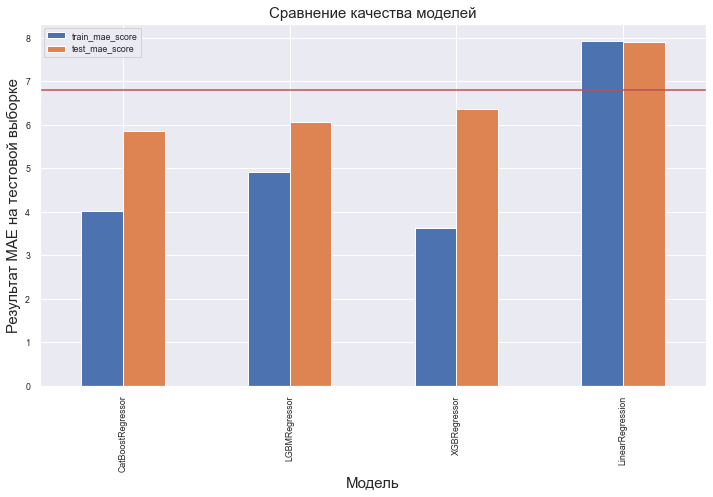

In [74]:
#Посмотрим на графике на результаты MAE на обучающей и тестовой выборках
plt.figure(figsize=(10, 7))
plt.subplot(111)
results.plot(kind='bar', ax=plt.gca()).hlines(6.8, -1, 5, color = 'r')
plt.xlabel('Модель', fontsize=15)
plt.ylabel('Результат MAE на тестовой выборке', fontsize=15)
plt.title('Сравнение качества моделей', fontsize=15)
plt.tight_layout()

Вывод:

- Провели подбор параметров к 4м моделям CatBoost, LightGBM, XGboost и LinearRegression
- Наилучшие результаты получили у CatBoost с результатом 5.8 на тестовой выборке
- У LightGBM и XGBoost по ~6 MAE на тестовой выборке
- Хуже всего показала результат модель LinearRegression с результатом 7.8 на тестовой выборке

## Финальная модель на тестовой выборке с наилучшими параметрами

In [75]:
#С подобранными параметрами будем использовать модель CatBoost на тестовой выборке
model = CatBoostRegressor(depth=4, 
                          learning_rate = 0.11000000000000001, 
                          loss_function = 'MAE', 
                          n_estimators = 600, 
                          random_state = 17,
                          verbose = 0)

model.fit(features_train,target_train)
predictions = model.predict(features_test)
print('MAE на тестовой выборке:', mean_absolute_error(predictions,target_test))

MAE на тестовой выборке: 5.842208134557774


### Feature Importance

Text(0, 0.5, 'FEATURE NAMES')

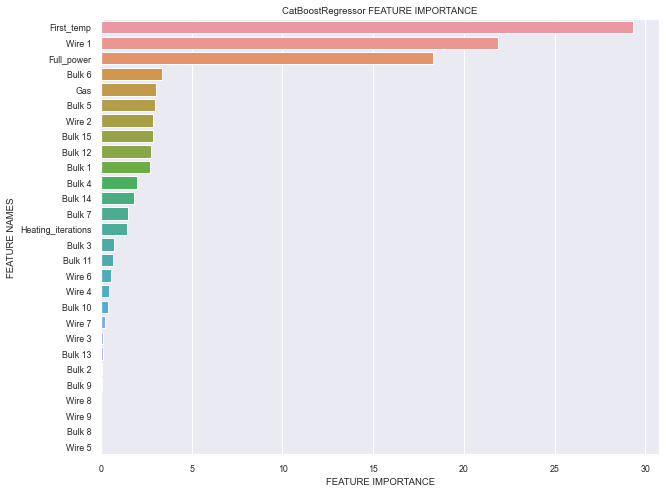

In [76]:
feature_importance = np.array(model.feature_importances_)
feature_names = np.array(features_test.columns)

#Create a DataFrame using a Dictionary
data={'feature_names':feature_names,'feature_importance':feature_importance}
fi_df = pd.DataFrame(data)

#Sort the DataFrame in order decreasing feature importance
fi_df.sort_values(by=['feature_importance'], ascending=False,inplace=True)

#Define size of bar plot
plt.figure(figsize=(10,8))
#Plot Searborn bar chart
sns.barplot(x=fi_df['feature_importance'], y=fi_df['feature_names'])
#Add chart labels
plt.title('CatBoostRegressor ' + 'FEATURE IMPORTANCE')
plt.xlabel('FEATURE IMPORTANCE')
plt.ylabel('FEATURE NAMES')

Мы провели финальное тестирование нашей модели. Модель показала результат MAE 5.9 на тестовой выборке, что соответствует условию решения задачи. Также модель предсказывает лучше, чем наивная модель со средними значениями. 

## Общий вывод

- Мы провели Исследовательский анализ данных 
- Обработали пропуски и выбросы, которые выявили в таблицах
- Добавили несколько новых признаков для нашей модели
- Провели масштабирование признаков
- Для обучения использовали 4 модели : CatBoostRegressor, LightGBMRegressor, XGboostRegressor, LinearRegression
- Провели подбор гиперпараметров с помощью GridSearchCV
- Набрали наилучший результат MAE 5.9 на тестовой выборке CatBoostRegressor
- Так же выявили признаки, которые больше всего влияют на модель это Начальная температура, Полная мощность и Wire 1